# Iowa Liquor Sales: Which City Have The Most Potential Consumers in Covid-19 Pandemic

## Preparing Data

###### Let's start from importing the package and dataset.

In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np

In [2]:
sales_19 = pd.read_csv("Iowa_Liquor_Sales (2019).csv")
sales_20 = pd.read_csv("Iowa_Liquor_Sales (2020).csv")

###### Making a sample from a dataset.
There are over 2 millions rows in the dataset and it will take a long time to process them all. So it is a good decision to make a sample.

In [3]:
sales_19_sample = sales_19.sample(frac=.03)
sales_20_sample = sales_20.sample(frac=.03)

###### Checking the distribution of the data.
If the dataset and sample have the same distribution therefore they have the same characteristic and the sample can be used for further analysis. We can just check the distribution of some columns that are important in this analysis.

In [49]:
def categorical_histogram(df,column_name,column_name_2):
    sns.histplot(data=df,x=df[str(column_name)].value_counts()).set_title(str(column_name_2))
    #df[str(column_name)].value_counts().plot(kind='hist')
    plt.show()
    return

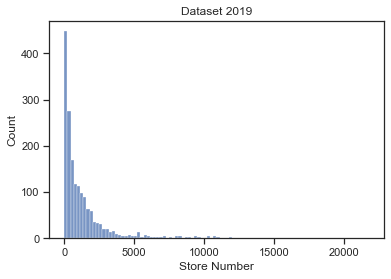

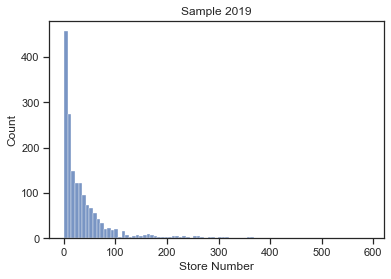

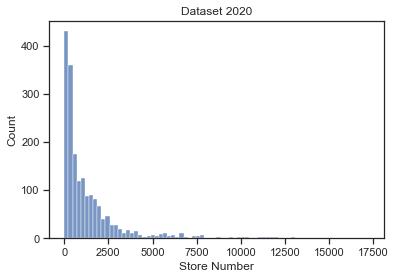

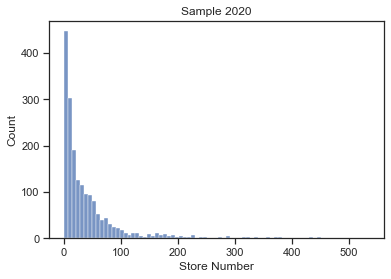

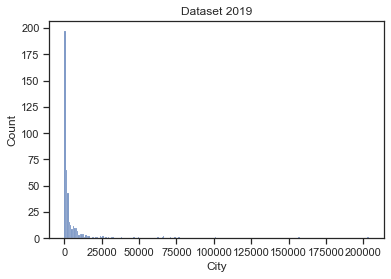

...

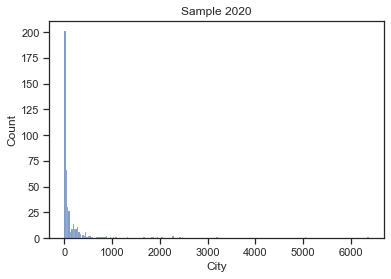

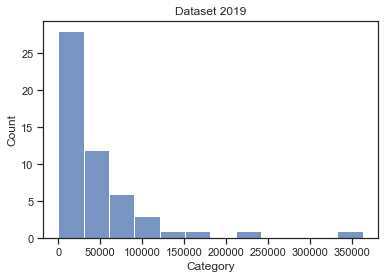

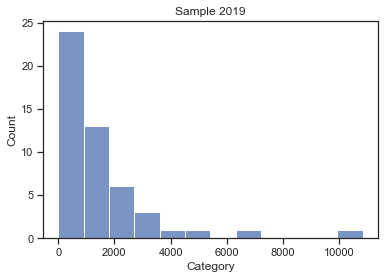

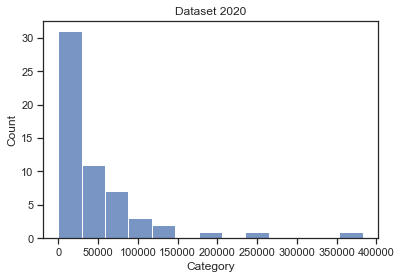

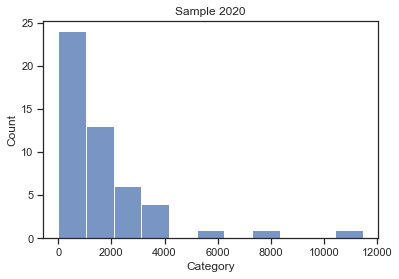

In [150]:
column_sample = ['Store Number','City','Category']

for i in column_sample:
    categorical_histogram(sales_19,i,'Dataset 2019')
    categorical_histogram(sales_19_sample,i,'Sample 2019')
    categorical_histogram(sales_20,i,'Dataset 2020')
    categorical_histogram(sales_20_sample,i,'Sample 2020')

###### Replacing nan value with 0.

In [6]:
sales_19_sample = sales_19_sample.fillna(0)
sales_20_sample = sales_20_sample.fillna(0)

sales_19_sample

,Invoice/Item Number,Date,Store Number,Store Name,Address,City,Zip Code,Store Location,County Number,County,...,Item Number,Item Description,Pack,Bottle Volume (ml),State Bottle Cost,State Bottle Retail,Bottles Sold,Sale (Dollars),Volume Sold (Liters),Volume Sold (Gallons)
399544,INV-17988500006,03/07/2019,3713,Wal-Mart 0810 / Mason City,4151 4th St SW,Mason City,50401.0,POINT (-93.261648 43.148239),17.0,CERRO GORD,...,43336,Captain Morgan Original Spiced,12,750,9.06,13.59,12,163.08,9.00,2.37
1483526,INV-21391800003,08/21/2019,3041,Shugar's Super Valu / Colfax,28 E Howard,Colfax,50054.0,POINT (-93.244443 41.677932),50.0,JASPER,...,43334,Captain Morgan Spiced Rum,24,375,5.00,7.50,4,30.00,1.50,0.39
922877,INV-19670400039,05/29/2019,2521,Hy-Vee Food and Drug / Grand / WDM,1990 Grand Avenue,West Des Moines,50265.0,POINT (-93.73162 41.571127),77.0,POLK,...,88116,Milagro Silver Tequila,6,750,16.50,24.75,6,148.50,4.50,1.18
1743944,INV-22252900026,10/01/2019,2572,Hy-Vee Food Store / Cedar Falls,6301 University,Cedar Falls,50613.0,POINT (-92.435236 42.512789),7.0,BLACK HAWK,...,41703,UV Red Cherry Mini,12,50,4.40,6.60,1,6.60,0.05,0.01
573572,INV-18607600009,04/05/2019,4650,Loofts on 9 Liquor Here or Liquor There,"202, W 4th Ave",Swea City,50590.0,POINT (-94.30874900000002 43.38496),55.0,KOSSUTH,...,12888,Rich & Rare,6,1750,8.98,13.47,6,80.82,10.50,2.77
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
459035,INV-18185700059,03/18/2019,5054,Cork 'N Bottle / Manchester,900 E Main St,Manchester,52087.0,POINT (-91.445038 42.484073),28.0,Delaware,...,75181,Ketel One Botanical Grapefruit & Rose,12,750,12.50,18.75,2,37.50,1.50,0.39
1930021,INV-22890300113,10/29/2019,2621,Hy-Vee Food Store #3 / Sioux City,3301 Gordon Dr,Sioux City,51105.0,POINT (-96.364108 42.487752),97.0,WOODBURY,...,39680,Deep Eddy Ruby Red Grapefruit Mini,10,50,5.05,7.58,2,15.16,0.10,0.02
1849556,INV-22606000017,10/17/2019,3670,Wal-Mart 2827 / Coralville,2801 Commerce Dr,Coralville,52241.0,POINT (-91.610774 41.695806),52.0,JOHNSON,...,42718,Malibu Coconut Rum,6,1750,16.99,25.49,6,152.94,10.50,2.77
1103256,INV-20213800004,06/25/2019,5219,Kirkwood Liquor & Tobacco,"300, Kirkwood Ave",Iowa City,52240.0,POINT (-91.531628 41.649432),52.0,JOHNSON,...,38176,Titos Handmade Vodka,12,750,9.64,14.46,12,173.52,9.00,2.37


###### Saving the sample data.
It can be a great choice to save the sample in case we want to do other analysis with the same sample. 

In [7]:
sales_19_sample.to_csv("Iowa_Liquor_Sales_Sample (2019).csv", index=False)
sales_20_sample.to_csv("Iowa_Liquor_Sales_Sample (2020).csv", index=False)

## Analyzing Data

###### Making two new columns.
Making some synthesis columns form the current columns may help us to reach our analysis goal.

In [8]:
def bottle_income(df,column_name_1,column_name_2,column_name_3):
    df["State_Bottle_Income"] = df[str(column_name_1)]-df[str(column_name_2)]
    df["Total_Income"] = df["State_Bottle_Income"]*df[str(column_name_3)]
    return

In [9]:
bottle_income(sales_19_sample,'State Bottle Retail','State Bottle Cost',
              'Bottles Sold')
bottle_income(sales_20_sample,'State Bottle Retail','State Bottle Cost',
              'Bottles Sold')

###### Creating a new table.
This table contains each unique city and their total income from liquor sales and total liquor volume sold.

In [10]:
each_city_19 = sales_19_sample[["City","Total_Income","Volume Sold (Liters)"]].groupby(["City"]).sum().reset_index()
each_city_20 = sales_20_sample[["City","Total_Income","Volume Sold (Liters)"]].groupby(["City"]).sum().reset_index()

In [11]:
each_city_19

,City,Total_Income,Volume Sold (Liters)
0,0,6128.87,1154.86
1,Ackley,840.06,141.37
2,Adair,780.21,125.84
3,Adel,5130.64,883.33
4,Afton,412.86,97.50
...,...,...,...
423,Winterset,7733.07,1374.52
424,Winthrop,423.51,92.90
425,Woodbine,659.84,134.80
426,Woodward,241.92,49.87


###### Finding correlation between total income and total volume sold columns, visually and statistically.

In [12]:
import seaborn as sns

def plot_graphic(df1,df2,column_name_1,column_name_2,label1,label2):
    df1['Year']= np.array([str(label1) for i in range(len(df1))])
    df2['Year']= np.array([str(label2) for i in range(len(df2))])
    new_frames = [df1,df2]
    new_df = pd.concat(new_frames, ignore_index=True)
    sns.relplot(x=str(column_name_1), y=str(column_name_2), hue='Year', data=new_df)
    plt.show()
    return

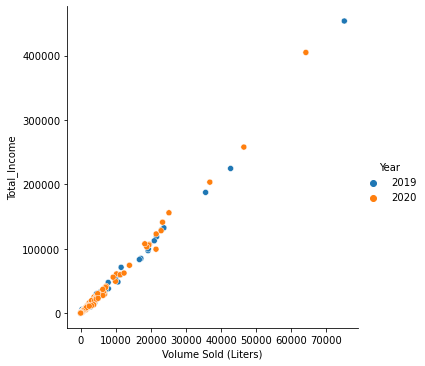

In [13]:
plot_graphic(each_city_19, each_city_20, 'Volume Sold (Liters)', 'Total_Income', 
             '2019', '2020')

In [14]:
each_city_19[['Volume Sold (Liters)','Total_Income']].corr()
each_city_20[['Volume Sold (Liters)','Total_Income']].corr()

,Volume Sold (Liters),Total_Income
Volume Sold (Liters),1.000000,0.996254
Total_Income,0.996254,1.000000


###### Plotting the cities in a boxplot based on their total incomes.

In [15]:
def boxplots(column_name,df1,df2,label1,label2):
    new_list = []
    for i in range(len(df1[str(column_name)])):
        new_list.append([np.array(df1[str(column_name)])[i],str(label1)])
    for i in range(len(df2[str(column_name)])):
        new_list.append([np.array(df2[str(column_name)])[i],str(label2)])
    new_df = pd.DataFrame({str(column_name):np.array(new_list)[:,0].astype(float),
                           'Year':np.array(new_list)[:,1]})
    sns.boxplot(x=str(column_name), y='Year', data=new_df)
    plt.show()
    return

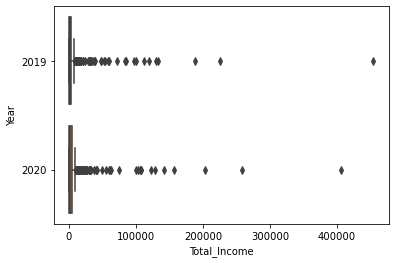

In [16]:
boxplots("Total_Income",each_city_19,each_city_20,"2019","2020")

###### Finding the outlier cities.

In [17]:
stat_19 = each_city_19["Total_Income"].astype(float).describe()
stat_20 = each_city_20["Total_Income"].astype(float).describe()

stat_19

count       428.000000
mean       8200.432921
std       30652.937360
min          17.250000
25%         358.102500
50%         920.640000
75%        3629.665000
max      453828.530000
Name: Total_Income, dtype: float64

In [18]:
max_whisker_19 = np.array(stat_19)[6] + 1.5*(np.array(stat_19)[6]-np.array(stat_19)[4])
max_whisker_20 = np.array(stat_20)[6] + 1.5*(np.array(stat_20)[6]-np.array(stat_20)[4])

max_whisker_19

8537.008750000003

In [19]:
city_outliers = []

def best_city(df,whisker,label):
    for i in range(len(df)):
        if float(df.loc[int(i),"Total_Income"]) > float(whisker):
            city_outliers.append([np.array(df["City"].astype(str))[i],
                                  np.array(df["Total_Income"].astype(float))[i],
                                 str(label)])
    return

best_city(each_city_19,max_whisker_19,'2019')
best_city(each_city_20,max_whisker_20,'2020')

city_outliers

[['Algona', 9407.419999999995, '2019'],
 ['Altoona', 29663.850000000006, '2019'],
 ['Ames', 97254.43999999974, '2019'],
 ['Anamosa', 9183.530000000004, '2019'],
 ['Ankeny', 85008.02999999981, '2019'],
 ['Arnolds Park', 10197.270000000004, '2019'],
 ['Atlantic', 10043.010000000007, '2019'],
 ['Bettendorf', 57892.39999999996, '2019'],
 ['Boone', 15488.180000000002, '2019'],
 ['Burlington', 32079.859999999997, '2019'],
 ['Carroll', 28399.380000000023, '2019'],
 ['Cedar Falls', 59670.23999999994, '2019'],
 ['Cedar Rapids', 224798.43999999965, '2019'],
 ['Centerville', 9055.089999999998, '2019'],
 ['Charles City', 8550.75, '2019'],
 ['Clear Lake', 11549.030000000008, '2019'],
 ['Clinton', 38949.870000000024, '2019'],
 ['Coralville', 71220.39999999994, '2019'],
 ['Council Bluffs', 118846.76999999984, '2019'],
 ['Creston', 14365.59, '2019'],
 ['Davenport', 187641.9399999996, '2019'],
 ['Decorah', 16217.350000000013, '2019'],
 ['Denison', 17178.38, '2019'],
 ['Des Moines', 453828.5300000021, '

###### Calculating income growth percentage for each outlier city.

In [20]:
def adaptive_city(array):    
    outliers_19 = []
    outliers_20 = []
    for i in range(len(array)):
        if str(array[i,2]) == '2019':
            outliers_19.append(array[i,0:2].astype(str))
        elif str(array[i,2]) == '2020':
            outliers_20.append(array[i,0:2].astype(str))
    
    still_outliers = np.intersect1d(np.array(outliers_20)[:,0],
                                    np.array(outliers_19)[:,0])
    
    grow_outliers = []
    for i in still_outliers:
        income_increase_percentage = 0
        for l in range(len(outliers_20)):
            if str(np.array(outliers_20)[l,0]) == str(i):
                income_increase_percentage += float(np.array(outliers_20)[l,1])
        for l in range(len(outliers_19)):
            if str(np.array(outliers_19)[l,0]) == str(i):
                income_increase_percentage -= float(np.array(outliers_19)[l,1])
                income_increase_percentage *= float(100)
                income_increase_percentage /= float(np.array(outliers_19)[l,1])
        if float(income_increase_percentage) > 0:
            grow_outliers.append([str(i),float(income_increase_percentage)])
    
    new_outliers = np.setdiff1d(np.array(outliers_20)[:,0],np.array(outliers_19)[:,0])
    for i in new_outliers:
        income_increase_percentage = 0
        for l in range(len(outliers_20)):
            if str(np.array(outliers_20)[l,0]) == str(i):
                income_increase_percentage += float(np.array(outliers_20)[l,1])
        for l in range(len(each_city_19)):
            if str(np.array(each_city_19)[l,0]) == str(i):
                income_increase_percentage -= float(np.array(each_city_19)[l,1])
                income_increase_percentage *= float(100)
                income_increase_percentage /= float(np.array(each_city_19)[l,1])
        if float(income_increase_percentage) > 0:
            grow_outliers.append([str(i),float(income_increase_percentage/float(np.array(each_city_19)[l,1]))])
            
    return grow_outliers

In [21]:
grow_outliers = adaptive_city(np.array(city_outliers))
grow_outliers

[['Algona', 89.31067178886465],
 ['Altoona', 35.7847009069963],
 ['Ames', 9.89044818930643],
 ['Anamosa', 46.279480766110616],
 ['Ankeny', 24.511837293488732],
 ['Atlantic', 58.98490591963963],
 ['Bettendorf', 5.373347796947461],
 ['Boone', 28.365760211981016],
 ['Carroll', 4.074384722483319],
 ['Cedar Falls', 24.745752656600825],
 ['Cedar Rapids', 14.784528753847368],
 ['Centerville', 21.550199942794602],
 ['Charles City', 26.63509048913836],
 ['Clear Lake', 40.365641097131046],
 ['Coralville', 39.56739922831137],
 ['Council Bluffs', 7.832228002494159],
 ['Davenport', 8.481046401460333],
 ['Decorah', 34.913842273860915],
 ['Dubuque', 23.506543182437177],
 ['Dyersville', 8.346341400239362],
 ['Fairfield', 4.969910430356637],
 ['Fort Dodge', 2.1821513501270324],
 ['Fort Madison', 39.50717087921901],
 ['Grimes', 69.72913032306914],
 ['Grinnell', 16.472910917586702],
 ['Harlan', 54.241742573087954],
 ['Independence', 1.5380924579773114],
 ['Indianola', 3.4864818529021275],
 ['Iowa City', 

###### Taking five cities with the biggest income growth percentage.

In [22]:
best_grow_outliers_index = np.argsort(np.array(grow_outliers)[:,1].astype(float))[-5:][::-1]
best_grow_outliers = np.array(grow_outliers)[best_grow_outliers_index]

best_grow_outliers

array([['Le Mars', '118.24123321013235'],
       ['Newton', '91.04654148349235'],
       ['Algona', '89.31067178886465'],
       ['Grimes', '69.72913032306914'],
       ['Manchester', '66.57943641278682']], dtype='<U19')

###### Visualizing the income growth for the best five cities.

In [23]:
def city_growth_hist(array,df_19,df_20):
    new_list = []
    for i in array[:,0]:
        for l in range(len(df_19)):
            if str(np.array(df_19)[l,0]) == str(i):
                new_list.append(np.array(df_19)[l,:])
        for l in range(len(df_20)):
            if str(np.array(df_20)[l,0]) == str(i):
                new_list.append(np.array(df_20)[l,:])
    new_df = pd.DataFrame({'City':np.array(new_list)[:,0].astype(str),
                           'Total_Income':np.array(new_list)[:,1].astype(float),
                           'Year':np.array(new_list)[:,3].astype(str)})
    sns.barplot(x='City', y='Total_Income', hue='Year', data=new_df)
    plt.show()
    return new_df

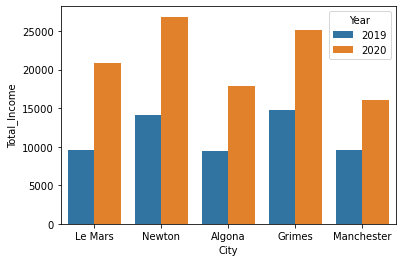

,City,Total_Income,Year
0,Le Mars,9539.98,2019
1,Le Mars,20820.17,2020
2,Newton,14059.93,2019
3,Newton,26861.01,2020
4,Algona,9407.42,2019
5,Algona,17809.25,2020
6,Grimes,14789.40,2019
7,Grimes,25101.92,2020
8,Manchester,9610.58,2019
9,Manchester,16009.25,2020


In [24]:
targeted_city = city_growth_hist(best_grow_outliers, each_city_19, each_city_20)

targeted_city

###### Resetting sample index for further analysis.

In [33]:
sales_20_sample = sales_20_sample.reset_index(drop=True)

sales_20_sample

,Invoice/Item Number,Date,Store Number,Store Name,Address,City,Zip Code,Store Location,County Number,County,...,Pack,Bottle Volume (ml),State Bottle Cost,State Bottle Retail,Bottles Sold,Sale (Dollars),Volume Sold (Liters),Volume Sold (Gallons),State_Bottle_Income,Total_Income
0,INV-25303400029,02/18/2020,2594,Hy-Vee Food Store / Sioux City,4500 Sergeant Road,Sioux City,51106.0,POINT (-96.346969 42.447396),97.0,WOODBURY,...,12,1000,4.85,7.28,12,87.36,12.00,3.17,2.43,29.16
1,INV-25450700011,02/25/2020,4512,Metro Mart #4 / Waterloo,"2332, Falls Ave",Waterloo,50701.0,POINT (-92.376365 42.500152),7.0,BLACK HAWK,...,10,50,7.35,11.03,1,11.03,0.05,0.01,3.68,3.68
2,INV-31462600067,10/28/2020,2596,Hy-Vee Ottumwa#2,2453 North Court,Ottumwa,52501.0,0,90.0,WAPELLO,...,12,1000,7.83,11.75,12,141.00,12.00,3.17,3.92,47.04
3,INV-30161500040,09/11/2020,4180,Smokin' Joe's #10 Tobacco and Liquor Outlet,480 7th Ave,Marion,52302.0,POINT (-91.605094 42.033366),57.0,LINN,...,24,375,5.50,8.25,24,198.00,9.00,2.37,2.75,66.00
4,INV-26103500028,03/25/2020,4617,Lickety Liquor,2501 HUBBELL AVE,Des Moines,50317.0,POINT (-93.570489 41.607817),77.0,POLK,...,6,750,10.00,15.00,3,45.00,2.25,0.59,5.00,15.00
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
78426,INV-27258900035,05/15/2020,2612,Hy-Vee Store / Perry,1215 141 St,Perry,50220.0,POINT (-94.104501 41.830292),25.0,DALLAS,...,12,750,7.50,11.25,12,135.00,9.00,2.37,3.75,45.00
78427,INV-31724200002,11/06/2020,3830,Wal-Mart 1435 / Creston,806 Laurel St,Creston,50801.0,POINT (-94.372786 41.047714),88.0,UNION,...,12,750,15.59,23.39,24,561.36,18.00,4.75,7.80,187.20
78428,INV-30309300017,09/17/2020,2248,Ingersoll Liquor and Beverage,3500 Ingersoll Ave,Des Moines,50312.0,POINT (-93.664182 41.586319),77.0,POLK,...,12,750,7.50,11.25,2,22.50,1.50,0.39,3.75,7.50
78429,INV-30990600078,10/13/2020,2637,Hy-Vee #5 / Davenport,2351 W Locust,Davenport,52804.0,POINT (-90.611972 41.538207),82.0,SCOTT,...,48,200,3.00,4.50,8,36.00,1.60,0.42,1.50,12.00


###### Extracting the most purchased liquor categories in each the best five cities.

In [39]:
def extract_column(array,df,column_name,label):
    frames = []
    for i in array[:,0]:
        print('i = ',i)
        column_char = []
        for l in range(len(df)):
            print('l = ',l)
            if str(df.loc[int(l),"City"]) == str(i):
                column_char.append([str(df.loc[int(l),str(column_name)]),
                                float(df.loc[int(l),'Total_Income'])])
        new_df = pd.DataFrame(column_char, columns =[str(column_name),"Total_Income"])
        new_df = new_df.groupby([str(column_name)]).sum().reset_index()
        new_df = new_df.sort_values(by=[str(column_name)])
        new_df_2 = new_df.head(5)
        new_df_2 = new_df_2.append(pd.DataFrame([['Others',new_df['Total_Income'].sum()-new_df_2['Total_Income'].sum()]], 
                                                columns =[str(column_name),"Total_Income"]))
        new_df_2['City'] = np.array([str(i) for j in range(len(new_df_2))])
        new_df_2['Year'] = np.array([str(label) for j in range(len(new_df_2))])
        frames.append(new_df_2)
    return pd.concat(frames, ignore_index=True)

In [40]:
category_in_city = extract_column(best_grow_outliers, sales_20_sample, 'Category', '2020')

category_in_city

i =  Le Mars
l =  0
l =  1
l =  2
l =  3
l =  4
l =  5
l =  6
l =  7
l =  8
l =  9
l =  10
l =  11
l =  12
l =  13
l =  14
l =  15
l =  16
l =  17
l =  18
l =  19
l =  20
l =  21
l =  22
l =  23
l =  24
l =  25
l =  26
l =  27
l =  28
l =  29
l =  30
l =  31
l =  32
l =  33
l =  34
l =  35
l =  36
l =  37
l =  38
l =  39
l =  40
l =  41
l =  42
l =  43
l =  44
l =  45
l =  46
l =  47
l =  48
l =  49
l =  50
l =  51
l =  52
l =  53
l =  54
l =  55
l =  56
l =  57
l =  58
l =  59
l =  60
l =  61
l =  62
l =  63
l =  64
l =  65
l =  66
l =  67
l =  68
l =  69
l =  70
l =  71
l =  72
l =  73
l =  74
l =  75
l =  76
l =  77
l =  78
l =  79
l =  80
l =  81
l =  82
l =  83
l =  84
l =  85
l =  86
l =  87
l =  88
l =  89
l =  90
l =  91
l =  92
l =  93
l =  94
l =  95
l =  96
l =  97
l =  98
l =  99
l =  100
l =  101
l =  102
l =  103
l =  104
l =  105
l =  106
l =  107
l =  108
l =  109
l =  110
l =  111
l =  112
l =  113
l =  114
l =  115
l =  116
l =  117
l =  118
l =  119
l =  120
l =  121

l =  1022
l =  1023
l =  1024
l =  1025
l =  1026
l =  1027
l =  1028
l =  1029
l =  1030
l =  1031
l =  1032
l =  1033
l =  1034
l =  1035
l =  1036
l =  1037
l =  1038
l =  1039
l =  1040
l =  1041
l =  1042
l =  1043
l =  1044
l =  1045
l =  1046
l =  1047
l =  1048
l =  1049
l =  1050
l =  1051
l =  1052
l =  1053
l =  1054
l =  1055
l =  1056
l =  1057
l =  1058
l =  1059
l =  1060
l =  1061
l =  1062
l =  1063
l =  1064
l =  1065
l =  1066
l =  1067
l =  1068
l =  1069
l =  1070
l =  1071
l =  1072
l =  1073
l =  1074
l =  1075
l =  1076
l =  1077
l =  1078
l =  1079
l =  1080
l =  1081
l =  1082
l =  1083
l =  1084
l =  1085
l =  1086
l =  1087
l =  1088
l =  1089
l =  1090
l =  1091
l =  1092
l =  1093
l =  1094
l =  1095
l =  1096
l =  1097
l =  1098
l =  1099
l =  1100
l =  1101
l =  1102
l =  1103
l =  1104
l =  1105
l =  1106
l =  1107
l =  1108
l =  1109
l =  1110
l =  1111
l =  1112
l =  1113
l =  1114
l =  1115
l =  1116
l =  1117
l =  1118
l =  1119
l =  1120
l =  1121


l =  2132
l =  2133
l =  2134
l =  2135
l =  2136
l =  2137
l =  2138
l =  2139
l =  2140
l =  2141
l =  2142
l =  2143
l =  2144
l =  2145
l =  2146
l =  2147
l =  2148
l =  2149
l =  2150
l =  2151
l =  2152
l =  2153
l =  2154
l =  2155
l =  2156
l =  2157
l =  2158
l =  2159
l =  2160
l =  2161
l =  2162
l =  2163
l =  2164
l =  2165
l =  2166
l =  2167
l =  2168
l =  2169
l =  2170
l =  2171
l =  2172
l =  2173
l =  2174
l =  2175
l =  2176
l =  2177
l =  2178
l =  2179
l =  2180
l =  2181
l =  2182
l =  2183
l =  2184
l =  2185
l =  2186
l =  2187
l =  2188
l =  2189
l =  2190
l =  2191
l =  2192
l =  2193
l =  2194
l =  2195
l =  2196
l =  2197
l =  2198
l =  2199
l =  2200
l =  2201
l =  2202
l =  2203
l =  2204
l =  2205
l =  2206
l =  2207
l =  2208
l =  2209
l =  2210
l =  2211
l =  2212
l =  2213
l =  2214
l =  2215
l =  2216
l =  2217
l =  2218
l =  2219
l =  2220
l =  2221
l =  2222
l =  2223
l =  2224
l =  2225
l =  2226
l =  2227
l =  2228
l =  2229
l =  2230
l =  2231


l =  3132
l =  3133
l =  3134
l =  3135
l =  3136
l =  3137
l =  3138
l =  3139
l =  3140
l =  3141
l =  3142
l =  3143
l =  3144
l =  3145
l =  3146
l =  3147
l =  3148
l =  3149
l =  3150
l =  3151
l =  3152
l =  3153
l =  3154
l =  3155
l =  3156
l =  3157
l =  3158
l =  3159
l =  3160
l =  3161
l =  3162
l =  3163
l =  3164
l =  3165
l =  3166
l =  3167
l =  3168
l =  3169
l =  3170
l =  3171
l =  3172
l =  3173
l =  3174
l =  3175
l =  3176
l =  3177
l =  3178
l =  3179
l =  3180
l =  3181
l =  3182
l =  3183
l =  3184
l =  3185
l =  3186
l =  3187
l =  3188
l =  3189
l =  3190
l =  3191
l =  3192
l =  3193
l =  3194
l =  3195
l =  3196
l =  3197
l =  3198
l =  3199
l =  3200
l =  3201
l =  3202
l =  3203
l =  3204
l =  3205
l =  3206
l =  3207
l =  3208
l =  3209
l =  3210
l =  3211
l =  3212
l =  3213
l =  3214
l =  3215
l =  3216
l =  3217
l =  3218
l =  3219
l =  3220
l =  3221
l =  3222
l =  3223
l =  3224
l =  3225
l =  3226
l =  3227
l =  3228
l =  3229
l =  3230
l =  3231


l =  4131
l =  4132
l =  4133
l =  4134
l =  4135
l =  4136
l =  4137
l =  4138
l =  4139
l =  4140
l =  4141
l =  4142
l =  4143
l =  4144
l =  4145
l =  4146
l =  4147
l =  4148
l =  4149
l =  4150
l =  4151
l =  4152
l =  4153
l =  4154
l =  4155
l =  4156
l =  4157
l =  4158
l =  4159
l =  4160
l =  4161
l =  4162
l =  4163
l =  4164
l =  4165
l =  4166
l =  4167
l =  4168
l =  4169
l =  4170
l =  4171
l =  4172
l =  4173
l =  4174
l =  4175
l =  4176
l =  4177
l =  4178
l =  4179
l =  4180
l =  4181
l =  4182
l =  4183
l =  4184
l =  4185
l =  4186
l =  4187
l =  4188
l =  4189
l =  4190
l =  4191
l =  4192
l =  4193
l =  4194
l =  4195
l =  4196
l =  4197
l =  4198
l =  4199
l =  4200
l =  4201
l =  4202
l =  4203
l =  4204
l =  4205
l =  4206
l =  4207
l =  4208
l =  4209
l =  4210
l =  4211
l =  4212
l =  4213
l =  4214
l =  4215
l =  4216
l =  4217
l =  4218
l =  4219
l =  4220
l =  4221
l =  4222
l =  4223
l =  4224
l =  4225
l =  4226
l =  4227
l =  4228
l =  4229
l =  4230


l =  5175
l =  5176
l =  5177
l =  5178
l =  5179
l =  5180
l =  5181
l =  5182
l =  5183
l =  5184
l =  5185
l =  5186
l =  5187
l =  5188
l =  5189
l =  5190
l =  5191
l =  5192
l =  5193
l =  5194
l =  5195
l =  5196
l =  5197
l =  5198
l =  5199
l =  5200
l =  5201
l =  5202
l =  5203
l =  5204
l =  5205
l =  5206
l =  5207
l =  5208
l =  5209
l =  5210
l =  5211
l =  5212
l =  5213
l =  5214
l =  5215
l =  5216
l =  5217
l =  5218
l =  5219
l =  5220
l =  5221
l =  5222
l =  5223
l =  5224
l =  5225
l =  5226
l =  5227
l =  5228
l =  5229
l =  5230
l =  5231
l =  5232
l =  5233
l =  5234
l =  5235
l =  5236
l =  5237
l =  5238
l =  5239
l =  5240
l =  5241
l =  5242
l =  5243
l =  5244
l =  5245
l =  5246
l =  5247
l =  5248
l =  5249
l =  5250
l =  5251
l =  5252
l =  5253
l =  5254
l =  5255
l =  5256
l =  5257
l =  5258
l =  5259
l =  5260
l =  5261
l =  5262
l =  5263
l =  5264
l =  5265
l =  5266
l =  5267
l =  5268
l =  5269
l =  5270
l =  5271
l =  5272
l =  5273
l =  5274


l =  6326
l =  6327
l =  6328
l =  6329
l =  6330
l =  6331
l =  6332
l =  6333
l =  6334
l =  6335
l =  6336
l =  6337
l =  6338
l =  6339
l =  6340
l =  6341
l =  6342
l =  6343
l =  6344
l =  6345
l =  6346
l =  6347
l =  6348
l =  6349
l =  6350
l =  6351
l =  6352
l =  6353
l =  6354
l =  6355
l =  6356
l =  6357
l =  6358
l =  6359
l =  6360
l =  6361
l =  6362
l =  6363
l =  6364
l =  6365
l =  6366
l =  6367
l =  6368
l =  6369
l =  6370
l =  6371
l =  6372
l =  6373
l =  6374
l =  6375
l =  6376
l =  6377
l =  6378
l =  6379
l =  6380
l =  6381
l =  6382
l =  6383
l =  6384
l =  6385
l =  6386
l =  6387
l =  6388
l =  6389
l =  6390
l =  6391
l =  6392
l =  6393
l =  6394
l =  6395
l =  6396
l =  6397
l =  6398
l =  6399
l =  6400
l =  6401
l =  6402
l =  6403
l =  6404
l =  6405
l =  6406
l =  6407
l =  6408
l =  6409
l =  6410
l =  6411
l =  6412
l =  6413
l =  6414
l =  6415
l =  6416
l =  6417
l =  6418
l =  6419
l =  6420
l =  6421
l =  6422
l =  6423
l =  6424
l =  6425


l =  7475
l =  7476
l =  7477
l =  7478
l =  7479
l =  7480
l =  7481
l =  7482
l =  7483
l =  7484
l =  7485
l =  7486
l =  7487
l =  7488
l =  7489
l =  7490
l =  7491
l =  7492
l =  7493
l =  7494
l =  7495
l =  7496
l =  7497
l =  7498
l =  7499
l =  7500
l =  7501
l =  7502
l =  7503
l =  7504
l =  7505
l =  7506
l =  7507
l =  7508
l =  7509
l =  7510
l =  7511
l =  7512
l =  7513
l =  7514
l =  7515
l =  7516
l =  7517
l =  7518
l =  7519
l =  7520
l =  7521
l =  7522
l =  7523
l =  7524
l =  7525
l =  7526
l =  7527
l =  7528
l =  7529
l =  7530
l =  7531
l =  7532
l =  7533
l =  7534
l =  7535
l =  7536
l =  7537
l =  7538
l =  7539
l =  7540
l =  7541
l =  7542
l =  7543
l =  7544
l =  7545
l =  7546
l =  7547
l =  7548
l =  7549
l =  7550
l =  7551
l =  7552
l =  7553
l =  7554
l =  7555
l =  7556
l =  7557
l =  7558
l =  7559
l =  7560
l =  7561
l =  7562
l =  7563
l =  7564
l =  7565
l =  7566
l =  7567
l =  7568
l =  7569
l =  7570
l =  7571
l =  7572
l =  7573
l =  7574


l =  8627
l =  8628
l =  8629
l =  8630
l =  8631
l =  8632
l =  8633
l =  8634
l =  8635
l =  8636
l =  8637
l =  8638
l =  8639
l =  8640
l =  8641
l =  8642
l =  8643
l =  8644
l =  8645
l =  8646
l =  8647
l =  8648
l =  8649
l =  8650
l =  8651
l =  8652
l =  8653
l =  8654
l =  8655
l =  8656
l =  8657
l =  8658
l =  8659
l =  8660
l =  8661
l =  8662
l =  8663
l =  8664
l =  8665
l =  8666
l =  8667
l =  8668
l =  8669
l =  8670
l =  8671
l =  8672
l =  8673
l =  8674
l =  8675
l =  8676
l =  8677
l =  8678
l =  8679
l =  8680
l =  8681
l =  8682
l =  8683
l =  8684
l =  8685
l =  8686
l =  8687
l =  8688
l =  8689
l =  8690
l =  8691
l =  8692
l =  8693
l =  8694
l =  8695
l =  8696
l =  8697
l =  8698
l =  8699
l =  8700
l =  8701
l =  8702
l =  8703
l =  8704
l =  8705
l =  8706
l =  8707
l =  8708
l =  8709
l =  8710
l =  8711
l =  8712
l =  8713
l =  8714
l =  8715
l =  8716
l =  8717
l =  8718
l =  8719
l =  8720
l =  8721
l =  8722
l =  8723
l =  8724
l =  8725
l =  8726


l =  9630
l =  9631
l =  9632
l =  9633
l =  9634
l =  9635
l =  9636
l =  9637
l =  9638
l =  9639
l =  9640
l =  9641
l =  9642
l =  9643
l =  9644
l =  9645
l =  9646
l =  9647
l =  9648
l =  9649
l =  9650
l =  9651
l =  9652
l =  9653
l =  9654
l =  9655
l =  9656
l =  9657
l =  9658
l =  9659
l =  9660
l =  9661
l =  9662
l =  9663
l =  9664
l =  9665
l =  9666
l =  9667
l =  9668
l =  9669
l =  9670
l =  9671
l =  9672
l =  9673
l =  9674
l =  9675
l =  9676
l =  9677
l =  9678
l =  9679
l =  9680
l =  9681
l =  9682
l =  9683
l =  9684
l =  9685
l =  9686
l =  9687
l =  9688
l =  9689
l =  9690
l =  9691
l =  9692
l =  9693
l =  9694
l =  9695
l =  9696
l =  9697
l =  9698
l =  9699
l =  9700
l =  9701
l =  9702
l =  9703
l =  9704
l =  9705
l =  9706
l =  9707
l =  9708
l =  9709
l =  9710
l =  9711
l =  9712
l =  9713
l =  9714
l =  9715
l =  9716
l =  9717
l =  9718
l =  9719
l =  9720
l =  9721
l =  9722
l =  9723
l =  9724
l =  9725
l =  9726
l =  9727
l =  9728
l =  9729


l =  10630
l =  10631
l =  10632
l =  10633
l =  10634
l =  10635
l =  10636
l =  10637
l =  10638
l =  10639
l =  10640
l =  10641
l =  10642
l =  10643
l =  10644
l =  10645
l =  10646
l =  10647
l =  10648
l =  10649
l =  10650
l =  10651
l =  10652
l =  10653
l =  10654
l =  10655
l =  10656
l =  10657
l =  10658
l =  10659
l =  10660
l =  10661
l =  10662
l =  10663
l =  10664
l =  10665
l =  10666
l =  10667
l =  10668
l =  10669
l =  10670
l =  10671
l =  10672
l =  10673
l =  10674
l =  10675
l =  10676
l =  10677
l =  10678
l =  10679
l =  10680
l =  10681
l =  10682
l =  10683
l =  10684
l =  10685
l =  10686
l =  10687
l =  10688
l =  10689
l =  10690
l =  10691
l =  10692
l =  10693
l =  10694
l =  10695
l =  10696
l =  10697
l =  10698
l =  10699
l =  10700
l =  10701
l =  10702
l =  10703
l =  10704
l =  10705
l =  10706
l =  10707
l =  10708
l =  10709
l =  10710
l =  10711
l =  10712
l =  10713
l =  10714
l =  10715
l =  10716
l =  10717
l =  10718
l =  10719
l =  10720

l =  11763
l =  11764
l =  11765
l =  11766
l =  11767
l =  11768
l =  11769
l =  11770
l =  11771
l =  11772
l =  11773
l =  11774
l =  11775
l =  11776
l =  11777
l =  11778
l =  11779
l =  11780
l =  11781
l =  11782
l =  11783
l =  11784
l =  11785
l =  11786
l =  11787
l =  11788
l =  11789
l =  11790
l =  11791
l =  11792
l =  11793
l =  11794
l =  11795
l =  11796
l =  11797
l =  11798
l =  11799
l =  11800
l =  11801
l =  11802
l =  11803
l =  11804
l =  11805
l =  11806
l =  11807
l =  11808
l =  11809
l =  11810
l =  11811
l =  11812
l =  11813
l =  11814
l =  11815
l =  11816
l =  11817
l =  11818
l =  11819
l =  11820
l =  11821
l =  11822
l =  11823
l =  11824
l =  11825
l =  11826
l =  11827
l =  11828
l =  11829
l =  11830
l =  11831
l =  11832
l =  11833
l =  11834
l =  11835
l =  11836
l =  11837
l =  11838
l =  11839
l =  11840
l =  11841
l =  11842
l =  11843
l =  11844
l =  11845
l =  11846
l =  11847
l =  11848
l =  11849
l =  11850
l =  11851
l =  11852
l =  11853

l =  12879
l =  12880
l =  12881
l =  12882
l =  12883
l =  12884
l =  12885
l =  12886
l =  12887
l =  12888
l =  12889
l =  12890
l =  12891
l =  12892
l =  12893
l =  12894
l =  12895
l =  12896
l =  12897
l =  12898
l =  12899
l =  12900
l =  12901
l =  12902
l =  12903
l =  12904
l =  12905
l =  12906
l =  12907
l =  12908
l =  12909
l =  12910
l =  12911
l =  12912
l =  12913
l =  12914
l =  12915
l =  12916
l =  12917
l =  12918
l =  12919
l =  12920
l =  12921
l =  12922
l =  12923
l =  12924
l =  12925
l =  12926
l =  12927
l =  12928
l =  12929
l =  12930
l =  12931
l =  12932
l =  12933
l =  12934
l =  12935
l =  12936
l =  12937
l =  12938
l =  12939
l =  12940
l =  12941
l =  12942
l =  12943
l =  12944
l =  12945
l =  12946
l =  12947
l =  12948
l =  12949
l =  12950
l =  12951
l =  12952
l =  12953
l =  12954
l =  12955
l =  12956
l =  12957
l =  12958
l =  12959
l =  12960
l =  12961
l =  12962
l =  12963
l =  12964
l =  12965
l =  12966
l =  12967
l =  12968
l =  12969

l =  14129
l =  14130
l =  14131
l =  14132
l =  14133
l =  14134
l =  14135
l =  14136
l =  14137
l =  14138
l =  14139
l =  14140
l =  14141
l =  14142
l =  14143
l =  14144
l =  14145
l =  14146
l =  14147
l =  14148
l =  14149
l =  14150
l =  14151
l =  14152
l =  14153
l =  14154
l =  14155
l =  14156
l =  14157
l =  14158
l =  14159
l =  14160
l =  14161
l =  14162
l =  14163
l =  14164
l =  14165
l =  14166
l =  14167
l =  14168
l =  14169
l =  14170
l =  14171
l =  14172
l =  14173
l =  14174
l =  14175
l =  14176
l =  14177
l =  14178
l =  14179
l =  14180
l =  14181
l =  14182
l =  14183
l =  14184
l =  14185
l =  14186
l =  14187
l =  14188
l =  14189
l =  14190
l =  14191
l =  14192
l =  14193
l =  14194
l =  14195
l =  14196
l =  14197
l =  14198
l =  14199
l =  14200
l =  14201
l =  14202
l =  14203
l =  14204
l =  14205
l =  14206
l =  14207
l =  14208
l =  14209
l =  14210
l =  14211
l =  14212
l =  14213
l =  14214
l =  14215
l =  14216
l =  14217
l =  14218
l =  14219

l =  15379
l =  15380
l =  15381
l =  15382
l =  15383
l =  15384
l =  15385
l =  15386
l =  15387
l =  15388
l =  15389
l =  15390
l =  15391
l =  15392
l =  15393
l =  15394
l =  15395
l =  15396
l =  15397
l =  15398
l =  15399
l =  15400
l =  15401
l =  15402
l =  15403
l =  15404
l =  15405
l =  15406
l =  15407
l =  15408
l =  15409
l =  15410
l =  15411
l =  15412
l =  15413
l =  15414
l =  15415
l =  15416
l =  15417
l =  15418
l =  15419
l =  15420
l =  15421
l =  15422
l =  15423
l =  15424
l =  15425
l =  15426
l =  15427
l =  15428
l =  15429
l =  15430
l =  15431
l =  15432
l =  15433
l =  15434
l =  15435
l =  15436
l =  15437
l =  15438
l =  15439
l =  15440
l =  15441
l =  15442
l =  15443
l =  15444
l =  15445
l =  15446
l =  15447
l =  15448
l =  15449
l =  15450
l =  15451
l =  15452
l =  15453
l =  15454
l =  15455
l =  15456
l =  15457
l =  15458
l =  15459
l =  15460
l =  15461
l =  15462
l =  15463
l =  15464
l =  15465
l =  15466
l =  15467
l =  15468
l =  15469

l =  16629
l =  16630
l =  16631
l =  16632
l =  16633
l =  16634
l =  16635
l =  16636
l =  16637
l =  16638
l =  16639
l =  16640
l =  16641
l =  16642
l =  16643
l =  16644
l =  16645
l =  16646
l =  16647
l =  16648
l =  16649
l =  16650
l =  16651
l =  16652
l =  16653
l =  16654
l =  16655
l =  16656
l =  16657
l =  16658
l =  16659
l =  16660
l =  16661
l =  16662
l =  16663
l =  16664
l =  16665
l =  16666
l =  16667
l =  16668
l =  16669
l =  16670
l =  16671
l =  16672
l =  16673
l =  16674
l =  16675
l =  16676
l =  16677
l =  16678
l =  16679
l =  16680
l =  16681
l =  16682
l =  16683
l =  16684
l =  16685
l =  16686
l =  16687
l =  16688
l =  16689
l =  16690
l =  16691
l =  16692
l =  16693
l =  16694
l =  16695
l =  16696
l =  16697
l =  16698
l =  16699
l =  16700
l =  16701
l =  16702
l =  16703
l =  16704
l =  16705
l =  16706
l =  16707
l =  16708
l =  16709
l =  16710
l =  16711
l =  16712
l =  16713
l =  16714
l =  16715
l =  16716
l =  16717
l =  16718
l =  16719

l =  17758
l =  17759
l =  17760
l =  17761
l =  17762
l =  17763
l =  17764
l =  17765
l =  17766
l =  17767
l =  17768
l =  17769
l =  17770
l =  17771
l =  17772
l =  17773
l =  17774
l =  17775
l =  17776
l =  17777
l =  17778
l =  17779
l =  17780
l =  17781
l =  17782
l =  17783
l =  17784
l =  17785
l =  17786
l =  17787
l =  17788
l =  17789
l =  17790
l =  17791
l =  17792
l =  17793
l =  17794
l =  17795
l =  17796
l =  17797
l =  17798
l =  17799
l =  17800
l =  17801
l =  17802
l =  17803
l =  17804
l =  17805
l =  17806
l =  17807
l =  17808
l =  17809
l =  17810
l =  17811
l =  17812
l =  17813
l =  17814
l =  17815
l =  17816
l =  17817
l =  17818
l =  17819
l =  17820
l =  17821
l =  17822
l =  17823
l =  17824
l =  17825
l =  17826
l =  17827
l =  17828
l =  17829
l =  17830
l =  17831
l =  17832
l =  17833
l =  17834
l =  17835
l =  17836
l =  17837
l =  17838
l =  17839
l =  17840
l =  17841
l =  17842
l =  17843
l =  17844
l =  17845
l =  17846
l =  17847
l =  17848

l =  18775
l =  18776
l =  18777
l =  18778
l =  18779
l =  18780
l =  18781
l =  18782
l =  18783
l =  18784
l =  18785
l =  18786
l =  18787
l =  18788
l =  18789
l =  18790
l =  18791
l =  18792
l =  18793
l =  18794
l =  18795
l =  18796
l =  18797
l =  18798
l =  18799
l =  18800
l =  18801
l =  18802
l =  18803
l =  18804
l =  18805
l =  18806
l =  18807
l =  18808
l =  18809
l =  18810
l =  18811
l =  18812
l =  18813
l =  18814
l =  18815
l =  18816
l =  18817
l =  18818
l =  18819
l =  18820
l =  18821
l =  18822
l =  18823
l =  18824
l =  18825
l =  18826
l =  18827
l =  18828
l =  18829
l =  18830
l =  18831
l =  18832
l =  18833
l =  18834
l =  18835
l =  18836
l =  18837
l =  18838
l =  18839
l =  18840
l =  18841
l =  18842
l =  18843
l =  18844
l =  18845
l =  18846
l =  18847
l =  18848
l =  18849
l =  18850
l =  18851
l =  18852
l =  18853
l =  18854
l =  18855
l =  18856
l =  18857
l =  18858
l =  18859
l =  18860
l =  18861
l =  18862
l =  18863
l =  18864
l =  18865

l =  19806
l =  19807
l =  19808
l =  19809
l =  19810
l =  19811
l =  19812
l =  19813
l =  19814
l =  19815
l =  19816
l =  19817
l =  19818
l =  19819
l =  19820
l =  19821
l =  19822
l =  19823
l =  19824
l =  19825
l =  19826
l =  19827
l =  19828
l =  19829
l =  19830
l =  19831
l =  19832
l =  19833
l =  19834
l =  19835
l =  19836
l =  19837
l =  19838
l =  19839
l =  19840
l =  19841
l =  19842
l =  19843
l =  19844
l =  19845
l =  19846
l =  19847
l =  19848
l =  19849
l =  19850
l =  19851
l =  19852
l =  19853
l =  19854
l =  19855
l =  19856
l =  19857
l =  19858
l =  19859
l =  19860
l =  19861
l =  19862
l =  19863
l =  19864
l =  19865
l =  19866
l =  19867
l =  19868
l =  19869
l =  19870
l =  19871
l =  19872
l =  19873
l =  19874
l =  19875
l =  19876
l =  19877
l =  19878
l =  19879
l =  19880
l =  19881
l =  19882
l =  19883
l =  19884
l =  19885
l =  19886
l =  19887
l =  19888
l =  19889
l =  19890
l =  19891
l =  19892
l =  19893
l =  19894
l =  19895
l =  19896

l =  20878
l =  20879
l =  20880
l =  20881
l =  20882
l =  20883
l =  20884
l =  20885
l =  20886
l =  20887
l =  20888
l =  20889
l =  20890
l =  20891
l =  20892
l =  20893
l =  20894
l =  20895
l =  20896
l =  20897
l =  20898
l =  20899
l =  20900
l =  20901
l =  20902
l =  20903
l =  20904
l =  20905
l =  20906
l =  20907
l =  20908
l =  20909
l =  20910
l =  20911
l =  20912
l =  20913
l =  20914
l =  20915
l =  20916
l =  20917
l =  20918
l =  20919
l =  20920
l =  20921
l =  20922
l =  20923
l =  20924
l =  20925
l =  20926
l =  20927
l =  20928
l =  20929
l =  20930
l =  20931
l =  20932
l =  20933
l =  20934
l =  20935
l =  20936
l =  20937
l =  20938
l =  20939
l =  20940
l =  20941
l =  20942
l =  20943
l =  20944
l =  20945
l =  20946
l =  20947
l =  20948
l =  20949
l =  20950
l =  20951
l =  20952
l =  20953
l =  20954
l =  20955
l =  20956
l =  20957
l =  20958
l =  20959
l =  20960
l =  20961
l =  20962
l =  20963
l =  20964
l =  20965
l =  20966
l =  20967
l =  20968

l =  22057
l =  22058
l =  22059
l =  22060
l =  22061
l =  22062
l =  22063
l =  22064
l =  22065
l =  22066
l =  22067
l =  22068
l =  22069
l =  22070
l =  22071
l =  22072
l =  22073
l =  22074
l =  22075
l =  22076
l =  22077
l =  22078
l =  22079
l =  22080
l =  22081
l =  22082
l =  22083
l =  22084
l =  22085
l =  22086
l =  22087
l =  22088
l =  22089
l =  22090
l =  22091
l =  22092
l =  22093
l =  22094
l =  22095
l =  22096
l =  22097
l =  22098
l =  22099
l =  22100
l =  22101
l =  22102
l =  22103
l =  22104
l =  22105
l =  22106
l =  22107
l =  22108
l =  22109
l =  22110
l =  22111
l =  22112
l =  22113
l =  22114
l =  22115
l =  22116
l =  22117
l =  22118
l =  22119
l =  22120
l =  22121
l =  22122
l =  22123
l =  22124
l =  22125
l =  22126
l =  22127
l =  22128
l =  22129
l =  22130
l =  22131
l =  22132
l =  22133
l =  22134
l =  22135
l =  22136
l =  22137
l =  22138
l =  22139
l =  22140
l =  22141
l =  22142
l =  22143
l =  22144
l =  22145
l =  22146
l =  22147

l =  22976
l =  22977
l =  22978
l =  22979
l =  22980
l =  22981
l =  22982
l =  22983
l =  22984
l =  22985
l =  22986
l =  22987
l =  22988
l =  22989
l =  22990
l =  22991
l =  22992
l =  22993
l =  22994
l =  22995
l =  22996
l =  22997
l =  22998
l =  22999
l =  23000
l =  23001
l =  23002
l =  23003
l =  23004
l =  23005
l =  23006
l =  23007
l =  23008
l =  23009
l =  23010
l =  23011
l =  23012
l =  23013
l =  23014
l =  23015
l =  23016
l =  23017
l =  23018
l =  23019
l =  23020
l =  23021
l =  23022
l =  23023
l =  23024
l =  23025
l =  23026
l =  23027
l =  23028
l =  23029
l =  23030
l =  23031
l =  23032
l =  23033
l =  23034
l =  23035
l =  23036
l =  23037
l =  23038
l =  23039
l =  23040
l =  23041
l =  23042
l =  23043
l =  23044
l =  23045
l =  23046
l =  23047
l =  23048
l =  23049
l =  23050
l =  23051
l =  23052
l =  23053
l =  23054
l =  23055
l =  23056
l =  23057
l =  23058
l =  23059
l =  23060
l =  23061
l =  23062
l =  23063
l =  23064
l =  23065
l =  23066

l =  24127
l =  24128
l =  24129
l =  24130
l =  24131
l =  24132
l =  24133
l =  24134
l =  24135
l =  24136
l =  24137
l =  24138
l =  24139
l =  24140
l =  24141
l =  24142
l =  24143
l =  24144
l =  24145
l =  24146
l =  24147
l =  24148
l =  24149
l =  24150
l =  24151
l =  24152
l =  24153
l =  24154
l =  24155
l =  24156
l =  24157
l =  24158
l =  24159
l =  24160
l =  24161
l =  24162
l =  24163
l =  24164
l =  24165
l =  24166
l =  24167
l =  24168
l =  24169
l =  24170
l =  24171
l =  24172
l =  24173
l =  24174
l =  24175
l =  24176
l =  24177
l =  24178
l =  24179
l =  24180
l =  24181
l =  24182
l =  24183
l =  24184
l =  24185
l =  24186
l =  24187
l =  24188
l =  24189
l =  24190
l =  24191
l =  24192
l =  24193
l =  24194
l =  24195
l =  24196
l =  24197
l =  24198
l =  24199
l =  24200
l =  24201
l =  24202
l =  24203
l =  24204
l =  24205
l =  24206
l =  24207
l =  24208
l =  24209
l =  24210
l =  24211
l =  24212
l =  24213
l =  24214
l =  24215
l =  24216
l =  24217

l =  25377
l =  25378
l =  25379
l =  25380
l =  25381
l =  25382
l =  25383
l =  25384
l =  25385
l =  25386
l =  25387
l =  25388
l =  25389
l =  25390
l =  25391
l =  25392
l =  25393
l =  25394
l =  25395
l =  25396
l =  25397
l =  25398
l =  25399
l =  25400
l =  25401
l =  25402
l =  25403
l =  25404
l =  25405
l =  25406
l =  25407
l =  25408
l =  25409
l =  25410
l =  25411
l =  25412
l =  25413
l =  25414
l =  25415
l =  25416
l =  25417
l =  25418
l =  25419
l =  25420
l =  25421
l =  25422
l =  25423
l =  25424
l =  25425
l =  25426
l =  25427
l =  25428
l =  25429
l =  25430
l =  25431
l =  25432
l =  25433
l =  25434
l =  25435
l =  25436
l =  25437
l =  25438
l =  25439
l =  25440
l =  25441
l =  25442
l =  25443
l =  25444
l =  25445
l =  25446
l =  25447
l =  25448
l =  25449
l =  25450
l =  25451
l =  25452
l =  25453
l =  25454
l =  25455
l =  25456
l =  25457
l =  25458
l =  25459
l =  25460
l =  25461
l =  25462
l =  25463
l =  25464
l =  25465
l =  25466
l =  25467

l =  26376
l =  26377
l =  26378
l =  26379
l =  26380
l =  26381
l =  26382
l =  26383
l =  26384
l =  26385
l =  26386
l =  26387
l =  26388
l =  26389
l =  26390
l =  26391
l =  26392
l =  26393
l =  26394
l =  26395
l =  26396
l =  26397
l =  26398
l =  26399
l =  26400
l =  26401
l =  26402
l =  26403
l =  26404
l =  26405
l =  26406
l =  26407
l =  26408
l =  26409
l =  26410
l =  26411
l =  26412
l =  26413
l =  26414
l =  26415
l =  26416
l =  26417
l =  26418
l =  26419
l =  26420
l =  26421
l =  26422
l =  26423
l =  26424
l =  26425
l =  26426
l =  26427
l =  26428
l =  26429
l =  26430
l =  26431
l =  26432
l =  26433
l =  26434
l =  26435
l =  26436
l =  26437
l =  26438
l =  26439
l =  26440
l =  26441
l =  26442
l =  26443
l =  26444
l =  26445
l =  26446
l =  26447
l =  26448
l =  26449
l =  26450
l =  26451
l =  26452
l =  26453
l =  26454
l =  26455
l =  26456
l =  26457
l =  26458
l =  26459
l =  26460
l =  26461
l =  26462
l =  26463
l =  26464
l =  26465
l =  26466

l =  27376
l =  27377
l =  27378
l =  27379
l =  27380
l =  27381
l =  27382
l =  27383
l =  27384
l =  27385
l =  27386
l =  27387
l =  27388
l =  27389
l =  27390
l =  27391
l =  27392
l =  27393
l =  27394
l =  27395
l =  27396
l =  27397
l =  27398
l =  27399
l =  27400
l =  27401
l =  27402
l =  27403
l =  27404
l =  27405
l =  27406
l =  27407
l =  27408
l =  27409
l =  27410
l =  27411
l =  27412
l =  27413
l =  27414
l =  27415
l =  27416
l =  27417
l =  27418
l =  27419
l =  27420
l =  27421
l =  27422
l =  27423
l =  27424
l =  27425
l =  27426
l =  27427
l =  27428
l =  27429
l =  27430
l =  27431
l =  27432
l =  27433
l =  27434
l =  27435
l =  27436
l =  27437
l =  27438
l =  27439
l =  27440
l =  27441
l =  27442
l =  27443
l =  27444
l =  27445
l =  27446
l =  27447
l =  27448
l =  27449
l =  27450
l =  27451
l =  27452
l =  27453
l =  27454
l =  27455
l =  27456
l =  27457
l =  27458
l =  27459
l =  27460
l =  27461
l =  27462
l =  27463
l =  27464
l =  27465
l =  27466

l =  28463
l =  28464
l =  28465
l =  28466
l =  28467
l =  28468
l =  28469
l =  28470
l =  28471
l =  28472
l =  28473
l =  28474
l =  28475
l =  28476
l =  28477
l =  28478
l =  28479
l =  28480
l =  28481
l =  28482
l =  28483
l =  28484
l =  28485
l =  28486
l =  28487
l =  28488
l =  28489
l =  28490
l =  28491
l =  28492
l =  28493
l =  28494
l =  28495
l =  28496
l =  28497
l =  28498
l =  28499
l =  28500
l =  28501
l =  28502
l =  28503
l =  28504
l =  28505
l =  28506
l =  28507
l =  28508
l =  28509
l =  28510
l =  28511
l =  28512
l =  28513
l =  28514
l =  28515
l =  28516
l =  28517
l =  28518
l =  28519
l =  28520
l =  28521
l =  28522
l =  28523
l =  28524
l =  28525
l =  28526
l =  28527
l =  28528
l =  28529
l =  28530
l =  28531
l =  28532
l =  28533
l =  28534
l =  28535
l =  28536
l =  28537
l =  28538
l =  28539
l =  28540
l =  28541
l =  28542
l =  28543
l =  28544
l =  28545
l =  28546
l =  28547
l =  28548
l =  28549
l =  28550
l =  28551
l =  28552
l =  28553

l =  29515
l =  29516
l =  29517
l =  29518
l =  29519
l =  29520
l =  29521
l =  29522
l =  29523
l =  29524
l =  29525
l =  29526
l =  29527
l =  29528
l =  29529
l =  29530
l =  29531
l =  29532
l =  29533
l =  29534
l =  29535
l =  29536
l =  29537
l =  29538
l =  29539
l =  29540
l =  29541
l =  29542
l =  29543
l =  29544
l =  29545
l =  29546
l =  29547
l =  29548
l =  29549
l =  29550
l =  29551
l =  29552
l =  29553
l =  29554
l =  29555
l =  29556
l =  29557
l =  29558
l =  29559
l =  29560
l =  29561
l =  29562
l =  29563
l =  29564
l =  29565
l =  29566
l =  29567
l =  29568
l =  29569
l =  29570
l =  29571
l =  29572
l =  29573
l =  29574
l =  29575
l =  29576
l =  29577
l =  29578
l =  29579
l =  29580
l =  29581
l =  29582
l =  29583
l =  29584
l =  29585
l =  29586
l =  29587
l =  29588
l =  29589
l =  29590
l =  29591
l =  29592
l =  29593
l =  29594
l =  29595
l =  29596
l =  29597
l =  29598
l =  29599
l =  29600
l =  29601
l =  29602
l =  29603
l =  29604
l =  29605

l =  30441
l =  30442
l =  30443
l =  30444
l =  30445
l =  30446
l =  30447
l =  30448
l =  30449
l =  30450
l =  30451
l =  30452
l =  30453
l =  30454
l =  30455
l =  30456
l =  30457
l =  30458
l =  30459
l =  30460
l =  30461
l =  30462
l =  30463
l =  30464
l =  30465
l =  30466
l =  30467
l =  30468
l =  30469
l =  30470
l =  30471
l =  30472
l =  30473
l =  30474
l =  30475
l =  30476
l =  30477
l =  30478
l =  30479
l =  30480
l =  30481
l =  30482
l =  30483
l =  30484
l =  30485
l =  30486
l =  30487
l =  30488
l =  30489
l =  30490
l =  30491
l =  30492
l =  30493
l =  30494
l =  30495
l =  30496
l =  30497
l =  30498
l =  30499
l =  30500
l =  30501
l =  30502
l =  30503
l =  30504
l =  30505
l =  30506
l =  30507
l =  30508
l =  30509
l =  30510
l =  30511
l =  30512
l =  30513
l =  30514
l =  30515
l =  30516
l =  30517
l =  30518
l =  30519
l =  30520
l =  30521
l =  30522
l =  30523
l =  30524
l =  30525
l =  30526
l =  30527
l =  30528
l =  30529
l =  30530
l =  30531

l =  31625
l =  31626
l =  31627
l =  31628
l =  31629
l =  31630
l =  31631
l =  31632
l =  31633
l =  31634
l =  31635
l =  31636
l =  31637
l =  31638
l =  31639
l =  31640
l =  31641
l =  31642
l =  31643
l =  31644
l =  31645
l =  31646
l =  31647
l =  31648
l =  31649
l =  31650
l =  31651
l =  31652
l =  31653
l =  31654
l =  31655
l =  31656
l =  31657
l =  31658
l =  31659
l =  31660
l =  31661
l =  31662
l =  31663
l =  31664
l =  31665
l =  31666
l =  31667
l =  31668
l =  31669
l =  31670
l =  31671
l =  31672
l =  31673
l =  31674
l =  31675
l =  31676
l =  31677
l =  31678
l =  31679
l =  31680
l =  31681
l =  31682
l =  31683
l =  31684
l =  31685
l =  31686
l =  31687
l =  31688
l =  31689
l =  31690
l =  31691
l =  31692
l =  31693
l =  31694
l =  31695
l =  31696
l =  31697
l =  31698
l =  31699
l =  31700
l =  31701
l =  31702
l =  31703
l =  31704
l =  31705
l =  31706
l =  31707
l =  31708
l =  31709
l =  31710
l =  31711
l =  31712
l =  31713
l =  31714
l =  31715

l =  32741
l =  32742
l =  32743
l =  32744
l =  32745
l =  32746
l =  32747
l =  32748
l =  32749
l =  32750
l =  32751
l =  32752
l =  32753
l =  32754
l =  32755
l =  32756
l =  32757
l =  32758
l =  32759
l =  32760
l =  32761
l =  32762
l =  32763
l =  32764
l =  32765
l =  32766
l =  32767
l =  32768
l =  32769
l =  32770
l =  32771
l =  32772
l =  32773
l =  32774
l =  32775
l =  32776
l =  32777
l =  32778
l =  32779
l =  32780
l =  32781
l =  32782
l =  32783
l =  32784
l =  32785
l =  32786
l =  32787
l =  32788
l =  32789
l =  32790
l =  32791
l =  32792
l =  32793
l =  32794
l =  32795
l =  32796
l =  32797
l =  32798
l =  32799
l =  32800
l =  32801
l =  32802
l =  32803
l =  32804
l =  32805
l =  32806
l =  32807
l =  32808
l =  32809
l =  32810
l =  32811
l =  32812
l =  32813
l =  32814
l =  32815
l =  32816
l =  32817
l =  32818
l =  32819
l =  32820
l =  32821
l =  32822
l =  32823
l =  32824
l =  32825
l =  32826
l =  32827
l =  32828
l =  32829
l =  32830
l =  32831

l =  33625
l =  33626
l =  33627
l =  33628
l =  33629
l =  33630
l =  33631
l =  33632
l =  33633
l =  33634
l =  33635
l =  33636
l =  33637
l =  33638
l =  33639
l =  33640
l =  33641
l =  33642
l =  33643
l =  33644
l =  33645
l =  33646
l =  33647
l =  33648
l =  33649
l =  33650
l =  33651
l =  33652
l =  33653
l =  33654
l =  33655
l =  33656
l =  33657
l =  33658
l =  33659
l =  33660
l =  33661
l =  33662
l =  33663
l =  33664
l =  33665
l =  33666
l =  33667
l =  33668
l =  33669
l =  33670
l =  33671
l =  33672
l =  33673
l =  33674
l =  33675
l =  33676
l =  33677
l =  33678
l =  33679
l =  33680
l =  33681
l =  33682
l =  33683
l =  33684
l =  33685
l =  33686
l =  33687
l =  33688
l =  33689
l =  33690
l =  33691
l =  33692
l =  33693
l =  33694
l =  33695
l =  33696
l =  33697
l =  33698
l =  33699
l =  33700
l =  33701
l =  33702
l =  33703
l =  33704
l =  33705
l =  33706
l =  33707
l =  33708
l =  33709
l =  33710
l =  33711
l =  33712
l =  33713
l =  33714
l =  33715

l =  34603
l =  34604
l =  34605
l =  34606
l =  34607
l =  34608
l =  34609
l =  34610
l =  34611
l =  34612
l =  34613
l =  34614
l =  34615
l =  34616
l =  34617
l =  34618
l =  34619
l =  34620
l =  34621
l =  34622
l =  34623
l =  34624
l =  34625
l =  34626
l =  34627
l =  34628
l =  34629
l =  34630
l =  34631
l =  34632
l =  34633
l =  34634
l =  34635
l =  34636
l =  34637
l =  34638
l =  34639
l =  34640
l =  34641
l =  34642
l =  34643
l =  34644
l =  34645
l =  34646
l =  34647
l =  34648
l =  34649
l =  34650
l =  34651
l =  34652
l =  34653
l =  34654
l =  34655
l =  34656
l =  34657
l =  34658
l =  34659
l =  34660
l =  34661
l =  34662
l =  34663
l =  34664
l =  34665
l =  34666
l =  34667
l =  34668
l =  34669
l =  34670
l =  34671
l =  34672
l =  34673
l =  34674
l =  34675
l =  34676
l =  34677
l =  34678
l =  34679
l =  34680
l =  34681
l =  34682
l =  34683
l =  34684
l =  34685
l =  34686
l =  34687
l =  34688
l =  34689
l =  34690
l =  34691
l =  34692
l =  34693

l =  35582
l =  35583
l =  35584
l =  35585
l =  35586
l =  35587
l =  35588
l =  35589
l =  35590
l =  35591
l =  35592
l =  35593
l =  35594
l =  35595
l =  35596
l =  35597
l =  35598
l =  35599
l =  35600
l =  35601
l =  35602
l =  35603
l =  35604
l =  35605
l =  35606
l =  35607
l =  35608
l =  35609
l =  35610
l =  35611
l =  35612
l =  35613
l =  35614
l =  35615
l =  35616
l =  35617
l =  35618
l =  35619
l =  35620
l =  35621
l =  35622
l =  35623
l =  35624
l =  35625
l =  35626
l =  35627
l =  35628
l =  35629
l =  35630
l =  35631
l =  35632
l =  35633
l =  35634
l =  35635
l =  35636
l =  35637
l =  35638
l =  35639
l =  35640
l =  35641
l =  35642
l =  35643
l =  35644
l =  35645
l =  35646
l =  35647
l =  35648
l =  35649
l =  35650
l =  35651
l =  35652
l =  35653
l =  35654
l =  35655
l =  35656
l =  35657
l =  35658
l =  35659
l =  35660
l =  35661
l =  35662
l =  35663
l =  35664
l =  35665
l =  35666
l =  35667
l =  35668
l =  35669
l =  35670
l =  35671
l =  35672

l =  36624
l =  36625
l =  36626
l =  36627
l =  36628
l =  36629
l =  36630
l =  36631
l =  36632
l =  36633
l =  36634
l =  36635
l =  36636
l =  36637
l =  36638
l =  36639
l =  36640
l =  36641
l =  36642
l =  36643
l =  36644
l =  36645
l =  36646
l =  36647
l =  36648
l =  36649
l =  36650
l =  36651
l =  36652
l =  36653
l =  36654
l =  36655
l =  36656
l =  36657
l =  36658
l =  36659
l =  36660
l =  36661
l =  36662
l =  36663
l =  36664
l =  36665
l =  36666
l =  36667
l =  36668
l =  36669
l =  36670
l =  36671
l =  36672
l =  36673
l =  36674
l =  36675
l =  36676
l =  36677
l =  36678
l =  36679
l =  36680
l =  36681
l =  36682
l =  36683
l =  36684
l =  36685
l =  36686
l =  36687
l =  36688
l =  36689
l =  36690
l =  36691
l =  36692
l =  36693
l =  36694
l =  36695
l =  36696
l =  36697
l =  36698
l =  36699
l =  36700
l =  36701
l =  36702
l =  36703
l =  36704
l =  36705
l =  36706
l =  36707
l =  36708
l =  36709
l =  36710
l =  36711
l =  36712
l =  36713
l =  36714

l =  37738
l =  37739
l =  37740
l =  37741
l =  37742
l =  37743
l =  37744
l =  37745
l =  37746
l =  37747
l =  37748
l =  37749
l =  37750
l =  37751
l =  37752
l =  37753
l =  37754
l =  37755
l =  37756
l =  37757
l =  37758
l =  37759
l =  37760
l =  37761
l =  37762
l =  37763
l =  37764
l =  37765
l =  37766
l =  37767
l =  37768
l =  37769
l =  37770
l =  37771
l =  37772
l =  37773
l =  37774
l =  37775
l =  37776
l =  37777
l =  37778
l =  37779
l =  37780
l =  37781
l =  37782
l =  37783
l =  37784
l =  37785
l =  37786
l =  37787
l =  37788
l =  37789
l =  37790
l =  37791
l =  37792
l =  37793
l =  37794
l =  37795
l =  37796
l =  37797
l =  37798
l =  37799
l =  37800
l =  37801
l =  37802
l =  37803
l =  37804
l =  37805
l =  37806
l =  37807
l =  37808
l =  37809
l =  37810
l =  37811
l =  37812
l =  37813
l =  37814
l =  37815
l =  37816
l =  37817
l =  37818
l =  37819
l =  37820
l =  37821
l =  37822
l =  37823
l =  37824
l =  37825
l =  37826
l =  37827
l =  37828

l =  38722
l =  38723
l =  38724
l =  38725
l =  38726
l =  38727
l =  38728
l =  38729
l =  38730
l =  38731
l =  38732
l =  38733
l =  38734
l =  38735
l =  38736
l =  38737
l =  38738
l =  38739
l =  38740
l =  38741
l =  38742
l =  38743
l =  38744
l =  38745
l =  38746
l =  38747
l =  38748
l =  38749
l =  38750
l =  38751
l =  38752
l =  38753
l =  38754
l =  38755
l =  38756
l =  38757
l =  38758
l =  38759
l =  38760
l =  38761
l =  38762
l =  38763
l =  38764
l =  38765
l =  38766
l =  38767
l =  38768
l =  38769
l =  38770
l =  38771
l =  38772
l =  38773
l =  38774
l =  38775
l =  38776
l =  38777
l =  38778
l =  38779
l =  38780
l =  38781
l =  38782
l =  38783
l =  38784
l =  38785
l =  38786
l =  38787
l =  38788
l =  38789
l =  38790
l =  38791
l =  38792
l =  38793
l =  38794
l =  38795
l =  38796
l =  38797
l =  38798
l =  38799
l =  38800
l =  38801
l =  38802
l =  38803
l =  38804
l =  38805
l =  38806
l =  38807
l =  38808
l =  38809
l =  38810
l =  38811
l =  38812

l =  39873
l =  39874
l =  39875
l =  39876
l =  39877
l =  39878
l =  39879
l =  39880
l =  39881
l =  39882
l =  39883
l =  39884
l =  39885
l =  39886
l =  39887
l =  39888
l =  39889
l =  39890
l =  39891
l =  39892
l =  39893
l =  39894
l =  39895
l =  39896
l =  39897
l =  39898
l =  39899
l =  39900
l =  39901
l =  39902
l =  39903
l =  39904
l =  39905
l =  39906
l =  39907
l =  39908
l =  39909
l =  39910
l =  39911
l =  39912
l =  39913
l =  39914
l =  39915
l =  39916
l =  39917
l =  39918
l =  39919
l =  39920
l =  39921
l =  39922
l =  39923
l =  39924
l =  39925
l =  39926
l =  39927
l =  39928
l =  39929
l =  39930
l =  39931
l =  39932
l =  39933
l =  39934
l =  39935
l =  39936
l =  39937
l =  39938
l =  39939
l =  39940
l =  39941
l =  39942
l =  39943
l =  39944
l =  39945
l =  39946
l =  39947
l =  39948
l =  39949
l =  39950
l =  39951
l =  39952
l =  39953
l =  39954
l =  39955
l =  39956
l =  39957
l =  39958
l =  39959
l =  39960
l =  39961
l =  39962
l =  39963

l =  40873
l =  40874
l =  40875
l =  40876
l =  40877
l =  40878
l =  40879
l =  40880
l =  40881
l =  40882
l =  40883
l =  40884
l =  40885
l =  40886
l =  40887
l =  40888
l =  40889
l =  40890
l =  40891
l =  40892
l =  40893
l =  40894
l =  40895
l =  40896
l =  40897
l =  40898
l =  40899
l =  40900
l =  40901
l =  40902
l =  40903
l =  40904
l =  40905
l =  40906
l =  40907
l =  40908
l =  40909
l =  40910
l =  40911
l =  40912
l =  40913
l =  40914
l =  40915
l =  40916
l =  40917
l =  40918
l =  40919
l =  40920
l =  40921
l =  40922
l =  40923
l =  40924
l =  40925
l =  40926
l =  40927
l =  40928
l =  40929
l =  40930
l =  40931
l =  40932
l =  40933
l =  40934
l =  40935
l =  40936
l =  40937
l =  40938
l =  40939
l =  40940
l =  40941
l =  40942
l =  40943
l =  40944
l =  40945
l =  40946
l =  40947
l =  40948
l =  40949
l =  40950
l =  40951
l =  40952
l =  40953
l =  40954
l =  40955
l =  40956
l =  40957
l =  40958
l =  40959
l =  40960
l =  40961
l =  40962
l =  40963

l =  41804
l =  41805
l =  41806
l =  41807
l =  41808
l =  41809
l =  41810
l =  41811
l =  41812
l =  41813
l =  41814
l =  41815
l =  41816
l =  41817
l =  41818
l =  41819
l =  41820
l =  41821
l =  41822
l =  41823
l =  41824
l =  41825
l =  41826
l =  41827
l =  41828
l =  41829
l =  41830
l =  41831
l =  41832
l =  41833
l =  41834
l =  41835
l =  41836
l =  41837
l =  41838
l =  41839
l =  41840
l =  41841
l =  41842
l =  41843
l =  41844
l =  41845
l =  41846
l =  41847
l =  41848
l =  41849
l =  41850
l =  41851
l =  41852
l =  41853
l =  41854
l =  41855
l =  41856
l =  41857
l =  41858
l =  41859
l =  41860
l =  41861
l =  41862
l =  41863
l =  41864
l =  41865
l =  41866
l =  41867
l =  41868
l =  41869
l =  41870
l =  41871
l =  41872
l =  41873
l =  41874
l =  41875
l =  41876
l =  41877
l =  41878
l =  41879
l =  41880
l =  41881
l =  41882
l =  41883
l =  41884
l =  41885
l =  41886
l =  41887
l =  41888
l =  41889
l =  41890
l =  41891
l =  41892
l =  41893
l =  41894

l =  42831
l =  42832
l =  42833
l =  42834
l =  42835
l =  42836
l =  42837
l =  42838
l =  42839
l =  42840
l =  42841
l =  42842
l =  42843
l =  42844
l =  42845
l =  42846
l =  42847
l =  42848
l =  42849
l =  42850
l =  42851
l =  42852
l =  42853
l =  42854
l =  42855
l =  42856
l =  42857
l =  42858
l =  42859
l =  42860
l =  42861
l =  42862
l =  42863
l =  42864
l =  42865
l =  42866
l =  42867
l =  42868
l =  42869
l =  42870
l =  42871
l =  42872
l =  42873
l =  42874
l =  42875
l =  42876
l =  42877
l =  42878
l =  42879
l =  42880
l =  42881
l =  42882
l =  42883
l =  42884
l =  42885
l =  42886
l =  42887
l =  42888
l =  42889
l =  42890
l =  42891
l =  42892
l =  42893
l =  42894
l =  42895
l =  42896
l =  42897
l =  42898
l =  42899
l =  42900
l =  42901
l =  42902
l =  42903
l =  42904
l =  42905
l =  42906
l =  42907
l =  42908
l =  42909
l =  42910
l =  42911
l =  42912
l =  42913
l =  42914
l =  42915
l =  42916
l =  42917
l =  42918
l =  42919
l =  42920
l =  42921

l =  44056
l =  44057
l =  44058
l =  44059
l =  44060
l =  44061
l =  44062
l =  44063
l =  44064
l =  44065
l =  44066
l =  44067
l =  44068
l =  44069
l =  44070
l =  44071
l =  44072
l =  44073
l =  44074
l =  44075
l =  44076
l =  44077
l =  44078
l =  44079
l =  44080
l =  44081
l =  44082
l =  44083
l =  44084
l =  44085
l =  44086
l =  44087
l =  44088
l =  44089
l =  44090
l =  44091
l =  44092
l =  44093
l =  44094
l =  44095
l =  44096
l =  44097
l =  44098
l =  44099
l =  44100
l =  44101
l =  44102
l =  44103
l =  44104
l =  44105
l =  44106
l =  44107
l =  44108
l =  44109
l =  44110
l =  44111
l =  44112
l =  44113
l =  44114
l =  44115
l =  44116
l =  44117
l =  44118
l =  44119
l =  44120
l =  44121
l =  44122
l =  44123
l =  44124
l =  44125
l =  44126
l =  44127
l =  44128
l =  44129
l =  44130
l =  44131
l =  44132
l =  44133
l =  44134
l =  44135
l =  44136
l =  44137
l =  44138
l =  44139
l =  44140
l =  44141
l =  44142
l =  44143
l =  44144
l =  44145
l =  44146

l =  45075
l =  45076
l =  45077
l =  45078
l =  45079
l =  45080
l =  45081
l =  45082
l =  45083
l =  45084
l =  45085
l =  45086
l =  45087
l =  45088
l =  45089
l =  45090
l =  45091
l =  45092
l =  45093
l =  45094
l =  45095
l =  45096
l =  45097
l =  45098
l =  45099
l =  45100
l =  45101
l =  45102
l =  45103
l =  45104
l =  45105
l =  45106
l =  45107
l =  45108
l =  45109
l =  45110
l =  45111
l =  45112
l =  45113
l =  45114
l =  45115
l =  45116
l =  45117
l =  45118
l =  45119
l =  45120
l =  45121
l =  45122
l =  45123
l =  45124
l =  45125
l =  45126
l =  45127
l =  45128
l =  45129
l =  45130
l =  45131
l =  45132
l =  45133
l =  45134
l =  45135
l =  45136
l =  45137
l =  45138
l =  45139
l =  45140
l =  45141
l =  45142
l =  45143
l =  45144
l =  45145
l =  45146
l =  45147
l =  45148
l =  45149
l =  45150
l =  45151
l =  45152
l =  45153
l =  45154
l =  45155
l =  45156
l =  45157
l =  45158
l =  45159
l =  45160
l =  45161
l =  45162
l =  45163
l =  45164
l =  45165

l =  45949
l =  45950
l =  45951
l =  45952
l =  45953
l =  45954
l =  45955
l =  45956
l =  45957
l =  45958
l =  45959
l =  45960
l =  45961
l =  45962
l =  45963
l =  45964
l =  45965
l =  45966
l =  45967
l =  45968
l =  45969
l =  45970
l =  45971
l =  45972
l =  45973
l =  45974
l =  45975
l =  45976
l =  45977
l =  45978
l =  45979
l =  45980
l =  45981
l =  45982
l =  45983
l =  45984
l =  45985
l =  45986
l =  45987
l =  45988
l =  45989
l =  45990
l =  45991
l =  45992
l =  45993
l =  45994
l =  45995
l =  45996
l =  45997
l =  45998
l =  45999
l =  46000
l =  46001
l =  46002
l =  46003
l =  46004
l =  46005
l =  46006
l =  46007
l =  46008
l =  46009
l =  46010
l =  46011
l =  46012
l =  46013
l =  46014
l =  46015
l =  46016
l =  46017
l =  46018
l =  46019
l =  46020
l =  46021
l =  46022
l =  46023
l =  46024
l =  46025
l =  46026
l =  46027
l =  46028
l =  46029
l =  46030
l =  46031
l =  46032
l =  46033
l =  46034
l =  46035
l =  46036
l =  46037
l =  46038
l =  46039

l =  47121
l =  47122
l =  47123
l =  47124
l =  47125
l =  47126
l =  47127
l =  47128
l =  47129
l =  47130
l =  47131
l =  47132
l =  47133
l =  47134
l =  47135
l =  47136
l =  47137
l =  47138
l =  47139
l =  47140
l =  47141
l =  47142
l =  47143
l =  47144
l =  47145
l =  47146
l =  47147
l =  47148
l =  47149
l =  47150
l =  47151
l =  47152
l =  47153
l =  47154
l =  47155
l =  47156
l =  47157
l =  47158
l =  47159
l =  47160
l =  47161
l =  47162
l =  47163
l =  47164
l =  47165
l =  47166
l =  47167
l =  47168
l =  47169
l =  47170
l =  47171
l =  47172
l =  47173
l =  47174
l =  47175
l =  47176
l =  47177
l =  47178
l =  47179
l =  47180
l =  47181
l =  47182
l =  47183
l =  47184
l =  47185
l =  47186
l =  47187
l =  47188
l =  47189
l =  47190
l =  47191
l =  47192
l =  47193
l =  47194
l =  47195
l =  47196
l =  47197
l =  47198
l =  47199
l =  47200
l =  47201
l =  47202
l =  47203
l =  47204
l =  47205
l =  47206
l =  47207
l =  47208
l =  47209
l =  47210
l =  47211

l =  47981
l =  47982
l =  47983
l =  47984
l =  47985
l =  47986
l =  47987
l =  47988
l =  47989
l =  47990
l =  47991
l =  47992
l =  47993
l =  47994
l =  47995
l =  47996
l =  47997
l =  47998
l =  47999
l =  48000
l =  48001
l =  48002
l =  48003
l =  48004
l =  48005
l =  48006
l =  48007
l =  48008
l =  48009
l =  48010
l =  48011
l =  48012
l =  48013
l =  48014
l =  48015
l =  48016
l =  48017
l =  48018
l =  48019
l =  48020
l =  48021
l =  48022
l =  48023
l =  48024
l =  48025
l =  48026
l =  48027
l =  48028
l =  48029
l =  48030
l =  48031
l =  48032
l =  48033
l =  48034
l =  48035
l =  48036
l =  48037
l =  48038
l =  48039
l =  48040
l =  48041
l =  48042
l =  48043
l =  48044
l =  48045
l =  48046
l =  48047
l =  48048
l =  48049
l =  48050
l =  48051
l =  48052
l =  48053
l =  48054
l =  48055
l =  48056
l =  48057
l =  48058
l =  48059
l =  48060
l =  48061
l =  48062
l =  48063
l =  48064
l =  48065
l =  48066
l =  48067
l =  48068
l =  48069
l =  48070
l =  48071

l =  49011
l =  49012
l =  49013
l =  49014
l =  49015
l =  49016
l =  49017
l =  49018
l =  49019
l =  49020
l =  49021
l =  49022
l =  49023
l =  49024
l =  49025
l =  49026
l =  49027
l =  49028
l =  49029
l =  49030
l =  49031
l =  49032
l =  49033
l =  49034
l =  49035
l =  49036
l =  49037
l =  49038
l =  49039
l =  49040
l =  49041
l =  49042
l =  49043
l =  49044
l =  49045
l =  49046
l =  49047
l =  49048
l =  49049
l =  49050
l =  49051
l =  49052
l =  49053
l =  49054
l =  49055
l =  49056
l =  49057
l =  49058
l =  49059
l =  49060
l =  49061
l =  49062
l =  49063
l =  49064
l =  49065
l =  49066
l =  49067
l =  49068
l =  49069
l =  49070
l =  49071
l =  49072
l =  49073
l =  49074
l =  49075
l =  49076
l =  49077
l =  49078
l =  49079
l =  49080
l =  49081
l =  49082
l =  49083
l =  49084
l =  49085
l =  49086
l =  49087
l =  49088
l =  49089
l =  49090
l =  49091
l =  49092
l =  49093
l =  49094
l =  49095
l =  49096
l =  49097
l =  49098
l =  49099
l =  49100
l =  49101

l =  50121
l =  50122
l =  50123
l =  50124
l =  50125
l =  50126
l =  50127
l =  50128
l =  50129
l =  50130
l =  50131
l =  50132
l =  50133
l =  50134
l =  50135
l =  50136
l =  50137
l =  50138
l =  50139
l =  50140
l =  50141
l =  50142
l =  50143
l =  50144
l =  50145
l =  50146
l =  50147
l =  50148
l =  50149
l =  50150
l =  50151
l =  50152
l =  50153
l =  50154
l =  50155
l =  50156
l =  50157
l =  50158
l =  50159
l =  50160
l =  50161
l =  50162
l =  50163
l =  50164
l =  50165
l =  50166
l =  50167
l =  50168
l =  50169
l =  50170
l =  50171
l =  50172
l =  50173
l =  50174
l =  50175
l =  50176
l =  50177
l =  50178
l =  50179
l =  50180
l =  50181
l =  50182
l =  50183
l =  50184
l =  50185
l =  50186
l =  50187
l =  50188
l =  50189
l =  50190
l =  50191
l =  50192
l =  50193
l =  50194
l =  50195
l =  50196
l =  50197
l =  50198
l =  50199
l =  50200
l =  50201
l =  50202
l =  50203
l =  50204
l =  50205
l =  50206
l =  50207
l =  50208
l =  50209
l =  50210
l =  50211

l =  51148
l =  51149
l =  51150
l =  51151
l =  51152
l =  51153
l =  51154
l =  51155
l =  51156
l =  51157
l =  51158
l =  51159
l =  51160
l =  51161
l =  51162
l =  51163
l =  51164
l =  51165
l =  51166
l =  51167
l =  51168
l =  51169
l =  51170
l =  51171
l =  51172
l =  51173
l =  51174
l =  51175
l =  51176
l =  51177
l =  51178
l =  51179
l =  51180
l =  51181
l =  51182
l =  51183
l =  51184
l =  51185
l =  51186
l =  51187
l =  51188
l =  51189
l =  51190
l =  51191
l =  51192
l =  51193
l =  51194
l =  51195
l =  51196
l =  51197
l =  51198
l =  51199
l =  51200
l =  51201
l =  51202
l =  51203
l =  51204
l =  51205
l =  51206
l =  51207
l =  51208
l =  51209
l =  51210
l =  51211
l =  51212
l =  51213
l =  51214
l =  51215
l =  51216
l =  51217
l =  51218
l =  51219
l =  51220
l =  51221
l =  51222
l =  51223
l =  51224
l =  51225
l =  51226
l =  51227
l =  51228
l =  51229
l =  51230
l =  51231
l =  51232
l =  51233
l =  51234
l =  51235
l =  51236
l =  51237
l =  51238

l =  51948
l =  51949
l =  51950
l =  51951
l =  51952
l =  51953
l =  51954
l =  51955
l =  51956
l =  51957
l =  51958
l =  51959
l =  51960
l =  51961
l =  51962
l =  51963
l =  51964
l =  51965
l =  51966
l =  51967
l =  51968
l =  51969
l =  51970
l =  51971
l =  51972
l =  51973
l =  51974
l =  51975
l =  51976
l =  51977
l =  51978
l =  51979
l =  51980
l =  51981
l =  51982
l =  51983
l =  51984
l =  51985
l =  51986
l =  51987
l =  51988
l =  51989
l =  51990
l =  51991
l =  51992
l =  51993
l =  51994
l =  51995
l =  51996
l =  51997
l =  51998
l =  51999
l =  52000
l =  52001
l =  52002
l =  52003
l =  52004
l =  52005
l =  52006
l =  52007
l =  52008
l =  52009
l =  52010
l =  52011
l =  52012
l =  52013
l =  52014
l =  52015
l =  52016
l =  52017
l =  52018
l =  52019
l =  52020
l =  52021
l =  52022
l =  52023
l =  52024
l =  52025
l =  52026
l =  52027
l =  52028
l =  52029
l =  52030
l =  52031
l =  52032
l =  52033
l =  52034
l =  52035
l =  52036
l =  52037
l =  52038

l =  52826
l =  52827
l =  52828
l =  52829
l =  52830
l =  52831
l =  52832
l =  52833
l =  52834
l =  52835
l =  52836
l =  52837
l =  52838
l =  52839
l =  52840
l =  52841
l =  52842
l =  52843
l =  52844
l =  52845
l =  52846
l =  52847
l =  52848
l =  52849
l =  52850
l =  52851
l =  52852
l =  52853
l =  52854
l =  52855
l =  52856
l =  52857
l =  52858
l =  52859
l =  52860
l =  52861
l =  52862
l =  52863
l =  52864
l =  52865
l =  52866
l =  52867
l =  52868
l =  52869
l =  52870
l =  52871
l =  52872
l =  52873
l =  52874
l =  52875
l =  52876
l =  52877
l =  52878
l =  52879
l =  52880
l =  52881
l =  52882
l =  52883
l =  52884
l =  52885
l =  52886
l =  52887
l =  52888
l =  52889
l =  52890
l =  52891
l =  52892
l =  52893
l =  52894
l =  52895
l =  52896
l =  52897
l =  52898
l =  52899
l =  52900
l =  52901
l =  52902
l =  52903
l =  52904
l =  52905
l =  52906
l =  52907
l =  52908
l =  52909
l =  52910
l =  52911
l =  52912
l =  52913
l =  52914
l =  52915
l =  52916

l =  53787
l =  53788
l =  53789
l =  53790
l =  53791
l =  53792
l =  53793
l =  53794
l =  53795
l =  53796
l =  53797
l =  53798
l =  53799
l =  53800
l =  53801
l =  53802
l =  53803
l =  53804
l =  53805
l =  53806
l =  53807
l =  53808
l =  53809
l =  53810
l =  53811
l =  53812
l =  53813
l =  53814
l =  53815
l =  53816
l =  53817
l =  53818
l =  53819
l =  53820
l =  53821
l =  53822
l =  53823
l =  53824
l =  53825
l =  53826
l =  53827
l =  53828
l =  53829
l =  53830
l =  53831
l =  53832
l =  53833
l =  53834
l =  53835
l =  53836
l =  53837
l =  53838
l =  53839
l =  53840
l =  53841
l =  53842
l =  53843
l =  53844
l =  53845
l =  53846
l =  53847
l =  53848
l =  53849
l =  53850
l =  53851
l =  53852
l =  53853
l =  53854
l =  53855
l =  53856
l =  53857
l =  53858
l =  53859
l =  53860
l =  53861
l =  53862
l =  53863
l =  53864
l =  53865
l =  53866
l =  53867
l =  53868
l =  53869
l =  53870
l =  53871
l =  53872
l =  53873
l =  53874
l =  53875
l =  53876
l =  53877

l =  54585
l =  54586
l =  54587
l =  54588
l =  54589
l =  54590
l =  54591
l =  54592
l =  54593
l =  54594
l =  54595
l =  54596
l =  54597
l =  54598
l =  54599
l =  54600
l =  54601
l =  54602
l =  54603
l =  54604
l =  54605
l =  54606
l =  54607
l =  54608
l =  54609
l =  54610
l =  54611
l =  54612
l =  54613
l =  54614
l =  54615
l =  54616
l =  54617
l =  54618
l =  54619
l =  54620
l =  54621
l =  54622
l =  54623
l =  54624
l =  54625
l =  54626
l =  54627
l =  54628
l =  54629
l =  54630
l =  54631
l =  54632
l =  54633
l =  54634
l =  54635
l =  54636
l =  54637
l =  54638
l =  54639
l =  54640
l =  54641
l =  54642
l =  54643
l =  54644
l =  54645
l =  54646
l =  54647
l =  54648
l =  54649
l =  54650
l =  54651
l =  54652
l =  54653
l =  54654
l =  54655
l =  54656
l =  54657
l =  54658
l =  54659
l =  54660
l =  54661
l =  54662
l =  54663
l =  54664
l =  54665
l =  54666
l =  54667
l =  54668
l =  54669
l =  54670
l =  54671
l =  54672
l =  54673
l =  54674
l =  54675

l =  55558
l =  55559
l =  55560
l =  55561
l =  55562
l =  55563
l =  55564
l =  55565
l =  55566
l =  55567
l =  55568
l =  55569
l =  55570
l =  55571
l =  55572
l =  55573
l =  55574
l =  55575
l =  55576
l =  55577
l =  55578
l =  55579
l =  55580
l =  55581
l =  55582
l =  55583
l =  55584
l =  55585
l =  55586
l =  55587
l =  55588
l =  55589
l =  55590
l =  55591
l =  55592
l =  55593
l =  55594
l =  55595
l =  55596
l =  55597
l =  55598
l =  55599
l =  55600
l =  55601
l =  55602
l =  55603
l =  55604
l =  55605
l =  55606
l =  55607
l =  55608
l =  55609
l =  55610
l =  55611
l =  55612
l =  55613
l =  55614
l =  55615
l =  55616
l =  55617
l =  55618
l =  55619
l =  55620
l =  55621
l =  55622
l =  55623
l =  55624
l =  55625
l =  55626
l =  55627
l =  55628
l =  55629
l =  55630
l =  55631
l =  55632
l =  55633
l =  55634
l =  55635
l =  55636
l =  55637
l =  55638
l =  55639
l =  55640
l =  55641
l =  55642
l =  55643
l =  55644
l =  55645
l =  55646
l =  55647
l =  55648

l =  56778
l =  56779
l =  56780
l =  56781
l =  56782
l =  56783
l =  56784
l =  56785
l =  56786
l =  56787
l =  56788
l =  56789
l =  56790
l =  56791
l =  56792
l =  56793
l =  56794
l =  56795
l =  56796
l =  56797
l =  56798
l =  56799
l =  56800
l =  56801
l =  56802
l =  56803
l =  56804
l =  56805
l =  56806
l =  56807
l =  56808
l =  56809
l =  56810
l =  56811
l =  56812
l =  56813
l =  56814
l =  56815
l =  56816
l =  56817
l =  56818
l =  56819
l =  56820
l =  56821
l =  56822
l =  56823
l =  56824
l =  56825
l =  56826
l =  56827
l =  56828
l =  56829
l =  56830
l =  56831
l =  56832
l =  56833
l =  56834
l =  56835
l =  56836
l =  56837
l =  56838
l =  56839
l =  56840
l =  56841
l =  56842
l =  56843
l =  56844
l =  56845
l =  56846
l =  56847
l =  56848
l =  56849
l =  56850
l =  56851
l =  56852
l =  56853
l =  56854
l =  56855
l =  56856
l =  56857
l =  56858
l =  56859
l =  56860
l =  56861
l =  56862
l =  56863
l =  56864
l =  56865
l =  56866
l =  56867
l =  56868

l =  58417
l =  58418
l =  58419
l =  58420
l =  58421
l =  58422
l =  58423
l =  58424
l =  58425
l =  58426
l =  58427
l =  58428
l =  58429
l =  58430
l =  58431
l =  58432
l =  58433
l =  58434
l =  58435
l =  58436
l =  58437
l =  58438
l =  58439
l =  58440
l =  58441
l =  58442
l =  58443
l =  58444
l =  58445
l =  58446
l =  58447
l =  58448
l =  58449
l =  58450
l =  58451
l =  58452
l =  58453
l =  58454
l =  58455
l =  58456
l =  58457
l =  58458
l =  58459
l =  58460
l =  58461
l =  58462
l =  58463
l =  58464
l =  58465
l =  58466
l =  58467
l =  58468
l =  58469
l =  58470
l =  58471
l =  58472
l =  58473
l =  58474
l =  58475
l =  58476
l =  58477
l =  58478
l =  58479
l =  58480
l =  58481
l =  58482
l =  58483
l =  58484
l =  58485
l =  58486
l =  58487
l =  58488
l =  58489
l =  58490
l =  58491
l =  58492
l =  58493
l =  58494
l =  58495
l =  58496
l =  58497
l =  58498
l =  58499
l =  58500
l =  58501
l =  58502
l =  58503
l =  58504
l =  58505
l =  58506
l =  58507

l =  59368
l =  59369
l =  59370
l =  59371
l =  59372
l =  59373
l =  59374
l =  59375
l =  59376
l =  59377
l =  59378
l =  59379
l =  59380
l =  59381
l =  59382
l =  59383
l =  59384
l =  59385
l =  59386
l =  59387
l =  59388
l =  59389
l =  59390
l =  59391
l =  59392
l =  59393
l =  59394
l =  59395
l =  59396
l =  59397
l =  59398
l =  59399
l =  59400
l =  59401
l =  59402
l =  59403
l =  59404
l =  59405
l =  59406
l =  59407
l =  59408
l =  59409
l =  59410
l =  59411
l =  59412
l =  59413
l =  59414
l =  59415
l =  59416
l =  59417
l =  59418
l =  59419
l =  59420
l =  59421
l =  59422
l =  59423
l =  59424
l =  59425
l =  59426
l =  59427
l =  59428
l =  59429
l =  59430
l =  59431
l =  59432
l =  59433
l =  59434
l =  59435
l =  59436
l =  59437
l =  59438
l =  59439
l =  59440
l =  59441
l =  59442
l =  59443
l =  59444
l =  59445
l =  59446
l =  59447
l =  59448
l =  59449
l =  59450
l =  59451
l =  59452
l =  59453
l =  59454
l =  59455
l =  59456
l =  59457
l =  59458

l =  60368
l =  60369
l =  60370
l =  60371
l =  60372
l =  60373
l =  60374
l =  60375
l =  60376
l =  60377
l =  60378
l =  60379
l =  60380
l =  60381
l =  60382
l =  60383
l =  60384
l =  60385
l =  60386
l =  60387
l =  60388
l =  60389
l =  60390
l =  60391
l =  60392
l =  60393
l =  60394
l =  60395
l =  60396
l =  60397
l =  60398
l =  60399
l =  60400
l =  60401
l =  60402
l =  60403
l =  60404
l =  60405
l =  60406
l =  60407
l =  60408
l =  60409
l =  60410
l =  60411
l =  60412
l =  60413
l =  60414
l =  60415
l =  60416
l =  60417
l =  60418
l =  60419
l =  60420
l =  60421
l =  60422
l =  60423
l =  60424
l =  60425
l =  60426
l =  60427
l =  60428
l =  60429
l =  60430
l =  60431
l =  60432
l =  60433
l =  60434
l =  60435
l =  60436
l =  60437
l =  60438
l =  60439
l =  60440
l =  60441
l =  60442
l =  60443
l =  60444
l =  60445
l =  60446
l =  60447
l =  60448
l =  60449
l =  60450
l =  60451
l =  60452
l =  60453
l =  60454
l =  60455
l =  60456
l =  60457
l =  60458

l =  61579
l =  61580
l =  61581
l =  61582
l =  61583
l =  61584
l =  61585
l =  61586
l =  61587
l =  61588
l =  61589
l =  61590
l =  61591
l =  61592
l =  61593
l =  61594
l =  61595
l =  61596
l =  61597
l =  61598
l =  61599
l =  61600
l =  61601
l =  61602
l =  61603
l =  61604
l =  61605
l =  61606
l =  61607
l =  61608
l =  61609
l =  61610
l =  61611
l =  61612
l =  61613
l =  61614
l =  61615
l =  61616
l =  61617
l =  61618
l =  61619
l =  61620
l =  61621
l =  61622
l =  61623
l =  61624
l =  61625
l =  61626
l =  61627
l =  61628
l =  61629
l =  61630
l =  61631
l =  61632
l =  61633
l =  61634
l =  61635
l =  61636
l =  61637
l =  61638
l =  61639
l =  61640
l =  61641
l =  61642
l =  61643
l =  61644
l =  61645
l =  61646
l =  61647
l =  61648
l =  61649
l =  61650
l =  61651
l =  61652
l =  61653
l =  61654
l =  61655
l =  61656
l =  61657
l =  61658
l =  61659
l =  61660
l =  61661
l =  61662
l =  61663
l =  61664
l =  61665
l =  61666
l =  61667
l =  61668
l =  61669

l =  62604
l =  62605
l =  62606
l =  62607
l =  62608
l =  62609
l =  62610
l =  62611
l =  62612
l =  62613
l =  62614
l =  62615
l =  62616
l =  62617
l =  62618
l =  62619
l =  62620
l =  62621
l =  62622
l =  62623
l =  62624
l =  62625
l =  62626
l =  62627
l =  62628
l =  62629
l =  62630
l =  62631
l =  62632
l =  62633
l =  62634
l =  62635
l =  62636
l =  62637
l =  62638
l =  62639
l =  62640
l =  62641
l =  62642
l =  62643
l =  62644
l =  62645
l =  62646
l =  62647
l =  62648
l =  62649
l =  62650
l =  62651
l =  62652
l =  62653
l =  62654
l =  62655
l =  62656
l =  62657
l =  62658
l =  62659
l =  62660
l =  62661
l =  62662
l =  62663
l =  62664
l =  62665
l =  62666
l =  62667
l =  62668
l =  62669
l =  62670
l =  62671
l =  62672
l =  62673
l =  62674
l =  62675
l =  62676
l =  62677
l =  62678
l =  62679
l =  62680
l =  62681
l =  62682
l =  62683
l =  62684
l =  62685
l =  62686
l =  62687
l =  62688
l =  62689
l =  62690
l =  62691
l =  62692
l =  62693
l =  62694

l =  63367
l =  63368
l =  63369
l =  63370
l =  63371
l =  63372
l =  63373
l =  63374
l =  63375
l =  63376
l =  63377
l =  63378
l =  63379
l =  63380
l =  63381
l =  63382
l =  63383
l =  63384
l =  63385
l =  63386
l =  63387
l =  63388
l =  63389
l =  63390
l =  63391
l =  63392
l =  63393
l =  63394
l =  63395
l =  63396
l =  63397
l =  63398
l =  63399
l =  63400
l =  63401
l =  63402
l =  63403
l =  63404
l =  63405
l =  63406
l =  63407
l =  63408
l =  63409
l =  63410
l =  63411
l =  63412
l =  63413
l =  63414
l =  63415
l =  63416
l =  63417
l =  63418
l =  63419
l =  63420
l =  63421
l =  63422
l =  63423
l =  63424
l =  63425
l =  63426
l =  63427
l =  63428
l =  63429
l =  63430
l =  63431
l =  63432
l =  63433
l =  63434
l =  63435
l =  63436
l =  63437
l =  63438
l =  63439
l =  63440
l =  63441
l =  63442
l =  63443
l =  63444
l =  63445
l =  63446
l =  63447
l =  63448
l =  63449
l =  63450
l =  63451
l =  63452
l =  63453
l =  63454
l =  63455
l =  63456
l =  63457

l =  64367
l =  64368
l =  64369
l =  64370
l =  64371
l =  64372
l =  64373
l =  64374
l =  64375
l =  64376
l =  64377
l =  64378
l =  64379
l =  64380
l =  64381
l =  64382
l =  64383
l =  64384
l =  64385
l =  64386
l =  64387
l =  64388
l =  64389
l =  64390
l =  64391
l =  64392
l =  64393
l =  64394
l =  64395
l =  64396
l =  64397
l =  64398
l =  64399
l =  64400
l =  64401
l =  64402
l =  64403
l =  64404
l =  64405
l =  64406
l =  64407
l =  64408
l =  64409
l =  64410
l =  64411
l =  64412
l =  64413
l =  64414
l =  64415
l =  64416
l =  64417
l =  64418
l =  64419
l =  64420
l =  64421
l =  64422
l =  64423
l =  64424
l =  64425
l =  64426
l =  64427
l =  64428
l =  64429
l =  64430
l =  64431
l =  64432
l =  64433
l =  64434
l =  64435
l =  64436
l =  64437
l =  64438
l =  64439
l =  64440
l =  64441
l =  64442
l =  64443
l =  64444
l =  64445
l =  64446
l =  64447
l =  64448
l =  64449
l =  64450
l =  64451
l =  64452
l =  64453
l =  64454
l =  64455
l =  64456
l =  64457

l =  65288
l =  65289
l =  65290
l =  65291
l =  65292
l =  65293
l =  65294
l =  65295
l =  65296
l =  65297
l =  65298
l =  65299
l =  65300
l =  65301
l =  65302
l =  65303
l =  65304
l =  65305
l =  65306
l =  65307
l =  65308
l =  65309
l =  65310
l =  65311
l =  65312
l =  65313
l =  65314
l =  65315
l =  65316
l =  65317
l =  65318
l =  65319
l =  65320
l =  65321
l =  65322
l =  65323
l =  65324
l =  65325
l =  65326
l =  65327
l =  65328
l =  65329
l =  65330
l =  65331
l =  65332
l =  65333
l =  65334
l =  65335
l =  65336
l =  65337
l =  65338
l =  65339
l =  65340
l =  65341
l =  65342
l =  65343
l =  65344
l =  65345
l =  65346
l =  65347
l =  65348
l =  65349
l =  65350
l =  65351
l =  65352
l =  65353
l =  65354
l =  65355
l =  65356
l =  65357
l =  65358
l =  65359
l =  65360
l =  65361
l =  65362
l =  65363
l =  65364
l =  65365
l =  65366
l =  65367
l =  65368
l =  65369
l =  65370
l =  65371
l =  65372
l =  65373
l =  65374
l =  65375
l =  65376
l =  65377
l =  65378

l =  66165
l =  66166
l =  66167
l =  66168
l =  66169
l =  66170
l =  66171
l =  66172
l =  66173
l =  66174
l =  66175
l =  66176
l =  66177
l =  66178
l =  66179
l =  66180
l =  66181
l =  66182
l =  66183
l =  66184
l =  66185
l =  66186
l =  66187
l =  66188
l =  66189
l =  66190
l =  66191
l =  66192
l =  66193
l =  66194
l =  66195
l =  66196
l =  66197
l =  66198
l =  66199
l =  66200
l =  66201
l =  66202
l =  66203
l =  66204
l =  66205
l =  66206
l =  66207
l =  66208
l =  66209
l =  66210
l =  66211
l =  66212
l =  66213
l =  66214
l =  66215
l =  66216
l =  66217
l =  66218
l =  66219
l =  66220
l =  66221
l =  66222
l =  66223
l =  66224
l =  66225
l =  66226
l =  66227
l =  66228
l =  66229
l =  66230
l =  66231
l =  66232
l =  66233
l =  66234
l =  66235
l =  66236
l =  66237
l =  66238
l =  66239
l =  66240
l =  66241
l =  66242
l =  66243
l =  66244
l =  66245
l =  66246
l =  66247
l =  66248
l =  66249
l =  66250
l =  66251
l =  66252
l =  66253
l =  66254
l =  66255

l =  67331
l =  67332
l =  67333
l =  67334
l =  67335
l =  67336
l =  67337
l =  67338
l =  67339
l =  67340
l =  67341
l =  67342
l =  67343
l =  67344
l =  67345
l =  67346
l =  67347
l =  67348
l =  67349
l =  67350
l =  67351
l =  67352
l =  67353
l =  67354
l =  67355
l =  67356
l =  67357
l =  67358
l =  67359
l =  67360
l =  67361
l =  67362
l =  67363
l =  67364
l =  67365
l =  67366
l =  67367
l =  67368
l =  67369
l =  67370
l =  67371
l =  67372
l =  67373
l =  67374
l =  67375
l =  67376
l =  67377
l =  67378
l =  67379
l =  67380
l =  67381
l =  67382
l =  67383
l =  67384
l =  67385
l =  67386
l =  67387
l =  67388
l =  67389
l =  67390
l =  67391
l =  67392
l =  67393
l =  67394
l =  67395
l =  67396
l =  67397
l =  67398
l =  67399
l =  67400
l =  67401
l =  67402
l =  67403
l =  67404
l =  67405
l =  67406
l =  67407
l =  67408
l =  67409
l =  67410
l =  67411
l =  67412
l =  67413
l =  67414
l =  67415
l =  67416
l =  67417
l =  67418
l =  67419
l =  67420
l =  67421

l =  68269
l =  68270
l =  68271
l =  68272
l =  68273
l =  68274
l =  68275
l =  68276
l =  68277
l =  68278
l =  68279
l =  68280
l =  68281
l =  68282
l =  68283
l =  68284
l =  68285
l =  68286
l =  68287
l =  68288
l =  68289
l =  68290
l =  68291
l =  68292
l =  68293
l =  68294
l =  68295
l =  68296
l =  68297
l =  68298
l =  68299
l =  68300
l =  68301
l =  68302
l =  68303
l =  68304
l =  68305
l =  68306
l =  68307
l =  68308
l =  68309
l =  68310
l =  68311
l =  68312
l =  68313
l =  68314
l =  68315
l =  68316
l =  68317
l =  68318
l =  68319
l =  68320
l =  68321
l =  68322
l =  68323
l =  68324
l =  68325
l =  68326
l =  68327
l =  68328
l =  68329
l =  68330
l =  68331
l =  68332
l =  68333
l =  68334
l =  68335
l =  68336
l =  68337
l =  68338
l =  68339
l =  68340
l =  68341
l =  68342
l =  68343
l =  68344
l =  68345
l =  68346
l =  68347
l =  68348
l =  68349
l =  68350
l =  68351
l =  68352
l =  68353
l =  68354
l =  68355
l =  68356
l =  68357
l =  68358
l =  68359

l =  69116
l =  69117
l =  69118
l =  69119
l =  69120
l =  69121
l =  69122
l =  69123
l =  69124
l =  69125
l =  69126
l =  69127
l =  69128
l =  69129
l =  69130
l =  69131
l =  69132
l =  69133
l =  69134
l =  69135
l =  69136
l =  69137
l =  69138
l =  69139
l =  69140
l =  69141
l =  69142
l =  69143
l =  69144
l =  69145
l =  69146
l =  69147
l =  69148
l =  69149
l =  69150
l =  69151
l =  69152
l =  69153
l =  69154
l =  69155
l =  69156
l =  69157
l =  69158
l =  69159
l =  69160
l =  69161
l =  69162
l =  69163
l =  69164
l =  69165
l =  69166
l =  69167
l =  69168
l =  69169
l =  69170
l =  69171
l =  69172
l =  69173
l =  69174
l =  69175
l =  69176
l =  69177
l =  69178
l =  69179
l =  69180
l =  69181
l =  69182
l =  69183
l =  69184
l =  69185
l =  69186
l =  69187
l =  69188
l =  69189
l =  69190
l =  69191
l =  69192
l =  69193
l =  69194
l =  69195
l =  69196
l =  69197
l =  69198
l =  69199
l =  69200
l =  69201
l =  69202
l =  69203
l =  69204
l =  69205
l =  69206

l =  70115
l =  70116
l =  70117
l =  70118
l =  70119
l =  70120
l =  70121
l =  70122
l =  70123
l =  70124
l =  70125
l =  70126
l =  70127
l =  70128
l =  70129
l =  70130
l =  70131
l =  70132
l =  70133
l =  70134
l =  70135
l =  70136
l =  70137
l =  70138
l =  70139
l =  70140
l =  70141
l =  70142
l =  70143
l =  70144
l =  70145
l =  70146
l =  70147
l =  70148
l =  70149
l =  70150
l =  70151
l =  70152
l =  70153
l =  70154
l =  70155
l =  70156
l =  70157
l =  70158
l =  70159
l =  70160
l =  70161
l =  70162
l =  70163
l =  70164
l =  70165
l =  70166
l =  70167
l =  70168
l =  70169
l =  70170
l =  70171
l =  70172
l =  70173
l =  70174
l =  70175
l =  70176
l =  70177
l =  70178
l =  70179
l =  70180
l =  70181
l =  70182
l =  70183
l =  70184
l =  70185
l =  70186
l =  70187
l =  70188
l =  70189
l =  70190
l =  70191
l =  70192
l =  70193
l =  70194
l =  70195
l =  70196
l =  70197
l =  70198
l =  70199
l =  70200
l =  70201
l =  70202
l =  70203
l =  70204
l =  70205

l =  71084
l =  71085
l =  71086
l =  71087
l =  71088
l =  71089
l =  71090
l =  71091
l =  71092
l =  71093
l =  71094
l =  71095
l =  71096
l =  71097
l =  71098
l =  71099
l =  71100
l =  71101
l =  71102
l =  71103
l =  71104
l =  71105
l =  71106
l =  71107
l =  71108
l =  71109
l =  71110
l =  71111
l =  71112
l =  71113
l =  71114
l =  71115
l =  71116
l =  71117
l =  71118
l =  71119
l =  71120
l =  71121
l =  71122
l =  71123
l =  71124
l =  71125
l =  71126
l =  71127
l =  71128
l =  71129
l =  71130
l =  71131
l =  71132
l =  71133
l =  71134
l =  71135
l =  71136
l =  71137
l =  71138
l =  71139
l =  71140
l =  71141
l =  71142
l =  71143
l =  71144
l =  71145
l =  71146
l =  71147
l =  71148
l =  71149
l =  71150
l =  71151
l =  71152
l =  71153
l =  71154
l =  71155
l =  71156
l =  71157
l =  71158
l =  71159
l =  71160
l =  71161
l =  71162
l =  71163
l =  71164
l =  71165
l =  71166
l =  71167
l =  71168
l =  71169
l =  71170
l =  71171
l =  71172
l =  71173
l =  71174

l =  72115
l =  72116
l =  72117
l =  72118
l =  72119
l =  72120
l =  72121
l =  72122
l =  72123
l =  72124
l =  72125
l =  72126
l =  72127
l =  72128
l =  72129
l =  72130
l =  72131
l =  72132
l =  72133
l =  72134
l =  72135
l =  72136
l =  72137
l =  72138
l =  72139
l =  72140
l =  72141
l =  72142
l =  72143
l =  72144
l =  72145
l =  72146
l =  72147
l =  72148
l =  72149
l =  72150
l =  72151
l =  72152
l =  72153
l =  72154
l =  72155
l =  72156
l =  72157
l =  72158
l =  72159
l =  72160
l =  72161
l =  72162
l =  72163
l =  72164
l =  72165
l =  72166
l =  72167
l =  72168
l =  72169
l =  72170
l =  72171
l =  72172
l =  72173
l =  72174
l =  72175
l =  72176
l =  72177
l =  72178
l =  72179
l =  72180
l =  72181
l =  72182
l =  72183
l =  72184
l =  72185
l =  72186
l =  72187
l =  72188
l =  72189
l =  72190
l =  72191
l =  72192
l =  72193
l =  72194
l =  72195
l =  72196
l =  72197
l =  72198
l =  72199
l =  72200
l =  72201
l =  72202
l =  72203
l =  72204
l =  72205

l =  73354
l =  73355
l =  73356
l =  73357
l =  73358
l =  73359
l =  73360
l =  73361
l =  73362
l =  73363
l =  73364
l =  73365
l =  73366
l =  73367
l =  73368
l =  73369
l =  73370
l =  73371
l =  73372
l =  73373
l =  73374
l =  73375
l =  73376
l =  73377
l =  73378
l =  73379
l =  73380
l =  73381
l =  73382
l =  73383
l =  73384
l =  73385
l =  73386
l =  73387
l =  73388
l =  73389
l =  73390
l =  73391
l =  73392
l =  73393
l =  73394
l =  73395
l =  73396
l =  73397
l =  73398
l =  73399
l =  73400
l =  73401
l =  73402
l =  73403
l =  73404
l =  73405
l =  73406
l =  73407
l =  73408
l =  73409
l =  73410
l =  73411
l =  73412
l =  73413
l =  73414
l =  73415
l =  73416
l =  73417
l =  73418
l =  73419
l =  73420
l =  73421
l =  73422
l =  73423
l =  73424
l =  73425
l =  73426
l =  73427
l =  73428
l =  73429
l =  73430
l =  73431
l =  73432
l =  73433
l =  73434
l =  73435
l =  73436
l =  73437
l =  73438
l =  73439
l =  73440
l =  73441
l =  73442
l =  73443
l =  73444

l =  74191
l =  74192
l =  74193
l =  74194
l =  74195
l =  74196
l =  74197
l =  74198
l =  74199
l =  74200
l =  74201
l =  74202
l =  74203
l =  74204
l =  74205
l =  74206
l =  74207
l =  74208
l =  74209
l =  74210
l =  74211
l =  74212
l =  74213
l =  74214
l =  74215
l =  74216
l =  74217
l =  74218
l =  74219
l =  74220
l =  74221
l =  74222
l =  74223
l =  74224
l =  74225
l =  74226
l =  74227
l =  74228
l =  74229
l =  74230
l =  74231
l =  74232
l =  74233
l =  74234
l =  74235
l =  74236
l =  74237
l =  74238
l =  74239
l =  74240
l =  74241
l =  74242
l =  74243
l =  74244
l =  74245
l =  74246
l =  74247
l =  74248
l =  74249
l =  74250
l =  74251
l =  74252
l =  74253
l =  74254
l =  74255
l =  74256
l =  74257
l =  74258
l =  74259
l =  74260
l =  74261
l =  74262
l =  74263
l =  74264
l =  74265
l =  74266
l =  74267
l =  74268
l =  74269
l =  74270
l =  74271
l =  74272
l =  74273
l =  74274
l =  74275
l =  74276
l =  74277
l =  74278
l =  74279
l =  74280
l =  74281

l =  75114
l =  75115
l =  75116
l =  75117
l =  75118
l =  75119
l =  75120
l =  75121
l =  75122
l =  75123
l =  75124
l =  75125
l =  75126
l =  75127
l =  75128
l =  75129
l =  75130
l =  75131
l =  75132
l =  75133
l =  75134
l =  75135
l =  75136
l =  75137
l =  75138
l =  75139
l =  75140
l =  75141
l =  75142
l =  75143
l =  75144
l =  75145
l =  75146
l =  75147
l =  75148
l =  75149
l =  75150
l =  75151
l =  75152
l =  75153
l =  75154
l =  75155
l =  75156
l =  75157
l =  75158
l =  75159
l =  75160
l =  75161
l =  75162
l =  75163
l =  75164
l =  75165
l =  75166
l =  75167
l =  75168
l =  75169
l =  75170
l =  75171
l =  75172
l =  75173
l =  75174
l =  75175
l =  75176
l =  75177
l =  75178
l =  75179
l =  75180
l =  75181
l =  75182
l =  75183
l =  75184
l =  75185
l =  75186
l =  75187
l =  75188
l =  75189
l =  75190
l =  75191
l =  75192
l =  75193
l =  75194
l =  75195
l =  75196
l =  75197
l =  75198
l =  75199
l =  75200
l =  75201
l =  75202
l =  75203
l =  75204

l =  76180
l =  76181
l =  76182
l =  76183
l =  76184
l =  76185
l =  76186
l =  76187
l =  76188
l =  76189
l =  76190
l =  76191
l =  76192
l =  76193
l =  76194
l =  76195
l =  76196
l =  76197
l =  76198
l =  76199
l =  76200
l =  76201
l =  76202
l =  76203
l =  76204
l =  76205
l =  76206
l =  76207
l =  76208
l =  76209
l =  76210
l =  76211
l =  76212
l =  76213
l =  76214
l =  76215
l =  76216
l =  76217
l =  76218
l =  76219
l =  76220
l =  76221
l =  76222
l =  76223
l =  76224
l =  76225
l =  76226
l =  76227
l =  76228
l =  76229
l =  76230
l =  76231
l =  76232
l =  76233
l =  76234
l =  76235
l =  76236
l =  76237
l =  76238
l =  76239
l =  76240
l =  76241
l =  76242
l =  76243
l =  76244
l =  76245
l =  76246
l =  76247
l =  76248
l =  76249
l =  76250
l =  76251
l =  76252
l =  76253
l =  76254
l =  76255
l =  76256
l =  76257
l =  76258
l =  76259
l =  76260
l =  76261
l =  76262
l =  76263
l =  76264
l =  76265
l =  76266
l =  76267
l =  76268
l =  76269
l =  76270

l =  77135
l =  77136
l =  77137
l =  77138
l =  77139
l =  77140
l =  77141
l =  77142
l =  77143
l =  77144
l =  77145
l =  77146
l =  77147
l =  77148
l =  77149
l =  77150
l =  77151
l =  77152
l =  77153
l =  77154
l =  77155
l =  77156
l =  77157
l =  77158
l =  77159
l =  77160
l =  77161
l =  77162
l =  77163
l =  77164
l =  77165
l =  77166
l =  77167
l =  77168
l =  77169
l =  77170
l =  77171
l =  77172
l =  77173
l =  77174
l =  77175
l =  77176
l =  77177
l =  77178
l =  77179
l =  77180
l =  77181
l =  77182
l =  77183
l =  77184
l =  77185
l =  77186
l =  77187
l =  77188
l =  77189
l =  77190
l =  77191
l =  77192
l =  77193
l =  77194
l =  77195
l =  77196
l =  77197
l =  77198
l =  77199
l =  77200
l =  77201
l =  77202
l =  77203
l =  77204
l =  77205
l =  77206
l =  77207
l =  77208
l =  77209
l =  77210
l =  77211
l =  77212
l =  77213
l =  77214
l =  77215
l =  77216
l =  77217
l =  77218
l =  77219
l =  77220
l =  77221
l =  77222
l =  77223
l =  77224
l =  77225

l =  78363
l =  78364
l =  78365
l =  78366
l =  78367
l =  78368
l =  78369
l =  78370
l =  78371
l =  78372
l =  78373
l =  78374
l =  78375
l =  78376
l =  78377
l =  78378
l =  78379
l =  78380
l =  78381
l =  78382
l =  78383
l =  78384
l =  78385
l =  78386
l =  78387
l =  78388
l =  78389
l =  78390
l =  78391
l =  78392
l =  78393
l =  78394
l =  78395
l =  78396
l =  78397
l =  78398
l =  78399
l =  78400
l =  78401
l =  78402
l =  78403
l =  78404
l =  78405
l =  78406
l =  78407
l =  78408
l =  78409
l =  78410
l =  78411
l =  78412
l =  78413
l =  78414
l =  78415
l =  78416
l =  78417
l =  78418
l =  78419
l =  78420
l =  78421
l =  78422
l =  78423
l =  78424
l =  78425
l =  78426
l =  78427
l =  78428
l =  78429
l =  78430
i =  Newton
l =  0
l =  1
l =  2
l =  3
l =  4
l =  5
l =  6
l =  7
l =  8
l =  9
l =  10
l =  11
l =  12
l =  13
l =  14
l =  15
l =  16
l =  17
l =  18
l =  19
l =  20
l =  21
l =  22
l =  23
l =  24
l =  25
l =  26
l =  27
l =  28
l =  29
l =  30
l 

l =  1748
l =  1749
l =  1750
l =  1751
l =  1752
l =  1753
l =  1754
l =  1755
l =  1756
l =  1757
l =  1758
l =  1759
l =  1760
l =  1761
l =  1762
l =  1763
l =  1764
l =  1765
l =  1766
l =  1767
l =  1768
l =  1769
l =  1770
l =  1771
l =  1772
l =  1773
l =  1774
l =  1775
l =  1776
l =  1777
l =  1778
l =  1779
l =  1780
l =  1781
l =  1782
l =  1783
l =  1784
l =  1785
l =  1786
l =  1787
l =  1788
l =  1789
l =  1790
l =  1791
l =  1792
l =  1793
l =  1794
l =  1795
l =  1796
l =  1797
l =  1798
l =  1799
l =  1800
l =  1801
l =  1802
l =  1803
l =  1804
l =  1805
l =  1806
l =  1807
l =  1808
l =  1809
l =  1810
l =  1811
l =  1812
l =  1813
l =  1814
l =  1815
l =  1816
l =  1817
l =  1818
l =  1819
l =  1820
l =  1821
l =  1822
l =  1823
l =  1824
l =  1825
l =  1826
l =  1827
l =  1828
l =  1829
l =  1830
l =  1831
l =  1832
l =  1833
l =  1834
l =  1835
l =  1836
l =  1837
l =  1838
l =  1839
l =  1840
l =  1841
l =  1842
l =  1843
l =  1844
l =  1845
l =  1846
l =  1847


l =  2681
l =  2682
l =  2683
l =  2684
l =  2685
l =  2686
l =  2687
l =  2688
l =  2689
l =  2690
l =  2691
l =  2692
l =  2693
l =  2694
l =  2695
l =  2696
l =  2697
l =  2698
l =  2699
l =  2700
l =  2701
l =  2702
l =  2703
l =  2704
l =  2705
l =  2706
l =  2707
l =  2708
l =  2709
l =  2710
l =  2711
l =  2712
l =  2713
l =  2714
l =  2715
l =  2716
l =  2717
l =  2718
l =  2719
l =  2720
l =  2721
l =  2722
l =  2723
l =  2724
l =  2725
l =  2726
l =  2727
l =  2728
l =  2729
l =  2730
l =  2731
l =  2732
l =  2733
l =  2734
l =  2735
l =  2736
l =  2737
l =  2738
l =  2739
l =  2740
l =  2741
l =  2742
l =  2743
l =  2744
l =  2745
l =  2746
l =  2747
l =  2748
l =  2749
l =  2750
l =  2751
l =  2752
l =  2753
l =  2754
l =  2755
l =  2756
l =  2757
l =  2758
l =  2759
l =  2760
l =  2761
l =  2762
l =  2763
l =  2764
l =  2765
l =  2766
l =  2767
l =  2768
l =  2769
l =  2770
l =  2771
l =  2772
l =  2773
l =  2774
l =  2775
l =  2776
l =  2777
l =  2778
l =  2779
l =  2780


l =  3671
l =  3672
l =  3673
l =  3674
l =  3675
l =  3676
l =  3677
l =  3678
l =  3679
l =  3680
l =  3681
l =  3682
l =  3683
l =  3684
l =  3685
l =  3686
l =  3687
l =  3688
l =  3689
l =  3690
l =  3691
l =  3692
l =  3693
l =  3694
l =  3695
l =  3696
l =  3697
l =  3698
l =  3699
l =  3700
l =  3701
l =  3702
l =  3703
l =  3704
l =  3705
l =  3706
l =  3707
l =  3708
l =  3709
l =  3710
l =  3711
l =  3712
l =  3713
l =  3714
l =  3715
l =  3716
l =  3717
l =  3718
l =  3719
l =  3720
l =  3721
l =  3722
l =  3723
l =  3724
l =  3725
l =  3726
l =  3727
l =  3728
l =  3729
l =  3730
l =  3731
l =  3732
l =  3733
l =  3734
l =  3735
l =  3736
l =  3737
l =  3738
l =  3739
l =  3740
l =  3741
l =  3742
l =  3743
l =  3744
l =  3745
l =  3746
l =  3747
l =  3748
l =  3749
l =  3750
l =  3751
l =  3752
l =  3753
l =  3754
l =  3755
l =  3756
l =  3757
l =  3758
l =  3759
l =  3760
l =  3761
l =  3762
l =  3763
l =  3764
l =  3765
l =  3766
l =  3767
l =  3768
l =  3769
l =  3770


l =  4680
l =  4681
l =  4682
l =  4683
l =  4684
l =  4685
l =  4686
l =  4687
l =  4688
l =  4689
l =  4690
l =  4691
l =  4692
l =  4693
l =  4694
l =  4695
l =  4696
l =  4697
l =  4698
l =  4699
l =  4700
l =  4701
l =  4702
l =  4703
l =  4704
l =  4705
l =  4706
l =  4707
l =  4708
l =  4709
l =  4710
l =  4711
l =  4712
l =  4713
l =  4714
l =  4715
l =  4716
l =  4717
l =  4718
l =  4719
l =  4720
l =  4721
l =  4722
l =  4723
l =  4724
l =  4725
l =  4726
l =  4727
l =  4728
l =  4729
l =  4730
l =  4731
l =  4732
l =  4733
l =  4734
l =  4735
l =  4736
l =  4737
l =  4738
l =  4739
l =  4740
l =  4741
l =  4742
l =  4743
l =  4744
l =  4745
l =  4746
l =  4747
l =  4748
l =  4749
l =  4750
l =  4751
l =  4752
l =  4753
l =  4754
l =  4755
l =  4756
l =  4757
l =  4758
l =  4759
l =  4760
l =  4761
l =  4762
l =  4763
l =  4764
l =  4765
l =  4766
l =  4767
l =  4768
l =  4769
l =  4770
l =  4771
l =  4772
l =  4773
l =  4774
l =  4775
l =  4776
l =  4777
l =  4778
l =  4779


l =  5930
l =  5931
l =  5932
l =  5933
l =  5934
l =  5935
l =  5936
l =  5937
l =  5938
l =  5939
l =  5940
l =  5941
l =  5942
l =  5943
l =  5944
l =  5945
l =  5946
l =  5947
l =  5948
l =  5949
l =  5950
l =  5951
l =  5952
l =  5953
l =  5954
l =  5955
l =  5956
l =  5957
l =  5958
l =  5959
l =  5960
l =  5961
l =  5962
l =  5963
l =  5964
l =  5965
l =  5966
l =  5967
l =  5968
l =  5969
l =  5970
l =  5971
l =  5972
l =  5973
l =  5974
l =  5975
l =  5976
l =  5977
l =  5978
l =  5979
l =  5980
l =  5981
l =  5982
l =  5983
l =  5984
l =  5985
l =  5986
l =  5987
l =  5988
l =  5989
l =  5990
l =  5991
l =  5992
l =  5993
l =  5994
l =  5995
l =  5996
l =  5997
l =  5998
l =  5999
l =  6000
l =  6001
l =  6002
l =  6003
l =  6004
l =  6005
l =  6006
l =  6007
l =  6008
l =  6009
l =  6010
l =  6011
l =  6012
l =  6013
l =  6014
l =  6015
l =  6016
l =  6017
l =  6018
l =  6019
l =  6020
l =  6021
l =  6022
l =  6023
l =  6024
l =  6025
l =  6026
l =  6027
l =  6028
l =  6029


l =  7065
l =  7066
l =  7067
l =  7068
l =  7069
l =  7070
l =  7071
l =  7072
l =  7073
l =  7074
l =  7075
l =  7076
l =  7077
l =  7078
l =  7079
l =  7080
l =  7081
l =  7082
l =  7083
l =  7084
l =  7085
l =  7086
l =  7087
l =  7088
l =  7089
l =  7090
l =  7091
l =  7092
l =  7093
l =  7094
l =  7095
l =  7096
l =  7097
l =  7098
l =  7099
l =  7100
l =  7101
l =  7102
l =  7103
l =  7104
l =  7105
l =  7106
l =  7107
l =  7108
l =  7109
l =  7110
l =  7111
l =  7112
l =  7113
l =  7114
l =  7115
l =  7116
l =  7117
l =  7118
l =  7119
l =  7120
l =  7121
l =  7122
l =  7123
l =  7124
l =  7125
l =  7126
l =  7127
l =  7128
l =  7129
l =  7130
l =  7131
l =  7132
l =  7133
l =  7134
l =  7135
l =  7136
l =  7137
l =  7138
l =  7139
l =  7140
l =  7141
l =  7142
l =  7143
l =  7144
l =  7145
l =  7146
l =  7147
l =  7148
l =  7149
l =  7150
l =  7151
l =  7152
l =  7153
l =  7154
l =  7155
l =  7156
l =  7157
l =  7158
l =  7159
l =  7160
l =  7161
l =  7162
l =  7163
l =  7164


l =  7958
l =  7959
l =  7960
l =  7961
l =  7962
l =  7963
l =  7964
l =  7965
l =  7966
l =  7967
l =  7968
l =  7969
l =  7970
l =  7971
l =  7972
l =  7973
l =  7974
l =  7975
l =  7976
l =  7977
l =  7978
l =  7979
l =  7980
l =  7981
l =  7982
l =  7983
l =  7984
l =  7985
l =  7986
l =  7987
l =  7988
l =  7989
l =  7990
l =  7991
l =  7992
l =  7993
l =  7994
l =  7995
l =  7996
l =  7997
l =  7998
l =  7999
l =  8000
l =  8001
l =  8002
l =  8003
l =  8004
l =  8005
l =  8006
l =  8007
l =  8008
l =  8009
l =  8010
l =  8011
l =  8012
l =  8013
l =  8014
l =  8015
l =  8016
l =  8017
l =  8018
l =  8019
l =  8020
l =  8021
l =  8022
l =  8023
l =  8024
l =  8025
l =  8026
l =  8027
l =  8028
l =  8029
l =  8030
l =  8031
l =  8032
l =  8033
l =  8034
l =  8035
l =  8036
l =  8037
l =  8038
l =  8039
l =  8040
l =  8041
l =  8042
l =  8043
l =  8044
l =  8045
l =  8046
l =  8047
l =  8048
l =  8049
l =  8050
l =  8051
l =  8052
l =  8053
l =  8054
l =  8055
l =  8056
l =  8057


l =  8929
l =  8930
l =  8931
l =  8932
l =  8933
l =  8934
l =  8935
l =  8936
l =  8937
l =  8938
l =  8939
l =  8940
l =  8941
l =  8942
l =  8943
l =  8944
l =  8945
l =  8946
l =  8947
l =  8948
l =  8949
l =  8950
l =  8951
l =  8952
l =  8953
l =  8954
l =  8955
l =  8956
l =  8957
l =  8958
l =  8959
l =  8960
l =  8961
l =  8962
l =  8963
l =  8964
l =  8965
l =  8966
l =  8967
l =  8968
l =  8969
l =  8970
l =  8971
l =  8972
l =  8973
l =  8974
l =  8975
l =  8976
l =  8977
l =  8978
l =  8979
l =  8980
l =  8981
l =  8982
l =  8983
l =  8984
l =  8985
l =  8986
l =  8987
l =  8988
l =  8989
l =  8990
l =  8991
l =  8992
l =  8993
l =  8994
l =  8995
l =  8996
l =  8997
l =  8998
l =  8999
l =  9000
l =  9001
l =  9002
l =  9003
l =  9004
l =  9005
l =  9006
l =  9007
l =  9008
l =  9009
l =  9010
l =  9011
l =  9012
l =  9013
l =  9014
l =  9015
l =  9016
l =  9017
l =  9018
l =  9019
l =  9020
l =  9021
l =  9022
l =  9023
l =  9024
l =  9025
l =  9026
l =  9027
l =  9028


l =  9841
l =  9842
l =  9843
l =  9844
l =  9845
l =  9846
l =  9847
l =  9848
l =  9849
l =  9850
l =  9851
l =  9852
l =  9853
l =  9854
l =  9855
l =  9856
l =  9857
l =  9858
l =  9859
l =  9860
l =  9861
l =  9862
l =  9863
l =  9864
l =  9865
l =  9866
l =  9867
l =  9868
l =  9869
l =  9870
l =  9871
l =  9872
l =  9873
l =  9874
l =  9875
l =  9876
l =  9877
l =  9878
l =  9879
l =  9880
l =  9881
l =  9882
l =  9883
l =  9884
l =  9885
l =  9886
l =  9887
l =  9888
l =  9889
l =  9890
l =  9891
l =  9892
l =  9893
l =  9894
l =  9895
l =  9896
l =  9897
l =  9898
l =  9899
l =  9900
l =  9901
l =  9902
l =  9903
l =  9904
l =  9905
l =  9906
l =  9907
l =  9908
l =  9909
l =  9910
l =  9911
l =  9912
l =  9913
l =  9914
l =  9915
l =  9916
l =  9917
l =  9918
l =  9919
l =  9920
l =  9921
l =  9922
l =  9923
l =  9924
l =  9925
l =  9926
l =  9927
l =  9928
l =  9929
l =  9930
l =  9931
l =  9932
l =  9933
l =  9934
l =  9935
l =  9936
l =  9937
l =  9938
l =  9939
l =  9940


l =  10929
l =  10930
l =  10931
l =  10932
l =  10933
l =  10934
l =  10935
l =  10936
l =  10937
l =  10938
l =  10939
l =  10940
l =  10941
l =  10942
l =  10943
l =  10944
l =  10945
l =  10946
l =  10947
l =  10948
l =  10949
l =  10950
l =  10951
l =  10952
l =  10953
l =  10954
l =  10955
l =  10956
l =  10957
l =  10958
l =  10959
l =  10960
l =  10961
l =  10962
l =  10963
l =  10964
l =  10965
l =  10966
l =  10967
l =  10968
l =  10969
l =  10970
l =  10971
l =  10972
l =  10973
l =  10974
l =  10975
l =  10976
l =  10977
l =  10978
l =  10979
l =  10980
l =  10981
l =  10982
l =  10983
l =  10984
l =  10985
l =  10986
l =  10987
l =  10988
l =  10989
l =  10990
l =  10991
l =  10992
l =  10993
l =  10994
l =  10995
l =  10996
l =  10997
l =  10998
l =  10999
l =  11000
l =  11001
l =  11002
l =  11003
l =  11004
l =  11005
l =  11006
l =  11007
l =  11008
l =  11009
l =  11010
l =  11011
l =  11012
l =  11013
l =  11014
l =  11015
l =  11016
l =  11017
l =  11018
l =  11019

l =  11778
l =  11779
l =  11780
l =  11781
l =  11782
l =  11783
l =  11784
l =  11785
l =  11786
l =  11787
l =  11788
l =  11789
l =  11790
l =  11791
l =  11792
l =  11793
l =  11794
l =  11795
l =  11796
l =  11797
l =  11798
l =  11799
l =  11800
l =  11801
l =  11802
l =  11803
l =  11804
l =  11805
l =  11806
l =  11807
l =  11808
l =  11809
l =  11810
l =  11811
l =  11812
l =  11813
l =  11814
l =  11815
l =  11816
l =  11817
l =  11818
l =  11819
l =  11820
l =  11821
l =  11822
l =  11823
l =  11824
l =  11825
l =  11826
l =  11827
l =  11828
l =  11829
l =  11830
l =  11831
l =  11832
l =  11833
l =  11834
l =  11835
l =  11836
l =  11837
l =  11838
l =  11839
l =  11840
l =  11841
l =  11842
l =  11843
l =  11844
l =  11845
l =  11846
l =  11847
l =  11848
l =  11849
l =  11850
l =  11851
l =  11852
l =  11853
l =  11854
l =  11855
l =  11856
l =  11857
l =  11858
l =  11859
l =  11860
l =  11861
l =  11862
l =  11863
l =  11864
l =  11865
l =  11866
l =  11867
l =  11868

l =  12726
l =  12727
l =  12728
l =  12729
l =  12730
l =  12731
l =  12732
l =  12733
l =  12734
l =  12735
l =  12736
l =  12737
l =  12738
l =  12739
l =  12740
l =  12741
l =  12742
l =  12743
l =  12744
l =  12745
l =  12746
l =  12747
l =  12748
l =  12749
l =  12750
l =  12751
l =  12752
l =  12753
l =  12754
l =  12755
l =  12756
l =  12757
l =  12758
l =  12759
l =  12760
l =  12761
l =  12762
l =  12763
l =  12764
l =  12765
l =  12766
l =  12767
l =  12768
l =  12769
l =  12770
l =  12771
l =  12772
l =  12773
l =  12774
l =  12775
l =  12776
l =  12777
l =  12778
l =  12779
l =  12780
l =  12781
l =  12782
l =  12783
l =  12784
l =  12785
l =  12786
l =  12787
l =  12788
l =  12789
l =  12790
l =  12791
l =  12792
l =  12793
l =  12794
l =  12795
l =  12796
l =  12797
l =  12798
l =  12799
l =  12800
l =  12801
l =  12802
l =  12803
l =  12804
l =  12805
l =  12806
l =  12807
l =  12808
l =  12809
l =  12810
l =  12811
l =  12812
l =  12813
l =  12814
l =  12815
l =  12816

l =  13914
l =  13915
l =  13916
l =  13917
l =  13918
l =  13919
l =  13920
l =  13921
l =  13922
l =  13923
l =  13924
l =  13925
l =  13926
l =  13927
l =  13928
l =  13929
l =  13930
l =  13931
l =  13932
l =  13933
l =  13934
l =  13935
l =  13936
l =  13937
l =  13938
l =  13939
l =  13940
l =  13941
l =  13942
l =  13943
l =  13944
l =  13945
l =  13946
l =  13947
l =  13948
l =  13949
l =  13950
l =  13951
l =  13952
l =  13953
l =  13954
l =  13955
l =  13956
l =  13957
l =  13958
l =  13959
l =  13960
l =  13961
l =  13962
l =  13963
l =  13964
l =  13965
l =  13966
l =  13967
l =  13968
l =  13969
l =  13970
l =  13971
l =  13972
l =  13973
l =  13974
l =  13975
l =  13976
l =  13977
l =  13978
l =  13979
l =  13980
l =  13981
l =  13982
l =  13983
l =  13984
l =  13985
l =  13986
l =  13987
l =  13988
l =  13989
l =  13990
l =  13991
l =  13992
l =  13993
l =  13994
l =  13995
l =  13996
l =  13997
l =  13998
l =  13999
l =  14000
l =  14001
l =  14002
l =  14003
l =  14004

l =  14696
l =  14697
l =  14698
l =  14699
l =  14700
l =  14701
l =  14702
l =  14703
l =  14704
l =  14705
l =  14706
l =  14707
l =  14708
l =  14709
l =  14710
l =  14711
l =  14712
l =  14713
l =  14714
l =  14715
l =  14716
l =  14717
l =  14718
l =  14719
l =  14720
l =  14721
l =  14722
l =  14723
l =  14724
l =  14725
l =  14726
l =  14727
l =  14728
l =  14729
l =  14730
l =  14731
l =  14732
l =  14733
l =  14734
l =  14735
l =  14736
l =  14737
l =  14738
l =  14739
l =  14740
l =  14741
l =  14742
l =  14743
l =  14744
l =  14745
l =  14746
l =  14747
l =  14748
l =  14749
l =  14750
l =  14751
l =  14752
l =  14753
l =  14754
l =  14755
l =  14756
l =  14757
l =  14758
l =  14759
l =  14760
l =  14761
l =  14762
l =  14763
l =  14764
l =  14765
l =  14766
l =  14767
l =  14768
l =  14769
l =  14770
l =  14771
l =  14772
l =  14773
l =  14774
l =  14775
l =  14776
l =  14777
l =  14778
l =  14779
l =  14780
l =  14781
l =  14782
l =  14783
l =  14784
l =  14785
l =  14786

l =  16177
l =  16178
l =  16179
l =  16180
l =  16181
l =  16182
l =  16183
l =  16184
l =  16185
l =  16186
l =  16187
l =  16188
l =  16189
l =  16190
l =  16191
l =  16192
l =  16193
l =  16194
l =  16195
l =  16196
l =  16197
l =  16198
l =  16199
l =  16200
l =  16201
l =  16202
l =  16203
l =  16204
l =  16205
l =  16206
l =  16207
l =  16208
l =  16209
l =  16210
l =  16211
l =  16212
l =  16213
l =  16214
l =  16215
l =  16216
l =  16217
l =  16218
l =  16219
l =  16220
l =  16221
l =  16222
l =  16223
l =  16224
l =  16225
l =  16226
l =  16227
l =  16228
l =  16229
l =  16230
l =  16231
l =  16232
l =  16233
l =  16234
l =  16235
l =  16236
l =  16237
l =  16238
l =  16239
l =  16240
l =  16241
l =  16242
l =  16243
l =  16244
l =  16245
l =  16246
l =  16247
l =  16248
l =  16249
l =  16250
l =  16251
l =  16252
l =  16253
l =  16254
l =  16255
l =  16256
l =  16257
l =  16258
l =  16259
l =  16260
l =  16261
l =  16262
l =  16263
l =  16264
l =  16265
l =  16266
l =  16267

l =  16927
l =  16928
l =  16929
l =  16930
l =  16931
l =  16932
l =  16933
l =  16934
l =  16935
l =  16936
l =  16937
l =  16938
l =  16939
l =  16940
l =  16941
l =  16942
l =  16943
l =  16944
l =  16945
l =  16946
l =  16947
l =  16948
l =  16949
l =  16950
l =  16951
l =  16952
l =  16953
l =  16954
l =  16955
l =  16956
l =  16957
l =  16958
l =  16959
l =  16960
l =  16961
l =  16962
l =  16963
l =  16964
l =  16965
l =  16966
l =  16967
l =  16968
l =  16969
l =  16970
l =  16971
l =  16972
l =  16973
l =  16974
l =  16975
l =  16976
l =  16977
l =  16978
l =  16979
l =  16980
l =  16981
l =  16982
l =  16983
l =  16984
l =  16985
l =  16986
l =  16987
l =  16988
l =  16989
l =  16990
l =  16991
l =  16992
l =  16993
l =  16994
l =  16995
l =  16996
l =  16997
l =  16998
l =  16999
l =  17000
l =  17001
l =  17002
l =  17003
l =  17004
l =  17005
l =  17006
l =  17007
l =  17008
l =  17009
l =  17010
l =  17011
l =  17012
l =  17013
l =  17014
l =  17015
l =  17016
l =  17017

l =  17676
l =  17677
l =  17678
l =  17679
l =  17680
l =  17681
l =  17682
l =  17683
l =  17684
l =  17685
l =  17686
l =  17687
l =  17688
l =  17689
l =  17690
l =  17691
l =  17692
l =  17693
l =  17694
l =  17695
l =  17696
l =  17697
l =  17698
l =  17699
l =  17700
l =  17701
l =  17702
l =  17703
l =  17704
l =  17705
l =  17706
l =  17707
l =  17708
l =  17709
l =  17710
l =  17711
l =  17712
l =  17713
l =  17714
l =  17715
l =  17716
l =  17717
l =  17718
l =  17719
l =  17720
l =  17721
l =  17722
l =  17723
l =  17724
l =  17725
l =  17726
l =  17727
l =  17728
l =  17729
l =  17730
l =  17731
l =  17732
l =  17733
l =  17734
l =  17735
l =  17736
l =  17737
l =  17738
l =  17739
l =  17740
l =  17741
l =  17742
l =  17743
l =  17744
l =  17745
l =  17746
l =  17747
l =  17748
l =  17749
l =  17750
l =  17751
l =  17752
l =  17753
l =  17754
l =  17755
l =  17756
l =  17757
l =  17758
l =  17759
l =  17760
l =  17761
l =  17762
l =  17763
l =  17764
l =  17765
l =  17766

l =  18426
l =  18427
l =  18428
l =  18429
l =  18430
l =  18431
l =  18432
l =  18433
l =  18434
l =  18435
l =  18436
l =  18437
l =  18438
l =  18439
l =  18440
l =  18441
l =  18442
l =  18443
l =  18444
l =  18445
l =  18446
l =  18447
l =  18448
l =  18449
l =  18450
l =  18451
l =  18452
l =  18453
l =  18454
l =  18455
l =  18456
l =  18457
l =  18458
l =  18459
l =  18460
l =  18461
l =  18462
l =  18463
l =  18464
l =  18465
l =  18466
l =  18467
l =  18468
l =  18469
l =  18470
l =  18471
l =  18472
l =  18473
l =  18474
l =  18475
l =  18476
l =  18477
l =  18478
l =  18479
l =  18480
l =  18481
l =  18482
l =  18483
l =  18484
l =  18485
l =  18486
l =  18487
l =  18488
l =  18489
l =  18490
l =  18491
l =  18492
l =  18493
l =  18494
l =  18495
l =  18496
l =  18497
l =  18498
l =  18499
l =  18500
l =  18501
l =  18502
l =  18503
l =  18504
l =  18505
l =  18506
l =  18507
l =  18508
l =  18509
l =  18510
l =  18511
l =  18512
l =  18513
l =  18514
l =  18515
l =  18516

l =  19176
l =  19177
l =  19178
l =  19179
l =  19180
l =  19181
l =  19182
l =  19183
l =  19184
l =  19185
l =  19186
l =  19187
l =  19188
l =  19189
l =  19190
l =  19191
l =  19192
l =  19193
l =  19194
l =  19195
l =  19196
l =  19197
l =  19198
l =  19199
l =  19200
l =  19201
l =  19202
l =  19203
l =  19204
l =  19205
l =  19206
l =  19207
l =  19208
l =  19209
l =  19210
l =  19211
l =  19212
l =  19213
l =  19214
l =  19215
l =  19216
l =  19217
l =  19218
l =  19219
l =  19220
l =  19221
l =  19222
l =  19223
l =  19224
l =  19225
l =  19226
l =  19227
l =  19228
l =  19229
l =  19230
l =  19231
l =  19232
l =  19233
l =  19234
l =  19235
l =  19236
l =  19237
l =  19238
l =  19239
l =  19240
l =  19241
l =  19242
l =  19243
l =  19244
l =  19245
l =  19246
l =  19247
l =  19248
l =  19249
l =  19250
l =  19251
l =  19252
l =  19253
l =  19254
l =  19255
l =  19256
l =  19257
l =  19258
l =  19259
l =  19260
l =  19261
l =  19262
l =  19263
l =  19264
l =  19265
l =  19266

l =  19926
l =  19927
l =  19928
l =  19929
l =  19930
l =  19931
l =  19932
l =  19933
l =  19934
l =  19935
l =  19936
l =  19937
l =  19938
l =  19939
l =  19940
l =  19941
l =  19942
l =  19943
l =  19944
l =  19945
l =  19946
l =  19947
l =  19948
l =  19949
l =  19950
l =  19951
l =  19952
l =  19953
l =  19954
l =  19955
l =  19956
l =  19957
l =  19958
l =  19959
l =  19960
l =  19961
l =  19962
l =  19963
l =  19964
l =  19965
l =  19966
l =  19967
l =  19968
l =  19969
l =  19970
l =  19971
l =  19972
l =  19973
l =  19974
l =  19975
l =  19976
l =  19977
l =  19978
l =  19979
l =  19980
l =  19981
l =  19982
l =  19983
l =  19984
l =  19985
l =  19986
l =  19987
l =  19988
l =  19989
l =  19990
l =  19991
l =  19992
l =  19993
l =  19994
l =  19995
l =  19996
l =  19997
l =  19998
l =  19999
l =  20000
l =  20001
l =  20002
l =  20003
l =  20004
l =  20005
l =  20006
l =  20007
l =  20008
l =  20009
l =  20010
l =  20011
l =  20012
l =  20013
l =  20014
l =  20015
l =  20016

l =  20712
l =  20713
l =  20714
l =  20715
l =  20716
l =  20717
l =  20718
l =  20719
l =  20720
l =  20721
l =  20722
l =  20723
l =  20724
l =  20725
l =  20726
l =  20727
l =  20728
l =  20729
l =  20730
l =  20731
l =  20732
l =  20733
l =  20734
l =  20735
l =  20736
l =  20737
l =  20738
l =  20739
l =  20740
l =  20741
l =  20742
l =  20743
l =  20744
l =  20745
l =  20746
l =  20747
l =  20748
l =  20749
l =  20750
l =  20751
l =  20752
l =  20753
l =  20754
l =  20755
l =  20756
l =  20757
l =  20758
l =  20759
l =  20760
l =  20761
l =  20762
l =  20763
l =  20764
l =  20765
l =  20766
l =  20767
l =  20768
l =  20769
l =  20770
l =  20771
l =  20772
l =  20773
l =  20774
l =  20775
l =  20776
l =  20777
l =  20778
l =  20779
l =  20780
l =  20781
l =  20782
l =  20783
l =  20784
l =  20785
l =  20786
l =  20787
l =  20788
l =  20789
l =  20790
l =  20791
l =  20792
l =  20793
l =  20794
l =  20795
l =  20796
l =  20797
l =  20798
l =  20799
l =  20800
l =  20801
l =  20802

l =  22229
l =  22230
l =  22231
l =  22232
l =  22233
l =  22234
l =  22235
l =  22236
l =  22237
l =  22238
l =  22239
l =  22240
l =  22241
l =  22242
l =  22243
l =  22244
l =  22245
l =  22246
l =  22247
l =  22248
l =  22249
l =  22250
l =  22251
l =  22252
l =  22253
l =  22254
l =  22255
l =  22256
l =  22257
l =  22258
l =  22259
l =  22260
l =  22261
l =  22262
l =  22263
l =  22264
l =  22265
l =  22266
l =  22267
l =  22268
l =  22269
l =  22270
l =  22271
l =  22272
l =  22273
l =  22274
l =  22275
l =  22276
l =  22277
l =  22278
l =  22279
l =  22280
l =  22281
l =  22282
l =  22283
l =  22284
l =  22285
l =  22286
l =  22287
l =  22288
l =  22289
l =  22290
l =  22291
l =  22292
l =  22293
l =  22294
l =  22295
l =  22296
l =  22297
l =  22298
l =  22299
l =  22300
l =  22301
l =  22302
l =  22303
l =  22304
l =  22305
l =  22306
l =  22307
l =  22308
l =  22309
l =  22310
l =  22311
l =  22312
l =  22313
l =  22314
l =  22315
l =  22316
l =  22317
l =  22318
l =  22319

l =  23741
l =  23742
l =  23743
l =  23744
l =  23745
l =  23746
l =  23747
l =  23748
l =  23749
l =  23750
l =  23751
l =  23752
l =  23753
l =  23754
l =  23755
l =  23756
l =  23757
l =  23758
l =  23759
l =  23760
l =  23761
l =  23762
l =  23763
l =  23764
l =  23765
l =  23766
l =  23767
l =  23768
l =  23769
l =  23770
l =  23771
l =  23772
l =  23773
l =  23774
l =  23775
l =  23776
l =  23777
l =  23778
l =  23779
l =  23780
l =  23781
l =  23782
l =  23783
l =  23784
l =  23785
l =  23786
l =  23787
l =  23788
l =  23789
l =  23790
l =  23791
l =  23792
l =  23793
l =  23794
l =  23795
l =  23796
l =  23797
l =  23798
l =  23799
l =  23800
l =  23801
l =  23802
l =  23803
l =  23804
l =  23805
l =  23806
l =  23807
l =  23808
l =  23809
l =  23810
l =  23811
l =  23812
l =  23813
l =  23814
l =  23815
l =  23816
l =  23817
l =  23818
l =  23819
l =  23820
l =  23821
l =  23822
l =  23823
l =  23824
l =  23825
l =  23826
l =  23827
l =  23828
l =  23829
l =  23830
l =  23831

l =  25209
l =  25210
l =  25211
l =  25212
l =  25213
l =  25214
l =  25215
l =  25216
l =  25217
l =  25218
l =  25219
l =  25220
l =  25221
l =  25222
l =  25223
l =  25224
l =  25225
l =  25226
l =  25227
l =  25228
l =  25229
l =  25230
l =  25231
l =  25232
l =  25233
l =  25234
l =  25235
l =  25236
l =  25237
l =  25238
l =  25239
l =  25240
l =  25241
l =  25242
l =  25243
l =  25244
l =  25245
l =  25246
l =  25247
l =  25248
l =  25249
l =  25250
l =  25251
l =  25252
l =  25253
l =  25254
l =  25255
l =  25256
l =  25257
l =  25258
l =  25259
l =  25260
l =  25261
l =  25262
l =  25263
l =  25264
l =  25265
l =  25266
l =  25267
l =  25268
l =  25269
l =  25270
l =  25271
l =  25272
l =  25273
l =  25274
l =  25275
l =  25276
l =  25277
l =  25278
l =  25279
l =  25280
l =  25281
l =  25282
l =  25283
l =  25284
l =  25285
l =  25286
l =  25287
l =  25288
l =  25289
l =  25290
l =  25291
l =  25292
l =  25293
l =  25294
l =  25295
l =  25296
l =  25297
l =  25298
l =  25299

l =  26044
l =  26045
l =  26046
l =  26047
l =  26048
l =  26049
l =  26050
l =  26051
l =  26052
l =  26053
l =  26054
l =  26055
l =  26056
l =  26057
l =  26058
l =  26059
l =  26060
l =  26061
l =  26062
l =  26063
l =  26064
l =  26065
l =  26066
l =  26067
l =  26068
l =  26069
l =  26070
l =  26071
l =  26072
l =  26073
l =  26074
l =  26075
l =  26076
l =  26077
l =  26078
l =  26079
l =  26080
l =  26081
l =  26082
l =  26083
l =  26084
l =  26085
l =  26086
l =  26087
l =  26088
l =  26089
l =  26090
l =  26091
l =  26092
l =  26093
l =  26094
l =  26095
l =  26096
l =  26097
l =  26098
l =  26099
l =  26100
l =  26101
l =  26102
l =  26103
l =  26104
l =  26105
l =  26106
l =  26107
l =  26108
l =  26109
l =  26110
l =  26111
l =  26112
l =  26113
l =  26114
l =  26115
l =  26116
l =  26117
l =  26118
l =  26119
l =  26120
l =  26121
l =  26122
l =  26123
l =  26124
l =  26125
l =  26126
l =  26127
l =  26128
l =  26129
l =  26130
l =  26131
l =  26132
l =  26133
l =  26134

l =  26923
l =  26924
l =  26925
l =  26926
l =  26927
l =  26928
l =  26929
l =  26930
l =  26931
l =  26932
l =  26933
l =  26934
l =  26935
l =  26936
l =  26937
l =  26938
l =  26939
l =  26940
l =  26941
l =  26942
l =  26943
l =  26944
l =  26945
l =  26946
l =  26947
l =  26948
l =  26949
l =  26950
l =  26951
l =  26952
l =  26953
l =  26954
l =  26955
l =  26956
l =  26957
l =  26958
l =  26959
l =  26960
l =  26961
l =  26962
l =  26963
l =  26964
l =  26965
l =  26966
l =  26967
l =  26968
l =  26969
l =  26970
l =  26971
l =  26972
l =  26973
l =  26974
l =  26975
l =  26976
l =  26977
l =  26978
l =  26979
l =  26980
l =  26981
l =  26982
l =  26983
l =  26984
l =  26985
l =  26986
l =  26987
l =  26988
l =  26989
l =  26990
l =  26991
l =  26992
l =  26993
l =  26994
l =  26995
l =  26996
l =  26997
l =  26998
l =  26999
l =  27000
l =  27001
l =  27002
l =  27003
l =  27004
l =  27005
l =  27006
l =  27007
l =  27008
l =  27009
l =  27010
l =  27011
l =  27012
l =  27013

l =  27673
l =  27674
l =  27675
l =  27676
l =  27677
l =  27678
l =  27679
l =  27680
l =  27681
l =  27682
l =  27683
l =  27684
l =  27685
l =  27686
l =  27687
l =  27688
l =  27689
l =  27690
l =  27691
l =  27692
l =  27693
l =  27694
l =  27695
l =  27696
l =  27697
l =  27698
l =  27699
l =  27700
l =  27701
l =  27702
l =  27703
l =  27704
l =  27705
l =  27706
l =  27707
l =  27708
l =  27709
l =  27710
l =  27711
l =  27712
l =  27713
l =  27714
l =  27715
l =  27716
l =  27717
l =  27718
l =  27719
l =  27720
l =  27721
l =  27722
l =  27723
l =  27724
l =  27725
l =  27726
l =  27727
l =  27728
l =  27729
l =  27730
l =  27731
l =  27732
l =  27733
l =  27734
l =  27735
l =  27736
l =  27737
l =  27738
l =  27739
l =  27740
l =  27741
l =  27742
l =  27743
l =  27744
l =  27745
l =  27746
l =  27747
l =  27748
l =  27749
l =  27750
l =  27751
l =  27752
l =  27753
l =  27754
l =  27755
l =  27756
l =  27757
l =  27758
l =  27759
l =  27760
l =  27761
l =  27762
l =  27763

l =  28530
l =  28531
l =  28532
l =  28533
l =  28534
l =  28535
l =  28536
l =  28537
l =  28538
l =  28539
l =  28540
l =  28541
l =  28542
l =  28543
l =  28544
l =  28545
l =  28546
l =  28547
l =  28548
l =  28549
l =  28550
l =  28551
l =  28552
l =  28553
l =  28554
l =  28555
l =  28556
l =  28557
l =  28558
l =  28559
l =  28560
l =  28561
l =  28562
l =  28563
l =  28564
l =  28565
l =  28566
l =  28567
l =  28568
l =  28569
l =  28570
l =  28571
l =  28572
l =  28573
l =  28574
l =  28575
l =  28576
l =  28577
l =  28578
l =  28579
l =  28580
l =  28581
l =  28582
l =  28583
l =  28584
l =  28585
l =  28586
l =  28587
l =  28588
l =  28589
l =  28590
l =  28591
l =  28592
l =  28593
l =  28594
l =  28595
l =  28596
l =  28597
l =  28598
l =  28599
l =  28600
l =  28601
l =  28602
l =  28603
l =  28604
l =  28605
l =  28606
l =  28607
l =  28608
l =  28609
l =  28610
l =  28611
l =  28612
l =  28613
l =  28614
l =  28615
l =  28616
l =  28617
l =  28618
l =  28619
l =  28620

l =  30077
l =  30078
l =  30079
l =  30080
l =  30081
l =  30082
l =  30083
l =  30084
l =  30085
l =  30086
l =  30087
l =  30088
l =  30089
l =  30090
l =  30091
l =  30092
l =  30093
l =  30094
l =  30095
l =  30096
l =  30097
l =  30098
l =  30099
l =  30100
l =  30101
l =  30102
l =  30103
l =  30104
l =  30105
l =  30106
l =  30107
l =  30108
l =  30109
l =  30110
l =  30111
l =  30112
l =  30113
l =  30114
l =  30115
l =  30116
l =  30117
l =  30118
l =  30119
l =  30120
l =  30121
l =  30122
l =  30123
l =  30124
l =  30125
l =  30126
l =  30127
l =  30128
l =  30129
l =  30130
l =  30131
l =  30132
l =  30133
l =  30134
l =  30135
l =  30136
l =  30137
l =  30138
l =  30139
l =  30140
l =  30141
l =  30142
l =  30143
l =  30144
l =  30145
l =  30146
l =  30147
l =  30148
l =  30149
l =  30150
l =  30151
l =  30152
l =  30153
l =  30154
l =  30155
l =  30156
l =  30157
l =  30158
l =  30159
l =  30160
l =  30161
l =  30162
l =  30163
l =  30164
l =  30165
l =  30166
l =  30167

l =  30902
l =  30903
l =  30904
l =  30905
l =  30906
l =  30907
l =  30908
l =  30909
l =  30910
l =  30911
l =  30912
l =  30913
l =  30914
l =  30915
l =  30916
l =  30917
l =  30918
l =  30919
l =  30920
l =  30921
l =  30922
l =  30923
l =  30924
l =  30925
l =  30926
l =  30927
l =  30928
l =  30929
l =  30930
l =  30931
l =  30932
l =  30933
l =  30934
l =  30935
l =  30936
l =  30937
l =  30938
l =  30939
l =  30940
l =  30941
l =  30942
l =  30943
l =  30944
l =  30945
l =  30946
l =  30947
l =  30948
l =  30949
l =  30950
l =  30951
l =  30952
l =  30953
l =  30954
l =  30955
l =  30956
l =  30957
l =  30958
l =  30959
l =  30960
l =  30961
l =  30962
l =  30963
l =  30964
l =  30965
l =  30966
l =  30967
l =  30968
l =  30969
l =  30970
l =  30971
l =  30972
l =  30973
l =  30974
l =  30975
l =  30976
l =  30977
l =  30978
l =  30979
l =  30980
l =  30981
l =  30982
l =  30983
l =  30984
l =  30985
l =  30986
l =  30987
l =  30988
l =  30989
l =  30990
l =  30991
l =  30992

l =  32422
l =  32423
l =  32424
l =  32425
l =  32426
l =  32427
l =  32428
l =  32429
l =  32430
l =  32431
l =  32432
l =  32433
l =  32434
l =  32435
l =  32436
l =  32437
l =  32438
l =  32439
l =  32440
l =  32441
l =  32442
l =  32443
l =  32444
l =  32445
l =  32446
l =  32447
l =  32448
l =  32449
l =  32450
l =  32451
l =  32452
l =  32453
l =  32454
l =  32455
l =  32456
l =  32457
l =  32458
l =  32459
l =  32460
l =  32461
l =  32462
l =  32463
l =  32464
l =  32465
l =  32466
l =  32467
l =  32468
l =  32469
l =  32470
l =  32471
l =  32472
l =  32473
l =  32474
l =  32475
l =  32476
l =  32477
l =  32478
l =  32479
l =  32480
l =  32481
l =  32482
l =  32483
l =  32484
l =  32485
l =  32486
l =  32487
l =  32488
l =  32489
l =  32490
l =  32491
l =  32492
l =  32493
l =  32494
l =  32495
l =  32496
l =  32497
l =  32498
l =  32499
l =  32500
l =  32501
l =  32502
l =  32503
l =  32504
l =  32505
l =  32506
l =  32507
l =  32508
l =  32509
l =  32510
l =  32511
l =  32512

l =  33245
l =  33246
l =  33247
l =  33248
l =  33249
l =  33250
l =  33251
l =  33252
l =  33253
l =  33254
l =  33255
l =  33256
l =  33257
l =  33258
l =  33259
l =  33260
l =  33261
l =  33262
l =  33263
l =  33264
l =  33265
l =  33266
l =  33267
l =  33268
l =  33269
l =  33270
l =  33271
l =  33272
l =  33273
l =  33274
l =  33275
l =  33276
l =  33277
l =  33278
l =  33279
l =  33280
l =  33281
l =  33282
l =  33283
l =  33284
l =  33285
l =  33286
l =  33287
l =  33288
l =  33289
l =  33290
l =  33291
l =  33292
l =  33293
l =  33294
l =  33295
l =  33296
l =  33297
l =  33298
l =  33299
l =  33300
l =  33301
l =  33302
l =  33303
l =  33304
l =  33305
l =  33306
l =  33307
l =  33308
l =  33309
l =  33310
l =  33311
l =  33312
l =  33313
l =  33314
l =  33315
l =  33316
l =  33317
l =  33318
l =  33319
l =  33320
l =  33321
l =  33322
l =  33323
l =  33324
l =  33325
l =  33326
l =  33327
l =  33328
l =  33329
l =  33330
l =  33331
l =  33332
l =  33333
l =  33334
l =  33335

l =  34757
l =  34758
l =  34759
l =  34760
l =  34761
l =  34762
l =  34763
l =  34764
l =  34765
l =  34766
l =  34767
l =  34768
l =  34769
l =  34770
l =  34771
l =  34772
l =  34773
l =  34774
l =  34775
l =  34776
l =  34777
l =  34778
l =  34779
l =  34780
l =  34781
l =  34782
l =  34783
l =  34784
l =  34785
l =  34786
l =  34787
l =  34788
l =  34789
l =  34790
l =  34791
l =  34792
l =  34793
l =  34794
l =  34795
l =  34796
l =  34797
l =  34798
l =  34799
l =  34800
l =  34801
l =  34802
l =  34803
l =  34804
l =  34805
l =  34806
l =  34807
l =  34808
l =  34809
l =  34810
l =  34811
l =  34812
l =  34813
l =  34814
l =  34815
l =  34816
l =  34817
l =  34818
l =  34819
l =  34820
l =  34821
l =  34822
l =  34823
l =  34824
l =  34825
l =  34826
l =  34827
l =  34828
l =  34829
l =  34830
l =  34831
l =  34832
l =  34833
l =  34834
l =  34835
l =  34836
l =  34837
l =  34838
l =  34839
l =  34840
l =  34841
l =  34842
l =  34843
l =  34844
l =  34845
l =  34846
l =  34847

l =  35506
l =  35507
l =  35508
l =  35509
l =  35510
l =  35511
l =  35512
l =  35513
l =  35514
l =  35515
l =  35516
l =  35517
l =  35518
l =  35519
l =  35520
l =  35521
l =  35522
l =  35523
l =  35524
l =  35525
l =  35526
l =  35527
l =  35528
l =  35529
l =  35530
l =  35531
l =  35532
l =  35533
l =  35534
l =  35535
l =  35536
l =  35537
l =  35538
l =  35539
l =  35540
l =  35541
l =  35542
l =  35543
l =  35544
l =  35545
l =  35546
l =  35547
l =  35548
l =  35549
l =  35550
l =  35551
l =  35552
l =  35553
l =  35554
l =  35555
l =  35556
l =  35557
l =  35558
l =  35559
l =  35560
l =  35561
l =  35562
l =  35563
l =  35564
l =  35565
l =  35566
l =  35567
l =  35568
l =  35569
l =  35570
l =  35571
l =  35572
l =  35573
l =  35574
l =  35575
l =  35576
l =  35577
l =  35578
l =  35579
l =  35580
l =  35581
l =  35582
l =  35583
l =  35584
l =  35585
l =  35586
l =  35587
l =  35588
l =  35589
l =  35590
l =  35591
l =  35592
l =  35593
l =  35594
l =  35595
l =  35596

l =  36336
l =  36337
l =  36338
l =  36339
l =  36340
l =  36341
l =  36342
l =  36343
l =  36344
l =  36345
l =  36346
l =  36347
l =  36348
l =  36349
l =  36350
l =  36351
l =  36352
l =  36353
l =  36354
l =  36355
l =  36356
l =  36357
l =  36358
l =  36359
l =  36360
l =  36361
l =  36362
l =  36363
l =  36364
l =  36365
l =  36366
l =  36367
l =  36368
l =  36369
l =  36370
l =  36371
l =  36372
l =  36373
l =  36374
l =  36375
l =  36376
l =  36377
l =  36378
l =  36379
l =  36380
l =  36381
l =  36382
l =  36383
l =  36384
l =  36385
l =  36386
l =  36387
l =  36388
l =  36389
l =  36390
l =  36391
l =  36392
l =  36393
l =  36394
l =  36395
l =  36396
l =  36397
l =  36398
l =  36399
l =  36400
l =  36401
l =  36402
l =  36403
l =  36404
l =  36405
l =  36406
l =  36407
l =  36408
l =  36409
l =  36410
l =  36411
l =  36412
l =  36413
l =  36414
l =  36415
l =  36416
l =  36417
l =  36418
l =  36419
l =  36420
l =  36421
l =  36422
l =  36423
l =  36424
l =  36425
l =  36426

l =  37856
l =  37857
l =  37858
l =  37859
l =  37860
l =  37861
l =  37862
l =  37863
l =  37864
l =  37865
l =  37866
l =  37867
l =  37868
l =  37869
l =  37870
l =  37871
l =  37872
l =  37873
l =  37874
l =  37875
l =  37876
l =  37877
l =  37878
l =  37879
l =  37880
l =  37881
l =  37882
l =  37883
l =  37884
l =  37885
l =  37886
l =  37887
l =  37888
l =  37889
l =  37890
l =  37891
l =  37892
l =  37893
l =  37894
l =  37895
l =  37896
l =  37897
l =  37898
l =  37899
l =  37900
l =  37901
l =  37902
l =  37903
l =  37904
l =  37905
l =  37906
l =  37907
l =  37908
l =  37909
l =  37910
l =  37911
l =  37912
l =  37913
l =  37914
l =  37915
l =  37916
l =  37917
l =  37918
l =  37919
l =  37920
l =  37921
l =  37922
l =  37923
l =  37924
l =  37925
l =  37926
l =  37927
l =  37928
l =  37929
l =  37930
l =  37931
l =  37932
l =  37933
l =  37934
l =  37935
l =  37936
l =  37937
l =  37938
l =  37939
l =  37940
l =  37941
l =  37942
l =  37943
l =  37944
l =  37945
l =  37946

l =  39379
l =  39380
l =  39381
l =  39382
l =  39383
l =  39384
l =  39385
l =  39386
l =  39387
l =  39388
l =  39389
l =  39390
l =  39391
l =  39392
l =  39393
l =  39394
l =  39395
l =  39396
l =  39397
l =  39398
l =  39399
l =  39400
l =  39401
l =  39402
l =  39403
l =  39404
l =  39405
l =  39406
l =  39407
l =  39408
l =  39409
l =  39410
l =  39411
l =  39412
l =  39413
l =  39414
l =  39415
l =  39416
l =  39417
l =  39418
l =  39419
l =  39420
l =  39421
l =  39422
l =  39423
l =  39424
l =  39425
l =  39426
l =  39427
l =  39428
l =  39429
l =  39430
l =  39431
l =  39432
l =  39433
l =  39434
l =  39435
l =  39436
l =  39437
l =  39438
l =  39439
l =  39440
l =  39441
l =  39442
l =  39443
l =  39444
l =  39445
l =  39446
l =  39447
l =  39448
l =  39449
l =  39450
l =  39451
l =  39452
l =  39453
l =  39454
l =  39455
l =  39456
l =  39457
l =  39458
l =  39459
l =  39460
l =  39461
l =  39462
l =  39463
l =  39464
l =  39465
l =  39466
l =  39467
l =  39468
l =  39469

l =  40139
l =  40140
l =  40141
l =  40142
l =  40143
l =  40144
l =  40145
l =  40146
l =  40147
l =  40148
l =  40149
l =  40150
l =  40151
l =  40152
l =  40153
l =  40154
l =  40155
l =  40156
l =  40157
l =  40158
l =  40159
l =  40160
l =  40161
l =  40162
l =  40163
l =  40164
l =  40165
l =  40166
l =  40167
l =  40168
l =  40169
l =  40170
l =  40171
l =  40172
l =  40173
l =  40174
l =  40175
l =  40176
l =  40177
l =  40178
l =  40179
l =  40180
l =  40181
l =  40182
l =  40183
l =  40184
l =  40185
l =  40186
l =  40187
l =  40188
l =  40189
l =  40190
l =  40191
l =  40192
l =  40193
l =  40194
l =  40195
l =  40196
l =  40197
l =  40198
l =  40199
l =  40200
l =  40201
l =  40202
l =  40203
l =  40204
l =  40205
l =  40206
l =  40207
l =  40208
l =  40209
l =  40210
l =  40211
l =  40212
l =  40213
l =  40214
l =  40215
l =  40216
l =  40217
l =  40218
l =  40219
l =  40220
l =  40221
l =  40222
l =  40223
l =  40224
l =  40225
l =  40226
l =  40227
l =  40228
l =  40229

l =  41633
l =  41634
l =  41635
l =  41636
l =  41637
l =  41638
l =  41639
l =  41640
l =  41641
l =  41642
l =  41643
l =  41644
l =  41645
l =  41646
l =  41647
l =  41648
l =  41649
l =  41650
l =  41651
l =  41652
l =  41653
l =  41654
l =  41655
l =  41656
l =  41657
l =  41658
l =  41659
l =  41660
l =  41661
l =  41662
l =  41663
l =  41664
l =  41665
l =  41666
l =  41667
l =  41668
l =  41669
l =  41670
l =  41671
l =  41672
l =  41673
l =  41674
l =  41675
l =  41676
l =  41677
l =  41678
l =  41679
l =  41680
l =  41681
l =  41682
l =  41683
l =  41684
l =  41685
l =  41686
l =  41687
l =  41688
l =  41689
l =  41690
l =  41691
l =  41692
l =  41693
l =  41694
l =  41695
l =  41696
l =  41697
l =  41698
l =  41699
l =  41700
l =  41701
l =  41702
l =  41703
l =  41704
l =  41705
l =  41706
l =  41707
l =  41708
l =  41709
l =  41710
l =  41711
l =  41712
l =  41713
l =  41714
l =  41715
l =  41716
l =  41717
l =  41718
l =  41719
l =  41720
l =  41721
l =  41722
l =  41723

l =  42400
l =  42401
l =  42402
l =  42403
l =  42404
l =  42405
l =  42406
l =  42407
l =  42408
l =  42409
l =  42410
l =  42411
l =  42412
l =  42413
l =  42414
l =  42415
l =  42416
l =  42417
l =  42418
l =  42419
l =  42420
l =  42421
l =  42422
l =  42423
l =  42424
l =  42425
l =  42426
l =  42427
l =  42428
l =  42429
l =  42430
l =  42431
l =  42432
l =  42433
l =  42434
l =  42435
l =  42436
l =  42437
l =  42438
l =  42439
l =  42440
l =  42441
l =  42442
l =  42443
l =  42444
l =  42445
l =  42446
l =  42447
l =  42448
l =  42449
l =  42450
l =  42451
l =  42452
l =  42453
l =  42454
l =  42455
l =  42456
l =  42457
l =  42458
l =  42459
l =  42460
l =  42461
l =  42462
l =  42463
l =  42464
l =  42465
l =  42466
l =  42467
l =  42468
l =  42469
l =  42470
l =  42471
l =  42472
l =  42473
l =  42474
l =  42475
l =  42476
l =  42477
l =  42478
l =  42479
l =  42480
l =  42481
l =  42482
l =  42483
l =  42484
l =  42485
l =  42486
l =  42487
l =  42488
l =  42489
l =  42490

l =  43876
l =  43877
l =  43878
l =  43879
l =  43880
l =  43881
l =  43882
l =  43883
l =  43884
l =  43885
l =  43886
l =  43887
l =  43888
l =  43889
l =  43890
l =  43891
l =  43892
l =  43893
l =  43894
l =  43895
l =  43896
l =  43897
l =  43898
l =  43899
l =  43900
l =  43901
l =  43902
l =  43903
l =  43904
l =  43905
l =  43906
l =  43907
l =  43908
l =  43909
l =  43910
l =  43911
l =  43912
l =  43913
l =  43914
l =  43915
l =  43916
l =  43917
l =  43918
l =  43919
l =  43920
l =  43921
l =  43922
l =  43923
l =  43924
l =  43925
l =  43926
l =  43927
l =  43928
l =  43929
l =  43930
l =  43931
l =  43932
l =  43933
l =  43934
l =  43935
l =  43936
l =  43937
l =  43938
l =  43939
l =  43940
l =  43941
l =  43942
l =  43943
l =  43944
l =  43945
l =  43946
l =  43947
l =  43948
l =  43949
l =  43950
l =  43951
l =  43952
l =  43953
l =  43954
l =  43955
l =  43956
l =  43957
l =  43958
l =  43959
l =  43960
l =  43961
l =  43962
l =  43963
l =  43964
l =  43965
l =  43966

l =  44746
l =  44747
l =  44748
l =  44749
l =  44750
l =  44751
l =  44752
l =  44753
l =  44754
l =  44755
l =  44756
l =  44757
l =  44758
l =  44759
l =  44760
l =  44761
l =  44762
l =  44763
l =  44764
l =  44765
l =  44766
l =  44767
l =  44768
l =  44769
l =  44770
l =  44771
l =  44772
l =  44773
l =  44774
l =  44775
l =  44776
l =  44777
l =  44778
l =  44779
l =  44780
l =  44781
l =  44782
l =  44783
l =  44784
l =  44785
l =  44786
l =  44787
l =  44788
l =  44789
l =  44790
l =  44791
l =  44792
l =  44793
l =  44794
l =  44795
l =  44796
l =  44797
l =  44798
l =  44799
l =  44800
l =  44801
l =  44802
l =  44803
l =  44804
l =  44805
l =  44806
l =  44807
l =  44808
l =  44809
l =  44810
l =  44811
l =  44812
l =  44813
l =  44814
l =  44815
l =  44816
l =  44817
l =  44818
l =  44819
l =  44820
l =  44821
l =  44822
l =  44823
l =  44824
l =  44825
l =  44826
l =  44827
l =  44828
l =  44829
l =  44830
l =  44831
l =  44832
l =  44833
l =  44834
l =  44835
l =  44836

l =  45555
l =  45556
l =  45557
l =  45558
l =  45559
l =  45560
l =  45561
l =  45562
l =  45563
l =  45564
l =  45565
l =  45566
l =  45567
l =  45568
l =  45569
l =  45570
l =  45571
l =  45572
l =  45573
l =  45574
l =  45575
l =  45576
l =  45577
l =  45578
l =  45579
l =  45580
l =  45581
l =  45582
l =  45583
l =  45584
l =  45585
l =  45586
l =  45587
l =  45588
l =  45589
l =  45590
l =  45591
l =  45592
l =  45593
l =  45594
l =  45595
l =  45596
l =  45597
l =  45598
l =  45599
l =  45600
l =  45601
l =  45602
l =  45603
l =  45604
l =  45605
l =  45606
l =  45607
l =  45608
l =  45609
l =  45610
l =  45611
l =  45612
l =  45613
l =  45614
l =  45615
l =  45616
l =  45617
l =  45618
l =  45619
l =  45620
l =  45621
l =  45622
l =  45623
l =  45624
l =  45625
l =  45626
l =  45627
l =  45628
l =  45629
l =  45630
l =  45631
l =  45632
l =  45633
l =  45634
l =  45635
l =  45636
l =  45637
l =  45638
l =  45639
l =  45640
l =  45641
l =  45642
l =  45643
l =  45644
l =  45645

l =  47013
l =  47014
l =  47015
l =  47016
l =  47017
l =  47018
l =  47019
l =  47020
l =  47021
l =  47022
l =  47023
l =  47024
l =  47025
l =  47026
l =  47027
l =  47028
l =  47029
l =  47030
l =  47031
l =  47032
l =  47033
l =  47034
l =  47035
l =  47036
l =  47037
l =  47038
l =  47039
l =  47040
l =  47041
l =  47042
l =  47043
l =  47044
l =  47045
l =  47046
l =  47047
l =  47048
l =  47049
l =  47050
l =  47051
l =  47052
l =  47053
l =  47054
l =  47055
l =  47056
l =  47057
l =  47058
l =  47059
l =  47060
l =  47061
l =  47062
l =  47063
l =  47064
l =  47065
l =  47066
l =  47067
l =  47068
l =  47069
l =  47070
l =  47071
l =  47072
l =  47073
l =  47074
l =  47075
l =  47076
l =  47077
l =  47078
l =  47079
l =  47080
l =  47081
l =  47082
l =  47083
l =  47084
l =  47085
l =  47086
l =  47087
l =  47088
l =  47089
l =  47090
l =  47091
l =  47092
l =  47093
l =  47094
l =  47095
l =  47096
l =  47097
l =  47098
l =  47099
l =  47100
l =  47101
l =  47102
l =  47103

l =  47917
l =  47918
l =  47919
l =  47920
l =  47921
l =  47922
l =  47923
l =  47924
l =  47925
l =  47926
l =  47927
l =  47928
l =  47929
l =  47930
l =  47931
l =  47932
l =  47933
l =  47934
l =  47935
l =  47936
l =  47937
l =  47938
l =  47939
l =  47940
l =  47941
l =  47942
l =  47943
l =  47944
l =  47945
l =  47946
l =  47947
l =  47948
l =  47949
l =  47950
l =  47951
l =  47952
l =  47953
l =  47954
l =  47955
l =  47956
l =  47957
l =  47958
l =  47959
l =  47960
l =  47961
l =  47962
l =  47963
l =  47964
l =  47965
l =  47966
l =  47967
l =  47968
l =  47969
l =  47970
l =  47971
l =  47972
l =  47973
l =  47974
l =  47975
l =  47976
l =  47977
l =  47978
l =  47979
l =  47980
l =  47981
l =  47982
l =  47983
l =  47984
l =  47985
l =  47986
l =  47987
l =  47988
l =  47989
l =  47990
l =  47991
l =  47992
l =  47993
l =  47994
l =  47995
l =  47996
l =  47997
l =  47998
l =  47999
l =  48000
l =  48001
l =  48002
l =  48003
l =  48004
l =  48005
l =  48006
l =  48007

l =  48666
l =  48667
l =  48668
l =  48669
l =  48670
l =  48671
l =  48672
l =  48673
l =  48674
l =  48675
l =  48676
l =  48677
l =  48678
l =  48679
l =  48680
l =  48681
l =  48682
l =  48683
l =  48684
l =  48685
l =  48686
l =  48687
l =  48688
l =  48689
l =  48690
l =  48691
l =  48692
l =  48693
l =  48694
l =  48695
l =  48696
l =  48697
l =  48698
l =  48699
l =  48700
l =  48701
l =  48702
l =  48703
l =  48704
l =  48705
l =  48706
l =  48707
l =  48708
l =  48709
l =  48710
l =  48711
l =  48712
l =  48713
l =  48714
l =  48715
l =  48716
l =  48717
l =  48718
l =  48719
l =  48720
l =  48721
l =  48722
l =  48723
l =  48724
l =  48725
l =  48726
l =  48727
l =  48728
l =  48729
l =  48730
l =  48731
l =  48732
l =  48733
l =  48734
l =  48735
l =  48736
l =  48737
l =  48738
l =  48739
l =  48740
l =  48741
l =  48742
l =  48743
l =  48744
l =  48745
l =  48746
l =  48747
l =  48748
l =  48749
l =  48750
l =  48751
l =  48752
l =  48753
l =  48754
l =  48755
l =  48756

l =  49416
l =  49417
l =  49418
l =  49419
l =  49420
l =  49421
l =  49422
l =  49423
l =  49424
l =  49425
l =  49426
l =  49427
l =  49428
l =  49429
l =  49430
l =  49431
l =  49432
l =  49433
l =  49434
l =  49435
l =  49436
l =  49437
l =  49438
l =  49439
l =  49440
l =  49441
l =  49442
l =  49443
l =  49444
l =  49445
l =  49446
l =  49447
l =  49448
l =  49449
l =  49450
l =  49451
l =  49452
l =  49453
l =  49454
l =  49455
l =  49456
l =  49457
l =  49458
l =  49459
l =  49460
l =  49461
l =  49462
l =  49463
l =  49464
l =  49465
l =  49466
l =  49467
l =  49468
l =  49469
l =  49470
l =  49471
l =  49472
l =  49473
l =  49474
l =  49475
l =  49476
l =  49477
l =  49478
l =  49479
l =  49480
l =  49481
l =  49482
l =  49483
l =  49484
l =  49485
l =  49486
l =  49487
l =  49488
l =  49489
l =  49490
l =  49491
l =  49492
l =  49493
l =  49494
l =  49495
l =  49496
l =  49497
l =  49498
l =  49499
l =  49500
l =  49501
l =  49502
l =  49503
l =  49504
l =  49505
l =  49506

l =  50246
l =  50247
l =  50248
l =  50249
l =  50250
l =  50251
l =  50252
l =  50253
l =  50254
l =  50255
l =  50256
l =  50257
l =  50258
l =  50259
l =  50260
l =  50261
l =  50262
l =  50263
l =  50264
l =  50265
l =  50266
l =  50267
l =  50268
l =  50269
l =  50270
l =  50271
l =  50272
l =  50273
l =  50274
l =  50275
l =  50276
l =  50277
l =  50278
l =  50279
l =  50280
l =  50281
l =  50282
l =  50283
l =  50284
l =  50285
l =  50286
l =  50287
l =  50288
l =  50289
l =  50290
l =  50291
l =  50292
l =  50293
l =  50294
l =  50295
l =  50296
l =  50297
l =  50298
l =  50299
l =  50300
l =  50301
l =  50302
l =  50303
l =  50304
l =  50305
l =  50306
l =  50307
l =  50308
l =  50309
l =  50310
l =  50311
l =  50312
l =  50313
l =  50314
l =  50315
l =  50316
l =  50317
l =  50318
l =  50319
l =  50320
l =  50321
l =  50322
l =  50323
l =  50324
l =  50325
l =  50326
l =  50327
l =  50328
l =  50329
l =  50330
l =  50331
l =  50332
l =  50333
l =  50334
l =  50335
l =  50336

l =  51714
l =  51715
l =  51716
l =  51717
l =  51718
l =  51719
l =  51720
l =  51721
l =  51722
l =  51723
l =  51724
l =  51725
l =  51726
l =  51727
l =  51728
l =  51729
l =  51730
l =  51731
l =  51732
l =  51733
l =  51734
l =  51735
l =  51736
l =  51737
l =  51738
l =  51739
l =  51740
l =  51741
l =  51742
l =  51743
l =  51744
l =  51745
l =  51746
l =  51747
l =  51748
l =  51749
l =  51750
l =  51751
l =  51752
l =  51753
l =  51754
l =  51755
l =  51756
l =  51757
l =  51758
l =  51759
l =  51760
l =  51761
l =  51762
l =  51763
l =  51764
l =  51765
l =  51766
l =  51767
l =  51768
l =  51769
l =  51770
l =  51771
l =  51772
l =  51773
l =  51774
l =  51775
l =  51776
l =  51777
l =  51778
l =  51779
l =  51780
l =  51781
l =  51782
l =  51783
l =  51784
l =  51785
l =  51786
l =  51787
l =  51788
l =  51789
l =  51790
l =  51791
l =  51792
l =  51793
l =  51794
l =  51795
l =  51796
l =  51797
l =  51798
l =  51799
l =  51800
l =  51801
l =  51802
l =  51803
l =  51804

l =  53314
l =  53315
l =  53316
l =  53317
l =  53318
l =  53319
l =  53320
l =  53321
l =  53322
l =  53323
l =  53324
l =  53325
l =  53326
l =  53327
l =  53328
l =  53329
l =  53330
l =  53331
l =  53332
l =  53333
l =  53334
l =  53335
l =  53336
l =  53337
l =  53338
l =  53339
l =  53340
l =  53341
l =  53342
l =  53343
l =  53344
l =  53345
l =  53346
l =  53347
l =  53348
l =  53349
l =  53350
l =  53351
l =  53352
l =  53353
l =  53354
l =  53355
l =  53356
l =  53357
l =  53358
l =  53359
l =  53360
l =  53361
l =  53362
l =  53363
l =  53364
l =  53365
l =  53366
l =  53367
l =  53368
l =  53369
l =  53370
l =  53371
l =  53372
l =  53373
l =  53374
l =  53375
l =  53376
l =  53377
l =  53378
l =  53379
l =  53380
l =  53381
l =  53382
l =  53383
l =  53384
l =  53385
l =  53386
l =  53387
l =  53388
l =  53389
l =  53390
l =  53391
l =  53392
l =  53393
l =  53394
l =  53395
l =  53396
l =  53397
l =  53398
l =  53399
l =  53400
l =  53401
l =  53402
l =  53403
l =  53404

l =  54071
l =  54072
l =  54073
l =  54074
l =  54075
l =  54076
l =  54077
l =  54078
l =  54079
l =  54080
l =  54081
l =  54082
l =  54083
l =  54084
l =  54085
l =  54086
l =  54087
l =  54088
l =  54089
l =  54090
l =  54091
l =  54092
l =  54093
l =  54094
l =  54095
l =  54096
l =  54097
l =  54098
l =  54099
l =  54100
l =  54101
l =  54102
l =  54103
l =  54104
l =  54105
l =  54106
l =  54107
l =  54108
l =  54109
l =  54110
l =  54111
l =  54112
l =  54113
l =  54114
l =  54115
l =  54116
l =  54117
l =  54118
l =  54119
l =  54120
l =  54121
l =  54122
l =  54123
l =  54124
l =  54125
l =  54126
l =  54127
l =  54128
l =  54129
l =  54130
l =  54131
l =  54132
l =  54133
l =  54134
l =  54135
l =  54136
l =  54137
l =  54138
l =  54139
l =  54140
l =  54141
l =  54142
l =  54143
l =  54144
l =  54145
l =  54146
l =  54147
l =  54148
l =  54149
l =  54150
l =  54151
l =  54152
l =  54153
l =  54154
l =  54155
l =  54156
l =  54157
l =  54158
l =  54159
l =  54160
l =  54161

l =  54817
l =  54818
l =  54819
l =  54820
l =  54821
l =  54822
l =  54823
l =  54824
l =  54825
l =  54826
l =  54827
l =  54828
l =  54829
l =  54830
l =  54831
l =  54832
l =  54833
l =  54834
l =  54835
l =  54836
l =  54837
l =  54838
l =  54839
l =  54840
l =  54841
l =  54842
l =  54843
l =  54844
l =  54845
l =  54846
l =  54847
l =  54848
l =  54849
l =  54850
l =  54851
l =  54852
l =  54853
l =  54854
l =  54855
l =  54856
l =  54857
l =  54858
l =  54859
l =  54860
l =  54861
l =  54862
l =  54863
l =  54864
l =  54865
l =  54866
l =  54867
l =  54868
l =  54869
l =  54870
l =  54871
l =  54872
l =  54873
l =  54874
l =  54875
l =  54876
l =  54877
l =  54878
l =  54879
l =  54880
l =  54881
l =  54882
l =  54883
l =  54884
l =  54885
l =  54886
l =  54887
l =  54888
l =  54889
l =  54890
l =  54891
l =  54892
l =  54893
l =  54894
l =  54895
l =  54896
l =  54897
l =  54898
l =  54899
l =  54900
l =  54901
l =  54902
l =  54903
l =  54904
l =  54905
l =  54906
l =  54907

l =  55664
l =  55665
l =  55666
l =  55667
l =  55668
l =  55669
l =  55670
l =  55671
l =  55672
l =  55673
l =  55674
l =  55675
l =  55676
l =  55677
l =  55678
l =  55679
l =  55680
l =  55681
l =  55682
l =  55683
l =  55684
l =  55685
l =  55686
l =  55687
l =  55688
l =  55689
l =  55690
l =  55691
l =  55692
l =  55693
l =  55694
l =  55695
l =  55696
l =  55697
l =  55698
l =  55699
l =  55700
l =  55701
l =  55702
l =  55703
l =  55704
l =  55705
l =  55706
l =  55707
l =  55708
l =  55709
l =  55710
l =  55711
l =  55712
l =  55713
l =  55714
l =  55715
l =  55716
l =  55717
l =  55718
l =  55719
l =  55720
l =  55721
l =  55722
l =  55723
l =  55724
l =  55725
l =  55726
l =  55727
l =  55728
l =  55729
l =  55730
l =  55731
l =  55732
l =  55733
l =  55734
l =  55735
l =  55736
l =  55737
l =  55738
l =  55739
l =  55740
l =  55741
l =  55742
l =  55743
l =  55744
l =  55745
l =  55746
l =  55747
l =  55748
l =  55749
l =  55750
l =  55751
l =  55752
l =  55753
l =  55754

l =  56510
l =  56511
l =  56512
l =  56513
l =  56514
l =  56515
l =  56516
l =  56517
l =  56518
l =  56519
l =  56520
l =  56521
l =  56522
l =  56523
l =  56524
l =  56525
l =  56526
l =  56527
l =  56528
l =  56529
l =  56530
l =  56531
l =  56532
l =  56533
l =  56534
l =  56535
l =  56536
l =  56537
l =  56538
l =  56539
l =  56540
l =  56541
l =  56542
l =  56543
l =  56544
l =  56545
l =  56546
l =  56547
l =  56548
l =  56549
l =  56550
l =  56551
l =  56552
l =  56553
l =  56554
l =  56555
l =  56556
l =  56557
l =  56558
l =  56559
l =  56560
l =  56561
l =  56562
l =  56563
l =  56564
l =  56565
l =  56566
l =  56567
l =  56568
l =  56569
l =  56570
l =  56571
l =  56572
l =  56573
l =  56574
l =  56575
l =  56576
l =  56577
l =  56578
l =  56579
l =  56580
l =  56581
l =  56582
l =  56583
l =  56584
l =  56585
l =  56586
l =  56587
l =  56588
l =  56589
l =  56590
l =  56591
l =  56592
l =  56593
l =  56594
l =  56595
l =  56596
l =  56597
l =  56598
l =  56599
l =  56600

l =  57965
l =  57966
l =  57967
l =  57968
l =  57969
l =  57970
l =  57971
l =  57972
l =  57973
l =  57974
l =  57975
l =  57976
l =  57977
l =  57978
l =  57979
l =  57980
l =  57981
l =  57982
l =  57983
l =  57984
l =  57985
l =  57986
l =  57987
l =  57988
l =  57989
l =  57990
l =  57991
l =  57992
l =  57993
l =  57994
l =  57995
l =  57996
l =  57997
l =  57998
l =  57999
l =  58000
l =  58001
l =  58002
l =  58003
l =  58004
l =  58005
l =  58006
l =  58007
l =  58008
l =  58009
l =  58010
l =  58011
l =  58012
l =  58013
l =  58014
l =  58015
l =  58016
l =  58017
l =  58018
l =  58019
l =  58020
l =  58021
l =  58022
l =  58023
l =  58024
l =  58025
l =  58026
l =  58027
l =  58028
l =  58029
l =  58030
l =  58031
l =  58032
l =  58033
l =  58034
l =  58035
l =  58036
l =  58037
l =  58038
l =  58039
l =  58040
l =  58041
l =  58042
l =  58043
l =  58044
l =  58045
l =  58046
l =  58047
l =  58048
l =  58049
l =  58050
l =  58051
l =  58052
l =  58053
l =  58054
l =  58055

l =  58726
l =  58727
l =  58728
l =  58729
l =  58730
l =  58731
l =  58732
l =  58733
l =  58734
l =  58735
l =  58736
l =  58737
l =  58738
l =  58739
l =  58740
l =  58741
l =  58742
l =  58743
l =  58744
l =  58745
l =  58746
l =  58747
l =  58748
l =  58749
l =  58750
l =  58751
l =  58752
l =  58753
l =  58754
l =  58755
l =  58756
l =  58757
l =  58758
l =  58759
l =  58760
l =  58761
l =  58762
l =  58763
l =  58764
l =  58765
l =  58766
l =  58767
l =  58768
l =  58769
l =  58770
l =  58771
l =  58772
l =  58773
l =  58774
l =  58775
l =  58776
l =  58777
l =  58778
l =  58779
l =  58780
l =  58781
l =  58782
l =  58783
l =  58784
l =  58785
l =  58786
l =  58787
l =  58788
l =  58789
l =  58790
l =  58791
l =  58792
l =  58793
l =  58794
l =  58795
l =  58796
l =  58797
l =  58798
l =  58799
l =  58800
l =  58801
l =  58802
l =  58803
l =  58804
l =  58805
l =  58806
l =  58807
l =  58808
l =  58809
l =  58810
l =  58811
l =  58812
l =  58813
l =  58814
l =  58815
l =  58816

l =  59663
l =  59664
l =  59665
l =  59666
l =  59667
l =  59668
l =  59669
l =  59670
l =  59671
l =  59672
l =  59673
l =  59674
l =  59675
l =  59676
l =  59677
l =  59678
l =  59679
l =  59680
l =  59681
l =  59682
l =  59683
l =  59684
l =  59685
l =  59686
l =  59687
l =  59688
l =  59689
l =  59690
l =  59691
l =  59692
l =  59693
l =  59694
l =  59695
l =  59696
l =  59697
l =  59698
l =  59699
l =  59700
l =  59701
l =  59702
l =  59703
l =  59704
l =  59705
l =  59706
l =  59707
l =  59708
l =  59709
l =  59710
l =  59711
l =  59712
l =  59713
l =  59714
l =  59715
l =  59716
l =  59717
l =  59718
l =  59719
l =  59720
l =  59721
l =  59722
l =  59723
l =  59724
l =  59725
l =  59726
l =  59727
l =  59728
l =  59729
l =  59730
l =  59731
l =  59732
l =  59733
l =  59734
l =  59735
l =  59736
l =  59737
l =  59738
l =  59739
l =  59740
l =  59741
l =  59742
l =  59743
l =  59744
l =  59745
l =  59746
l =  59747
l =  59748
l =  59749
l =  59750
l =  59751
l =  59752
l =  59753

l =  60492
l =  60493
l =  60494
l =  60495
l =  60496
l =  60497
l =  60498
l =  60499
l =  60500
l =  60501
l =  60502
l =  60503
l =  60504
l =  60505
l =  60506
l =  60507
l =  60508
l =  60509
l =  60510
l =  60511
l =  60512
l =  60513
l =  60514
l =  60515
l =  60516
l =  60517
l =  60518
l =  60519
l =  60520
l =  60521
l =  60522
l =  60523
l =  60524
l =  60525
l =  60526
l =  60527
l =  60528
l =  60529
l =  60530
l =  60531
l =  60532
l =  60533
l =  60534
l =  60535
l =  60536
l =  60537
l =  60538
l =  60539
l =  60540
l =  60541
l =  60542
l =  60543
l =  60544
l =  60545
l =  60546
l =  60547
l =  60548
l =  60549
l =  60550
l =  60551
l =  60552
l =  60553
l =  60554
l =  60555
l =  60556
l =  60557
l =  60558
l =  60559
l =  60560
l =  60561
l =  60562
l =  60563
l =  60564
l =  60565
l =  60566
l =  60567
l =  60568
l =  60569
l =  60570
l =  60571
l =  60572
l =  60573
l =  60574
l =  60575
l =  60576
l =  60577
l =  60578
l =  60579
l =  60580
l =  60581
l =  60582

l =  62010
l =  62011
l =  62012
l =  62013
l =  62014
l =  62015
l =  62016
l =  62017
l =  62018
l =  62019
l =  62020
l =  62021
l =  62022
l =  62023
l =  62024
l =  62025
l =  62026
l =  62027
l =  62028
l =  62029
l =  62030
l =  62031
l =  62032
l =  62033
l =  62034
l =  62035
l =  62036
l =  62037
l =  62038
l =  62039
l =  62040
l =  62041
l =  62042
l =  62043
l =  62044
l =  62045
l =  62046
l =  62047
l =  62048
l =  62049
l =  62050
l =  62051
l =  62052
l =  62053
l =  62054
l =  62055
l =  62056
l =  62057
l =  62058
l =  62059
l =  62060
l =  62061
l =  62062
l =  62063
l =  62064
l =  62065
l =  62066
l =  62067
l =  62068
l =  62069
l =  62070
l =  62071
l =  62072
l =  62073
l =  62074
l =  62075
l =  62076
l =  62077
l =  62078
l =  62079
l =  62080
l =  62081
l =  62082
l =  62083
l =  62084
l =  62085
l =  62086
l =  62087
l =  62088
l =  62089
l =  62090
l =  62091
l =  62092
l =  62093
l =  62094
l =  62095
l =  62096
l =  62097
l =  62098
l =  62099
l =  62100

l =  62821
l =  62822
l =  62823
l =  62824
l =  62825
l =  62826
l =  62827
l =  62828
l =  62829
l =  62830
l =  62831
l =  62832
l =  62833
l =  62834
l =  62835
l =  62836
l =  62837
l =  62838
l =  62839
l =  62840
l =  62841
l =  62842
l =  62843
l =  62844
l =  62845
l =  62846
l =  62847
l =  62848
l =  62849
l =  62850
l =  62851
l =  62852
l =  62853
l =  62854
l =  62855
l =  62856
l =  62857
l =  62858
l =  62859
l =  62860
l =  62861
l =  62862
l =  62863
l =  62864
l =  62865
l =  62866
l =  62867
l =  62868
l =  62869
l =  62870
l =  62871
l =  62872
l =  62873
l =  62874
l =  62875
l =  62876
l =  62877
l =  62878
l =  62879
l =  62880
l =  62881
l =  62882
l =  62883
l =  62884
l =  62885
l =  62886
l =  62887
l =  62888
l =  62889
l =  62890
l =  62891
l =  62892
l =  62893
l =  62894
l =  62895
l =  62896
l =  62897
l =  62898
l =  62899
l =  62900
l =  62901
l =  62902
l =  62903
l =  62904
l =  62905
l =  62906
l =  62907
l =  62908
l =  62909
l =  62910
l =  62911

l =  63662
l =  63663
l =  63664
l =  63665
l =  63666
l =  63667
l =  63668
l =  63669
l =  63670
l =  63671
l =  63672
l =  63673
l =  63674
l =  63675
l =  63676
l =  63677
l =  63678
l =  63679
l =  63680
l =  63681
l =  63682
l =  63683
l =  63684
l =  63685
l =  63686
l =  63687
l =  63688
l =  63689
l =  63690
l =  63691
l =  63692
l =  63693
l =  63694
l =  63695
l =  63696
l =  63697
l =  63698
l =  63699
l =  63700
l =  63701
l =  63702
l =  63703
l =  63704
l =  63705
l =  63706
l =  63707
l =  63708
l =  63709
l =  63710
l =  63711
l =  63712
l =  63713
l =  63714
l =  63715
l =  63716
l =  63717
l =  63718
l =  63719
l =  63720
l =  63721
l =  63722
l =  63723
l =  63724
l =  63725
l =  63726
l =  63727
l =  63728
l =  63729
l =  63730
l =  63731
l =  63732
l =  63733
l =  63734
l =  63735
l =  63736
l =  63737
l =  63738
l =  63739
l =  63740
l =  63741
l =  63742
l =  63743
l =  63744
l =  63745
l =  63746
l =  63747
l =  63748
l =  63749
l =  63750
l =  63751
l =  63752

l =  64486
l =  64487
l =  64488
l =  64489
l =  64490
l =  64491
l =  64492
l =  64493
l =  64494
l =  64495
l =  64496
l =  64497
l =  64498
l =  64499
l =  64500
l =  64501
l =  64502
l =  64503
l =  64504
l =  64505
l =  64506
l =  64507
l =  64508
l =  64509
l =  64510
l =  64511
l =  64512
l =  64513
l =  64514
l =  64515
l =  64516
l =  64517
l =  64518
l =  64519
l =  64520
l =  64521
l =  64522
l =  64523
l =  64524
l =  64525
l =  64526
l =  64527
l =  64528
l =  64529
l =  64530
l =  64531
l =  64532
l =  64533
l =  64534
l =  64535
l =  64536
l =  64537
l =  64538
l =  64539
l =  64540
l =  64541
l =  64542
l =  64543
l =  64544
l =  64545
l =  64546
l =  64547
l =  64548
l =  64549
l =  64550
l =  64551
l =  64552
l =  64553
l =  64554
l =  64555
l =  64556
l =  64557
l =  64558
l =  64559
l =  64560
l =  64561
l =  64562
l =  64563
l =  64564
l =  64565
l =  64566
l =  64567
l =  64568
l =  64569
l =  64570
l =  64571
l =  64572
l =  64573
l =  64574
l =  64575
l =  64576

l =  65285
l =  65286
l =  65287
l =  65288
l =  65289
l =  65290
l =  65291
l =  65292
l =  65293
l =  65294
l =  65295
l =  65296
l =  65297
l =  65298
l =  65299
l =  65300
l =  65301
l =  65302
l =  65303
l =  65304
l =  65305
l =  65306
l =  65307
l =  65308
l =  65309
l =  65310
l =  65311
l =  65312
l =  65313
l =  65314
l =  65315
l =  65316
l =  65317
l =  65318
l =  65319
l =  65320
l =  65321
l =  65322
l =  65323
l =  65324
l =  65325
l =  65326
l =  65327
l =  65328
l =  65329
l =  65330
l =  65331
l =  65332
l =  65333
l =  65334
l =  65335
l =  65336
l =  65337
l =  65338
l =  65339
l =  65340
l =  65341
l =  65342
l =  65343
l =  65344
l =  65345
l =  65346
l =  65347
l =  65348
l =  65349
l =  65350
l =  65351
l =  65352
l =  65353
l =  65354
l =  65355
l =  65356
l =  65357
l =  65358
l =  65359
l =  65360
l =  65361
l =  65362
l =  65363
l =  65364
l =  65365
l =  65366
l =  65367
l =  65368
l =  65369
l =  65370
l =  65371
l =  65372
l =  65373
l =  65374
l =  65375

l =  66863
l =  66864
l =  66865
l =  66866
l =  66867
l =  66868
l =  66869
l =  66870
l =  66871
l =  66872
l =  66873
l =  66874
l =  66875
l =  66876
l =  66877
l =  66878
l =  66879
l =  66880
l =  66881
l =  66882
l =  66883
l =  66884
l =  66885
l =  66886
l =  66887
l =  66888
l =  66889
l =  66890
l =  66891
l =  66892
l =  66893
l =  66894
l =  66895
l =  66896
l =  66897
l =  66898
l =  66899
l =  66900
l =  66901
l =  66902
l =  66903
l =  66904
l =  66905
l =  66906
l =  66907
l =  66908
l =  66909
l =  66910
l =  66911
l =  66912
l =  66913
l =  66914
l =  66915
l =  66916
l =  66917
l =  66918
l =  66919
l =  66920
l =  66921
l =  66922
l =  66923
l =  66924
l =  66925
l =  66926
l =  66927
l =  66928
l =  66929
l =  66930
l =  66931
l =  66932
l =  66933
l =  66934
l =  66935
l =  66936
l =  66937
l =  66938
l =  66939
l =  66940
l =  66941
l =  66942
l =  66943
l =  66944
l =  66945
l =  66946
l =  66947
l =  66948
l =  66949
l =  66950
l =  66951
l =  66952
l =  66953

l =  67655
l =  67656
l =  67657
l =  67658
l =  67659
l =  67660
l =  67661
l =  67662
l =  67663
l =  67664
l =  67665
l =  67666
l =  67667
l =  67668
l =  67669
l =  67670
l =  67671
l =  67672
l =  67673
l =  67674
l =  67675
l =  67676
l =  67677
l =  67678
l =  67679
l =  67680
l =  67681
l =  67682
l =  67683
l =  67684
l =  67685
l =  67686
l =  67687
l =  67688
l =  67689
l =  67690
l =  67691
l =  67692
l =  67693
l =  67694
l =  67695
l =  67696
l =  67697
l =  67698
l =  67699
l =  67700
l =  67701
l =  67702
l =  67703
l =  67704
l =  67705
l =  67706
l =  67707
l =  67708
l =  67709
l =  67710
l =  67711
l =  67712
l =  67713
l =  67714
l =  67715
l =  67716
l =  67717
l =  67718
l =  67719
l =  67720
l =  67721
l =  67722
l =  67723
l =  67724
l =  67725
l =  67726
l =  67727
l =  67728
l =  67729
l =  67730
l =  67731
l =  67732
l =  67733
l =  67734
l =  67735
l =  67736
l =  67737
l =  67738
l =  67739
l =  67740
l =  67741
l =  67742
l =  67743
l =  67744
l =  67745

l =  69160
l =  69161
l =  69162
l =  69163
l =  69164
l =  69165
l =  69166
l =  69167
l =  69168
l =  69169
l =  69170
l =  69171
l =  69172
l =  69173
l =  69174
l =  69175
l =  69176
l =  69177
l =  69178
l =  69179
l =  69180
l =  69181
l =  69182
l =  69183
l =  69184
l =  69185
l =  69186
l =  69187
l =  69188
l =  69189
l =  69190
l =  69191
l =  69192
l =  69193
l =  69194
l =  69195
l =  69196
l =  69197
l =  69198
l =  69199
l =  69200
l =  69201
l =  69202
l =  69203
l =  69204
l =  69205
l =  69206
l =  69207
l =  69208
l =  69209
l =  69210
l =  69211
l =  69212
l =  69213
l =  69214
l =  69215
l =  69216
l =  69217
l =  69218
l =  69219
l =  69220
l =  69221
l =  69222
l =  69223
l =  69224
l =  69225
l =  69226
l =  69227
l =  69228
l =  69229
l =  69230
l =  69231
l =  69232
l =  69233
l =  69234
l =  69235
l =  69236
l =  69237
l =  69238
l =  69239
l =  69240
l =  69241
l =  69242
l =  69243
l =  69244
l =  69245
l =  69246
l =  69247
l =  69248
l =  69249
l =  69250

l =  69962
l =  69963
l =  69964
l =  69965
l =  69966
l =  69967
l =  69968
l =  69969
l =  69970
l =  69971
l =  69972
l =  69973
l =  69974
l =  69975
l =  69976
l =  69977
l =  69978
l =  69979
l =  69980
l =  69981
l =  69982
l =  69983
l =  69984
l =  69985
l =  69986
l =  69987
l =  69988
l =  69989
l =  69990
l =  69991
l =  69992
l =  69993
l =  69994
l =  69995
l =  69996
l =  69997
l =  69998
l =  69999
l =  70000
l =  70001
l =  70002
l =  70003
l =  70004
l =  70005
l =  70006
l =  70007
l =  70008
l =  70009
l =  70010
l =  70011
l =  70012
l =  70013
l =  70014
l =  70015
l =  70016
l =  70017
l =  70018
l =  70019
l =  70020
l =  70021
l =  70022
l =  70023
l =  70024
l =  70025
l =  70026
l =  70027
l =  70028
l =  70029
l =  70030
l =  70031
l =  70032
l =  70033
l =  70034
l =  70035
l =  70036
l =  70037
l =  70038
l =  70039
l =  70040
l =  70041
l =  70042
l =  70043
l =  70044
l =  70045
l =  70046
l =  70047
l =  70048
l =  70049
l =  70050
l =  70051
l =  70052

l =  70763
l =  70764
l =  70765
l =  70766
l =  70767
l =  70768
l =  70769
l =  70770
l =  70771
l =  70772
l =  70773
l =  70774
l =  70775
l =  70776
l =  70777
l =  70778
l =  70779
l =  70780
l =  70781
l =  70782
l =  70783
l =  70784
l =  70785
l =  70786
l =  70787
l =  70788
l =  70789
l =  70790
l =  70791
l =  70792
l =  70793
l =  70794
l =  70795
l =  70796
l =  70797
l =  70798
l =  70799
l =  70800
l =  70801
l =  70802
l =  70803
l =  70804
l =  70805
l =  70806
l =  70807
l =  70808
l =  70809
l =  70810
l =  70811
l =  70812
l =  70813
l =  70814
l =  70815
l =  70816
l =  70817
l =  70818
l =  70819
l =  70820
l =  70821
l =  70822
l =  70823
l =  70824
l =  70825
l =  70826
l =  70827
l =  70828
l =  70829
l =  70830
l =  70831
l =  70832
l =  70833
l =  70834
l =  70835
l =  70836
l =  70837
l =  70838
l =  70839
l =  70840
l =  70841
l =  70842
l =  70843
l =  70844
l =  70845
l =  70846
l =  70847
l =  70848
l =  70849
l =  70850
l =  70851
l =  70852
l =  70853

l =  72217
l =  72218
l =  72219
l =  72220
l =  72221
l =  72222
l =  72223
l =  72224
l =  72225
l =  72226
l =  72227
l =  72228
l =  72229
l =  72230
l =  72231
l =  72232
l =  72233
l =  72234
l =  72235
l =  72236
l =  72237
l =  72238
l =  72239
l =  72240
l =  72241
l =  72242
l =  72243
l =  72244
l =  72245
l =  72246
l =  72247
l =  72248
l =  72249
l =  72250
l =  72251
l =  72252
l =  72253
l =  72254
l =  72255
l =  72256
l =  72257
l =  72258
l =  72259
l =  72260
l =  72261
l =  72262
l =  72263
l =  72264
l =  72265
l =  72266
l =  72267
l =  72268
l =  72269
l =  72270
l =  72271
l =  72272
l =  72273
l =  72274
l =  72275
l =  72276
l =  72277
l =  72278
l =  72279
l =  72280
l =  72281
l =  72282
l =  72283
l =  72284
l =  72285
l =  72286
l =  72287
l =  72288
l =  72289
l =  72290
l =  72291
l =  72292
l =  72293
l =  72294
l =  72295
l =  72296
l =  72297
l =  72298
l =  72299
l =  72300
l =  72301
l =  72302
l =  72303
l =  72304
l =  72305
l =  72306
l =  72307

l =  73030
l =  73031
l =  73032
l =  73033
l =  73034
l =  73035
l =  73036
l =  73037
l =  73038
l =  73039
l =  73040
l =  73041
l =  73042
l =  73043
l =  73044
l =  73045
l =  73046
l =  73047
l =  73048
l =  73049
l =  73050
l =  73051
l =  73052
l =  73053
l =  73054
l =  73055
l =  73056
l =  73057
l =  73058
l =  73059
l =  73060
l =  73061
l =  73062
l =  73063
l =  73064
l =  73065
l =  73066
l =  73067
l =  73068
l =  73069
l =  73070
l =  73071
l =  73072
l =  73073
l =  73074
l =  73075
l =  73076
l =  73077
l =  73078
l =  73079
l =  73080
l =  73081
l =  73082
l =  73083
l =  73084
l =  73085
l =  73086
l =  73087
l =  73088
l =  73089
l =  73090
l =  73091
l =  73092
l =  73093
l =  73094
l =  73095
l =  73096
l =  73097
l =  73098
l =  73099
l =  73100
l =  73101
l =  73102
l =  73103
l =  73104
l =  73105
l =  73106
l =  73107
l =  73108
l =  73109
l =  73110
l =  73111
l =  73112
l =  73113
l =  73114
l =  73115
l =  73116
l =  73117
l =  73118
l =  73119
l =  73120

l =  73837
l =  73838
l =  73839
l =  73840
l =  73841
l =  73842
l =  73843
l =  73844
l =  73845
l =  73846
l =  73847
l =  73848
l =  73849
l =  73850
l =  73851
l =  73852
l =  73853
l =  73854
l =  73855
l =  73856
l =  73857
l =  73858
l =  73859
l =  73860
l =  73861
l =  73862
l =  73863
l =  73864
l =  73865
l =  73866
l =  73867
l =  73868
l =  73869
l =  73870
l =  73871
l =  73872
l =  73873
l =  73874
l =  73875
l =  73876
l =  73877
l =  73878
l =  73879
l =  73880
l =  73881
l =  73882
l =  73883
l =  73884
l =  73885
l =  73886
l =  73887
l =  73888
l =  73889
l =  73890
l =  73891
l =  73892
l =  73893
l =  73894
l =  73895
l =  73896
l =  73897
l =  73898
l =  73899
l =  73900
l =  73901
l =  73902
l =  73903
l =  73904
l =  73905
l =  73906
l =  73907
l =  73908
l =  73909
l =  73910
l =  73911
l =  73912
l =  73913
l =  73914
l =  73915
l =  73916
l =  73917
l =  73918
l =  73919
l =  73920
l =  73921
l =  73922
l =  73923
l =  73924
l =  73925
l =  73926
l =  73927

l =  74585
l =  74586
l =  74587
l =  74588
l =  74589
l =  74590
l =  74591
l =  74592
l =  74593
l =  74594
l =  74595
l =  74596
l =  74597
l =  74598
l =  74599
l =  74600
l =  74601
l =  74602
l =  74603
l =  74604
l =  74605
l =  74606
l =  74607
l =  74608
l =  74609
l =  74610
l =  74611
l =  74612
l =  74613
l =  74614
l =  74615
l =  74616
l =  74617
l =  74618
l =  74619
l =  74620
l =  74621
l =  74622
l =  74623
l =  74624
l =  74625
l =  74626
l =  74627
l =  74628
l =  74629
l =  74630
l =  74631
l =  74632
l =  74633
l =  74634
l =  74635
l =  74636
l =  74637
l =  74638
l =  74639
l =  74640
l =  74641
l =  74642
l =  74643
l =  74644
l =  74645
l =  74646
l =  74647
l =  74648
l =  74649
l =  74650
l =  74651
l =  74652
l =  74653
l =  74654
l =  74655
l =  74656
l =  74657
l =  74658
l =  74659
l =  74660
l =  74661
l =  74662
l =  74663
l =  74664
l =  74665
l =  74666
l =  74667
l =  74668
l =  74669
l =  74670
l =  74671
l =  74672
l =  74673
l =  74674
l =  74675

l =  76049
l =  76050
l =  76051
l =  76052
l =  76053
l =  76054
l =  76055
l =  76056
l =  76057
l =  76058
l =  76059
l =  76060
l =  76061
l =  76062
l =  76063
l =  76064
l =  76065
l =  76066
l =  76067
l =  76068
l =  76069
l =  76070
l =  76071
l =  76072
l =  76073
l =  76074
l =  76075
l =  76076
l =  76077
l =  76078
l =  76079
l =  76080
l =  76081
l =  76082
l =  76083
l =  76084
l =  76085
l =  76086
l =  76087
l =  76088
l =  76089
l =  76090
l =  76091
l =  76092
l =  76093
l =  76094
l =  76095
l =  76096
l =  76097
l =  76098
l =  76099
l =  76100
l =  76101
l =  76102
l =  76103
l =  76104
l =  76105
l =  76106
l =  76107
l =  76108
l =  76109
l =  76110
l =  76111
l =  76112
l =  76113
l =  76114
l =  76115
l =  76116
l =  76117
l =  76118
l =  76119
l =  76120
l =  76121
l =  76122
l =  76123
l =  76124
l =  76125
l =  76126
l =  76127
l =  76128
l =  76129
l =  76130
l =  76131
l =  76132
l =  76133
l =  76134
l =  76135
l =  76136
l =  76137
l =  76138
l =  76139

l =  76907
l =  76908
l =  76909
l =  76910
l =  76911
l =  76912
l =  76913
l =  76914
l =  76915
l =  76916
l =  76917
l =  76918
l =  76919
l =  76920
l =  76921
l =  76922
l =  76923
l =  76924
l =  76925
l =  76926
l =  76927
l =  76928
l =  76929
l =  76930
l =  76931
l =  76932
l =  76933
l =  76934
l =  76935
l =  76936
l =  76937
l =  76938
l =  76939
l =  76940
l =  76941
l =  76942
l =  76943
l =  76944
l =  76945
l =  76946
l =  76947
l =  76948
l =  76949
l =  76950
l =  76951
l =  76952
l =  76953
l =  76954
l =  76955
l =  76956
l =  76957
l =  76958
l =  76959
l =  76960
l =  76961
l =  76962
l =  76963
l =  76964
l =  76965
l =  76966
l =  76967
l =  76968
l =  76969
l =  76970
l =  76971
l =  76972
l =  76973
l =  76974
l =  76975
l =  76976
l =  76977
l =  76978
l =  76979
l =  76980
l =  76981
l =  76982
l =  76983
l =  76984
l =  76985
l =  76986
l =  76987
l =  76988
l =  76989
l =  76990
l =  76991
l =  76992
l =  76993
l =  76994
l =  76995
l =  76996
l =  76997

l =  77657
l =  77658
l =  77659
l =  77660
l =  77661
l =  77662
l =  77663
l =  77664
l =  77665
l =  77666
l =  77667
l =  77668
l =  77669
l =  77670
l =  77671
l =  77672
l =  77673
l =  77674
l =  77675
l =  77676
l =  77677
l =  77678
l =  77679
l =  77680
l =  77681
l =  77682
l =  77683
l =  77684
l =  77685
l =  77686
l =  77687
l =  77688
l =  77689
l =  77690
l =  77691
l =  77692
l =  77693
l =  77694
l =  77695
l =  77696
l =  77697
l =  77698
l =  77699
l =  77700
l =  77701
l =  77702
l =  77703
l =  77704
l =  77705
l =  77706
l =  77707
l =  77708
l =  77709
l =  77710
l =  77711
l =  77712
l =  77713
l =  77714
l =  77715
l =  77716
l =  77717
l =  77718
l =  77719
l =  77720
l =  77721
l =  77722
l =  77723
l =  77724
l =  77725
l =  77726
l =  77727
l =  77728
l =  77729
l =  77730
l =  77731
l =  77732
l =  77733
l =  77734
l =  77735
l =  77736
l =  77737
l =  77738
l =  77739
l =  77740
l =  77741
l =  77742
l =  77743
l =  77744
l =  77745
l =  77746
l =  77747

l =  78407
l =  78408
l =  78409
l =  78410
l =  78411
l =  78412
l =  78413
l =  78414
l =  78415
l =  78416
l =  78417
l =  78418
l =  78419
l =  78420
l =  78421
l =  78422
l =  78423
l =  78424
l =  78425
l =  78426
l =  78427
l =  78428
l =  78429
l =  78430
i =  Algona
l =  0
l =  1
l =  2
l =  3
l =  4
l =  5
l =  6
l =  7
l =  8
l =  9
l =  10
l =  11
l =  12
l =  13
l =  14
l =  15
l =  16
l =  17
l =  18
l =  19
l =  20
l =  21
l =  22
l =  23
l =  24
l =  25
l =  26
l =  27
l =  28
l =  29
l =  30
l =  31
l =  32
l =  33
l =  34
l =  35
l =  36
l =  37
l =  38
l =  39
l =  40
l =  41
l =  42
l =  43
l =  44
l =  45
l =  46
l =  47
l =  48
l =  49
l =  50
l =  51
l =  52
l =  53
l =  54
l =  55
l =  56
l =  57
l =  58
l =  59
l =  60
l =  61
l =  62
l =  63
l =  64
l =  65
l =  66
l =  67
l =  68
l =  69
l =  70
l =  71
l =  72
l =  73
l =  74
l =  75
l =  76
l =  77
l =  78
l =  79
l =  80
l =  81
l =  82
l =  83
l =  84
l =  85
l =  86
l =  87
l =  88
l =  89
l =  90
l =  9

l =  1474
l =  1475
l =  1476
l =  1477
l =  1478
l =  1479
l =  1480
l =  1481
l =  1482
l =  1483
l =  1484
l =  1485
l =  1486
l =  1487
l =  1488
l =  1489
l =  1490
l =  1491
l =  1492
l =  1493
l =  1494
l =  1495
l =  1496
l =  1497
l =  1498
l =  1499
l =  1500
l =  1501
l =  1502
l =  1503
l =  1504
l =  1505
l =  1506
l =  1507
l =  1508
l =  1509
l =  1510
l =  1511
l =  1512
l =  1513
l =  1514
l =  1515
l =  1516
l =  1517
l =  1518
l =  1519
l =  1520
l =  1521
l =  1522
l =  1523
l =  1524
l =  1525
l =  1526
l =  1527
l =  1528
l =  1529
l =  1530
l =  1531
l =  1532
l =  1533
l =  1534
l =  1535
l =  1536
l =  1537
l =  1538
l =  1539
l =  1540
l =  1541
l =  1542
l =  1543
l =  1544
l =  1545
l =  1546
l =  1547
l =  1548
l =  1549
l =  1550
l =  1551
l =  1552
l =  1553
l =  1554
l =  1555
l =  1556
l =  1557
l =  1558
l =  1559
l =  1560
l =  1561
l =  1562
l =  1563
l =  1564
l =  1565
l =  1566
l =  1567
l =  1568
l =  1569
l =  1570
l =  1571
l =  1572
l =  1573


l =  2307
l =  2308
l =  2309
l =  2310
l =  2311
l =  2312
l =  2313
l =  2314
l =  2315
l =  2316
l =  2317
l =  2318
l =  2319
l =  2320
l =  2321
l =  2322
l =  2323
l =  2324
l =  2325
l =  2326
l =  2327
l =  2328
l =  2329
l =  2330
l =  2331
l =  2332
l =  2333
l =  2334
l =  2335
l =  2336
l =  2337
l =  2338
l =  2339
l =  2340
l =  2341
l =  2342
l =  2343
l =  2344
l =  2345
l =  2346
l =  2347
l =  2348
l =  2349
l =  2350
l =  2351
l =  2352
l =  2353
l =  2354
l =  2355
l =  2356
l =  2357
l =  2358
l =  2359
l =  2360
l =  2361
l =  2362
l =  2363
l =  2364
l =  2365
l =  2366
l =  2367
l =  2368
l =  2369
l =  2370
l =  2371
l =  2372
l =  2373
l =  2374
l =  2375
l =  2376
l =  2377
l =  2378
l =  2379
l =  2380
l =  2381
l =  2382
l =  2383
l =  2384
l =  2385
l =  2386
l =  2387
l =  2388
l =  2389
l =  2390
l =  2391
l =  2392
l =  2393
l =  2394
l =  2395
l =  2396
l =  2397
l =  2398
l =  2399
l =  2400
l =  2401
l =  2402
l =  2403
l =  2404
l =  2405
l =  2406


l =  3807
l =  3808
l =  3809
l =  3810
l =  3811
l =  3812
l =  3813
l =  3814
l =  3815
l =  3816
l =  3817
l =  3818
l =  3819
l =  3820
l =  3821
l =  3822
l =  3823
l =  3824
l =  3825
l =  3826
l =  3827
l =  3828
l =  3829
l =  3830
l =  3831
l =  3832
l =  3833
l =  3834
l =  3835
l =  3836
l =  3837
l =  3838
l =  3839
l =  3840
l =  3841
l =  3842
l =  3843
l =  3844
l =  3845
l =  3846
l =  3847
l =  3848
l =  3849
l =  3850
l =  3851
l =  3852
l =  3853
l =  3854
l =  3855
l =  3856
l =  3857
l =  3858
l =  3859
l =  3860
l =  3861
l =  3862
l =  3863
l =  3864
l =  3865
l =  3866
l =  3867
l =  3868
l =  3869
l =  3870
l =  3871
l =  3872
l =  3873
l =  3874
l =  3875
l =  3876
l =  3877
l =  3878
l =  3879
l =  3880
l =  3881
l =  3882
l =  3883
l =  3884
l =  3885
l =  3886
l =  3887
l =  3888
l =  3889
l =  3890
l =  3891
l =  3892
l =  3893
l =  3894
l =  3895
l =  3896
l =  3897
l =  3898
l =  3899
l =  3900
l =  3901
l =  3902
l =  3903
l =  3904
l =  3905
l =  3906


l =  5392
l =  5393
l =  5394
l =  5395
l =  5396
l =  5397
l =  5398
l =  5399
l =  5400
l =  5401
l =  5402
l =  5403
l =  5404
l =  5405
l =  5406
l =  5407
l =  5408
l =  5409
l =  5410
l =  5411
l =  5412
l =  5413
l =  5414
l =  5415
l =  5416
l =  5417
l =  5418
l =  5419
l =  5420
l =  5421
l =  5422
l =  5423
l =  5424
l =  5425
l =  5426
l =  5427
l =  5428
l =  5429
l =  5430
l =  5431
l =  5432
l =  5433
l =  5434
l =  5435
l =  5436
l =  5437
l =  5438
l =  5439
l =  5440
l =  5441
l =  5442
l =  5443
l =  5444
l =  5445
l =  5446
l =  5447
l =  5448
l =  5449
l =  5450
l =  5451
l =  5452
l =  5453
l =  5454
l =  5455
l =  5456
l =  5457
l =  5458
l =  5459
l =  5460
l =  5461
l =  5462
l =  5463
l =  5464
l =  5465
l =  5466
l =  5467
l =  5468
l =  5469
l =  5470
l =  5471
l =  5472
l =  5473
l =  5474
l =  5475
l =  5476
l =  5477
l =  5478
l =  5479
l =  5480
l =  5481
l =  5482
l =  5483
l =  5484
l =  5485
l =  5486
l =  5487
l =  5488
l =  5489
l =  5490
l =  5491


l =  6223
l =  6224
l =  6225
l =  6226
l =  6227
l =  6228
l =  6229
l =  6230
l =  6231
l =  6232
l =  6233
l =  6234
l =  6235
l =  6236
l =  6237
l =  6238
l =  6239
l =  6240
l =  6241
l =  6242
l =  6243
l =  6244
l =  6245
l =  6246
l =  6247
l =  6248
l =  6249
l =  6250
l =  6251
l =  6252
l =  6253
l =  6254
l =  6255
l =  6256
l =  6257
l =  6258
l =  6259
l =  6260
l =  6261
l =  6262
l =  6263
l =  6264
l =  6265
l =  6266
l =  6267
l =  6268
l =  6269
l =  6270
l =  6271
l =  6272
l =  6273
l =  6274
l =  6275
l =  6276
l =  6277
l =  6278
l =  6279
l =  6280
l =  6281
l =  6282
l =  6283
l =  6284
l =  6285
l =  6286
l =  6287
l =  6288
l =  6289
l =  6290
l =  6291
l =  6292
l =  6293
l =  6294
l =  6295
l =  6296
l =  6297
l =  6298
l =  6299
l =  6300
l =  6301
l =  6302
l =  6303
l =  6304
l =  6305
l =  6306
l =  6307
l =  6308
l =  6309
l =  6310
l =  6311
l =  6312
l =  6313
l =  6314
l =  6315
l =  6316
l =  6317
l =  6318
l =  6319
l =  6320
l =  6321
l =  6322


l =  7931
l =  7932
l =  7933
l =  7934
l =  7935
l =  7936
l =  7937
l =  7938
l =  7939
l =  7940
l =  7941
l =  7942
l =  7943
l =  7944
l =  7945
l =  7946
l =  7947
l =  7948
l =  7949
l =  7950
l =  7951
l =  7952
l =  7953
l =  7954
l =  7955
l =  7956
l =  7957
l =  7958
l =  7959
l =  7960
l =  7961
l =  7962
l =  7963
l =  7964
l =  7965
l =  7966
l =  7967
l =  7968
l =  7969
l =  7970
l =  7971
l =  7972
l =  7973
l =  7974
l =  7975
l =  7976
l =  7977
l =  7978
l =  7979
l =  7980
l =  7981
l =  7982
l =  7983
l =  7984
l =  7985
l =  7986
l =  7987
l =  7988
l =  7989
l =  7990
l =  7991
l =  7992
l =  7993
l =  7994
l =  7995
l =  7996
l =  7997
l =  7998
l =  7999
l =  8000
l =  8001
l =  8002
l =  8003
l =  8004
l =  8005
l =  8006
l =  8007
l =  8008
l =  8009
l =  8010
l =  8011
l =  8012
l =  8013
l =  8014
l =  8015
l =  8016
l =  8017
l =  8018
l =  8019
l =  8020
l =  8021
l =  8022
l =  8023
l =  8024
l =  8025
l =  8026
l =  8027
l =  8028
l =  8029
l =  8030


l =  9574
l =  9575
l =  9576
l =  9577
l =  9578
l =  9579
l =  9580
l =  9581
l =  9582
l =  9583
l =  9584
l =  9585
l =  9586
l =  9587
l =  9588
l =  9589
l =  9590
l =  9591
l =  9592
l =  9593
l =  9594
l =  9595
l =  9596
l =  9597
l =  9598
l =  9599
l =  9600
l =  9601
l =  9602
l =  9603
l =  9604
l =  9605
l =  9606
l =  9607
l =  9608
l =  9609
l =  9610
l =  9611
l =  9612
l =  9613
l =  9614
l =  9615
l =  9616
l =  9617
l =  9618
l =  9619
l =  9620
l =  9621
l =  9622
l =  9623
l =  9624
l =  9625
l =  9626
l =  9627
l =  9628
l =  9629
l =  9630
l =  9631
l =  9632
l =  9633
l =  9634
l =  9635
l =  9636
l =  9637
l =  9638
l =  9639
l =  9640
l =  9641
l =  9642
l =  9643
l =  9644
l =  9645
l =  9646
l =  9647
l =  9648
l =  9649
l =  9650
l =  9651
l =  9652
l =  9653
l =  9654
l =  9655
l =  9656
l =  9657
l =  9658
l =  9659
l =  9660
l =  9661
l =  9662
l =  9663
l =  9664
l =  9665
l =  9666
l =  9667
l =  9668
l =  9669
l =  9670
l =  9671
l =  9672
l =  9673


l =  11083
l =  11084
l =  11085
l =  11086
l =  11087
l =  11088
l =  11089
l =  11090
l =  11091
l =  11092
l =  11093
l =  11094
l =  11095
l =  11096
l =  11097
l =  11098
l =  11099
l =  11100
l =  11101
l =  11102
l =  11103
l =  11104
l =  11105
l =  11106
l =  11107
l =  11108
l =  11109
l =  11110
l =  11111
l =  11112
l =  11113
l =  11114
l =  11115
l =  11116
l =  11117
l =  11118
l =  11119
l =  11120
l =  11121
l =  11122
l =  11123
l =  11124
l =  11125
l =  11126
l =  11127
l =  11128
l =  11129
l =  11130
l =  11131
l =  11132
l =  11133
l =  11134
l =  11135
l =  11136
l =  11137
l =  11138
l =  11139
l =  11140
l =  11141
l =  11142
l =  11143
l =  11144
l =  11145
l =  11146
l =  11147
l =  11148
l =  11149
l =  11150
l =  11151
l =  11152
l =  11153
l =  11154
l =  11155
l =  11156
l =  11157
l =  11158
l =  11159
l =  11160
l =  11161
l =  11162
l =  11163
l =  11164
l =  11165
l =  11166
l =  11167
l =  11168
l =  11169
l =  11170
l =  11171
l =  11172
l =  11173

l =  11840
l =  11841
l =  11842
l =  11843
l =  11844
l =  11845
l =  11846
l =  11847
l =  11848
l =  11849
l =  11850
l =  11851
l =  11852
l =  11853
l =  11854
l =  11855
l =  11856
l =  11857
l =  11858
l =  11859
l =  11860
l =  11861
l =  11862
l =  11863
l =  11864
l =  11865
l =  11866
l =  11867
l =  11868
l =  11869
l =  11870
l =  11871
l =  11872
l =  11873
l =  11874
l =  11875
l =  11876
l =  11877
l =  11878
l =  11879
l =  11880
l =  11881
l =  11882
l =  11883
l =  11884
l =  11885
l =  11886
l =  11887
l =  11888
l =  11889
l =  11890
l =  11891
l =  11892
l =  11893
l =  11894
l =  11895
l =  11896
l =  11897
l =  11898
l =  11899
l =  11900
l =  11901
l =  11902
l =  11903
l =  11904
l =  11905
l =  11906
l =  11907
l =  11908
l =  11909
l =  11910
l =  11911
l =  11912
l =  11913
l =  11914
l =  11915
l =  11916
l =  11917
l =  11918
l =  11919
l =  11920
l =  11921
l =  11922
l =  11923
l =  11924
l =  11925
l =  11926
l =  11927
l =  11928
l =  11929
l =  11930

l =  12721
l =  12722
l =  12723
l =  12724
l =  12725
l =  12726
l =  12727
l =  12728
l =  12729
l =  12730
l =  12731
l =  12732
l =  12733
l =  12734
l =  12735
l =  12736
l =  12737
l =  12738
l =  12739
l =  12740
l =  12741
l =  12742
l =  12743
l =  12744
l =  12745
l =  12746
l =  12747
l =  12748
l =  12749
l =  12750
l =  12751
l =  12752
l =  12753
l =  12754
l =  12755
l =  12756
l =  12757
l =  12758
l =  12759
l =  12760
l =  12761
l =  12762
l =  12763
l =  12764
l =  12765
l =  12766
l =  12767
l =  12768
l =  12769
l =  12770
l =  12771
l =  12772
l =  12773
l =  12774
l =  12775
l =  12776
l =  12777
l =  12778
l =  12779
l =  12780
l =  12781
l =  12782
l =  12783
l =  12784
l =  12785
l =  12786
l =  12787
l =  12788
l =  12789
l =  12790
l =  12791
l =  12792
l =  12793
l =  12794
l =  12795
l =  12796
l =  12797
l =  12798
l =  12799
l =  12800
l =  12801
l =  12802
l =  12803
l =  12804
l =  12805
l =  12806
l =  12807
l =  12808
l =  12809
l =  12810
l =  12811

l =  13523
l =  13524
l =  13525
l =  13526
l =  13527
l =  13528
l =  13529
l =  13530
l =  13531
l =  13532
l =  13533
l =  13534
l =  13535
l =  13536
l =  13537
l =  13538
l =  13539
l =  13540
l =  13541
l =  13542
l =  13543
l =  13544
l =  13545
l =  13546
l =  13547
l =  13548
l =  13549
l =  13550
l =  13551
l =  13552
l =  13553
l =  13554
l =  13555
l =  13556
l =  13557
l =  13558
l =  13559
l =  13560
l =  13561
l =  13562
l =  13563
l =  13564
l =  13565
l =  13566
l =  13567
l =  13568
l =  13569
l =  13570
l =  13571
l =  13572
l =  13573
l =  13574
l =  13575
l =  13576
l =  13577
l =  13578
l =  13579
l =  13580
l =  13581
l =  13582
l =  13583
l =  13584
l =  13585
l =  13586
l =  13587
l =  13588
l =  13589
l =  13590
l =  13591
l =  13592
l =  13593
l =  13594
l =  13595
l =  13596
l =  13597
l =  13598
l =  13599
l =  13600
l =  13601
l =  13602
l =  13603
l =  13604
l =  13605
l =  13606
l =  13607
l =  13608
l =  13609
l =  13610
l =  13611
l =  13612
l =  13613

l =  14432
l =  14433
l =  14434
l =  14435
l =  14436
l =  14437
l =  14438
l =  14439
l =  14440
l =  14441
l =  14442
l =  14443
l =  14444
l =  14445
l =  14446
l =  14447
l =  14448
l =  14449
l =  14450
l =  14451
l =  14452
l =  14453
l =  14454
l =  14455
l =  14456
l =  14457
l =  14458
l =  14459
l =  14460
l =  14461
l =  14462
l =  14463
l =  14464
l =  14465
l =  14466
l =  14467
l =  14468
l =  14469
l =  14470
l =  14471
l =  14472
l =  14473
l =  14474
l =  14475
l =  14476
l =  14477
l =  14478
l =  14479
l =  14480
l =  14481
l =  14482
l =  14483
l =  14484
l =  14485
l =  14486
l =  14487
l =  14488
l =  14489
l =  14490
l =  14491
l =  14492
l =  14493
l =  14494
l =  14495
l =  14496
l =  14497
l =  14498
l =  14499
l =  14500
l =  14501
l =  14502
l =  14503
l =  14504
l =  14505
l =  14506
l =  14507
l =  14508
l =  14509
l =  14510
l =  14511
l =  14512
l =  14513
l =  14514
l =  14515
l =  14516
l =  14517
l =  14518
l =  14519
l =  14520
l =  14521
l =  14522

l =  15220
l =  15221
l =  15222
l =  15223
l =  15224
l =  15225
l =  15226
l =  15227
l =  15228
l =  15229
l =  15230
l =  15231
l =  15232
l =  15233
l =  15234
l =  15235
l =  15236
l =  15237
l =  15238
l =  15239
l =  15240
l =  15241
l =  15242
l =  15243
l =  15244
l =  15245
l =  15246
l =  15247
l =  15248
l =  15249
l =  15250
l =  15251
l =  15252
l =  15253
l =  15254
l =  15255
l =  15256
l =  15257
l =  15258
l =  15259
l =  15260
l =  15261
l =  15262
l =  15263
l =  15264
l =  15265
l =  15266
l =  15267
l =  15268
l =  15269
l =  15270
l =  15271
l =  15272
l =  15273
l =  15274
l =  15275
l =  15276
l =  15277
l =  15278
l =  15279
l =  15280
l =  15281
l =  15282
l =  15283
l =  15284
l =  15285
l =  15286
l =  15287
l =  15288
l =  15289
l =  15290
l =  15291
l =  15292
l =  15293
l =  15294
l =  15295
l =  15296
l =  15297
l =  15298
l =  15299
l =  15300
l =  15301
l =  15302
l =  15303
l =  15304
l =  15305
l =  15306
l =  15307
l =  15308
l =  15309
l =  15310

l =  16088
l =  16089
l =  16090
l =  16091
l =  16092
l =  16093
l =  16094
l =  16095
l =  16096
l =  16097
l =  16098
l =  16099
l =  16100
l =  16101
l =  16102
l =  16103
l =  16104
l =  16105
l =  16106
l =  16107
l =  16108
l =  16109
l =  16110
l =  16111
l =  16112
l =  16113
l =  16114
l =  16115
l =  16116
l =  16117
l =  16118
l =  16119
l =  16120
l =  16121
l =  16122
l =  16123
l =  16124
l =  16125
l =  16126
l =  16127
l =  16128
l =  16129
l =  16130
l =  16131
l =  16132
l =  16133
l =  16134
l =  16135
l =  16136
l =  16137
l =  16138
l =  16139
l =  16140
l =  16141
l =  16142
l =  16143
l =  16144
l =  16145
l =  16146
l =  16147
l =  16148
l =  16149
l =  16150
l =  16151
l =  16152
l =  16153
l =  16154
l =  16155
l =  16156
l =  16157
l =  16158
l =  16159
l =  16160
l =  16161
l =  16162
l =  16163
l =  16164
l =  16165
l =  16166
l =  16167
l =  16168
l =  16169
l =  16170
l =  16171
l =  16172
l =  16173
l =  16174
l =  16175
l =  16176
l =  16177
l =  16178

l =  16844
l =  16845
l =  16846
l =  16847
l =  16848
l =  16849
l =  16850
l =  16851
l =  16852
l =  16853
l =  16854
l =  16855
l =  16856
l =  16857
l =  16858
l =  16859
l =  16860
l =  16861
l =  16862
l =  16863
l =  16864
l =  16865
l =  16866
l =  16867
l =  16868
l =  16869
l =  16870
l =  16871
l =  16872
l =  16873
l =  16874
l =  16875
l =  16876
l =  16877
l =  16878
l =  16879
l =  16880
l =  16881
l =  16882
l =  16883
l =  16884
l =  16885
l =  16886
l =  16887
l =  16888
l =  16889
l =  16890
l =  16891
l =  16892
l =  16893
l =  16894
l =  16895
l =  16896
l =  16897
l =  16898
l =  16899
l =  16900
l =  16901
l =  16902
l =  16903
l =  16904
l =  16905
l =  16906
l =  16907
l =  16908
l =  16909
l =  16910
l =  16911
l =  16912
l =  16913
l =  16914
l =  16915
l =  16916
l =  16917
l =  16918
l =  16919
l =  16920
l =  16921
l =  16922
l =  16923
l =  16924
l =  16925
l =  16926
l =  16927
l =  16928
l =  16929
l =  16930
l =  16931
l =  16932
l =  16933
l =  16934

l =  17685
l =  17686
l =  17687
l =  17688
l =  17689
l =  17690
l =  17691
l =  17692
l =  17693
l =  17694
l =  17695
l =  17696
l =  17697
l =  17698
l =  17699
l =  17700
l =  17701
l =  17702
l =  17703
l =  17704
l =  17705
l =  17706
l =  17707
l =  17708
l =  17709
l =  17710
l =  17711
l =  17712
l =  17713
l =  17714
l =  17715
l =  17716
l =  17717
l =  17718
l =  17719
l =  17720
l =  17721
l =  17722
l =  17723
l =  17724
l =  17725
l =  17726
l =  17727
l =  17728
l =  17729
l =  17730
l =  17731
l =  17732
l =  17733
l =  17734
l =  17735
l =  17736
l =  17737
l =  17738
l =  17739
l =  17740
l =  17741
l =  17742
l =  17743
l =  17744
l =  17745
l =  17746
l =  17747
l =  17748
l =  17749
l =  17750
l =  17751
l =  17752
l =  17753
l =  17754
l =  17755
l =  17756
l =  17757
l =  17758
l =  17759
l =  17760
l =  17761
l =  17762
l =  17763
l =  17764
l =  17765
l =  17766
l =  17767
l =  17768
l =  17769
l =  17770
l =  17771
l =  17772
l =  17773
l =  17774
l =  17775

l =  18456
l =  18457
l =  18458
l =  18459
l =  18460
l =  18461
l =  18462
l =  18463
l =  18464
l =  18465
l =  18466
l =  18467
l =  18468
l =  18469
l =  18470
l =  18471
l =  18472
l =  18473
l =  18474
l =  18475
l =  18476
l =  18477
l =  18478
l =  18479
l =  18480
l =  18481
l =  18482
l =  18483
l =  18484
l =  18485
l =  18486
l =  18487
l =  18488
l =  18489
l =  18490
l =  18491
l =  18492
l =  18493
l =  18494
l =  18495
l =  18496
l =  18497
l =  18498
l =  18499
l =  18500
l =  18501
l =  18502
l =  18503
l =  18504
l =  18505
l =  18506
l =  18507
l =  18508
l =  18509
l =  18510
l =  18511
l =  18512
l =  18513
l =  18514
l =  18515
l =  18516
l =  18517
l =  18518
l =  18519
l =  18520
l =  18521
l =  18522
l =  18523
l =  18524
l =  18525
l =  18526
l =  18527
l =  18528
l =  18529
l =  18530
l =  18531
l =  18532
l =  18533
l =  18534
l =  18535
l =  18536
l =  18537
l =  18538
l =  18539
l =  18540
l =  18541
l =  18542
l =  18543
l =  18544
l =  18545
l =  18546

l =  19969
l =  19970
l =  19971
l =  19972
l =  19973
l =  19974
l =  19975
l =  19976
l =  19977
l =  19978
l =  19979
l =  19980
l =  19981
l =  19982
l =  19983
l =  19984
l =  19985
l =  19986
l =  19987
l =  19988
l =  19989
l =  19990
l =  19991
l =  19992
l =  19993
l =  19994
l =  19995
l =  19996
l =  19997
l =  19998
l =  19999
l =  20000
l =  20001
l =  20002
l =  20003
l =  20004
l =  20005
l =  20006
l =  20007
l =  20008
l =  20009
l =  20010
l =  20011
l =  20012
l =  20013
l =  20014
l =  20015
l =  20016
l =  20017
l =  20018
l =  20019
l =  20020
l =  20021
l =  20022
l =  20023
l =  20024
l =  20025
l =  20026
l =  20027
l =  20028
l =  20029
l =  20030
l =  20031
l =  20032
l =  20033
l =  20034
l =  20035
l =  20036
l =  20037
l =  20038
l =  20039
l =  20040
l =  20041
l =  20042
l =  20043
l =  20044
l =  20045
l =  20046
l =  20047
l =  20048
l =  20049
l =  20050
l =  20051
l =  20052
l =  20053
l =  20054
l =  20055
l =  20056
l =  20057
l =  20058
l =  20059

l =  20777
l =  20778
l =  20779
l =  20780
l =  20781
l =  20782
l =  20783
l =  20784
l =  20785
l =  20786
l =  20787
l =  20788
l =  20789
l =  20790
l =  20791
l =  20792
l =  20793
l =  20794
l =  20795
l =  20796
l =  20797
l =  20798
l =  20799
l =  20800
l =  20801
l =  20802
l =  20803
l =  20804
l =  20805
l =  20806
l =  20807
l =  20808
l =  20809
l =  20810
l =  20811
l =  20812
l =  20813
l =  20814
l =  20815
l =  20816
l =  20817
l =  20818
l =  20819
l =  20820
l =  20821
l =  20822
l =  20823
l =  20824
l =  20825
l =  20826
l =  20827
l =  20828
l =  20829
l =  20830
l =  20831
l =  20832
l =  20833
l =  20834
l =  20835
l =  20836
l =  20837
l =  20838
l =  20839
l =  20840
l =  20841
l =  20842
l =  20843
l =  20844
l =  20845
l =  20846
l =  20847
l =  20848
l =  20849
l =  20850
l =  20851
l =  20852
l =  20853
l =  20854
l =  20855
l =  20856
l =  20857
l =  20858
l =  20859
l =  20860
l =  20861
l =  20862
l =  20863
l =  20864
l =  20865
l =  20866
l =  20867

l =  21528
l =  21529
l =  21530
l =  21531
l =  21532
l =  21533
l =  21534
l =  21535
l =  21536
l =  21537
l =  21538
l =  21539
l =  21540
l =  21541
l =  21542
l =  21543
l =  21544
l =  21545
l =  21546
l =  21547
l =  21548
l =  21549
l =  21550
l =  21551
l =  21552
l =  21553
l =  21554
l =  21555
l =  21556
l =  21557
l =  21558
l =  21559
l =  21560
l =  21561
l =  21562
l =  21563
l =  21564
l =  21565
l =  21566
l =  21567
l =  21568
l =  21569
l =  21570
l =  21571
l =  21572
l =  21573
l =  21574
l =  21575
l =  21576
l =  21577
l =  21578
l =  21579
l =  21580
l =  21581
l =  21582
l =  21583
l =  21584
l =  21585
l =  21586
l =  21587
l =  21588
l =  21589
l =  21590
l =  21591
l =  21592
l =  21593
l =  21594
l =  21595
l =  21596
l =  21597
l =  21598
l =  21599
l =  21600
l =  21601
l =  21602
l =  21603
l =  21604
l =  21605
l =  21606
l =  21607
l =  21608
l =  21609
l =  21610
l =  21611
l =  21612
l =  21613
l =  21614
l =  21615
l =  21616
l =  21617
l =  21618

l =  22284
l =  22285
l =  22286
l =  22287
l =  22288
l =  22289
l =  22290
l =  22291
l =  22292
l =  22293
l =  22294
l =  22295
l =  22296
l =  22297
l =  22298
l =  22299
l =  22300
l =  22301
l =  22302
l =  22303
l =  22304
l =  22305
l =  22306
l =  22307
l =  22308
l =  22309
l =  22310
l =  22311
l =  22312
l =  22313
l =  22314
l =  22315
l =  22316
l =  22317
l =  22318
l =  22319
l =  22320
l =  22321
l =  22322
l =  22323
l =  22324
l =  22325
l =  22326
l =  22327
l =  22328
l =  22329
l =  22330
l =  22331
l =  22332
l =  22333
l =  22334
l =  22335
l =  22336
l =  22337
l =  22338
l =  22339
l =  22340
l =  22341
l =  22342
l =  22343
l =  22344
l =  22345
l =  22346
l =  22347
l =  22348
l =  22349
l =  22350
l =  22351
l =  22352
l =  22353
l =  22354
l =  22355
l =  22356
l =  22357
l =  22358
l =  22359
l =  22360
l =  22361
l =  22362
l =  22363
l =  22364
l =  22365
l =  22366
l =  22367
l =  22368
l =  22369
l =  22370
l =  22371
l =  22372
l =  22373
l =  22374

l =  23084
l =  23085
l =  23086
l =  23087
l =  23088
l =  23089
l =  23090
l =  23091
l =  23092
l =  23093
l =  23094
l =  23095
l =  23096
l =  23097
l =  23098
l =  23099
l =  23100
l =  23101
l =  23102
l =  23103
l =  23104
l =  23105
l =  23106
l =  23107
l =  23108
l =  23109
l =  23110
l =  23111
l =  23112
l =  23113
l =  23114
l =  23115
l =  23116
l =  23117
l =  23118
l =  23119
l =  23120
l =  23121
l =  23122
l =  23123
l =  23124
l =  23125
l =  23126
l =  23127
l =  23128
l =  23129
l =  23130
l =  23131
l =  23132
l =  23133
l =  23134
l =  23135
l =  23136
l =  23137
l =  23138
l =  23139
l =  23140
l =  23141
l =  23142
l =  23143
l =  23144
l =  23145
l =  23146
l =  23147
l =  23148
l =  23149
l =  23150
l =  23151
l =  23152
l =  23153
l =  23154
l =  23155
l =  23156
l =  23157
l =  23158
l =  23159
l =  23160
l =  23161
l =  23162
l =  23163
l =  23164
l =  23165
l =  23166
l =  23167
l =  23168
l =  23169
l =  23170
l =  23171
l =  23172
l =  23173
l =  23174

l =  23904
l =  23905
l =  23906
l =  23907
l =  23908
l =  23909
l =  23910
l =  23911
l =  23912
l =  23913
l =  23914
l =  23915
l =  23916
l =  23917
l =  23918
l =  23919
l =  23920
l =  23921
l =  23922
l =  23923
l =  23924
l =  23925
l =  23926
l =  23927
l =  23928
l =  23929
l =  23930
l =  23931
l =  23932
l =  23933
l =  23934
l =  23935
l =  23936
l =  23937
l =  23938
l =  23939
l =  23940
l =  23941
l =  23942
l =  23943
l =  23944
l =  23945
l =  23946
l =  23947
l =  23948
l =  23949
l =  23950
l =  23951
l =  23952
l =  23953
l =  23954
l =  23955
l =  23956
l =  23957
l =  23958
l =  23959
l =  23960
l =  23961
l =  23962
l =  23963
l =  23964
l =  23965
l =  23966
l =  23967
l =  23968
l =  23969
l =  23970
l =  23971
l =  23972
l =  23973
l =  23974
l =  23975
l =  23976
l =  23977
l =  23978
l =  23979
l =  23980
l =  23981
l =  23982
l =  23983
l =  23984
l =  23985
l =  23986
l =  23987
l =  23988
l =  23989
l =  23990
l =  23991
l =  23992
l =  23993
l =  23994

l =  25309
l =  25310
l =  25311
l =  25312
l =  25313
l =  25314
l =  25315
l =  25316
l =  25317
l =  25318
l =  25319
l =  25320
l =  25321
l =  25322
l =  25323
l =  25324
l =  25325
l =  25326
l =  25327
l =  25328
l =  25329
l =  25330
l =  25331
l =  25332
l =  25333
l =  25334
l =  25335
l =  25336
l =  25337
l =  25338
l =  25339
l =  25340
l =  25341
l =  25342
l =  25343
l =  25344
l =  25345
l =  25346
l =  25347
l =  25348
l =  25349
l =  25350
l =  25351
l =  25352
l =  25353
l =  25354
l =  25355
l =  25356
l =  25357
l =  25358
l =  25359
l =  25360
l =  25361
l =  25362
l =  25363
l =  25364
l =  25365
l =  25366
l =  25367
l =  25368
l =  25369
l =  25370
l =  25371
l =  25372
l =  25373
l =  25374
l =  25375
l =  25376
l =  25377
l =  25378
l =  25379
l =  25380
l =  25381
l =  25382
l =  25383
l =  25384
l =  25385
l =  25386
l =  25387
l =  25388
l =  25389
l =  25390
l =  25391
l =  25392
l =  25393
l =  25394
l =  25395
l =  25396
l =  25397
l =  25398
l =  25399

l =  26090
l =  26091
l =  26092
l =  26093
l =  26094
l =  26095
l =  26096
l =  26097
l =  26098
l =  26099
l =  26100
l =  26101
l =  26102
l =  26103
l =  26104
l =  26105
l =  26106
l =  26107
l =  26108
l =  26109
l =  26110
l =  26111
l =  26112
l =  26113
l =  26114
l =  26115
l =  26116
l =  26117
l =  26118
l =  26119
l =  26120
l =  26121
l =  26122
l =  26123
l =  26124
l =  26125
l =  26126
l =  26127
l =  26128
l =  26129
l =  26130
l =  26131
l =  26132
l =  26133
l =  26134
l =  26135
l =  26136
l =  26137
l =  26138
l =  26139
l =  26140
l =  26141
l =  26142
l =  26143
l =  26144
l =  26145
l =  26146
l =  26147
l =  26148
l =  26149
l =  26150
l =  26151
l =  26152
l =  26153
l =  26154
l =  26155
l =  26156
l =  26157
l =  26158
l =  26159
l =  26160
l =  26161
l =  26162
l =  26163
l =  26164
l =  26165
l =  26166
l =  26167
l =  26168
l =  26169
l =  26170
l =  26171
l =  26172
l =  26173
l =  26174
l =  26175
l =  26176
l =  26177
l =  26178
l =  26179
l =  26180

l =  27596
l =  27597
l =  27598
l =  27599
l =  27600
l =  27601
l =  27602
l =  27603
l =  27604
l =  27605
l =  27606
l =  27607
l =  27608
l =  27609
l =  27610
l =  27611
l =  27612
l =  27613
l =  27614
l =  27615
l =  27616
l =  27617
l =  27618
l =  27619
l =  27620
l =  27621
l =  27622
l =  27623
l =  27624
l =  27625
l =  27626
l =  27627
l =  27628
l =  27629
l =  27630
l =  27631
l =  27632
l =  27633
l =  27634
l =  27635
l =  27636
l =  27637
l =  27638
l =  27639
l =  27640
l =  27641
l =  27642
l =  27643
l =  27644
l =  27645
l =  27646
l =  27647
l =  27648
l =  27649
l =  27650
l =  27651
l =  27652
l =  27653
l =  27654
l =  27655
l =  27656
l =  27657
l =  27658
l =  27659
l =  27660
l =  27661
l =  27662
l =  27663
l =  27664
l =  27665
l =  27666
l =  27667
l =  27668
l =  27669
l =  27670
l =  27671
l =  27672
l =  27673
l =  27674
l =  27675
l =  27676
l =  27677
l =  27678
l =  27679
l =  27680
l =  27681
l =  27682
l =  27683
l =  27684
l =  27685
l =  27686

l =  29073
l =  29074
l =  29075
l =  29076
l =  29077
l =  29078
l =  29079
l =  29080
l =  29081
l =  29082
l =  29083
l =  29084
l =  29085
l =  29086
l =  29087
l =  29088
l =  29089
l =  29090
l =  29091
l =  29092
l =  29093
l =  29094
l =  29095
l =  29096
l =  29097
l =  29098
l =  29099
l =  29100
l =  29101
l =  29102
l =  29103
l =  29104
l =  29105
l =  29106
l =  29107
l =  29108
l =  29109
l =  29110
l =  29111
l =  29112
l =  29113
l =  29114
l =  29115
l =  29116
l =  29117
l =  29118
l =  29119
l =  29120
l =  29121
l =  29122
l =  29123
l =  29124
l =  29125
l =  29126
l =  29127
l =  29128
l =  29129
l =  29130
l =  29131
l =  29132
l =  29133
l =  29134
l =  29135
l =  29136
l =  29137
l =  29138
l =  29139
l =  29140
l =  29141
l =  29142
l =  29143
l =  29144
l =  29145
l =  29146
l =  29147
l =  29148
l =  29149
l =  29150
l =  29151
l =  29152
l =  29153
l =  29154
l =  29155
l =  29156
l =  29157
l =  29158
l =  29159
l =  29160
l =  29161
l =  29162
l =  29163

l =  29954
l =  29955
l =  29956
l =  29957
l =  29958
l =  29959
l =  29960
l =  29961
l =  29962
l =  29963
l =  29964
l =  29965
l =  29966
l =  29967
l =  29968
l =  29969
l =  29970
l =  29971
l =  29972
l =  29973
l =  29974
l =  29975
l =  29976
l =  29977
l =  29978
l =  29979
l =  29980
l =  29981
l =  29982
l =  29983
l =  29984
l =  29985
l =  29986
l =  29987
l =  29988
l =  29989
l =  29990
l =  29991
l =  29992
l =  29993
l =  29994
l =  29995
l =  29996
l =  29997
l =  29998
l =  29999
l =  30000
l =  30001
l =  30002
l =  30003
l =  30004
l =  30005
l =  30006
l =  30007
l =  30008
l =  30009
l =  30010
l =  30011
l =  30012
l =  30013
l =  30014
l =  30015
l =  30016
l =  30017
l =  30018
l =  30019
l =  30020
l =  30021
l =  30022
l =  30023
l =  30024
l =  30025
l =  30026
l =  30027
l =  30028
l =  30029
l =  30030
l =  30031
l =  30032
l =  30033
l =  30034
l =  30035
l =  30036
l =  30037
l =  30038
l =  30039
l =  30040
l =  30041
l =  30042
l =  30043
l =  30044

l =  30744
l =  30745
l =  30746
l =  30747
l =  30748
l =  30749
l =  30750
l =  30751
l =  30752
l =  30753
l =  30754
l =  30755
l =  30756
l =  30757
l =  30758
l =  30759
l =  30760
l =  30761
l =  30762
l =  30763
l =  30764
l =  30765
l =  30766
l =  30767
l =  30768
l =  30769
l =  30770
l =  30771
l =  30772
l =  30773
l =  30774
l =  30775
l =  30776
l =  30777
l =  30778
l =  30779
l =  30780
l =  30781
l =  30782
l =  30783
l =  30784
l =  30785
l =  30786
l =  30787
l =  30788
l =  30789
l =  30790
l =  30791
l =  30792
l =  30793
l =  30794
l =  30795
l =  30796
l =  30797
l =  30798
l =  30799
l =  30800
l =  30801
l =  30802
l =  30803
l =  30804
l =  30805
l =  30806
l =  30807
l =  30808
l =  30809
l =  30810
l =  30811
l =  30812
l =  30813
l =  30814
l =  30815
l =  30816
l =  30817
l =  30818
l =  30819
l =  30820
l =  30821
l =  30822
l =  30823
l =  30824
l =  30825
l =  30826
l =  30827
l =  30828
l =  30829
l =  30830
l =  30831
l =  30832
l =  30833
l =  30834

l =  31619
l =  31620
l =  31621
l =  31622
l =  31623
l =  31624
l =  31625
l =  31626
l =  31627
l =  31628
l =  31629
l =  31630
l =  31631
l =  31632
l =  31633
l =  31634
l =  31635
l =  31636
l =  31637
l =  31638
l =  31639
l =  31640
l =  31641
l =  31642
l =  31643
l =  31644
l =  31645
l =  31646
l =  31647
l =  31648
l =  31649
l =  31650
l =  31651
l =  31652
l =  31653
l =  31654
l =  31655
l =  31656
l =  31657
l =  31658
l =  31659
l =  31660
l =  31661
l =  31662
l =  31663
l =  31664
l =  31665
l =  31666
l =  31667
l =  31668
l =  31669
l =  31670
l =  31671
l =  31672
l =  31673
l =  31674
l =  31675
l =  31676
l =  31677
l =  31678
l =  31679
l =  31680
l =  31681
l =  31682
l =  31683
l =  31684
l =  31685
l =  31686
l =  31687
l =  31688
l =  31689
l =  31690
l =  31691
l =  31692
l =  31693
l =  31694
l =  31695
l =  31696
l =  31697
l =  31698
l =  31699
l =  31700
l =  31701
l =  31702
l =  31703
l =  31704
l =  31705
l =  31706
l =  31707
l =  31708
l =  31709

l =  33214
l =  33215
l =  33216
l =  33217
l =  33218
l =  33219
l =  33220
l =  33221
l =  33222
l =  33223
l =  33224
l =  33225
l =  33226
l =  33227
l =  33228
l =  33229
l =  33230
l =  33231
l =  33232
l =  33233
l =  33234
l =  33235
l =  33236
l =  33237
l =  33238
l =  33239
l =  33240
l =  33241
l =  33242
l =  33243
l =  33244
l =  33245
l =  33246
l =  33247
l =  33248
l =  33249
l =  33250
l =  33251
l =  33252
l =  33253
l =  33254
l =  33255
l =  33256
l =  33257
l =  33258
l =  33259
l =  33260
l =  33261
l =  33262
l =  33263
l =  33264
l =  33265
l =  33266
l =  33267
l =  33268
l =  33269
l =  33270
l =  33271
l =  33272
l =  33273
l =  33274
l =  33275
l =  33276
l =  33277
l =  33278
l =  33279
l =  33280
l =  33281
l =  33282
l =  33283
l =  33284
l =  33285
l =  33286
l =  33287
l =  33288
l =  33289
l =  33290
l =  33291
l =  33292
l =  33293
l =  33294
l =  33295
l =  33296
l =  33297
l =  33298
l =  33299
l =  33300
l =  33301
l =  33302
l =  33303
l =  33304

l =  33964
l =  33965
l =  33966
l =  33967
l =  33968
l =  33969
l =  33970
l =  33971
l =  33972
l =  33973
l =  33974
l =  33975
l =  33976
l =  33977
l =  33978
l =  33979
l =  33980
l =  33981
l =  33982
l =  33983
l =  33984
l =  33985
l =  33986
l =  33987
l =  33988
l =  33989
l =  33990
l =  33991
l =  33992
l =  33993
l =  33994
l =  33995
l =  33996
l =  33997
l =  33998
l =  33999
l =  34000
l =  34001
l =  34002
l =  34003
l =  34004
l =  34005
l =  34006
l =  34007
l =  34008
l =  34009
l =  34010
l =  34011
l =  34012
l =  34013
l =  34014
l =  34015
l =  34016
l =  34017
l =  34018
l =  34019
l =  34020
l =  34021
l =  34022
l =  34023
l =  34024
l =  34025
l =  34026
l =  34027
l =  34028
l =  34029
l =  34030
l =  34031
l =  34032
l =  34033
l =  34034
l =  34035
l =  34036
l =  34037
l =  34038
l =  34039
l =  34040
l =  34041
l =  34042
l =  34043
l =  34044
l =  34045
l =  34046
l =  34047
l =  34048
l =  34049
l =  34050
l =  34051
l =  34052
l =  34053
l =  34054

l =  34714
l =  34715
l =  34716
l =  34717
l =  34718
l =  34719
l =  34720
l =  34721
l =  34722
l =  34723
l =  34724
l =  34725
l =  34726
l =  34727
l =  34728
l =  34729
l =  34730
l =  34731
l =  34732
l =  34733
l =  34734
l =  34735
l =  34736
l =  34737
l =  34738
l =  34739
l =  34740
l =  34741
l =  34742
l =  34743
l =  34744
l =  34745
l =  34746
l =  34747
l =  34748
l =  34749
l =  34750
l =  34751
l =  34752
l =  34753
l =  34754
l =  34755
l =  34756
l =  34757
l =  34758
l =  34759
l =  34760
l =  34761
l =  34762
l =  34763
l =  34764
l =  34765
l =  34766
l =  34767
l =  34768
l =  34769
l =  34770
l =  34771
l =  34772
l =  34773
l =  34774
l =  34775
l =  34776
l =  34777
l =  34778
l =  34779
l =  34780
l =  34781
l =  34782
l =  34783
l =  34784
l =  34785
l =  34786
l =  34787
l =  34788
l =  34789
l =  34790
l =  34791
l =  34792
l =  34793
l =  34794
l =  34795
l =  34796
l =  34797
l =  34798
l =  34799
l =  34800
l =  34801
l =  34802
l =  34803
l =  34804

l =  35464
l =  35465
l =  35466
l =  35467
l =  35468
l =  35469
l =  35470
l =  35471
l =  35472
l =  35473
l =  35474
l =  35475
l =  35476
l =  35477
l =  35478
l =  35479
l =  35480
l =  35481
l =  35482
l =  35483
l =  35484
l =  35485
l =  35486
l =  35487
l =  35488
l =  35489
l =  35490
l =  35491
l =  35492
l =  35493
l =  35494
l =  35495
l =  35496
l =  35497
l =  35498
l =  35499
l =  35500
l =  35501
l =  35502
l =  35503
l =  35504
l =  35505
l =  35506
l =  35507
l =  35508
l =  35509
l =  35510
l =  35511
l =  35512
l =  35513
l =  35514
l =  35515
l =  35516
l =  35517
l =  35518
l =  35519
l =  35520
l =  35521
l =  35522
l =  35523
l =  35524
l =  35525
l =  35526
l =  35527
l =  35528
l =  35529
l =  35530
l =  35531
l =  35532
l =  35533
l =  35534
l =  35535
l =  35536
l =  35537
l =  35538
l =  35539
l =  35540
l =  35541
l =  35542
l =  35543
l =  35544
l =  35545
l =  35546
l =  35547
l =  35548
l =  35549
l =  35550
l =  35551
l =  35552
l =  35553
l =  35554

l =  36213
l =  36214
l =  36215
l =  36216
l =  36217
l =  36218
l =  36219
l =  36220
l =  36221
l =  36222
l =  36223
l =  36224
l =  36225
l =  36226
l =  36227
l =  36228
l =  36229
l =  36230
l =  36231
l =  36232
l =  36233
l =  36234
l =  36235
l =  36236
l =  36237
l =  36238
l =  36239
l =  36240
l =  36241
l =  36242
l =  36243
l =  36244
l =  36245
l =  36246
l =  36247
l =  36248
l =  36249
l =  36250
l =  36251
l =  36252
l =  36253
l =  36254
l =  36255
l =  36256
l =  36257
l =  36258
l =  36259
l =  36260
l =  36261
l =  36262
l =  36263
l =  36264
l =  36265
l =  36266
l =  36267
l =  36268
l =  36269
l =  36270
l =  36271
l =  36272
l =  36273
l =  36274
l =  36275
l =  36276
l =  36277
l =  36278
l =  36279
l =  36280
l =  36281
l =  36282
l =  36283
l =  36284
l =  36285
l =  36286
l =  36287
l =  36288
l =  36289
l =  36290
l =  36291
l =  36292
l =  36293
l =  36294
l =  36295
l =  36296
l =  36297
l =  36298
l =  36299
l =  36300
l =  36301
l =  36302
l =  36303

l =  37040
l =  37041
l =  37042
l =  37043
l =  37044
l =  37045
l =  37046
l =  37047
l =  37048
l =  37049
l =  37050
l =  37051
l =  37052
l =  37053
l =  37054
l =  37055
l =  37056
l =  37057
l =  37058
l =  37059
l =  37060
l =  37061
l =  37062
l =  37063
l =  37064
l =  37065
l =  37066
l =  37067
l =  37068
l =  37069
l =  37070
l =  37071
l =  37072
l =  37073
l =  37074
l =  37075
l =  37076
l =  37077
l =  37078
l =  37079
l =  37080
l =  37081
l =  37082
l =  37083
l =  37084
l =  37085
l =  37086
l =  37087
l =  37088
l =  37089
l =  37090
l =  37091
l =  37092
l =  37093
l =  37094
l =  37095
l =  37096
l =  37097
l =  37098
l =  37099
l =  37100
l =  37101
l =  37102
l =  37103
l =  37104
l =  37105
l =  37106
l =  37107
l =  37108
l =  37109
l =  37110
l =  37111
l =  37112
l =  37113
l =  37114
l =  37115
l =  37116
l =  37117
l =  37118
l =  37119
l =  37120
l =  37121
l =  37122
l =  37123
l =  37124
l =  37125
l =  37126
l =  37127
l =  37128
l =  37129
l =  37130

l =  38541
l =  38542
l =  38543
l =  38544
l =  38545
l =  38546
l =  38547
l =  38548
l =  38549
l =  38550
l =  38551
l =  38552
l =  38553
l =  38554
l =  38555
l =  38556
l =  38557
l =  38558
l =  38559
l =  38560
l =  38561
l =  38562
l =  38563
l =  38564
l =  38565
l =  38566
l =  38567
l =  38568
l =  38569
l =  38570
l =  38571
l =  38572
l =  38573
l =  38574
l =  38575
l =  38576
l =  38577
l =  38578
l =  38579
l =  38580
l =  38581
l =  38582
l =  38583
l =  38584
l =  38585
l =  38586
l =  38587
l =  38588
l =  38589
l =  38590
l =  38591
l =  38592
l =  38593
l =  38594
l =  38595
l =  38596
l =  38597
l =  38598
l =  38599
l =  38600
l =  38601
l =  38602
l =  38603
l =  38604
l =  38605
l =  38606
l =  38607
l =  38608
l =  38609
l =  38610
l =  38611
l =  38612
l =  38613
l =  38614
l =  38615
l =  38616
l =  38617
l =  38618
l =  38619
l =  38620
l =  38621
l =  38622
l =  38623
l =  38624
l =  38625
l =  38626
l =  38627
l =  38628
l =  38629
l =  38630
l =  38631

l =  40170
l =  40171
l =  40172
l =  40173
l =  40174
l =  40175
l =  40176
l =  40177
l =  40178
l =  40179
l =  40180
l =  40181
l =  40182
l =  40183
l =  40184
l =  40185
l =  40186
l =  40187
l =  40188
l =  40189
l =  40190
l =  40191
l =  40192
l =  40193
l =  40194
l =  40195
l =  40196
l =  40197
l =  40198
l =  40199
l =  40200
l =  40201
l =  40202
l =  40203
l =  40204
l =  40205
l =  40206
l =  40207
l =  40208
l =  40209
l =  40210
l =  40211
l =  40212
l =  40213
l =  40214
l =  40215
l =  40216
l =  40217
l =  40218
l =  40219
l =  40220
l =  40221
l =  40222
l =  40223
l =  40224
l =  40225
l =  40226
l =  40227
l =  40228
l =  40229
l =  40230
l =  40231
l =  40232
l =  40233
l =  40234
l =  40235
l =  40236
l =  40237
l =  40238
l =  40239
l =  40240
l =  40241
l =  40242
l =  40243
l =  40244
l =  40245
l =  40246
l =  40247
l =  40248
l =  40249
l =  40250
l =  40251
l =  40252
l =  40253
l =  40254
l =  40255
l =  40256
l =  40257
l =  40258
l =  40259
l =  40260

l =  41673
l =  41674
l =  41675
l =  41676
l =  41677
l =  41678
l =  41679
l =  41680
l =  41681
l =  41682
l =  41683
l =  41684
l =  41685
l =  41686
l =  41687
l =  41688
l =  41689
l =  41690
l =  41691
l =  41692
l =  41693
l =  41694
l =  41695
l =  41696
l =  41697
l =  41698
l =  41699
l =  41700
l =  41701
l =  41702
l =  41703
l =  41704
l =  41705
l =  41706
l =  41707
l =  41708
l =  41709
l =  41710
l =  41711
l =  41712
l =  41713
l =  41714
l =  41715
l =  41716
l =  41717
l =  41718
l =  41719
l =  41720
l =  41721
l =  41722
l =  41723
l =  41724
l =  41725
l =  41726
l =  41727
l =  41728
l =  41729
l =  41730
l =  41731
l =  41732
l =  41733
l =  41734
l =  41735
l =  41736
l =  41737
l =  41738
l =  41739
l =  41740
l =  41741
l =  41742
l =  41743
l =  41744
l =  41745
l =  41746
l =  41747
l =  41748
l =  41749
l =  41750
l =  41751
l =  41752
l =  41753
l =  41754
l =  41755
l =  41756
l =  41757
l =  41758
l =  41759
l =  41760
l =  41761
l =  41762
l =  41763

l =  42461
l =  42462
l =  42463
l =  42464
l =  42465
l =  42466
l =  42467
l =  42468
l =  42469
l =  42470
l =  42471
l =  42472
l =  42473
l =  42474
l =  42475
l =  42476
l =  42477
l =  42478
l =  42479
l =  42480
l =  42481
l =  42482
l =  42483
l =  42484
l =  42485
l =  42486
l =  42487
l =  42488
l =  42489
l =  42490
l =  42491
l =  42492
l =  42493
l =  42494
l =  42495
l =  42496
l =  42497
l =  42498
l =  42499
l =  42500
l =  42501
l =  42502
l =  42503
l =  42504
l =  42505
l =  42506
l =  42507
l =  42508
l =  42509
l =  42510
l =  42511
l =  42512
l =  42513
l =  42514
l =  42515
l =  42516
l =  42517
l =  42518
l =  42519
l =  42520
l =  42521
l =  42522
l =  42523
l =  42524
l =  42525
l =  42526
l =  42527
l =  42528
l =  42529
l =  42530
l =  42531
l =  42532
l =  42533
l =  42534
l =  42535
l =  42536
l =  42537
l =  42538
l =  42539
l =  42540
l =  42541
l =  42542
l =  42543
l =  42544
l =  42545
l =  42546
l =  42547
l =  42548
l =  42549
l =  42550
l =  42551

l =  43326
l =  43327
l =  43328
l =  43329
l =  43330
l =  43331
l =  43332
l =  43333
l =  43334
l =  43335
l =  43336
l =  43337
l =  43338
l =  43339
l =  43340
l =  43341
l =  43342
l =  43343
l =  43344
l =  43345
l =  43346
l =  43347
l =  43348
l =  43349
l =  43350
l =  43351
l =  43352
l =  43353
l =  43354
l =  43355
l =  43356
l =  43357
l =  43358
l =  43359
l =  43360
l =  43361
l =  43362
l =  43363
l =  43364
l =  43365
l =  43366
l =  43367
l =  43368
l =  43369
l =  43370
l =  43371
l =  43372
l =  43373
l =  43374
l =  43375
l =  43376
l =  43377
l =  43378
l =  43379
l =  43380
l =  43381
l =  43382
l =  43383
l =  43384
l =  43385
l =  43386
l =  43387
l =  43388
l =  43389
l =  43390
l =  43391
l =  43392
l =  43393
l =  43394
l =  43395
l =  43396
l =  43397
l =  43398
l =  43399
l =  43400
l =  43401
l =  43402
l =  43403
l =  43404
l =  43405
l =  43406
l =  43407
l =  43408
l =  43409
l =  43410
l =  43411
l =  43412
l =  43413
l =  43414
l =  43415
l =  43416

l =  44085
l =  44086
l =  44087
l =  44088
l =  44089
l =  44090
l =  44091
l =  44092
l =  44093
l =  44094
l =  44095
l =  44096
l =  44097
l =  44098
l =  44099
l =  44100
l =  44101
l =  44102
l =  44103
l =  44104
l =  44105
l =  44106
l =  44107
l =  44108
l =  44109
l =  44110
l =  44111
l =  44112
l =  44113
l =  44114
l =  44115
l =  44116
l =  44117
l =  44118
l =  44119
l =  44120
l =  44121
l =  44122
l =  44123
l =  44124
l =  44125
l =  44126
l =  44127
l =  44128
l =  44129
l =  44130
l =  44131
l =  44132
l =  44133
l =  44134
l =  44135
l =  44136
l =  44137
l =  44138
l =  44139
l =  44140
l =  44141
l =  44142
l =  44143
l =  44144
l =  44145
l =  44146
l =  44147
l =  44148
l =  44149
l =  44150
l =  44151
l =  44152
l =  44153
l =  44154
l =  44155
l =  44156
l =  44157
l =  44158
l =  44159
l =  44160
l =  44161
l =  44162
l =  44163
l =  44164
l =  44165
l =  44166
l =  44167
l =  44168
l =  44169
l =  44170
l =  44171
l =  44172
l =  44173
l =  44174
l =  44175

l =  44849
l =  44850
l =  44851
l =  44852
l =  44853
l =  44854
l =  44855
l =  44856
l =  44857
l =  44858
l =  44859
l =  44860
l =  44861
l =  44862
l =  44863
l =  44864
l =  44865
l =  44866
l =  44867
l =  44868
l =  44869
l =  44870
l =  44871
l =  44872
l =  44873
l =  44874
l =  44875
l =  44876
l =  44877
l =  44878
l =  44879
l =  44880
l =  44881
l =  44882
l =  44883
l =  44884
l =  44885
l =  44886
l =  44887
l =  44888
l =  44889
l =  44890
l =  44891
l =  44892
l =  44893
l =  44894
l =  44895
l =  44896
l =  44897
l =  44898
l =  44899
l =  44900
l =  44901
l =  44902
l =  44903
l =  44904
l =  44905
l =  44906
l =  44907
l =  44908
l =  44909
l =  44910
l =  44911
l =  44912
l =  44913
l =  44914
l =  44915
l =  44916
l =  44917
l =  44918
l =  44919
l =  44920
l =  44921
l =  44922
l =  44923
l =  44924
l =  44925
l =  44926
l =  44927
l =  44928
l =  44929
l =  44930
l =  44931
l =  44932
l =  44933
l =  44934
l =  44935
l =  44936
l =  44937
l =  44938
l =  44939

l =  45710
l =  45711
l =  45712
l =  45713
l =  45714
l =  45715
l =  45716
l =  45717
l =  45718
l =  45719
l =  45720
l =  45721
l =  45722
l =  45723
l =  45724
l =  45725
l =  45726
l =  45727
l =  45728
l =  45729
l =  45730
l =  45731
l =  45732
l =  45733
l =  45734
l =  45735
l =  45736
l =  45737
l =  45738
l =  45739
l =  45740
l =  45741
l =  45742
l =  45743
l =  45744
l =  45745
l =  45746
l =  45747
l =  45748
l =  45749
l =  45750
l =  45751
l =  45752
l =  45753
l =  45754
l =  45755
l =  45756
l =  45757
l =  45758
l =  45759
l =  45760
l =  45761
l =  45762
l =  45763
l =  45764
l =  45765
l =  45766
l =  45767
l =  45768
l =  45769
l =  45770
l =  45771
l =  45772
l =  45773
l =  45774
l =  45775
l =  45776
l =  45777
l =  45778
l =  45779
l =  45780
l =  45781
l =  45782
l =  45783
l =  45784
l =  45785
l =  45786
l =  45787
l =  45788
l =  45789
l =  45790
l =  45791
l =  45792
l =  45793
l =  45794
l =  45795
l =  45796
l =  45797
l =  45798
l =  45799
l =  45800

l =  46460
l =  46461
l =  46462
l =  46463
l =  46464
l =  46465
l =  46466
l =  46467
l =  46468
l =  46469
l =  46470
l =  46471
l =  46472
l =  46473
l =  46474
l =  46475
l =  46476
l =  46477
l =  46478
l =  46479
l =  46480
l =  46481
l =  46482
l =  46483
l =  46484
l =  46485
l =  46486
l =  46487
l =  46488
l =  46489
l =  46490
l =  46491
l =  46492
l =  46493
l =  46494
l =  46495
l =  46496
l =  46497
l =  46498
l =  46499
l =  46500
l =  46501
l =  46502
l =  46503
l =  46504
l =  46505
l =  46506
l =  46507
l =  46508
l =  46509
l =  46510
l =  46511
l =  46512
l =  46513
l =  46514
l =  46515
l =  46516
l =  46517
l =  46518
l =  46519
l =  46520
l =  46521
l =  46522
l =  46523
l =  46524
l =  46525
l =  46526
l =  46527
l =  46528
l =  46529
l =  46530
l =  46531
l =  46532
l =  46533
l =  46534
l =  46535
l =  46536
l =  46537
l =  46538
l =  46539
l =  46540
l =  46541
l =  46542
l =  46543
l =  46544
l =  46545
l =  46546
l =  46547
l =  46548
l =  46549
l =  46550

l =  47369
l =  47370
l =  47371
l =  47372
l =  47373
l =  47374
l =  47375
l =  47376
l =  47377
l =  47378
l =  47379
l =  47380
l =  47381
l =  47382
l =  47383
l =  47384
l =  47385
l =  47386
l =  47387
l =  47388
l =  47389
l =  47390
l =  47391
l =  47392
l =  47393
l =  47394
l =  47395
l =  47396
l =  47397
l =  47398
l =  47399
l =  47400
l =  47401
l =  47402
l =  47403
l =  47404
l =  47405
l =  47406
l =  47407
l =  47408
l =  47409
l =  47410
l =  47411
l =  47412
l =  47413
l =  47414
l =  47415
l =  47416
l =  47417
l =  47418
l =  47419
l =  47420
l =  47421
l =  47422
l =  47423
l =  47424
l =  47425
l =  47426
l =  47427
l =  47428
l =  47429
l =  47430
l =  47431
l =  47432
l =  47433
l =  47434
l =  47435
l =  47436
l =  47437
l =  47438
l =  47439
l =  47440
l =  47441
l =  47442
l =  47443
l =  47444
l =  47445
l =  47446
l =  47447
l =  47448
l =  47449
l =  47450
l =  47451
l =  47452
l =  47453
l =  47454
l =  47455
l =  47456
l =  47457
l =  47458
l =  47459

l =  48125
l =  48126
l =  48127
l =  48128
l =  48129
l =  48130
l =  48131
l =  48132
l =  48133
l =  48134
l =  48135
l =  48136
l =  48137
l =  48138
l =  48139
l =  48140
l =  48141
l =  48142
l =  48143
l =  48144
l =  48145
l =  48146
l =  48147
l =  48148
l =  48149
l =  48150
l =  48151
l =  48152
l =  48153
l =  48154
l =  48155
l =  48156
l =  48157
l =  48158
l =  48159
l =  48160
l =  48161
l =  48162
l =  48163
l =  48164
l =  48165
l =  48166
l =  48167
l =  48168
l =  48169
l =  48170
l =  48171
l =  48172
l =  48173
l =  48174
l =  48175
l =  48176
l =  48177
l =  48178
l =  48179
l =  48180
l =  48181
l =  48182
l =  48183
l =  48184
l =  48185
l =  48186
l =  48187
l =  48188
l =  48189
l =  48190
l =  48191
l =  48192
l =  48193
l =  48194
l =  48195
l =  48196
l =  48197
l =  48198
l =  48199
l =  48200
l =  48201
l =  48202
l =  48203
l =  48204
l =  48205
l =  48206
l =  48207
l =  48208
l =  48209
l =  48210
l =  48211
l =  48212
l =  48213
l =  48214
l =  48215

l =  49660
l =  49661
l =  49662
l =  49663
l =  49664
l =  49665
l =  49666
l =  49667
l =  49668
l =  49669
l =  49670
l =  49671
l =  49672
l =  49673
l =  49674
l =  49675
l =  49676
l =  49677
l =  49678
l =  49679
l =  49680
l =  49681
l =  49682
l =  49683
l =  49684
l =  49685
l =  49686
l =  49687
l =  49688
l =  49689
l =  49690
l =  49691
l =  49692
l =  49693
l =  49694
l =  49695
l =  49696
l =  49697
l =  49698
l =  49699
l =  49700
l =  49701
l =  49702
l =  49703
l =  49704
l =  49705
l =  49706
l =  49707
l =  49708
l =  49709
l =  49710
l =  49711
l =  49712
l =  49713
l =  49714
l =  49715
l =  49716
l =  49717
l =  49718
l =  49719
l =  49720
l =  49721
l =  49722
l =  49723
l =  49724
l =  49725
l =  49726
l =  49727
l =  49728
l =  49729
l =  49730
l =  49731
l =  49732
l =  49733
l =  49734
l =  49735
l =  49736
l =  49737
l =  49738
l =  49739
l =  49740
l =  49741
l =  49742
l =  49743
l =  49744
l =  49745
l =  49746
l =  49747
l =  49748
l =  49749
l =  49750

l =  50459
l =  50460
l =  50461
l =  50462
l =  50463
l =  50464
l =  50465
l =  50466
l =  50467
l =  50468
l =  50469
l =  50470
l =  50471
l =  50472
l =  50473
l =  50474
l =  50475
l =  50476
l =  50477
l =  50478
l =  50479
l =  50480
l =  50481
l =  50482
l =  50483
l =  50484
l =  50485
l =  50486
l =  50487
l =  50488
l =  50489
l =  50490
l =  50491
l =  50492
l =  50493
l =  50494
l =  50495
l =  50496
l =  50497
l =  50498
l =  50499
l =  50500
l =  50501
l =  50502
l =  50503
l =  50504
l =  50505
l =  50506
l =  50507
l =  50508
l =  50509
l =  50510
l =  50511
l =  50512
l =  50513
l =  50514
l =  50515
l =  50516
l =  50517
l =  50518
l =  50519
l =  50520
l =  50521
l =  50522
l =  50523
l =  50524
l =  50525
l =  50526
l =  50527
l =  50528
l =  50529
l =  50530
l =  50531
l =  50532
l =  50533
l =  50534
l =  50535
l =  50536
l =  50537
l =  50538
l =  50539
l =  50540
l =  50541
l =  50542
l =  50543
l =  50544
l =  50545
l =  50546
l =  50547
l =  50548
l =  50549

l =  51254
l =  51255
l =  51256
l =  51257
l =  51258
l =  51259
l =  51260
l =  51261
l =  51262
l =  51263
l =  51264
l =  51265
l =  51266
l =  51267
l =  51268
l =  51269
l =  51270
l =  51271
l =  51272
l =  51273
l =  51274
l =  51275
l =  51276
l =  51277
l =  51278
l =  51279
l =  51280
l =  51281
l =  51282
l =  51283
l =  51284
l =  51285
l =  51286
l =  51287
l =  51288
l =  51289
l =  51290
l =  51291
l =  51292
l =  51293
l =  51294
l =  51295
l =  51296
l =  51297
l =  51298
l =  51299
l =  51300
l =  51301
l =  51302
l =  51303
l =  51304
l =  51305
l =  51306
l =  51307
l =  51308
l =  51309
l =  51310
l =  51311
l =  51312
l =  51313
l =  51314
l =  51315
l =  51316
l =  51317
l =  51318
l =  51319
l =  51320
l =  51321
l =  51322
l =  51323
l =  51324
l =  51325
l =  51326
l =  51327
l =  51328
l =  51329
l =  51330
l =  51331
l =  51332
l =  51333
l =  51334
l =  51335
l =  51336
l =  51337
l =  51338
l =  51339
l =  51340
l =  51341
l =  51342
l =  51343
l =  51344

l =  52018
l =  52019
l =  52020
l =  52021
l =  52022
l =  52023
l =  52024
l =  52025
l =  52026
l =  52027
l =  52028
l =  52029
l =  52030
l =  52031
l =  52032
l =  52033
l =  52034
l =  52035
l =  52036
l =  52037
l =  52038
l =  52039
l =  52040
l =  52041
l =  52042
l =  52043
l =  52044
l =  52045
l =  52046
l =  52047
l =  52048
l =  52049
l =  52050
l =  52051
l =  52052
l =  52053
l =  52054
l =  52055
l =  52056
l =  52057
l =  52058
l =  52059
l =  52060
l =  52061
l =  52062
l =  52063
l =  52064
l =  52065
l =  52066
l =  52067
l =  52068
l =  52069
l =  52070
l =  52071
l =  52072
l =  52073
l =  52074
l =  52075
l =  52076
l =  52077
l =  52078
l =  52079
l =  52080
l =  52081
l =  52082
l =  52083
l =  52084
l =  52085
l =  52086
l =  52087
l =  52088
l =  52089
l =  52090
l =  52091
l =  52092
l =  52093
l =  52094
l =  52095
l =  52096
l =  52097
l =  52098
l =  52099
l =  52100
l =  52101
l =  52102
l =  52103
l =  52104
l =  52105
l =  52106
l =  52107
l =  52108

l =  52777
l =  52778
l =  52779
l =  52780
l =  52781
l =  52782
l =  52783
l =  52784
l =  52785
l =  52786
l =  52787
l =  52788
l =  52789
l =  52790
l =  52791
l =  52792
l =  52793
l =  52794
l =  52795
l =  52796
l =  52797
l =  52798
l =  52799
l =  52800
l =  52801
l =  52802
l =  52803
l =  52804
l =  52805
l =  52806
l =  52807
l =  52808
l =  52809
l =  52810
l =  52811
l =  52812
l =  52813
l =  52814
l =  52815
l =  52816
l =  52817
l =  52818
l =  52819
l =  52820
l =  52821
l =  52822
l =  52823
l =  52824
l =  52825
l =  52826
l =  52827
l =  52828
l =  52829
l =  52830
l =  52831
l =  52832
l =  52833
l =  52834
l =  52835
l =  52836
l =  52837
l =  52838
l =  52839
l =  52840
l =  52841
l =  52842
l =  52843
l =  52844
l =  52845
l =  52846
l =  52847
l =  52848
l =  52849
l =  52850
l =  52851
l =  52852
l =  52853
l =  52854
l =  52855
l =  52856
l =  52857
l =  52858
l =  52859
l =  52860
l =  52861
l =  52862
l =  52863
l =  52864
l =  52865
l =  52866
l =  52867

l =  54307
l =  54308
l =  54309
l =  54310
l =  54311
l =  54312
l =  54313
l =  54314
l =  54315
l =  54316
l =  54317
l =  54318
l =  54319
l =  54320
l =  54321
l =  54322
l =  54323
l =  54324
l =  54325
l =  54326
l =  54327
l =  54328
l =  54329
l =  54330
l =  54331
l =  54332
l =  54333
l =  54334
l =  54335
l =  54336
l =  54337
l =  54338
l =  54339
l =  54340
l =  54341
l =  54342
l =  54343
l =  54344
l =  54345
l =  54346
l =  54347
l =  54348
l =  54349
l =  54350
l =  54351
l =  54352
l =  54353
l =  54354
l =  54355
l =  54356
l =  54357
l =  54358
l =  54359
l =  54360
l =  54361
l =  54362
l =  54363
l =  54364
l =  54365
l =  54366
l =  54367
l =  54368
l =  54369
l =  54370
l =  54371
l =  54372
l =  54373
l =  54374
l =  54375
l =  54376
l =  54377
l =  54378
l =  54379
l =  54380
l =  54381
l =  54382
l =  54383
l =  54384
l =  54385
l =  54386
l =  54387
l =  54388
l =  54389
l =  54390
l =  54391
l =  54392
l =  54393
l =  54394
l =  54395
l =  54396
l =  54397

l =  55057
l =  55058
l =  55059
l =  55060
l =  55061
l =  55062
l =  55063
l =  55064
l =  55065
l =  55066
l =  55067
l =  55068
l =  55069
l =  55070
l =  55071
l =  55072
l =  55073
l =  55074
l =  55075
l =  55076
l =  55077
l =  55078
l =  55079
l =  55080
l =  55081
l =  55082
l =  55083
l =  55084
l =  55085
l =  55086
l =  55087
l =  55088
l =  55089
l =  55090
l =  55091
l =  55092
l =  55093
l =  55094
l =  55095
l =  55096
l =  55097
l =  55098
l =  55099
l =  55100
l =  55101
l =  55102
l =  55103
l =  55104
l =  55105
l =  55106
l =  55107
l =  55108
l =  55109
l =  55110
l =  55111
l =  55112
l =  55113
l =  55114
l =  55115
l =  55116
l =  55117
l =  55118
l =  55119
l =  55120
l =  55121
l =  55122
l =  55123
l =  55124
l =  55125
l =  55126
l =  55127
l =  55128
l =  55129
l =  55130
l =  55131
l =  55132
l =  55133
l =  55134
l =  55135
l =  55136
l =  55137
l =  55138
l =  55139
l =  55140
l =  55141
l =  55142
l =  55143
l =  55144
l =  55145
l =  55146
l =  55147

l =  55851
l =  55852
l =  55853
l =  55854
l =  55855
l =  55856
l =  55857
l =  55858
l =  55859
l =  55860
l =  55861
l =  55862
l =  55863
l =  55864
l =  55865
l =  55866
l =  55867
l =  55868
l =  55869
l =  55870
l =  55871
l =  55872
l =  55873
l =  55874
l =  55875
l =  55876
l =  55877
l =  55878
l =  55879
l =  55880
l =  55881
l =  55882
l =  55883
l =  55884
l =  55885
l =  55886
l =  55887
l =  55888
l =  55889
l =  55890
l =  55891
l =  55892
l =  55893
l =  55894
l =  55895
l =  55896
l =  55897
l =  55898
l =  55899
l =  55900
l =  55901
l =  55902
l =  55903
l =  55904
l =  55905
l =  55906
l =  55907
l =  55908
l =  55909
l =  55910
l =  55911
l =  55912
l =  55913
l =  55914
l =  55915
l =  55916
l =  55917
l =  55918
l =  55919
l =  55920
l =  55921
l =  55922
l =  55923
l =  55924
l =  55925
l =  55926
l =  55927
l =  55928
l =  55929
l =  55930
l =  55931
l =  55932
l =  55933
l =  55934
l =  55935
l =  55936
l =  55937
l =  55938
l =  55939
l =  55940
l =  55941

l =  56617
l =  56618
l =  56619
l =  56620
l =  56621
l =  56622
l =  56623
l =  56624
l =  56625
l =  56626
l =  56627
l =  56628
l =  56629
l =  56630
l =  56631
l =  56632
l =  56633
l =  56634
l =  56635
l =  56636
l =  56637
l =  56638
l =  56639
l =  56640
l =  56641
l =  56642
l =  56643
l =  56644
l =  56645
l =  56646
l =  56647
l =  56648
l =  56649
l =  56650
l =  56651
l =  56652
l =  56653
l =  56654
l =  56655
l =  56656
l =  56657
l =  56658
l =  56659
l =  56660
l =  56661
l =  56662
l =  56663
l =  56664
l =  56665
l =  56666
l =  56667
l =  56668
l =  56669
l =  56670
l =  56671
l =  56672
l =  56673
l =  56674
l =  56675
l =  56676
l =  56677
l =  56678
l =  56679
l =  56680
l =  56681
l =  56682
l =  56683
l =  56684
l =  56685
l =  56686
l =  56687
l =  56688
l =  56689
l =  56690
l =  56691
l =  56692
l =  56693
l =  56694
l =  56695
l =  56696
l =  56697
l =  56698
l =  56699
l =  56700
l =  56701
l =  56702
l =  56703
l =  56704
l =  56705
l =  56706
l =  56707

l =  57396
l =  57397
l =  57398
l =  57399
l =  57400
l =  57401
l =  57402
l =  57403
l =  57404
l =  57405
l =  57406
l =  57407
l =  57408
l =  57409
l =  57410
l =  57411
l =  57412
l =  57413
l =  57414
l =  57415
l =  57416
l =  57417
l =  57418
l =  57419
l =  57420
l =  57421
l =  57422
l =  57423
l =  57424
l =  57425
l =  57426
l =  57427
l =  57428
l =  57429
l =  57430
l =  57431
l =  57432
l =  57433
l =  57434
l =  57435
l =  57436
l =  57437
l =  57438
l =  57439
l =  57440
l =  57441
l =  57442
l =  57443
l =  57444
l =  57445
l =  57446
l =  57447
l =  57448
l =  57449
l =  57450
l =  57451
l =  57452
l =  57453
l =  57454
l =  57455
l =  57456
l =  57457
l =  57458
l =  57459
l =  57460
l =  57461
l =  57462
l =  57463
l =  57464
l =  57465
l =  57466
l =  57467
l =  57468
l =  57469
l =  57470
l =  57471
l =  57472
l =  57473
l =  57474
l =  57475
l =  57476
l =  57477
l =  57478
l =  57479
l =  57480
l =  57481
l =  57482
l =  57483
l =  57484
l =  57485
l =  57486

l =  58797
l =  58798
l =  58799
l =  58800
l =  58801
l =  58802
l =  58803
l =  58804
l =  58805
l =  58806
l =  58807
l =  58808
l =  58809
l =  58810
l =  58811
l =  58812
l =  58813
l =  58814
l =  58815
l =  58816
l =  58817
l =  58818
l =  58819
l =  58820
l =  58821
l =  58822
l =  58823
l =  58824
l =  58825
l =  58826
l =  58827
l =  58828
l =  58829
l =  58830
l =  58831
l =  58832
l =  58833
l =  58834
l =  58835
l =  58836
l =  58837
l =  58838
l =  58839
l =  58840
l =  58841
l =  58842
l =  58843
l =  58844
l =  58845
l =  58846
l =  58847
l =  58848
l =  58849
l =  58850
l =  58851
l =  58852
l =  58853
l =  58854
l =  58855
l =  58856
l =  58857
l =  58858
l =  58859
l =  58860
l =  58861
l =  58862
l =  58863
l =  58864
l =  58865
l =  58866
l =  58867
l =  58868
l =  58869
l =  58870
l =  58871
l =  58872
l =  58873
l =  58874
l =  58875
l =  58876
l =  58877
l =  58878
l =  58879
l =  58880
l =  58881
l =  58882
l =  58883
l =  58884
l =  58885
l =  58886
l =  58887

l =  59556
l =  59557
l =  59558
l =  59559
l =  59560
l =  59561
l =  59562
l =  59563
l =  59564
l =  59565
l =  59566
l =  59567
l =  59568
l =  59569
l =  59570
l =  59571
l =  59572
l =  59573
l =  59574
l =  59575
l =  59576
l =  59577
l =  59578
l =  59579
l =  59580
l =  59581
l =  59582
l =  59583
l =  59584
l =  59585
l =  59586
l =  59587
l =  59588
l =  59589
l =  59590
l =  59591
l =  59592
l =  59593
l =  59594
l =  59595
l =  59596
l =  59597
l =  59598
l =  59599
l =  59600
l =  59601
l =  59602
l =  59603
l =  59604
l =  59605
l =  59606
l =  59607
l =  59608
l =  59609
l =  59610
l =  59611
l =  59612
l =  59613
l =  59614
l =  59615
l =  59616
l =  59617
l =  59618
l =  59619
l =  59620
l =  59621
l =  59622
l =  59623
l =  59624
l =  59625
l =  59626
l =  59627
l =  59628
l =  59629
l =  59630
l =  59631
l =  59632
l =  59633
l =  59634
l =  59635
l =  59636
l =  59637
l =  59638
l =  59639
l =  59640
l =  59641
l =  59642
l =  59643
l =  59644
l =  59645
l =  59646

l =  61010
l =  61011
l =  61012
l =  61013
l =  61014
l =  61015
l =  61016
l =  61017
l =  61018
l =  61019
l =  61020
l =  61021
l =  61022
l =  61023
l =  61024
l =  61025
l =  61026
l =  61027
l =  61028
l =  61029
l =  61030
l =  61031
l =  61032
l =  61033
l =  61034
l =  61035
l =  61036
l =  61037
l =  61038
l =  61039
l =  61040
l =  61041
l =  61042
l =  61043
l =  61044
l =  61045
l =  61046
l =  61047
l =  61048
l =  61049
l =  61050
l =  61051
l =  61052
l =  61053
l =  61054
l =  61055
l =  61056
l =  61057
l =  61058
l =  61059
l =  61060
l =  61061
l =  61062
l =  61063
l =  61064
l =  61065
l =  61066
l =  61067
l =  61068
l =  61069
l =  61070
l =  61071
l =  61072
l =  61073
l =  61074
l =  61075
l =  61076
l =  61077
l =  61078
l =  61079
l =  61080
l =  61081
l =  61082
l =  61083
l =  61084
l =  61085
l =  61086
l =  61087
l =  61088
l =  61089
l =  61090
l =  61091
l =  61092
l =  61093
l =  61094
l =  61095
l =  61096
l =  61097
l =  61098
l =  61099
l =  61100

l =  61922
l =  61923
l =  61924
l =  61925
l =  61926
l =  61927
l =  61928
l =  61929
l =  61930
l =  61931
l =  61932
l =  61933
l =  61934
l =  61935
l =  61936
l =  61937
l =  61938
l =  61939
l =  61940
l =  61941
l =  61942
l =  61943
l =  61944
l =  61945
l =  61946
l =  61947
l =  61948
l =  61949
l =  61950
l =  61951
l =  61952
l =  61953
l =  61954
l =  61955
l =  61956
l =  61957
l =  61958
l =  61959
l =  61960
l =  61961
l =  61962
l =  61963
l =  61964
l =  61965
l =  61966
l =  61967
l =  61968
l =  61969
l =  61970
l =  61971
l =  61972
l =  61973
l =  61974
l =  61975
l =  61976
l =  61977
l =  61978
l =  61979
l =  61980
l =  61981
l =  61982
l =  61983
l =  61984
l =  61985
l =  61986
l =  61987
l =  61988
l =  61989
l =  61990
l =  61991
l =  61992
l =  61993
l =  61994
l =  61995
l =  61996
l =  61997
l =  61998
l =  61999
l =  62000
l =  62001
l =  62002
l =  62003
l =  62004
l =  62005
l =  62006
l =  62007
l =  62008
l =  62009
l =  62010
l =  62011
l =  62012

l =  63402
l =  63403
l =  63404
l =  63405
l =  63406
l =  63407
l =  63408
l =  63409
l =  63410
l =  63411
l =  63412
l =  63413
l =  63414
l =  63415
l =  63416
l =  63417
l =  63418
l =  63419
l =  63420
l =  63421
l =  63422
l =  63423
l =  63424
l =  63425
l =  63426
l =  63427
l =  63428
l =  63429
l =  63430
l =  63431
l =  63432
l =  63433
l =  63434
l =  63435
l =  63436
l =  63437
l =  63438
l =  63439
l =  63440
l =  63441
l =  63442
l =  63443
l =  63444
l =  63445
l =  63446
l =  63447
l =  63448
l =  63449
l =  63450
l =  63451
l =  63452
l =  63453
l =  63454
l =  63455
l =  63456
l =  63457
l =  63458
l =  63459
l =  63460
l =  63461
l =  63462
l =  63463
l =  63464
l =  63465
l =  63466
l =  63467
l =  63468
l =  63469
l =  63470
l =  63471
l =  63472
l =  63473
l =  63474
l =  63475
l =  63476
l =  63477
l =  63478
l =  63479
l =  63480
l =  63481
l =  63482
l =  63483
l =  63484
l =  63485
l =  63486
l =  63487
l =  63488
l =  63489
l =  63490
l =  63491
l =  63492

l =  64172
l =  64173
l =  64174
l =  64175
l =  64176
l =  64177
l =  64178
l =  64179
l =  64180
l =  64181
l =  64182
l =  64183
l =  64184
l =  64185
l =  64186
l =  64187
l =  64188
l =  64189
l =  64190
l =  64191
l =  64192
l =  64193
l =  64194
l =  64195
l =  64196
l =  64197
l =  64198
l =  64199
l =  64200
l =  64201
l =  64202
l =  64203
l =  64204
l =  64205
l =  64206
l =  64207
l =  64208
l =  64209
l =  64210
l =  64211
l =  64212
l =  64213
l =  64214
l =  64215
l =  64216
l =  64217
l =  64218
l =  64219
l =  64220
l =  64221
l =  64222
l =  64223
l =  64224
l =  64225
l =  64226
l =  64227
l =  64228
l =  64229
l =  64230
l =  64231
l =  64232
l =  64233
l =  64234
l =  64235
l =  64236
l =  64237
l =  64238
l =  64239
l =  64240
l =  64241
l =  64242
l =  64243
l =  64244
l =  64245
l =  64246
l =  64247
l =  64248
l =  64249
l =  64250
l =  64251
l =  64252
l =  64253
l =  64254
l =  64255
l =  64256
l =  64257
l =  64258
l =  64259
l =  64260
l =  64261
l =  64262

l =  65680
l =  65681
l =  65682
l =  65683
l =  65684
l =  65685
l =  65686
l =  65687
l =  65688
l =  65689
l =  65690
l =  65691
l =  65692
l =  65693
l =  65694
l =  65695
l =  65696
l =  65697
l =  65698
l =  65699
l =  65700
l =  65701
l =  65702
l =  65703
l =  65704
l =  65705
l =  65706
l =  65707
l =  65708
l =  65709
l =  65710
l =  65711
l =  65712
l =  65713
l =  65714
l =  65715
l =  65716
l =  65717
l =  65718
l =  65719
l =  65720
l =  65721
l =  65722
l =  65723
l =  65724
l =  65725
l =  65726
l =  65727
l =  65728
l =  65729
l =  65730
l =  65731
l =  65732
l =  65733
l =  65734
l =  65735
l =  65736
l =  65737
l =  65738
l =  65739
l =  65740
l =  65741
l =  65742
l =  65743
l =  65744
l =  65745
l =  65746
l =  65747
l =  65748
l =  65749
l =  65750
l =  65751
l =  65752
l =  65753
l =  65754
l =  65755
l =  65756
l =  65757
l =  65758
l =  65759
l =  65760
l =  65761
l =  65762
l =  65763
l =  65764
l =  65765
l =  65766
l =  65767
l =  65768
l =  65769
l =  65770

l =  66478
l =  66479
l =  66480
l =  66481
l =  66482
l =  66483
l =  66484
l =  66485
l =  66486
l =  66487
l =  66488
l =  66489
l =  66490
l =  66491
l =  66492
l =  66493
l =  66494
l =  66495
l =  66496
l =  66497
l =  66498
l =  66499
l =  66500
l =  66501
l =  66502
l =  66503
l =  66504
l =  66505
l =  66506
l =  66507
l =  66508
l =  66509
l =  66510
l =  66511
l =  66512
l =  66513
l =  66514
l =  66515
l =  66516
l =  66517
l =  66518
l =  66519
l =  66520
l =  66521
l =  66522
l =  66523
l =  66524
l =  66525
l =  66526
l =  66527
l =  66528
l =  66529
l =  66530
l =  66531
l =  66532
l =  66533
l =  66534
l =  66535
l =  66536
l =  66537
l =  66538
l =  66539
l =  66540
l =  66541
l =  66542
l =  66543
l =  66544
l =  66545
l =  66546
l =  66547
l =  66548
l =  66549
l =  66550
l =  66551
l =  66552
l =  66553
l =  66554
l =  66555
l =  66556
l =  66557
l =  66558
l =  66559
l =  66560
l =  66561
l =  66562
l =  66563
l =  66564
l =  66565
l =  66566
l =  66567
l =  66568

l =  67255
l =  67256
l =  67257
l =  67258
l =  67259
l =  67260
l =  67261
l =  67262
l =  67263
l =  67264
l =  67265
l =  67266
l =  67267
l =  67268
l =  67269
l =  67270
l =  67271
l =  67272
l =  67273
l =  67274
l =  67275
l =  67276
l =  67277
l =  67278
l =  67279
l =  67280
l =  67281
l =  67282
l =  67283
l =  67284
l =  67285
l =  67286
l =  67287
l =  67288
l =  67289
l =  67290
l =  67291
l =  67292
l =  67293
l =  67294
l =  67295
l =  67296
l =  67297
l =  67298
l =  67299
l =  67300
l =  67301
l =  67302
l =  67303
l =  67304
l =  67305
l =  67306
l =  67307
l =  67308
l =  67309
l =  67310
l =  67311
l =  67312
l =  67313
l =  67314
l =  67315
l =  67316
l =  67317
l =  67318
l =  67319
l =  67320
l =  67321
l =  67322
l =  67323
l =  67324
l =  67325
l =  67326
l =  67327
l =  67328
l =  67329
l =  67330
l =  67331
l =  67332
l =  67333
l =  67334
l =  67335
l =  67336
l =  67337
l =  67338
l =  67339
l =  67340
l =  67341
l =  67342
l =  67343
l =  67344
l =  67345

l =  68703
l =  68704
l =  68705
l =  68706
l =  68707
l =  68708
l =  68709
l =  68710
l =  68711
l =  68712
l =  68713
l =  68714
l =  68715
l =  68716
l =  68717
l =  68718
l =  68719
l =  68720
l =  68721
l =  68722
l =  68723
l =  68724
l =  68725
l =  68726
l =  68727
l =  68728
l =  68729
l =  68730
l =  68731
l =  68732
l =  68733
l =  68734
l =  68735
l =  68736
l =  68737
l =  68738
l =  68739
l =  68740
l =  68741
l =  68742
l =  68743
l =  68744
l =  68745
l =  68746
l =  68747
l =  68748
l =  68749
l =  68750
l =  68751
l =  68752
l =  68753
l =  68754
l =  68755
l =  68756
l =  68757
l =  68758
l =  68759
l =  68760
l =  68761
l =  68762
l =  68763
l =  68764
l =  68765
l =  68766
l =  68767
l =  68768
l =  68769
l =  68770
l =  68771
l =  68772
l =  68773
l =  68774
l =  68775
l =  68776
l =  68777
l =  68778
l =  68779
l =  68780
l =  68781
l =  68782
l =  68783
l =  68784
l =  68785
l =  68786
l =  68787
l =  68788
l =  68789
l =  68790
l =  68791
l =  68792
l =  68793

l =  69476
l =  69477
l =  69478
l =  69479
l =  69480
l =  69481
l =  69482
l =  69483
l =  69484
l =  69485
l =  69486
l =  69487
l =  69488
l =  69489
l =  69490
l =  69491
l =  69492
l =  69493
l =  69494
l =  69495
l =  69496
l =  69497
l =  69498
l =  69499
l =  69500
l =  69501
l =  69502
l =  69503
l =  69504
l =  69505
l =  69506
l =  69507
l =  69508
l =  69509
l =  69510
l =  69511
l =  69512
l =  69513
l =  69514
l =  69515
l =  69516
l =  69517
l =  69518
l =  69519
l =  69520
l =  69521
l =  69522
l =  69523
l =  69524
l =  69525
l =  69526
l =  69527
l =  69528
l =  69529
l =  69530
l =  69531
l =  69532
l =  69533
l =  69534
l =  69535
l =  69536
l =  69537
l =  69538
l =  69539
l =  69540
l =  69541
l =  69542
l =  69543
l =  69544
l =  69545
l =  69546
l =  69547
l =  69548
l =  69549
l =  69550
l =  69551
l =  69552
l =  69553
l =  69554
l =  69555
l =  69556
l =  69557
l =  69558
l =  69559
l =  69560
l =  69561
l =  69562
l =  69563
l =  69564
l =  69565
l =  69566

l =  70259
l =  70260
l =  70261
l =  70262
l =  70263
l =  70264
l =  70265
l =  70266
l =  70267
l =  70268
l =  70269
l =  70270
l =  70271
l =  70272
l =  70273
l =  70274
l =  70275
l =  70276
l =  70277
l =  70278
l =  70279
l =  70280
l =  70281
l =  70282
l =  70283
l =  70284
l =  70285
l =  70286
l =  70287
l =  70288
l =  70289
l =  70290
l =  70291
l =  70292
l =  70293
l =  70294
l =  70295
l =  70296
l =  70297
l =  70298
l =  70299
l =  70300
l =  70301
l =  70302
l =  70303
l =  70304
l =  70305
l =  70306
l =  70307
l =  70308
l =  70309
l =  70310
l =  70311
l =  70312
l =  70313
l =  70314
l =  70315
l =  70316
l =  70317
l =  70318
l =  70319
l =  70320
l =  70321
l =  70322
l =  70323
l =  70324
l =  70325
l =  70326
l =  70327
l =  70328
l =  70329
l =  70330
l =  70331
l =  70332
l =  70333
l =  70334
l =  70335
l =  70336
l =  70337
l =  70338
l =  70339
l =  70340
l =  70341
l =  70342
l =  70343
l =  70344
l =  70345
l =  70346
l =  70347
l =  70348
l =  70349

l =  71792
l =  71793
l =  71794
l =  71795
l =  71796
l =  71797
l =  71798
l =  71799
l =  71800
l =  71801
l =  71802
l =  71803
l =  71804
l =  71805
l =  71806
l =  71807
l =  71808
l =  71809
l =  71810
l =  71811
l =  71812
l =  71813
l =  71814
l =  71815
l =  71816
l =  71817
l =  71818
l =  71819
l =  71820
l =  71821
l =  71822
l =  71823
l =  71824
l =  71825
l =  71826
l =  71827
l =  71828
l =  71829
l =  71830
l =  71831
l =  71832
l =  71833
l =  71834
l =  71835
l =  71836
l =  71837
l =  71838
l =  71839
l =  71840
l =  71841
l =  71842
l =  71843
l =  71844
l =  71845
l =  71846
l =  71847
l =  71848
l =  71849
l =  71850
l =  71851
l =  71852
l =  71853
l =  71854
l =  71855
l =  71856
l =  71857
l =  71858
l =  71859
l =  71860
l =  71861
l =  71862
l =  71863
l =  71864
l =  71865
l =  71866
l =  71867
l =  71868
l =  71869
l =  71870
l =  71871
l =  71872
l =  71873
l =  71874
l =  71875
l =  71876
l =  71877
l =  71878
l =  71879
l =  71880
l =  71881
l =  71882

l =  73451
l =  73452
l =  73453
l =  73454
l =  73455
l =  73456
l =  73457
l =  73458
l =  73459
l =  73460
l =  73461
l =  73462
l =  73463
l =  73464
l =  73465
l =  73466
l =  73467
l =  73468
l =  73469
l =  73470
l =  73471
l =  73472
l =  73473
l =  73474
l =  73475
l =  73476
l =  73477
l =  73478
l =  73479
l =  73480
l =  73481
l =  73482
l =  73483
l =  73484
l =  73485
l =  73486
l =  73487
l =  73488
l =  73489
l =  73490
l =  73491
l =  73492
l =  73493
l =  73494
l =  73495
l =  73496
l =  73497
l =  73498
l =  73499
l =  73500
l =  73501
l =  73502
l =  73503
l =  73504
l =  73505
l =  73506
l =  73507
l =  73508
l =  73509
l =  73510
l =  73511
l =  73512
l =  73513
l =  73514
l =  73515
l =  73516
l =  73517
l =  73518
l =  73519
l =  73520
l =  73521
l =  73522
l =  73523
l =  73524
l =  73525
l =  73526
l =  73527
l =  73528
l =  73529
l =  73530
l =  73531
l =  73532
l =  73533
l =  73534
l =  73535
l =  73536
l =  73537
l =  73538
l =  73539
l =  73540
l =  73541

l =  74354
l =  74355
l =  74356
l =  74357
l =  74358
l =  74359
l =  74360
l =  74361
l =  74362
l =  74363
l =  74364
l =  74365
l =  74366
l =  74367
l =  74368
l =  74369
l =  74370
l =  74371
l =  74372
l =  74373
l =  74374
l =  74375
l =  74376
l =  74377
l =  74378
l =  74379
l =  74380
l =  74381
l =  74382
l =  74383
l =  74384
l =  74385
l =  74386
l =  74387
l =  74388
l =  74389
l =  74390
l =  74391
l =  74392
l =  74393
l =  74394
l =  74395
l =  74396
l =  74397
l =  74398
l =  74399
l =  74400
l =  74401
l =  74402
l =  74403
l =  74404
l =  74405
l =  74406
l =  74407
l =  74408
l =  74409
l =  74410
l =  74411
l =  74412
l =  74413
l =  74414
l =  74415
l =  74416
l =  74417
l =  74418
l =  74419
l =  74420
l =  74421
l =  74422
l =  74423
l =  74424
l =  74425
l =  74426
l =  74427
l =  74428
l =  74429
l =  74430
l =  74431
l =  74432
l =  74433
l =  74434
l =  74435
l =  74436
l =  74437
l =  74438
l =  74439
l =  74440
l =  74441
l =  74442
l =  74443
l =  74444

l =  75201
l =  75202
l =  75203
l =  75204
l =  75205
l =  75206
l =  75207
l =  75208
l =  75209
l =  75210
l =  75211
l =  75212
l =  75213
l =  75214
l =  75215
l =  75216
l =  75217
l =  75218
l =  75219
l =  75220
l =  75221
l =  75222
l =  75223
l =  75224
l =  75225
l =  75226
l =  75227
l =  75228
l =  75229
l =  75230
l =  75231
l =  75232
l =  75233
l =  75234
l =  75235
l =  75236
l =  75237
l =  75238
l =  75239
l =  75240
l =  75241
l =  75242
l =  75243
l =  75244
l =  75245
l =  75246
l =  75247
l =  75248
l =  75249
l =  75250
l =  75251
l =  75252
l =  75253
l =  75254
l =  75255
l =  75256
l =  75257
l =  75258
l =  75259
l =  75260
l =  75261
l =  75262
l =  75263
l =  75264
l =  75265
l =  75266
l =  75267
l =  75268
l =  75269
l =  75270
l =  75271
l =  75272
l =  75273
l =  75274
l =  75275
l =  75276
l =  75277
l =  75278
l =  75279
l =  75280
l =  75281
l =  75282
l =  75283
l =  75284
l =  75285
l =  75286
l =  75287
l =  75288
l =  75289
l =  75290
l =  75291

l =  76032
l =  76033
l =  76034
l =  76035
l =  76036
l =  76037
l =  76038
l =  76039
l =  76040
l =  76041
l =  76042
l =  76043
l =  76044
l =  76045
l =  76046
l =  76047
l =  76048
l =  76049
l =  76050
l =  76051
l =  76052
l =  76053
l =  76054
l =  76055
l =  76056
l =  76057
l =  76058
l =  76059
l =  76060
l =  76061
l =  76062
l =  76063
l =  76064
l =  76065
l =  76066
l =  76067
l =  76068
l =  76069
l =  76070
l =  76071
l =  76072
l =  76073
l =  76074
l =  76075
l =  76076
l =  76077
l =  76078
l =  76079
l =  76080
l =  76081
l =  76082
l =  76083
l =  76084
l =  76085
l =  76086
l =  76087
l =  76088
l =  76089
l =  76090
l =  76091
l =  76092
l =  76093
l =  76094
l =  76095
l =  76096
l =  76097
l =  76098
l =  76099
l =  76100
l =  76101
l =  76102
l =  76103
l =  76104
l =  76105
l =  76106
l =  76107
l =  76108
l =  76109
l =  76110
l =  76111
l =  76112
l =  76113
l =  76114
l =  76115
l =  76116
l =  76117
l =  76118
l =  76119
l =  76120
l =  76121
l =  76122

l =  76854
l =  76855
l =  76856
l =  76857
l =  76858
l =  76859
l =  76860
l =  76861
l =  76862
l =  76863
l =  76864
l =  76865
l =  76866
l =  76867
l =  76868
l =  76869
l =  76870
l =  76871
l =  76872
l =  76873
l =  76874
l =  76875
l =  76876
l =  76877
l =  76878
l =  76879
l =  76880
l =  76881
l =  76882
l =  76883
l =  76884
l =  76885
l =  76886
l =  76887
l =  76888
l =  76889
l =  76890
l =  76891
l =  76892
l =  76893
l =  76894
l =  76895
l =  76896
l =  76897
l =  76898
l =  76899
l =  76900
l =  76901
l =  76902
l =  76903
l =  76904
l =  76905
l =  76906
l =  76907
l =  76908
l =  76909
l =  76910
l =  76911
l =  76912
l =  76913
l =  76914
l =  76915
l =  76916
l =  76917
l =  76918
l =  76919
l =  76920
l =  76921
l =  76922
l =  76923
l =  76924
l =  76925
l =  76926
l =  76927
l =  76928
l =  76929
l =  76930
l =  76931
l =  76932
l =  76933
l =  76934
l =  76935
l =  76936
l =  76937
l =  76938
l =  76939
l =  76940
l =  76941
l =  76942
l =  76943
l =  76944

l =  77700
l =  77701
l =  77702
l =  77703
l =  77704
l =  77705
l =  77706
l =  77707
l =  77708
l =  77709
l =  77710
l =  77711
l =  77712
l =  77713
l =  77714
l =  77715
l =  77716
l =  77717
l =  77718
l =  77719
l =  77720
l =  77721
l =  77722
l =  77723
l =  77724
l =  77725
l =  77726
l =  77727
l =  77728
l =  77729
l =  77730
l =  77731
l =  77732
l =  77733
l =  77734
l =  77735
l =  77736
l =  77737
l =  77738
l =  77739
l =  77740
l =  77741
l =  77742
l =  77743
l =  77744
l =  77745
l =  77746
l =  77747
l =  77748
l =  77749
l =  77750
l =  77751
l =  77752
l =  77753
l =  77754
l =  77755
l =  77756
l =  77757
l =  77758
l =  77759
l =  77760
l =  77761
l =  77762
l =  77763
l =  77764
l =  77765
l =  77766
l =  77767
l =  77768
l =  77769
l =  77770
l =  77771
l =  77772
l =  77773
l =  77774
l =  77775
l =  77776
l =  77777
l =  77778
l =  77779
l =  77780
l =  77781
l =  77782
l =  77783
l =  77784
l =  77785
l =  77786
l =  77787
l =  77788
l =  77789
l =  77790

l =  77
l =  78
l =  79
l =  80
l =  81
l =  82
l =  83
l =  84
l =  85
l =  86
l =  87
l =  88
l =  89
l =  90
l =  91
l =  92
l =  93
l =  94
l =  95
l =  96
l =  97
l =  98
l =  99
l =  100
l =  101
l =  102
l =  103
l =  104
l =  105
l =  106
l =  107
l =  108
l =  109
l =  110
l =  111
l =  112
l =  113
l =  114
l =  115
l =  116
l =  117
l =  118
l =  119
l =  120
l =  121
l =  122
l =  123
l =  124
l =  125
l =  126
l =  127
l =  128
l =  129
l =  130
l =  131
l =  132
l =  133
l =  134
l =  135
l =  136
l =  137
l =  138
l =  139
l =  140
l =  141
l =  142
l =  143
l =  144
l =  145
l =  146
l =  147
l =  148
l =  149
l =  150
l =  151
l =  152
l =  153
l =  154
l =  155
l =  156
l =  157
l =  158
l =  159
l =  160
l =  161
l =  162
l =  163
l =  164
l =  165
l =  166
l =  167
l =  168
l =  169
l =  170
l =  171
l =  172
l =  173
l =  174
l =  175
l =  176
l =  177
l =  178
l =  179
l =  180
l =  181
l =  182
l =  183
l =  184
l =  185
l =  186
l =  187
l =  188
l =  189
l =  1

l =  1661
l =  1662
l =  1663
l =  1664
l =  1665
l =  1666
l =  1667
l =  1668
l =  1669
l =  1670
l =  1671
l =  1672
l =  1673
l =  1674
l =  1675
l =  1676
l =  1677
l =  1678
l =  1679
l =  1680
l =  1681
l =  1682
l =  1683
l =  1684
l =  1685
l =  1686
l =  1687
l =  1688
l =  1689
l =  1690
l =  1691
l =  1692
l =  1693
l =  1694
l =  1695
l =  1696
l =  1697
l =  1698
l =  1699
l =  1700
l =  1701
l =  1702
l =  1703
l =  1704
l =  1705
l =  1706
l =  1707
l =  1708
l =  1709
l =  1710
l =  1711
l =  1712
l =  1713
l =  1714
l =  1715
l =  1716
l =  1717
l =  1718
l =  1719
l =  1720
l =  1721
l =  1722
l =  1723
l =  1724
l =  1725
l =  1726
l =  1727
l =  1728
l =  1729
l =  1730
l =  1731
l =  1732
l =  1733
l =  1734
l =  1735
l =  1736
l =  1737
l =  1738
l =  1739
l =  1740
l =  1741
l =  1742
l =  1743
l =  1744
l =  1745
l =  1746
l =  1747
l =  1748
l =  1749
l =  1750
l =  1751
l =  1752
l =  1753
l =  1754
l =  1755
l =  1756
l =  1757
l =  1758
l =  1759
l =  1760


l =  3201
l =  3202
l =  3203
l =  3204
l =  3205
l =  3206
l =  3207
l =  3208
l =  3209
l =  3210
l =  3211
l =  3212
l =  3213
l =  3214
l =  3215
l =  3216
l =  3217
l =  3218
l =  3219
l =  3220
l =  3221
l =  3222
l =  3223
l =  3224
l =  3225
l =  3226
l =  3227
l =  3228
l =  3229
l =  3230
l =  3231
l =  3232
l =  3233
l =  3234
l =  3235
l =  3236
l =  3237
l =  3238
l =  3239
l =  3240
l =  3241
l =  3242
l =  3243
l =  3244
l =  3245
l =  3246
l =  3247
l =  3248
l =  3249
l =  3250
l =  3251
l =  3252
l =  3253
l =  3254
l =  3255
l =  3256
l =  3257
l =  3258
l =  3259
l =  3260
l =  3261
l =  3262
l =  3263
l =  3264
l =  3265
l =  3266
l =  3267
l =  3268
l =  3269
l =  3270
l =  3271
l =  3272
l =  3273
l =  3274
l =  3275
l =  3276
l =  3277
l =  3278
l =  3279
l =  3280
l =  3281
l =  3282
l =  3283
l =  3284
l =  3285
l =  3286
l =  3287
l =  3288
l =  3289
l =  3290
l =  3291
l =  3292
l =  3293
l =  3294
l =  3295
l =  3296
l =  3297
l =  3298
l =  3299
l =  3300


l =  4758
l =  4759
l =  4760
l =  4761
l =  4762
l =  4763
l =  4764
l =  4765
l =  4766
l =  4767
l =  4768
l =  4769
l =  4770
l =  4771
l =  4772
l =  4773
l =  4774
l =  4775
l =  4776
l =  4777
l =  4778
l =  4779
l =  4780
l =  4781
l =  4782
l =  4783
l =  4784
l =  4785
l =  4786
l =  4787
l =  4788
l =  4789
l =  4790
l =  4791
l =  4792
l =  4793
l =  4794
l =  4795
l =  4796
l =  4797
l =  4798
l =  4799
l =  4800
l =  4801
l =  4802
l =  4803
l =  4804
l =  4805
l =  4806
l =  4807
l =  4808
l =  4809
l =  4810
l =  4811
l =  4812
l =  4813
l =  4814
l =  4815
l =  4816
l =  4817
l =  4818
l =  4819
l =  4820
l =  4821
l =  4822
l =  4823
l =  4824
l =  4825
l =  4826
l =  4827
l =  4828
l =  4829
l =  4830
l =  4831
l =  4832
l =  4833
l =  4834
l =  4835
l =  4836
l =  4837
l =  4838
l =  4839
l =  4840
l =  4841
l =  4842
l =  4843
l =  4844
l =  4845
l =  4846
l =  4847
l =  4848
l =  4849
l =  4850
l =  4851
l =  4852
l =  4853
l =  4854
l =  4855
l =  4856
l =  4857


l =  6313
l =  6314
l =  6315
l =  6316
l =  6317
l =  6318
l =  6319
l =  6320
l =  6321
l =  6322
l =  6323
l =  6324
l =  6325
l =  6326
l =  6327
l =  6328
l =  6329
l =  6330
l =  6331
l =  6332
l =  6333
l =  6334
l =  6335
l =  6336
l =  6337
l =  6338
l =  6339
l =  6340
l =  6341
l =  6342
l =  6343
l =  6344
l =  6345
l =  6346
l =  6347
l =  6348
l =  6349
l =  6350
l =  6351
l =  6352
l =  6353
l =  6354
l =  6355
l =  6356
l =  6357
l =  6358
l =  6359
l =  6360
l =  6361
l =  6362
l =  6363
l =  6364
l =  6365
l =  6366
l =  6367
l =  6368
l =  6369
l =  6370
l =  6371
l =  6372
l =  6373
l =  6374
l =  6375
l =  6376
l =  6377
l =  6378
l =  6379
l =  6380
l =  6381
l =  6382
l =  6383
l =  6384
l =  6385
l =  6386
l =  6387
l =  6388
l =  6389
l =  6390
l =  6391
l =  6392
l =  6393
l =  6394
l =  6395
l =  6396
l =  6397
l =  6398
l =  6399
l =  6400
l =  6401
l =  6402
l =  6403
l =  6404
l =  6405
l =  6406
l =  6407
l =  6408
l =  6409
l =  6410
l =  6411
l =  6412


l =  7804
l =  7805
l =  7806
l =  7807
l =  7808
l =  7809
l =  7810
l =  7811
l =  7812
l =  7813
l =  7814
l =  7815
l =  7816
l =  7817
l =  7818
l =  7819
l =  7820
l =  7821
l =  7822
l =  7823
l =  7824
l =  7825
l =  7826
l =  7827
l =  7828
l =  7829
l =  7830
l =  7831
l =  7832
l =  7833
l =  7834
l =  7835
l =  7836
l =  7837
l =  7838
l =  7839
l =  7840
l =  7841
l =  7842
l =  7843
l =  7844
l =  7845
l =  7846
l =  7847
l =  7848
l =  7849
l =  7850
l =  7851
l =  7852
l =  7853
l =  7854
l =  7855
l =  7856
l =  7857
l =  7858
l =  7859
l =  7860
l =  7861
l =  7862
l =  7863
l =  7864
l =  7865
l =  7866
l =  7867
l =  7868
l =  7869
l =  7870
l =  7871
l =  7872
l =  7873
l =  7874
l =  7875
l =  7876
l =  7877
l =  7878
l =  7879
l =  7880
l =  7881
l =  7882
l =  7883
l =  7884
l =  7885
l =  7886
l =  7887
l =  7888
l =  7889
l =  7890
l =  7891
l =  7892
l =  7893
l =  7894
l =  7895
l =  7896
l =  7897
l =  7898
l =  7899
l =  7900
l =  7901
l =  7902
l =  7903


l =  9403
l =  9404
l =  9405
l =  9406
l =  9407
l =  9408
l =  9409
l =  9410
l =  9411
l =  9412
l =  9413
l =  9414
l =  9415
l =  9416
l =  9417
l =  9418
l =  9419
l =  9420
l =  9421
l =  9422
l =  9423
l =  9424
l =  9425
l =  9426
l =  9427
l =  9428
l =  9429
l =  9430
l =  9431
l =  9432
l =  9433
l =  9434
l =  9435
l =  9436
l =  9437
l =  9438
l =  9439
l =  9440
l =  9441
l =  9442
l =  9443
l =  9444
l =  9445
l =  9446
l =  9447
l =  9448
l =  9449
l =  9450
l =  9451
l =  9452
l =  9453
l =  9454
l =  9455
l =  9456
l =  9457
l =  9458
l =  9459
l =  9460
l =  9461
l =  9462
l =  9463
l =  9464
l =  9465
l =  9466
l =  9467
l =  9468
l =  9469
l =  9470
l =  9471
l =  9472
l =  9473
l =  9474
l =  9475
l =  9476
l =  9477
l =  9478
l =  9479
l =  9480
l =  9481
l =  9482
l =  9483
l =  9484
l =  9485
l =  9486
l =  9487
l =  9488
l =  9489
l =  9490
l =  9491
l =  9492
l =  9493
l =  9494
l =  9495
l =  9496
l =  9497
l =  9498
l =  9499
l =  9500
l =  9501
l =  9502


l =  10929
l =  10930
l =  10931
l =  10932
l =  10933
l =  10934
l =  10935
l =  10936
l =  10937
l =  10938
l =  10939
l =  10940
l =  10941
l =  10942
l =  10943
l =  10944
l =  10945
l =  10946
l =  10947
l =  10948
l =  10949
l =  10950
l =  10951
l =  10952
l =  10953
l =  10954
l =  10955
l =  10956
l =  10957
l =  10958
l =  10959
l =  10960
l =  10961
l =  10962
l =  10963
l =  10964
l =  10965
l =  10966
l =  10967
l =  10968
l =  10969
l =  10970
l =  10971
l =  10972
l =  10973
l =  10974
l =  10975
l =  10976
l =  10977
l =  10978
l =  10979
l =  10980
l =  10981
l =  10982
l =  10983
l =  10984
l =  10985
l =  10986
l =  10987
l =  10988
l =  10989
l =  10990
l =  10991
l =  10992
l =  10993
l =  10994
l =  10995
l =  10996
l =  10997
l =  10998
l =  10999
l =  11000
l =  11001
l =  11002
l =  11003
l =  11004
l =  11005
l =  11006
l =  11007
l =  11008
l =  11009
l =  11010
l =  11011
l =  11012
l =  11013
l =  11014
l =  11015
l =  11016
l =  11017
l =  11018
l =  11019

l =  12441
l =  12442
l =  12443
l =  12444
l =  12445
l =  12446
l =  12447
l =  12448
l =  12449
l =  12450
l =  12451
l =  12452
l =  12453
l =  12454
l =  12455
l =  12456
l =  12457
l =  12458
l =  12459
l =  12460
l =  12461
l =  12462
l =  12463
l =  12464
l =  12465
l =  12466
l =  12467
l =  12468
l =  12469
l =  12470
l =  12471
l =  12472
l =  12473
l =  12474
l =  12475
l =  12476
l =  12477
l =  12478
l =  12479
l =  12480
l =  12481
l =  12482
l =  12483
l =  12484
l =  12485
l =  12486
l =  12487
l =  12488
l =  12489
l =  12490
l =  12491
l =  12492
l =  12493
l =  12494
l =  12495
l =  12496
l =  12497
l =  12498
l =  12499
l =  12500
l =  12501
l =  12502
l =  12503
l =  12504
l =  12505
l =  12506
l =  12507
l =  12508
l =  12509
l =  12510
l =  12511
l =  12512
l =  12513
l =  12514
l =  12515
l =  12516
l =  12517
l =  12518
l =  12519
l =  12520
l =  12521
l =  12522
l =  12523
l =  12524
l =  12525
l =  12526
l =  12527
l =  12528
l =  12529
l =  12530
l =  12531

l =  13763
l =  13764
l =  13765
l =  13766
l =  13767
l =  13768
l =  13769
l =  13770
l =  13771
l =  13772
l =  13773
l =  13774
l =  13775
l =  13776
l =  13777
l =  13778
l =  13779
l =  13780
l =  13781
l =  13782
l =  13783
l =  13784
l =  13785
l =  13786
l =  13787
l =  13788
l =  13789
l =  13790
l =  13791
l =  13792
l =  13793
l =  13794
l =  13795
l =  13796
l =  13797
l =  13798
l =  13799
l =  13800
l =  13801
l =  13802
l =  13803
l =  13804
l =  13805
l =  13806
l =  13807
l =  13808
l =  13809
l =  13810
l =  13811
l =  13812
l =  13813
l =  13814
l =  13815
l =  13816
l =  13817
l =  13818
l =  13819
l =  13820
l =  13821
l =  13822
l =  13823
l =  13824
l =  13825
l =  13826
l =  13827
l =  13828
l =  13829
l =  13830
l =  13831
l =  13832
l =  13833
l =  13834
l =  13835
l =  13836
l =  13837
l =  13838
l =  13839
l =  13840
l =  13841
l =  13842
l =  13843
l =  13844
l =  13845
l =  13846
l =  13847
l =  13848
l =  13849
l =  13850
l =  13851
l =  13852
l =  13853

l =  14513
l =  14514
l =  14515
l =  14516
l =  14517
l =  14518
l =  14519
l =  14520
l =  14521
l =  14522
l =  14523
l =  14524
l =  14525
l =  14526
l =  14527
l =  14528
l =  14529
l =  14530
l =  14531
l =  14532
l =  14533
l =  14534
l =  14535
l =  14536
l =  14537
l =  14538
l =  14539
l =  14540
l =  14541
l =  14542
l =  14543
l =  14544
l =  14545
l =  14546
l =  14547
l =  14548
l =  14549
l =  14550
l =  14551
l =  14552
l =  14553
l =  14554
l =  14555
l =  14556
l =  14557
l =  14558
l =  14559
l =  14560
l =  14561
l =  14562
l =  14563
l =  14564
l =  14565
l =  14566
l =  14567
l =  14568
l =  14569
l =  14570
l =  14571
l =  14572
l =  14573
l =  14574
l =  14575
l =  14576
l =  14577
l =  14578
l =  14579
l =  14580
l =  14581
l =  14582
l =  14583
l =  14584
l =  14585
l =  14586
l =  14587
l =  14588
l =  14589
l =  14590
l =  14591
l =  14592
l =  14593
l =  14594
l =  14595
l =  14596
l =  14597
l =  14598
l =  14599
l =  14600
l =  14601
l =  14602
l =  14603

l =  15263
l =  15264
l =  15265
l =  15266
l =  15267
l =  15268
l =  15269
l =  15270
l =  15271
l =  15272
l =  15273
l =  15274
l =  15275
l =  15276
l =  15277
l =  15278
l =  15279
l =  15280
l =  15281
l =  15282
l =  15283
l =  15284
l =  15285
l =  15286
l =  15287
l =  15288
l =  15289
l =  15290
l =  15291
l =  15292
l =  15293
l =  15294
l =  15295
l =  15296
l =  15297
l =  15298
l =  15299
l =  15300
l =  15301
l =  15302
l =  15303
l =  15304
l =  15305
l =  15306
l =  15307
l =  15308
l =  15309
l =  15310
l =  15311
l =  15312
l =  15313
l =  15314
l =  15315
l =  15316
l =  15317
l =  15318
l =  15319
l =  15320
l =  15321
l =  15322
l =  15323
l =  15324
l =  15325
l =  15326
l =  15327
l =  15328
l =  15329
l =  15330
l =  15331
l =  15332
l =  15333
l =  15334
l =  15335
l =  15336
l =  15337
l =  15338
l =  15339
l =  15340
l =  15341
l =  15342
l =  15343
l =  15344
l =  15345
l =  15346
l =  15347
l =  15348
l =  15349
l =  15350
l =  15351
l =  15352
l =  15353

l =  16013
l =  16014
l =  16015
l =  16016
l =  16017
l =  16018
l =  16019
l =  16020
l =  16021
l =  16022
l =  16023
l =  16024
l =  16025
l =  16026
l =  16027
l =  16028
l =  16029
l =  16030
l =  16031
l =  16032
l =  16033
l =  16034
l =  16035
l =  16036
l =  16037
l =  16038
l =  16039
l =  16040
l =  16041
l =  16042
l =  16043
l =  16044
l =  16045
l =  16046
l =  16047
l =  16048
l =  16049
l =  16050
l =  16051
l =  16052
l =  16053
l =  16054
l =  16055
l =  16056
l =  16057
l =  16058
l =  16059
l =  16060
l =  16061
l =  16062
l =  16063
l =  16064
l =  16065
l =  16066
l =  16067
l =  16068
l =  16069
l =  16070
l =  16071
l =  16072
l =  16073
l =  16074
l =  16075
l =  16076
l =  16077
l =  16078
l =  16079
l =  16080
l =  16081
l =  16082
l =  16083
l =  16084
l =  16085
l =  16086
l =  16087
l =  16088
l =  16089
l =  16090
l =  16091
l =  16092
l =  16093
l =  16094
l =  16095
l =  16096
l =  16097
l =  16098
l =  16099
l =  16100
l =  16101
l =  16102
l =  16103

l =  16762
l =  16763
l =  16764
l =  16765
l =  16766
l =  16767
l =  16768
l =  16769
l =  16770
l =  16771
l =  16772
l =  16773
l =  16774
l =  16775
l =  16776
l =  16777
l =  16778
l =  16779
l =  16780
l =  16781
l =  16782
l =  16783
l =  16784
l =  16785
l =  16786
l =  16787
l =  16788
l =  16789
l =  16790
l =  16791
l =  16792
l =  16793
l =  16794
l =  16795
l =  16796
l =  16797
l =  16798
l =  16799
l =  16800
l =  16801
l =  16802
l =  16803
l =  16804
l =  16805
l =  16806
l =  16807
l =  16808
l =  16809
l =  16810
l =  16811
l =  16812
l =  16813
l =  16814
l =  16815
l =  16816
l =  16817
l =  16818
l =  16819
l =  16820
l =  16821
l =  16822
l =  16823
l =  16824
l =  16825
l =  16826
l =  16827
l =  16828
l =  16829
l =  16830
l =  16831
l =  16832
l =  16833
l =  16834
l =  16835
l =  16836
l =  16837
l =  16838
l =  16839
l =  16840
l =  16841
l =  16842
l =  16843
l =  16844
l =  16845
l =  16846
l =  16847
l =  16848
l =  16849
l =  16850
l =  16851
l =  16852

l =  17621
l =  17622
l =  17623
l =  17624
l =  17625
l =  17626
l =  17627
l =  17628
l =  17629
l =  17630
l =  17631
l =  17632
l =  17633
l =  17634
l =  17635
l =  17636
l =  17637
l =  17638
l =  17639
l =  17640
l =  17641
l =  17642
l =  17643
l =  17644
l =  17645
l =  17646
l =  17647
l =  17648
l =  17649
l =  17650
l =  17651
l =  17652
l =  17653
l =  17654
l =  17655
l =  17656
l =  17657
l =  17658
l =  17659
l =  17660
l =  17661
l =  17662
l =  17663
l =  17664
l =  17665
l =  17666
l =  17667
l =  17668
l =  17669
l =  17670
l =  17671
l =  17672
l =  17673
l =  17674
l =  17675
l =  17676
l =  17677
l =  17678
l =  17679
l =  17680
l =  17681
l =  17682
l =  17683
l =  17684
l =  17685
l =  17686
l =  17687
l =  17688
l =  17689
l =  17690
l =  17691
l =  17692
l =  17693
l =  17694
l =  17695
l =  17696
l =  17697
l =  17698
l =  17699
l =  17700
l =  17701
l =  17702
l =  17703
l =  17704
l =  17705
l =  17706
l =  17707
l =  17708
l =  17709
l =  17710
l =  17711

l =  18372
l =  18373
l =  18374
l =  18375
l =  18376
l =  18377
l =  18378
l =  18379
l =  18380
l =  18381
l =  18382
l =  18383
l =  18384
l =  18385
l =  18386
l =  18387
l =  18388
l =  18389
l =  18390
l =  18391
l =  18392
l =  18393
l =  18394
l =  18395
l =  18396
l =  18397
l =  18398
l =  18399
l =  18400
l =  18401
l =  18402
l =  18403
l =  18404
l =  18405
l =  18406
l =  18407
l =  18408
l =  18409
l =  18410
l =  18411
l =  18412
l =  18413
l =  18414
l =  18415
l =  18416
l =  18417
l =  18418
l =  18419
l =  18420
l =  18421
l =  18422
l =  18423
l =  18424
l =  18425
l =  18426
l =  18427
l =  18428
l =  18429
l =  18430
l =  18431
l =  18432
l =  18433
l =  18434
l =  18435
l =  18436
l =  18437
l =  18438
l =  18439
l =  18440
l =  18441
l =  18442
l =  18443
l =  18444
l =  18445
l =  18446
l =  18447
l =  18448
l =  18449
l =  18450
l =  18451
l =  18452
l =  18453
l =  18454
l =  18455
l =  18456
l =  18457
l =  18458
l =  18459
l =  18460
l =  18461
l =  18462

l =  19152
l =  19153
l =  19154
l =  19155
l =  19156
l =  19157
l =  19158
l =  19159
l =  19160
l =  19161
l =  19162
l =  19163
l =  19164
l =  19165
l =  19166
l =  19167
l =  19168
l =  19169
l =  19170
l =  19171
l =  19172
l =  19173
l =  19174
l =  19175
l =  19176
l =  19177
l =  19178
l =  19179
l =  19180
l =  19181
l =  19182
l =  19183
l =  19184
l =  19185
l =  19186
l =  19187
l =  19188
l =  19189
l =  19190
l =  19191
l =  19192
l =  19193
l =  19194
l =  19195
l =  19196
l =  19197
l =  19198
l =  19199
l =  19200
l =  19201
l =  19202
l =  19203
l =  19204
l =  19205
l =  19206
l =  19207
l =  19208
l =  19209
l =  19210
l =  19211
l =  19212
l =  19213
l =  19214
l =  19215
l =  19216
l =  19217
l =  19218
l =  19219
l =  19220
l =  19221
l =  19222
l =  19223
l =  19224
l =  19225
l =  19226
l =  19227
l =  19228
l =  19229
l =  19230
l =  19231
l =  19232
l =  19233
l =  19234
l =  19235
l =  19236
l =  19237
l =  19238
l =  19239
l =  19240
l =  19241
l =  19242

l =  20619
l =  20620
l =  20621
l =  20622
l =  20623
l =  20624
l =  20625
l =  20626
l =  20627
l =  20628
l =  20629
l =  20630
l =  20631
l =  20632
l =  20633
l =  20634
l =  20635
l =  20636
l =  20637
l =  20638
l =  20639
l =  20640
l =  20641
l =  20642
l =  20643
l =  20644
l =  20645
l =  20646
l =  20647
l =  20648
l =  20649
l =  20650
l =  20651
l =  20652
l =  20653
l =  20654
l =  20655
l =  20656
l =  20657
l =  20658
l =  20659
l =  20660
l =  20661
l =  20662
l =  20663
l =  20664
l =  20665
l =  20666
l =  20667
l =  20668
l =  20669
l =  20670
l =  20671
l =  20672
l =  20673
l =  20674
l =  20675
l =  20676
l =  20677
l =  20678
l =  20679
l =  20680
l =  20681
l =  20682
l =  20683
l =  20684
l =  20685
l =  20686
l =  20687
l =  20688
l =  20689
l =  20690
l =  20691
l =  20692
l =  20693
l =  20694
l =  20695
l =  20696
l =  20697
l =  20698
l =  20699
l =  20700
l =  20701
l =  20702
l =  20703
l =  20704
l =  20705
l =  20706
l =  20707
l =  20708
l =  20709

l =  22187
l =  22188
l =  22189
l =  22190
l =  22191
l =  22192
l =  22193
l =  22194
l =  22195
l =  22196
l =  22197
l =  22198
l =  22199
l =  22200
l =  22201
l =  22202
l =  22203
l =  22204
l =  22205
l =  22206
l =  22207
l =  22208
l =  22209
l =  22210
l =  22211
l =  22212
l =  22213
l =  22214
l =  22215
l =  22216
l =  22217
l =  22218
l =  22219
l =  22220
l =  22221
l =  22222
l =  22223
l =  22224
l =  22225
l =  22226
l =  22227
l =  22228
l =  22229
l =  22230
l =  22231
l =  22232
l =  22233
l =  22234
l =  22235
l =  22236
l =  22237
l =  22238
l =  22239
l =  22240
l =  22241
l =  22242
l =  22243
l =  22244
l =  22245
l =  22246
l =  22247
l =  22248
l =  22249
l =  22250
l =  22251
l =  22252
l =  22253
l =  22254
l =  22255
l =  22256
l =  22257
l =  22258
l =  22259
l =  22260
l =  22261
l =  22262
l =  22263
l =  22264
l =  22265
l =  22266
l =  22267
l =  22268
l =  22269
l =  22270
l =  22271
l =  22272
l =  22273
l =  22274
l =  22275
l =  22276
l =  22277

l =  22955
l =  22956
l =  22957
l =  22958
l =  22959
l =  22960
l =  22961
l =  22962
l =  22963
l =  22964
l =  22965
l =  22966
l =  22967
l =  22968
l =  22969
l =  22970
l =  22971
l =  22972
l =  22973
l =  22974
l =  22975
l =  22976
l =  22977
l =  22978
l =  22979
l =  22980
l =  22981
l =  22982
l =  22983
l =  22984
l =  22985
l =  22986
l =  22987
l =  22988
l =  22989
l =  22990
l =  22991
l =  22992
l =  22993
l =  22994
l =  22995
l =  22996
l =  22997
l =  22998
l =  22999
l =  23000
l =  23001
l =  23002
l =  23003
l =  23004
l =  23005
l =  23006
l =  23007
l =  23008
l =  23009
l =  23010
l =  23011
l =  23012
l =  23013
l =  23014
l =  23015
l =  23016
l =  23017
l =  23018
l =  23019
l =  23020
l =  23021
l =  23022
l =  23023
l =  23024
l =  23025
l =  23026
l =  23027
l =  23028
l =  23029
l =  23030
l =  23031
l =  23032
l =  23033
l =  23034
l =  23035
l =  23036
l =  23037
l =  23038
l =  23039
l =  23040
l =  23041
l =  23042
l =  23043
l =  23044
l =  23045

l =  23760
l =  23761
l =  23762
l =  23763
l =  23764
l =  23765
l =  23766
l =  23767
l =  23768
l =  23769
l =  23770
l =  23771
l =  23772
l =  23773
l =  23774
l =  23775
l =  23776
l =  23777
l =  23778
l =  23779
l =  23780
l =  23781
l =  23782
l =  23783
l =  23784
l =  23785
l =  23786
l =  23787
l =  23788
l =  23789
l =  23790
l =  23791
l =  23792
l =  23793
l =  23794
l =  23795
l =  23796
l =  23797
l =  23798
l =  23799
l =  23800
l =  23801
l =  23802
l =  23803
l =  23804
l =  23805
l =  23806
l =  23807
l =  23808
l =  23809
l =  23810
l =  23811
l =  23812
l =  23813
l =  23814
l =  23815
l =  23816
l =  23817
l =  23818
l =  23819
l =  23820
l =  23821
l =  23822
l =  23823
l =  23824
l =  23825
l =  23826
l =  23827
l =  23828
l =  23829
l =  23830
l =  23831
l =  23832
l =  23833
l =  23834
l =  23835
l =  23836
l =  23837
l =  23838
l =  23839
l =  23840
l =  23841
l =  23842
l =  23843
l =  23844
l =  23845
l =  23846
l =  23847
l =  23848
l =  23849
l =  23850

l =  24510
l =  24511
l =  24512
l =  24513
l =  24514
l =  24515
l =  24516
l =  24517
l =  24518
l =  24519
l =  24520
l =  24521
l =  24522
l =  24523
l =  24524
l =  24525
l =  24526
l =  24527
l =  24528
l =  24529
l =  24530
l =  24531
l =  24532
l =  24533
l =  24534
l =  24535
l =  24536
l =  24537
l =  24538
l =  24539
l =  24540
l =  24541
l =  24542
l =  24543
l =  24544
l =  24545
l =  24546
l =  24547
l =  24548
l =  24549
l =  24550
l =  24551
l =  24552
l =  24553
l =  24554
l =  24555
l =  24556
l =  24557
l =  24558
l =  24559
l =  24560
l =  24561
l =  24562
l =  24563
l =  24564
l =  24565
l =  24566
l =  24567
l =  24568
l =  24569
l =  24570
l =  24571
l =  24572
l =  24573
l =  24574
l =  24575
l =  24576
l =  24577
l =  24578
l =  24579
l =  24580
l =  24581
l =  24582
l =  24583
l =  24584
l =  24585
l =  24586
l =  24587
l =  24588
l =  24589
l =  24590
l =  24591
l =  24592
l =  24593
l =  24594
l =  24595
l =  24596
l =  24597
l =  24598
l =  24599
l =  24600

l =  25311
l =  25312
l =  25313
l =  25314
l =  25315
l =  25316
l =  25317
l =  25318
l =  25319
l =  25320
l =  25321
l =  25322
l =  25323
l =  25324
l =  25325
l =  25326
l =  25327
l =  25328
l =  25329
l =  25330
l =  25331
l =  25332
l =  25333
l =  25334
l =  25335
l =  25336
l =  25337
l =  25338
l =  25339
l =  25340
l =  25341
l =  25342
l =  25343
l =  25344
l =  25345
l =  25346
l =  25347
l =  25348
l =  25349
l =  25350
l =  25351
l =  25352
l =  25353
l =  25354
l =  25355
l =  25356
l =  25357
l =  25358
l =  25359
l =  25360
l =  25361
l =  25362
l =  25363
l =  25364
l =  25365
l =  25366
l =  25367
l =  25368
l =  25369
l =  25370
l =  25371
l =  25372
l =  25373
l =  25374
l =  25375
l =  25376
l =  25377
l =  25378
l =  25379
l =  25380
l =  25381
l =  25382
l =  25383
l =  25384
l =  25385
l =  25386
l =  25387
l =  25388
l =  25389
l =  25390
l =  25391
l =  25392
l =  25393
l =  25394
l =  25395
l =  25396
l =  25397
l =  25398
l =  25399
l =  25400
l =  25401

l =  26077
l =  26078
l =  26079
l =  26080
l =  26081
l =  26082
l =  26083
l =  26084
l =  26085
l =  26086
l =  26087
l =  26088
l =  26089
l =  26090
l =  26091
l =  26092
l =  26093
l =  26094
l =  26095
l =  26096
l =  26097
l =  26098
l =  26099
l =  26100
l =  26101
l =  26102
l =  26103
l =  26104
l =  26105
l =  26106
l =  26107
l =  26108
l =  26109
l =  26110
l =  26111
l =  26112
l =  26113
l =  26114
l =  26115
l =  26116
l =  26117
l =  26118
l =  26119
l =  26120
l =  26121
l =  26122
l =  26123
l =  26124
l =  26125
l =  26126
l =  26127
l =  26128
l =  26129
l =  26130
l =  26131
l =  26132
l =  26133
l =  26134
l =  26135
l =  26136
l =  26137
l =  26138
l =  26139
l =  26140
l =  26141
l =  26142
l =  26143
l =  26144
l =  26145
l =  26146
l =  26147
l =  26148
l =  26149
l =  26150
l =  26151
l =  26152
l =  26153
l =  26154
l =  26155
l =  26156
l =  26157
l =  26158
l =  26159
l =  26160
l =  26161
l =  26162
l =  26163
l =  26164
l =  26165
l =  26166
l =  26167

l =  27006
l =  27007
l =  27008
l =  27009
l =  27010
l =  27011
l =  27012
l =  27013
l =  27014
l =  27015
l =  27016
l =  27017
l =  27018
l =  27019
l =  27020
l =  27021
l =  27022
l =  27023
l =  27024
l =  27025
l =  27026
l =  27027
l =  27028
l =  27029
l =  27030
l =  27031
l =  27032
l =  27033
l =  27034
l =  27035
l =  27036
l =  27037
l =  27038
l =  27039
l =  27040
l =  27041
l =  27042
l =  27043
l =  27044
l =  27045
l =  27046
l =  27047
l =  27048
l =  27049
l =  27050
l =  27051
l =  27052
l =  27053
l =  27054
l =  27055
l =  27056
l =  27057
l =  27058
l =  27059
l =  27060
l =  27061
l =  27062
l =  27063
l =  27064
l =  27065
l =  27066
l =  27067
l =  27068
l =  27069
l =  27070
l =  27071
l =  27072
l =  27073
l =  27074
l =  27075
l =  27076
l =  27077
l =  27078
l =  27079
l =  27080
l =  27081
l =  27082
l =  27083
l =  27084
l =  27085
l =  27086
l =  27087
l =  27088
l =  27089
l =  27090
l =  27091
l =  27092
l =  27093
l =  27094
l =  27095
l =  27096

l =  27759
l =  27760
l =  27761
l =  27762
l =  27763
l =  27764
l =  27765
l =  27766
l =  27767
l =  27768
l =  27769
l =  27770
l =  27771
l =  27772
l =  27773
l =  27774
l =  27775
l =  27776
l =  27777
l =  27778
l =  27779
l =  27780
l =  27781
l =  27782
l =  27783
l =  27784
l =  27785
l =  27786
l =  27787
l =  27788
l =  27789
l =  27790
l =  27791
l =  27792
l =  27793
l =  27794
l =  27795
l =  27796
l =  27797
l =  27798
l =  27799
l =  27800
l =  27801
l =  27802
l =  27803
l =  27804
l =  27805
l =  27806
l =  27807
l =  27808
l =  27809
l =  27810
l =  27811
l =  27812
l =  27813
l =  27814
l =  27815
l =  27816
l =  27817
l =  27818
l =  27819
l =  27820
l =  27821
l =  27822
l =  27823
l =  27824
l =  27825
l =  27826
l =  27827
l =  27828
l =  27829
l =  27830
l =  27831
l =  27832
l =  27833
l =  27834
l =  27835
l =  27836
l =  27837
l =  27838
l =  27839
l =  27840
l =  27841
l =  27842
l =  27843
l =  27844
l =  27845
l =  27846
l =  27847
l =  27848
l =  27849

l =  28536
l =  28537
l =  28538
l =  28539
l =  28540
l =  28541
l =  28542
l =  28543
l =  28544
l =  28545
l =  28546
l =  28547
l =  28548
l =  28549
l =  28550
l =  28551
l =  28552
l =  28553
l =  28554
l =  28555
l =  28556
l =  28557
l =  28558
l =  28559
l =  28560
l =  28561
l =  28562
l =  28563
l =  28564
l =  28565
l =  28566
l =  28567
l =  28568
l =  28569
l =  28570
l =  28571
l =  28572
l =  28573
l =  28574
l =  28575
l =  28576
l =  28577
l =  28578
l =  28579
l =  28580
l =  28581
l =  28582
l =  28583
l =  28584
l =  28585
l =  28586
l =  28587
l =  28588
l =  28589
l =  28590
l =  28591
l =  28592
l =  28593
l =  28594
l =  28595
l =  28596
l =  28597
l =  28598
l =  28599
l =  28600
l =  28601
l =  28602
l =  28603
l =  28604
l =  28605
l =  28606
l =  28607
l =  28608
l =  28609
l =  28610
l =  28611
l =  28612
l =  28613
l =  28614
l =  28615
l =  28616
l =  28617
l =  28618
l =  28619
l =  28620
l =  28621
l =  28622
l =  28623
l =  28624
l =  28625
l =  28626

l =  29379
l =  29380
l =  29381
l =  29382
l =  29383
l =  29384
l =  29385
l =  29386
l =  29387
l =  29388
l =  29389
l =  29390
l =  29391
l =  29392
l =  29393
l =  29394
l =  29395
l =  29396
l =  29397
l =  29398
l =  29399
l =  29400
l =  29401
l =  29402
l =  29403
l =  29404
l =  29405
l =  29406
l =  29407
l =  29408
l =  29409
l =  29410
l =  29411
l =  29412
l =  29413
l =  29414
l =  29415
l =  29416
l =  29417
l =  29418
l =  29419
l =  29420
l =  29421
l =  29422
l =  29423
l =  29424
l =  29425
l =  29426
l =  29427
l =  29428
l =  29429
l =  29430
l =  29431
l =  29432
l =  29433
l =  29434
l =  29435
l =  29436
l =  29437
l =  29438
l =  29439
l =  29440
l =  29441
l =  29442
l =  29443
l =  29444
l =  29445
l =  29446
l =  29447
l =  29448
l =  29449
l =  29450
l =  29451
l =  29452
l =  29453
l =  29454
l =  29455
l =  29456
l =  29457
l =  29458
l =  29459
l =  29460
l =  29461
l =  29462
l =  29463
l =  29464
l =  29465
l =  29466
l =  29467
l =  29468
l =  29469

l =  30939
l =  30940
l =  30941
l =  30942
l =  30943
l =  30944
l =  30945
l =  30946
l =  30947
l =  30948
l =  30949
l =  30950
l =  30951
l =  30952
l =  30953
l =  30954
l =  30955
l =  30956
l =  30957
l =  30958
l =  30959
l =  30960
l =  30961
l =  30962
l =  30963
l =  30964
l =  30965
l =  30966
l =  30967
l =  30968
l =  30969
l =  30970
l =  30971
l =  30972
l =  30973
l =  30974
l =  30975
l =  30976
l =  30977
l =  30978
l =  30979
l =  30980
l =  30981
l =  30982
l =  30983
l =  30984
l =  30985
l =  30986
l =  30987
l =  30988
l =  30989
l =  30990
l =  30991
l =  30992
l =  30993
l =  30994
l =  30995
l =  30996
l =  30997
l =  30998
l =  30999
l =  31000
l =  31001
l =  31002
l =  31003
l =  31004
l =  31005
l =  31006
l =  31007
l =  31008
l =  31009
l =  31010
l =  31011
l =  31012
l =  31013
l =  31014
l =  31015
l =  31016
l =  31017
l =  31018
l =  31019
l =  31020
l =  31021
l =  31022
l =  31023
l =  31024
l =  31025
l =  31026
l =  31027
l =  31028
l =  31029

l =  31702
l =  31703
l =  31704
l =  31705
l =  31706
l =  31707
l =  31708
l =  31709
l =  31710
l =  31711
l =  31712
l =  31713
l =  31714
l =  31715
l =  31716
l =  31717
l =  31718
l =  31719
l =  31720
l =  31721
l =  31722
l =  31723
l =  31724
l =  31725
l =  31726
l =  31727
l =  31728
l =  31729
l =  31730
l =  31731
l =  31732
l =  31733
l =  31734
l =  31735
l =  31736
l =  31737
l =  31738
l =  31739
l =  31740
l =  31741
l =  31742
l =  31743
l =  31744
l =  31745
l =  31746
l =  31747
l =  31748
l =  31749
l =  31750
l =  31751
l =  31752
l =  31753
l =  31754
l =  31755
l =  31756
l =  31757
l =  31758
l =  31759
l =  31760
l =  31761
l =  31762
l =  31763
l =  31764
l =  31765
l =  31766
l =  31767
l =  31768
l =  31769
l =  31770
l =  31771
l =  31772
l =  31773
l =  31774
l =  31775
l =  31776
l =  31777
l =  31778
l =  31779
l =  31780
l =  31781
l =  31782
l =  31783
l =  31784
l =  31785
l =  31786
l =  31787
l =  31788
l =  31789
l =  31790
l =  31791
l =  31792

l =  32464
l =  32465
l =  32466
l =  32467
l =  32468
l =  32469
l =  32470
l =  32471
l =  32472
l =  32473
l =  32474
l =  32475
l =  32476
l =  32477
l =  32478
l =  32479
l =  32480
l =  32481
l =  32482
l =  32483
l =  32484
l =  32485
l =  32486
l =  32487
l =  32488
l =  32489
l =  32490
l =  32491
l =  32492
l =  32493
l =  32494
l =  32495
l =  32496
l =  32497
l =  32498
l =  32499
l =  32500
l =  32501
l =  32502
l =  32503
l =  32504
l =  32505
l =  32506
l =  32507
l =  32508
l =  32509
l =  32510
l =  32511
l =  32512
l =  32513
l =  32514
l =  32515
l =  32516
l =  32517
l =  32518
l =  32519
l =  32520
l =  32521
l =  32522
l =  32523
l =  32524
l =  32525
l =  32526
l =  32527
l =  32528
l =  32529
l =  32530
l =  32531
l =  32532
l =  32533
l =  32534
l =  32535
l =  32536
l =  32537
l =  32538
l =  32539
l =  32540
l =  32541
l =  32542
l =  32543
l =  32544
l =  32545
l =  32546
l =  32547
l =  32548
l =  32549
l =  32550
l =  32551
l =  32552
l =  32553
l =  32554

l =  33213
l =  33214
l =  33215
l =  33216
l =  33217
l =  33218
l =  33219
l =  33220
l =  33221
l =  33222
l =  33223
l =  33224
l =  33225
l =  33226
l =  33227
l =  33228
l =  33229
l =  33230
l =  33231
l =  33232
l =  33233
l =  33234
l =  33235
l =  33236
l =  33237
l =  33238
l =  33239
l =  33240
l =  33241
l =  33242
l =  33243
l =  33244
l =  33245
l =  33246
l =  33247
l =  33248
l =  33249
l =  33250
l =  33251
l =  33252
l =  33253
l =  33254
l =  33255
l =  33256
l =  33257
l =  33258
l =  33259
l =  33260
l =  33261
l =  33262
l =  33263
l =  33264
l =  33265
l =  33266
l =  33267
l =  33268
l =  33269
l =  33270
l =  33271
l =  33272
l =  33273
l =  33274
l =  33275
l =  33276
l =  33277
l =  33278
l =  33279
l =  33280
l =  33281
l =  33282
l =  33283
l =  33284
l =  33285
l =  33286
l =  33287
l =  33288
l =  33289
l =  33290
l =  33291
l =  33292
l =  33293
l =  33294
l =  33295
l =  33296
l =  33297
l =  33298
l =  33299
l =  33300
l =  33301
l =  33302
l =  33303

l =  34007
l =  34008
l =  34009
l =  34010
l =  34011
l =  34012
l =  34013
l =  34014
l =  34015
l =  34016
l =  34017
l =  34018
l =  34019
l =  34020
l =  34021
l =  34022
l =  34023
l =  34024
l =  34025
l =  34026
l =  34027
l =  34028
l =  34029
l =  34030
l =  34031
l =  34032
l =  34033
l =  34034
l =  34035
l =  34036
l =  34037
l =  34038
l =  34039
l =  34040
l =  34041
l =  34042
l =  34043
l =  34044
l =  34045
l =  34046
l =  34047
l =  34048
l =  34049
l =  34050
l =  34051
l =  34052
l =  34053
l =  34054
l =  34055
l =  34056
l =  34057
l =  34058
l =  34059
l =  34060
l =  34061
l =  34062
l =  34063
l =  34064
l =  34065
l =  34066
l =  34067
l =  34068
l =  34069
l =  34070
l =  34071
l =  34072
l =  34073
l =  34074
l =  34075
l =  34076
l =  34077
l =  34078
l =  34079
l =  34080
l =  34081
l =  34082
l =  34083
l =  34084
l =  34085
l =  34086
l =  34087
l =  34088
l =  34089
l =  34090
l =  34091
l =  34092
l =  34093
l =  34094
l =  34095
l =  34096
l =  34097

l =  34768
l =  34769
l =  34770
l =  34771
l =  34772
l =  34773
l =  34774
l =  34775
l =  34776
l =  34777
l =  34778
l =  34779
l =  34780
l =  34781
l =  34782
l =  34783
l =  34784
l =  34785
l =  34786
l =  34787
l =  34788
l =  34789
l =  34790
l =  34791
l =  34792
l =  34793
l =  34794
l =  34795
l =  34796
l =  34797
l =  34798
l =  34799
l =  34800
l =  34801
l =  34802
l =  34803
l =  34804
l =  34805
l =  34806
l =  34807
l =  34808
l =  34809
l =  34810
l =  34811
l =  34812
l =  34813
l =  34814
l =  34815
l =  34816
l =  34817
l =  34818
l =  34819
l =  34820
l =  34821
l =  34822
l =  34823
l =  34824
l =  34825
l =  34826
l =  34827
l =  34828
l =  34829
l =  34830
l =  34831
l =  34832
l =  34833
l =  34834
l =  34835
l =  34836
l =  34837
l =  34838
l =  34839
l =  34840
l =  34841
l =  34842
l =  34843
l =  34844
l =  34845
l =  34846
l =  34847
l =  34848
l =  34849
l =  34850
l =  34851
l =  34852
l =  34853
l =  34854
l =  34855
l =  34856
l =  34857
l =  34858

l =  35522
l =  35523
l =  35524
l =  35525
l =  35526
l =  35527
l =  35528
l =  35529
l =  35530
l =  35531
l =  35532
l =  35533
l =  35534
l =  35535
l =  35536
l =  35537
l =  35538
l =  35539
l =  35540
l =  35541
l =  35542
l =  35543
l =  35544
l =  35545
l =  35546
l =  35547
l =  35548
l =  35549
l =  35550
l =  35551
l =  35552
l =  35553
l =  35554
l =  35555
l =  35556
l =  35557
l =  35558
l =  35559
l =  35560
l =  35561
l =  35562
l =  35563
l =  35564
l =  35565
l =  35566
l =  35567
l =  35568
l =  35569
l =  35570
l =  35571
l =  35572
l =  35573
l =  35574
l =  35575
l =  35576
l =  35577
l =  35578
l =  35579
l =  35580
l =  35581
l =  35582
l =  35583
l =  35584
l =  35585
l =  35586
l =  35587
l =  35588
l =  35589
l =  35590
l =  35591
l =  35592
l =  35593
l =  35594
l =  35595
l =  35596
l =  35597
l =  35598
l =  35599
l =  35600
l =  35601
l =  35602
l =  35603
l =  35604
l =  35605
l =  35606
l =  35607
l =  35608
l =  35609
l =  35610
l =  35611
l =  35612

l =  36346
l =  36347
l =  36348
l =  36349
l =  36350
l =  36351
l =  36352
l =  36353
l =  36354
l =  36355
l =  36356
l =  36357
l =  36358
l =  36359
l =  36360
l =  36361
l =  36362
l =  36363
l =  36364
l =  36365
l =  36366
l =  36367
l =  36368
l =  36369
l =  36370
l =  36371
l =  36372
l =  36373
l =  36374
l =  36375
l =  36376
l =  36377
l =  36378
l =  36379
l =  36380
l =  36381
l =  36382
l =  36383
l =  36384
l =  36385
l =  36386
l =  36387
l =  36388
l =  36389
l =  36390
l =  36391
l =  36392
l =  36393
l =  36394
l =  36395
l =  36396
l =  36397
l =  36398
l =  36399
l =  36400
l =  36401
l =  36402
l =  36403
l =  36404
l =  36405
l =  36406
l =  36407
l =  36408
l =  36409
l =  36410
l =  36411
l =  36412
l =  36413
l =  36414
l =  36415
l =  36416
l =  36417
l =  36418
l =  36419
l =  36420
l =  36421
l =  36422
l =  36423
l =  36424
l =  36425
l =  36426
l =  36427
l =  36428
l =  36429
l =  36430
l =  36431
l =  36432
l =  36433
l =  36434
l =  36435
l =  36436

l =  37214
l =  37215
l =  37216
l =  37217
l =  37218
l =  37219
l =  37220
l =  37221
l =  37222
l =  37223
l =  37224
l =  37225
l =  37226
l =  37227
l =  37228
l =  37229
l =  37230
l =  37231
l =  37232
l =  37233
l =  37234
l =  37235
l =  37236
l =  37237
l =  37238
l =  37239
l =  37240
l =  37241
l =  37242
l =  37243
l =  37244
l =  37245
l =  37246
l =  37247
l =  37248
l =  37249
l =  37250
l =  37251
l =  37252
l =  37253
l =  37254
l =  37255
l =  37256
l =  37257
l =  37258
l =  37259
l =  37260
l =  37261
l =  37262
l =  37263
l =  37264
l =  37265
l =  37266
l =  37267
l =  37268
l =  37269
l =  37270
l =  37271
l =  37272
l =  37273
l =  37274
l =  37275
l =  37276
l =  37277
l =  37278
l =  37279
l =  37280
l =  37281
l =  37282
l =  37283
l =  37284
l =  37285
l =  37286
l =  37287
l =  37288
l =  37289
l =  37290
l =  37291
l =  37292
l =  37293
l =  37294
l =  37295
l =  37296
l =  37297
l =  37298
l =  37299
l =  37300
l =  37301
l =  37302
l =  37303
l =  37304

l =  37964
l =  37965
l =  37966
l =  37967
l =  37968
l =  37969
l =  37970
l =  37971
l =  37972
l =  37973
l =  37974
l =  37975
l =  37976
l =  37977
l =  37978
l =  37979
l =  37980
l =  37981
l =  37982
l =  37983
l =  37984
l =  37985
l =  37986
l =  37987
l =  37988
l =  37989
l =  37990
l =  37991
l =  37992
l =  37993
l =  37994
l =  37995
l =  37996
l =  37997
l =  37998
l =  37999
l =  38000
l =  38001
l =  38002
l =  38003
l =  38004
l =  38005
l =  38006
l =  38007
l =  38008
l =  38009
l =  38010
l =  38011
l =  38012
l =  38013
l =  38014
l =  38015
l =  38016
l =  38017
l =  38018
l =  38019
l =  38020
l =  38021
l =  38022
l =  38023
l =  38024
l =  38025
l =  38026
l =  38027
l =  38028
l =  38029
l =  38030
l =  38031
l =  38032
l =  38033
l =  38034
l =  38035
l =  38036
l =  38037
l =  38038
l =  38039
l =  38040
l =  38041
l =  38042
l =  38043
l =  38044
l =  38045
l =  38046
l =  38047
l =  38048
l =  38049
l =  38050
l =  38051
l =  38052
l =  38053
l =  38054

l =  38710
l =  38711
l =  38712
l =  38713
l =  38714
l =  38715
l =  38716
l =  38717
l =  38718
l =  38719
l =  38720
l =  38721
l =  38722
l =  38723
l =  38724
l =  38725
l =  38726
l =  38727
l =  38728
l =  38729
l =  38730
l =  38731
l =  38732
l =  38733
l =  38734
l =  38735
l =  38736
l =  38737
l =  38738
l =  38739
l =  38740
l =  38741
l =  38742
l =  38743
l =  38744
l =  38745
l =  38746
l =  38747
l =  38748
l =  38749
l =  38750
l =  38751
l =  38752
l =  38753
l =  38754
l =  38755
l =  38756
l =  38757
l =  38758
l =  38759
l =  38760
l =  38761
l =  38762
l =  38763
l =  38764
l =  38765
l =  38766
l =  38767
l =  38768
l =  38769
l =  38770
l =  38771
l =  38772
l =  38773
l =  38774
l =  38775
l =  38776
l =  38777
l =  38778
l =  38779
l =  38780
l =  38781
l =  38782
l =  38783
l =  38784
l =  38785
l =  38786
l =  38787
l =  38788
l =  38789
l =  38790
l =  38791
l =  38792
l =  38793
l =  38794
l =  38795
l =  38796
l =  38797
l =  38798
l =  38799
l =  38800

l =  40195
l =  40196
l =  40197
l =  40198
l =  40199
l =  40200
l =  40201
l =  40202
l =  40203
l =  40204
l =  40205
l =  40206
l =  40207
l =  40208
l =  40209
l =  40210
l =  40211
l =  40212
l =  40213
l =  40214
l =  40215
l =  40216
l =  40217
l =  40218
l =  40219
l =  40220
l =  40221
l =  40222
l =  40223
l =  40224
l =  40225
l =  40226
l =  40227
l =  40228
l =  40229
l =  40230
l =  40231
l =  40232
l =  40233
l =  40234
l =  40235
l =  40236
l =  40237
l =  40238
l =  40239
l =  40240
l =  40241
l =  40242
l =  40243
l =  40244
l =  40245
l =  40246
l =  40247
l =  40248
l =  40249
l =  40250
l =  40251
l =  40252
l =  40253
l =  40254
l =  40255
l =  40256
l =  40257
l =  40258
l =  40259
l =  40260
l =  40261
l =  40262
l =  40263
l =  40264
l =  40265
l =  40266
l =  40267
l =  40268
l =  40269
l =  40270
l =  40271
l =  40272
l =  40273
l =  40274
l =  40275
l =  40276
l =  40277
l =  40278
l =  40279
l =  40280
l =  40281
l =  40282
l =  40283
l =  40284
l =  40285

l =  41005
l =  41006
l =  41007
l =  41008
l =  41009
l =  41010
l =  41011
l =  41012
l =  41013
l =  41014
l =  41015
l =  41016
l =  41017
l =  41018
l =  41019
l =  41020
l =  41021
l =  41022
l =  41023
l =  41024
l =  41025
l =  41026
l =  41027
l =  41028
l =  41029
l =  41030
l =  41031
l =  41032
l =  41033
l =  41034
l =  41035
l =  41036
l =  41037
l =  41038
l =  41039
l =  41040
l =  41041
l =  41042
l =  41043
l =  41044
l =  41045
l =  41046
l =  41047
l =  41048
l =  41049
l =  41050
l =  41051
l =  41052
l =  41053
l =  41054
l =  41055
l =  41056
l =  41057
l =  41058
l =  41059
l =  41060
l =  41061
l =  41062
l =  41063
l =  41064
l =  41065
l =  41066
l =  41067
l =  41068
l =  41069
l =  41070
l =  41071
l =  41072
l =  41073
l =  41074
l =  41075
l =  41076
l =  41077
l =  41078
l =  41079
l =  41080
l =  41081
l =  41082
l =  41083
l =  41084
l =  41085
l =  41086
l =  41087
l =  41088
l =  41089
l =  41090
l =  41091
l =  41092
l =  41093
l =  41094
l =  41095

l =  41754
l =  41755
l =  41756
l =  41757
l =  41758
l =  41759
l =  41760
l =  41761
l =  41762
l =  41763
l =  41764
l =  41765
l =  41766
l =  41767
l =  41768
l =  41769
l =  41770
l =  41771
l =  41772
l =  41773
l =  41774
l =  41775
l =  41776
l =  41777
l =  41778
l =  41779
l =  41780
l =  41781
l =  41782
l =  41783
l =  41784
l =  41785
l =  41786
l =  41787
l =  41788
l =  41789
l =  41790
l =  41791
l =  41792
l =  41793
l =  41794
l =  41795
l =  41796
l =  41797
l =  41798
l =  41799
l =  41800
l =  41801
l =  41802
l =  41803
l =  41804
l =  41805
l =  41806
l =  41807
l =  41808
l =  41809
l =  41810
l =  41811
l =  41812
l =  41813
l =  41814
l =  41815
l =  41816
l =  41817
l =  41818
l =  41819
l =  41820
l =  41821
l =  41822
l =  41823
l =  41824
l =  41825
l =  41826
l =  41827
l =  41828
l =  41829
l =  41830
l =  41831
l =  41832
l =  41833
l =  41834
l =  41835
l =  41836
l =  41837
l =  41838
l =  41839
l =  41840
l =  41841
l =  41842
l =  41843
l =  41844

l =  42504
l =  42505
l =  42506
l =  42507
l =  42508
l =  42509
l =  42510
l =  42511
l =  42512
l =  42513
l =  42514
l =  42515
l =  42516
l =  42517
l =  42518
l =  42519
l =  42520
l =  42521
l =  42522
l =  42523
l =  42524
l =  42525
l =  42526
l =  42527
l =  42528
l =  42529
l =  42530
l =  42531
l =  42532
l =  42533
l =  42534
l =  42535
l =  42536
l =  42537
l =  42538
l =  42539
l =  42540
l =  42541
l =  42542
l =  42543
l =  42544
l =  42545
l =  42546
l =  42547
l =  42548
l =  42549
l =  42550
l =  42551
l =  42552
l =  42553
l =  42554
l =  42555
l =  42556
l =  42557
l =  42558
l =  42559
l =  42560
l =  42561
l =  42562
l =  42563
l =  42564
l =  42565
l =  42566
l =  42567
l =  42568
l =  42569
l =  42570
l =  42571
l =  42572
l =  42573
l =  42574
l =  42575
l =  42576
l =  42577
l =  42578
l =  42579
l =  42580
l =  42581
l =  42582
l =  42583
l =  42584
l =  42585
l =  42586
l =  42587
l =  42588
l =  42589
l =  42590
l =  42591
l =  42592
l =  42593
l =  42594

l =  43254
l =  43255
l =  43256
l =  43257
l =  43258
l =  43259
l =  43260
l =  43261
l =  43262
l =  43263
l =  43264
l =  43265
l =  43266
l =  43267
l =  43268
l =  43269
l =  43270
l =  43271
l =  43272
l =  43273
l =  43274
l =  43275
l =  43276
l =  43277
l =  43278
l =  43279
l =  43280
l =  43281
l =  43282
l =  43283
l =  43284
l =  43285
l =  43286
l =  43287
l =  43288
l =  43289
l =  43290
l =  43291
l =  43292
l =  43293
l =  43294
l =  43295
l =  43296
l =  43297
l =  43298
l =  43299
l =  43300
l =  43301
l =  43302
l =  43303
l =  43304
l =  43305
l =  43306
l =  43307
l =  43308
l =  43309
l =  43310
l =  43311
l =  43312
l =  43313
l =  43314
l =  43315
l =  43316
l =  43317
l =  43318
l =  43319
l =  43320
l =  43321
l =  43322
l =  43323
l =  43324
l =  43325
l =  43326
l =  43327
l =  43328
l =  43329
l =  43330
l =  43331
l =  43332
l =  43333
l =  43334
l =  43335
l =  43336
l =  43337
l =  43338
l =  43339
l =  43340
l =  43341
l =  43342
l =  43343
l =  43344

l =  44004
l =  44005
l =  44006
l =  44007
l =  44008
l =  44009
l =  44010
l =  44011
l =  44012
l =  44013
l =  44014
l =  44015
l =  44016
l =  44017
l =  44018
l =  44019
l =  44020
l =  44021
l =  44022
l =  44023
l =  44024
l =  44025
l =  44026
l =  44027
l =  44028
l =  44029
l =  44030
l =  44031
l =  44032
l =  44033
l =  44034
l =  44035
l =  44036
l =  44037
l =  44038
l =  44039
l =  44040
l =  44041
l =  44042
l =  44043
l =  44044
l =  44045
l =  44046
l =  44047
l =  44048
l =  44049
l =  44050
l =  44051
l =  44052
l =  44053
l =  44054
l =  44055
l =  44056
l =  44057
l =  44058
l =  44059
l =  44060
l =  44061
l =  44062
l =  44063
l =  44064
l =  44065
l =  44066
l =  44067
l =  44068
l =  44069
l =  44070
l =  44071
l =  44072
l =  44073
l =  44074
l =  44075
l =  44076
l =  44077
l =  44078
l =  44079
l =  44080
l =  44081
l =  44082
l =  44083
l =  44084
l =  44085
l =  44086
l =  44087
l =  44088
l =  44089
l =  44090
l =  44091
l =  44092
l =  44093
l =  44094

l =  44753
l =  44754
l =  44755
l =  44756
l =  44757
l =  44758
l =  44759
l =  44760
l =  44761
l =  44762
l =  44763
l =  44764
l =  44765
l =  44766
l =  44767
l =  44768
l =  44769
l =  44770
l =  44771
l =  44772
l =  44773
l =  44774
l =  44775
l =  44776
l =  44777
l =  44778
l =  44779
l =  44780
l =  44781
l =  44782
l =  44783
l =  44784
l =  44785
l =  44786
l =  44787
l =  44788
l =  44789
l =  44790
l =  44791
l =  44792
l =  44793
l =  44794
l =  44795
l =  44796
l =  44797
l =  44798
l =  44799
l =  44800
l =  44801
l =  44802
l =  44803
l =  44804
l =  44805
l =  44806
l =  44807
l =  44808
l =  44809
l =  44810
l =  44811
l =  44812
l =  44813
l =  44814
l =  44815
l =  44816
l =  44817
l =  44818
l =  44819
l =  44820
l =  44821
l =  44822
l =  44823
l =  44824
l =  44825
l =  44826
l =  44827
l =  44828
l =  44829
l =  44830
l =  44831
l =  44832
l =  44833
l =  44834
l =  44835
l =  44836
l =  44837
l =  44838
l =  44839
l =  44840
l =  44841
l =  44842
l =  44843

l =  45503
l =  45504
l =  45505
l =  45506
l =  45507
l =  45508
l =  45509
l =  45510
l =  45511
l =  45512
l =  45513
l =  45514
l =  45515
l =  45516
l =  45517
l =  45518
l =  45519
l =  45520
l =  45521
l =  45522
l =  45523
l =  45524
l =  45525
l =  45526
l =  45527
l =  45528
l =  45529
l =  45530
l =  45531
l =  45532
l =  45533
l =  45534
l =  45535
l =  45536
l =  45537
l =  45538
l =  45539
l =  45540
l =  45541
l =  45542
l =  45543
l =  45544
l =  45545
l =  45546
l =  45547
l =  45548
l =  45549
l =  45550
l =  45551
l =  45552
l =  45553
l =  45554
l =  45555
l =  45556
l =  45557
l =  45558
l =  45559
l =  45560
l =  45561
l =  45562
l =  45563
l =  45564
l =  45565
l =  45566
l =  45567
l =  45568
l =  45569
l =  45570
l =  45571
l =  45572
l =  45573
l =  45574
l =  45575
l =  45576
l =  45577
l =  45578
l =  45579
l =  45580
l =  45581
l =  45582
l =  45583
l =  45584
l =  45585
l =  45586
l =  45587
l =  45588
l =  45589
l =  45590
l =  45591
l =  45592
l =  45593

l =  46253
l =  46254
l =  46255
l =  46256
l =  46257
l =  46258
l =  46259
l =  46260
l =  46261
l =  46262
l =  46263
l =  46264
l =  46265
l =  46266
l =  46267
l =  46268
l =  46269
l =  46270
l =  46271
l =  46272
l =  46273
l =  46274
l =  46275
l =  46276
l =  46277
l =  46278
l =  46279
l =  46280
l =  46281
l =  46282
l =  46283
l =  46284
l =  46285
l =  46286
l =  46287
l =  46288
l =  46289
l =  46290
l =  46291
l =  46292
l =  46293
l =  46294
l =  46295
l =  46296
l =  46297
l =  46298
l =  46299
l =  46300
l =  46301
l =  46302
l =  46303
l =  46304
l =  46305
l =  46306
l =  46307
l =  46308
l =  46309
l =  46310
l =  46311
l =  46312
l =  46313
l =  46314
l =  46315
l =  46316
l =  46317
l =  46318
l =  46319
l =  46320
l =  46321
l =  46322
l =  46323
l =  46324
l =  46325
l =  46326
l =  46327
l =  46328
l =  46329
l =  46330
l =  46331
l =  46332
l =  46333
l =  46334
l =  46335
l =  46336
l =  46337
l =  46338
l =  46339
l =  46340
l =  46341
l =  46342
l =  46343

l =  47003
l =  47004
l =  47005
l =  47006
l =  47007
l =  47008
l =  47009
l =  47010
l =  47011
l =  47012
l =  47013
l =  47014
l =  47015
l =  47016
l =  47017
l =  47018
l =  47019
l =  47020
l =  47021
l =  47022
l =  47023
l =  47024
l =  47025
l =  47026
l =  47027
l =  47028
l =  47029
l =  47030
l =  47031
l =  47032
l =  47033
l =  47034
l =  47035
l =  47036
l =  47037
l =  47038
l =  47039
l =  47040
l =  47041
l =  47042
l =  47043
l =  47044
l =  47045
l =  47046
l =  47047
l =  47048
l =  47049
l =  47050
l =  47051
l =  47052
l =  47053
l =  47054
l =  47055
l =  47056
l =  47057
l =  47058
l =  47059
l =  47060
l =  47061
l =  47062
l =  47063
l =  47064
l =  47065
l =  47066
l =  47067
l =  47068
l =  47069
l =  47070
l =  47071
l =  47072
l =  47073
l =  47074
l =  47075
l =  47076
l =  47077
l =  47078
l =  47079
l =  47080
l =  47081
l =  47082
l =  47083
l =  47084
l =  47085
l =  47086
l =  47087
l =  47088
l =  47089
l =  47090
l =  47091
l =  47092
l =  47093

l =  47752
l =  47753
l =  47754
l =  47755
l =  47756
l =  47757
l =  47758
l =  47759
l =  47760
l =  47761
l =  47762
l =  47763
l =  47764
l =  47765
l =  47766
l =  47767
l =  47768
l =  47769
l =  47770
l =  47771
l =  47772
l =  47773
l =  47774
l =  47775
l =  47776
l =  47777
l =  47778
l =  47779
l =  47780
l =  47781
l =  47782
l =  47783
l =  47784
l =  47785
l =  47786
l =  47787
l =  47788
l =  47789
l =  47790
l =  47791
l =  47792
l =  47793
l =  47794
l =  47795
l =  47796
l =  47797
l =  47798
l =  47799
l =  47800
l =  47801
l =  47802
l =  47803
l =  47804
l =  47805
l =  47806
l =  47807
l =  47808
l =  47809
l =  47810
l =  47811
l =  47812
l =  47813
l =  47814
l =  47815
l =  47816
l =  47817
l =  47818
l =  47819
l =  47820
l =  47821
l =  47822
l =  47823
l =  47824
l =  47825
l =  47826
l =  47827
l =  47828
l =  47829
l =  47830
l =  47831
l =  47832
l =  47833
l =  47834
l =  47835
l =  47836
l =  47837
l =  47838
l =  47839
l =  47840
l =  47841
l =  47842

l =  48502
l =  48503
l =  48504
l =  48505
l =  48506
l =  48507
l =  48508
l =  48509
l =  48510
l =  48511
l =  48512
l =  48513
l =  48514
l =  48515
l =  48516
l =  48517
l =  48518
l =  48519
l =  48520
l =  48521
l =  48522
l =  48523
l =  48524
l =  48525
l =  48526
l =  48527
l =  48528
l =  48529
l =  48530
l =  48531
l =  48532
l =  48533
l =  48534
l =  48535
l =  48536
l =  48537
l =  48538
l =  48539
l =  48540
l =  48541
l =  48542
l =  48543
l =  48544
l =  48545
l =  48546
l =  48547
l =  48548
l =  48549
l =  48550
l =  48551
l =  48552
l =  48553
l =  48554
l =  48555
l =  48556
l =  48557
l =  48558
l =  48559
l =  48560
l =  48561
l =  48562
l =  48563
l =  48564
l =  48565
l =  48566
l =  48567
l =  48568
l =  48569
l =  48570
l =  48571
l =  48572
l =  48573
l =  48574
l =  48575
l =  48576
l =  48577
l =  48578
l =  48579
l =  48580
l =  48581
l =  48582
l =  48583
l =  48584
l =  48585
l =  48586
l =  48587
l =  48588
l =  48589
l =  48590
l =  48591
l =  48592

l =  49282
l =  49283
l =  49284
l =  49285
l =  49286
l =  49287
l =  49288
l =  49289
l =  49290
l =  49291
l =  49292
l =  49293
l =  49294
l =  49295
l =  49296
l =  49297
l =  49298
l =  49299
l =  49300
l =  49301
l =  49302
l =  49303
l =  49304
l =  49305
l =  49306
l =  49307
l =  49308
l =  49309
l =  49310
l =  49311
l =  49312
l =  49313
l =  49314
l =  49315
l =  49316
l =  49317
l =  49318
l =  49319
l =  49320
l =  49321
l =  49322
l =  49323
l =  49324
l =  49325
l =  49326
l =  49327
l =  49328
l =  49329
l =  49330
l =  49331
l =  49332
l =  49333
l =  49334
l =  49335
l =  49336
l =  49337
l =  49338
l =  49339
l =  49340
l =  49341
l =  49342
l =  49343
l =  49344
l =  49345
l =  49346
l =  49347
l =  49348
l =  49349
l =  49350
l =  49351
l =  49352
l =  49353
l =  49354
l =  49355
l =  49356
l =  49357
l =  49358
l =  49359
l =  49360
l =  49361
l =  49362
l =  49363
l =  49364
l =  49365
l =  49366
l =  49367
l =  49368
l =  49369
l =  49370
l =  49371
l =  49372

l =  50934
l =  50935
l =  50936
l =  50937
l =  50938
l =  50939
l =  50940
l =  50941
l =  50942
l =  50943
l =  50944
l =  50945
l =  50946
l =  50947
l =  50948
l =  50949
l =  50950
l =  50951
l =  50952
l =  50953
l =  50954
l =  50955
l =  50956
l =  50957
l =  50958
l =  50959
l =  50960
l =  50961
l =  50962
l =  50963
l =  50964
l =  50965
l =  50966
l =  50967
l =  50968
l =  50969
l =  50970
l =  50971
l =  50972
l =  50973
l =  50974
l =  50975
l =  50976
l =  50977
l =  50978
l =  50979
l =  50980
l =  50981
l =  50982
l =  50983
l =  50984
l =  50985
l =  50986
l =  50987
l =  50988
l =  50989
l =  50990
l =  50991
l =  50992
l =  50993
l =  50994
l =  50995
l =  50996
l =  50997
l =  50998
l =  50999
l =  51000
l =  51001
l =  51002
l =  51003
l =  51004
l =  51005
l =  51006
l =  51007
l =  51008
l =  51009
l =  51010
l =  51011
l =  51012
l =  51013
l =  51014
l =  51015
l =  51016
l =  51017
l =  51018
l =  51019
l =  51020
l =  51021
l =  51022
l =  51023
l =  51024

l =  51707
l =  51708
l =  51709
l =  51710
l =  51711
l =  51712
l =  51713
l =  51714
l =  51715
l =  51716
l =  51717
l =  51718
l =  51719
l =  51720
l =  51721
l =  51722
l =  51723
l =  51724
l =  51725
l =  51726
l =  51727
l =  51728
l =  51729
l =  51730
l =  51731
l =  51732
l =  51733
l =  51734
l =  51735
l =  51736
l =  51737
l =  51738
l =  51739
l =  51740
l =  51741
l =  51742
l =  51743
l =  51744
l =  51745
l =  51746
l =  51747
l =  51748
l =  51749
l =  51750
l =  51751
l =  51752
l =  51753
l =  51754
l =  51755
l =  51756
l =  51757
l =  51758
l =  51759
l =  51760
l =  51761
l =  51762
l =  51763
l =  51764
l =  51765
l =  51766
l =  51767
l =  51768
l =  51769
l =  51770
l =  51771
l =  51772
l =  51773
l =  51774
l =  51775
l =  51776
l =  51777
l =  51778
l =  51779
l =  51780
l =  51781
l =  51782
l =  51783
l =  51784
l =  51785
l =  51786
l =  51787
l =  51788
l =  51789
l =  51790
l =  51791
l =  51792
l =  51793
l =  51794
l =  51795
l =  51796
l =  51797

l =  53100
l =  53101
l =  53102
l =  53103
l =  53104
l =  53105
l =  53106
l =  53107
l =  53108
l =  53109
l =  53110
l =  53111
l =  53112
l =  53113
l =  53114
l =  53115
l =  53116
l =  53117
l =  53118
l =  53119
l =  53120
l =  53121
l =  53122
l =  53123
l =  53124
l =  53125
l =  53126
l =  53127
l =  53128
l =  53129
l =  53130
l =  53131
l =  53132
l =  53133
l =  53134
l =  53135
l =  53136
l =  53137
l =  53138
l =  53139
l =  53140
l =  53141
l =  53142
l =  53143
l =  53144
l =  53145
l =  53146
l =  53147
l =  53148
l =  53149
l =  53150
l =  53151
l =  53152
l =  53153
l =  53154
l =  53155
l =  53156
l =  53157
l =  53158
l =  53159
l =  53160
l =  53161
l =  53162
l =  53163
l =  53164
l =  53165
l =  53166
l =  53167
l =  53168
l =  53169
l =  53170
l =  53171
l =  53172
l =  53173
l =  53174
l =  53175
l =  53176
l =  53177
l =  53178
l =  53179
l =  53180
l =  53181
l =  53182
l =  53183
l =  53184
l =  53185
l =  53186
l =  53187
l =  53188
l =  53189
l =  53190

l =  53968
l =  53969
l =  53970
l =  53971
l =  53972
l =  53973
l =  53974
l =  53975
l =  53976
l =  53977
l =  53978
l =  53979
l =  53980
l =  53981
l =  53982
l =  53983
l =  53984
l =  53985
l =  53986
l =  53987
l =  53988
l =  53989
l =  53990
l =  53991
l =  53992
l =  53993
l =  53994
l =  53995
l =  53996
l =  53997
l =  53998
l =  53999
l =  54000
l =  54001
l =  54002
l =  54003
l =  54004
l =  54005
l =  54006
l =  54007
l =  54008
l =  54009
l =  54010
l =  54011
l =  54012
l =  54013
l =  54014
l =  54015
l =  54016
l =  54017
l =  54018
l =  54019
l =  54020
l =  54021
l =  54022
l =  54023
l =  54024
l =  54025
l =  54026
l =  54027
l =  54028
l =  54029
l =  54030
l =  54031
l =  54032
l =  54033
l =  54034
l =  54035
l =  54036
l =  54037
l =  54038
l =  54039
l =  54040
l =  54041
l =  54042
l =  54043
l =  54044
l =  54045
l =  54046
l =  54047
l =  54048
l =  54049
l =  54050
l =  54051
l =  54052
l =  54053
l =  54054
l =  54055
l =  54056
l =  54057
l =  54058

l =  54750
l =  54751
l =  54752
l =  54753
l =  54754
l =  54755
l =  54756
l =  54757
l =  54758
l =  54759
l =  54760
l =  54761
l =  54762
l =  54763
l =  54764
l =  54765
l =  54766
l =  54767
l =  54768
l =  54769
l =  54770
l =  54771
l =  54772
l =  54773
l =  54774
l =  54775
l =  54776
l =  54777
l =  54778
l =  54779
l =  54780
l =  54781
l =  54782
l =  54783
l =  54784
l =  54785
l =  54786
l =  54787
l =  54788
l =  54789
l =  54790
l =  54791
l =  54792
l =  54793
l =  54794
l =  54795
l =  54796
l =  54797
l =  54798
l =  54799
l =  54800
l =  54801
l =  54802
l =  54803
l =  54804
l =  54805
l =  54806
l =  54807
l =  54808
l =  54809
l =  54810
l =  54811
l =  54812
l =  54813
l =  54814
l =  54815
l =  54816
l =  54817
l =  54818
l =  54819
l =  54820
l =  54821
l =  54822
l =  54823
l =  54824
l =  54825
l =  54826
l =  54827
l =  54828
l =  54829
l =  54830
l =  54831
l =  54832
l =  54833
l =  54834
l =  54835
l =  54836
l =  54837
l =  54838
l =  54839
l =  54840

l =  55583
l =  55584
l =  55585
l =  55586
l =  55587
l =  55588
l =  55589
l =  55590
l =  55591
l =  55592
l =  55593
l =  55594
l =  55595
l =  55596
l =  55597
l =  55598
l =  55599
l =  55600
l =  55601
l =  55602
l =  55603
l =  55604
l =  55605
l =  55606
l =  55607
l =  55608
l =  55609
l =  55610
l =  55611
l =  55612
l =  55613
l =  55614
l =  55615
l =  55616
l =  55617
l =  55618
l =  55619
l =  55620
l =  55621
l =  55622
l =  55623
l =  55624
l =  55625
l =  55626
l =  55627
l =  55628
l =  55629
l =  55630
l =  55631
l =  55632
l =  55633
l =  55634
l =  55635
l =  55636
l =  55637
l =  55638
l =  55639
l =  55640
l =  55641
l =  55642
l =  55643
l =  55644
l =  55645
l =  55646
l =  55647
l =  55648
l =  55649
l =  55650
l =  55651
l =  55652
l =  55653
l =  55654
l =  55655
l =  55656
l =  55657
l =  55658
l =  55659
l =  55660
l =  55661
l =  55662
l =  55663
l =  55664
l =  55665
l =  55666
l =  55667
l =  55668
l =  55669
l =  55670
l =  55671
l =  55672
l =  55673

l =  56370
l =  56371
l =  56372
l =  56373
l =  56374
l =  56375
l =  56376
l =  56377
l =  56378
l =  56379
l =  56380
l =  56381
l =  56382
l =  56383
l =  56384
l =  56385
l =  56386
l =  56387
l =  56388
l =  56389
l =  56390
l =  56391
l =  56392
l =  56393
l =  56394
l =  56395
l =  56396
l =  56397
l =  56398
l =  56399
l =  56400
l =  56401
l =  56402
l =  56403
l =  56404
l =  56405
l =  56406
l =  56407
l =  56408
l =  56409
l =  56410
l =  56411
l =  56412
l =  56413
l =  56414
l =  56415
l =  56416
l =  56417
l =  56418
l =  56419
l =  56420
l =  56421
l =  56422
l =  56423
l =  56424
l =  56425
l =  56426
l =  56427
l =  56428
l =  56429
l =  56430
l =  56431
l =  56432
l =  56433
l =  56434
l =  56435
l =  56436
l =  56437
l =  56438
l =  56439
l =  56440
l =  56441
l =  56442
l =  56443
l =  56444
l =  56445
l =  56446
l =  56447
l =  56448
l =  56449
l =  56450
l =  56451
l =  56452
l =  56453
l =  56454
l =  56455
l =  56456
l =  56457
l =  56458
l =  56459
l =  56460

l =  57230
l =  57231
l =  57232
l =  57233
l =  57234
l =  57235
l =  57236
l =  57237
l =  57238
l =  57239
l =  57240
l =  57241
l =  57242
l =  57243
l =  57244
l =  57245
l =  57246
l =  57247
l =  57248
l =  57249
l =  57250
l =  57251
l =  57252
l =  57253
l =  57254
l =  57255
l =  57256
l =  57257
l =  57258
l =  57259
l =  57260
l =  57261
l =  57262
l =  57263
l =  57264
l =  57265
l =  57266
l =  57267
l =  57268
l =  57269
l =  57270
l =  57271
l =  57272
l =  57273
l =  57274
l =  57275
l =  57276
l =  57277
l =  57278
l =  57279
l =  57280
l =  57281
l =  57282
l =  57283
l =  57284
l =  57285
l =  57286
l =  57287
l =  57288
l =  57289
l =  57290
l =  57291
l =  57292
l =  57293
l =  57294
l =  57295
l =  57296
l =  57297
l =  57298
l =  57299
l =  57300
l =  57301
l =  57302
l =  57303
l =  57304
l =  57305
l =  57306
l =  57307
l =  57308
l =  57309
l =  57310
l =  57311
l =  57312
l =  57313
l =  57314
l =  57315
l =  57316
l =  57317
l =  57318
l =  57319
l =  57320

l =  58733
l =  58734
l =  58735
l =  58736
l =  58737
l =  58738
l =  58739
l =  58740
l =  58741
l =  58742
l =  58743
l =  58744
l =  58745
l =  58746
l =  58747
l =  58748
l =  58749
l =  58750
l =  58751
l =  58752
l =  58753
l =  58754
l =  58755
l =  58756
l =  58757
l =  58758
l =  58759
l =  58760
l =  58761
l =  58762
l =  58763
l =  58764
l =  58765
l =  58766
l =  58767
l =  58768
l =  58769
l =  58770
l =  58771
l =  58772
l =  58773
l =  58774
l =  58775
l =  58776
l =  58777
l =  58778
l =  58779
l =  58780
l =  58781
l =  58782
l =  58783
l =  58784
l =  58785
l =  58786
l =  58787
l =  58788
l =  58789
l =  58790
l =  58791
l =  58792
l =  58793
l =  58794
l =  58795
l =  58796
l =  58797
l =  58798
l =  58799
l =  58800
l =  58801
l =  58802
l =  58803
l =  58804
l =  58805
l =  58806
l =  58807
l =  58808
l =  58809
l =  58810
l =  58811
l =  58812
l =  58813
l =  58814
l =  58815
l =  58816
l =  58817
l =  58818
l =  58819
l =  58820
l =  58821
l =  58822
l =  58823

l =  60248
l =  60249
l =  60250
l =  60251
l =  60252
l =  60253
l =  60254
l =  60255
l =  60256
l =  60257
l =  60258
l =  60259
l =  60260
l =  60261
l =  60262
l =  60263
l =  60264
l =  60265
l =  60266
l =  60267
l =  60268
l =  60269
l =  60270
l =  60271
l =  60272
l =  60273
l =  60274
l =  60275
l =  60276
l =  60277
l =  60278
l =  60279
l =  60280
l =  60281
l =  60282
l =  60283
l =  60284
l =  60285
l =  60286
l =  60287
l =  60288
l =  60289
l =  60290
l =  60291
l =  60292
l =  60293
l =  60294
l =  60295
l =  60296
l =  60297
l =  60298
l =  60299
l =  60300
l =  60301
l =  60302
l =  60303
l =  60304
l =  60305
l =  60306
l =  60307
l =  60308
l =  60309
l =  60310
l =  60311
l =  60312
l =  60313
l =  60314
l =  60315
l =  60316
l =  60317
l =  60318
l =  60319
l =  60320
l =  60321
l =  60322
l =  60323
l =  60324
l =  60325
l =  60326
l =  60327
l =  60328
l =  60329
l =  60330
l =  60331
l =  60332
l =  60333
l =  60334
l =  60335
l =  60336
l =  60337
l =  60338

l =  61001
l =  61002
l =  61003
l =  61004
l =  61005
l =  61006
l =  61007
l =  61008
l =  61009
l =  61010
l =  61011
l =  61012
l =  61013
l =  61014
l =  61015
l =  61016
l =  61017
l =  61018
l =  61019
l =  61020
l =  61021
l =  61022
l =  61023
l =  61024
l =  61025
l =  61026
l =  61027
l =  61028
l =  61029
l =  61030
l =  61031
l =  61032
l =  61033
l =  61034
l =  61035
l =  61036
l =  61037
l =  61038
l =  61039
l =  61040
l =  61041
l =  61042
l =  61043
l =  61044
l =  61045
l =  61046
l =  61047
l =  61048
l =  61049
l =  61050
l =  61051
l =  61052
l =  61053
l =  61054
l =  61055
l =  61056
l =  61057
l =  61058
l =  61059
l =  61060
l =  61061
l =  61062
l =  61063
l =  61064
l =  61065
l =  61066
l =  61067
l =  61068
l =  61069
l =  61070
l =  61071
l =  61072
l =  61073
l =  61074
l =  61075
l =  61076
l =  61077
l =  61078
l =  61079
l =  61080
l =  61081
l =  61082
l =  61083
l =  61084
l =  61085
l =  61086
l =  61087
l =  61088
l =  61089
l =  61090
l =  61091

l =  61769
l =  61770
l =  61771
l =  61772
l =  61773
l =  61774
l =  61775
l =  61776
l =  61777
l =  61778
l =  61779
l =  61780
l =  61781
l =  61782
l =  61783
l =  61784
l =  61785
l =  61786
l =  61787
l =  61788
l =  61789
l =  61790
l =  61791
l =  61792
l =  61793
l =  61794
l =  61795
l =  61796
l =  61797
l =  61798
l =  61799
l =  61800
l =  61801
l =  61802
l =  61803
l =  61804
l =  61805
l =  61806
l =  61807
l =  61808
l =  61809
l =  61810
l =  61811
l =  61812
l =  61813
l =  61814
l =  61815
l =  61816
l =  61817
l =  61818
l =  61819
l =  61820
l =  61821
l =  61822
l =  61823
l =  61824
l =  61825
l =  61826
l =  61827
l =  61828
l =  61829
l =  61830
l =  61831
l =  61832
l =  61833
l =  61834
l =  61835
l =  61836
l =  61837
l =  61838
l =  61839
l =  61840
l =  61841
l =  61842
l =  61843
l =  61844
l =  61845
l =  61846
l =  61847
l =  61848
l =  61849
l =  61850
l =  61851
l =  61852
l =  61853
l =  61854
l =  61855
l =  61856
l =  61857
l =  61858
l =  61859

l =  63287
l =  63288
l =  63289
l =  63290
l =  63291
l =  63292
l =  63293
l =  63294
l =  63295
l =  63296
l =  63297
l =  63298
l =  63299
l =  63300
l =  63301
l =  63302
l =  63303
l =  63304
l =  63305
l =  63306
l =  63307
l =  63308
l =  63309
l =  63310
l =  63311
l =  63312
l =  63313
l =  63314
l =  63315
l =  63316
l =  63317
l =  63318
l =  63319
l =  63320
l =  63321
l =  63322
l =  63323
l =  63324
l =  63325
l =  63326
l =  63327
l =  63328
l =  63329
l =  63330
l =  63331
l =  63332
l =  63333
l =  63334
l =  63335
l =  63336
l =  63337
l =  63338
l =  63339
l =  63340
l =  63341
l =  63342
l =  63343
l =  63344
l =  63345
l =  63346
l =  63347
l =  63348
l =  63349
l =  63350
l =  63351
l =  63352
l =  63353
l =  63354
l =  63355
l =  63356
l =  63357
l =  63358
l =  63359
l =  63360
l =  63361
l =  63362
l =  63363
l =  63364
l =  63365
l =  63366
l =  63367
l =  63368
l =  63369
l =  63370
l =  63371
l =  63372
l =  63373
l =  63374
l =  63375
l =  63376
l =  63377

l =  64038
l =  64039
l =  64040
l =  64041
l =  64042
l =  64043
l =  64044
l =  64045
l =  64046
l =  64047
l =  64048
l =  64049
l =  64050
l =  64051
l =  64052
l =  64053
l =  64054
l =  64055
l =  64056
l =  64057
l =  64058
l =  64059
l =  64060
l =  64061
l =  64062
l =  64063
l =  64064
l =  64065
l =  64066
l =  64067
l =  64068
l =  64069
l =  64070
l =  64071
l =  64072
l =  64073
l =  64074
l =  64075
l =  64076
l =  64077
l =  64078
l =  64079
l =  64080
l =  64081
l =  64082
l =  64083
l =  64084
l =  64085
l =  64086
l =  64087
l =  64088
l =  64089
l =  64090
l =  64091
l =  64092
l =  64093
l =  64094
l =  64095
l =  64096
l =  64097
l =  64098
l =  64099
l =  64100
l =  64101
l =  64102
l =  64103
l =  64104
l =  64105
l =  64106
l =  64107
l =  64108
l =  64109
l =  64110
l =  64111
l =  64112
l =  64113
l =  64114
l =  64115
l =  64116
l =  64117
l =  64118
l =  64119
l =  64120
l =  64121
l =  64122
l =  64123
l =  64124
l =  64125
l =  64126
l =  64127
l =  64128

l =  64890
l =  64891
l =  64892
l =  64893
l =  64894
l =  64895
l =  64896
l =  64897
l =  64898
l =  64899
l =  64900
l =  64901
l =  64902
l =  64903
l =  64904
l =  64905
l =  64906
l =  64907
l =  64908
l =  64909
l =  64910
l =  64911
l =  64912
l =  64913
l =  64914
l =  64915
l =  64916
l =  64917
l =  64918
l =  64919
l =  64920
l =  64921
l =  64922
l =  64923
l =  64924
l =  64925
l =  64926
l =  64927
l =  64928
l =  64929
l =  64930
l =  64931
l =  64932
l =  64933
l =  64934
l =  64935
l =  64936
l =  64937
l =  64938
l =  64939
l =  64940
l =  64941
l =  64942
l =  64943
l =  64944
l =  64945
l =  64946
l =  64947
l =  64948
l =  64949
l =  64950
l =  64951
l =  64952
l =  64953
l =  64954
l =  64955
l =  64956
l =  64957
l =  64958
l =  64959
l =  64960
l =  64961
l =  64962
l =  64963
l =  64964
l =  64965
l =  64966
l =  64967
l =  64968
l =  64969
l =  64970
l =  64971
l =  64972
l =  64973
l =  64974
l =  64975
l =  64976
l =  64977
l =  64978
l =  64979
l =  64980

l =  66174
l =  66175
l =  66176
l =  66177
l =  66178
l =  66179
l =  66180
l =  66181
l =  66182
l =  66183
l =  66184
l =  66185
l =  66186
l =  66187
l =  66188
l =  66189
l =  66190
l =  66191
l =  66192
l =  66193
l =  66194
l =  66195
l =  66196
l =  66197
l =  66198
l =  66199
l =  66200
l =  66201
l =  66202
l =  66203
l =  66204
l =  66205
l =  66206
l =  66207
l =  66208
l =  66209
l =  66210
l =  66211
l =  66212
l =  66213
l =  66214
l =  66215
l =  66216
l =  66217
l =  66218
l =  66219
l =  66220
l =  66221
l =  66222
l =  66223
l =  66224
l =  66225
l =  66226
l =  66227
l =  66228
l =  66229
l =  66230
l =  66231
l =  66232
l =  66233
l =  66234
l =  66235
l =  66236
l =  66237
l =  66238
l =  66239
l =  66240
l =  66241
l =  66242
l =  66243
l =  66244
l =  66245
l =  66246
l =  66247
l =  66248
l =  66249
l =  66250
l =  66251
l =  66252
l =  66253
l =  66254
l =  66255
l =  66256
l =  66257
l =  66258
l =  66259
l =  66260
l =  66261
l =  66262
l =  66263
l =  66264

l =  66996
l =  66997
l =  66998
l =  66999
l =  67000
l =  67001
l =  67002
l =  67003
l =  67004
l =  67005
l =  67006
l =  67007
l =  67008
l =  67009
l =  67010
l =  67011
l =  67012
l =  67013
l =  67014
l =  67015
l =  67016
l =  67017
l =  67018
l =  67019
l =  67020
l =  67021
l =  67022
l =  67023
l =  67024
l =  67025
l =  67026
l =  67027
l =  67028
l =  67029
l =  67030
l =  67031
l =  67032
l =  67033
l =  67034
l =  67035
l =  67036
l =  67037
l =  67038
l =  67039
l =  67040
l =  67041
l =  67042
l =  67043
l =  67044
l =  67045
l =  67046
l =  67047
l =  67048
l =  67049
l =  67050
l =  67051
l =  67052
l =  67053
l =  67054
l =  67055
l =  67056
l =  67057
l =  67058
l =  67059
l =  67060
l =  67061
l =  67062
l =  67063
l =  67064
l =  67065
l =  67066
l =  67067
l =  67068
l =  67069
l =  67070
l =  67071
l =  67072
l =  67073
l =  67074
l =  67075
l =  67076
l =  67077
l =  67078
l =  67079
l =  67080
l =  67081
l =  67082
l =  67083
l =  67084
l =  67085
l =  67086

l =  67746
l =  67747
l =  67748
l =  67749
l =  67750
l =  67751
l =  67752
l =  67753
l =  67754
l =  67755
l =  67756
l =  67757
l =  67758
l =  67759
l =  67760
l =  67761
l =  67762
l =  67763
l =  67764
l =  67765
l =  67766
l =  67767
l =  67768
l =  67769
l =  67770
l =  67771
l =  67772
l =  67773
l =  67774
l =  67775
l =  67776
l =  67777
l =  67778
l =  67779
l =  67780
l =  67781
l =  67782
l =  67783
l =  67784
l =  67785
l =  67786
l =  67787
l =  67788
l =  67789
l =  67790
l =  67791
l =  67792
l =  67793
l =  67794
l =  67795
l =  67796
l =  67797
l =  67798
l =  67799
l =  67800
l =  67801
l =  67802
l =  67803
l =  67804
l =  67805
l =  67806
l =  67807
l =  67808
l =  67809
l =  67810
l =  67811
l =  67812
l =  67813
l =  67814
l =  67815
l =  67816
l =  67817
l =  67818
l =  67819
l =  67820
l =  67821
l =  67822
l =  67823
l =  67824
l =  67825
l =  67826
l =  67827
l =  67828
l =  67829
l =  67830
l =  67831
l =  67832
l =  67833
l =  67834
l =  67835
l =  67836

l =  68496
l =  68497
l =  68498
l =  68499
l =  68500
l =  68501
l =  68502
l =  68503
l =  68504
l =  68505
l =  68506
l =  68507
l =  68508
l =  68509
l =  68510
l =  68511
l =  68512
l =  68513
l =  68514
l =  68515
l =  68516
l =  68517
l =  68518
l =  68519
l =  68520
l =  68521
l =  68522
l =  68523
l =  68524
l =  68525
l =  68526
l =  68527
l =  68528
l =  68529
l =  68530
l =  68531
l =  68532
l =  68533
l =  68534
l =  68535
l =  68536
l =  68537
l =  68538
l =  68539
l =  68540
l =  68541
l =  68542
l =  68543
l =  68544
l =  68545
l =  68546
l =  68547
l =  68548
l =  68549
l =  68550
l =  68551
l =  68552
l =  68553
l =  68554
l =  68555
l =  68556
l =  68557
l =  68558
l =  68559
l =  68560
l =  68561
l =  68562
l =  68563
l =  68564
l =  68565
l =  68566
l =  68567
l =  68568
l =  68569
l =  68570
l =  68571
l =  68572
l =  68573
l =  68574
l =  68575
l =  68576
l =  68577
l =  68578
l =  68579
l =  68580
l =  68581
l =  68582
l =  68583
l =  68584
l =  68585
l =  68586

l =  69245
l =  69246
l =  69247
l =  69248
l =  69249
l =  69250
l =  69251
l =  69252
l =  69253
l =  69254
l =  69255
l =  69256
l =  69257
l =  69258
l =  69259
l =  69260
l =  69261
l =  69262
l =  69263
l =  69264
l =  69265
l =  69266
l =  69267
l =  69268
l =  69269
l =  69270
l =  69271
l =  69272
l =  69273
l =  69274
l =  69275
l =  69276
l =  69277
l =  69278
l =  69279
l =  69280
l =  69281
l =  69282
l =  69283
l =  69284
l =  69285
l =  69286
l =  69287
l =  69288
l =  69289
l =  69290
l =  69291
l =  69292
l =  69293
l =  69294
l =  69295
l =  69296
l =  69297
l =  69298
l =  69299
l =  69300
l =  69301
l =  69302
l =  69303
l =  69304
l =  69305
l =  69306
l =  69307
l =  69308
l =  69309
l =  69310
l =  69311
l =  69312
l =  69313
l =  69314
l =  69315
l =  69316
l =  69317
l =  69318
l =  69319
l =  69320
l =  69321
l =  69322
l =  69323
l =  69324
l =  69325
l =  69326
l =  69327
l =  69328
l =  69329
l =  69330
l =  69331
l =  69332
l =  69333
l =  69334
l =  69335

l =  70055
l =  70056
l =  70057
l =  70058
l =  70059
l =  70060
l =  70061
l =  70062
l =  70063
l =  70064
l =  70065
l =  70066
l =  70067
l =  70068
l =  70069
l =  70070
l =  70071
l =  70072
l =  70073
l =  70074
l =  70075
l =  70076
l =  70077
l =  70078
l =  70079
l =  70080
l =  70081
l =  70082
l =  70083
l =  70084
l =  70085
l =  70086
l =  70087
l =  70088
l =  70089
l =  70090
l =  70091
l =  70092
l =  70093
l =  70094
l =  70095
l =  70096
l =  70097
l =  70098
l =  70099
l =  70100
l =  70101
l =  70102
l =  70103
l =  70104
l =  70105
l =  70106
l =  70107
l =  70108
l =  70109
l =  70110
l =  70111
l =  70112
l =  70113
l =  70114
l =  70115
l =  70116
l =  70117
l =  70118
l =  70119
l =  70120
l =  70121
l =  70122
l =  70123
l =  70124
l =  70125
l =  70126
l =  70127
l =  70128
l =  70129
l =  70130
l =  70131
l =  70132
l =  70133
l =  70134
l =  70135
l =  70136
l =  70137
l =  70138
l =  70139
l =  70140
l =  70141
l =  70142
l =  70143
l =  70144
l =  70145

l =  71497
l =  71498
l =  71499
l =  71500
l =  71501
l =  71502
l =  71503
l =  71504
l =  71505
l =  71506
l =  71507
l =  71508
l =  71509
l =  71510
l =  71511
l =  71512
l =  71513
l =  71514
l =  71515
l =  71516
l =  71517
l =  71518
l =  71519
l =  71520
l =  71521
l =  71522
l =  71523
l =  71524
l =  71525
l =  71526
l =  71527
l =  71528
l =  71529
l =  71530
l =  71531
l =  71532
l =  71533
l =  71534
l =  71535
l =  71536
l =  71537
l =  71538
l =  71539
l =  71540
l =  71541
l =  71542
l =  71543
l =  71544
l =  71545
l =  71546
l =  71547
l =  71548
l =  71549
l =  71550
l =  71551
l =  71552
l =  71553
l =  71554
l =  71555
l =  71556
l =  71557
l =  71558
l =  71559
l =  71560
l =  71561
l =  71562
l =  71563
l =  71564
l =  71565
l =  71566
l =  71567
l =  71568
l =  71569
l =  71570
l =  71571
l =  71572
l =  71573
l =  71574
l =  71575
l =  71576
l =  71577
l =  71578
l =  71579
l =  71580
l =  71581
l =  71582
l =  71583
l =  71584
l =  71585
l =  71586
l =  71587

l =  72244
l =  72245
l =  72246
l =  72247
l =  72248
l =  72249
l =  72250
l =  72251
l =  72252
l =  72253
l =  72254
l =  72255
l =  72256
l =  72257
l =  72258
l =  72259
l =  72260
l =  72261
l =  72262
l =  72263
l =  72264
l =  72265
l =  72266
l =  72267
l =  72268
l =  72269
l =  72270
l =  72271
l =  72272
l =  72273
l =  72274
l =  72275
l =  72276
l =  72277
l =  72278
l =  72279
l =  72280
l =  72281
l =  72282
l =  72283
l =  72284
l =  72285
l =  72286
l =  72287
l =  72288
l =  72289
l =  72290
l =  72291
l =  72292
l =  72293
l =  72294
l =  72295
l =  72296
l =  72297
l =  72298
l =  72299
l =  72300
l =  72301
l =  72302
l =  72303
l =  72304
l =  72305
l =  72306
l =  72307
l =  72308
l =  72309
l =  72310
l =  72311
l =  72312
l =  72313
l =  72314
l =  72315
l =  72316
l =  72317
l =  72318
l =  72319
l =  72320
l =  72321
l =  72322
l =  72323
l =  72324
l =  72325
l =  72326
l =  72327
l =  72328
l =  72329
l =  72330
l =  72331
l =  72332
l =  72333
l =  72334

l =  73027
l =  73028
l =  73029
l =  73030
l =  73031
l =  73032
l =  73033
l =  73034
l =  73035
l =  73036
l =  73037
l =  73038
l =  73039
l =  73040
l =  73041
l =  73042
l =  73043
l =  73044
l =  73045
l =  73046
l =  73047
l =  73048
l =  73049
l =  73050
l =  73051
l =  73052
l =  73053
l =  73054
l =  73055
l =  73056
l =  73057
l =  73058
l =  73059
l =  73060
l =  73061
l =  73062
l =  73063
l =  73064
l =  73065
l =  73066
l =  73067
l =  73068
l =  73069
l =  73070
l =  73071
l =  73072
l =  73073
l =  73074
l =  73075
l =  73076
l =  73077
l =  73078
l =  73079
l =  73080
l =  73081
l =  73082
l =  73083
l =  73084
l =  73085
l =  73086
l =  73087
l =  73088
l =  73089
l =  73090
l =  73091
l =  73092
l =  73093
l =  73094
l =  73095
l =  73096
l =  73097
l =  73098
l =  73099
l =  73100
l =  73101
l =  73102
l =  73103
l =  73104
l =  73105
l =  73106
l =  73107
l =  73108
l =  73109
l =  73110
l =  73111
l =  73112
l =  73113
l =  73114
l =  73115
l =  73116
l =  73117

l =  73986
l =  73987
l =  73988
l =  73989
l =  73990
l =  73991
l =  73992
l =  73993
l =  73994
l =  73995
l =  73996
l =  73997
l =  73998
l =  73999
l =  74000
l =  74001
l =  74002
l =  74003
l =  74004
l =  74005
l =  74006
l =  74007
l =  74008
l =  74009
l =  74010
l =  74011
l =  74012
l =  74013
l =  74014
l =  74015
l =  74016
l =  74017
l =  74018
l =  74019
l =  74020
l =  74021
l =  74022
l =  74023
l =  74024
l =  74025
l =  74026
l =  74027
l =  74028
l =  74029
l =  74030
l =  74031
l =  74032
l =  74033
l =  74034
l =  74035
l =  74036
l =  74037
l =  74038
l =  74039
l =  74040
l =  74041
l =  74042
l =  74043
l =  74044
l =  74045
l =  74046
l =  74047
l =  74048
l =  74049
l =  74050
l =  74051
l =  74052
l =  74053
l =  74054
l =  74055
l =  74056
l =  74057
l =  74058
l =  74059
l =  74060
l =  74061
l =  74062
l =  74063
l =  74064
l =  74065
l =  74066
l =  74067
l =  74068
l =  74069
l =  74070
l =  74071
l =  74072
l =  74073
l =  74074
l =  74075
l =  74076

l =  74736
l =  74737
l =  74738
l =  74739
l =  74740
l =  74741
l =  74742
l =  74743
l =  74744
l =  74745
l =  74746
l =  74747
l =  74748
l =  74749
l =  74750
l =  74751
l =  74752
l =  74753
l =  74754
l =  74755
l =  74756
l =  74757
l =  74758
l =  74759
l =  74760
l =  74761
l =  74762
l =  74763
l =  74764
l =  74765
l =  74766
l =  74767
l =  74768
l =  74769
l =  74770
l =  74771
l =  74772
l =  74773
l =  74774
l =  74775
l =  74776
l =  74777
l =  74778
l =  74779
l =  74780
l =  74781
l =  74782
l =  74783
l =  74784
l =  74785
l =  74786
l =  74787
l =  74788
l =  74789
l =  74790
l =  74791
l =  74792
l =  74793
l =  74794
l =  74795
l =  74796
l =  74797
l =  74798
l =  74799
l =  74800
l =  74801
l =  74802
l =  74803
l =  74804
l =  74805
l =  74806
l =  74807
l =  74808
l =  74809
l =  74810
l =  74811
l =  74812
l =  74813
l =  74814
l =  74815
l =  74816
l =  74817
l =  74818
l =  74819
l =  74820
l =  74821
l =  74822
l =  74823
l =  74824
l =  74825
l =  74826

l =  76205
l =  76206
l =  76207
l =  76208
l =  76209
l =  76210
l =  76211
l =  76212
l =  76213
l =  76214
l =  76215
l =  76216
l =  76217
l =  76218
l =  76219
l =  76220
l =  76221
l =  76222
l =  76223
l =  76224
l =  76225
l =  76226
l =  76227
l =  76228
l =  76229
l =  76230
l =  76231
l =  76232
l =  76233
l =  76234
l =  76235
l =  76236
l =  76237
l =  76238
l =  76239
l =  76240
l =  76241
l =  76242
l =  76243
l =  76244
l =  76245
l =  76246
l =  76247
l =  76248
l =  76249
l =  76250
l =  76251
l =  76252
l =  76253
l =  76254
l =  76255
l =  76256
l =  76257
l =  76258
l =  76259
l =  76260
l =  76261
l =  76262
l =  76263
l =  76264
l =  76265
l =  76266
l =  76267
l =  76268
l =  76269
l =  76270
l =  76271
l =  76272
l =  76273
l =  76274
l =  76275
l =  76276
l =  76277
l =  76278
l =  76279
l =  76280
l =  76281
l =  76282
l =  76283
l =  76284
l =  76285
l =  76286
l =  76287
l =  76288
l =  76289
l =  76290
l =  76291
l =  76292
l =  76293
l =  76294
l =  76295

l =  76993
l =  76994
l =  76995
l =  76996
l =  76997
l =  76998
l =  76999
l =  77000
l =  77001
l =  77002
l =  77003
l =  77004
l =  77005
l =  77006
l =  77007
l =  77008
l =  77009
l =  77010
l =  77011
l =  77012
l =  77013
l =  77014
l =  77015
l =  77016
l =  77017
l =  77018
l =  77019
l =  77020
l =  77021
l =  77022
l =  77023
l =  77024
l =  77025
l =  77026
l =  77027
l =  77028
l =  77029
l =  77030
l =  77031
l =  77032
l =  77033
l =  77034
l =  77035
l =  77036
l =  77037
l =  77038
l =  77039
l =  77040
l =  77041
l =  77042
l =  77043
l =  77044
l =  77045
l =  77046
l =  77047
l =  77048
l =  77049
l =  77050
l =  77051
l =  77052
l =  77053
l =  77054
l =  77055
l =  77056
l =  77057
l =  77058
l =  77059
l =  77060
l =  77061
l =  77062
l =  77063
l =  77064
l =  77065
l =  77066
l =  77067
l =  77068
l =  77069
l =  77070
l =  77071
l =  77072
l =  77073
l =  77074
l =  77075
l =  77076
l =  77077
l =  77078
l =  77079
l =  77080
l =  77081
l =  77082
l =  77083

l =  77884
l =  77885
l =  77886
l =  77887
l =  77888
l =  77889
l =  77890
l =  77891
l =  77892
l =  77893
l =  77894
l =  77895
l =  77896
l =  77897
l =  77898
l =  77899
l =  77900
l =  77901
l =  77902
l =  77903
l =  77904
l =  77905
l =  77906
l =  77907
l =  77908
l =  77909
l =  77910
l =  77911
l =  77912
l =  77913
l =  77914
l =  77915
l =  77916
l =  77917
l =  77918
l =  77919
l =  77920
l =  77921
l =  77922
l =  77923
l =  77924
l =  77925
l =  77926
l =  77927
l =  77928
l =  77929
l =  77930
l =  77931
l =  77932
l =  77933
l =  77934
l =  77935
l =  77936
l =  77937
l =  77938
l =  77939
l =  77940
l =  77941
l =  77942
l =  77943
l =  77944
l =  77945
l =  77946
l =  77947
l =  77948
l =  77949
l =  77950
l =  77951
l =  77952
l =  77953
l =  77954
l =  77955
l =  77956
l =  77957
l =  77958
l =  77959
l =  77960
l =  77961
l =  77962
l =  77963
l =  77964
l =  77965
l =  77966
l =  77967
l =  77968
l =  77969
l =  77970
l =  77971
l =  77972
l =  77973
l =  77974

l =  954
l =  955
l =  956
l =  957
l =  958
l =  959
l =  960
l =  961
l =  962
l =  963
l =  964
l =  965
l =  966
l =  967
l =  968
l =  969
l =  970
l =  971
l =  972
l =  973
l =  974
l =  975
l =  976
l =  977
l =  978
l =  979
l =  980
l =  981
l =  982
l =  983
l =  984
l =  985
l =  986
l =  987
l =  988
l =  989
l =  990
l =  991
l =  992
l =  993
l =  994
l =  995
l =  996
l =  997
l =  998
l =  999
l =  1000
l =  1001
l =  1002
l =  1003
l =  1004
l =  1005
l =  1006
l =  1007
l =  1008
l =  1009
l =  1010
l =  1011
l =  1012
l =  1013
l =  1014
l =  1015
l =  1016
l =  1017
l =  1018
l =  1019
l =  1020
l =  1021
l =  1022
l =  1023
l =  1024
l =  1025
l =  1026
l =  1027
l =  1028
l =  1029
l =  1030
l =  1031
l =  1032
l =  1033
l =  1034
l =  1035
l =  1036
l =  1037
l =  1038
l =  1039
l =  1040
l =  1041
l =  1042
l =  1043
l =  1044
l =  1045
l =  1046
l =  1047
l =  1048
l =  1049
l =  1050
l =  1051
l =  1052
l =  1053
l =  1054
l =  1055
l =  1056
l =  1057
l =  1

l =  1792
l =  1793
l =  1794
l =  1795
l =  1796
l =  1797
l =  1798
l =  1799
l =  1800
l =  1801
l =  1802
l =  1803
l =  1804
l =  1805
l =  1806
l =  1807
l =  1808
l =  1809
l =  1810
l =  1811
l =  1812
l =  1813
l =  1814
l =  1815
l =  1816
l =  1817
l =  1818
l =  1819
l =  1820
l =  1821
l =  1822
l =  1823
l =  1824
l =  1825
l =  1826
l =  1827
l =  1828
l =  1829
l =  1830
l =  1831
l =  1832
l =  1833
l =  1834
l =  1835
l =  1836
l =  1837
l =  1838
l =  1839
l =  1840
l =  1841
l =  1842
l =  1843
l =  1844
l =  1845
l =  1846
l =  1847
l =  1848
l =  1849
l =  1850
l =  1851
l =  1852
l =  1853
l =  1854
l =  1855
l =  1856
l =  1857
l =  1858
l =  1859
l =  1860
l =  1861
l =  1862
l =  1863
l =  1864
l =  1865
l =  1866
l =  1867
l =  1868
l =  1869
l =  1870
l =  1871
l =  1872
l =  1873
l =  1874
l =  1875
l =  1876
l =  1877
l =  1878
l =  1879
l =  1880
l =  1881
l =  1882
l =  1883
l =  1884
l =  1885
l =  1886
l =  1887
l =  1888
l =  1889
l =  1890
l =  1891


l =  3318
l =  3319
l =  3320
l =  3321
l =  3322
l =  3323
l =  3324
l =  3325
l =  3326
l =  3327
l =  3328
l =  3329
l =  3330
l =  3331
l =  3332
l =  3333
l =  3334
l =  3335
l =  3336
l =  3337
l =  3338
l =  3339
l =  3340
l =  3341
l =  3342
l =  3343
l =  3344
l =  3345
l =  3346
l =  3347
l =  3348
l =  3349
l =  3350
l =  3351
l =  3352
l =  3353
l =  3354
l =  3355
l =  3356
l =  3357
l =  3358
l =  3359
l =  3360
l =  3361
l =  3362
l =  3363
l =  3364
l =  3365
l =  3366
l =  3367
l =  3368
l =  3369
l =  3370
l =  3371
l =  3372
l =  3373
l =  3374
l =  3375
l =  3376
l =  3377
l =  3378
l =  3379
l =  3380
l =  3381
l =  3382
l =  3383
l =  3384
l =  3385
l =  3386
l =  3387
l =  3388
l =  3389
l =  3390
l =  3391
l =  3392
l =  3393
l =  3394
l =  3395
l =  3396
l =  3397
l =  3398
l =  3399
l =  3400
l =  3401
l =  3402
l =  3403
l =  3404
l =  3405
l =  3406
l =  3407
l =  3408
l =  3409
l =  3410
l =  3411
l =  3412
l =  3413
l =  3414
l =  3415
l =  3416
l =  3417


l =  4916
l =  4917
l =  4918
l =  4919
l =  4920
l =  4921
l =  4922
l =  4923
l =  4924
l =  4925
l =  4926
l =  4927
l =  4928
l =  4929
l =  4930
l =  4931
l =  4932
l =  4933
l =  4934
l =  4935
l =  4936
l =  4937
l =  4938
l =  4939
l =  4940
l =  4941
l =  4942
l =  4943
l =  4944
l =  4945
l =  4946
l =  4947
l =  4948
l =  4949
l =  4950
l =  4951
l =  4952
l =  4953
l =  4954
l =  4955
l =  4956
l =  4957
l =  4958
l =  4959
l =  4960
l =  4961
l =  4962
l =  4963
l =  4964
l =  4965
l =  4966
l =  4967
l =  4968
l =  4969
l =  4970
l =  4971
l =  4972
l =  4973
l =  4974
l =  4975
l =  4976
l =  4977
l =  4978
l =  4979
l =  4980
l =  4981
l =  4982
l =  4983
l =  4984
l =  4985
l =  4986
l =  4987
l =  4988
l =  4989
l =  4990
l =  4991
l =  4992
l =  4993
l =  4994
l =  4995
l =  4996
l =  4997
l =  4998
l =  4999
l =  5000
l =  5001
l =  5002
l =  5003
l =  5004
l =  5005
l =  5006
l =  5007
l =  5008
l =  5009
l =  5010
l =  5011
l =  5012
l =  5013
l =  5014
l =  5015


l =  5809
l =  5810
l =  5811
l =  5812
l =  5813
l =  5814
l =  5815
l =  5816
l =  5817
l =  5818
l =  5819
l =  5820
l =  5821
l =  5822
l =  5823
l =  5824
l =  5825
l =  5826
l =  5827
l =  5828
l =  5829
l =  5830
l =  5831
l =  5832
l =  5833
l =  5834
l =  5835
l =  5836
l =  5837
l =  5838
l =  5839
l =  5840
l =  5841
l =  5842
l =  5843
l =  5844
l =  5845
l =  5846
l =  5847
l =  5848
l =  5849
l =  5850
l =  5851
l =  5852
l =  5853
l =  5854
l =  5855
l =  5856
l =  5857
l =  5858
l =  5859
l =  5860
l =  5861
l =  5862
l =  5863
l =  5864
l =  5865
l =  5866
l =  5867
l =  5868
l =  5869
l =  5870
l =  5871
l =  5872
l =  5873
l =  5874
l =  5875
l =  5876
l =  5877
l =  5878
l =  5879
l =  5880
l =  5881
l =  5882
l =  5883
l =  5884
l =  5885
l =  5886
l =  5887
l =  5888
l =  5889
l =  5890
l =  5891
l =  5892
l =  5893
l =  5894
l =  5895
l =  5896
l =  5897
l =  5898
l =  5899
l =  5900
l =  5901
l =  5902
l =  5903
l =  5904
l =  5905
l =  5906
l =  5907
l =  5908


l =  7368
l =  7369
l =  7370
l =  7371
l =  7372
l =  7373
l =  7374
l =  7375
l =  7376
l =  7377
l =  7378
l =  7379
l =  7380
l =  7381
l =  7382
l =  7383
l =  7384
l =  7385
l =  7386
l =  7387
l =  7388
l =  7389
l =  7390
l =  7391
l =  7392
l =  7393
l =  7394
l =  7395
l =  7396
l =  7397
l =  7398
l =  7399
l =  7400
l =  7401
l =  7402
l =  7403
l =  7404
l =  7405
l =  7406
l =  7407
l =  7408
l =  7409
l =  7410
l =  7411
l =  7412
l =  7413
l =  7414
l =  7415
l =  7416
l =  7417
l =  7418
l =  7419
l =  7420
l =  7421
l =  7422
l =  7423
l =  7424
l =  7425
l =  7426
l =  7427
l =  7428
l =  7429
l =  7430
l =  7431
l =  7432
l =  7433
l =  7434
l =  7435
l =  7436
l =  7437
l =  7438
l =  7439
l =  7440
l =  7441
l =  7442
l =  7443
l =  7444
l =  7445
l =  7446
l =  7447
l =  7448
l =  7449
l =  7450
l =  7451
l =  7452
l =  7453
l =  7454
l =  7455
l =  7456
l =  7457
l =  7458
l =  7459
l =  7460
l =  7461
l =  7462
l =  7463
l =  7464
l =  7465
l =  7466
l =  7467


l =  8892
l =  8893
l =  8894
l =  8895
l =  8896
l =  8897
l =  8898
l =  8899
l =  8900
l =  8901
l =  8902
l =  8903
l =  8904
l =  8905
l =  8906
l =  8907
l =  8908
l =  8909
l =  8910
l =  8911
l =  8912
l =  8913
l =  8914
l =  8915
l =  8916
l =  8917
l =  8918
l =  8919
l =  8920
l =  8921
l =  8922
l =  8923
l =  8924
l =  8925
l =  8926
l =  8927
l =  8928
l =  8929
l =  8930
l =  8931
l =  8932
l =  8933
l =  8934
l =  8935
l =  8936
l =  8937
l =  8938
l =  8939
l =  8940
l =  8941
l =  8942
l =  8943
l =  8944
l =  8945
l =  8946
l =  8947
l =  8948
l =  8949
l =  8950
l =  8951
l =  8952
l =  8953
l =  8954
l =  8955
l =  8956
l =  8957
l =  8958
l =  8959
l =  8960
l =  8961
l =  8962
l =  8963
l =  8964
l =  8965
l =  8966
l =  8967
l =  8968
l =  8969
l =  8970
l =  8971
l =  8972
l =  8973
l =  8974
l =  8975
l =  8976
l =  8977
l =  8978
l =  8979
l =  8980
l =  8981
l =  8982
l =  8983
l =  8984
l =  8985
l =  8986
l =  8987
l =  8988
l =  8989
l =  8990
l =  8991


l =  10526
l =  10527
l =  10528
l =  10529
l =  10530
l =  10531
l =  10532
l =  10533
l =  10534
l =  10535
l =  10536
l =  10537
l =  10538
l =  10539
l =  10540
l =  10541
l =  10542
l =  10543
l =  10544
l =  10545
l =  10546
l =  10547
l =  10548
l =  10549
l =  10550
l =  10551
l =  10552
l =  10553
l =  10554
l =  10555
l =  10556
l =  10557
l =  10558
l =  10559
l =  10560
l =  10561
l =  10562
l =  10563
l =  10564
l =  10565
l =  10566
l =  10567
l =  10568
l =  10569
l =  10570
l =  10571
l =  10572
l =  10573
l =  10574
l =  10575
l =  10576
l =  10577
l =  10578
l =  10579
l =  10580
l =  10581
l =  10582
l =  10583
l =  10584
l =  10585
l =  10586
l =  10587
l =  10588
l =  10589
l =  10590
l =  10591
l =  10592
l =  10593
l =  10594
l =  10595
l =  10596
l =  10597
l =  10598
l =  10599
l =  10600
l =  10601
l =  10602
l =  10603
l =  10604
l =  10605
l =  10606
l =  10607
l =  10608
l =  10609
l =  10610
l =  10611
l =  10612
l =  10613
l =  10614
l =  10615
l =  10616

l =  11968
l =  11969
l =  11970
l =  11971
l =  11972
l =  11973
l =  11974
l =  11975
l =  11976
l =  11977
l =  11978
l =  11979
l =  11980
l =  11981
l =  11982
l =  11983
l =  11984
l =  11985
l =  11986
l =  11987
l =  11988
l =  11989
l =  11990
l =  11991
l =  11992
l =  11993
l =  11994
l =  11995
l =  11996
l =  11997
l =  11998
l =  11999
l =  12000
l =  12001
l =  12002
l =  12003
l =  12004
l =  12005
l =  12006
l =  12007
l =  12008
l =  12009
l =  12010
l =  12011
l =  12012
l =  12013
l =  12014
l =  12015
l =  12016
l =  12017
l =  12018
l =  12019
l =  12020
l =  12021
l =  12022
l =  12023
l =  12024
l =  12025
l =  12026
l =  12027
l =  12028
l =  12029
l =  12030
l =  12031
l =  12032
l =  12033
l =  12034
l =  12035
l =  12036
l =  12037
l =  12038
l =  12039
l =  12040
l =  12041
l =  12042
l =  12043
l =  12044
l =  12045
l =  12046
l =  12047
l =  12048
l =  12049
l =  12050
l =  12051
l =  12052
l =  12053
l =  12054
l =  12055
l =  12056
l =  12057
l =  12058

l =  12795
l =  12796
l =  12797
l =  12798
l =  12799
l =  12800
l =  12801
l =  12802
l =  12803
l =  12804
l =  12805
l =  12806
l =  12807
l =  12808
l =  12809
l =  12810
l =  12811
l =  12812
l =  12813
l =  12814
l =  12815
l =  12816
l =  12817
l =  12818
l =  12819
l =  12820
l =  12821
l =  12822
l =  12823
l =  12824
l =  12825
l =  12826
l =  12827
l =  12828
l =  12829
l =  12830
l =  12831
l =  12832
l =  12833
l =  12834
l =  12835
l =  12836
l =  12837
l =  12838
l =  12839
l =  12840
l =  12841
l =  12842
l =  12843
l =  12844
l =  12845
l =  12846
l =  12847
l =  12848
l =  12849
l =  12850
l =  12851
l =  12852
l =  12853
l =  12854
l =  12855
l =  12856
l =  12857
l =  12858
l =  12859
l =  12860
l =  12861
l =  12862
l =  12863
l =  12864
l =  12865
l =  12866
l =  12867
l =  12868
l =  12869
l =  12870
l =  12871
l =  12872
l =  12873
l =  12874
l =  12875
l =  12876
l =  12877
l =  12878
l =  12879
l =  12880
l =  12881
l =  12882
l =  12883
l =  12884
l =  12885

l =  13547
l =  13548
l =  13549
l =  13550
l =  13551
l =  13552
l =  13553
l =  13554
l =  13555
l =  13556
l =  13557
l =  13558
l =  13559
l =  13560
l =  13561
l =  13562
l =  13563
l =  13564
l =  13565
l =  13566
l =  13567
l =  13568
l =  13569
l =  13570
l =  13571
l =  13572
l =  13573
l =  13574
l =  13575
l =  13576
l =  13577
l =  13578
l =  13579
l =  13580
l =  13581
l =  13582
l =  13583
l =  13584
l =  13585
l =  13586
l =  13587
l =  13588
l =  13589
l =  13590
l =  13591
l =  13592
l =  13593
l =  13594
l =  13595
l =  13596
l =  13597
l =  13598
l =  13599
l =  13600
l =  13601
l =  13602
l =  13603
l =  13604
l =  13605
l =  13606
l =  13607
l =  13608
l =  13609
l =  13610
l =  13611
l =  13612
l =  13613
l =  13614
l =  13615
l =  13616
l =  13617
l =  13618
l =  13619
l =  13620
l =  13621
l =  13622
l =  13623
l =  13624
l =  13625
l =  13626
l =  13627
l =  13628
l =  13629
l =  13630
l =  13631
l =  13632
l =  13633
l =  13634
l =  13635
l =  13636
l =  13637

l =  15056
l =  15057
l =  15058
l =  15059
l =  15060
l =  15061
l =  15062
l =  15063
l =  15064
l =  15065
l =  15066
l =  15067
l =  15068
l =  15069
l =  15070
l =  15071
l =  15072
l =  15073
l =  15074
l =  15075
l =  15076
l =  15077
l =  15078
l =  15079
l =  15080
l =  15081
l =  15082
l =  15083
l =  15084
l =  15085
l =  15086
l =  15087
l =  15088
l =  15089
l =  15090
l =  15091
l =  15092
l =  15093
l =  15094
l =  15095
l =  15096
l =  15097
l =  15098
l =  15099
l =  15100
l =  15101
l =  15102
l =  15103
l =  15104
l =  15105
l =  15106
l =  15107
l =  15108
l =  15109
l =  15110
l =  15111
l =  15112
l =  15113
l =  15114
l =  15115
l =  15116
l =  15117
l =  15118
l =  15119
l =  15120
l =  15121
l =  15122
l =  15123
l =  15124
l =  15125
l =  15126
l =  15127
l =  15128
l =  15129
l =  15130
l =  15131
l =  15132
l =  15133
l =  15134
l =  15135
l =  15136
l =  15137
l =  15138
l =  15139
l =  15140
l =  15141
l =  15142
l =  15143
l =  15144
l =  15145
l =  15146

l =  16523
l =  16524
l =  16525
l =  16526
l =  16527
l =  16528
l =  16529
l =  16530
l =  16531
l =  16532
l =  16533
l =  16534
l =  16535
l =  16536
l =  16537
l =  16538
l =  16539
l =  16540
l =  16541
l =  16542
l =  16543
l =  16544
l =  16545
l =  16546
l =  16547
l =  16548
l =  16549
l =  16550
l =  16551
l =  16552
l =  16553
l =  16554
l =  16555
l =  16556
l =  16557
l =  16558
l =  16559
l =  16560
l =  16561
l =  16562
l =  16563
l =  16564
l =  16565
l =  16566
l =  16567
l =  16568
l =  16569
l =  16570
l =  16571
l =  16572
l =  16573
l =  16574
l =  16575
l =  16576
l =  16577
l =  16578
l =  16579
l =  16580
l =  16581
l =  16582
l =  16583
l =  16584
l =  16585
l =  16586
l =  16587
l =  16588
l =  16589
l =  16590
l =  16591
l =  16592
l =  16593
l =  16594
l =  16595
l =  16596
l =  16597
l =  16598
l =  16599
l =  16600
l =  16601
l =  16602
l =  16603
l =  16604
l =  16605
l =  16606
l =  16607
l =  16608
l =  16609
l =  16610
l =  16611
l =  16612
l =  16613

l =  18058
l =  18059
l =  18060
l =  18061
l =  18062
l =  18063
l =  18064
l =  18065
l =  18066
l =  18067
l =  18068
l =  18069
l =  18070
l =  18071
l =  18072
l =  18073
l =  18074
l =  18075
l =  18076
l =  18077
l =  18078
l =  18079
l =  18080
l =  18081
l =  18082
l =  18083
l =  18084
l =  18085
l =  18086
l =  18087
l =  18088
l =  18089
l =  18090
l =  18091
l =  18092
l =  18093
l =  18094
l =  18095
l =  18096
l =  18097
l =  18098
l =  18099
l =  18100
l =  18101
l =  18102
l =  18103
l =  18104
l =  18105
l =  18106
l =  18107
l =  18108
l =  18109
l =  18110
l =  18111
l =  18112
l =  18113
l =  18114
l =  18115
l =  18116
l =  18117
l =  18118
l =  18119
l =  18120
l =  18121
l =  18122
l =  18123
l =  18124
l =  18125
l =  18126
l =  18127
l =  18128
l =  18129
l =  18130
l =  18131
l =  18132
l =  18133
l =  18134
l =  18135
l =  18136
l =  18137
l =  18138
l =  18139
l =  18140
l =  18141
l =  18142
l =  18143
l =  18144
l =  18145
l =  18146
l =  18147
l =  18148

l =  18839
l =  18840
l =  18841
l =  18842
l =  18843
l =  18844
l =  18845
l =  18846
l =  18847
l =  18848
l =  18849
l =  18850
l =  18851
l =  18852
l =  18853
l =  18854
l =  18855
l =  18856
l =  18857
l =  18858
l =  18859
l =  18860
l =  18861
l =  18862
l =  18863
l =  18864
l =  18865
l =  18866
l =  18867
l =  18868
l =  18869
l =  18870
l =  18871
l =  18872
l =  18873
l =  18874
l =  18875
l =  18876
l =  18877
l =  18878
l =  18879
l =  18880
l =  18881
l =  18882
l =  18883
l =  18884
l =  18885
l =  18886
l =  18887
l =  18888
l =  18889
l =  18890
l =  18891
l =  18892
l =  18893
l =  18894
l =  18895
l =  18896
l =  18897
l =  18898
l =  18899
l =  18900
l =  18901
l =  18902
l =  18903
l =  18904
l =  18905
l =  18906
l =  18907
l =  18908
l =  18909
l =  18910
l =  18911
l =  18912
l =  18913
l =  18914
l =  18915
l =  18916
l =  18917
l =  18918
l =  18919
l =  18920
l =  18921
l =  18922
l =  18923
l =  18924
l =  18925
l =  18926
l =  18927
l =  18928
l =  18929

l =  20191
l =  20192
l =  20193
l =  20194
l =  20195
l =  20196
l =  20197
l =  20198
l =  20199
l =  20200
l =  20201
l =  20202
l =  20203
l =  20204
l =  20205
l =  20206
l =  20207
l =  20208
l =  20209
l =  20210
l =  20211
l =  20212
l =  20213
l =  20214
l =  20215
l =  20216
l =  20217
l =  20218
l =  20219
l =  20220
l =  20221
l =  20222
l =  20223
l =  20224
l =  20225
l =  20226
l =  20227
l =  20228
l =  20229
l =  20230
l =  20231
l =  20232
l =  20233
l =  20234
l =  20235
l =  20236
l =  20237
l =  20238
l =  20239
l =  20240
l =  20241
l =  20242
l =  20243
l =  20244
l =  20245
l =  20246
l =  20247
l =  20248
l =  20249
l =  20250
l =  20251
l =  20252
l =  20253
l =  20254
l =  20255
l =  20256
l =  20257
l =  20258
l =  20259
l =  20260
l =  20261
l =  20262
l =  20263
l =  20264
l =  20265
l =  20266
l =  20267
l =  20268
l =  20269
l =  20270
l =  20271
l =  20272
l =  20273
l =  20274
l =  20275
l =  20276
l =  20277
l =  20278
l =  20279
l =  20280
l =  20281

l =  21066
l =  21067
l =  21068
l =  21069
l =  21070
l =  21071
l =  21072
l =  21073
l =  21074
l =  21075
l =  21076
l =  21077
l =  21078
l =  21079
l =  21080
l =  21081
l =  21082
l =  21083
l =  21084
l =  21085
l =  21086
l =  21087
l =  21088
l =  21089
l =  21090
l =  21091
l =  21092
l =  21093
l =  21094
l =  21095
l =  21096
l =  21097
l =  21098
l =  21099
l =  21100
l =  21101
l =  21102
l =  21103
l =  21104
l =  21105
l =  21106
l =  21107
l =  21108
l =  21109
l =  21110
l =  21111
l =  21112
l =  21113
l =  21114
l =  21115
l =  21116
l =  21117
l =  21118
l =  21119
l =  21120
l =  21121
l =  21122
l =  21123
l =  21124
l =  21125
l =  21126
l =  21127
l =  21128
l =  21129
l =  21130
l =  21131
l =  21132
l =  21133
l =  21134
l =  21135
l =  21136
l =  21137
l =  21138
l =  21139
l =  21140
l =  21141
l =  21142
l =  21143
l =  21144
l =  21145
l =  21146
l =  21147
l =  21148
l =  21149
l =  21150
l =  21151
l =  21152
l =  21153
l =  21154
l =  21155
l =  21156

l =  21964
l =  21965
l =  21966
l =  21967
l =  21968
l =  21969
l =  21970
l =  21971
l =  21972
l =  21973
l =  21974
l =  21975
l =  21976
l =  21977
l =  21978
l =  21979
l =  21980
l =  21981
l =  21982
l =  21983
l =  21984
l =  21985
l =  21986
l =  21987
l =  21988
l =  21989
l =  21990
l =  21991
l =  21992
l =  21993
l =  21994
l =  21995
l =  21996
l =  21997
l =  21998
l =  21999
l =  22000
l =  22001
l =  22002
l =  22003
l =  22004
l =  22005
l =  22006
l =  22007
l =  22008
l =  22009
l =  22010
l =  22011
l =  22012
l =  22013
l =  22014
l =  22015
l =  22016
l =  22017
l =  22018
l =  22019
l =  22020
l =  22021
l =  22022
l =  22023
l =  22024
l =  22025
l =  22026
l =  22027
l =  22028
l =  22029
l =  22030
l =  22031
l =  22032
l =  22033
l =  22034
l =  22035
l =  22036
l =  22037
l =  22038
l =  22039
l =  22040
l =  22041
l =  22042
l =  22043
l =  22044
l =  22045
l =  22046
l =  22047
l =  22048
l =  22049
l =  22050
l =  22051
l =  22052
l =  22053
l =  22054

l =  23303
l =  23304
l =  23305
l =  23306
l =  23307
l =  23308
l =  23309
l =  23310
l =  23311
l =  23312
l =  23313
l =  23314
l =  23315
l =  23316
l =  23317
l =  23318
l =  23319
l =  23320
l =  23321
l =  23322
l =  23323
l =  23324
l =  23325
l =  23326
l =  23327
l =  23328
l =  23329
l =  23330
l =  23331
l =  23332
l =  23333
l =  23334
l =  23335
l =  23336
l =  23337
l =  23338
l =  23339
l =  23340
l =  23341
l =  23342
l =  23343
l =  23344
l =  23345
l =  23346
l =  23347
l =  23348
l =  23349
l =  23350
l =  23351
l =  23352
l =  23353
l =  23354
l =  23355
l =  23356
l =  23357
l =  23358
l =  23359
l =  23360
l =  23361
l =  23362
l =  23363
l =  23364
l =  23365
l =  23366
l =  23367
l =  23368
l =  23369
l =  23370
l =  23371
l =  23372
l =  23373
l =  23374
l =  23375
l =  23376
l =  23377
l =  23378
l =  23379
l =  23380
l =  23381
l =  23382
l =  23383
l =  23384
l =  23385
l =  23386
l =  23387
l =  23388
l =  23389
l =  23390
l =  23391
l =  23392
l =  23393

l =  24053
l =  24054
l =  24055
l =  24056
l =  24057
l =  24058
l =  24059
l =  24060
l =  24061
l =  24062
l =  24063
l =  24064
l =  24065
l =  24066
l =  24067
l =  24068
l =  24069
l =  24070
l =  24071
l =  24072
l =  24073
l =  24074
l =  24075
l =  24076
l =  24077
l =  24078
l =  24079
l =  24080
l =  24081
l =  24082
l =  24083
l =  24084
l =  24085
l =  24086
l =  24087
l =  24088
l =  24089
l =  24090
l =  24091
l =  24092
l =  24093
l =  24094
l =  24095
l =  24096
l =  24097
l =  24098
l =  24099
l =  24100
l =  24101
l =  24102
l =  24103
l =  24104
l =  24105
l =  24106
l =  24107
l =  24108
l =  24109
l =  24110
l =  24111
l =  24112
l =  24113
l =  24114
l =  24115
l =  24116
l =  24117
l =  24118
l =  24119
l =  24120
l =  24121
l =  24122
l =  24123
l =  24124
l =  24125
l =  24126
l =  24127
l =  24128
l =  24129
l =  24130
l =  24131
l =  24132
l =  24133
l =  24134
l =  24135
l =  24136
l =  24137
l =  24138
l =  24139
l =  24140
l =  24141
l =  24142
l =  24143

l =  24810
l =  24811
l =  24812
l =  24813
l =  24814
l =  24815
l =  24816
l =  24817
l =  24818
l =  24819
l =  24820
l =  24821
l =  24822
l =  24823
l =  24824
l =  24825
l =  24826
l =  24827
l =  24828
l =  24829
l =  24830
l =  24831
l =  24832
l =  24833
l =  24834
l =  24835
l =  24836
l =  24837
l =  24838
l =  24839
l =  24840
l =  24841
l =  24842
l =  24843
l =  24844
l =  24845
l =  24846
l =  24847
l =  24848
l =  24849
l =  24850
l =  24851
l =  24852
l =  24853
l =  24854
l =  24855
l =  24856
l =  24857
l =  24858
l =  24859
l =  24860
l =  24861
l =  24862
l =  24863
l =  24864
l =  24865
l =  24866
l =  24867
l =  24868
l =  24869
l =  24870
l =  24871
l =  24872
l =  24873
l =  24874
l =  24875
l =  24876
l =  24877
l =  24878
l =  24879
l =  24880
l =  24881
l =  24882
l =  24883
l =  24884
l =  24885
l =  24886
l =  24887
l =  24888
l =  24889
l =  24890
l =  24891
l =  24892
l =  24893
l =  24894
l =  24895
l =  24896
l =  24897
l =  24898
l =  24899
l =  24900

l =  26302
l =  26303
l =  26304
l =  26305
l =  26306
l =  26307
l =  26308
l =  26309
l =  26310
l =  26311
l =  26312
l =  26313
l =  26314
l =  26315
l =  26316
l =  26317
l =  26318
l =  26319
l =  26320
l =  26321
l =  26322
l =  26323
l =  26324
l =  26325
l =  26326
l =  26327
l =  26328
l =  26329
l =  26330
l =  26331
l =  26332
l =  26333
l =  26334
l =  26335
l =  26336
l =  26337
l =  26338
l =  26339
l =  26340
l =  26341
l =  26342
l =  26343
l =  26344
l =  26345
l =  26346
l =  26347
l =  26348
l =  26349
l =  26350
l =  26351
l =  26352
l =  26353
l =  26354
l =  26355
l =  26356
l =  26357
l =  26358
l =  26359
l =  26360
l =  26361
l =  26362
l =  26363
l =  26364
l =  26365
l =  26366
l =  26367
l =  26368
l =  26369
l =  26370
l =  26371
l =  26372
l =  26373
l =  26374
l =  26375
l =  26376
l =  26377
l =  26378
l =  26379
l =  26380
l =  26381
l =  26382
l =  26383
l =  26384
l =  26385
l =  26386
l =  26387
l =  26388
l =  26389
l =  26390
l =  26391
l =  26392

l =  27052
l =  27053
l =  27054
l =  27055
l =  27056
l =  27057
l =  27058
l =  27059
l =  27060
l =  27061
l =  27062
l =  27063
l =  27064
l =  27065
l =  27066
l =  27067
l =  27068
l =  27069
l =  27070
l =  27071
l =  27072
l =  27073
l =  27074
l =  27075
l =  27076
l =  27077
l =  27078
l =  27079
l =  27080
l =  27081
l =  27082
l =  27083
l =  27084
l =  27085
l =  27086
l =  27087
l =  27088
l =  27089
l =  27090
l =  27091
l =  27092
l =  27093
l =  27094
l =  27095
l =  27096
l =  27097
l =  27098
l =  27099
l =  27100
l =  27101
l =  27102
l =  27103
l =  27104
l =  27105
l =  27106
l =  27107
l =  27108
l =  27109
l =  27110
l =  27111
l =  27112
l =  27113
l =  27114
l =  27115
l =  27116
l =  27117
l =  27118
l =  27119
l =  27120
l =  27121
l =  27122
l =  27123
l =  27124
l =  27125
l =  27126
l =  27127
l =  27128
l =  27129
l =  27130
l =  27131
l =  27132
l =  27133
l =  27134
l =  27135
l =  27136
l =  27137
l =  27138
l =  27139
l =  27140
l =  27141
l =  27142

l =  27921
l =  27922
l =  27923
l =  27924
l =  27925
l =  27926
l =  27927
l =  27928
l =  27929
l =  27930
l =  27931
l =  27932
l =  27933
l =  27934
l =  27935
l =  27936
l =  27937
l =  27938
l =  27939
l =  27940
l =  27941
l =  27942
l =  27943
l =  27944
l =  27945
l =  27946
l =  27947
l =  27948
l =  27949
l =  27950
l =  27951
l =  27952
l =  27953
l =  27954
l =  27955
l =  27956
l =  27957
l =  27958
l =  27959
l =  27960
l =  27961
l =  27962
l =  27963
l =  27964
l =  27965
l =  27966
l =  27967
l =  27968
l =  27969
l =  27970
l =  27971
l =  27972
l =  27973
l =  27974
l =  27975
l =  27976
l =  27977
l =  27978
l =  27979
l =  27980
l =  27981
l =  27982
l =  27983
l =  27984
l =  27985
l =  27986
l =  27987
l =  27988
l =  27989
l =  27990
l =  27991
l =  27992
l =  27993
l =  27994
l =  27995
l =  27996
l =  27997
l =  27998
l =  27999
l =  28000
l =  28001
l =  28002
l =  28003
l =  28004
l =  28005
l =  28006
l =  28007
l =  28008
l =  28009
l =  28010
l =  28011

l =  28733
l =  28734
l =  28735
l =  28736
l =  28737
l =  28738
l =  28739
l =  28740
l =  28741
l =  28742
l =  28743
l =  28744
l =  28745
l =  28746
l =  28747
l =  28748
l =  28749
l =  28750
l =  28751
l =  28752
l =  28753
l =  28754
l =  28755
l =  28756
l =  28757
l =  28758
l =  28759
l =  28760
l =  28761
l =  28762
l =  28763
l =  28764
l =  28765
l =  28766
l =  28767
l =  28768
l =  28769
l =  28770
l =  28771
l =  28772
l =  28773
l =  28774
l =  28775
l =  28776
l =  28777
l =  28778
l =  28779
l =  28780
l =  28781
l =  28782
l =  28783
l =  28784
l =  28785
l =  28786
l =  28787
l =  28788
l =  28789
l =  28790
l =  28791
l =  28792
l =  28793
l =  28794
l =  28795
l =  28796
l =  28797
l =  28798
l =  28799
l =  28800
l =  28801
l =  28802
l =  28803
l =  28804
l =  28805
l =  28806
l =  28807
l =  28808
l =  28809
l =  28810
l =  28811
l =  28812
l =  28813
l =  28814
l =  28815
l =  28816
l =  28817
l =  28818
l =  28819
l =  28820
l =  28821
l =  28822
l =  28823

l =  29490
l =  29491
l =  29492
l =  29493
l =  29494
l =  29495
l =  29496
l =  29497
l =  29498
l =  29499
l =  29500
l =  29501
l =  29502
l =  29503
l =  29504
l =  29505
l =  29506
l =  29507
l =  29508
l =  29509
l =  29510
l =  29511
l =  29512
l =  29513
l =  29514
l =  29515
l =  29516
l =  29517
l =  29518
l =  29519
l =  29520
l =  29521
l =  29522
l =  29523
l =  29524
l =  29525
l =  29526
l =  29527
l =  29528
l =  29529
l =  29530
l =  29531
l =  29532
l =  29533
l =  29534
l =  29535
l =  29536
l =  29537
l =  29538
l =  29539
l =  29540
l =  29541
l =  29542
l =  29543
l =  29544
l =  29545
l =  29546
l =  29547
l =  29548
l =  29549
l =  29550
l =  29551
l =  29552
l =  29553
l =  29554
l =  29555
l =  29556
l =  29557
l =  29558
l =  29559
l =  29560
l =  29561
l =  29562
l =  29563
l =  29564
l =  29565
l =  29566
l =  29567
l =  29568
l =  29569
l =  29570
l =  29571
l =  29572
l =  29573
l =  29574
l =  29575
l =  29576
l =  29577
l =  29578
l =  29579
l =  29580

l =  30259
l =  30260
l =  30261
l =  30262
l =  30263
l =  30264
l =  30265
l =  30266
l =  30267
l =  30268
l =  30269
l =  30270
l =  30271
l =  30272
l =  30273
l =  30274
l =  30275
l =  30276
l =  30277
l =  30278
l =  30279
l =  30280
l =  30281
l =  30282
l =  30283
l =  30284
l =  30285
l =  30286
l =  30287
l =  30288
l =  30289
l =  30290
l =  30291
l =  30292
l =  30293
l =  30294
l =  30295
l =  30296
l =  30297
l =  30298
l =  30299
l =  30300
l =  30301
l =  30302
l =  30303
l =  30304
l =  30305
l =  30306
l =  30307
l =  30308
l =  30309
l =  30310
l =  30311
l =  30312
l =  30313
l =  30314
l =  30315
l =  30316
l =  30317
l =  30318
l =  30319
l =  30320
l =  30321
l =  30322
l =  30323
l =  30324
l =  30325
l =  30326
l =  30327
l =  30328
l =  30329
l =  30330
l =  30331
l =  30332
l =  30333
l =  30334
l =  30335
l =  30336
l =  30337
l =  30338
l =  30339
l =  30340
l =  30341
l =  30342
l =  30343
l =  30344
l =  30345
l =  30346
l =  30347
l =  30348
l =  30349

l =  31050
l =  31051
l =  31052
l =  31053
l =  31054
l =  31055
l =  31056
l =  31057
l =  31058
l =  31059
l =  31060
l =  31061
l =  31062
l =  31063
l =  31064
l =  31065
l =  31066
l =  31067
l =  31068
l =  31069
l =  31070
l =  31071
l =  31072
l =  31073
l =  31074
l =  31075
l =  31076
l =  31077
l =  31078
l =  31079
l =  31080
l =  31081
l =  31082
l =  31083
l =  31084
l =  31085
l =  31086
l =  31087
l =  31088
l =  31089
l =  31090
l =  31091
l =  31092
l =  31093
l =  31094
l =  31095
l =  31096
l =  31097
l =  31098
l =  31099
l =  31100
l =  31101
l =  31102
l =  31103
l =  31104
l =  31105
l =  31106
l =  31107
l =  31108
l =  31109
l =  31110
l =  31111
l =  31112
l =  31113
l =  31114
l =  31115
l =  31116
l =  31117
l =  31118
l =  31119
l =  31120
l =  31121
l =  31122
l =  31123
l =  31124
l =  31125
l =  31126
l =  31127
l =  31128
l =  31129
l =  31130
l =  31131
l =  31132
l =  31133
l =  31134
l =  31135
l =  31136
l =  31137
l =  31138
l =  31139
l =  31140

l =  31881
l =  31882
l =  31883
l =  31884
l =  31885
l =  31886
l =  31887
l =  31888
l =  31889
l =  31890
l =  31891
l =  31892
l =  31893
l =  31894
l =  31895
l =  31896
l =  31897
l =  31898
l =  31899
l =  31900
l =  31901
l =  31902
l =  31903
l =  31904
l =  31905
l =  31906
l =  31907
l =  31908
l =  31909
l =  31910
l =  31911
l =  31912
l =  31913
l =  31914
l =  31915
l =  31916
l =  31917
l =  31918
l =  31919
l =  31920
l =  31921
l =  31922
l =  31923
l =  31924
l =  31925
l =  31926
l =  31927
l =  31928
l =  31929
l =  31930
l =  31931
l =  31932
l =  31933
l =  31934
l =  31935
l =  31936
l =  31937
l =  31938
l =  31939
l =  31940
l =  31941
l =  31942
l =  31943
l =  31944
l =  31945
l =  31946
l =  31947
l =  31948
l =  31949
l =  31950
l =  31951
l =  31952
l =  31953
l =  31954
l =  31955
l =  31956
l =  31957
l =  31958
l =  31959
l =  31960
l =  31961
l =  31962
l =  31963
l =  31964
l =  31965
l =  31966
l =  31967
l =  31968
l =  31969
l =  31970
l =  31971

l =  32693
l =  32694
l =  32695
l =  32696
l =  32697
l =  32698
l =  32699
l =  32700
l =  32701
l =  32702
l =  32703
l =  32704
l =  32705
l =  32706
l =  32707
l =  32708
l =  32709
l =  32710
l =  32711
l =  32712
l =  32713
l =  32714
l =  32715
l =  32716
l =  32717
l =  32718
l =  32719
l =  32720
l =  32721
l =  32722
l =  32723
l =  32724
l =  32725
l =  32726
l =  32727
l =  32728
l =  32729
l =  32730
l =  32731
l =  32732
l =  32733
l =  32734
l =  32735
l =  32736
l =  32737
l =  32738
l =  32739
l =  32740
l =  32741
l =  32742
l =  32743
l =  32744
l =  32745
l =  32746
l =  32747
l =  32748
l =  32749
l =  32750
l =  32751
l =  32752
l =  32753
l =  32754
l =  32755
l =  32756
l =  32757
l =  32758
l =  32759
l =  32760
l =  32761
l =  32762
l =  32763
l =  32764
l =  32765
l =  32766
l =  32767
l =  32768
l =  32769
l =  32770
l =  32771
l =  32772
l =  32773
l =  32774
l =  32775
l =  32776
l =  32777
l =  32778
l =  32779
l =  32780
l =  32781
l =  32782
l =  32783

l =  34183
l =  34184
l =  34185
l =  34186
l =  34187
l =  34188
l =  34189
l =  34190
l =  34191
l =  34192
l =  34193
l =  34194
l =  34195
l =  34196
l =  34197
l =  34198
l =  34199
l =  34200
l =  34201
l =  34202
l =  34203
l =  34204
l =  34205
l =  34206
l =  34207
l =  34208
l =  34209
l =  34210
l =  34211
l =  34212
l =  34213
l =  34214
l =  34215
l =  34216
l =  34217
l =  34218
l =  34219
l =  34220
l =  34221
l =  34222
l =  34223
l =  34224
l =  34225
l =  34226
l =  34227
l =  34228
l =  34229
l =  34230
l =  34231
l =  34232
l =  34233
l =  34234
l =  34235
l =  34236
l =  34237
l =  34238
l =  34239
l =  34240
l =  34241
l =  34242
l =  34243
l =  34244
l =  34245
l =  34246
l =  34247
l =  34248
l =  34249
l =  34250
l =  34251
l =  34252
l =  34253
l =  34254
l =  34255
l =  34256
l =  34257
l =  34258
l =  34259
l =  34260
l =  34261
l =  34262
l =  34263
l =  34264
l =  34265
l =  34266
l =  34267
l =  34268
l =  34269
l =  34270
l =  34271
l =  34272
l =  34273

l =  35049
l =  35050
l =  35051
l =  35052
l =  35053
l =  35054
l =  35055
l =  35056
l =  35057
l =  35058
l =  35059
l =  35060
l =  35061
l =  35062
l =  35063
l =  35064
l =  35065
l =  35066
l =  35067
l =  35068
l =  35069
l =  35070
l =  35071
l =  35072
l =  35073
l =  35074
l =  35075
l =  35076
l =  35077
l =  35078
l =  35079
l =  35080
l =  35081
l =  35082
l =  35083
l =  35084
l =  35085
l =  35086
l =  35087
l =  35088
l =  35089
l =  35090
l =  35091
l =  35092
l =  35093
l =  35094
l =  35095
l =  35096
l =  35097
l =  35098
l =  35099
l =  35100
l =  35101
l =  35102
l =  35103
l =  35104
l =  35105
l =  35106
l =  35107
l =  35108
l =  35109
l =  35110
l =  35111
l =  35112
l =  35113
l =  35114
l =  35115
l =  35116
l =  35117
l =  35118
l =  35119
l =  35120
l =  35121
l =  35122
l =  35123
l =  35124
l =  35125
l =  35126
l =  35127
l =  35128
l =  35129
l =  35130
l =  35131
l =  35132
l =  35133
l =  35134
l =  35135
l =  35136
l =  35137
l =  35138
l =  35139

l =  35919
l =  35920
l =  35921
l =  35922
l =  35923
l =  35924
l =  35925
l =  35926
l =  35927
l =  35928
l =  35929
l =  35930
l =  35931
l =  35932
l =  35933
l =  35934
l =  35935
l =  35936
l =  35937
l =  35938
l =  35939
l =  35940
l =  35941
l =  35942
l =  35943
l =  35944
l =  35945
l =  35946
l =  35947
l =  35948
l =  35949
l =  35950
l =  35951
l =  35952
l =  35953
l =  35954
l =  35955
l =  35956
l =  35957
l =  35958
l =  35959
l =  35960
l =  35961
l =  35962
l =  35963
l =  35964
l =  35965
l =  35966
l =  35967
l =  35968
l =  35969
l =  35970
l =  35971
l =  35972
l =  35973
l =  35974
l =  35975
l =  35976
l =  35977
l =  35978
l =  35979
l =  35980
l =  35981
l =  35982
l =  35983
l =  35984
l =  35985
l =  35986
l =  35987
l =  35988
l =  35989
l =  35990
l =  35991
l =  35992
l =  35993
l =  35994
l =  35995
l =  35996
l =  35997
l =  35998
l =  35999
l =  36000
l =  36001
l =  36002
l =  36003
l =  36004
l =  36005
l =  36006
l =  36007
l =  36008
l =  36009

l =  36716
l =  36717
l =  36718
l =  36719
l =  36720
l =  36721
l =  36722
l =  36723
l =  36724
l =  36725
l =  36726
l =  36727
l =  36728
l =  36729
l =  36730
l =  36731
l =  36732
l =  36733
l =  36734
l =  36735
l =  36736
l =  36737
l =  36738
l =  36739
l =  36740
l =  36741
l =  36742
l =  36743
l =  36744
l =  36745
l =  36746
l =  36747
l =  36748
l =  36749
l =  36750
l =  36751
l =  36752
l =  36753
l =  36754
l =  36755
l =  36756
l =  36757
l =  36758
l =  36759
l =  36760
l =  36761
l =  36762
l =  36763
l =  36764
l =  36765
l =  36766
l =  36767
l =  36768
l =  36769
l =  36770
l =  36771
l =  36772
l =  36773
l =  36774
l =  36775
l =  36776
l =  36777
l =  36778
l =  36779
l =  36780
l =  36781
l =  36782
l =  36783
l =  36784
l =  36785
l =  36786
l =  36787
l =  36788
l =  36789
l =  36790
l =  36791
l =  36792
l =  36793
l =  36794
l =  36795
l =  36796
l =  36797
l =  36798
l =  36799
l =  36800
l =  36801
l =  36802
l =  36803
l =  36804
l =  36805
l =  36806

l =  38280
l =  38281
l =  38282
l =  38283
l =  38284
l =  38285
l =  38286
l =  38287
l =  38288
l =  38289
l =  38290
l =  38291
l =  38292
l =  38293
l =  38294
l =  38295
l =  38296
l =  38297
l =  38298
l =  38299
l =  38300
l =  38301
l =  38302
l =  38303
l =  38304
l =  38305
l =  38306
l =  38307
l =  38308
l =  38309
l =  38310
l =  38311
l =  38312
l =  38313
l =  38314
l =  38315
l =  38316
l =  38317
l =  38318
l =  38319
l =  38320
l =  38321
l =  38322
l =  38323
l =  38324
l =  38325
l =  38326
l =  38327
l =  38328
l =  38329
l =  38330
l =  38331
l =  38332
l =  38333
l =  38334
l =  38335
l =  38336
l =  38337
l =  38338
l =  38339
l =  38340
l =  38341
l =  38342
l =  38343
l =  38344
l =  38345
l =  38346
l =  38347
l =  38348
l =  38349
l =  38350
l =  38351
l =  38352
l =  38353
l =  38354
l =  38355
l =  38356
l =  38357
l =  38358
l =  38359
l =  38360
l =  38361
l =  38362
l =  38363
l =  38364
l =  38365
l =  38366
l =  38367
l =  38368
l =  38369
l =  38370

l =  39045
l =  39046
l =  39047
l =  39048
l =  39049
l =  39050
l =  39051
l =  39052
l =  39053
l =  39054
l =  39055
l =  39056
l =  39057
l =  39058
l =  39059
l =  39060
l =  39061
l =  39062
l =  39063
l =  39064
l =  39065
l =  39066
l =  39067
l =  39068
l =  39069
l =  39070
l =  39071
l =  39072
l =  39073
l =  39074
l =  39075
l =  39076
l =  39077
l =  39078
l =  39079
l =  39080
l =  39081
l =  39082
l =  39083
l =  39084
l =  39085
l =  39086
l =  39087
l =  39088
l =  39089
l =  39090
l =  39091
l =  39092
l =  39093
l =  39094
l =  39095
l =  39096
l =  39097
l =  39098
l =  39099
l =  39100
l =  39101
l =  39102
l =  39103
l =  39104
l =  39105
l =  39106
l =  39107
l =  39108
l =  39109
l =  39110
l =  39111
l =  39112
l =  39113
l =  39114
l =  39115
l =  39116
l =  39117
l =  39118
l =  39119
l =  39120
l =  39121
l =  39122
l =  39123
l =  39124
l =  39125
l =  39126
l =  39127
l =  39128
l =  39129
l =  39130
l =  39131
l =  39132
l =  39133
l =  39134
l =  39135

l =  40494
l =  40495
l =  40496
l =  40497
l =  40498
l =  40499
l =  40500
l =  40501
l =  40502
l =  40503
l =  40504
l =  40505
l =  40506
l =  40507
l =  40508
l =  40509
l =  40510
l =  40511
l =  40512
l =  40513
l =  40514
l =  40515
l =  40516
l =  40517
l =  40518
l =  40519
l =  40520
l =  40521
l =  40522
l =  40523
l =  40524
l =  40525
l =  40526
l =  40527
l =  40528
l =  40529
l =  40530
l =  40531
l =  40532
l =  40533
l =  40534
l =  40535
l =  40536
l =  40537
l =  40538
l =  40539
l =  40540
l =  40541
l =  40542
l =  40543
l =  40544
l =  40545
l =  40546
l =  40547
l =  40548
l =  40549
l =  40550
l =  40551
l =  40552
l =  40553
l =  40554
l =  40555
l =  40556
l =  40557
l =  40558
l =  40559
l =  40560
l =  40561
l =  40562
l =  40563
l =  40564
l =  40565
l =  40566
l =  40567
l =  40568
l =  40569
l =  40570
l =  40571
l =  40572
l =  40573
l =  40574
l =  40575
l =  40576
l =  40577
l =  40578
l =  40579
l =  40580
l =  40581
l =  40582
l =  40583
l =  40584

l =  41297
l =  41298
l =  41299
l =  41300
l =  41301
l =  41302
l =  41303
l =  41304
l =  41305
l =  41306
l =  41307
l =  41308
l =  41309
l =  41310
l =  41311
l =  41312
l =  41313
l =  41314
l =  41315
l =  41316
l =  41317
l =  41318
l =  41319
l =  41320
l =  41321
l =  41322
l =  41323
l =  41324
l =  41325
l =  41326
l =  41327
l =  41328
l =  41329
l =  41330
l =  41331
l =  41332
l =  41333
l =  41334
l =  41335
l =  41336
l =  41337
l =  41338
l =  41339
l =  41340
l =  41341
l =  41342
l =  41343
l =  41344
l =  41345
l =  41346
l =  41347
l =  41348
l =  41349
l =  41350
l =  41351
l =  41352
l =  41353
l =  41354
l =  41355
l =  41356
l =  41357
l =  41358
l =  41359
l =  41360
l =  41361
l =  41362
l =  41363
l =  41364
l =  41365
l =  41366
l =  41367
l =  41368
l =  41369
l =  41370
l =  41371
l =  41372
l =  41373
l =  41374
l =  41375
l =  41376
l =  41377
l =  41378
l =  41379
l =  41380
l =  41381
l =  41382
l =  41383
l =  41384
l =  41385
l =  41386
l =  41387

l =  42115
l =  42116
l =  42117
l =  42118
l =  42119
l =  42120
l =  42121
l =  42122
l =  42123
l =  42124
l =  42125
l =  42126
l =  42127
l =  42128
l =  42129
l =  42130
l =  42131
l =  42132
l =  42133
l =  42134
l =  42135
l =  42136
l =  42137
l =  42138
l =  42139
l =  42140
l =  42141
l =  42142
l =  42143
l =  42144
l =  42145
l =  42146
l =  42147
l =  42148
l =  42149
l =  42150
l =  42151
l =  42152
l =  42153
l =  42154
l =  42155
l =  42156
l =  42157
l =  42158
l =  42159
l =  42160
l =  42161
l =  42162
l =  42163
l =  42164
l =  42165
l =  42166
l =  42167
l =  42168
l =  42169
l =  42170
l =  42171
l =  42172
l =  42173
l =  42174
l =  42175
l =  42176
l =  42177
l =  42178
l =  42179
l =  42180
l =  42181
l =  42182
l =  42183
l =  42184
l =  42185
l =  42186
l =  42187
l =  42188
l =  42189
l =  42190
l =  42191
l =  42192
l =  42193
l =  42194
l =  42195
l =  42196
l =  42197
l =  42198
l =  42199
l =  42200
l =  42201
l =  42202
l =  42203
l =  42204
l =  42205

l =  43561
l =  43562
l =  43563
l =  43564
l =  43565
l =  43566
l =  43567
l =  43568
l =  43569
l =  43570
l =  43571
l =  43572
l =  43573
l =  43574
l =  43575
l =  43576
l =  43577
l =  43578
l =  43579
l =  43580
l =  43581
l =  43582
l =  43583
l =  43584
l =  43585
l =  43586
l =  43587
l =  43588
l =  43589
l =  43590
l =  43591
l =  43592
l =  43593
l =  43594
l =  43595
l =  43596
l =  43597
l =  43598
l =  43599
l =  43600
l =  43601
l =  43602
l =  43603
l =  43604
l =  43605
l =  43606
l =  43607
l =  43608
l =  43609
l =  43610
l =  43611
l =  43612
l =  43613
l =  43614
l =  43615
l =  43616
l =  43617
l =  43618
l =  43619
l =  43620
l =  43621
l =  43622
l =  43623
l =  43624
l =  43625
l =  43626
l =  43627
l =  43628
l =  43629
l =  43630
l =  43631
l =  43632
l =  43633
l =  43634
l =  43635
l =  43636
l =  43637
l =  43638
l =  43639
l =  43640
l =  43641
l =  43642
l =  43643
l =  43644
l =  43645
l =  43646
l =  43647
l =  43648
l =  43649
l =  43650
l =  43651

l =  45076
l =  45077
l =  45078
l =  45079
l =  45080
l =  45081
l =  45082
l =  45083
l =  45084
l =  45085
l =  45086
l =  45087
l =  45088
l =  45089
l =  45090
l =  45091
l =  45092
l =  45093
l =  45094
l =  45095
l =  45096
l =  45097
l =  45098
l =  45099
l =  45100
l =  45101
l =  45102
l =  45103
l =  45104
l =  45105
l =  45106
l =  45107
l =  45108
l =  45109
l =  45110
l =  45111
l =  45112
l =  45113
l =  45114
l =  45115
l =  45116
l =  45117
l =  45118
l =  45119
l =  45120
l =  45121
l =  45122
l =  45123
l =  45124
l =  45125
l =  45126
l =  45127
l =  45128
l =  45129
l =  45130
l =  45131
l =  45132
l =  45133
l =  45134
l =  45135
l =  45136
l =  45137
l =  45138
l =  45139
l =  45140
l =  45141
l =  45142
l =  45143
l =  45144
l =  45145
l =  45146
l =  45147
l =  45148
l =  45149
l =  45150
l =  45151
l =  45152
l =  45153
l =  45154
l =  45155
l =  45156
l =  45157
l =  45158
l =  45159
l =  45160
l =  45161
l =  45162
l =  45163
l =  45164
l =  45165
l =  45166

l =  46487
l =  46488
l =  46489
l =  46490
l =  46491
l =  46492
l =  46493
l =  46494
l =  46495
l =  46496
l =  46497
l =  46498
l =  46499
l =  46500
l =  46501
l =  46502
l =  46503
l =  46504
l =  46505
l =  46506
l =  46507
l =  46508
l =  46509
l =  46510
l =  46511
l =  46512
l =  46513
l =  46514
l =  46515
l =  46516
l =  46517
l =  46518
l =  46519
l =  46520
l =  46521
l =  46522
l =  46523
l =  46524
l =  46525
l =  46526
l =  46527
l =  46528
l =  46529
l =  46530
l =  46531
l =  46532
l =  46533
l =  46534
l =  46535
l =  46536
l =  46537
l =  46538
l =  46539
l =  46540
l =  46541
l =  46542
l =  46543
l =  46544
l =  46545
l =  46546
l =  46547
l =  46548
l =  46549
l =  46550
l =  46551
l =  46552
l =  46553
l =  46554
l =  46555
l =  46556
l =  46557
l =  46558
l =  46559
l =  46560
l =  46561
l =  46562
l =  46563
l =  46564
l =  46565
l =  46566
l =  46567
l =  46568
l =  46569
l =  46570
l =  46571
l =  46572
l =  46573
l =  46574
l =  46575
l =  46576
l =  46577

l =  47957
l =  47958
l =  47959
l =  47960
l =  47961
l =  47962
l =  47963
l =  47964
l =  47965
l =  47966
l =  47967
l =  47968
l =  47969
l =  47970
l =  47971
l =  47972
l =  47973
l =  47974
l =  47975
l =  47976
l =  47977
l =  47978
l =  47979
l =  47980
l =  47981
l =  47982
l =  47983
l =  47984
l =  47985
l =  47986
l =  47987
l =  47988
l =  47989
l =  47990
l =  47991
l =  47992
l =  47993
l =  47994
l =  47995
l =  47996
l =  47997
l =  47998
l =  47999
l =  48000
l =  48001
l =  48002
l =  48003
l =  48004
l =  48005
l =  48006
l =  48007
l =  48008
l =  48009
l =  48010
l =  48011
l =  48012
l =  48013
l =  48014
l =  48015
l =  48016
l =  48017
l =  48018
l =  48019
l =  48020
l =  48021
l =  48022
l =  48023
l =  48024
l =  48025
l =  48026
l =  48027
l =  48028
l =  48029
l =  48030
l =  48031
l =  48032
l =  48033
l =  48034
l =  48035
l =  48036
l =  48037
l =  48038
l =  48039
l =  48040
l =  48041
l =  48042
l =  48043
l =  48044
l =  48045
l =  48046
l =  48047

l =  49385
l =  49386
l =  49387
l =  49388
l =  49389
l =  49390
l =  49391
l =  49392
l =  49393
l =  49394
l =  49395
l =  49396
l =  49397
l =  49398
l =  49399
l =  49400
l =  49401
l =  49402
l =  49403
l =  49404
l =  49405
l =  49406
l =  49407
l =  49408
l =  49409
l =  49410
l =  49411
l =  49412
l =  49413
l =  49414
l =  49415
l =  49416
l =  49417
l =  49418
l =  49419
l =  49420
l =  49421
l =  49422
l =  49423
l =  49424
l =  49425
l =  49426
l =  49427
l =  49428
l =  49429
l =  49430
l =  49431
l =  49432
l =  49433
l =  49434
l =  49435
l =  49436
l =  49437
l =  49438
l =  49439
l =  49440
l =  49441
l =  49442
l =  49443
l =  49444
l =  49445
l =  49446
l =  49447
l =  49448
l =  49449
l =  49450
l =  49451
l =  49452
l =  49453
l =  49454
l =  49455
l =  49456
l =  49457
l =  49458
l =  49459
l =  49460
l =  49461
l =  49462
l =  49463
l =  49464
l =  49465
l =  49466
l =  49467
l =  49468
l =  49469
l =  49470
l =  49471
l =  49472
l =  49473
l =  49474
l =  49475

l =  50294
l =  50295
l =  50296
l =  50297
l =  50298
l =  50299
l =  50300
l =  50301
l =  50302
l =  50303
l =  50304
l =  50305
l =  50306
l =  50307
l =  50308
l =  50309
l =  50310
l =  50311
l =  50312
l =  50313
l =  50314
l =  50315
l =  50316
l =  50317
l =  50318
l =  50319
l =  50320
l =  50321
l =  50322
l =  50323
l =  50324
l =  50325
l =  50326
l =  50327
l =  50328
l =  50329
l =  50330
l =  50331
l =  50332
l =  50333
l =  50334
l =  50335
l =  50336
l =  50337
l =  50338
l =  50339
l =  50340
l =  50341
l =  50342
l =  50343
l =  50344
l =  50345
l =  50346
l =  50347
l =  50348
l =  50349
l =  50350
l =  50351
l =  50352
l =  50353
l =  50354
l =  50355
l =  50356
l =  50357
l =  50358
l =  50359
l =  50360
l =  50361
l =  50362
l =  50363
l =  50364
l =  50365
l =  50366
l =  50367
l =  50368
l =  50369
l =  50370
l =  50371
l =  50372
l =  50373
l =  50374
l =  50375
l =  50376
l =  50377
l =  50378
l =  50379
l =  50380
l =  50381
l =  50382
l =  50383
l =  50384

l =  51044
l =  51045
l =  51046
l =  51047
l =  51048
l =  51049
l =  51050
l =  51051
l =  51052
l =  51053
l =  51054
l =  51055
l =  51056
l =  51057
l =  51058
l =  51059
l =  51060
l =  51061
l =  51062
l =  51063
l =  51064
l =  51065
l =  51066
l =  51067
l =  51068
l =  51069
l =  51070
l =  51071
l =  51072
l =  51073
l =  51074
l =  51075
l =  51076
l =  51077
l =  51078
l =  51079
l =  51080
l =  51081
l =  51082
l =  51083
l =  51084
l =  51085
l =  51086
l =  51087
l =  51088
l =  51089
l =  51090
l =  51091
l =  51092
l =  51093
l =  51094
l =  51095
l =  51096
l =  51097
l =  51098
l =  51099
l =  51100
l =  51101
l =  51102
l =  51103
l =  51104
l =  51105
l =  51106
l =  51107
l =  51108
l =  51109
l =  51110
l =  51111
l =  51112
l =  51113
l =  51114
l =  51115
l =  51116
l =  51117
l =  51118
l =  51119
l =  51120
l =  51121
l =  51122
l =  51123
l =  51124
l =  51125
l =  51126
l =  51127
l =  51128
l =  51129
l =  51130
l =  51131
l =  51132
l =  51133
l =  51134

l =  51794
l =  51795
l =  51796
l =  51797
l =  51798
l =  51799
l =  51800
l =  51801
l =  51802
l =  51803
l =  51804
l =  51805
l =  51806
l =  51807
l =  51808
l =  51809
l =  51810
l =  51811
l =  51812
l =  51813
l =  51814
l =  51815
l =  51816
l =  51817
l =  51818
l =  51819
l =  51820
l =  51821
l =  51822
l =  51823
l =  51824
l =  51825
l =  51826
l =  51827
l =  51828
l =  51829
l =  51830
l =  51831
l =  51832
l =  51833
l =  51834
l =  51835
l =  51836
l =  51837
l =  51838
l =  51839
l =  51840
l =  51841
l =  51842
l =  51843
l =  51844
l =  51845
l =  51846
l =  51847
l =  51848
l =  51849
l =  51850
l =  51851
l =  51852
l =  51853
l =  51854
l =  51855
l =  51856
l =  51857
l =  51858
l =  51859
l =  51860
l =  51861
l =  51862
l =  51863
l =  51864
l =  51865
l =  51866
l =  51867
l =  51868
l =  51869
l =  51870
l =  51871
l =  51872
l =  51873
l =  51874
l =  51875
l =  51876
l =  51877
l =  51878
l =  51879
l =  51880
l =  51881
l =  51882
l =  51883
l =  51884

l =  52543
l =  52544
l =  52545
l =  52546
l =  52547
l =  52548
l =  52549
l =  52550
l =  52551
l =  52552
l =  52553
l =  52554
l =  52555
l =  52556
l =  52557
l =  52558
l =  52559
l =  52560
l =  52561
l =  52562
l =  52563
l =  52564
l =  52565
l =  52566
l =  52567
l =  52568
l =  52569
l =  52570
l =  52571
l =  52572
l =  52573
l =  52574
l =  52575
l =  52576
l =  52577
l =  52578
l =  52579
l =  52580
l =  52581
l =  52582
l =  52583
l =  52584
l =  52585
l =  52586
l =  52587
l =  52588
l =  52589
l =  52590
l =  52591
l =  52592
l =  52593
l =  52594
l =  52595
l =  52596
l =  52597
l =  52598
l =  52599
l =  52600
l =  52601
l =  52602
l =  52603
l =  52604
l =  52605
l =  52606
l =  52607
l =  52608
l =  52609
l =  52610
l =  52611
l =  52612
l =  52613
l =  52614
l =  52615
l =  52616
l =  52617
l =  52618
l =  52619
l =  52620
l =  52621
l =  52622
l =  52623
l =  52624
l =  52625
l =  52626
l =  52627
l =  52628
l =  52629
l =  52630
l =  52631
l =  52632
l =  52633

l =  53293
l =  53294
l =  53295
l =  53296
l =  53297
l =  53298
l =  53299
l =  53300
l =  53301
l =  53302
l =  53303
l =  53304
l =  53305
l =  53306
l =  53307
l =  53308
l =  53309
l =  53310
l =  53311
l =  53312
l =  53313
l =  53314
l =  53315
l =  53316
l =  53317
l =  53318
l =  53319
l =  53320
l =  53321
l =  53322
l =  53323
l =  53324
l =  53325
l =  53326
l =  53327
l =  53328
l =  53329
l =  53330
l =  53331
l =  53332
l =  53333
l =  53334
l =  53335
l =  53336
l =  53337
l =  53338
l =  53339
l =  53340
l =  53341
l =  53342
l =  53343
l =  53344
l =  53345
l =  53346
l =  53347
l =  53348
l =  53349
l =  53350
l =  53351
l =  53352
l =  53353
l =  53354
l =  53355
l =  53356
l =  53357
l =  53358
l =  53359
l =  53360
l =  53361
l =  53362
l =  53363
l =  53364
l =  53365
l =  53366
l =  53367
l =  53368
l =  53369
l =  53370
l =  53371
l =  53372
l =  53373
l =  53374
l =  53375
l =  53376
l =  53377
l =  53378
l =  53379
l =  53380
l =  53381
l =  53382
l =  53383

l =  54043
l =  54044
l =  54045
l =  54046
l =  54047
l =  54048
l =  54049
l =  54050
l =  54051
l =  54052
l =  54053
l =  54054
l =  54055
l =  54056
l =  54057
l =  54058
l =  54059
l =  54060
l =  54061
l =  54062
l =  54063
l =  54064
l =  54065
l =  54066
l =  54067
l =  54068
l =  54069
l =  54070
l =  54071
l =  54072
l =  54073
l =  54074
l =  54075
l =  54076
l =  54077
l =  54078
l =  54079
l =  54080
l =  54081
l =  54082
l =  54083
l =  54084
l =  54085
l =  54086
l =  54087
l =  54088
l =  54089
l =  54090
l =  54091
l =  54092
l =  54093
l =  54094
l =  54095
l =  54096
l =  54097
l =  54098
l =  54099
l =  54100
l =  54101
l =  54102
l =  54103
l =  54104
l =  54105
l =  54106
l =  54107
l =  54108
l =  54109
l =  54110
l =  54111
l =  54112
l =  54113
l =  54114
l =  54115
l =  54116
l =  54117
l =  54118
l =  54119
l =  54120
l =  54121
l =  54122
l =  54123
l =  54124
l =  54125
l =  54126
l =  54127
l =  54128
l =  54129
l =  54130
l =  54131
l =  54132
l =  54133

l =  54793
l =  54794
l =  54795
l =  54796
l =  54797
l =  54798
l =  54799
l =  54800
l =  54801
l =  54802
l =  54803
l =  54804
l =  54805
l =  54806
l =  54807
l =  54808
l =  54809
l =  54810
l =  54811
l =  54812
l =  54813
l =  54814
l =  54815
l =  54816
l =  54817
l =  54818
l =  54819
l =  54820
l =  54821
l =  54822
l =  54823
l =  54824
l =  54825
l =  54826
l =  54827
l =  54828
l =  54829
l =  54830
l =  54831
l =  54832
l =  54833
l =  54834
l =  54835
l =  54836
l =  54837
l =  54838
l =  54839
l =  54840
l =  54841
l =  54842
l =  54843
l =  54844
l =  54845
l =  54846
l =  54847
l =  54848
l =  54849
l =  54850
l =  54851
l =  54852
l =  54853
l =  54854
l =  54855
l =  54856
l =  54857
l =  54858
l =  54859
l =  54860
l =  54861
l =  54862
l =  54863
l =  54864
l =  54865
l =  54866
l =  54867
l =  54868
l =  54869
l =  54870
l =  54871
l =  54872
l =  54873
l =  54874
l =  54875
l =  54876
l =  54877
l =  54878
l =  54879
l =  54880
l =  54881
l =  54882
l =  54883

l =  55542
l =  55543
l =  55544
l =  55545
l =  55546
l =  55547
l =  55548
l =  55549
l =  55550
l =  55551
l =  55552
l =  55553
l =  55554
l =  55555
l =  55556
l =  55557
l =  55558
l =  55559
l =  55560
l =  55561
l =  55562
l =  55563
l =  55564
l =  55565
l =  55566
l =  55567
l =  55568
l =  55569
l =  55570
l =  55571
l =  55572
l =  55573
l =  55574
l =  55575
l =  55576
l =  55577
l =  55578
l =  55579
l =  55580
l =  55581
l =  55582
l =  55583
l =  55584
l =  55585
l =  55586
l =  55587
l =  55588
l =  55589
l =  55590
l =  55591
l =  55592
l =  55593
l =  55594
l =  55595
l =  55596
l =  55597
l =  55598
l =  55599
l =  55600
l =  55601
l =  55602
l =  55603
l =  55604
l =  55605
l =  55606
l =  55607
l =  55608
l =  55609
l =  55610
l =  55611
l =  55612
l =  55613
l =  55614
l =  55615
l =  55616
l =  55617
l =  55618
l =  55619
l =  55620
l =  55621
l =  55622
l =  55623
l =  55624
l =  55625
l =  55626
l =  55627
l =  55628
l =  55629
l =  55630
l =  55631
l =  55632

l =  56292
l =  56293
l =  56294
l =  56295
l =  56296
l =  56297
l =  56298
l =  56299
l =  56300
l =  56301
l =  56302
l =  56303
l =  56304
l =  56305
l =  56306
l =  56307
l =  56308
l =  56309
l =  56310
l =  56311
l =  56312
l =  56313
l =  56314
l =  56315
l =  56316
l =  56317
l =  56318
l =  56319
l =  56320
l =  56321
l =  56322
l =  56323
l =  56324
l =  56325
l =  56326
l =  56327
l =  56328
l =  56329
l =  56330
l =  56331
l =  56332
l =  56333
l =  56334
l =  56335
l =  56336
l =  56337
l =  56338
l =  56339
l =  56340
l =  56341
l =  56342
l =  56343
l =  56344
l =  56345
l =  56346
l =  56347
l =  56348
l =  56349
l =  56350
l =  56351
l =  56352
l =  56353
l =  56354
l =  56355
l =  56356
l =  56357
l =  56358
l =  56359
l =  56360
l =  56361
l =  56362
l =  56363
l =  56364
l =  56365
l =  56366
l =  56367
l =  56368
l =  56369
l =  56370
l =  56371
l =  56372
l =  56373
l =  56374
l =  56375
l =  56376
l =  56377
l =  56378
l =  56379
l =  56380
l =  56381
l =  56382

l =  57071
l =  57072
l =  57073
l =  57074
l =  57075
l =  57076
l =  57077
l =  57078
l =  57079
l =  57080
l =  57081
l =  57082
l =  57083
l =  57084
l =  57085
l =  57086
l =  57087
l =  57088
l =  57089
l =  57090
l =  57091
l =  57092
l =  57093
l =  57094
l =  57095
l =  57096
l =  57097
l =  57098
l =  57099
l =  57100
l =  57101
l =  57102
l =  57103
l =  57104
l =  57105
l =  57106
l =  57107
l =  57108
l =  57109
l =  57110
l =  57111
l =  57112
l =  57113
l =  57114
l =  57115
l =  57116
l =  57117
l =  57118
l =  57119
l =  57120
l =  57121
l =  57122
l =  57123
l =  57124
l =  57125
l =  57126
l =  57127
l =  57128
l =  57129
l =  57130
l =  57131
l =  57132
l =  57133
l =  57134
l =  57135
l =  57136
l =  57137
l =  57138
l =  57139
l =  57140
l =  57141
l =  57142
l =  57143
l =  57144
l =  57145
l =  57146
l =  57147
l =  57148
l =  57149
l =  57150
l =  57151
l =  57152
l =  57153
l =  57154
l =  57155
l =  57156
l =  57157
l =  57158
l =  57159
l =  57160
l =  57161

l =  57859
l =  57860
l =  57861
l =  57862
l =  57863
l =  57864
l =  57865
l =  57866
l =  57867
l =  57868
l =  57869
l =  57870
l =  57871
l =  57872
l =  57873
l =  57874
l =  57875
l =  57876
l =  57877
l =  57878
l =  57879
l =  57880
l =  57881
l =  57882
l =  57883
l =  57884
l =  57885
l =  57886
l =  57887
l =  57888
l =  57889
l =  57890
l =  57891
l =  57892
l =  57893
l =  57894
l =  57895
l =  57896
l =  57897
l =  57898
l =  57899
l =  57900
l =  57901
l =  57902
l =  57903
l =  57904
l =  57905
l =  57906
l =  57907
l =  57908
l =  57909
l =  57910
l =  57911
l =  57912
l =  57913
l =  57914
l =  57915
l =  57916
l =  57917
l =  57918
l =  57919
l =  57920
l =  57921
l =  57922
l =  57923
l =  57924
l =  57925
l =  57926
l =  57927
l =  57928
l =  57929
l =  57930
l =  57931
l =  57932
l =  57933
l =  57934
l =  57935
l =  57936
l =  57937
l =  57938
l =  57939
l =  57940
l =  57941
l =  57942
l =  57943
l =  57944
l =  57945
l =  57946
l =  57947
l =  57948
l =  57949

l =  58754
l =  58755
l =  58756
l =  58757
l =  58758
l =  58759
l =  58760
l =  58761
l =  58762
l =  58763
l =  58764
l =  58765
l =  58766
l =  58767
l =  58768
l =  58769
l =  58770
l =  58771
l =  58772
l =  58773
l =  58774
l =  58775
l =  58776
l =  58777
l =  58778
l =  58779
l =  58780
l =  58781
l =  58782
l =  58783
l =  58784
l =  58785
l =  58786
l =  58787
l =  58788
l =  58789
l =  58790
l =  58791
l =  58792
l =  58793
l =  58794
l =  58795
l =  58796
l =  58797
l =  58798
l =  58799
l =  58800
l =  58801
l =  58802
l =  58803
l =  58804
l =  58805
l =  58806
l =  58807
l =  58808
l =  58809
l =  58810
l =  58811
l =  58812
l =  58813
l =  58814
l =  58815
l =  58816
l =  58817
l =  58818
l =  58819
l =  58820
l =  58821
l =  58822
l =  58823
l =  58824
l =  58825
l =  58826
l =  58827
l =  58828
l =  58829
l =  58830
l =  58831
l =  58832
l =  58833
l =  58834
l =  58835
l =  58836
l =  58837
l =  58838
l =  58839
l =  58840
l =  58841
l =  58842
l =  58843
l =  58844

l =  60154
l =  60155
l =  60156
l =  60157
l =  60158
l =  60159
l =  60160
l =  60161
l =  60162
l =  60163
l =  60164
l =  60165
l =  60166
l =  60167
l =  60168
l =  60169
l =  60170
l =  60171
l =  60172
l =  60173
l =  60174
l =  60175
l =  60176
l =  60177
l =  60178
l =  60179
l =  60180
l =  60181
l =  60182
l =  60183
l =  60184
l =  60185
l =  60186
l =  60187
l =  60188
l =  60189
l =  60190
l =  60191
l =  60192
l =  60193
l =  60194
l =  60195
l =  60196
l =  60197
l =  60198
l =  60199
l =  60200
l =  60201
l =  60202
l =  60203
l =  60204
l =  60205
l =  60206
l =  60207
l =  60208
l =  60209
l =  60210
l =  60211
l =  60212
l =  60213
l =  60214
l =  60215
l =  60216
l =  60217
l =  60218
l =  60219
l =  60220
l =  60221
l =  60222
l =  60223
l =  60224
l =  60225
l =  60226
l =  60227
l =  60228
l =  60229
l =  60230
l =  60231
l =  60232
l =  60233
l =  60234
l =  60235
l =  60236
l =  60237
l =  60238
l =  60239
l =  60240
l =  60241
l =  60242
l =  60243
l =  60244

l =  61574
l =  61575
l =  61576
l =  61577
l =  61578
l =  61579
l =  61580
l =  61581
l =  61582
l =  61583
l =  61584
l =  61585
l =  61586
l =  61587
l =  61588
l =  61589
l =  61590
l =  61591
l =  61592
l =  61593
l =  61594
l =  61595
l =  61596
l =  61597
l =  61598
l =  61599
l =  61600
l =  61601
l =  61602
l =  61603
l =  61604
l =  61605
l =  61606
l =  61607
l =  61608
l =  61609
l =  61610
l =  61611
l =  61612
l =  61613
l =  61614
l =  61615
l =  61616
l =  61617
l =  61618
l =  61619
l =  61620
l =  61621
l =  61622
l =  61623
l =  61624
l =  61625
l =  61626
l =  61627
l =  61628
l =  61629
l =  61630
l =  61631
l =  61632
l =  61633
l =  61634
l =  61635
l =  61636
l =  61637
l =  61638
l =  61639
l =  61640
l =  61641
l =  61642
l =  61643
l =  61644
l =  61645
l =  61646
l =  61647
l =  61648
l =  61649
l =  61650
l =  61651
l =  61652
l =  61653
l =  61654
l =  61655
l =  61656
l =  61657
l =  61658
l =  61659
l =  61660
l =  61661
l =  61662
l =  61663
l =  61664

l =  63108
l =  63109
l =  63110
l =  63111
l =  63112
l =  63113
l =  63114
l =  63115
l =  63116
l =  63117
l =  63118
l =  63119
l =  63120
l =  63121
l =  63122
l =  63123
l =  63124
l =  63125
l =  63126
l =  63127
l =  63128
l =  63129
l =  63130
l =  63131
l =  63132
l =  63133
l =  63134
l =  63135
l =  63136
l =  63137
l =  63138
l =  63139
l =  63140
l =  63141
l =  63142
l =  63143
l =  63144
l =  63145
l =  63146
l =  63147
l =  63148
l =  63149
l =  63150
l =  63151
l =  63152
l =  63153
l =  63154
l =  63155
l =  63156
l =  63157
l =  63158
l =  63159
l =  63160
l =  63161
l =  63162
l =  63163
l =  63164
l =  63165
l =  63166
l =  63167
l =  63168
l =  63169
l =  63170
l =  63171
l =  63172
l =  63173
l =  63174
l =  63175
l =  63176
l =  63177
l =  63178
l =  63179
l =  63180
l =  63181
l =  63182
l =  63183
l =  63184
l =  63185
l =  63186
l =  63187
l =  63188
l =  63189
l =  63190
l =  63191
l =  63192
l =  63193
l =  63194
l =  63195
l =  63196
l =  63197
l =  63198

l =  64627
l =  64628
l =  64629
l =  64630
l =  64631
l =  64632
l =  64633
l =  64634
l =  64635
l =  64636
l =  64637
l =  64638
l =  64639
l =  64640
l =  64641
l =  64642
l =  64643
l =  64644
l =  64645
l =  64646
l =  64647
l =  64648
l =  64649
l =  64650
l =  64651
l =  64652
l =  64653
l =  64654
l =  64655
l =  64656
l =  64657
l =  64658
l =  64659
l =  64660
l =  64661
l =  64662
l =  64663
l =  64664
l =  64665
l =  64666
l =  64667
l =  64668
l =  64669
l =  64670
l =  64671
l =  64672
l =  64673
l =  64674
l =  64675
l =  64676
l =  64677
l =  64678
l =  64679
l =  64680
l =  64681
l =  64682
l =  64683
l =  64684
l =  64685
l =  64686
l =  64687
l =  64688
l =  64689
l =  64690
l =  64691
l =  64692
l =  64693
l =  64694
l =  64695
l =  64696
l =  64697
l =  64698
l =  64699
l =  64700
l =  64701
l =  64702
l =  64703
l =  64704
l =  64705
l =  64706
l =  64707
l =  64708
l =  64709
l =  64710
l =  64711
l =  64712
l =  64713
l =  64714
l =  64715
l =  64716
l =  64717

l =  66039
l =  66040
l =  66041
l =  66042
l =  66043
l =  66044
l =  66045
l =  66046
l =  66047
l =  66048
l =  66049
l =  66050
l =  66051
l =  66052
l =  66053
l =  66054
l =  66055
l =  66056
l =  66057
l =  66058
l =  66059
l =  66060
l =  66061
l =  66062
l =  66063
l =  66064
l =  66065
l =  66066
l =  66067
l =  66068
l =  66069
l =  66070
l =  66071
l =  66072
l =  66073
l =  66074
l =  66075
l =  66076
l =  66077
l =  66078
l =  66079
l =  66080
l =  66081
l =  66082
l =  66083
l =  66084
l =  66085
l =  66086
l =  66087
l =  66088
l =  66089
l =  66090
l =  66091
l =  66092
l =  66093
l =  66094
l =  66095
l =  66096
l =  66097
l =  66098
l =  66099
l =  66100
l =  66101
l =  66102
l =  66103
l =  66104
l =  66105
l =  66106
l =  66107
l =  66108
l =  66109
l =  66110
l =  66111
l =  66112
l =  66113
l =  66114
l =  66115
l =  66116
l =  66117
l =  66118
l =  66119
l =  66120
l =  66121
l =  66122
l =  66123
l =  66124
l =  66125
l =  66126
l =  66127
l =  66128
l =  66129

l =  66789
l =  66790
l =  66791
l =  66792
l =  66793
l =  66794
l =  66795
l =  66796
l =  66797
l =  66798
l =  66799
l =  66800
l =  66801
l =  66802
l =  66803
l =  66804
l =  66805
l =  66806
l =  66807
l =  66808
l =  66809
l =  66810
l =  66811
l =  66812
l =  66813
l =  66814
l =  66815
l =  66816
l =  66817
l =  66818
l =  66819
l =  66820
l =  66821
l =  66822
l =  66823
l =  66824
l =  66825
l =  66826
l =  66827
l =  66828
l =  66829
l =  66830
l =  66831
l =  66832
l =  66833
l =  66834
l =  66835
l =  66836
l =  66837
l =  66838
l =  66839
l =  66840
l =  66841
l =  66842
l =  66843
l =  66844
l =  66845
l =  66846
l =  66847
l =  66848
l =  66849
l =  66850
l =  66851
l =  66852
l =  66853
l =  66854
l =  66855
l =  66856
l =  66857
l =  66858
l =  66859
l =  66860
l =  66861
l =  66862
l =  66863
l =  66864
l =  66865
l =  66866
l =  66867
l =  66868
l =  66869
l =  66870
l =  66871
l =  66872
l =  66873
l =  66874
l =  66875
l =  66876
l =  66877
l =  66878
l =  66879

l =  67586
l =  67587
l =  67588
l =  67589
l =  67590
l =  67591
l =  67592
l =  67593
l =  67594
l =  67595
l =  67596
l =  67597
l =  67598
l =  67599
l =  67600
l =  67601
l =  67602
l =  67603
l =  67604
l =  67605
l =  67606
l =  67607
l =  67608
l =  67609
l =  67610
l =  67611
l =  67612
l =  67613
l =  67614
l =  67615
l =  67616
l =  67617
l =  67618
l =  67619
l =  67620
l =  67621
l =  67622
l =  67623
l =  67624
l =  67625
l =  67626
l =  67627
l =  67628
l =  67629
l =  67630
l =  67631
l =  67632
l =  67633
l =  67634
l =  67635
l =  67636
l =  67637
l =  67638
l =  67639
l =  67640
l =  67641
l =  67642
l =  67643
l =  67644
l =  67645
l =  67646
l =  67647
l =  67648
l =  67649
l =  67650
l =  67651
l =  67652
l =  67653
l =  67654
l =  67655
l =  67656
l =  67657
l =  67658
l =  67659
l =  67660
l =  67661
l =  67662
l =  67663
l =  67664
l =  67665
l =  67666
l =  67667
l =  67668
l =  67669
l =  67670
l =  67671
l =  67672
l =  67673
l =  67674
l =  67675
l =  67676

l =  68990
l =  68991
l =  68992
l =  68993
l =  68994
l =  68995
l =  68996
l =  68997
l =  68998
l =  68999
l =  69000
l =  69001
l =  69002
l =  69003
l =  69004
l =  69005
l =  69006
l =  69007
l =  69008
l =  69009
l =  69010
l =  69011
l =  69012
l =  69013
l =  69014
l =  69015
l =  69016
l =  69017
l =  69018
l =  69019
l =  69020
l =  69021
l =  69022
l =  69023
l =  69024
l =  69025
l =  69026
l =  69027
l =  69028
l =  69029
l =  69030
l =  69031
l =  69032
l =  69033
l =  69034
l =  69035
l =  69036
l =  69037
l =  69038
l =  69039
l =  69040
l =  69041
l =  69042
l =  69043
l =  69044
l =  69045
l =  69046
l =  69047
l =  69048
l =  69049
l =  69050
l =  69051
l =  69052
l =  69053
l =  69054
l =  69055
l =  69056
l =  69057
l =  69058
l =  69059
l =  69060
l =  69061
l =  69062
l =  69063
l =  69064
l =  69065
l =  69066
l =  69067
l =  69068
l =  69069
l =  69070
l =  69071
l =  69072
l =  69073
l =  69074
l =  69075
l =  69076
l =  69077
l =  69078
l =  69079
l =  69080

l =  69781
l =  69782
l =  69783
l =  69784
l =  69785
l =  69786
l =  69787
l =  69788
l =  69789
l =  69790
l =  69791
l =  69792
l =  69793
l =  69794
l =  69795
l =  69796
l =  69797
l =  69798
l =  69799
l =  69800
l =  69801
l =  69802
l =  69803
l =  69804
l =  69805
l =  69806
l =  69807
l =  69808
l =  69809
l =  69810
l =  69811
l =  69812
l =  69813
l =  69814
l =  69815
l =  69816
l =  69817
l =  69818
l =  69819
l =  69820
l =  69821
l =  69822
l =  69823
l =  69824
l =  69825
l =  69826
l =  69827
l =  69828
l =  69829
l =  69830
l =  69831
l =  69832
l =  69833
l =  69834
l =  69835
l =  69836
l =  69837
l =  69838
l =  69839
l =  69840
l =  69841
l =  69842
l =  69843
l =  69844
l =  69845
l =  69846
l =  69847
l =  69848
l =  69849
l =  69850
l =  69851
l =  69852
l =  69853
l =  69854
l =  69855
l =  69856
l =  69857
l =  69858
l =  69859
l =  69860
l =  69861
l =  69862
l =  69863
l =  69864
l =  69865
l =  69866
l =  69867
l =  69868
l =  69869
l =  69870
l =  69871

l =  71180
l =  71181
l =  71182
l =  71183
l =  71184
l =  71185
l =  71186
l =  71187
l =  71188
l =  71189
l =  71190
l =  71191
l =  71192
l =  71193
l =  71194
l =  71195
l =  71196
l =  71197
l =  71198
l =  71199
l =  71200
l =  71201
l =  71202
l =  71203
l =  71204
l =  71205
l =  71206
l =  71207
l =  71208
l =  71209
l =  71210
l =  71211
l =  71212
l =  71213
l =  71214
l =  71215
l =  71216
l =  71217
l =  71218
l =  71219
l =  71220
l =  71221
l =  71222
l =  71223
l =  71224
l =  71225
l =  71226
l =  71227
l =  71228
l =  71229
l =  71230
l =  71231
l =  71232
l =  71233
l =  71234
l =  71235
l =  71236
l =  71237
l =  71238
l =  71239
l =  71240
l =  71241
l =  71242
l =  71243
l =  71244
l =  71245
l =  71246
l =  71247
l =  71248
l =  71249
l =  71250
l =  71251
l =  71252
l =  71253
l =  71254
l =  71255
l =  71256
l =  71257
l =  71258
l =  71259
l =  71260
l =  71261
l =  71262
l =  71263
l =  71264
l =  71265
l =  71266
l =  71267
l =  71268
l =  71269
l =  71270

l =  71937
l =  71938
l =  71939
l =  71940
l =  71941
l =  71942
l =  71943
l =  71944
l =  71945
l =  71946
l =  71947
l =  71948
l =  71949
l =  71950
l =  71951
l =  71952
l =  71953
l =  71954
l =  71955
l =  71956
l =  71957
l =  71958
l =  71959
l =  71960
l =  71961
l =  71962
l =  71963
l =  71964
l =  71965
l =  71966
l =  71967
l =  71968
l =  71969
l =  71970
l =  71971
l =  71972
l =  71973
l =  71974
l =  71975
l =  71976
l =  71977
l =  71978
l =  71979
l =  71980
l =  71981
l =  71982
l =  71983
l =  71984
l =  71985
l =  71986
l =  71987
l =  71988
l =  71989
l =  71990
l =  71991
l =  71992
l =  71993
l =  71994
l =  71995
l =  71996
l =  71997
l =  71998
l =  71999
l =  72000
l =  72001
l =  72002
l =  72003
l =  72004
l =  72005
l =  72006
l =  72007
l =  72008
l =  72009
l =  72010
l =  72011
l =  72012
l =  72013
l =  72014
l =  72015
l =  72016
l =  72017
l =  72018
l =  72019
l =  72020
l =  72021
l =  72022
l =  72023
l =  72024
l =  72025
l =  72026
l =  72027

l =  73173
l =  73174
l =  73175
l =  73176
l =  73177
l =  73178
l =  73179
l =  73180
l =  73181
l =  73182
l =  73183
l =  73184
l =  73185
l =  73186
l =  73187
l =  73188
l =  73189
l =  73190
l =  73191
l =  73192
l =  73193
l =  73194
l =  73195
l =  73196
l =  73197
l =  73198
l =  73199
l =  73200
l =  73201
l =  73202
l =  73203
l =  73204
l =  73205
l =  73206
l =  73207
l =  73208
l =  73209
l =  73210
l =  73211
l =  73212
l =  73213
l =  73214
l =  73215
l =  73216
l =  73217
l =  73218
l =  73219
l =  73220
l =  73221
l =  73222
l =  73223
l =  73224
l =  73225
l =  73226
l =  73227
l =  73228
l =  73229
l =  73230
l =  73231
l =  73232
l =  73233
l =  73234
l =  73235
l =  73236
l =  73237
l =  73238
l =  73239
l =  73240
l =  73241
l =  73242
l =  73243
l =  73244
l =  73245
l =  73246
l =  73247
l =  73248
l =  73249
l =  73250
l =  73251
l =  73252
l =  73253
l =  73254
l =  73255
l =  73256
l =  73257
l =  73258
l =  73259
l =  73260
l =  73261
l =  73262
l =  73263

l =  73921
l =  73922
l =  73923
l =  73924
l =  73925
l =  73926
l =  73927
l =  73928
l =  73929
l =  73930
l =  73931
l =  73932
l =  73933
l =  73934
l =  73935
l =  73936
l =  73937
l =  73938
l =  73939
l =  73940
l =  73941
l =  73942
l =  73943
l =  73944
l =  73945
l =  73946
l =  73947
l =  73948
l =  73949
l =  73950
l =  73951
l =  73952
l =  73953
l =  73954
l =  73955
l =  73956
l =  73957
l =  73958
l =  73959
l =  73960
l =  73961
l =  73962
l =  73963
l =  73964
l =  73965
l =  73966
l =  73967
l =  73968
l =  73969
l =  73970
l =  73971
l =  73972
l =  73973
l =  73974
l =  73975
l =  73976
l =  73977
l =  73978
l =  73979
l =  73980
l =  73981
l =  73982
l =  73983
l =  73984
l =  73985
l =  73986
l =  73987
l =  73988
l =  73989
l =  73990
l =  73991
l =  73992
l =  73993
l =  73994
l =  73995
l =  73996
l =  73997
l =  73998
l =  73999
l =  74000
l =  74001
l =  74002
l =  74003
l =  74004
l =  74005
l =  74006
l =  74007
l =  74008
l =  74009
l =  74010
l =  74011

l =  75207
l =  75208
l =  75209
l =  75210
l =  75211
l =  75212
l =  75213
l =  75214
l =  75215
l =  75216
l =  75217
l =  75218
l =  75219
l =  75220
l =  75221
l =  75222
l =  75223
l =  75224
l =  75225
l =  75226
l =  75227
l =  75228
l =  75229
l =  75230
l =  75231
l =  75232
l =  75233
l =  75234
l =  75235
l =  75236
l =  75237
l =  75238
l =  75239
l =  75240
l =  75241
l =  75242
l =  75243
l =  75244
l =  75245
l =  75246
l =  75247
l =  75248
l =  75249
l =  75250
l =  75251
l =  75252
l =  75253
l =  75254
l =  75255
l =  75256
l =  75257
l =  75258
l =  75259
l =  75260
l =  75261
l =  75262
l =  75263
l =  75264
l =  75265
l =  75266
l =  75267
l =  75268
l =  75269
l =  75270
l =  75271
l =  75272
l =  75273
l =  75274
l =  75275
l =  75276
l =  75277
l =  75278
l =  75279
l =  75280
l =  75281
l =  75282
l =  75283
l =  75284
l =  75285
l =  75286
l =  75287
l =  75288
l =  75289
l =  75290
l =  75291
l =  75292
l =  75293
l =  75294
l =  75295
l =  75296
l =  75297

l =  76155
l =  76156
l =  76157
l =  76158
l =  76159
l =  76160
l =  76161
l =  76162
l =  76163
l =  76164
l =  76165
l =  76166
l =  76167
l =  76168
l =  76169
l =  76170
l =  76171
l =  76172
l =  76173
l =  76174
l =  76175
l =  76176
l =  76177
l =  76178
l =  76179
l =  76180
l =  76181
l =  76182
l =  76183
l =  76184
l =  76185
l =  76186
l =  76187
l =  76188
l =  76189
l =  76190
l =  76191
l =  76192
l =  76193
l =  76194
l =  76195
l =  76196
l =  76197
l =  76198
l =  76199
l =  76200
l =  76201
l =  76202
l =  76203
l =  76204
l =  76205
l =  76206
l =  76207
l =  76208
l =  76209
l =  76210
l =  76211
l =  76212
l =  76213
l =  76214
l =  76215
l =  76216
l =  76217
l =  76218
l =  76219
l =  76220
l =  76221
l =  76222
l =  76223
l =  76224
l =  76225
l =  76226
l =  76227
l =  76228
l =  76229
l =  76230
l =  76231
l =  76232
l =  76233
l =  76234
l =  76235
l =  76236
l =  76237
l =  76238
l =  76239
l =  76240
l =  76241
l =  76242
l =  76243
l =  76244
l =  76245

l =  77535
l =  77536
l =  77537
l =  77538
l =  77539
l =  77540
l =  77541
l =  77542
l =  77543
l =  77544
l =  77545
l =  77546
l =  77547
l =  77548
l =  77549
l =  77550
l =  77551
l =  77552
l =  77553
l =  77554
l =  77555
l =  77556
l =  77557
l =  77558
l =  77559
l =  77560
l =  77561
l =  77562
l =  77563
l =  77564
l =  77565
l =  77566
l =  77567
l =  77568
l =  77569
l =  77570
l =  77571
l =  77572
l =  77573
l =  77574
l =  77575
l =  77576
l =  77577
l =  77578
l =  77579
l =  77580
l =  77581
l =  77582
l =  77583
l =  77584
l =  77585
l =  77586
l =  77587
l =  77588
l =  77589
l =  77590
l =  77591
l =  77592
l =  77593
l =  77594
l =  77595
l =  77596
l =  77597
l =  77598
l =  77599
l =  77600
l =  77601
l =  77602
l =  77603
l =  77604
l =  77605
l =  77606
l =  77607
l =  77608
l =  77609
l =  77610
l =  77611
l =  77612
l =  77613
l =  77614
l =  77615
l =  77616
l =  77617
l =  77618
l =  77619
l =  77620
l =  77621
l =  77622
l =  77623
l =  77624
l =  77625

l =  78285
l =  78286
l =  78287
l =  78288
l =  78289
l =  78290
l =  78291
l =  78292
l =  78293
l =  78294
l =  78295
l =  78296
l =  78297
l =  78298
l =  78299
l =  78300
l =  78301
l =  78302
l =  78303
l =  78304
l =  78305
l =  78306
l =  78307
l =  78308
l =  78309
l =  78310
l =  78311
l =  78312
l =  78313
l =  78314
l =  78315
l =  78316
l =  78317
l =  78318
l =  78319
l =  78320
l =  78321
l =  78322
l =  78323
l =  78324
l =  78325
l =  78326
l =  78327
l =  78328
l =  78329
l =  78330
l =  78331
l =  78332
l =  78333
l =  78334
l =  78335
l =  78336
l =  78337
l =  78338
l =  78339
l =  78340
l =  78341
l =  78342
l =  78343
l =  78344
l =  78345
l =  78346
l =  78347
l =  78348
l =  78349
l =  78350
l =  78351
l =  78352
l =  78353
l =  78354
l =  78355
l =  78356
l =  78357
l =  78358
l =  78359
l =  78360
l =  78361
l =  78362
l =  78363
l =  78364
l =  78365
l =  78366
l =  78367
l =  78368
l =  78369
l =  78370
l =  78371
l =  78372
l =  78373
l =  78374
l =  78375

,Category,Total_Income,City,Year
0,1011100.0,480.01,Le Mars,2020
1,1011200.0,1435.11,Le Mars,2020
2,1011400.0,505.03,Le Mars,2020
3,1011600.0,90.00,Le Mars,2020
4,1012100.0,2426.08,Le Mars,2020
5,Others,15883.94,Le Mars,2020
6,1011100.0,1075.04,Newton,2020
7,1011200.0,2405.00,Newton,2020
8,1011300.0,51.48,Newton,2020
9,1011400.0,1302.55,Newton,2020


In [42]:
store_in_city = extract_column(best_grow_outliers, sales_20_sample, 'Store Number', '2020')

store_in_city

i =  Le Mars
l =  0
l =  1
l =  2
l =  3
l =  4
l =  5
l =  6
l =  7
l =  8
l =  9
l =  10
l =  11
l =  12
l =  13
l =  14
l =  15
l =  16
l =  17
l =  18
l =  19
l =  20
l =  21
l =  22
l =  23
l =  24
l =  25
l =  26
l =  27
l =  28
l =  29
l =  30
l =  31
l =  32
l =  33
l =  34
l =  35
l =  36
l =  37
l =  38
l =  39
l =  40
l =  41
l =  42
l =  43
l =  44
l =  45
l =  46
l =  47
l =  48
l =  49
l =  50
l =  51
l =  52
l =  53
l =  54
l =  55
l =  56
l =  57
l =  58
l =  59
l =  60
l =  61
l =  62
l =  63
l =  64
l =  65
l =  66
l =  67
l =  68
l =  69
l =  70
l =  71
l =  72
l =  73
l =  74
l =  75
l =  76
l =  77
l =  78
l =  79
l =  80
l =  81
l =  82
l =  83
l =  84
l =  85
l =  86
l =  87
l =  88
l =  89
l =  90
l =  91
l =  92
l =  93
l =  94
l =  95
l =  96
l =  97
l =  98
l =  99
l =  100
l =  101
l =  102
l =  103
l =  104
l =  105
l =  106
l =  107
l =  108
l =  109
l =  110
l =  111
l =  112
l =  113
l =  114
l =  115
l =  116
l =  117
l =  118
l =  119
l =  120
l =  121

l =  1618
l =  1619
l =  1620
l =  1621
l =  1622
l =  1623
l =  1624
l =  1625
l =  1626
l =  1627
l =  1628
l =  1629
l =  1630
l =  1631
l =  1632
l =  1633
l =  1634
l =  1635
l =  1636
l =  1637
l =  1638
l =  1639
l =  1640
l =  1641
l =  1642
l =  1643
l =  1644
l =  1645
l =  1646
l =  1647
l =  1648
l =  1649
l =  1650
l =  1651
l =  1652
l =  1653
l =  1654
l =  1655
l =  1656
l =  1657
l =  1658
l =  1659
l =  1660
l =  1661
l =  1662
l =  1663
l =  1664
l =  1665
l =  1666
l =  1667
l =  1668
l =  1669
l =  1670
l =  1671
l =  1672
l =  1673
l =  1674
l =  1675
l =  1676
l =  1677
l =  1678
l =  1679
l =  1680
l =  1681
l =  1682
l =  1683
l =  1684
l =  1685
l =  1686
l =  1687
l =  1688
l =  1689
l =  1690
l =  1691
l =  1692
l =  1693
l =  1694
l =  1695
l =  1696
l =  1697
l =  1698
l =  1699
l =  1700
l =  1701
l =  1702
l =  1703
l =  1704
l =  1705
l =  1706
l =  1707
l =  1708
l =  1709
l =  1710
l =  1711
l =  1712
l =  1713
l =  1714
l =  1715
l =  1716
l =  1717


l =  3283
l =  3284
l =  3285
l =  3286
l =  3287
l =  3288
l =  3289
l =  3290
l =  3291
l =  3292
l =  3293
l =  3294
l =  3295
l =  3296
l =  3297
l =  3298
l =  3299
l =  3300
l =  3301
l =  3302
l =  3303
l =  3304
l =  3305
l =  3306
l =  3307
l =  3308
l =  3309
l =  3310
l =  3311
l =  3312
l =  3313
l =  3314
l =  3315
l =  3316
l =  3317
l =  3318
l =  3319
l =  3320
l =  3321
l =  3322
l =  3323
l =  3324
l =  3325
l =  3326
l =  3327
l =  3328
l =  3329
l =  3330
l =  3331
l =  3332
l =  3333
l =  3334
l =  3335
l =  3336
l =  3337
l =  3338
l =  3339
l =  3340
l =  3341
l =  3342
l =  3343
l =  3344
l =  3345
l =  3346
l =  3347
l =  3348
l =  3349
l =  3350
l =  3351
l =  3352
l =  3353
l =  3354
l =  3355
l =  3356
l =  3357
l =  3358
l =  3359
l =  3360
l =  3361
l =  3362
l =  3363
l =  3364
l =  3365
l =  3366
l =  3367
l =  3368
l =  3369
l =  3370
l =  3371
l =  3372
l =  3373
l =  3374
l =  3375
l =  3376
l =  3377
l =  3378
l =  3379
l =  3380
l =  3381
l =  3382


l =  4617
l =  4618
l =  4619
l =  4620
l =  4621
l =  4622
l =  4623
l =  4624
l =  4625
l =  4626
l =  4627
l =  4628
l =  4629
l =  4630
l =  4631
l =  4632
l =  4633
l =  4634
l =  4635
l =  4636
l =  4637
l =  4638
l =  4639
l =  4640
l =  4641
l =  4642
l =  4643
l =  4644
l =  4645
l =  4646
l =  4647
l =  4648
l =  4649
l =  4650
l =  4651
l =  4652
l =  4653
l =  4654
l =  4655
l =  4656
l =  4657
l =  4658
l =  4659
l =  4660
l =  4661
l =  4662
l =  4663
l =  4664
l =  4665
l =  4666
l =  4667
l =  4668
l =  4669
l =  4670
l =  4671
l =  4672
l =  4673
l =  4674
l =  4675
l =  4676
l =  4677
l =  4678
l =  4679
l =  4680
l =  4681
l =  4682
l =  4683
l =  4684
l =  4685
l =  4686
l =  4687
l =  4688
l =  4689
l =  4690
l =  4691
l =  4692
l =  4693
l =  4694
l =  4695
l =  4696
l =  4697
l =  4698
l =  4699
l =  4700
l =  4701
l =  4702
l =  4703
l =  4704
l =  4705
l =  4706
l =  4707
l =  4708
l =  4709
l =  4710
l =  4711
l =  4712
l =  4713
l =  4714
l =  4715
l =  4716


l =  6116
l =  6117
l =  6118
l =  6119
l =  6120
l =  6121
l =  6122
l =  6123
l =  6124
l =  6125
l =  6126
l =  6127
l =  6128
l =  6129
l =  6130
l =  6131
l =  6132
l =  6133
l =  6134
l =  6135
l =  6136
l =  6137
l =  6138
l =  6139
l =  6140
l =  6141
l =  6142
l =  6143
l =  6144
l =  6145
l =  6146
l =  6147
l =  6148
l =  6149
l =  6150
l =  6151
l =  6152
l =  6153
l =  6154
l =  6155
l =  6156
l =  6157
l =  6158
l =  6159
l =  6160
l =  6161
l =  6162
l =  6163
l =  6164
l =  6165
l =  6166
l =  6167
l =  6168
l =  6169
l =  6170
l =  6171
l =  6172
l =  6173
l =  6174
l =  6175
l =  6176
l =  6177
l =  6178
l =  6179
l =  6180
l =  6181
l =  6182
l =  6183
l =  6184
l =  6185
l =  6186
l =  6187
l =  6188
l =  6189
l =  6190
l =  6191
l =  6192
l =  6193
l =  6194
l =  6195
l =  6196
l =  6197
l =  6198
l =  6199
l =  6200
l =  6201
l =  6202
l =  6203
l =  6204
l =  6205
l =  6206
l =  6207
l =  6208
l =  6209
l =  6210
l =  6211
l =  6212
l =  6213
l =  6214
l =  6215


l =  7811
l =  7812
l =  7813
l =  7814
l =  7815
l =  7816
l =  7817
l =  7818
l =  7819
l =  7820
l =  7821
l =  7822
l =  7823
l =  7824
l =  7825
l =  7826
l =  7827
l =  7828
l =  7829
l =  7830
l =  7831
l =  7832
l =  7833
l =  7834
l =  7835
l =  7836
l =  7837
l =  7838
l =  7839
l =  7840
l =  7841
l =  7842
l =  7843
l =  7844
l =  7845
l =  7846
l =  7847
l =  7848
l =  7849
l =  7850
l =  7851
l =  7852
l =  7853
l =  7854
l =  7855
l =  7856
l =  7857
l =  7858
l =  7859
l =  7860
l =  7861
l =  7862
l =  7863
l =  7864
l =  7865
l =  7866
l =  7867
l =  7868
l =  7869
l =  7870
l =  7871
l =  7872
l =  7873
l =  7874
l =  7875
l =  7876
l =  7877
l =  7878
l =  7879
l =  7880
l =  7881
l =  7882
l =  7883
l =  7884
l =  7885
l =  7886
l =  7887
l =  7888
l =  7889
l =  7890
l =  7891
l =  7892
l =  7893
l =  7894
l =  7895
l =  7896
l =  7897
l =  7898
l =  7899
l =  7900
l =  7901
l =  7902
l =  7903
l =  7904
l =  7905
l =  7906
l =  7907
l =  7908
l =  7909
l =  7910


l =  9365
l =  9366
l =  9367
l =  9368
l =  9369
l =  9370
l =  9371
l =  9372
l =  9373
l =  9374
l =  9375
l =  9376
l =  9377
l =  9378
l =  9379
l =  9380
l =  9381
l =  9382
l =  9383
l =  9384
l =  9385
l =  9386
l =  9387
l =  9388
l =  9389
l =  9390
l =  9391
l =  9392
l =  9393
l =  9394
l =  9395
l =  9396
l =  9397
l =  9398
l =  9399
l =  9400
l =  9401
l =  9402
l =  9403
l =  9404
l =  9405
l =  9406
l =  9407
l =  9408
l =  9409
l =  9410
l =  9411
l =  9412
l =  9413
l =  9414
l =  9415
l =  9416
l =  9417
l =  9418
l =  9419
l =  9420
l =  9421
l =  9422
l =  9423
l =  9424
l =  9425
l =  9426
l =  9427
l =  9428
l =  9429
l =  9430
l =  9431
l =  9432
l =  9433
l =  9434
l =  9435
l =  9436
l =  9437
l =  9438
l =  9439
l =  9440
l =  9441
l =  9442
l =  9443
l =  9444
l =  9445
l =  9446
l =  9447
l =  9448
l =  9449
l =  9450
l =  9451
l =  9452
l =  9453
l =  9454
l =  9455
l =  9456
l =  9457
l =  9458
l =  9459
l =  9460
l =  9461
l =  9462
l =  9463
l =  9464


l =  10995
l =  10996
l =  10997
l =  10998
l =  10999
l =  11000
l =  11001
l =  11002
l =  11003
l =  11004
l =  11005
l =  11006
l =  11007
l =  11008
l =  11009
l =  11010
l =  11011
l =  11012
l =  11013
l =  11014
l =  11015
l =  11016
l =  11017
l =  11018
l =  11019
l =  11020
l =  11021
l =  11022
l =  11023
l =  11024
l =  11025
l =  11026
l =  11027
l =  11028
l =  11029
l =  11030
l =  11031
l =  11032
l =  11033
l =  11034
l =  11035
l =  11036
l =  11037
l =  11038
l =  11039
l =  11040
l =  11041
l =  11042
l =  11043
l =  11044
l =  11045
l =  11046
l =  11047
l =  11048
l =  11049
l =  11050
l =  11051
l =  11052
l =  11053
l =  11054
l =  11055
l =  11056
l =  11057
l =  11058
l =  11059
l =  11060
l =  11061
l =  11062
l =  11063
l =  11064
l =  11065
l =  11066
l =  11067
l =  11068
l =  11069
l =  11070
l =  11071
l =  11072
l =  11073
l =  11074
l =  11075
l =  11076
l =  11077
l =  11078
l =  11079
l =  11080
l =  11081
l =  11082
l =  11083
l =  11084
l =  11085

l =  11762
l =  11763
l =  11764
l =  11765
l =  11766
l =  11767
l =  11768
l =  11769
l =  11770
l =  11771
l =  11772
l =  11773
l =  11774
l =  11775
l =  11776
l =  11777
l =  11778
l =  11779
l =  11780
l =  11781
l =  11782
l =  11783
l =  11784
l =  11785
l =  11786
l =  11787
l =  11788
l =  11789
l =  11790
l =  11791
l =  11792
l =  11793
l =  11794
l =  11795
l =  11796
l =  11797
l =  11798
l =  11799
l =  11800
l =  11801
l =  11802
l =  11803
l =  11804
l =  11805
l =  11806
l =  11807
l =  11808
l =  11809
l =  11810
l =  11811
l =  11812
l =  11813
l =  11814
l =  11815
l =  11816
l =  11817
l =  11818
l =  11819
l =  11820
l =  11821
l =  11822
l =  11823
l =  11824
l =  11825
l =  11826
l =  11827
l =  11828
l =  11829
l =  11830
l =  11831
l =  11832
l =  11833
l =  11834
l =  11835
l =  11836
l =  11837
l =  11838
l =  11839
l =  11840
l =  11841
l =  11842
l =  11843
l =  11844
l =  11845
l =  11846
l =  11847
l =  11848
l =  11849
l =  11850
l =  11851
l =  11852

l =  12534
l =  12535
l =  12536
l =  12537
l =  12538
l =  12539
l =  12540
l =  12541
l =  12542
l =  12543
l =  12544
l =  12545
l =  12546
l =  12547
l =  12548
l =  12549
l =  12550
l =  12551
l =  12552
l =  12553
l =  12554
l =  12555
l =  12556
l =  12557
l =  12558
l =  12559
l =  12560
l =  12561
l =  12562
l =  12563
l =  12564
l =  12565
l =  12566
l =  12567
l =  12568
l =  12569
l =  12570
l =  12571
l =  12572
l =  12573
l =  12574
l =  12575
l =  12576
l =  12577
l =  12578
l =  12579
l =  12580
l =  12581
l =  12582
l =  12583
l =  12584
l =  12585
l =  12586
l =  12587
l =  12588
l =  12589
l =  12590
l =  12591
l =  12592
l =  12593
l =  12594
l =  12595
l =  12596
l =  12597
l =  12598
l =  12599
l =  12600
l =  12601
l =  12602
l =  12603
l =  12604
l =  12605
l =  12606
l =  12607
l =  12608
l =  12609
l =  12610
l =  12611
l =  12612
l =  12613
l =  12614
l =  12615
l =  12616
l =  12617
l =  12618
l =  12619
l =  12620
l =  12621
l =  12622
l =  12623
l =  12624

l =  13999
l =  14000
l =  14001
l =  14002
l =  14003
l =  14004
l =  14005
l =  14006
l =  14007
l =  14008
l =  14009
l =  14010
l =  14011
l =  14012
l =  14013
l =  14014
l =  14015
l =  14016
l =  14017
l =  14018
l =  14019
l =  14020
l =  14021
l =  14022
l =  14023
l =  14024
l =  14025
l =  14026
l =  14027
l =  14028
l =  14029
l =  14030
l =  14031
l =  14032
l =  14033
l =  14034
l =  14035
l =  14036
l =  14037
l =  14038
l =  14039
l =  14040
l =  14041
l =  14042
l =  14043
l =  14044
l =  14045
l =  14046
l =  14047
l =  14048
l =  14049
l =  14050
l =  14051
l =  14052
l =  14053
l =  14054
l =  14055
l =  14056
l =  14057
l =  14058
l =  14059
l =  14060
l =  14061
l =  14062
l =  14063
l =  14064
l =  14065
l =  14066
l =  14067
l =  14068
l =  14069
l =  14070
l =  14071
l =  14072
l =  14073
l =  14074
l =  14075
l =  14076
l =  14077
l =  14078
l =  14079
l =  14080
l =  14081
l =  14082
l =  14083
l =  14084
l =  14085
l =  14086
l =  14087
l =  14088
l =  14089

l =  14863
l =  14864
l =  14865
l =  14866
l =  14867
l =  14868
l =  14869
l =  14870
l =  14871
l =  14872
l =  14873
l =  14874
l =  14875
l =  14876
l =  14877
l =  14878
l =  14879
l =  14880
l =  14881
l =  14882
l =  14883
l =  14884
l =  14885
l =  14886
l =  14887
l =  14888
l =  14889
l =  14890
l =  14891
l =  14892
l =  14893
l =  14894
l =  14895
l =  14896
l =  14897
l =  14898
l =  14899
l =  14900
l =  14901
l =  14902
l =  14903
l =  14904
l =  14905
l =  14906
l =  14907
l =  14908
l =  14909
l =  14910
l =  14911
l =  14912
l =  14913
l =  14914
l =  14915
l =  14916
l =  14917
l =  14918
l =  14919
l =  14920
l =  14921
l =  14922
l =  14923
l =  14924
l =  14925
l =  14926
l =  14927
l =  14928
l =  14929
l =  14930
l =  14931
l =  14932
l =  14933
l =  14934
l =  14935
l =  14936
l =  14937
l =  14938
l =  14939
l =  14940
l =  14941
l =  14942
l =  14943
l =  14944
l =  14945
l =  14946
l =  14947
l =  14948
l =  14949
l =  14950
l =  14951
l =  14952
l =  14953

l =  15613
l =  15614
l =  15615
l =  15616
l =  15617
l =  15618
l =  15619
l =  15620
l =  15621
l =  15622
l =  15623
l =  15624
l =  15625
l =  15626
l =  15627
l =  15628
l =  15629
l =  15630
l =  15631
l =  15632
l =  15633
l =  15634
l =  15635
l =  15636
l =  15637
l =  15638
l =  15639
l =  15640
l =  15641
l =  15642
l =  15643
l =  15644
l =  15645
l =  15646
l =  15647
l =  15648
l =  15649
l =  15650
l =  15651
l =  15652
l =  15653
l =  15654
l =  15655
l =  15656
l =  15657
l =  15658
l =  15659
l =  15660
l =  15661
l =  15662
l =  15663
l =  15664
l =  15665
l =  15666
l =  15667
l =  15668
l =  15669
l =  15670
l =  15671
l =  15672
l =  15673
l =  15674
l =  15675
l =  15676
l =  15677
l =  15678
l =  15679
l =  15680
l =  15681
l =  15682
l =  15683
l =  15684
l =  15685
l =  15686
l =  15687
l =  15688
l =  15689
l =  15690
l =  15691
l =  15692
l =  15693
l =  15694
l =  15695
l =  15696
l =  15697
l =  15698
l =  15699
l =  15700
l =  15701
l =  15702
l =  15703

l =  16448
l =  16449
l =  16450
l =  16451
l =  16452
l =  16453
l =  16454
l =  16455
l =  16456
l =  16457
l =  16458
l =  16459
l =  16460
l =  16461
l =  16462
l =  16463
l =  16464
l =  16465
l =  16466
l =  16467
l =  16468
l =  16469
l =  16470
l =  16471
l =  16472
l =  16473
l =  16474
l =  16475
l =  16476
l =  16477
l =  16478
l =  16479
l =  16480
l =  16481
l =  16482
l =  16483
l =  16484
l =  16485
l =  16486
l =  16487
l =  16488
l =  16489
l =  16490
l =  16491
l =  16492
l =  16493
l =  16494
l =  16495
l =  16496
l =  16497
l =  16498
l =  16499
l =  16500
l =  16501
l =  16502
l =  16503
l =  16504
l =  16505
l =  16506
l =  16507
l =  16508
l =  16509
l =  16510
l =  16511
l =  16512
l =  16513
l =  16514
l =  16515
l =  16516
l =  16517
l =  16518
l =  16519
l =  16520
l =  16521
l =  16522
l =  16523
l =  16524
l =  16525
l =  16526
l =  16527
l =  16528
l =  16529
l =  16530
l =  16531
l =  16532
l =  16533
l =  16534
l =  16535
l =  16536
l =  16537
l =  16538

l =  17745
l =  17746
l =  17747
l =  17748
l =  17749
l =  17750
l =  17751
l =  17752
l =  17753
l =  17754
l =  17755
l =  17756
l =  17757
l =  17758
l =  17759
l =  17760
l =  17761
l =  17762
l =  17763
l =  17764
l =  17765
l =  17766
l =  17767
l =  17768
l =  17769
l =  17770
l =  17771
l =  17772
l =  17773
l =  17774
l =  17775
l =  17776
l =  17777
l =  17778
l =  17779
l =  17780
l =  17781
l =  17782
l =  17783
l =  17784
l =  17785
l =  17786
l =  17787
l =  17788
l =  17789
l =  17790
l =  17791
l =  17792
l =  17793
l =  17794
l =  17795
l =  17796
l =  17797
l =  17798
l =  17799
l =  17800
l =  17801
l =  17802
l =  17803
l =  17804
l =  17805
l =  17806
l =  17807
l =  17808
l =  17809
l =  17810
l =  17811
l =  17812
l =  17813
l =  17814
l =  17815
l =  17816
l =  17817
l =  17818
l =  17819
l =  17820
l =  17821
l =  17822
l =  17823
l =  17824
l =  17825
l =  17826
l =  17827
l =  17828
l =  17829
l =  17830
l =  17831
l =  17832
l =  17833
l =  17834
l =  17835

l =  18612
l =  18613
l =  18614
l =  18615
l =  18616
l =  18617
l =  18618
l =  18619
l =  18620
l =  18621
l =  18622
l =  18623
l =  18624
l =  18625
l =  18626
l =  18627
l =  18628
l =  18629
l =  18630
l =  18631
l =  18632
l =  18633
l =  18634
l =  18635
l =  18636
l =  18637
l =  18638
l =  18639
l =  18640
l =  18641
l =  18642
l =  18643
l =  18644
l =  18645
l =  18646
l =  18647
l =  18648
l =  18649
l =  18650
l =  18651
l =  18652
l =  18653
l =  18654
l =  18655
l =  18656
l =  18657
l =  18658
l =  18659
l =  18660
l =  18661
l =  18662
l =  18663
l =  18664
l =  18665
l =  18666
l =  18667
l =  18668
l =  18669
l =  18670
l =  18671
l =  18672
l =  18673
l =  18674
l =  18675
l =  18676
l =  18677
l =  18678
l =  18679
l =  18680
l =  18681
l =  18682
l =  18683
l =  18684
l =  18685
l =  18686
l =  18687
l =  18688
l =  18689
l =  18690
l =  18691
l =  18692
l =  18693
l =  18694
l =  18695
l =  18696
l =  18697
l =  18698
l =  18699
l =  18700
l =  18701
l =  18702

l =  19414
l =  19415
l =  19416
l =  19417
l =  19418
l =  19419
l =  19420
l =  19421
l =  19422
l =  19423
l =  19424
l =  19425
l =  19426
l =  19427
l =  19428
l =  19429
l =  19430
l =  19431
l =  19432
l =  19433
l =  19434
l =  19435
l =  19436
l =  19437
l =  19438
l =  19439
l =  19440
l =  19441
l =  19442
l =  19443
l =  19444
l =  19445
l =  19446
l =  19447
l =  19448
l =  19449
l =  19450
l =  19451
l =  19452
l =  19453
l =  19454
l =  19455
l =  19456
l =  19457
l =  19458
l =  19459
l =  19460
l =  19461
l =  19462
l =  19463
l =  19464
l =  19465
l =  19466
l =  19467
l =  19468
l =  19469
l =  19470
l =  19471
l =  19472
l =  19473
l =  19474
l =  19475
l =  19476
l =  19477
l =  19478
l =  19479
l =  19480
l =  19481
l =  19482
l =  19483
l =  19484
l =  19485
l =  19486
l =  19487
l =  19488
l =  19489
l =  19490
l =  19491
l =  19492
l =  19493
l =  19494
l =  19495
l =  19496
l =  19497
l =  19498
l =  19499
l =  19500
l =  19501
l =  19502
l =  19503
l =  19504

l =  20722
l =  20723
l =  20724
l =  20725
l =  20726
l =  20727
l =  20728
l =  20729
l =  20730
l =  20731
l =  20732
l =  20733
l =  20734
l =  20735
l =  20736
l =  20737
l =  20738
l =  20739
l =  20740
l =  20741
l =  20742
l =  20743
l =  20744
l =  20745
l =  20746
l =  20747
l =  20748
l =  20749
l =  20750
l =  20751
l =  20752
l =  20753
l =  20754
l =  20755
l =  20756
l =  20757
l =  20758
l =  20759
l =  20760
l =  20761
l =  20762
l =  20763
l =  20764
l =  20765
l =  20766
l =  20767
l =  20768
l =  20769
l =  20770
l =  20771
l =  20772
l =  20773
l =  20774
l =  20775
l =  20776
l =  20777
l =  20778
l =  20779
l =  20780
l =  20781
l =  20782
l =  20783
l =  20784
l =  20785
l =  20786
l =  20787
l =  20788
l =  20789
l =  20790
l =  20791
l =  20792
l =  20793
l =  20794
l =  20795
l =  20796
l =  20797
l =  20798
l =  20799
l =  20800
l =  20801
l =  20802
l =  20803
l =  20804
l =  20805
l =  20806
l =  20807
l =  20808
l =  20809
l =  20810
l =  20811
l =  20812

l =  21551
l =  21552
l =  21553
l =  21554
l =  21555
l =  21556
l =  21557
l =  21558
l =  21559
l =  21560
l =  21561
l =  21562
l =  21563
l =  21564
l =  21565
l =  21566
l =  21567
l =  21568
l =  21569
l =  21570
l =  21571
l =  21572
l =  21573
l =  21574
l =  21575
l =  21576
l =  21577
l =  21578
l =  21579
l =  21580
l =  21581
l =  21582
l =  21583
l =  21584
l =  21585
l =  21586
l =  21587
l =  21588
l =  21589
l =  21590
l =  21591
l =  21592
l =  21593
l =  21594
l =  21595
l =  21596
l =  21597
l =  21598
l =  21599
l =  21600
l =  21601
l =  21602
l =  21603
l =  21604
l =  21605
l =  21606
l =  21607
l =  21608
l =  21609
l =  21610
l =  21611
l =  21612
l =  21613
l =  21614
l =  21615
l =  21616
l =  21617
l =  21618
l =  21619
l =  21620
l =  21621
l =  21622
l =  21623
l =  21624
l =  21625
l =  21626
l =  21627
l =  21628
l =  21629
l =  21630
l =  21631
l =  21632
l =  21633
l =  21634
l =  21635
l =  21636
l =  21637
l =  21638
l =  21639
l =  21640
l =  21641

l =  22916
l =  22917
l =  22918
l =  22919
l =  22920
l =  22921
l =  22922
l =  22923
l =  22924
l =  22925
l =  22926
l =  22927
l =  22928
l =  22929
l =  22930
l =  22931
l =  22932
l =  22933
l =  22934
l =  22935
l =  22936
l =  22937
l =  22938
l =  22939
l =  22940
l =  22941
l =  22942
l =  22943
l =  22944
l =  22945
l =  22946
l =  22947
l =  22948
l =  22949
l =  22950
l =  22951
l =  22952
l =  22953
l =  22954
l =  22955
l =  22956
l =  22957
l =  22958
l =  22959
l =  22960
l =  22961
l =  22962
l =  22963
l =  22964
l =  22965
l =  22966
l =  22967
l =  22968
l =  22969
l =  22970
l =  22971
l =  22972
l =  22973
l =  22974
l =  22975
l =  22976
l =  22977
l =  22978
l =  22979
l =  22980
l =  22981
l =  22982
l =  22983
l =  22984
l =  22985
l =  22986
l =  22987
l =  22988
l =  22989
l =  22990
l =  22991
l =  22992
l =  22993
l =  22994
l =  22995
l =  22996
l =  22997
l =  22998
l =  22999
l =  23000
l =  23001
l =  23002
l =  23003
l =  23004
l =  23005
l =  23006

l =  24384
l =  24385
l =  24386
l =  24387
l =  24388
l =  24389
l =  24390
l =  24391
l =  24392
l =  24393
l =  24394
l =  24395
l =  24396
l =  24397
l =  24398
l =  24399
l =  24400
l =  24401
l =  24402
l =  24403
l =  24404
l =  24405
l =  24406
l =  24407
l =  24408
l =  24409
l =  24410
l =  24411
l =  24412
l =  24413
l =  24414
l =  24415
l =  24416
l =  24417
l =  24418
l =  24419
l =  24420
l =  24421
l =  24422
l =  24423
l =  24424
l =  24425
l =  24426
l =  24427
l =  24428
l =  24429
l =  24430
l =  24431
l =  24432
l =  24433
l =  24434
l =  24435
l =  24436
l =  24437
l =  24438
l =  24439
l =  24440
l =  24441
l =  24442
l =  24443
l =  24444
l =  24445
l =  24446
l =  24447
l =  24448
l =  24449
l =  24450
l =  24451
l =  24452
l =  24453
l =  24454
l =  24455
l =  24456
l =  24457
l =  24458
l =  24459
l =  24460
l =  24461
l =  24462
l =  24463
l =  24464
l =  24465
l =  24466
l =  24467
l =  24468
l =  24469
l =  24470
l =  24471
l =  24472
l =  24473
l =  24474

l =  25597
l =  25598
l =  25599
l =  25600
l =  25601
l =  25602
l =  25603
l =  25604
l =  25605
l =  25606
l =  25607
l =  25608
l =  25609
l =  25610
l =  25611
l =  25612
l =  25613
l =  25614
l =  25615
l =  25616
l =  25617
l =  25618
l =  25619
l =  25620
l =  25621
l =  25622
l =  25623
l =  25624
l =  25625
l =  25626
l =  25627
l =  25628
l =  25629
l =  25630
l =  25631
l =  25632
l =  25633
l =  25634
l =  25635
l =  25636
l =  25637
l =  25638
l =  25639
l =  25640
l =  25641
l =  25642
l =  25643
l =  25644
l =  25645
l =  25646
l =  25647
l =  25648
l =  25649
l =  25650
l =  25651
l =  25652
l =  25653
l =  25654
l =  25655
l =  25656
l =  25657
l =  25658
l =  25659
l =  25660
l =  25661
l =  25662
l =  25663
l =  25664
l =  25665
l =  25666
l =  25667
l =  25668
l =  25669
l =  25670
l =  25671
l =  25672
l =  25673
l =  25674
l =  25675
l =  25676
l =  25677
l =  25678
l =  25679
l =  25680
l =  25681
l =  25682
l =  25683
l =  25684
l =  25685
l =  25686
l =  25687

l =  26991
l =  26992
l =  26993
l =  26994
l =  26995
l =  26996
l =  26997
l =  26998
l =  26999
l =  27000
l =  27001
l =  27002
l =  27003
l =  27004
l =  27005
l =  27006
l =  27007
l =  27008
l =  27009
l =  27010
l =  27011
l =  27012
l =  27013
l =  27014
l =  27015
l =  27016
l =  27017
l =  27018
l =  27019
l =  27020
l =  27021
l =  27022
l =  27023
l =  27024
l =  27025
l =  27026
l =  27027
l =  27028
l =  27029
l =  27030
l =  27031
l =  27032
l =  27033
l =  27034
l =  27035
l =  27036
l =  27037
l =  27038
l =  27039
l =  27040
l =  27041
l =  27042
l =  27043
l =  27044
l =  27045
l =  27046
l =  27047
l =  27048
l =  27049
l =  27050
l =  27051
l =  27052
l =  27053
l =  27054
l =  27055
l =  27056
l =  27057
l =  27058
l =  27059
l =  27060
l =  27061
l =  27062
l =  27063
l =  27064
l =  27065
l =  27066
l =  27067
l =  27068
l =  27069
l =  27070
l =  27071
l =  27072
l =  27073
l =  27074
l =  27075
l =  27076
l =  27077
l =  27078
l =  27079
l =  27080
l =  27081

l =  27884
l =  27885
l =  27886
l =  27887
l =  27888
l =  27889
l =  27890
l =  27891
l =  27892
l =  27893
l =  27894
l =  27895
l =  27896
l =  27897
l =  27898
l =  27899
l =  27900
l =  27901
l =  27902
l =  27903
l =  27904
l =  27905
l =  27906
l =  27907
l =  27908
l =  27909
l =  27910
l =  27911
l =  27912
l =  27913
l =  27914
l =  27915
l =  27916
l =  27917
l =  27918
l =  27919
l =  27920
l =  27921
l =  27922
l =  27923
l =  27924
l =  27925
l =  27926
l =  27927
l =  27928
l =  27929
l =  27930
l =  27931
l =  27932
l =  27933
l =  27934
l =  27935
l =  27936
l =  27937
l =  27938
l =  27939
l =  27940
l =  27941
l =  27942
l =  27943
l =  27944
l =  27945
l =  27946
l =  27947
l =  27948
l =  27949
l =  27950
l =  27951
l =  27952
l =  27953
l =  27954
l =  27955
l =  27956
l =  27957
l =  27958
l =  27959
l =  27960
l =  27961
l =  27962
l =  27963
l =  27964
l =  27965
l =  27966
l =  27967
l =  27968
l =  27969
l =  27970
l =  27971
l =  27972
l =  27973
l =  27974

l =  29292
l =  29293
l =  29294
l =  29295
l =  29296
l =  29297
l =  29298
l =  29299
l =  29300
l =  29301
l =  29302
l =  29303
l =  29304
l =  29305
l =  29306
l =  29307
l =  29308
l =  29309
l =  29310
l =  29311
l =  29312
l =  29313
l =  29314
l =  29315
l =  29316
l =  29317
l =  29318
l =  29319
l =  29320
l =  29321
l =  29322
l =  29323
l =  29324
l =  29325
l =  29326
l =  29327
l =  29328
l =  29329
l =  29330
l =  29331
l =  29332
l =  29333
l =  29334
l =  29335
l =  29336
l =  29337
l =  29338
l =  29339
l =  29340
l =  29341
l =  29342
l =  29343
l =  29344
l =  29345
l =  29346
l =  29347
l =  29348
l =  29349
l =  29350
l =  29351
l =  29352
l =  29353
l =  29354
l =  29355
l =  29356
l =  29357
l =  29358
l =  29359
l =  29360
l =  29361
l =  29362
l =  29363
l =  29364
l =  29365
l =  29366
l =  29367
l =  29368
l =  29369
l =  29370
l =  29371
l =  29372
l =  29373
l =  29374
l =  29375
l =  29376
l =  29377
l =  29378
l =  29379
l =  29380
l =  29381
l =  29382

l =  30608
l =  30609
l =  30610
l =  30611
l =  30612
l =  30613
l =  30614
l =  30615
l =  30616
l =  30617
l =  30618
l =  30619
l =  30620
l =  30621
l =  30622
l =  30623
l =  30624
l =  30625
l =  30626
l =  30627
l =  30628
l =  30629
l =  30630
l =  30631
l =  30632
l =  30633
l =  30634
l =  30635
l =  30636
l =  30637
l =  30638
l =  30639
l =  30640
l =  30641
l =  30642
l =  30643
l =  30644
l =  30645
l =  30646
l =  30647
l =  30648
l =  30649
l =  30650
l =  30651
l =  30652
l =  30653
l =  30654
l =  30655
l =  30656
l =  30657
l =  30658
l =  30659
l =  30660
l =  30661
l =  30662
l =  30663
l =  30664
l =  30665
l =  30666
l =  30667
l =  30668
l =  30669
l =  30670
l =  30671
l =  30672
l =  30673
l =  30674
l =  30675
l =  30676
l =  30677
l =  30678
l =  30679
l =  30680
l =  30681
l =  30682
l =  30683
l =  30684
l =  30685
l =  30686
l =  30687
l =  30688
l =  30689
l =  30690
l =  30691
l =  30692
l =  30693
l =  30694
l =  30695
l =  30696
l =  30697
l =  30698

l =  31358
l =  31359
l =  31360
l =  31361
l =  31362
l =  31363
l =  31364
l =  31365
l =  31366
l =  31367
l =  31368
l =  31369
l =  31370
l =  31371
l =  31372
l =  31373
l =  31374
l =  31375
l =  31376
l =  31377
l =  31378
l =  31379
l =  31380
l =  31381
l =  31382
l =  31383
l =  31384
l =  31385
l =  31386
l =  31387
l =  31388
l =  31389
l =  31390
l =  31391
l =  31392
l =  31393
l =  31394
l =  31395
l =  31396
l =  31397
l =  31398
l =  31399
l =  31400
l =  31401
l =  31402
l =  31403
l =  31404
l =  31405
l =  31406
l =  31407
l =  31408
l =  31409
l =  31410
l =  31411
l =  31412
l =  31413
l =  31414
l =  31415
l =  31416
l =  31417
l =  31418
l =  31419
l =  31420
l =  31421
l =  31422
l =  31423
l =  31424
l =  31425
l =  31426
l =  31427
l =  31428
l =  31429
l =  31430
l =  31431
l =  31432
l =  31433
l =  31434
l =  31435
l =  31436
l =  31437
l =  31438
l =  31439
l =  31440
l =  31441
l =  31442
l =  31443
l =  31444
l =  31445
l =  31446
l =  31447
l =  31448

l =  32107
l =  32108
l =  32109
l =  32110
l =  32111
l =  32112
l =  32113
l =  32114
l =  32115
l =  32116
l =  32117
l =  32118
l =  32119
l =  32120
l =  32121
l =  32122
l =  32123
l =  32124
l =  32125
l =  32126
l =  32127
l =  32128
l =  32129
l =  32130
l =  32131
l =  32132
l =  32133
l =  32134
l =  32135
l =  32136
l =  32137
l =  32138
l =  32139
l =  32140
l =  32141
l =  32142
l =  32143
l =  32144
l =  32145
l =  32146
l =  32147
l =  32148
l =  32149
l =  32150
l =  32151
l =  32152
l =  32153
l =  32154
l =  32155
l =  32156
l =  32157
l =  32158
l =  32159
l =  32160
l =  32161
l =  32162
l =  32163
l =  32164
l =  32165
l =  32166
l =  32167
l =  32168
l =  32169
l =  32170
l =  32171
l =  32172
l =  32173
l =  32174
l =  32175
l =  32176
l =  32177
l =  32178
l =  32179
l =  32180
l =  32181
l =  32182
l =  32183
l =  32184
l =  32185
l =  32186
l =  32187
l =  32188
l =  32189
l =  32190
l =  32191
l =  32192
l =  32193
l =  32194
l =  32195
l =  32196
l =  32197

l =  32857
l =  32858
l =  32859
l =  32860
l =  32861
l =  32862
l =  32863
l =  32864
l =  32865
l =  32866
l =  32867
l =  32868
l =  32869
l =  32870
l =  32871
l =  32872
l =  32873
l =  32874
l =  32875
l =  32876
l =  32877
l =  32878
l =  32879
l =  32880
l =  32881
l =  32882
l =  32883
l =  32884
l =  32885
l =  32886
l =  32887
l =  32888
l =  32889
l =  32890
l =  32891
l =  32892
l =  32893
l =  32894
l =  32895
l =  32896
l =  32897
l =  32898
l =  32899
l =  32900
l =  32901
l =  32902
l =  32903
l =  32904
l =  32905
l =  32906
l =  32907
l =  32908
l =  32909
l =  32910
l =  32911
l =  32912
l =  32913
l =  32914
l =  32915
l =  32916
l =  32917
l =  32918
l =  32919
l =  32920
l =  32921
l =  32922
l =  32923
l =  32924
l =  32925
l =  32926
l =  32927
l =  32928
l =  32929
l =  32930
l =  32931
l =  32932
l =  32933
l =  32934
l =  32935
l =  32936
l =  32937
l =  32938
l =  32939
l =  32940
l =  32941
l =  32942
l =  32943
l =  32944
l =  32945
l =  32946
l =  32947

l =  34171
l =  34172
l =  34173
l =  34174
l =  34175
l =  34176
l =  34177
l =  34178
l =  34179
l =  34180
l =  34181
l =  34182
l =  34183
l =  34184
l =  34185
l =  34186
l =  34187
l =  34188
l =  34189
l =  34190
l =  34191
l =  34192
l =  34193
l =  34194
l =  34195
l =  34196
l =  34197
l =  34198
l =  34199
l =  34200
l =  34201
l =  34202
l =  34203
l =  34204
l =  34205
l =  34206
l =  34207
l =  34208
l =  34209
l =  34210
l =  34211
l =  34212
l =  34213
l =  34214
l =  34215
l =  34216
l =  34217
l =  34218
l =  34219
l =  34220
l =  34221
l =  34222
l =  34223
l =  34224
l =  34225
l =  34226
l =  34227
l =  34228
l =  34229
l =  34230
l =  34231
l =  34232
l =  34233
l =  34234
l =  34235
l =  34236
l =  34237
l =  34238
l =  34239
l =  34240
l =  34241
l =  34242
l =  34243
l =  34244
l =  34245
l =  34246
l =  34247
l =  34248
l =  34249
l =  34250
l =  34251
l =  34252
l =  34253
l =  34254
l =  34255
l =  34256
l =  34257
l =  34258
l =  34259
l =  34260
l =  34261

l =  35079
l =  35080
l =  35081
l =  35082
l =  35083
l =  35084
l =  35085
l =  35086
l =  35087
l =  35088
l =  35089
l =  35090
l =  35091
l =  35092
l =  35093
l =  35094
l =  35095
l =  35096
l =  35097
l =  35098
l =  35099
l =  35100
l =  35101
l =  35102
l =  35103
l =  35104
l =  35105
l =  35106
l =  35107
l =  35108
l =  35109
l =  35110
l =  35111
l =  35112
l =  35113
l =  35114
l =  35115
l =  35116
l =  35117
l =  35118
l =  35119
l =  35120
l =  35121
l =  35122
l =  35123
l =  35124
l =  35125
l =  35126
l =  35127
l =  35128
l =  35129
l =  35130
l =  35131
l =  35132
l =  35133
l =  35134
l =  35135
l =  35136
l =  35137
l =  35138
l =  35139
l =  35140
l =  35141
l =  35142
l =  35143
l =  35144
l =  35145
l =  35146
l =  35147
l =  35148
l =  35149
l =  35150
l =  35151
l =  35152
l =  35153
l =  35154
l =  35155
l =  35156
l =  35157
l =  35158
l =  35159
l =  35160
l =  35161
l =  35162
l =  35163
l =  35164
l =  35165
l =  35166
l =  35167
l =  35168
l =  35169

l =  36530
l =  36531
l =  36532
l =  36533
l =  36534
l =  36535
l =  36536
l =  36537
l =  36538
l =  36539
l =  36540
l =  36541
l =  36542
l =  36543
l =  36544
l =  36545
l =  36546
l =  36547
l =  36548
l =  36549
l =  36550
l =  36551
l =  36552
l =  36553
l =  36554
l =  36555
l =  36556
l =  36557
l =  36558
l =  36559
l =  36560
l =  36561
l =  36562
l =  36563
l =  36564
l =  36565
l =  36566
l =  36567
l =  36568
l =  36569
l =  36570
l =  36571
l =  36572
l =  36573
l =  36574
l =  36575
l =  36576
l =  36577
l =  36578
l =  36579
l =  36580
l =  36581
l =  36582
l =  36583
l =  36584
l =  36585
l =  36586
l =  36587
l =  36588
l =  36589
l =  36590
l =  36591
l =  36592
l =  36593
l =  36594
l =  36595
l =  36596
l =  36597
l =  36598
l =  36599
l =  36600
l =  36601
l =  36602
l =  36603
l =  36604
l =  36605
l =  36606
l =  36607
l =  36608
l =  36609
l =  36610
l =  36611
l =  36612
l =  36613
l =  36614
l =  36615
l =  36616
l =  36617
l =  36618
l =  36619
l =  36620

l =  38024
l =  38025
l =  38026
l =  38027
l =  38028
l =  38029
l =  38030
l =  38031
l =  38032
l =  38033
l =  38034
l =  38035
l =  38036
l =  38037
l =  38038
l =  38039
l =  38040
l =  38041
l =  38042
l =  38043
l =  38044
l =  38045
l =  38046
l =  38047
l =  38048
l =  38049
l =  38050
l =  38051
l =  38052
l =  38053
l =  38054
l =  38055
l =  38056
l =  38057
l =  38058
l =  38059
l =  38060
l =  38061
l =  38062
l =  38063
l =  38064
l =  38065
l =  38066
l =  38067
l =  38068
l =  38069
l =  38070
l =  38071
l =  38072
l =  38073
l =  38074
l =  38075
l =  38076
l =  38077
l =  38078
l =  38079
l =  38080
l =  38081
l =  38082
l =  38083
l =  38084
l =  38085
l =  38086
l =  38087
l =  38088
l =  38089
l =  38090
l =  38091
l =  38092
l =  38093
l =  38094
l =  38095
l =  38096
l =  38097
l =  38098
l =  38099
l =  38100
l =  38101
l =  38102
l =  38103
l =  38104
l =  38105
l =  38106
l =  38107
l =  38108
l =  38109
l =  38110
l =  38111
l =  38112
l =  38113
l =  38114

l =  39553
l =  39554
l =  39555
l =  39556
l =  39557
l =  39558
l =  39559
l =  39560
l =  39561
l =  39562
l =  39563
l =  39564
l =  39565
l =  39566
l =  39567
l =  39568
l =  39569
l =  39570
l =  39571
l =  39572
l =  39573
l =  39574
l =  39575
l =  39576
l =  39577
l =  39578
l =  39579
l =  39580
l =  39581
l =  39582
l =  39583
l =  39584
l =  39585
l =  39586
l =  39587
l =  39588
l =  39589
l =  39590
l =  39591
l =  39592
l =  39593
l =  39594
l =  39595
l =  39596
l =  39597
l =  39598
l =  39599
l =  39600
l =  39601
l =  39602
l =  39603
l =  39604
l =  39605
l =  39606
l =  39607
l =  39608
l =  39609
l =  39610
l =  39611
l =  39612
l =  39613
l =  39614
l =  39615
l =  39616
l =  39617
l =  39618
l =  39619
l =  39620
l =  39621
l =  39622
l =  39623
l =  39624
l =  39625
l =  39626
l =  39627
l =  39628
l =  39629
l =  39630
l =  39631
l =  39632
l =  39633
l =  39634
l =  39635
l =  39636
l =  39637
l =  39638
l =  39639
l =  39640
l =  39641
l =  39642
l =  39643

l =  40355
l =  40356
l =  40357
l =  40358
l =  40359
l =  40360
l =  40361
l =  40362
l =  40363
l =  40364
l =  40365
l =  40366
l =  40367
l =  40368
l =  40369
l =  40370
l =  40371
l =  40372
l =  40373
l =  40374
l =  40375
l =  40376
l =  40377
l =  40378
l =  40379
l =  40380
l =  40381
l =  40382
l =  40383
l =  40384
l =  40385
l =  40386
l =  40387
l =  40388
l =  40389
l =  40390
l =  40391
l =  40392
l =  40393
l =  40394
l =  40395
l =  40396
l =  40397
l =  40398
l =  40399
l =  40400
l =  40401
l =  40402
l =  40403
l =  40404
l =  40405
l =  40406
l =  40407
l =  40408
l =  40409
l =  40410
l =  40411
l =  40412
l =  40413
l =  40414
l =  40415
l =  40416
l =  40417
l =  40418
l =  40419
l =  40420
l =  40421
l =  40422
l =  40423
l =  40424
l =  40425
l =  40426
l =  40427
l =  40428
l =  40429
l =  40430
l =  40431
l =  40432
l =  40433
l =  40434
l =  40435
l =  40436
l =  40437
l =  40438
l =  40439
l =  40440
l =  40441
l =  40442
l =  40443
l =  40444
l =  40445

l =  41105
l =  41106
l =  41107
l =  41108
l =  41109
l =  41110
l =  41111
l =  41112
l =  41113
l =  41114
l =  41115
l =  41116
l =  41117
l =  41118
l =  41119
l =  41120
l =  41121
l =  41122
l =  41123
l =  41124
l =  41125
l =  41126
l =  41127
l =  41128
l =  41129
l =  41130
l =  41131
l =  41132
l =  41133
l =  41134
l =  41135
l =  41136
l =  41137
l =  41138
l =  41139
l =  41140
l =  41141
l =  41142
l =  41143
l =  41144
l =  41145
l =  41146
l =  41147
l =  41148
l =  41149
l =  41150
l =  41151
l =  41152
l =  41153
l =  41154
l =  41155
l =  41156
l =  41157
l =  41158
l =  41159
l =  41160
l =  41161
l =  41162
l =  41163
l =  41164
l =  41165
l =  41166
l =  41167
l =  41168
l =  41169
l =  41170
l =  41171
l =  41172
l =  41173
l =  41174
l =  41175
l =  41176
l =  41177
l =  41178
l =  41179
l =  41180
l =  41181
l =  41182
l =  41183
l =  41184
l =  41185
l =  41186
l =  41187
l =  41188
l =  41189
l =  41190
l =  41191
l =  41192
l =  41193
l =  41194
l =  41195

l =  41863
l =  41864
l =  41865
l =  41866
l =  41867
l =  41868
l =  41869
l =  41870
l =  41871
l =  41872
l =  41873
l =  41874
l =  41875
l =  41876
l =  41877
l =  41878
l =  41879
l =  41880
l =  41881
l =  41882
l =  41883
l =  41884
l =  41885
l =  41886
l =  41887
l =  41888
l =  41889
l =  41890
l =  41891
l =  41892
l =  41893
l =  41894
l =  41895
l =  41896
l =  41897
l =  41898
l =  41899
l =  41900
l =  41901
l =  41902
l =  41903
l =  41904
l =  41905
l =  41906
l =  41907
l =  41908
l =  41909
l =  41910
l =  41911
l =  41912
l =  41913
l =  41914
l =  41915
l =  41916
l =  41917
l =  41918
l =  41919
l =  41920
l =  41921
l =  41922
l =  41923
l =  41924
l =  41925
l =  41926
l =  41927
l =  41928
l =  41929
l =  41930
l =  41931
l =  41932
l =  41933
l =  41934
l =  41935
l =  41936
l =  41937
l =  41938
l =  41939
l =  41940
l =  41941
l =  41942
l =  41943
l =  41944
l =  41945
l =  41946
l =  41947
l =  41948
l =  41949
l =  41950
l =  41951
l =  41952
l =  41953

l =  43354
l =  43355
l =  43356
l =  43357
l =  43358
l =  43359
l =  43360
l =  43361
l =  43362
l =  43363
l =  43364
l =  43365
l =  43366
l =  43367
l =  43368
l =  43369
l =  43370
l =  43371
l =  43372
l =  43373
l =  43374
l =  43375
l =  43376
l =  43377
l =  43378
l =  43379
l =  43380
l =  43381
l =  43382
l =  43383
l =  43384
l =  43385
l =  43386
l =  43387
l =  43388
l =  43389
l =  43390
l =  43391
l =  43392
l =  43393
l =  43394
l =  43395
l =  43396
l =  43397
l =  43398
l =  43399
l =  43400
l =  43401
l =  43402
l =  43403
l =  43404
l =  43405
l =  43406
l =  43407
l =  43408
l =  43409
l =  43410
l =  43411
l =  43412
l =  43413
l =  43414
l =  43415
l =  43416
l =  43417
l =  43418
l =  43419
l =  43420
l =  43421
l =  43422
l =  43423
l =  43424
l =  43425
l =  43426
l =  43427
l =  43428
l =  43429
l =  43430
l =  43431
l =  43432
l =  43433
l =  43434
l =  43435
l =  43436
l =  43437
l =  43438
l =  43439
l =  43440
l =  43441
l =  43442
l =  43443
l =  43444

l =  44119
l =  44120
l =  44121
l =  44122
l =  44123
l =  44124
l =  44125
l =  44126
l =  44127
l =  44128
l =  44129
l =  44130
l =  44131
l =  44132
l =  44133
l =  44134
l =  44135
l =  44136
l =  44137
l =  44138
l =  44139
l =  44140
l =  44141
l =  44142
l =  44143
l =  44144
l =  44145
l =  44146
l =  44147
l =  44148
l =  44149
l =  44150
l =  44151
l =  44152
l =  44153
l =  44154
l =  44155
l =  44156
l =  44157
l =  44158
l =  44159
l =  44160
l =  44161
l =  44162
l =  44163
l =  44164
l =  44165
l =  44166
l =  44167
l =  44168
l =  44169
l =  44170
l =  44171
l =  44172
l =  44173
l =  44174
l =  44175
l =  44176
l =  44177
l =  44178
l =  44179
l =  44180
l =  44181
l =  44182
l =  44183
l =  44184
l =  44185
l =  44186
l =  44187
l =  44188
l =  44189
l =  44190
l =  44191
l =  44192
l =  44193
l =  44194
l =  44195
l =  44196
l =  44197
l =  44198
l =  44199
l =  44200
l =  44201
l =  44202
l =  44203
l =  44204
l =  44205
l =  44206
l =  44207
l =  44208
l =  44209

l =  44994
l =  44995
l =  44996
l =  44997
l =  44998
l =  44999
l =  45000
l =  45001
l =  45002
l =  45003
l =  45004
l =  45005
l =  45006
l =  45007
l =  45008
l =  45009
l =  45010
l =  45011
l =  45012
l =  45013
l =  45014
l =  45015
l =  45016
l =  45017
l =  45018
l =  45019
l =  45020
l =  45021
l =  45022
l =  45023
l =  45024
l =  45025
l =  45026
l =  45027
l =  45028
l =  45029
l =  45030
l =  45031
l =  45032
l =  45033
l =  45034
l =  45035
l =  45036
l =  45037
l =  45038
l =  45039
l =  45040
l =  45041
l =  45042
l =  45043
l =  45044
l =  45045
l =  45046
l =  45047
l =  45048
l =  45049
l =  45050
l =  45051
l =  45052
l =  45053
l =  45054
l =  45055
l =  45056
l =  45057
l =  45058
l =  45059
l =  45060
l =  45061
l =  45062
l =  45063
l =  45064
l =  45065
l =  45066
l =  45067
l =  45068
l =  45069
l =  45070
l =  45071
l =  45072
l =  45073
l =  45074
l =  45075
l =  45076
l =  45077
l =  45078
l =  45079
l =  45080
l =  45081
l =  45082
l =  45083
l =  45084

l =  45824
l =  45825
l =  45826
l =  45827
l =  45828
l =  45829
l =  45830
l =  45831
l =  45832
l =  45833
l =  45834
l =  45835
l =  45836
l =  45837
l =  45838
l =  45839
l =  45840
l =  45841
l =  45842
l =  45843
l =  45844
l =  45845
l =  45846
l =  45847
l =  45848
l =  45849
l =  45850
l =  45851
l =  45852
l =  45853
l =  45854
l =  45855
l =  45856
l =  45857
l =  45858
l =  45859
l =  45860
l =  45861
l =  45862
l =  45863
l =  45864
l =  45865
l =  45866
l =  45867
l =  45868
l =  45869
l =  45870
l =  45871
l =  45872
l =  45873
l =  45874
l =  45875
l =  45876
l =  45877
l =  45878
l =  45879
l =  45880
l =  45881
l =  45882
l =  45883
l =  45884
l =  45885
l =  45886
l =  45887
l =  45888
l =  45889
l =  45890
l =  45891
l =  45892
l =  45893
l =  45894
l =  45895
l =  45896
l =  45897
l =  45898
l =  45899
l =  45900
l =  45901
l =  45902
l =  45903
l =  45904
l =  45905
l =  45906
l =  45907
l =  45908
l =  45909
l =  45910
l =  45911
l =  45912
l =  45913
l =  45914

l =  47301
l =  47302
l =  47303
l =  47304
l =  47305
l =  47306
l =  47307
l =  47308
l =  47309
l =  47310
l =  47311
l =  47312
l =  47313
l =  47314
l =  47315
l =  47316
l =  47317
l =  47318
l =  47319
l =  47320
l =  47321
l =  47322
l =  47323
l =  47324
l =  47325
l =  47326
l =  47327
l =  47328
l =  47329
l =  47330
l =  47331
l =  47332
l =  47333
l =  47334
l =  47335
l =  47336
l =  47337
l =  47338
l =  47339
l =  47340
l =  47341
l =  47342
l =  47343
l =  47344
l =  47345
l =  47346
l =  47347
l =  47348
l =  47349
l =  47350
l =  47351
l =  47352
l =  47353
l =  47354
l =  47355
l =  47356
l =  47357
l =  47358
l =  47359
l =  47360
l =  47361
l =  47362
l =  47363
l =  47364
l =  47365
l =  47366
l =  47367
l =  47368
l =  47369
l =  47370
l =  47371
l =  47372
l =  47373
l =  47374
l =  47375
l =  47376
l =  47377
l =  47378
l =  47379
l =  47380
l =  47381
l =  47382
l =  47383
l =  47384
l =  47385
l =  47386
l =  47387
l =  47388
l =  47389
l =  47390
l =  47391

l =  48074
l =  48075
l =  48076
l =  48077
l =  48078
l =  48079
l =  48080
l =  48081
l =  48082
l =  48083
l =  48084
l =  48085
l =  48086
l =  48087
l =  48088
l =  48089
l =  48090
l =  48091
l =  48092
l =  48093
l =  48094
l =  48095
l =  48096
l =  48097
l =  48098
l =  48099
l =  48100
l =  48101
l =  48102
l =  48103
l =  48104
l =  48105
l =  48106
l =  48107
l =  48108
l =  48109
l =  48110
l =  48111
l =  48112
l =  48113
l =  48114
l =  48115
l =  48116
l =  48117
l =  48118
l =  48119
l =  48120
l =  48121
l =  48122
l =  48123
l =  48124
l =  48125
l =  48126
l =  48127
l =  48128
l =  48129
l =  48130
l =  48131
l =  48132
l =  48133
l =  48134
l =  48135
l =  48136
l =  48137
l =  48138
l =  48139
l =  48140
l =  48141
l =  48142
l =  48143
l =  48144
l =  48145
l =  48146
l =  48147
l =  48148
l =  48149
l =  48150
l =  48151
l =  48152
l =  48153
l =  48154
l =  48155
l =  48156
l =  48157
l =  48158
l =  48159
l =  48160
l =  48161
l =  48162
l =  48163
l =  48164

l =  48838
l =  48839
l =  48840
l =  48841
l =  48842
l =  48843
l =  48844
l =  48845
l =  48846
l =  48847
l =  48848
l =  48849
l =  48850
l =  48851
l =  48852
l =  48853
l =  48854
l =  48855
l =  48856
l =  48857
l =  48858
l =  48859
l =  48860
l =  48861
l =  48862
l =  48863
l =  48864
l =  48865
l =  48866
l =  48867
l =  48868
l =  48869
l =  48870
l =  48871
l =  48872
l =  48873
l =  48874
l =  48875
l =  48876
l =  48877
l =  48878
l =  48879
l =  48880
l =  48881
l =  48882
l =  48883
l =  48884
l =  48885
l =  48886
l =  48887
l =  48888
l =  48889
l =  48890
l =  48891
l =  48892
l =  48893
l =  48894
l =  48895
l =  48896
l =  48897
l =  48898
l =  48899
l =  48900
l =  48901
l =  48902
l =  48903
l =  48904
l =  48905
l =  48906
l =  48907
l =  48908
l =  48909
l =  48910
l =  48911
l =  48912
l =  48913
l =  48914
l =  48915
l =  48916
l =  48917
l =  48918
l =  48919
l =  48920
l =  48921
l =  48922
l =  48923
l =  48924
l =  48925
l =  48926
l =  48927
l =  48928

l =  49852
l =  49853
l =  49854
l =  49855
l =  49856
l =  49857
l =  49858
l =  49859
l =  49860
l =  49861
l =  49862
l =  49863
l =  49864
l =  49865
l =  49866
l =  49867
l =  49868
l =  49869
l =  49870
l =  49871
l =  49872
l =  49873
l =  49874
l =  49875
l =  49876
l =  49877
l =  49878
l =  49879
l =  49880
l =  49881
l =  49882
l =  49883
l =  49884
l =  49885
l =  49886
l =  49887
l =  49888
l =  49889
l =  49890
l =  49891
l =  49892
l =  49893
l =  49894
l =  49895
l =  49896
l =  49897
l =  49898
l =  49899
l =  49900
l =  49901
l =  49902
l =  49903
l =  49904
l =  49905
l =  49906
l =  49907
l =  49908
l =  49909
l =  49910
l =  49911
l =  49912
l =  49913
l =  49914
l =  49915
l =  49916
l =  49917
l =  49918
l =  49919
l =  49920
l =  49921
l =  49922
l =  49923
l =  49924
l =  49925
l =  49926
l =  49927
l =  49928
l =  49929
l =  49930
l =  49931
l =  49932
l =  49933
l =  49934
l =  49935
l =  49936
l =  49937
l =  49938
l =  49939
l =  49940
l =  49941
l =  49942

l =  51101
l =  51102
l =  51103
l =  51104
l =  51105
l =  51106
l =  51107
l =  51108
l =  51109
l =  51110
l =  51111
l =  51112
l =  51113
l =  51114
l =  51115
l =  51116
l =  51117
l =  51118
l =  51119
l =  51120
l =  51121
l =  51122
l =  51123
l =  51124
l =  51125
l =  51126
l =  51127
l =  51128
l =  51129
l =  51130
l =  51131
l =  51132
l =  51133
l =  51134
l =  51135
l =  51136
l =  51137
l =  51138
l =  51139
l =  51140
l =  51141
l =  51142
l =  51143
l =  51144
l =  51145
l =  51146
l =  51147
l =  51148
l =  51149
l =  51150
l =  51151
l =  51152
l =  51153
l =  51154
l =  51155
l =  51156
l =  51157
l =  51158
l =  51159
l =  51160
l =  51161
l =  51162
l =  51163
l =  51164
l =  51165
l =  51166
l =  51167
l =  51168
l =  51169
l =  51170
l =  51171
l =  51172
l =  51173
l =  51174
l =  51175
l =  51176
l =  51177
l =  51178
l =  51179
l =  51180
l =  51181
l =  51182
l =  51183
l =  51184
l =  51185
l =  51186
l =  51187
l =  51188
l =  51189
l =  51190
l =  51191

l =  52351
l =  52352
l =  52353
l =  52354
l =  52355
l =  52356
l =  52357
l =  52358
l =  52359
l =  52360
l =  52361
l =  52362
l =  52363
l =  52364
l =  52365
l =  52366
l =  52367
l =  52368
l =  52369
l =  52370
l =  52371
l =  52372
l =  52373
l =  52374
l =  52375
l =  52376
l =  52377
l =  52378
l =  52379
l =  52380
l =  52381
l =  52382
l =  52383
l =  52384
l =  52385
l =  52386
l =  52387
l =  52388
l =  52389
l =  52390
l =  52391
l =  52392
l =  52393
l =  52394
l =  52395
l =  52396
l =  52397
l =  52398
l =  52399
l =  52400
l =  52401
l =  52402
l =  52403
l =  52404
l =  52405
l =  52406
l =  52407
l =  52408
l =  52409
l =  52410
l =  52411
l =  52412
l =  52413
l =  52414
l =  52415
l =  52416
l =  52417
l =  52418
l =  52419
l =  52420
l =  52421
l =  52422
l =  52423
l =  52424
l =  52425
l =  52426
l =  52427
l =  52428
l =  52429
l =  52430
l =  52431
l =  52432
l =  52433
l =  52434
l =  52435
l =  52436
l =  52437
l =  52438
l =  52439
l =  52440
l =  52441

l =  53351
l =  53352
l =  53353
l =  53354
l =  53355
l =  53356
l =  53357
l =  53358
l =  53359
l =  53360
l =  53361
l =  53362
l =  53363
l =  53364
l =  53365
l =  53366
l =  53367
l =  53368
l =  53369
l =  53370
l =  53371
l =  53372
l =  53373
l =  53374
l =  53375
l =  53376
l =  53377
l =  53378
l =  53379
l =  53380
l =  53381
l =  53382
l =  53383
l =  53384
l =  53385
l =  53386
l =  53387
l =  53388
l =  53389
l =  53390
l =  53391
l =  53392
l =  53393
l =  53394
l =  53395
l =  53396
l =  53397
l =  53398
l =  53399
l =  53400
l =  53401
l =  53402
l =  53403
l =  53404
l =  53405
l =  53406
l =  53407
l =  53408
l =  53409
l =  53410
l =  53411
l =  53412
l =  53413
l =  53414
l =  53415
l =  53416
l =  53417
l =  53418
l =  53419
l =  53420
l =  53421
l =  53422
l =  53423
l =  53424
l =  53425
l =  53426
l =  53427
l =  53428
l =  53429
l =  53430
l =  53431
l =  53432
l =  53433
l =  53434
l =  53435
l =  53436
l =  53437
l =  53438
l =  53439
l =  53440
l =  53441

l =  54452
l =  54453
l =  54454
l =  54455
l =  54456
l =  54457
l =  54458
l =  54459
l =  54460
l =  54461
l =  54462
l =  54463
l =  54464
l =  54465
l =  54466
l =  54467
l =  54468
l =  54469
l =  54470
l =  54471
l =  54472
l =  54473
l =  54474
l =  54475
l =  54476
l =  54477
l =  54478
l =  54479
l =  54480
l =  54481
l =  54482
l =  54483
l =  54484
l =  54485
l =  54486
l =  54487
l =  54488
l =  54489
l =  54490
l =  54491
l =  54492
l =  54493
l =  54494
l =  54495
l =  54496
l =  54497
l =  54498
l =  54499
l =  54500
l =  54501
l =  54502
l =  54503
l =  54504
l =  54505
l =  54506
l =  54507
l =  54508
l =  54509
l =  54510
l =  54511
l =  54512
l =  54513
l =  54514
l =  54515
l =  54516
l =  54517
l =  54518
l =  54519
l =  54520
l =  54521
l =  54522
l =  54523
l =  54524
l =  54525
l =  54526
l =  54527
l =  54528
l =  54529
l =  54530
l =  54531
l =  54532
l =  54533
l =  54534
l =  54535
l =  54536
l =  54537
l =  54538
l =  54539
l =  54540
l =  54541
l =  54542

l =  55350
l =  55351
l =  55352
l =  55353
l =  55354
l =  55355
l =  55356
l =  55357
l =  55358
l =  55359
l =  55360
l =  55361
l =  55362
l =  55363
l =  55364
l =  55365
l =  55366
l =  55367
l =  55368
l =  55369
l =  55370
l =  55371
l =  55372
l =  55373
l =  55374
l =  55375
l =  55376
l =  55377
l =  55378
l =  55379
l =  55380
l =  55381
l =  55382
l =  55383
l =  55384
l =  55385
l =  55386
l =  55387
l =  55388
l =  55389
l =  55390
l =  55391
l =  55392
l =  55393
l =  55394
l =  55395
l =  55396
l =  55397
l =  55398
l =  55399
l =  55400
l =  55401
l =  55402
l =  55403
l =  55404
l =  55405
l =  55406
l =  55407
l =  55408
l =  55409
l =  55410
l =  55411
l =  55412
l =  55413
l =  55414
l =  55415
l =  55416
l =  55417
l =  55418
l =  55419
l =  55420
l =  55421
l =  55422
l =  55423
l =  55424
l =  55425
l =  55426
l =  55427
l =  55428
l =  55429
l =  55430
l =  55431
l =  55432
l =  55433
l =  55434
l =  55435
l =  55436
l =  55437
l =  55438
l =  55439
l =  55440

l =  56350
l =  56351
l =  56352
l =  56353
l =  56354
l =  56355
l =  56356
l =  56357
l =  56358
l =  56359
l =  56360
l =  56361
l =  56362
l =  56363
l =  56364
l =  56365
l =  56366
l =  56367
l =  56368
l =  56369
l =  56370
l =  56371
l =  56372
l =  56373
l =  56374
l =  56375
l =  56376
l =  56377
l =  56378
l =  56379
l =  56380
l =  56381
l =  56382
l =  56383
l =  56384
l =  56385
l =  56386
l =  56387
l =  56388
l =  56389
l =  56390
l =  56391
l =  56392
l =  56393
l =  56394
l =  56395
l =  56396
l =  56397
l =  56398
l =  56399
l =  56400
l =  56401
l =  56402
l =  56403
l =  56404
l =  56405
l =  56406
l =  56407
l =  56408
l =  56409
l =  56410
l =  56411
l =  56412
l =  56413
l =  56414
l =  56415
l =  56416
l =  56417
l =  56418
l =  56419
l =  56420
l =  56421
l =  56422
l =  56423
l =  56424
l =  56425
l =  56426
l =  56427
l =  56428
l =  56429
l =  56430
l =  56431
l =  56432
l =  56433
l =  56434
l =  56435
l =  56436
l =  56437
l =  56438
l =  56439
l =  56440

l =  57507
l =  57508
l =  57509
l =  57510
l =  57511
l =  57512
l =  57513
l =  57514
l =  57515
l =  57516
l =  57517
l =  57518
l =  57519
l =  57520
l =  57521
l =  57522
l =  57523
l =  57524
l =  57525
l =  57526
l =  57527
l =  57528
l =  57529
l =  57530
l =  57531
l =  57532
l =  57533
l =  57534
l =  57535
l =  57536
l =  57537
l =  57538
l =  57539
l =  57540
l =  57541
l =  57542
l =  57543
l =  57544
l =  57545
l =  57546
l =  57547
l =  57548
l =  57549
l =  57550
l =  57551
l =  57552
l =  57553
l =  57554
l =  57555
l =  57556
l =  57557
l =  57558
l =  57559
l =  57560
l =  57561
l =  57562
l =  57563
l =  57564
l =  57565
l =  57566
l =  57567
l =  57568
l =  57569
l =  57570
l =  57571
l =  57572
l =  57573
l =  57574
l =  57575
l =  57576
l =  57577
l =  57578
l =  57579
l =  57580
l =  57581
l =  57582
l =  57583
l =  57584
l =  57585
l =  57586
l =  57587
l =  57588
l =  57589
l =  57590
l =  57591
l =  57592
l =  57593
l =  57594
l =  57595
l =  57596
l =  57597

l =  58600
l =  58601
l =  58602
l =  58603
l =  58604
l =  58605
l =  58606
l =  58607
l =  58608
l =  58609
l =  58610
l =  58611
l =  58612
l =  58613
l =  58614
l =  58615
l =  58616
l =  58617
l =  58618
l =  58619
l =  58620
l =  58621
l =  58622
l =  58623
l =  58624
l =  58625
l =  58626
l =  58627
l =  58628
l =  58629
l =  58630
l =  58631
l =  58632
l =  58633
l =  58634
l =  58635
l =  58636
l =  58637
l =  58638
l =  58639
l =  58640
l =  58641
l =  58642
l =  58643
l =  58644
l =  58645
l =  58646
l =  58647
l =  58648
l =  58649
l =  58650
l =  58651
l =  58652
l =  58653
l =  58654
l =  58655
l =  58656
l =  58657
l =  58658
l =  58659
l =  58660
l =  58661
l =  58662
l =  58663
l =  58664
l =  58665
l =  58666
l =  58667
l =  58668
l =  58669
l =  58670
l =  58671
l =  58672
l =  58673
l =  58674
l =  58675
l =  58676
l =  58677
l =  58678
l =  58679
l =  58680
l =  58681
l =  58682
l =  58683
l =  58684
l =  58685
l =  58686
l =  58687
l =  58688
l =  58689
l =  58690

l =  59633
l =  59634
l =  59635
l =  59636
l =  59637
l =  59638
l =  59639
l =  59640
l =  59641
l =  59642
l =  59643
l =  59644
l =  59645
l =  59646
l =  59647
l =  59648
l =  59649
l =  59650
l =  59651
l =  59652
l =  59653
l =  59654
l =  59655
l =  59656
l =  59657
l =  59658
l =  59659
l =  59660
l =  59661
l =  59662
l =  59663
l =  59664
l =  59665
l =  59666
l =  59667
l =  59668
l =  59669
l =  59670
l =  59671
l =  59672
l =  59673
l =  59674
l =  59675
l =  59676
l =  59677
l =  59678
l =  59679
l =  59680
l =  59681
l =  59682
l =  59683
l =  59684
l =  59685
l =  59686
l =  59687
l =  59688
l =  59689
l =  59690
l =  59691
l =  59692
l =  59693
l =  59694
l =  59695
l =  59696
l =  59697
l =  59698
l =  59699
l =  59700
l =  59701
l =  59702
l =  59703
l =  59704
l =  59705
l =  59706
l =  59707
l =  59708
l =  59709
l =  59710
l =  59711
l =  59712
l =  59713
l =  59714
l =  59715
l =  59716
l =  59717
l =  59718
l =  59719
l =  59720
l =  59721
l =  59722
l =  59723

l =  60638
l =  60639
l =  60640
l =  60641
l =  60642
l =  60643
l =  60644
l =  60645
l =  60646
l =  60647
l =  60648
l =  60649
l =  60650
l =  60651
l =  60652
l =  60653
l =  60654
l =  60655
l =  60656
l =  60657
l =  60658
l =  60659
l =  60660
l =  60661
l =  60662
l =  60663
l =  60664
l =  60665
l =  60666
l =  60667
l =  60668
l =  60669
l =  60670
l =  60671
l =  60672
l =  60673
l =  60674
l =  60675
l =  60676
l =  60677
l =  60678
l =  60679
l =  60680
l =  60681
l =  60682
l =  60683
l =  60684
l =  60685
l =  60686
l =  60687
l =  60688
l =  60689
l =  60690
l =  60691
l =  60692
l =  60693
l =  60694
l =  60695
l =  60696
l =  60697
l =  60698
l =  60699
l =  60700
l =  60701
l =  60702
l =  60703
l =  60704
l =  60705
l =  60706
l =  60707
l =  60708
l =  60709
l =  60710
l =  60711
l =  60712
l =  60713
l =  60714
l =  60715
l =  60716
l =  60717
l =  60718
l =  60719
l =  60720
l =  60721
l =  60722
l =  60723
l =  60724
l =  60725
l =  60726
l =  60727
l =  60728

l =  61975
l =  61976
l =  61977
l =  61978
l =  61979
l =  61980
l =  61981
l =  61982
l =  61983
l =  61984
l =  61985
l =  61986
l =  61987
l =  61988
l =  61989
l =  61990
l =  61991
l =  61992
l =  61993
l =  61994
l =  61995
l =  61996
l =  61997
l =  61998
l =  61999
l =  62000
l =  62001
l =  62002
l =  62003
l =  62004
l =  62005
l =  62006
l =  62007
l =  62008
l =  62009
l =  62010
l =  62011
l =  62012
l =  62013
l =  62014
l =  62015
l =  62016
l =  62017
l =  62018
l =  62019
l =  62020
l =  62021
l =  62022
l =  62023
l =  62024
l =  62025
l =  62026
l =  62027
l =  62028
l =  62029
l =  62030
l =  62031
l =  62032
l =  62033
l =  62034
l =  62035
l =  62036
l =  62037
l =  62038
l =  62039
l =  62040
l =  62041
l =  62042
l =  62043
l =  62044
l =  62045
l =  62046
l =  62047
l =  62048
l =  62049
l =  62050
l =  62051
l =  62052
l =  62053
l =  62054
l =  62055
l =  62056
l =  62057
l =  62058
l =  62059
l =  62060
l =  62061
l =  62062
l =  62063
l =  62064
l =  62065

l =  63348
l =  63349
l =  63350
l =  63351
l =  63352
l =  63353
l =  63354
l =  63355
l =  63356
l =  63357
l =  63358
l =  63359
l =  63360
l =  63361
l =  63362
l =  63363
l =  63364
l =  63365
l =  63366
l =  63367
l =  63368
l =  63369
l =  63370
l =  63371
l =  63372
l =  63373
l =  63374
l =  63375
l =  63376
l =  63377
l =  63378
l =  63379
l =  63380
l =  63381
l =  63382
l =  63383
l =  63384
l =  63385
l =  63386
l =  63387
l =  63388
l =  63389
l =  63390
l =  63391
l =  63392
l =  63393
l =  63394
l =  63395
l =  63396
l =  63397
l =  63398
l =  63399
l =  63400
l =  63401
l =  63402
l =  63403
l =  63404
l =  63405
l =  63406
l =  63407
l =  63408
l =  63409
l =  63410
l =  63411
l =  63412
l =  63413
l =  63414
l =  63415
l =  63416
l =  63417
l =  63418
l =  63419
l =  63420
l =  63421
l =  63422
l =  63423
l =  63424
l =  63425
l =  63426
l =  63427
l =  63428
l =  63429
l =  63430
l =  63431
l =  63432
l =  63433
l =  63434
l =  63435
l =  63436
l =  63437
l =  63438

l =  64098
l =  64099
l =  64100
l =  64101
l =  64102
l =  64103
l =  64104
l =  64105
l =  64106
l =  64107
l =  64108
l =  64109
l =  64110
l =  64111
l =  64112
l =  64113
l =  64114
l =  64115
l =  64116
l =  64117
l =  64118
l =  64119
l =  64120
l =  64121
l =  64122
l =  64123
l =  64124
l =  64125
l =  64126
l =  64127
l =  64128
l =  64129
l =  64130
l =  64131
l =  64132
l =  64133
l =  64134
l =  64135
l =  64136
l =  64137
l =  64138
l =  64139
l =  64140
l =  64141
l =  64142
l =  64143
l =  64144
l =  64145
l =  64146
l =  64147
l =  64148
l =  64149
l =  64150
l =  64151
l =  64152
l =  64153
l =  64154
l =  64155
l =  64156
l =  64157
l =  64158
l =  64159
l =  64160
l =  64161
l =  64162
l =  64163
l =  64164
l =  64165
l =  64166
l =  64167
l =  64168
l =  64169
l =  64170
l =  64171
l =  64172
l =  64173
l =  64174
l =  64175
l =  64176
l =  64177
l =  64178
l =  64179
l =  64180
l =  64181
l =  64182
l =  64183
l =  64184
l =  64185
l =  64186
l =  64187
l =  64188

l =  64848
l =  64849
l =  64850
l =  64851
l =  64852
l =  64853
l =  64854
l =  64855
l =  64856
l =  64857
l =  64858
l =  64859
l =  64860
l =  64861
l =  64862
l =  64863
l =  64864
l =  64865
l =  64866
l =  64867
l =  64868
l =  64869
l =  64870
l =  64871
l =  64872
l =  64873
l =  64874
l =  64875
l =  64876
l =  64877
l =  64878
l =  64879
l =  64880
l =  64881
l =  64882
l =  64883
l =  64884
l =  64885
l =  64886
l =  64887
l =  64888
l =  64889
l =  64890
l =  64891
l =  64892
l =  64893
l =  64894
l =  64895
l =  64896
l =  64897
l =  64898
l =  64899
l =  64900
l =  64901
l =  64902
l =  64903
l =  64904
l =  64905
l =  64906
l =  64907
l =  64908
l =  64909
l =  64910
l =  64911
l =  64912
l =  64913
l =  64914
l =  64915
l =  64916
l =  64917
l =  64918
l =  64919
l =  64920
l =  64921
l =  64922
l =  64923
l =  64924
l =  64925
l =  64926
l =  64927
l =  64928
l =  64929
l =  64930
l =  64931
l =  64932
l =  64933
l =  64934
l =  64935
l =  64936
l =  64937
l =  64938

l =  65597
l =  65598
l =  65599
l =  65600
l =  65601
l =  65602
l =  65603
l =  65604
l =  65605
l =  65606
l =  65607
l =  65608
l =  65609
l =  65610
l =  65611
l =  65612
l =  65613
l =  65614
l =  65615
l =  65616
l =  65617
l =  65618
l =  65619
l =  65620
l =  65621
l =  65622
l =  65623
l =  65624
l =  65625
l =  65626
l =  65627
l =  65628
l =  65629
l =  65630
l =  65631
l =  65632
l =  65633
l =  65634
l =  65635
l =  65636
l =  65637
l =  65638
l =  65639
l =  65640
l =  65641
l =  65642
l =  65643
l =  65644
l =  65645
l =  65646
l =  65647
l =  65648
l =  65649
l =  65650
l =  65651
l =  65652
l =  65653
l =  65654
l =  65655
l =  65656
l =  65657
l =  65658
l =  65659
l =  65660
l =  65661
l =  65662
l =  65663
l =  65664
l =  65665
l =  65666
l =  65667
l =  65668
l =  65669
l =  65670
l =  65671
l =  65672
l =  65673
l =  65674
l =  65675
l =  65676
l =  65677
l =  65678
l =  65679
l =  65680
l =  65681
l =  65682
l =  65683
l =  65684
l =  65685
l =  65686
l =  65687

l =  66347
l =  66348
l =  66349
l =  66350
l =  66351
l =  66352
l =  66353
l =  66354
l =  66355
l =  66356
l =  66357
l =  66358
l =  66359
l =  66360
l =  66361
l =  66362
l =  66363
l =  66364
l =  66365
l =  66366
l =  66367
l =  66368
l =  66369
l =  66370
l =  66371
l =  66372
l =  66373
l =  66374
l =  66375
l =  66376
l =  66377
l =  66378
l =  66379
l =  66380
l =  66381
l =  66382
l =  66383
l =  66384
l =  66385
l =  66386
l =  66387
l =  66388
l =  66389
l =  66390
l =  66391
l =  66392
l =  66393
l =  66394
l =  66395
l =  66396
l =  66397
l =  66398
l =  66399
l =  66400
l =  66401
l =  66402
l =  66403
l =  66404
l =  66405
l =  66406
l =  66407
l =  66408
l =  66409
l =  66410
l =  66411
l =  66412
l =  66413
l =  66414
l =  66415
l =  66416
l =  66417
l =  66418
l =  66419
l =  66420
l =  66421
l =  66422
l =  66423
l =  66424
l =  66425
l =  66426
l =  66427
l =  66428
l =  66429
l =  66430
l =  66431
l =  66432
l =  66433
l =  66434
l =  66435
l =  66436
l =  66437

l =  67168
l =  67169
l =  67170
l =  67171
l =  67172
l =  67173
l =  67174
l =  67175
l =  67176
l =  67177
l =  67178
l =  67179
l =  67180
l =  67181
l =  67182
l =  67183
l =  67184
l =  67185
l =  67186
l =  67187
l =  67188
l =  67189
l =  67190
l =  67191
l =  67192
l =  67193
l =  67194
l =  67195
l =  67196
l =  67197
l =  67198
l =  67199
l =  67200
l =  67201
l =  67202
l =  67203
l =  67204
l =  67205
l =  67206
l =  67207
l =  67208
l =  67209
l =  67210
l =  67211
l =  67212
l =  67213
l =  67214
l =  67215
l =  67216
l =  67217
l =  67218
l =  67219
l =  67220
l =  67221
l =  67222
l =  67223
l =  67224
l =  67225
l =  67226
l =  67227
l =  67228
l =  67229
l =  67230
l =  67231
l =  67232
l =  67233
l =  67234
l =  67235
l =  67236
l =  67237
l =  67238
l =  67239
l =  67240
l =  67241
l =  67242
l =  67243
l =  67244
l =  67245
l =  67246
l =  67247
l =  67248
l =  67249
l =  67250
l =  67251
l =  67252
l =  67253
l =  67254
l =  67255
l =  67256
l =  67257
l =  67258

l =  68596
l =  68597
l =  68598
l =  68599
l =  68600
l =  68601
l =  68602
l =  68603
l =  68604
l =  68605
l =  68606
l =  68607
l =  68608
l =  68609
l =  68610
l =  68611
l =  68612
l =  68613
l =  68614
l =  68615
l =  68616
l =  68617
l =  68618
l =  68619
l =  68620
l =  68621
l =  68622
l =  68623
l =  68624
l =  68625
l =  68626
l =  68627
l =  68628
l =  68629
l =  68630
l =  68631
l =  68632
l =  68633
l =  68634
l =  68635
l =  68636
l =  68637
l =  68638
l =  68639
l =  68640
l =  68641
l =  68642
l =  68643
l =  68644
l =  68645
l =  68646
l =  68647
l =  68648
l =  68649
l =  68650
l =  68651
l =  68652
l =  68653
l =  68654
l =  68655
l =  68656
l =  68657
l =  68658
l =  68659
l =  68660
l =  68661
l =  68662
l =  68663
l =  68664
l =  68665
l =  68666
l =  68667
l =  68668
l =  68669
l =  68670
l =  68671
l =  68672
l =  68673
l =  68674
l =  68675
l =  68676
l =  68677
l =  68678
l =  68679
l =  68680
l =  68681
l =  68682
l =  68683
l =  68684
l =  68685
l =  68686

l =  69346
l =  69347
l =  69348
l =  69349
l =  69350
l =  69351
l =  69352
l =  69353
l =  69354
l =  69355
l =  69356
l =  69357
l =  69358
l =  69359
l =  69360
l =  69361
l =  69362
l =  69363
l =  69364
l =  69365
l =  69366
l =  69367
l =  69368
l =  69369
l =  69370
l =  69371
l =  69372
l =  69373
l =  69374
l =  69375
l =  69376
l =  69377
l =  69378
l =  69379
l =  69380
l =  69381
l =  69382
l =  69383
l =  69384
l =  69385
l =  69386
l =  69387
l =  69388
l =  69389
l =  69390
l =  69391
l =  69392
l =  69393
l =  69394
l =  69395
l =  69396
l =  69397
l =  69398
l =  69399
l =  69400
l =  69401
l =  69402
l =  69403
l =  69404
l =  69405
l =  69406
l =  69407
l =  69408
l =  69409
l =  69410
l =  69411
l =  69412
l =  69413
l =  69414
l =  69415
l =  69416
l =  69417
l =  69418
l =  69419
l =  69420
l =  69421
l =  69422
l =  69423
l =  69424
l =  69425
l =  69426
l =  69427
l =  69428
l =  69429
l =  69430
l =  69431
l =  69432
l =  69433
l =  69434
l =  69435
l =  69436

l =  70298
l =  70299
l =  70300
l =  70301
l =  70302
l =  70303
l =  70304
l =  70305
l =  70306
l =  70307
l =  70308
l =  70309
l =  70310
l =  70311
l =  70312
l =  70313
l =  70314
l =  70315
l =  70316
l =  70317
l =  70318
l =  70319
l =  70320
l =  70321
l =  70322
l =  70323
l =  70324
l =  70325
l =  70326
l =  70327
l =  70328
l =  70329
l =  70330
l =  70331
l =  70332
l =  70333
l =  70334
l =  70335
l =  70336
l =  70337
l =  70338
l =  70339
l =  70340
l =  70341
l =  70342
l =  70343
l =  70344
l =  70345
l =  70346
l =  70347
l =  70348
l =  70349
l =  70350
l =  70351
l =  70352
l =  70353
l =  70354
l =  70355
l =  70356
l =  70357
l =  70358
l =  70359
l =  70360
l =  70361
l =  70362
l =  70363
l =  70364
l =  70365
l =  70366
l =  70367
l =  70368
l =  70369
l =  70370
l =  70371
l =  70372
l =  70373
l =  70374
l =  70375
l =  70376
l =  70377
l =  70378
l =  70379
l =  70380
l =  70381
l =  70382
l =  70383
l =  70384
l =  70385
l =  70386
l =  70387
l =  70388

l =  71845
l =  71846
l =  71847
l =  71848
l =  71849
l =  71850
l =  71851
l =  71852
l =  71853
l =  71854
l =  71855
l =  71856
l =  71857
l =  71858
l =  71859
l =  71860
l =  71861
l =  71862
l =  71863
l =  71864
l =  71865
l =  71866
l =  71867
l =  71868
l =  71869
l =  71870
l =  71871
l =  71872
l =  71873
l =  71874
l =  71875
l =  71876
l =  71877
l =  71878
l =  71879
l =  71880
l =  71881
l =  71882
l =  71883
l =  71884
l =  71885
l =  71886
l =  71887
l =  71888
l =  71889
l =  71890
l =  71891
l =  71892
l =  71893
l =  71894
l =  71895
l =  71896
l =  71897
l =  71898
l =  71899
l =  71900
l =  71901
l =  71902
l =  71903
l =  71904
l =  71905
l =  71906
l =  71907
l =  71908
l =  71909
l =  71910
l =  71911
l =  71912
l =  71913
l =  71914
l =  71915
l =  71916
l =  71917
l =  71918
l =  71919
l =  71920
l =  71921
l =  71922
l =  71923
l =  71924
l =  71925
l =  71926
l =  71927
l =  71928
l =  71929
l =  71930
l =  71931
l =  71932
l =  71933
l =  71934
l =  71935

l =  72595
l =  72596
l =  72597
l =  72598
l =  72599
l =  72600
l =  72601
l =  72602
l =  72603
l =  72604
l =  72605
l =  72606
l =  72607
l =  72608
l =  72609
l =  72610
l =  72611
l =  72612
l =  72613
l =  72614
l =  72615
l =  72616
l =  72617
l =  72618
l =  72619
l =  72620
l =  72621
l =  72622
l =  72623
l =  72624
l =  72625
l =  72626
l =  72627
l =  72628
l =  72629
l =  72630
l =  72631
l =  72632
l =  72633
l =  72634
l =  72635
l =  72636
l =  72637
l =  72638
l =  72639
l =  72640
l =  72641
l =  72642
l =  72643
l =  72644
l =  72645
l =  72646
l =  72647
l =  72648
l =  72649
l =  72650
l =  72651
l =  72652
l =  72653
l =  72654
l =  72655
l =  72656
l =  72657
l =  72658
l =  72659
l =  72660
l =  72661
l =  72662
l =  72663
l =  72664
l =  72665
l =  72666
l =  72667
l =  72668
l =  72669
l =  72670
l =  72671
l =  72672
l =  72673
l =  72674
l =  72675
l =  72676
l =  72677
l =  72678
l =  72679
l =  72680
l =  72681
l =  72682
l =  72683
l =  72684
l =  72685

l =  74094
l =  74095
l =  74096
l =  74097
l =  74098
l =  74099
l =  74100
l =  74101
l =  74102
l =  74103
l =  74104
l =  74105
l =  74106
l =  74107
l =  74108
l =  74109
l =  74110
l =  74111
l =  74112
l =  74113
l =  74114
l =  74115
l =  74116
l =  74117
l =  74118
l =  74119
l =  74120
l =  74121
l =  74122
l =  74123
l =  74124
l =  74125
l =  74126
l =  74127
l =  74128
l =  74129
l =  74130
l =  74131
l =  74132
l =  74133
l =  74134
l =  74135
l =  74136
l =  74137
l =  74138
l =  74139
l =  74140
l =  74141
l =  74142
l =  74143
l =  74144
l =  74145
l =  74146
l =  74147
l =  74148
l =  74149
l =  74150
l =  74151
l =  74152
l =  74153
l =  74154
l =  74155
l =  74156
l =  74157
l =  74158
l =  74159
l =  74160
l =  74161
l =  74162
l =  74163
l =  74164
l =  74165
l =  74166
l =  74167
l =  74168
l =  74169
l =  74170
l =  74171
l =  74172
l =  74173
l =  74174
l =  74175
l =  74176
l =  74177
l =  74178
l =  74179
l =  74180
l =  74181
l =  74182
l =  74183
l =  74184

l =  74844
l =  74845
l =  74846
l =  74847
l =  74848
l =  74849
l =  74850
l =  74851
l =  74852
l =  74853
l =  74854
l =  74855
l =  74856
l =  74857
l =  74858
l =  74859
l =  74860
l =  74861
l =  74862
l =  74863
l =  74864
l =  74865
l =  74866
l =  74867
l =  74868
l =  74869
l =  74870
l =  74871
l =  74872
l =  74873
l =  74874
l =  74875
l =  74876
l =  74877
l =  74878
l =  74879
l =  74880
l =  74881
l =  74882
l =  74883
l =  74884
l =  74885
l =  74886
l =  74887
l =  74888
l =  74889
l =  74890
l =  74891
l =  74892
l =  74893
l =  74894
l =  74895
l =  74896
l =  74897
l =  74898
l =  74899
l =  74900
l =  74901
l =  74902
l =  74903
l =  74904
l =  74905
l =  74906
l =  74907
l =  74908
l =  74909
l =  74910
l =  74911
l =  74912
l =  74913
l =  74914
l =  74915
l =  74916
l =  74917
l =  74918
l =  74919
l =  74920
l =  74921
l =  74922
l =  74923
l =  74924
l =  74925
l =  74926
l =  74927
l =  74928
l =  74929
l =  74930
l =  74931
l =  74932
l =  74933
l =  74934

l =  75638
l =  75639
l =  75640
l =  75641
l =  75642
l =  75643
l =  75644
l =  75645
l =  75646
l =  75647
l =  75648
l =  75649
l =  75650
l =  75651
l =  75652
l =  75653
l =  75654
l =  75655
l =  75656
l =  75657
l =  75658
l =  75659
l =  75660
l =  75661
l =  75662
l =  75663
l =  75664
l =  75665
l =  75666
l =  75667
l =  75668
l =  75669
l =  75670
l =  75671
l =  75672
l =  75673
l =  75674
l =  75675
l =  75676
l =  75677
l =  75678
l =  75679
l =  75680
l =  75681
l =  75682
l =  75683
l =  75684
l =  75685
l =  75686
l =  75687
l =  75688
l =  75689
l =  75690
l =  75691
l =  75692
l =  75693
l =  75694
l =  75695
l =  75696
l =  75697
l =  75698
l =  75699
l =  75700
l =  75701
l =  75702
l =  75703
l =  75704
l =  75705
l =  75706
l =  75707
l =  75708
l =  75709
l =  75710
l =  75711
l =  75712
l =  75713
l =  75714
l =  75715
l =  75716
l =  75717
l =  75718
l =  75719
l =  75720
l =  75721
l =  75722
l =  75723
l =  75724
l =  75725
l =  75726
l =  75727
l =  75728

l =  76388
l =  76389
l =  76390
l =  76391
l =  76392
l =  76393
l =  76394
l =  76395
l =  76396
l =  76397
l =  76398
l =  76399
l =  76400
l =  76401
l =  76402
l =  76403
l =  76404
l =  76405
l =  76406
l =  76407
l =  76408
l =  76409
l =  76410
l =  76411
l =  76412
l =  76413
l =  76414
l =  76415
l =  76416
l =  76417
l =  76418
l =  76419
l =  76420
l =  76421
l =  76422
l =  76423
l =  76424
l =  76425
l =  76426
l =  76427
l =  76428
l =  76429
l =  76430
l =  76431
l =  76432
l =  76433
l =  76434
l =  76435
l =  76436
l =  76437
l =  76438
l =  76439
l =  76440
l =  76441
l =  76442
l =  76443
l =  76444
l =  76445
l =  76446
l =  76447
l =  76448
l =  76449
l =  76450
l =  76451
l =  76452
l =  76453
l =  76454
l =  76455
l =  76456
l =  76457
l =  76458
l =  76459
l =  76460
l =  76461
l =  76462
l =  76463
l =  76464
l =  76465
l =  76466
l =  76467
l =  76468
l =  76469
l =  76470
l =  76471
l =  76472
l =  76473
l =  76474
l =  76475
l =  76476
l =  76477
l =  76478

l =  77884
l =  77885
l =  77886
l =  77887
l =  77888
l =  77889
l =  77890
l =  77891
l =  77892
l =  77893
l =  77894
l =  77895
l =  77896
l =  77897
l =  77898
l =  77899
l =  77900
l =  77901
l =  77902
l =  77903
l =  77904
l =  77905
l =  77906
l =  77907
l =  77908
l =  77909
l =  77910
l =  77911
l =  77912
l =  77913
l =  77914
l =  77915
l =  77916
l =  77917
l =  77918
l =  77919
l =  77920
l =  77921
l =  77922
l =  77923
l =  77924
l =  77925
l =  77926
l =  77927
l =  77928
l =  77929
l =  77930
l =  77931
l =  77932
l =  77933
l =  77934
l =  77935
l =  77936
l =  77937
l =  77938
l =  77939
l =  77940
l =  77941
l =  77942
l =  77943
l =  77944
l =  77945
l =  77946
l =  77947
l =  77948
l =  77949
l =  77950
l =  77951
l =  77952
l =  77953
l =  77954
l =  77955
l =  77956
l =  77957
l =  77958
l =  77959
l =  77960
l =  77961
l =  77962
l =  77963
l =  77964
l =  77965
l =  77966
l =  77967
l =  77968
l =  77969
l =  77970
l =  77971
l =  77972
l =  77973
l =  77974

l =  1001
l =  1002
l =  1003
l =  1004
l =  1005
l =  1006
l =  1007
l =  1008
l =  1009
l =  1010
l =  1011
l =  1012
l =  1013
l =  1014
l =  1015
l =  1016
l =  1017
l =  1018
l =  1019
l =  1020
l =  1021
l =  1022
l =  1023
l =  1024
l =  1025
l =  1026
l =  1027
l =  1028
l =  1029
l =  1030
l =  1031
l =  1032
l =  1033
l =  1034
l =  1035
l =  1036
l =  1037
l =  1038
l =  1039
l =  1040
l =  1041
l =  1042
l =  1043
l =  1044
l =  1045
l =  1046
l =  1047
l =  1048
l =  1049
l =  1050
l =  1051
l =  1052
l =  1053
l =  1054
l =  1055
l =  1056
l =  1057
l =  1058
l =  1059
l =  1060
l =  1061
l =  1062
l =  1063
l =  1064
l =  1065
l =  1066
l =  1067
l =  1068
l =  1069
l =  1070
l =  1071
l =  1072
l =  1073
l =  1074
l =  1075
l =  1076
l =  1077
l =  1078
l =  1079
l =  1080
l =  1081
l =  1082
l =  1083
l =  1084
l =  1085
l =  1086
l =  1087
l =  1088
l =  1089
l =  1090
l =  1091
l =  1092
l =  1093
l =  1094
l =  1095
l =  1096
l =  1097
l =  1098
l =  1099
l =  1100


l =  2361
l =  2362
l =  2363
l =  2364
l =  2365
l =  2366
l =  2367
l =  2368
l =  2369
l =  2370
l =  2371
l =  2372
l =  2373
l =  2374
l =  2375
l =  2376
l =  2377
l =  2378
l =  2379
l =  2380
l =  2381
l =  2382
l =  2383
l =  2384
l =  2385
l =  2386
l =  2387
l =  2388
l =  2389
l =  2390
l =  2391
l =  2392
l =  2393
l =  2394
l =  2395
l =  2396
l =  2397
l =  2398
l =  2399
l =  2400
l =  2401
l =  2402
l =  2403
l =  2404
l =  2405
l =  2406
l =  2407
l =  2408
l =  2409
l =  2410
l =  2411
l =  2412
l =  2413
l =  2414
l =  2415
l =  2416
l =  2417
l =  2418
l =  2419
l =  2420
l =  2421
l =  2422
l =  2423
l =  2424
l =  2425
l =  2426
l =  2427
l =  2428
l =  2429
l =  2430
l =  2431
l =  2432
l =  2433
l =  2434
l =  2435
l =  2436
l =  2437
l =  2438
l =  2439
l =  2440
l =  2441
l =  2442
l =  2443
l =  2444
l =  2445
l =  2446
l =  2447
l =  2448
l =  2449
l =  2450
l =  2451
l =  2452
l =  2453
l =  2454
l =  2455
l =  2456
l =  2457
l =  2458
l =  2459
l =  2460


l =  3931
l =  3932
l =  3933
l =  3934
l =  3935
l =  3936
l =  3937
l =  3938
l =  3939
l =  3940
l =  3941
l =  3942
l =  3943
l =  3944
l =  3945
l =  3946
l =  3947
l =  3948
l =  3949
l =  3950
l =  3951
l =  3952
l =  3953
l =  3954
l =  3955
l =  3956
l =  3957
l =  3958
l =  3959
l =  3960
l =  3961
l =  3962
l =  3963
l =  3964
l =  3965
l =  3966
l =  3967
l =  3968
l =  3969
l =  3970
l =  3971
l =  3972
l =  3973
l =  3974
l =  3975
l =  3976
l =  3977
l =  3978
l =  3979
l =  3980
l =  3981
l =  3982
l =  3983
l =  3984
l =  3985
l =  3986
l =  3987
l =  3988
l =  3989
l =  3990
l =  3991
l =  3992
l =  3993
l =  3994
l =  3995
l =  3996
l =  3997
l =  3998
l =  3999
l =  4000
l =  4001
l =  4002
l =  4003
l =  4004
l =  4005
l =  4006
l =  4007
l =  4008
l =  4009
l =  4010
l =  4011
l =  4012
l =  4013
l =  4014
l =  4015
l =  4016
l =  4017
l =  4018
l =  4019
l =  4020
l =  4021
l =  4022
l =  4023
l =  4024
l =  4025
l =  4026
l =  4027
l =  4028
l =  4029
l =  4030


l =  5530
l =  5531
l =  5532
l =  5533
l =  5534
l =  5535
l =  5536
l =  5537
l =  5538
l =  5539
l =  5540
l =  5541
l =  5542
l =  5543
l =  5544
l =  5545
l =  5546
l =  5547
l =  5548
l =  5549
l =  5550
l =  5551
l =  5552
l =  5553
l =  5554
l =  5555
l =  5556
l =  5557
l =  5558
l =  5559
l =  5560
l =  5561
l =  5562
l =  5563
l =  5564
l =  5565
l =  5566
l =  5567
l =  5568
l =  5569
l =  5570
l =  5571
l =  5572
l =  5573
l =  5574
l =  5575
l =  5576
l =  5577
l =  5578
l =  5579
l =  5580
l =  5581
l =  5582
l =  5583
l =  5584
l =  5585
l =  5586
l =  5587
l =  5588
l =  5589
l =  5590
l =  5591
l =  5592
l =  5593
l =  5594
l =  5595
l =  5596
l =  5597
l =  5598
l =  5599
l =  5600
l =  5601
l =  5602
l =  5603
l =  5604
l =  5605
l =  5606
l =  5607
l =  5608
l =  5609
l =  5610
l =  5611
l =  5612
l =  5613
l =  5614
l =  5615
l =  5616
l =  5617
l =  5618
l =  5619
l =  5620
l =  5621
l =  5622
l =  5623
l =  5624
l =  5625
l =  5626
l =  5627
l =  5628
l =  5629


l =  6779
l =  6780
l =  6781
l =  6782
l =  6783
l =  6784
l =  6785
l =  6786
l =  6787
l =  6788
l =  6789
l =  6790
l =  6791
l =  6792
l =  6793
l =  6794
l =  6795
l =  6796
l =  6797
l =  6798
l =  6799
l =  6800
l =  6801
l =  6802
l =  6803
l =  6804
l =  6805
l =  6806
l =  6807
l =  6808
l =  6809
l =  6810
l =  6811
l =  6812
l =  6813
l =  6814
l =  6815
l =  6816
l =  6817
l =  6818
l =  6819
l =  6820
l =  6821
l =  6822
l =  6823
l =  6824
l =  6825
l =  6826
l =  6827
l =  6828
l =  6829
l =  6830
l =  6831
l =  6832
l =  6833
l =  6834
l =  6835
l =  6836
l =  6837
l =  6838
l =  6839
l =  6840
l =  6841
l =  6842
l =  6843
l =  6844
l =  6845
l =  6846
l =  6847
l =  6848
l =  6849
l =  6850
l =  6851
l =  6852
l =  6853
l =  6854
l =  6855
l =  6856
l =  6857
l =  6858
l =  6859
l =  6860
l =  6861
l =  6862
l =  6863
l =  6864
l =  6865
l =  6866
l =  6867
l =  6868
l =  6869
l =  6870
l =  6871
l =  6872
l =  6873
l =  6874
l =  6875
l =  6876
l =  6877
l =  6878


l =  7659
l =  7660
l =  7661
l =  7662
l =  7663
l =  7664
l =  7665
l =  7666
l =  7667
l =  7668
l =  7669
l =  7670
l =  7671
l =  7672
l =  7673
l =  7674
l =  7675
l =  7676
l =  7677
l =  7678
l =  7679
l =  7680
l =  7681
l =  7682
l =  7683
l =  7684
l =  7685
l =  7686
l =  7687
l =  7688
l =  7689
l =  7690
l =  7691
l =  7692
l =  7693
l =  7694
l =  7695
l =  7696
l =  7697
l =  7698
l =  7699
l =  7700
l =  7701
l =  7702
l =  7703
l =  7704
l =  7705
l =  7706
l =  7707
l =  7708
l =  7709
l =  7710
l =  7711
l =  7712
l =  7713
l =  7714
l =  7715
l =  7716
l =  7717
l =  7718
l =  7719
l =  7720
l =  7721
l =  7722
l =  7723
l =  7724
l =  7725
l =  7726
l =  7727
l =  7728
l =  7729
l =  7730
l =  7731
l =  7732
l =  7733
l =  7734
l =  7735
l =  7736
l =  7737
l =  7738
l =  7739
l =  7740
l =  7741
l =  7742
l =  7743
l =  7744
l =  7745
l =  7746
l =  7747
l =  7748
l =  7749
l =  7750
l =  7751
l =  7752
l =  7753
l =  7754
l =  7755
l =  7756
l =  7757
l =  7758


l =  9158
l =  9159
l =  9160
l =  9161
l =  9162
l =  9163
l =  9164
l =  9165
l =  9166
l =  9167
l =  9168
l =  9169
l =  9170
l =  9171
l =  9172
l =  9173
l =  9174
l =  9175
l =  9176
l =  9177
l =  9178
l =  9179
l =  9180
l =  9181
l =  9182
l =  9183
l =  9184
l =  9185
l =  9186
l =  9187
l =  9188
l =  9189
l =  9190
l =  9191
l =  9192
l =  9193
l =  9194
l =  9195
l =  9196
l =  9197
l =  9198
l =  9199
l =  9200
l =  9201
l =  9202
l =  9203
l =  9204
l =  9205
l =  9206
l =  9207
l =  9208
l =  9209
l =  9210
l =  9211
l =  9212
l =  9213
l =  9214
l =  9215
l =  9216
l =  9217
l =  9218
l =  9219
l =  9220
l =  9221
l =  9222
l =  9223
l =  9224
l =  9225
l =  9226
l =  9227
l =  9228
l =  9229
l =  9230
l =  9231
l =  9232
l =  9233
l =  9234
l =  9235
l =  9236
l =  9237
l =  9238
l =  9239
l =  9240
l =  9241
l =  9242
l =  9243
l =  9244
l =  9245
l =  9246
l =  9247
l =  9248
l =  9249
l =  9250
l =  9251
l =  9252
l =  9253
l =  9254
l =  9255
l =  9256
l =  9257


l =  10658
l =  10659
l =  10660
l =  10661
l =  10662
l =  10663
l =  10664
l =  10665
l =  10666
l =  10667
l =  10668
l =  10669
l =  10670
l =  10671
l =  10672
l =  10673
l =  10674
l =  10675
l =  10676
l =  10677
l =  10678
l =  10679
l =  10680
l =  10681
l =  10682
l =  10683
l =  10684
l =  10685
l =  10686
l =  10687
l =  10688
l =  10689
l =  10690
l =  10691
l =  10692
l =  10693
l =  10694
l =  10695
l =  10696
l =  10697
l =  10698
l =  10699
l =  10700
l =  10701
l =  10702
l =  10703
l =  10704
l =  10705
l =  10706
l =  10707
l =  10708
l =  10709
l =  10710
l =  10711
l =  10712
l =  10713
l =  10714
l =  10715
l =  10716
l =  10717
l =  10718
l =  10719
l =  10720
l =  10721
l =  10722
l =  10723
l =  10724
l =  10725
l =  10726
l =  10727
l =  10728
l =  10729
l =  10730
l =  10731
l =  10732
l =  10733
l =  10734
l =  10735
l =  10736
l =  10737
l =  10738
l =  10739
l =  10740
l =  10741
l =  10742
l =  10743
l =  10744
l =  10745
l =  10746
l =  10747
l =  10748

l =  11407
l =  11408
l =  11409
l =  11410
l =  11411
l =  11412
l =  11413
l =  11414
l =  11415
l =  11416
l =  11417
l =  11418
l =  11419
l =  11420
l =  11421
l =  11422
l =  11423
l =  11424
l =  11425
l =  11426
l =  11427
l =  11428
l =  11429
l =  11430
l =  11431
l =  11432
l =  11433
l =  11434
l =  11435
l =  11436
l =  11437
l =  11438
l =  11439
l =  11440
l =  11441
l =  11442
l =  11443
l =  11444
l =  11445
l =  11446
l =  11447
l =  11448
l =  11449
l =  11450
l =  11451
l =  11452
l =  11453
l =  11454
l =  11455
l =  11456
l =  11457
l =  11458
l =  11459
l =  11460
l =  11461
l =  11462
l =  11463
l =  11464
l =  11465
l =  11466
l =  11467
l =  11468
l =  11469
l =  11470
l =  11471
l =  11472
l =  11473
l =  11474
l =  11475
l =  11476
l =  11477
l =  11478
l =  11479
l =  11480
l =  11481
l =  11482
l =  11483
l =  11484
l =  11485
l =  11486
l =  11487
l =  11488
l =  11489
l =  11490
l =  11491
l =  11492
l =  11493
l =  11494
l =  11495
l =  11496
l =  11497

l =  12157
l =  12158
l =  12159
l =  12160
l =  12161
l =  12162
l =  12163
l =  12164
l =  12165
l =  12166
l =  12167
l =  12168
l =  12169
l =  12170
l =  12171
l =  12172
l =  12173
l =  12174
l =  12175
l =  12176
l =  12177
l =  12178
l =  12179
l =  12180
l =  12181
l =  12182
l =  12183
l =  12184
l =  12185
l =  12186
l =  12187
l =  12188
l =  12189
l =  12190
l =  12191
l =  12192
l =  12193
l =  12194
l =  12195
l =  12196
l =  12197
l =  12198
l =  12199
l =  12200
l =  12201
l =  12202
l =  12203
l =  12204
l =  12205
l =  12206
l =  12207
l =  12208
l =  12209
l =  12210
l =  12211
l =  12212
l =  12213
l =  12214
l =  12215
l =  12216
l =  12217
l =  12218
l =  12219
l =  12220
l =  12221
l =  12222
l =  12223
l =  12224
l =  12225
l =  12226
l =  12227
l =  12228
l =  12229
l =  12230
l =  12231
l =  12232
l =  12233
l =  12234
l =  12235
l =  12236
l =  12237
l =  12238
l =  12239
l =  12240
l =  12241
l =  12242
l =  12243
l =  12244
l =  12245
l =  12246
l =  12247

l =  12907
l =  12908
l =  12909
l =  12910
l =  12911
l =  12912
l =  12913
l =  12914
l =  12915
l =  12916
l =  12917
l =  12918
l =  12919
l =  12920
l =  12921
l =  12922
l =  12923
l =  12924
l =  12925
l =  12926
l =  12927
l =  12928
l =  12929
l =  12930
l =  12931
l =  12932
l =  12933
l =  12934
l =  12935
l =  12936
l =  12937
l =  12938
l =  12939
l =  12940
l =  12941
l =  12942
l =  12943
l =  12944
l =  12945
l =  12946
l =  12947
l =  12948
l =  12949
l =  12950
l =  12951
l =  12952
l =  12953
l =  12954
l =  12955
l =  12956
l =  12957
l =  12958
l =  12959
l =  12960
l =  12961
l =  12962
l =  12963
l =  12964
l =  12965
l =  12966
l =  12967
l =  12968
l =  12969
l =  12970
l =  12971
l =  12972
l =  12973
l =  12974
l =  12975
l =  12976
l =  12977
l =  12978
l =  12979
l =  12980
l =  12981
l =  12982
l =  12983
l =  12984
l =  12985
l =  12986
l =  12987
l =  12988
l =  12989
l =  12990
l =  12991
l =  12992
l =  12993
l =  12994
l =  12995
l =  12996
l =  12997

l =  13657
l =  13658
l =  13659
l =  13660
l =  13661
l =  13662
l =  13663
l =  13664
l =  13665
l =  13666
l =  13667
l =  13668
l =  13669
l =  13670
l =  13671
l =  13672
l =  13673
l =  13674
l =  13675
l =  13676
l =  13677
l =  13678
l =  13679
l =  13680
l =  13681
l =  13682
l =  13683
l =  13684
l =  13685
l =  13686
l =  13687
l =  13688
l =  13689
l =  13690
l =  13691
l =  13692
l =  13693
l =  13694
l =  13695
l =  13696
l =  13697
l =  13698
l =  13699
l =  13700
l =  13701
l =  13702
l =  13703
l =  13704
l =  13705
l =  13706
l =  13707
l =  13708
l =  13709
l =  13710
l =  13711
l =  13712
l =  13713
l =  13714
l =  13715
l =  13716
l =  13717
l =  13718
l =  13719
l =  13720
l =  13721
l =  13722
l =  13723
l =  13724
l =  13725
l =  13726
l =  13727
l =  13728
l =  13729
l =  13730
l =  13731
l =  13732
l =  13733
l =  13734
l =  13735
l =  13736
l =  13737
l =  13738
l =  13739
l =  13740
l =  13741
l =  13742
l =  13743
l =  13744
l =  13745
l =  13746
l =  13747

l =  14462
l =  14463
l =  14464
l =  14465
l =  14466
l =  14467
l =  14468
l =  14469
l =  14470
l =  14471
l =  14472
l =  14473
l =  14474
l =  14475
l =  14476
l =  14477
l =  14478
l =  14479
l =  14480
l =  14481
l =  14482
l =  14483
l =  14484
l =  14485
l =  14486
l =  14487
l =  14488
l =  14489
l =  14490
l =  14491
l =  14492
l =  14493
l =  14494
l =  14495
l =  14496
l =  14497
l =  14498
l =  14499
l =  14500
l =  14501
l =  14502
l =  14503
l =  14504
l =  14505
l =  14506
l =  14507
l =  14508
l =  14509
l =  14510
l =  14511
l =  14512
l =  14513
l =  14514
l =  14515
l =  14516
l =  14517
l =  14518
l =  14519
l =  14520
l =  14521
l =  14522
l =  14523
l =  14524
l =  14525
l =  14526
l =  14527
l =  14528
l =  14529
l =  14530
l =  14531
l =  14532
l =  14533
l =  14534
l =  14535
l =  14536
l =  14537
l =  14538
l =  14539
l =  14540
l =  14541
l =  14542
l =  14543
l =  14544
l =  14545
l =  14546
l =  14547
l =  14548
l =  14549
l =  14550
l =  14551
l =  14552

l =  15906
l =  15907
l =  15908
l =  15909
l =  15910
l =  15911
l =  15912
l =  15913
l =  15914
l =  15915
l =  15916
l =  15917
l =  15918
l =  15919
l =  15920
l =  15921
l =  15922
l =  15923
l =  15924
l =  15925
l =  15926
l =  15927
l =  15928
l =  15929
l =  15930
l =  15931
l =  15932
l =  15933
l =  15934
l =  15935
l =  15936
l =  15937
l =  15938
l =  15939
l =  15940
l =  15941
l =  15942
l =  15943
l =  15944
l =  15945
l =  15946
l =  15947
l =  15948
l =  15949
l =  15950
l =  15951
l =  15952
l =  15953
l =  15954
l =  15955
l =  15956
l =  15957
l =  15958
l =  15959
l =  15960
l =  15961
l =  15962
l =  15963
l =  15964
l =  15965
l =  15966
l =  15967
l =  15968
l =  15969
l =  15970
l =  15971
l =  15972
l =  15973
l =  15974
l =  15975
l =  15976
l =  15977
l =  15978
l =  15979
l =  15980
l =  15981
l =  15982
l =  15983
l =  15984
l =  15985
l =  15986
l =  15987
l =  15988
l =  15989
l =  15990
l =  15991
l =  15992
l =  15993
l =  15994
l =  15995
l =  15996

l =  16656
l =  16657
l =  16658
l =  16659
l =  16660
l =  16661
l =  16662
l =  16663
l =  16664
l =  16665
l =  16666
l =  16667
l =  16668
l =  16669
l =  16670
l =  16671
l =  16672
l =  16673
l =  16674
l =  16675
l =  16676
l =  16677
l =  16678
l =  16679
l =  16680
l =  16681
l =  16682
l =  16683
l =  16684
l =  16685
l =  16686
l =  16687
l =  16688
l =  16689
l =  16690
l =  16691
l =  16692
l =  16693
l =  16694
l =  16695
l =  16696
l =  16697
l =  16698
l =  16699
l =  16700
l =  16701
l =  16702
l =  16703
l =  16704
l =  16705
l =  16706
l =  16707
l =  16708
l =  16709
l =  16710
l =  16711
l =  16712
l =  16713
l =  16714
l =  16715
l =  16716
l =  16717
l =  16718
l =  16719
l =  16720
l =  16721
l =  16722
l =  16723
l =  16724
l =  16725
l =  16726
l =  16727
l =  16728
l =  16729
l =  16730
l =  16731
l =  16732
l =  16733
l =  16734
l =  16735
l =  16736
l =  16737
l =  16738
l =  16739
l =  16740
l =  16741
l =  16742
l =  16743
l =  16744
l =  16745
l =  16746

l =  17405
l =  17406
l =  17407
l =  17408
l =  17409
l =  17410
l =  17411
l =  17412
l =  17413
l =  17414
l =  17415
l =  17416
l =  17417
l =  17418
l =  17419
l =  17420
l =  17421
l =  17422
l =  17423
l =  17424
l =  17425
l =  17426
l =  17427
l =  17428
l =  17429
l =  17430
l =  17431
l =  17432
l =  17433
l =  17434
l =  17435
l =  17436
l =  17437
l =  17438
l =  17439
l =  17440
l =  17441
l =  17442
l =  17443
l =  17444
l =  17445
l =  17446
l =  17447
l =  17448
l =  17449
l =  17450
l =  17451
l =  17452
l =  17453
l =  17454
l =  17455
l =  17456
l =  17457
l =  17458
l =  17459
l =  17460
l =  17461
l =  17462
l =  17463
l =  17464
l =  17465
l =  17466
l =  17467
l =  17468
l =  17469
l =  17470
l =  17471
l =  17472
l =  17473
l =  17474
l =  17475
l =  17476
l =  17477
l =  17478
l =  17479
l =  17480
l =  17481
l =  17482
l =  17483
l =  17484
l =  17485
l =  17486
l =  17487
l =  17488
l =  17489
l =  17490
l =  17491
l =  17492
l =  17493
l =  17494
l =  17495

l =  18155
l =  18156
l =  18157
l =  18158
l =  18159
l =  18160
l =  18161
l =  18162
l =  18163
l =  18164
l =  18165
l =  18166
l =  18167
l =  18168
l =  18169
l =  18170
l =  18171
l =  18172
l =  18173
l =  18174
l =  18175
l =  18176
l =  18177
l =  18178
l =  18179
l =  18180
l =  18181
l =  18182
l =  18183
l =  18184
l =  18185
l =  18186
l =  18187
l =  18188
l =  18189
l =  18190
l =  18191
l =  18192
l =  18193
l =  18194
l =  18195
l =  18196
l =  18197
l =  18198
l =  18199
l =  18200
l =  18201
l =  18202
l =  18203
l =  18204
l =  18205
l =  18206
l =  18207
l =  18208
l =  18209
l =  18210
l =  18211
l =  18212
l =  18213
l =  18214
l =  18215
l =  18216
l =  18217
l =  18218
l =  18219
l =  18220
l =  18221
l =  18222
l =  18223
l =  18224
l =  18225
l =  18226
l =  18227
l =  18228
l =  18229
l =  18230
l =  18231
l =  18232
l =  18233
l =  18234
l =  18235
l =  18236
l =  18237
l =  18238
l =  18239
l =  18240
l =  18241
l =  18242
l =  18243
l =  18244
l =  18245

l =  19035
l =  19036
l =  19037
l =  19038
l =  19039
l =  19040
l =  19041
l =  19042
l =  19043
l =  19044
l =  19045
l =  19046
l =  19047
l =  19048
l =  19049
l =  19050
l =  19051
l =  19052
l =  19053
l =  19054
l =  19055
l =  19056
l =  19057
l =  19058
l =  19059
l =  19060
l =  19061
l =  19062
l =  19063
l =  19064
l =  19065
l =  19066
l =  19067
l =  19068
l =  19069
l =  19070
l =  19071
l =  19072
l =  19073
l =  19074
l =  19075
l =  19076
l =  19077
l =  19078
l =  19079
l =  19080
l =  19081
l =  19082
l =  19083
l =  19084
l =  19085
l =  19086
l =  19087
l =  19088
l =  19089
l =  19090
l =  19091
l =  19092
l =  19093
l =  19094
l =  19095
l =  19096
l =  19097
l =  19098
l =  19099
l =  19100
l =  19101
l =  19102
l =  19103
l =  19104
l =  19105
l =  19106
l =  19107
l =  19108
l =  19109
l =  19110
l =  19111
l =  19112
l =  19113
l =  19114
l =  19115
l =  19116
l =  19117
l =  19118
l =  19119
l =  19120
l =  19121
l =  19122
l =  19123
l =  19124
l =  19125

l =  19793
l =  19794
l =  19795
l =  19796
l =  19797
l =  19798
l =  19799
l =  19800
l =  19801
l =  19802
l =  19803
l =  19804
l =  19805
l =  19806
l =  19807
l =  19808
l =  19809
l =  19810
l =  19811
l =  19812
l =  19813
l =  19814
l =  19815
l =  19816
l =  19817
l =  19818
l =  19819
l =  19820
l =  19821
l =  19822
l =  19823
l =  19824
l =  19825
l =  19826
l =  19827
l =  19828
l =  19829
l =  19830
l =  19831
l =  19832
l =  19833
l =  19834
l =  19835
l =  19836
l =  19837
l =  19838
l =  19839
l =  19840
l =  19841
l =  19842
l =  19843
l =  19844
l =  19845
l =  19846
l =  19847
l =  19848
l =  19849
l =  19850
l =  19851
l =  19852
l =  19853
l =  19854
l =  19855
l =  19856
l =  19857
l =  19858
l =  19859
l =  19860
l =  19861
l =  19862
l =  19863
l =  19864
l =  19865
l =  19866
l =  19867
l =  19868
l =  19869
l =  19870
l =  19871
l =  19872
l =  19873
l =  19874
l =  19875
l =  19876
l =  19877
l =  19878
l =  19879
l =  19880
l =  19881
l =  19882
l =  19883

l =  20549
l =  20550
l =  20551
l =  20552
l =  20553
l =  20554
l =  20555
l =  20556
l =  20557
l =  20558
l =  20559
l =  20560
l =  20561
l =  20562
l =  20563
l =  20564
l =  20565
l =  20566
l =  20567
l =  20568
l =  20569
l =  20570
l =  20571
l =  20572
l =  20573
l =  20574
l =  20575
l =  20576
l =  20577
l =  20578
l =  20579
l =  20580
l =  20581
l =  20582
l =  20583
l =  20584
l =  20585
l =  20586
l =  20587
l =  20588
l =  20589
l =  20590
l =  20591
l =  20592
l =  20593
l =  20594
l =  20595
l =  20596
l =  20597
l =  20598
l =  20599
l =  20600
l =  20601
l =  20602
l =  20603
l =  20604
l =  20605
l =  20606
l =  20607
l =  20608
l =  20609
l =  20610
l =  20611
l =  20612
l =  20613
l =  20614
l =  20615
l =  20616
l =  20617
l =  20618
l =  20619
l =  20620
l =  20621
l =  20622
l =  20623
l =  20624
l =  20625
l =  20626
l =  20627
l =  20628
l =  20629
l =  20630
l =  20631
l =  20632
l =  20633
l =  20634
l =  20635
l =  20636
l =  20637
l =  20638
l =  20639

l =  21329
l =  21330
l =  21331
l =  21332
l =  21333
l =  21334
l =  21335
l =  21336
l =  21337
l =  21338
l =  21339
l =  21340
l =  21341
l =  21342
l =  21343
l =  21344
l =  21345
l =  21346
l =  21347
l =  21348
l =  21349
l =  21350
l =  21351
l =  21352
l =  21353
l =  21354
l =  21355
l =  21356
l =  21357
l =  21358
l =  21359
l =  21360
l =  21361
l =  21362
l =  21363
l =  21364
l =  21365
l =  21366
l =  21367
l =  21368
l =  21369
l =  21370
l =  21371
l =  21372
l =  21373
l =  21374
l =  21375
l =  21376
l =  21377
l =  21378
l =  21379
l =  21380
l =  21381
l =  21382
l =  21383
l =  21384
l =  21385
l =  21386
l =  21387
l =  21388
l =  21389
l =  21390
l =  21391
l =  21392
l =  21393
l =  21394
l =  21395
l =  21396
l =  21397
l =  21398
l =  21399
l =  21400
l =  21401
l =  21402
l =  21403
l =  21404
l =  21405
l =  21406
l =  21407
l =  21408
l =  21409
l =  21410
l =  21411
l =  21412
l =  21413
l =  21414
l =  21415
l =  21416
l =  21417
l =  21418
l =  21419

l =  22154
l =  22155
l =  22156
l =  22157
l =  22158
l =  22159
l =  22160
l =  22161
l =  22162
l =  22163
l =  22164
l =  22165
l =  22166
l =  22167
l =  22168
l =  22169
l =  22170
l =  22171
l =  22172
l =  22173
l =  22174
l =  22175
l =  22176
l =  22177
l =  22178
l =  22179
l =  22180
l =  22181
l =  22182
l =  22183
l =  22184
l =  22185
l =  22186
l =  22187
l =  22188
l =  22189
l =  22190
l =  22191
l =  22192
l =  22193
l =  22194
l =  22195
l =  22196
l =  22197
l =  22198
l =  22199
l =  22200
l =  22201
l =  22202
l =  22203
l =  22204
l =  22205
l =  22206
l =  22207
l =  22208
l =  22209
l =  22210
l =  22211
l =  22212
l =  22213
l =  22214
l =  22215
l =  22216
l =  22217
l =  22218
l =  22219
l =  22220
l =  22221
l =  22222
l =  22223
l =  22224
l =  22225
l =  22226
l =  22227
l =  22228
l =  22229
l =  22230
l =  22231
l =  22232
l =  22233
l =  22234
l =  22235
l =  22236
l =  22237
l =  22238
l =  22239
l =  22240
l =  22241
l =  22242
l =  22243
l =  22244

l =  23057
l =  23058
l =  23059
l =  23060
l =  23061
l =  23062
l =  23063
l =  23064
l =  23065
l =  23066
l =  23067
l =  23068
l =  23069
l =  23070
l =  23071
l =  23072
l =  23073
l =  23074
l =  23075
l =  23076
l =  23077
l =  23078
l =  23079
l =  23080
l =  23081
l =  23082
l =  23083
l =  23084
l =  23085
l =  23086
l =  23087
l =  23088
l =  23089
l =  23090
l =  23091
l =  23092
l =  23093
l =  23094
l =  23095
l =  23096
l =  23097
l =  23098
l =  23099
l =  23100
l =  23101
l =  23102
l =  23103
l =  23104
l =  23105
l =  23106
l =  23107
l =  23108
l =  23109
l =  23110
l =  23111
l =  23112
l =  23113
l =  23114
l =  23115
l =  23116
l =  23117
l =  23118
l =  23119
l =  23120
l =  23121
l =  23122
l =  23123
l =  23124
l =  23125
l =  23126
l =  23127
l =  23128
l =  23129
l =  23130
l =  23131
l =  23132
l =  23133
l =  23134
l =  23135
l =  23136
l =  23137
l =  23138
l =  23139
l =  23140
l =  23141
l =  23142
l =  23143
l =  23144
l =  23145
l =  23146
l =  23147

l =  23815
l =  23816
l =  23817
l =  23818
l =  23819
l =  23820
l =  23821
l =  23822
l =  23823
l =  23824
l =  23825
l =  23826
l =  23827
l =  23828
l =  23829
l =  23830
l =  23831
l =  23832
l =  23833
l =  23834
l =  23835
l =  23836
l =  23837
l =  23838
l =  23839
l =  23840
l =  23841
l =  23842
l =  23843
l =  23844
l =  23845
l =  23846
l =  23847
l =  23848
l =  23849
l =  23850
l =  23851
l =  23852
l =  23853
l =  23854
l =  23855
l =  23856
l =  23857
l =  23858
l =  23859
l =  23860
l =  23861
l =  23862
l =  23863
l =  23864
l =  23865
l =  23866
l =  23867
l =  23868
l =  23869
l =  23870
l =  23871
l =  23872
l =  23873
l =  23874
l =  23875
l =  23876
l =  23877
l =  23878
l =  23879
l =  23880
l =  23881
l =  23882
l =  23883
l =  23884
l =  23885
l =  23886
l =  23887
l =  23888
l =  23889
l =  23890
l =  23891
l =  23892
l =  23893
l =  23894
l =  23895
l =  23896
l =  23897
l =  23898
l =  23899
l =  23900
l =  23901
l =  23902
l =  23903
l =  23904
l =  23905

l =  24616
l =  24617
l =  24618
l =  24619
l =  24620
l =  24621
l =  24622
l =  24623
l =  24624
l =  24625
l =  24626
l =  24627
l =  24628
l =  24629
l =  24630
l =  24631
l =  24632
l =  24633
l =  24634
l =  24635
l =  24636
l =  24637
l =  24638
l =  24639
l =  24640
l =  24641
l =  24642
l =  24643
l =  24644
l =  24645
l =  24646
l =  24647
l =  24648
l =  24649
l =  24650
l =  24651
l =  24652
l =  24653
l =  24654
l =  24655
l =  24656
l =  24657
l =  24658
l =  24659
l =  24660
l =  24661
l =  24662
l =  24663
l =  24664
l =  24665
l =  24666
l =  24667
l =  24668
l =  24669
l =  24670
l =  24671
l =  24672
l =  24673
l =  24674
l =  24675
l =  24676
l =  24677
l =  24678
l =  24679
l =  24680
l =  24681
l =  24682
l =  24683
l =  24684
l =  24685
l =  24686
l =  24687
l =  24688
l =  24689
l =  24690
l =  24691
l =  24692
l =  24693
l =  24694
l =  24695
l =  24696
l =  24697
l =  24698
l =  24699
l =  24700
l =  24701
l =  24702
l =  24703
l =  24704
l =  24705
l =  24706

l =  26153
l =  26154
l =  26155
l =  26156
l =  26157
l =  26158
l =  26159
l =  26160
l =  26161
l =  26162
l =  26163
l =  26164
l =  26165
l =  26166
l =  26167
l =  26168
l =  26169
l =  26170
l =  26171
l =  26172
l =  26173
l =  26174
l =  26175
l =  26176
l =  26177
l =  26178
l =  26179
l =  26180
l =  26181
l =  26182
l =  26183
l =  26184
l =  26185
l =  26186
l =  26187
l =  26188
l =  26189
l =  26190
l =  26191
l =  26192
l =  26193
l =  26194
l =  26195
l =  26196
l =  26197
l =  26198
l =  26199
l =  26200
l =  26201
l =  26202
l =  26203
l =  26204
l =  26205
l =  26206
l =  26207
l =  26208
l =  26209
l =  26210
l =  26211
l =  26212
l =  26213
l =  26214
l =  26215
l =  26216
l =  26217
l =  26218
l =  26219
l =  26220
l =  26221
l =  26222
l =  26223
l =  26224
l =  26225
l =  26226
l =  26227
l =  26228
l =  26229
l =  26230
l =  26231
l =  26232
l =  26233
l =  26234
l =  26235
l =  26236
l =  26237
l =  26238
l =  26239
l =  26240
l =  26241
l =  26242
l =  26243

l =  26903
l =  26904
l =  26905
l =  26906
l =  26907
l =  26908
l =  26909
l =  26910
l =  26911
l =  26912
l =  26913
l =  26914
l =  26915
l =  26916
l =  26917
l =  26918
l =  26919
l =  26920
l =  26921
l =  26922
l =  26923
l =  26924
l =  26925
l =  26926
l =  26927
l =  26928
l =  26929
l =  26930
l =  26931
l =  26932
l =  26933
l =  26934
l =  26935
l =  26936
l =  26937
l =  26938
l =  26939
l =  26940
l =  26941
l =  26942
l =  26943
l =  26944
l =  26945
l =  26946
l =  26947
l =  26948
l =  26949
l =  26950
l =  26951
l =  26952
l =  26953
l =  26954
l =  26955
l =  26956
l =  26957
l =  26958
l =  26959
l =  26960
l =  26961
l =  26962
l =  26963
l =  26964
l =  26965
l =  26966
l =  26967
l =  26968
l =  26969
l =  26970
l =  26971
l =  26972
l =  26973
l =  26974
l =  26975
l =  26976
l =  26977
l =  26978
l =  26979
l =  26980
l =  26981
l =  26982
l =  26983
l =  26984
l =  26985
l =  26986
l =  26987
l =  26988
l =  26989
l =  26990
l =  26991
l =  26992
l =  26993

l =  27652
l =  27653
l =  27654
l =  27655
l =  27656
l =  27657
l =  27658
l =  27659
l =  27660
l =  27661
l =  27662
l =  27663
l =  27664
l =  27665
l =  27666
l =  27667
l =  27668
l =  27669
l =  27670
l =  27671
l =  27672
l =  27673
l =  27674
l =  27675
l =  27676
l =  27677
l =  27678
l =  27679
l =  27680
l =  27681
l =  27682
l =  27683
l =  27684
l =  27685
l =  27686
l =  27687
l =  27688
l =  27689
l =  27690
l =  27691
l =  27692
l =  27693
l =  27694
l =  27695
l =  27696
l =  27697
l =  27698
l =  27699
l =  27700
l =  27701
l =  27702
l =  27703
l =  27704
l =  27705
l =  27706
l =  27707
l =  27708
l =  27709
l =  27710
l =  27711
l =  27712
l =  27713
l =  27714
l =  27715
l =  27716
l =  27717
l =  27718
l =  27719
l =  27720
l =  27721
l =  27722
l =  27723
l =  27724
l =  27725
l =  27726
l =  27727
l =  27728
l =  27729
l =  27730
l =  27731
l =  27732
l =  27733
l =  27734
l =  27735
l =  27736
l =  27737
l =  27738
l =  27739
l =  27740
l =  27741
l =  27742

l =  28962
l =  28963
l =  28964
l =  28965
l =  28966
l =  28967
l =  28968
l =  28969
l =  28970
l =  28971
l =  28972
l =  28973
l =  28974
l =  28975
l =  28976
l =  28977
l =  28978
l =  28979
l =  28980
l =  28981
l =  28982
l =  28983
l =  28984
l =  28985
l =  28986
l =  28987
l =  28988
l =  28989
l =  28990
l =  28991
l =  28992
l =  28993
l =  28994
l =  28995
l =  28996
l =  28997
l =  28998
l =  28999
l =  29000
l =  29001
l =  29002
l =  29003
l =  29004
l =  29005
l =  29006
l =  29007
l =  29008
l =  29009
l =  29010
l =  29011
l =  29012
l =  29013
l =  29014
l =  29015
l =  29016
l =  29017
l =  29018
l =  29019
l =  29020
l =  29021
l =  29022
l =  29023
l =  29024
l =  29025
l =  29026
l =  29027
l =  29028
l =  29029
l =  29030
l =  29031
l =  29032
l =  29033
l =  29034
l =  29035
l =  29036
l =  29037
l =  29038
l =  29039
l =  29040
l =  29041
l =  29042
l =  29043
l =  29044
l =  29045
l =  29046
l =  29047
l =  29048
l =  29049
l =  29050
l =  29051
l =  29052

l =  30096
l =  30097
l =  30098
l =  30099
l =  30100
l =  30101
l =  30102
l =  30103
l =  30104
l =  30105
l =  30106
l =  30107
l =  30108
l =  30109
l =  30110
l =  30111
l =  30112
l =  30113
l =  30114
l =  30115
l =  30116
l =  30117
l =  30118
l =  30119
l =  30120
l =  30121
l =  30122
l =  30123
l =  30124
l =  30125
l =  30126
l =  30127
l =  30128
l =  30129
l =  30130
l =  30131
l =  30132
l =  30133
l =  30134
l =  30135
l =  30136
l =  30137
l =  30138
l =  30139
l =  30140
l =  30141
l =  30142
l =  30143
l =  30144
l =  30145
l =  30146
l =  30147
l =  30148
l =  30149
l =  30150
l =  30151
l =  30152
l =  30153
l =  30154
l =  30155
l =  30156
l =  30157
l =  30158
l =  30159
l =  30160
l =  30161
l =  30162
l =  30163
l =  30164
l =  30165
l =  30166
l =  30167
l =  30168
l =  30169
l =  30170
l =  30171
l =  30172
l =  30173
l =  30174
l =  30175
l =  30176
l =  30177
l =  30178
l =  30179
l =  30180
l =  30181
l =  30182
l =  30183
l =  30184
l =  30185
l =  30186

l =  31567
l =  31568
l =  31569
l =  31570
l =  31571
l =  31572
l =  31573
l =  31574
l =  31575
l =  31576
l =  31577
l =  31578
l =  31579
l =  31580
l =  31581
l =  31582
l =  31583
l =  31584
l =  31585
l =  31586
l =  31587
l =  31588
l =  31589
l =  31590
l =  31591
l =  31592
l =  31593
l =  31594
l =  31595
l =  31596
l =  31597
l =  31598
l =  31599
l =  31600
l =  31601
l =  31602
l =  31603
l =  31604
l =  31605
l =  31606
l =  31607
l =  31608
l =  31609
l =  31610
l =  31611
l =  31612
l =  31613
l =  31614
l =  31615
l =  31616
l =  31617
l =  31618
l =  31619
l =  31620
l =  31621
l =  31622
l =  31623
l =  31624
l =  31625
l =  31626
l =  31627
l =  31628
l =  31629
l =  31630
l =  31631
l =  31632
l =  31633
l =  31634
l =  31635
l =  31636
l =  31637
l =  31638
l =  31639
l =  31640
l =  31641
l =  31642
l =  31643
l =  31644
l =  31645
l =  31646
l =  31647
l =  31648
l =  31649
l =  31650
l =  31651
l =  31652
l =  31653
l =  31654
l =  31655
l =  31656
l =  31657

l =  32798
l =  32799
l =  32800
l =  32801
l =  32802
l =  32803
l =  32804
l =  32805
l =  32806
l =  32807
l =  32808
l =  32809
l =  32810
l =  32811
l =  32812
l =  32813
l =  32814
l =  32815
l =  32816
l =  32817
l =  32818
l =  32819
l =  32820
l =  32821
l =  32822
l =  32823
l =  32824
l =  32825
l =  32826
l =  32827
l =  32828
l =  32829
l =  32830
l =  32831
l =  32832
l =  32833
l =  32834
l =  32835
l =  32836
l =  32837
l =  32838
l =  32839
l =  32840
l =  32841
l =  32842
l =  32843
l =  32844
l =  32845
l =  32846
l =  32847
l =  32848
l =  32849
l =  32850
l =  32851
l =  32852
l =  32853
l =  32854
l =  32855
l =  32856
l =  32857
l =  32858
l =  32859
l =  32860
l =  32861
l =  32862
l =  32863
l =  32864
l =  32865
l =  32866
l =  32867
l =  32868
l =  32869
l =  32870
l =  32871
l =  32872
l =  32873
l =  32874
l =  32875
l =  32876
l =  32877
l =  32878
l =  32879
l =  32880
l =  32881
l =  32882
l =  32883
l =  32884
l =  32885
l =  32886
l =  32887
l =  32888

l =  33577
l =  33578
l =  33579
l =  33580
l =  33581
l =  33582
l =  33583
l =  33584
l =  33585
l =  33586
l =  33587
l =  33588
l =  33589
l =  33590
l =  33591
l =  33592
l =  33593
l =  33594
l =  33595
l =  33596
l =  33597
l =  33598
l =  33599
l =  33600
l =  33601
l =  33602
l =  33603
l =  33604
l =  33605
l =  33606
l =  33607
l =  33608
l =  33609
l =  33610
l =  33611
l =  33612
l =  33613
l =  33614
l =  33615
l =  33616
l =  33617
l =  33618
l =  33619
l =  33620
l =  33621
l =  33622
l =  33623
l =  33624
l =  33625
l =  33626
l =  33627
l =  33628
l =  33629
l =  33630
l =  33631
l =  33632
l =  33633
l =  33634
l =  33635
l =  33636
l =  33637
l =  33638
l =  33639
l =  33640
l =  33641
l =  33642
l =  33643
l =  33644
l =  33645
l =  33646
l =  33647
l =  33648
l =  33649
l =  33650
l =  33651
l =  33652
l =  33653
l =  33654
l =  33655
l =  33656
l =  33657
l =  33658
l =  33659
l =  33660
l =  33661
l =  33662
l =  33663
l =  33664
l =  33665
l =  33666
l =  33667

l =  34899
l =  34900
l =  34901
l =  34902
l =  34903
l =  34904
l =  34905
l =  34906
l =  34907
l =  34908
l =  34909
l =  34910
l =  34911
l =  34912
l =  34913
l =  34914
l =  34915
l =  34916
l =  34917
l =  34918
l =  34919
l =  34920
l =  34921
l =  34922
l =  34923
l =  34924
l =  34925
l =  34926
l =  34927
l =  34928
l =  34929
l =  34930
l =  34931
l =  34932
l =  34933
l =  34934
l =  34935
l =  34936
l =  34937
l =  34938
l =  34939
l =  34940
l =  34941
l =  34942
l =  34943
l =  34944
l =  34945
l =  34946
l =  34947
l =  34948
l =  34949
l =  34950
l =  34951
l =  34952
l =  34953
l =  34954
l =  34955
l =  34956
l =  34957
l =  34958
l =  34959
l =  34960
l =  34961
l =  34962
l =  34963
l =  34964
l =  34965
l =  34966
l =  34967
l =  34968
l =  34969
l =  34970
l =  34971
l =  34972
l =  34973
l =  34974
l =  34975
l =  34976
l =  34977
l =  34978
l =  34979
l =  34980
l =  34981
l =  34982
l =  34983
l =  34984
l =  34985
l =  34986
l =  34987
l =  34988
l =  34989

l =  35649
l =  35650
l =  35651
l =  35652
l =  35653
l =  35654
l =  35655
l =  35656
l =  35657
l =  35658
l =  35659
l =  35660
l =  35661
l =  35662
l =  35663
l =  35664
l =  35665
l =  35666
l =  35667
l =  35668
l =  35669
l =  35670
l =  35671
l =  35672
l =  35673
l =  35674
l =  35675
l =  35676
l =  35677
l =  35678
l =  35679
l =  35680
l =  35681
l =  35682
l =  35683
l =  35684
l =  35685
l =  35686
l =  35687
l =  35688
l =  35689
l =  35690
l =  35691
l =  35692
l =  35693
l =  35694
l =  35695
l =  35696
l =  35697
l =  35698
l =  35699
l =  35700
l =  35701
l =  35702
l =  35703
l =  35704
l =  35705
l =  35706
l =  35707
l =  35708
l =  35709
l =  35710
l =  35711
l =  35712
l =  35713
l =  35714
l =  35715
l =  35716
l =  35717
l =  35718
l =  35719
l =  35720
l =  35721
l =  35722
l =  35723
l =  35724
l =  35725
l =  35726
l =  35727
l =  35728
l =  35729
l =  35730
l =  35731
l =  35732
l =  35733
l =  35734
l =  35735
l =  35736
l =  35737
l =  35738
l =  35739

l =  36399
l =  36400
l =  36401
l =  36402
l =  36403
l =  36404
l =  36405
l =  36406
l =  36407
l =  36408
l =  36409
l =  36410
l =  36411
l =  36412
l =  36413
l =  36414
l =  36415
l =  36416
l =  36417
l =  36418
l =  36419
l =  36420
l =  36421
l =  36422
l =  36423
l =  36424
l =  36425
l =  36426
l =  36427
l =  36428
l =  36429
l =  36430
l =  36431
l =  36432
l =  36433
l =  36434
l =  36435
l =  36436
l =  36437
l =  36438
l =  36439
l =  36440
l =  36441
l =  36442
l =  36443
l =  36444
l =  36445
l =  36446
l =  36447
l =  36448
l =  36449
l =  36450
l =  36451
l =  36452
l =  36453
l =  36454
l =  36455
l =  36456
l =  36457
l =  36458
l =  36459
l =  36460
l =  36461
l =  36462
l =  36463
l =  36464
l =  36465
l =  36466
l =  36467
l =  36468
l =  36469
l =  36470
l =  36471
l =  36472
l =  36473
l =  36474
l =  36475
l =  36476
l =  36477
l =  36478
l =  36479
l =  36480
l =  36481
l =  36482
l =  36483
l =  36484
l =  36485
l =  36486
l =  36487
l =  36488
l =  36489

l =  37149
l =  37150
l =  37151
l =  37152
l =  37153
l =  37154
l =  37155
l =  37156
l =  37157
l =  37158
l =  37159
l =  37160
l =  37161
l =  37162
l =  37163
l =  37164
l =  37165
l =  37166
l =  37167
l =  37168
l =  37169
l =  37170
l =  37171
l =  37172
l =  37173
l =  37174
l =  37175
l =  37176
l =  37177
l =  37178
l =  37179
l =  37180
l =  37181
l =  37182
l =  37183
l =  37184
l =  37185
l =  37186
l =  37187
l =  37188
l =  37189
l =  37190
l =  37191
l =  37192
l =  37193
l =  37194
l =  37195
l =  37196
l =  37197
l =  37198
l =  37199
l =  37200
l =  37201
l =  37202
l =  37203
l =  37204
l =  37205
l =  37206
l =  37207
l =  37208
l =  37209
l =  37210
l =  37211
l =  37212
l =  37213
l =  37214
l =  37215
l =  37216
l =  37217
l =  37218
l =  37219
l =  37220
l =  37221
l =  37222
l =  37223
l =  37224
l =  37225
l =  37226
l =  37227
l =  37228
l =  37229
l =  37230
l =  37231
l =  37232
l =  37233
l =  37234
l =  37235
l =  37236
l =  37237
l =  37238
l =  37239

l =  37898
l =  37899
l =  37900
l =  37901
l =  37902
l =  37903
l =  37904
l =  37905
l =  37906
l =  37907
l =  37908
l =  37909
l =  37910
l =  37911
l =  37912
l =  37913
l =  37914
l =  37915
l =  37916
l =  37917
l =  37918
l =  37919
l =  37920
l =  37921
l =  37922
l =  37923
l =  37924
l =  37925
l =  37926
l =  37927
l =  37928
l =  37929
l =  37930
l =  37931
l =  37932
l =  37933
l =  37934
l =  37935
l =  37936
l =  37937
l =  37938
l =  37939
l =  37940
l =  37941
l =  37942
l =  37943
l =  37944
l =  37945
l =  37946
l =  37947
l =  37948
l =  37949
l =  37950
l =  37951
l =  37952
l =  37953
l =  37954
l =  37955
l =  37956
l =  37957
l =  37958
l =  37959
l =  37960
l =  37961
l =  37962
l =  37963
l =  37964
l =  37965
l =  37966
l =  37967
l =  37968
l =  37969
l =  37970
l =  37971
l =  37972
l =  37973
l =  37974
l =  37975
l =  37976
l =  37977
l =  37978
l =  37979
l =  37980
l =  37981
l =  37982
l =  37983
l =  37984
l =  37985
l =  37986
l =  37987
l =  37988

l =  38648
l =  38649
l =  38650
l =  38651
l =  38652
l =  38653
l =  38654
l =  38655
l =  38656
l =  38657
l =  38658
l =  38659
l =  38660
l =  38661
l =  38662
l =  38663
l =  38664
l =  38665
l =  38666
l =  38667
l =  38668
l =  38669
l =  38670
l =  38671
l =  38672
l =  38673
l =  38674
l =  38675
l =  38676
l =  38677
l =  38678
l =  38679
l =  38680
l =  38681
l =  38682
l =  38683
l =  38684
l =  38685
l =  38686
l =  38687
l =  38688
l =  38689
l =  38690
l =  38691
l =  38692
l =  38693
l =  38694
l =  38695
l =  38696
l =  38697
l =  38698
l =  38699
l =  38700
l =  38701
l =  38702
l =  38703
l =  38704
l =  38705
l =  38706
l =  38707
l =  38708
l =  38709
l =  38710
l =  38711
l =  38712
l =  38713
l =  38714
l =  38715
l =  38716
l =  38717
l =  38718
l =  38719
l =  38720
l =  38721
l =  38722
l =  38723
l =  38724
l =  38725
l =  38726
l =  38727
l =  38728
l =  38729
l =  38730
l =  38731
l =  38732
l =  38733
l =  38734
l =  38735
l =  38736
l =  38737
l =  38738

l =  39398
l =  39399
l =  39400
l =  39401
l =  39402
l =  39403
l =  39404
l =  39405
l =  39406
l =  39407
l =  39408
l =  39409
l =  39410
l =  39411
l =  39412
l =  39413
l =  39414
l =  39415
l =  39416
l =  39417
l =  39418
l =  39419
l =  39420
l =  39421
l =  39422
l =  39423
l =  39424
l =  39425
l =  39426
l =  39427
l =  39428
l =  39429
l =  39430
l =  39431
l =  39432
l =  39433
l =  39434
l =  39435
l =  39436
l =  39437
l =  39438
l =  39439
l =  39440
l =  39441
l =  39442
l =  39443
l =  39444
l =  39445
l =  39446
l =  39447
l =  39448
l =  39449
l =  39450
l =  39451
l =  39452
l =  39453
l =  39454
l =  39455
l =  39456
l =  39457
l =  39458
l =  39459
l =  39460
l =  39461
l =  39462
l =  39463
l =  39464
l =  39465
l =  39466
l =  39467
l =  39468
l =  39469
l =  39470
l =  39471
l =  39472
l =  39473
l =  39474
l =  39475
l =  39476
l =  39477
l =  39478
l =  39479
l =  39480
l =  39481
l =  39482
l =  39483
l =  39484
l =  39485
l =  39486
l =  39487
l =  39488

l =  40148
l =  40149
l =  40150
l =  40151
l =  40152
l =  40153
l =  40154
l =  40155
l =  40156
l =  40157
l =  40158
l =  40159
l =  40160
l =  40161
l =  40162
l =  40163
l =  40164
l =  40165
l =  40166
l =  40167
l =  40168
l =  40169
l =  40170
l =  40171
l =  40172
l =  40173
l =  40174
l =  40175
l =  40176
l =  40177
l =  40178
l =  40179
l =  40180
l =  40181
l =  40182
l =  40183
l =  40184
l =  40185
l =  40186
l =  40187
l =  40188
l =  40189
l =  40190
l =  40191
l =  40192
l =  40193
l =  40194
l =  40195
l =  40196
l =  40197
l =  40198
l =  40199
l =  40200
l =  40201
l =  40202
l =  40203
l =  40204
l =  40205
l =  40206
l =  40207
l =  40208
l =  40209
l =  40210
l =  40211
l =  40212
l =  40213
l =  40214
l =  40215
l =  40216
l =  40217
l =  40218
l =  40219
l =  40220
l =  40221
l =  40222
l =  40223
l =  40224
l =  40225
l =  40226
l =  40227
l =  40228
l =  40229
l =  40230
l =  40231
l =  40232
l =  40233
l =  40234
l =  40235
l =  40236
l =  40237
l =  40238

l =  40897
l =  40898
l =  40899
l =  40900
l =  40901
l =  40902
l =  40903
l =  40904
l =  40905
l =  40906
l =  40907
l =  40908
l =  40909
l =  40910
l =  40911
l =  40912
l =  40913
l =  40914
l =  40915
l =  40916
l =  40917
l =  40918
l =  40919
l =  40920
l =  40921
l =  40922
l =  40923
l =  40924
l =  40925
l =  40926
l =  40927
l =  40928
l =  40929
l =  40930
l =  40931
l =  40932
l =  40933
l =  40934
l =  40935
l =  40936
l =  40937
l =  40938
l =  40939
l =  40940
l =  40941
l =  40942
l =  40943
l =  40944
l =  40945
l =  40946
l =  40947
l =  40948
l =  40949
l =  40950
l =  40951
l =  40952
l =  40953
l =  40954
l =  40955
l =  40956
l =  40957
l =  40958
l =  40959
l =  40960
l =  40961
l =  40962
l =  40963
l =  40964
l =  40965
l =  40966
l =  40967
l =  40968
l =  40969
l =  40970
l =  40971
l =  40972
l =  40973
l =  40974
l =  40975
l =  40976
l =  40977
l =  40978
l =  40979
l =  40980
l =  40981
l =  40982
l =  40983
l =  40984
l =  40985
l =  40986
l =  40987

l =  41647
l =  41648
l =  41649
l =  41650
l =  41651
l =  41652
l =  41653
l =  41654
l =  41655
l =  41656
l =  41657
l =  41658
l =  41659
l =  41660
l =  41661
l =  41662
l =  41663
l =  41664
l =  41665
l =  41666
l =  41667
l =  41668
l =  41669
l =  41670
l =  41671
l =  41672
l =  41673
l =  41674
l =  41675
l =  41676
l =  41677
l =  41678
l =  41679
l =  41680
l =  41681
l =  41682
l =  41683
l =  41684
l =  41685
l =  41686
l =  41687
l =  41688
l =  41689
l =  41690
l =  41691
l =  41692
l =  41693
l =  41694
l =  41695
l =  41696
l =  41697
l =  41698
l =  41699
l =  41700
l =  41701
l =  41702
l =  41703
l =  41704
l =  41705
l =  41706
l =  41707
l =  41708
l =  41709
l =  41710
l =  41711
l =  41712
l =  41713
l =  41714
l =  41715
l =  41716
l =  41717
l =  41718
l =  41719
l =  41720
l =  41721
l =  41722
l =  41723
l =  41724
l =  41725
l =  41726
l =  41727
l =  41728
l =  41729
l =  41730
l =  41731
l =  41732
l =  41733
l =  41734
l =  41735
l =  41736
l =  41737

l =  42397
l =  42398
l =  42399
l =  42400
l =  42401
l =  42402
l =  42403
l =  42404
l =  42405
l =  42406
l =  42407
l =  42408
l =  42409
l =  42410
l =  42411
l =  42412
l =  42413
l =  42414
l =  42415
l =  42416
l =  42417
l =  42418
l =  42419
l =  42420
l =  42421
l =  42422
l =  42423
l =  42424
l =  42425
l =  42426
l =  42427
l =  42428
l =  42429
l =  42430
l =  42431
l =  42432
l =  42433
l =  42434
l =  42435
l =  42436
l =  42437
l =  42438
l =  42439
l =  42440
l =  42441
l =  42442
l =  42443
l =  42444
l =  42445
l =  42446
l =  42447
l =  42448
l =  42449
l =  42450
l =  42451
l =  42452
l =  42453
l =  42454
l =  42455
l =  42456
l =  42457
l =  42458
l =  42459
l =  42460
l =  42461
l =  42462
l =  42463
l =  42464
l =  42465
l =  42466
l =  42467
l =  42468
l =  42469
l =  42470
l =  42471
l =  42472
l =  42473
l =  42474
l =  42475
l =  42476
l =  42477
l =  42478
l =  42479
l =  42480
l =  42481
l =  42482
l =  42483
l =  42484
l =  42485
l =  42486
l =  42487

l =  43147
l =  43148
l =  43149
l =  43150
l =  43151
l =  43152
l =  43153
l =  43154
l =  43155
l =  43156
l =  43157
l =  43158
l =  43159
l =  43160
l =  43161
l =  43162
l =  43163
l =  43164
l =  43165
l =  43166
l =  43167
l =  43168
l =  43169
l =  43170
l =  43171
l =  43172
l =  43173
l =  43174
l =  43175
l =  43176
l =  43177
l =  43178
l =  43179
l =  43180
l =  43181
l =  43182
l =  43183
l =  43184
l =  43185
l =  43186
l =  43187
l =  43188
l =  43189
l =  43190
l =  43191
l =  43192
l =  43193
l =  43194
l =  43195
l =  43196
l =  43197
l =  43198
l =  43199
l =  43200
l =  43201
l =  43202
l =  43203
l =  43204
l =  43205
l =  43206
l =  43207
l =  43208
l =  43209
l =  43210
l =  43211
l =  43212
l =  43213
l =  43214
l =  43215
l =  43216
l =  43217
l =  43218
l =  43219
l =  43220
l =  43221
l =  43222
l =  43223
l =  43224
l =  43225
l =  43226
l =  43227
l =  43228
l =  43229
l =  43230
l =  43231
l =  43232
l =  43233
l =  43234
l =  43235
l =  43236
l =  43237

l =  43944
l =  43945
l =  43946
l =  43947
l =  43948
l =  43949
l =  43950
l =  43951
l =  43952
l =  43953
l =  43954
l =  43955
l =  43956
l =  43957
l =  43958
l =  43959
l =  43960
l =  43961
l =  43962
l =  43963
l =  43964
l =  43965
l =  43966
l =  43967
l =  43968
l =  43969
l =  43970
l =  43971
l =  43972
l =  43973
l =  43974
l =  43975
l =  43976
l =  43977
l =  43978
l =  43979
l =  43980
l =  43981
l =  43982
l =  43983
l =  43984
l =  43985
l =  43986
l =  43987
l =  43988
l =  43989
l =  43990
l =  43991
l =  43992
l =  43993
l =  43994
l =  43995
l =  43996
l =  43997
l =  43998
l =  43999
l =  44000
l =  44001
l =  44002
l =  44003
l =  44004
l =  44005
l =  44006
l =  44007
l =  44008
l =  44009
l =  44010
l =  44011
l =  44012
l =  44013
l =  44014
l =  44015
l =  44016
l =  44017
l =  44018
l =  44019
l =  44020
l =  44021
l =  44022
l =  44023
l =  44024
l =  44025
l =  44026
l =  44027
l =  44028
l =  44029
l =  44030
l =  44031
l =  44032
l =  44033
l =  44034

l =  45396
l =  45397
l =  45398
l =  45399
l =  45400
l =  45401
l =  45402
l =  45403
l =  45404
l =  45405
l =  45406
l =  45407
l =  45408
l =  45409
l =  45410
l =  45411
l =  45412
l =  45413
l =  45414
l =  45415
l =  45416
l =  45417
l =  45418
l =  45419
l =  45420
l =  45421
l =  45422
l =  45423
l =  45424
l =  45425
l =  45426
l =  45427
l =  45428
l =  45429
l =  45430
l =  45431
l =  45432
l =  45433
l =  45434
l =  45435
l =  45436
l =  45437
l =  45438
l =  45439
l =  45440
l =  45441
l =  45442
l =  45443
l =  45444
l =  45445
l =  45446
l =  45447
l =  45448
l =  45449
l =  45450
l =  45451
l =  45452
l =  45453
l =  45454
l =  45455
l =  45456
l =  45457
l =  45458
l =  45459
l =  45460
l =  45461
l =  45462
l =  45463
l =  45464
l =  45465
l =  45466
l =  45467
l =  45468
l =  45469
l =  45470
l =  45471
l =  45472
l =  45473
l =  45474
l =  45475
l =  45476
l =  45477
l =  45478
l =  45479
l =  45480
l =  45481
l =  45482
l =  45483
l =  45484
l =  45485
l =  45486

l =  46146
l =  46147
l =  46148
l =  46149
l =  46150
l =  46151
l =  46152
l =  46153
l =  46154
l =  46155
l =  46156
l =  46157
l =  46158
l =  46159
l =  46160
l =  46161
l =  46162
l =  46163
l =  46164
l =  46165
l =  46166
l =  46167
l =  46168
l =  46169
l =  46170
l =  46171
l =  46172
l =  46173
l =  46174
l =  46175
l =  46176
l =  46177
l =  46178
l =  46179
l =  46180
l =  46181
l =  46182
l =  46183
l =  46184
l =  46185
l =  46186
l =  46187
l =  46188
l =  46189
l =  46190
l =  46191
l =  46192
l =  46193
l =  46194
l =  46195
l =  46196
l =  46197
l =  46198
l =  46199
l =  46200
l =  46201
l =  46202
l =  46203
l =  46204
l =  46205
l =  46206
l =  46207
l =  46208
l =  46209
l =  46210
l =  46211
l =  46212
l =  46213
l =  46214
l =  46215
l =  46216
l =  46217
l =  46218
l =  46219
l =  46220
l =  46221
l =  46222
l =  46223
l =  46224
l =  46225
l =  46226
l =  46227
l =  46228
l =  46229
l =  46230
l =  46231
l =  46232
l =  46233
l =  46234
l =  46235
l =  46236

l =  46965
l =  46966
l =  46967
l =  46968
l =  46969
l =  46970
l =  46971
l =  46972
l =  46973
l =  46974
l =  46975
l =  46976
l =  46977
l =  46978
l =  46979
l =  46980
l =  46981
l =  46982
l =  46983
l =  46984
l =  46985
l =  46986
l =  46987
l =  46988
l =  46989
l =  46990
l =  46991
l =  46992
l =  46993
l =  46994
l =  46995
l =  46996
l =  46997
l =  46998
l =  46999
l =  47000
l =  47001
l =  47002
l =  47003
l =  47004
l =  47005
l =  47006
l =  47007
l =  47008
l =  47009
l =  47010
l =  47011
l =  47012
l =  47013
l =  47014
l =  47015
l =  47016
l =  47017
l =  47018
l =  47019
l =  47020
l =  47021
l =  47022
l =  47023
l =  47024
l =  47025
l =  47026
l =  47027
l =  47028
l =  47029
l =  47030
l =  47031
l =  47032
l =  47033
l =  47034
l =  47035
l =  47036
l =  47037
l =  47038
l =  47039
l =  47040
l =  47041
l =  47042
l =  47043
l =  47044
l =  47045
l =  47046
l =  47047
l =  47048
l =  47049
l =  47050
l =  47051
l =  47052
l =  47053
l =  47054
l =  47055

l =  47853
l =  47854
l =  47855
l =  47856
l =  47857
l =  47858
l =  47859
l =  47860
l =  47861
l =  47862
l =  47863
l =  47864
l =  47865
l =  47866
l =  47867
l =  47868
l =  47869
l =  47870
l =  47871
l =  47872
l =  47873
l =  47874
l =  47875
l =  47876
l =  47877
l =  47878
l =  47879
l =  47880
l =  47881
l =  47882
l =  47883
l =  47884
l =  47885
l =  47886
l =  47887
l =  47888
l =  47889
l =  47890
l =  47891
l =  47892
l =  47893
l =  47894
l =  47895
l =  47896
l =  47897
l =  47898
l =  47899
l =  47900
l =  47901
l =  47902
l =  47903
l =  47904
l =  47905
l =  47906
l =  47907
l =  47908
l =  47909
l =  47910
l =  47911
l =  47912
l =  47913
l =  47914
l =  47915
l =  47916
l =  47917
l =  47918
l =  47919
l =  47920
l =  47921
l =  47922
l =  47923
l =  47924
l =  47925
l =  47926
l =  47927
l =  47928
l =  47929
l =  47930
l =  47931
l =  47932
l =  47933
l =  47934
l =  47935
l =  47936
l =  47937
l =  47938
l =  47939
l =  47940
l =  47941
l =  47942
l =  47943

l =  49362
l =  49363
l =  49364
l =  49365
l =  49366
l =  49367
l =  49368
l =  49369
l =  49370
l =  49371
l =  49372
l =  49373
l =  49374
l =  49375
l =  49376
l =  49377
l =  49378
l =  49379
l =  49380
l =  49381
l =  49382
l =  49383
l =  49384
l =  49385
l =  49386
l =  49387
l =  49388
l =  49389
l =  49390
l =  49391
l =  49392
l =  49393
l =  49394
l =  49395
l =  49396
l =  49397
l =  49398
l =  49399
l =  49400
l =  49401
l =  49402
l =  49403
l =  49404
l =  49405
l =  49406
l =  49407
l =  49408
l =  49409
l =  49410
l =  49411
l =  49412
l =  49413
l =  49414
l =  49415
l =  49416
l =  49417
l =  49418
l =  49419
l =  49420
l =  49421
l =  49422
l =  49423
l =  49424
l =  49425
l =  49426
l =  49427
l =  49428
l =  49429
l =  49430
l =  49431
l =  49432
l =  49433
l =  49434
l =  49435
l =  49436
l =  49437
l =  49438
l =  49439
l =  49440
l =  49441
l =  49442
l =  49443
l =  49444
l =  49445
l =  49446
l =  49447
l =  49448
l =  49449
l =  49450
l =  49451
l =  49452

l =  50750
l =  50751
l =  50752
l =  50753
l =  50754
l =  50755
l =  50756
l =  50757
l =  50758
l =  50759
l =  50760
l =  50761
l =  50762
l =  50763
l =  50764
l =  50765
l =  50766
l =  50767
l =  50768
l =  50769
l =  50770
l =  50771
l =  50772
l =  50773
l =  50774
l =  50775
l =  50776
l =  50777
l =  50778
l =  50779
l =  50780
l =  50781
l =  50782
l =  50783
l =  50784
l =  50785
l =  50786
l =  50787
l =  50788
l =  50789
l =  50790
l =  50791
l =  50792
l =  50793
l =  50794
l =  50795
l =  50796
l =  50797
l =  50798
l =  50799
l =  50800
l =  50801
l =  50802
l =  50803
l =  50804
l =  50805
l =  50806
l =  50807
l =  50808
l =  50809
l =  50810
l =  50811
l =  50812
l =  50813
l =  50814
l =  50815
l =  50816
l =  50817
l =  50818
l =  50819
l =  50820
l =  50821
l =  50822
l =  50823
l =  50824
l =  50825
l =  50826
l =  50827
l =  50828
l =  50829
l =  50830
l =  50831
l =  50832
l =  50833
l =  50834
l =  50835
l =  50836
l =  50837
l =  50838
l =  50839
l =  50840

l =  52204
l =  52205
l =  52206
l =  52207
l =  52208
l =  52209
l =  52210
l =  52211
l =  52212
l =  52213
l =  52214
l =  52215
l =  52216
l =  52217
l =  52218
l =  52219
l =  52220
l =  52221
l =  52222
l =  52223
l =  52224
l =  52225
l =  52226
l =  52227
l =  52228
l =  52229
l =  52230
l =  52231
l =  52232
l =  52233
l =  52234
l =  52235
l =  52236
l =  52237
l =  52238
l =  52239
l =  52240
l =  52241
l =  52242
l =  52243
l =  52244
l =  52245
l =  52246
l =  52247
l =  52248
l =  52249
l =  52250
l =  52251
l =  52252
l =  52253
l =  52254
l =  52255
l =  52256
l =  52257
l =  52258
l =  52259
l =  52260
l =  52261
l =  52262
l =  52263
l =  52264
l =  52265
l =  52266
l =  52267
l =  52268
l =  52269
l =  52270
l =  52271
l =  52272
l =  52273
l =  52274
l =  52275
l =  52276
l =  52277
l =  52278
l =  52279
l =  52280
l =  52281
l =  52282
l =  52283
l =  52284
l =  52285
l =  52286
l =  52287
l =  52288
l =  52289
l =  52290
l =  52291
l =  52292
l =  52293
l =  52294

l =  52971
l =  52972
l =  52973
l =  52974
l =  52975
l =  52976
l =  52977
l =  52978
l =  52979
l =  52980
l =  52981
l =  52982
l =  52983
l =  52984
l =  52985
l =  52986
l =  52987
l =  52988
l =  52989
l =  52990
l =  52991
l =  52992
l =  52993
l =  52994
l =  52995
l =  52996
l =  52997
l =  52998
l =  52999
l =  53000
l =  53001
l =  53002
l =  53003
l =  53004
l =  53005
l =  53006
l =  53007
l =  53008
l =  53009
l =  53010
l =  53011
l =  53012
l =  53013
l =  53014
l =  53015
l =  53016
l =  53017
l =  53018
l =  53019
l =  53020
l =  53021
l =  53022
l =  53023
l =  53024
l =  53025
l =  53026
l =  53027
l =  53028
l =  53029
l =  53030
l =  53031
l =  53032
l =  53033
l =  53034
l =  53035
l =  53036
l =  53037
l =  53038
l =  53039
l =  53040
l =  53041
l =  53042
l =  53043
l =  53044
l =  53045
l =  53046
l =  53047
l =  53048
l =  53049
l =  53050
l =  53051
l =  53052
l =  53053
l =  53054
l =  53055
l =  53056
l =  53057
l =  53058
l =  53059
l =  53060
l =  53061

l =  53716
l =  53717
l =  53718
l =  53719
l =  53720
l =  53721
l =  53722
l =  53723
l =  53724
l =  53725
l =  53726
l =  53727
l =  53728
l =  53729
l =  53730
l =  53731
l =  53732
l =  53733
l =  53734
l =  53735
l =  53736
l =  53737
l =  53738
l =  53739
l =  53740
l =  53741
l =  53742
l =  53743
l =  53744
l =  53745
l =  53746
l =  53747
l =  53748
l =  53749
l =  53750
l =  53751
l =  53752
l =  53753
l =  53754
l =  53755
l =  53756
l =  53757
l =  53758
l =  53759
l =  53760
l =  53761
l =  53762
l =  53763
l =  53764
l =  53765
l =  53766
l =  53767
l =  53768
l =  53769
l =  53770
l =  53771
l =  53772
l =  53773
l =  53774
l =  53775
l =  53776
l =  53777
l =  53778
l =  53779
l =  53780
l =  53781
l =  53782
l =  53783
l =  53784
l =  53785
l =  53786
l =  53787
l =  53788
l =  53789
l =  53790
l =  53791
l =  53792
l =  53793
l =  53794
l =  53795
l =  53796
l =  53797
l =  53798
l =  53799
l =  53800
l =  53801
l =  53802
l =  53803
l =  53804
l =  53805
l =  53806

l =  54484
l =  54485
l =  54486
l =  54487
l =  54488
l =  54489
l =  54490
l =  54491
l =  54492
l =  54493
l =  54494
l =  54495
l =  54496
l =  54497
l =  54498
l =  54499
l =  54500
l =  54501
l =  54502
l =  54503
l =  54504
l =  54505
l =  54506
l =  54507
l =  54508
l =  54509
l =  54510
l =  54511
l =  54512
l =  54513
l =  54514
l =  54515
l =  54516
l =  54517
l =  54518
l =  54519
l =  54520
l =  54521
l =  54522
l =  54523
l =  54524
l =  54525
l =  54526
l =  54527
l =  54528
l =  54529
l =  54530
l =  54531
l =  54532
l =  54533
l =  54534
l =  54535
l =  54536
l =  54537
l =  54538
l =  54539
l =  54540
l =  54541
l =  54542
l =  54543
l =  54544
l =  54545
l =  54546
l =  54547
l =  54548
l =  54549
l =  54550
l =  54551
l =  54552
l =  54553
l =  54554
l =  54555
l =  54556
l =  54557
l =  54558
l =  54559
l =  54560
l =  54561
l =  54562
l =  54563
l =  54564
l =  54565
l =  54566
l =  54567
l =  54568
l =  54569
l =  54570
l =  54571
l =  54572
l =  54573
l =  54574

l =  55820
l =  55821
l =  55822
l =  55823
l =  55824
l =  55825
l =  55826
l =  55827
l =  55828
l =  55829
l =  55830
l =  55831
l =  55832
l =  55833
l =  55834
l =  55835
l =  55836
l =  55837
l =  55838
l =  55839
l =  55840
l =  55841
l =  55842
l =  55843
l =  55844
l =  55845
l =  55846
l =  55847
l =  55848
l =  55849
l =  55850
l =  55851
l =  55852
l =  55853
l =  55854
l =  55855
l =  55856
l =  55857
l =  55858
l =  55859
l =  55860
l =  55861
l =  55862
l =  55863
l =  55864
l =  55865
l =  55866
l =  55867
l =  55868
l =  55869
l =  55870
l =  55871
l =  55872
l =  55873
l =  55874
l =  55875
l =  55876
l =  55877
l =  55878
l =  55879
l =  55880
l =  55881
l =  55882
l =  55883
l =  55884
l =  55885
l =  55886
l =  55887
l =  55888
l =  55889
l =  55890
l =  55891
l =  55892
l =  55893
l =  55894
l =  55895
l =  55896
l =  55897
l =  55898
l =  55899
l =  55900
l =  55901
l =  55902
l =  55903
l =  55904
l =  55905
l =  55906
l =  55907
l =  55908
l =  55909
l =  55910

l =  57183
l =  57184
l =  57185
l =  57186
l =  57187
l =  57188
l =  57189
l =  57190
l =  57191
l =  57192
l =  57193
l =  57194
l =  57195
l =  57196
l =  57197
l =  57198
l =  57199
l =  57200
l =  57201
l =  57202
l =  57203
l =  57204
l =  57205
l =  57206
l =  57207
l =  57208
l =  57209
l =  57210
l =  57211
l =  57212
l =  57213
l =  57214
l =  57215
l =  57216
l =  57217
l =  57218
l =  57219
l =  57220
l =  57221
l =  57222
l =  57223
l =  57224
l =  57225
l =  57226
l =  57227
l =  57228
l =  57229
l =  57230
l =  57231
l =  57232
l =  57233
l =  57234
l =  57235
l =  57236
l =  57237
l =  57238
l =  57239
l =  57240
l =  57241
l =  57242
l =  57243
l =  57244
l =  57245
l =  57246
l =  57247
l =  57248
l =  57249
l =  57250
l =  57251
l =  57252
l =  57253
l =  57254
l =  57255
l =  57256
l =  57257
l =  57258
l =  57259
l =  57260
l =  57261
l =  57262
l =  57263
l =  57264
l =  57265
l =  57266
l =  57267
l =  57268
l =  57269
l =  57270
l =  57271
l =  57272
l =  57273

l =  58641
l =  58642
l =  58643
l =  58644
l =  58645
l =  58646
l =  58647
l =  58648
l =  58649
l =  58650
l =  58651
l =  58652
l =  58653
l =  58654
l =  58655
l =  58656
l =  58657
l =  58658
l =  58659
l =  58660
l =  58661
l =  58662
l =  58663
l =  58664
l =  58665
l =  58666
l =  58667
l =  58668
l =  58669
l =  58670
l =  58671
l =  58672
l =  58673
l =  58674
l =  58675
l =  58676
l =  58677
l =  58678
l =  58679
l =  58680
l =  58681
l =  58682
l =  58683
l =  58684
l =  58685
l =  58686
l =  58687
l =  58688
l =  58689
l =  58690
l =  58691
l =  58692
l =  58693
l =  58694
l =  58695
l =  58696
l =  58697
l =  58698
l =  58699
l =  58700
l =  58701
l =  58702
l =  58703
l =  58704
l =  58705
l =  58706
l =  58707
l =  58708
l =  58709
l =  58710
l =  58711
l =  58712
l =  58713
l =  58714
l =  58715
l =  58716
l =  58717
l =  58718
l =  58719
l =  58720
l =  58721
l =  58722
l =  58723
l =  58724
l =  58725
l =  58726
l =  58727
l =  58728
l =  58729
l =  58730
l =  58731

l =  59391
l =  59392
l =  59393
l =  59394
l =  59395
l =  59396
l =  59397
l =  59398
l =  59399
l =  59400
l =  59401
l =  59402
l =  59403
l =  59404
l =  59405
l =  59406
l =  59407
l =  59408
l =  59409
l =  59410
l =  59411
l =  59412
l =  59413
l =  59414
l =  59415
l =  59416
l =  59417
l =  59418
l =  59419
l =  59420
l =  59421
l =  59422
l =  59423
l =  59424
l =  59425
l =  59426
l =  59427
l =  59428
l =  59429
l =  59430
l =  59431
l =  59432
l =  59433
l =  59434
l =  59435
l =  59436
l =  59437
l =  59438
l =  59439
l =  59440
l =  59441
l =  59442
l =  59443
l =  59444
l =  59445
l =  59446
l =  59447
l =  59448
l =  59449
l =  59450
l =  59451
l =  59452
l =  59453
l =  59454
l =  59455
l =  59456
l =  59457
l =  59458
l =  59459
l =  59460
l =  59461
l =  59462
l =  59463
l =  59464
l =  59465
l =  59466
l =  59467
l =  59468
l =  59469
l =  59470
l =  59471
l =  59472
l =  59473
l =  59474
l =  59475
l =  59476
l =  59477
l =  59478
l =  59479
l =  59480
l =  59481

l =  60141
l =  60142
l =  60143
l =  60144
l =  60145
l =  60146
l =  60147
l =  60148
l =  60149
l =  60150
l =  60151
l =  60152
l =  60153
l =  60154
l =  60155
l =  60156
l =  60157
l =  60158
l =  60159
l =  60160
l =  60161
l =  60162
l =  60163
l =  60164
l =  60165
l =  60166
l =  60167
l =  60168
l =  60169
l =  60170
l =  60171
l =  60172
l =  60173
l =  60174
l =  60175
l =  60176
l =  60177
l =  60178
l =  60179
l =  60180
l =  60181
l =  60182
l =  60183
l =  60184
l =  60185
l =  60186
l =  60187
l =  60188
l =  60189
l =  60190
l =  60191
l =  60192
l =  60193
l =  60194
l =  60195
l =  60196
l =  60197
l =  60198
l =  60199
l =  60200
l =  60201
l =  60202
l =  60203
l =  60204
l =  60205
l =  60206
l =  60207
l =  60208
l =  60209
l =  60210
l =  60211
l =  60212
l =  60213
l =  60214
l =  60215
l =  60216
l =  60217
l =  60218
l =  60219
l =  60220
l =  60221
l =  60222
l =  60223
l =  60224
l =  60225
l =  60226
l =  60227
l =  60228
l =  60229
l =  60230
l =  60231

l =  60891
l =  60892
l =  60893
l =  60894
l =  60895
l =  60896
l =  60897
l =  60898
l =  60899
l =  60900
l =  60901
l =  60902
l =  60903
l =  60904
l =  60905
l =  60906
l =  60907
l =  60908
l =  60909
l =  60910
l =  60911
l =  60912
l =  60913
l =  60914
l =  60915
l =  60916
l =  60917
l =  60918
l =  60919
l =  60920
l =  60921
l =  60922
l =  60923
l =  60924
l =  60925
l =  60926
l =  60927
l =  60928
l =  60929
l =  60930
l =  60931
l =  60932
l =  60933
l =  60934
l =  60935
l =  60936
l =  60937
l =  60938
l =  60939
l =  60940
l =  60941
l =  60942
l =  60943
l =  60944
l =  60945
l =  60946
l =  60947
l =  60948
l =  60949
l =  60950
l =  60951
l =  60952
l =  60953
l =  60954
l =  60955
l =  60956
l =  60957
l =  60958
l =  60959
l =  60960
l =  60961
l =  60962
l =  60963
l =  60964
l =  60965
l =  60966
l =  60967
l =  60968
l =  60969
l =  60970
l =  60971
l =  60972
l =  60973
l =  60974
l =  60975
l =  60976
l =  60977
l =  60978
l =  60979
l =  60980
l =  60981

l =  61713
l =  61714
l =  61715
l =  61716
l =  61717
l =  61718
l =  61719
l =  61720
l =  61721
l =  61722
l =  61723
l =  61724
l =  61725
l =  61726
l =  61727
l =  61728
l =  61729
l =  61730
l =  61731
l =  61732
l =  61733
l =  61734
l =  61735
l =  61736
l =  61737
l =  61738
l =  61739
l =  61740
l =  61741
l =  61742
l =  61743
l =  61744
l =  61745
l =  61746
l =  61747
l =  61748
l =  61749
l =  61750
l =  61751
l =  61752
l =  61753
l =  61754
l =  61755
l =  61756
l =  61757
l =  61758
l =  61759
l =  61760
l =  61761
l =  61762
l =  61763
l =  61764
l =  61765
l =  61766
l =  61767
l =  61768
l =  61769
l =  61770
l =  61771
l =  61772
l =  61773
l =  61774
l =  61775
l =  61776
l =  61777
l =  61778
l =  61779
l =  61780
l =  61781
l =  61782
l =  61783
l =  61784
l =  61785
l =  61786
l =  61787
l =  61788
l =  61789
l =  61790
l =  61791
l =  61792
l =  61793
l =  61794
l =  61795
l =  61796
l =  61797
l =  61798
l =  61799
l =  61800
l =  61801
l =  61802
l =  61803

l =  62491
l =  62492
l =  62493
l =  62494
l =  62495
l =  62496
l =  62497
l =  62498
l =  62499
l =  62500
l =  62501
l =  62502
l =  62503
l =  62504
l =  62505
l =  62506
l =  62507
l =  62508
l =  62509
l =  62510
l =  62511
l =  62512
l =  62513
l =  62514
l =  62515
l =  62516
l =  62517
l =  62518
l =  62519
l =  62520
l =  62521
l =  62522
l =  62523
l =  62524
l =  62525
l =  62526
l =  62527
l =  62528
l =  62529
l =  62530
l =  62531
l =  62532
l =  62533
l =  62534
l =  62535
l =  62536
l =  62537
l =  62538
l =  62539
l =  62540
l =  62541
l =  62542
l =  62543
l =  62544
l =  62545
l =  62546
l =  62547
l =  62548
l =  62549
l =  62550
l =  62551
l =  62552
l =  62553
l =  62554
l =  62555
l =  62556
l =  62557
l =  62558
l =  62559
l =  62560
l =  62561
l =  62562
l =  62563
l =  62564
l =  62565
l =  62566
l =  62567
l =  62568
l =  62569
l =  62570
l =  62571
l =  62572
l =  62573
l =  62574
l =  62575
l =  62576
l =  62577
l =  62578
l =  62579
l =  62580
l =  62581

l =  63996
l =  63997
l =  63998
l =  63999
l =  64000
l =  64001
l =  64002
l =  64003
l =  64004
l =  64005
l =  64006
l =  64007
l =  64008
l =  64009
l =  64010
l =  64011
l =  64012
l =  64013
l =  64014
l =  64015
l =  64016
l =  64017
l =  64018
l =  64019
l =  64020
l =  64021
l =  64022
l =  64023
l =  64024
l =  64025
l =  64026
l =  64027
l =  64028
l =  64029
l =  64030
l =  64031
l =  64032
l =  64033
l =  64034
l =  64035
l =  64036
l =  64037
l =  64038
l =  64039
l =  64040
l =  64041
l =  64042
l =  64043
l =  64044
l =  64045
l =  64046
l =  64047
l =  64048
l =  64049
l =  64050
l =  64051
l =  64052
l =  64053
l =  64054
l =  64055
l =  64056
l =  64057
l =  64058
l =  64059
l =  64060
l =  64061
l =  64062
l =  64063
l =  64064
l =  64065
l =  64066
l =  64067
l =  64068
l =  64069
l =  64070
l =  64071
l =  64072
l =  64073
l =  64074
l =  64075
l =  64076
l =  64077
l =  64078
l =  64079
l =  64080
l =  64081
l =  64082
l =  64083
l =  64084
l =  64085
l =  64086

l =  64780
l =  64781
l =  64782
l =  64783
l =  64784
l =  64785
l =  64786
l =  64787
l =  64788
l =  64789
l =  64790
l =  64791
l =  64792
l =  64793
l =  64794
l =  64795
l =  64796
l =  64797
l =  64798
l =  64799
l =  64800
l =  64801
l =  64802
l =  64803
l =  64804
l =  64805
l =  64806
l =  64807
l =  64808
l =  64809
l =  64810
l =  64811
l =  64812
l =  64813
l =  64814
l =  64815
l =  64816
l =  64817
l =  64818
l =  64819
l =  64820
l =  64821
l =  64822
l =  64823
l =  64824
l =  64825
l =  64826
l =  64827
l =  64828
l =  64829
l =  64830
l =  64831
l =  64832
l =  64833
l =  64834
l =  64835
l =  64836
l =  64837
l =  64838
l =  64839
l =  64840
l =  64841
l =  64842
l =  64843
l =  64844
l =  64845
l =  64846
l =  64847
l =  64848
l =  64849
l =  64850
l =  64851
l =  64852
l =  64853
l =  64854
l =  64855
l =  64856
l =  64857
l =  64858
l =  64859
l =  64860
l =  64861
l =  64862
l =  64863
l =  64864
l =  64865
l =  64866
l =  64867
l =  64868
l =  64869
l =  64870

l =  66258
l =  66259
l =  66260
l =  66261
l =  66262
l =  66263
l =  66264
l =  66265
l =  66266
l =  66267
l =  66268
l =  66269
l =  66270
l =  66271
l =  66272
l =  66273
l =  66274
l =  66275
l =  66276
l =  66277
l =  66278
l =  66279
l =  66280
l =  66281
l =  66282
l =  66283
l =  66284
l =  66285
l =  66286
l =  66287
l =  66288
l =  66289
l =  66290
l =  66291
l =  66292
l =  66293
l =  66294
l =  66295
l =  66296
l =  66297
l =  66298
l =  66299
l =  66300
l =  66301
l =  66302
l =  66303
l =  66304
l =  66305
l =  66306
l =  66307
l =  66308
l =  66309
l =  66310
l =  66311
l =  66312
l =  66313
l =  66314
l =  66315
l =  66316
l =  66317
l =  66318
l =  66319
l =  66320
l =  66321
l =  66322
l =  66323
l =  66324
l =  66325
l =  66326
l =  66327
l =  66328
l =  66329
l =  66330
l =  66331
l =  66332
l =  66333
l =  66334
l =  66335
l =  66336
l =  66337
l =  66338
l =  66339
l =  66340
l =  66341
l =  66342
l =  66343
l =  66344
l =  66345
l =  66346
l =  66347
l =  66348

l =  67019
l =  67020
l =  67021
l =  67022
l =  67023
l =  67024
l =  67025
l =  67026
l =  67027
l =  67028
l =  67029
l =  67030
l =  67031
l =  67032
l =  67033
l =  67034
l =  67035
l =  67036
l =  67037
l =  67038
l =  67039
l =  67040
l =  67041
l =  67042
l =  67043
l =  67044
l =  67045
l =  67046
l =  67047
l =  67048
l =  67049
l =  67050
l =  67051
l =  67052
l =  67053
l =  67054
l =  67055
l =  67056
l =  67057
l =  67058
l =  67059
l =  67060
l =  67061
l =  67062
l =  67063
l =  67064
l =  67065
l =  67066
l =  67067
l =  67068
l =  67069
l =  67070
l =  67071
l =  67072
l =  67073
l =  67074
l =  67075
l =  67076
l =  67077
l =  67078
l =  67079
l =  67080
l =  67081
l =  67082
l =  67083
l =  67084
l =  67085
l =  67086
l =  67087
l =  67088
l =  67089
l =  67090
l =  67091
l =  67092
l =  67093
l =  67094
l =  67095
l =  67096
l =  67097
l =  67098
l =  67099
l =  67100
l =  67101
l =  67102
l =  67103
l =  67104
l =  67105
l =  67106
l =  67107
l =  67108
l =  67109

l =  68388
l =  68389
l =  68390
l =  68391
l =  68392
l =  68393
l =  68394
l =  68395
l =  68396
l =  68397
l =  68398
l =  68399
l =  68400
l =  68401
l =  68402
l =  68403
l =  68404
l =  68405
l =  68406
l =  68407
l =  68408
l =  68409
l =  68410
l =  68411
l =  68412
l =  68413
l =  68414
l =  68415
l =  68416
l =  68417
l =  68418
l =  68419
l =  68420
l =  68421
l =  68422
l =  68423
l =  68424
l =  68425
l =  68426
l =  68427
l =  68428
l =  68429
l =  68430
l =  68431
l =  68432
l =  68433
l =  68434
l =  68435
l =  68436
l =  68437
l =  68438
l =  68439
l =  68440
l =  68441
l =  68442
l =  68443
l =  68444
l =  68445
l =  68446
l =  68447
l =  68448
l =  68449
l =  68450
l =  68451
l =  68452
l =  68453
l =  68454
l =  68455
l =  68456
l =  68457
l =  68458
l =  68459
l =  68460
l =  68461
l =  68462
l =  68463
l =  68464
l =  68465
l =  68466
l =  68467
l =  68468
l =  68469
l =  68470
l =  68471
l =  68472
l =  68473
l =  68474
l =  68475
l =  68476
l =  68477
l =  68478

l =  69138
l =  69139
l =  69140
l =  69141
l =  69142
l =  69143
l =  69144
l =  69145
l =  69146
l =  69147
l =  69148
l =  69149
l =  69150
l =  69151
l =  69152
l =  69153
l =  69154
l =  69155
l =  69156
l =  69157
l =  69158
l =  69159
l =  69160
l =  69161
l =  69162
l =  69163
l =  69164
l =  69165
l =  69166
l =  69167
l =  69168
l =  69169
l =  69170
l =  69171
l =  69172
l =  69173
l =  69174
l =  69175
l =  69176
l =  69177
l =  69178
l =  69179
l =  69180
l =  69181
l =  69182
l =  69183
l =  69184
l =  69185
l =  69186
l =  69187
l =  69188
l =  69189
l =  69190
l =  69191
l =  69192
l =  69193
l =  69194
l =  69195
l =  69196
l =  69197
l =  69198
l =  69199
l =  69200
l =  69201
l =  69202
l =  69203
l =  69204
l =  69205
l =  69206
l =  69207
l =  69208
l =  69209
l =  69210
l =  69211
l =  69212
l =  69213
l =  69214
l =  69215
l =  69216
l =  69217
l =  69218
l =  69219
l =  69220
l =  69221
l =  69222
l =  69223
l =  69224
l =  69225
l =  69226
l =  69227
l =  69228

l =  69888
l =  69889
l =  69890
l =  69891
l =  69892
l =  69893
l =  69894
l =  69895
l =  69896
l =  69897
l =  69898
l =  69899
l =  69900
l =  69901
l =  69902
l =  69903
l =  69904
l =  69905
l =  69906
l =  69907
l =  69908
l =  69909
l =  69910
l =  69911
l =  69912
l =  69913
l =  69914
l =  69915
l =  69916
l =  69917
l =  69918
l =  69919
l =  69920
l =  69921
l =  69922
l =  69923
l =  69924
l =  69925
l =  69926
l =  69927
l =  69928
l =  69929
l =  69930
l =  69931
l =  69932
l =  69933
l =  69934
l =  69935
l =  69936
l =  69937
l =  69938
l =  69939
l =  69940
l =  69941
l =  69942
l =  69943
l =  69944
l =  69945
l =  69946
l =  69947
l =  69948
l =  69949
l =  69950
l =  69951
l =  69952
l =  69953
l =  69954
l =  69955
l =  69956
l =  69957
l =  69958
l =  69959
l =  69960
l =  69961
l =  69962
l =  69963
l =  69964
l =  69965
l =  69966
l =  69967
l =  69968
l =  69969
l =  69970
l =  69971
l =  69972
l =  69973
l =  69974
l =  69975
l =  69976
l =  69977
l =  69978

l =  70687
l =  70688
l =  70689
l =  70690
l =  70691
l =  70692
l =  70693
l =  70694
l =  70695
l =  70696
l =  70697
l =  70698
l =  70699
l =  70700
l =  70701
l =  70702
l =  70703
l =  70704
l =  70705
l =  70706
l =  70707
l =  70708
l =  70709
l =  70710
l =  70711
l =  70712
l =  70713
l =  70714
l =  70715
l =  70716
l =  70717
l =  70718
l =  70719
l =  70720
l =  70721
l =  70722
l =  70723
l =  70724
l =  70725
l =  70726
l =  70727
l =  70728
l =  70729
l =  70730
l =  70731
l =  70732
l =  70733
l =  70734
l =  70735
l =  70736
l =  70737
l =  70738
l =  70739
l =  70740
l =  70741
l =  70742
l =  70743
l =  70744
l =  70745
l =  70746
l =  70747
l =  70748
l =  70749
l =  70750
l =  70751
l =  70752
l =  70753
l =  70754
l =  70755
l =  70756
l =  70757
l =  70758
l =  70759
l =  70760
l =  70761
l =  70762
l =  70763
l =  70764
l =  70765
l =  70766
l =  70767
l =  70768
l =  70769
l =  70770
l =  70771
l =  70772
l =  70773
l =  70774
l =  70775
l =  70776
l =  70777

l =  71453
l =  71454
l =  71455
l =  71456
l =  71457
l =  71458
l =  71459
l =  71460
l =  71461
l =  71462
l =  71463
l =  71464
l =  71465
l =  71466
l =  71467
l =  71468
l =  71469
l =  71470
l =  71471
l =  71472
l =  71473
l =  71474
l =  71475
l =  71476
l =  71477
l =  71478
l =  71479
l =  71480
l =  71481
l =  71482
l =  71483
l =  71484
l =  71485
l =  71486
l =  71487
l =  71488
l =  71489
l =  71490
l =  71491
l =  71492
l =  71493
l =  71494
l =  71495
l =  71496
l =  71497
l =  71498
l =  71499
l =  71500
l =  71501
l =  71502
l =  71503
l =  71504
l =  71505
l =  71506
l =  71507
l =  71508
l =  71509
l =  71510
l =  71511
l =  71512
l =  71513
l =  71514
l =  71515
l =  71516
l =  71517
l =  71518
l =  71519
l =  71520
l =  71521
l =  71522
l =  71523
l =  71524
l =  71525
l =  71526
l =  71527
l =  71528
l =  71529
l =  71530
l =  71531
l =  71532
l =  71533
l =  71534
l =  71535
l =  71536
l =  71537
l =  71538
l =  71539
l =  71540
l =  71541
l =  71542
l =  71543

l =  72228
l =  72229
l =  72230
l =  72231
l =  72232
l =  72233
l =  72234
l =  72235
l =  72236
l =  72237
l =  72238
l =  72239
l =  72240
l =  72241
l =  72242
l =  72243
l =  72244
l =  72245
l =  72246
l =  72247
l =  72248
l =  72249
l =  72250
l =  72251
l =  72252
l =  72253
l =  72254
l =  72255
l =  72256
l =  72257
l =  72258
l =  72259
l =  72260
l =  72261
l =  72262
l =  72263
l =  72264
l =  72265
l =  72266
l =  72267
l =  72268
l =  72269
l =  72270
l =  72271
l =  72272
l =  72273
l =  72274
l =  72275
l =  72276
l =  72277
l =  72278
l =  72279
l =  72280
l =  72281
l =  72282
l =  72283
l =  72284
l =  72285
l =  72286
l =  72287
l =  72288
l =  72289
l =  72290
l =  72291
l =  72292
l =  72293
l =  72294
l =  72295
l =  72296
l =  72297
l =  72298
l =  72299
l =  72300
l =  72301
l =  72302
l =  72303
l =  72304
l =  72305
l =  72306
l =  72307
l =  72308
l =  72309
l =  72310
l =  72311
l =  72312
l =  72313
l =  72314
l =  72315
l =  72316
l =  72317
l =  72318

l =  73637
l =  73638
l =  73639
l =  73640
l =  73641
l =  73642
l =  73643
l =  73644
l =  73645
l =  73646
l =  73647
l =  73648
l =  73649
l =  73650
l =  73651
l =  73652
l =  73653
l =  73654
l =  73655
l =  73656
l =  73657
l =  73658
l =  73659
l =  73660
l =  73661
l =  73662
l =  73663
l =  73664
l =  73665
l =  73666
l =  73667
l =  73668
l =  73669
l =  73670
l =  73671
l =  73672
l =  73673
l =  73674
l =  73675
l =  73676
l =  73677
l =  73678
l =  73679
l =  73680
l =  73681
l =  73682
l =  73683
l =  73684
l =  73685
l =  73686
l =  73687
l =  73688
l =  73689
l =  73690
l =  73691
l =  73692
l =  73693
l =  73694
l =  73695
l =  73696
l =  73697
l =  73698
l =  73699
l =  73700
l =  73701
l =  73702
l =  73703
l =  73704
l =  73705
l =  73706
l =  73707
l =  73708
l =  73709
l =  73710
l =  73711
l =  73712
l =  73713
l =  73714
l =  73715
l =  73716
l =  73717
l =  73718
l =  73719
l =  73720
l =  73721
l =  73722
l =  73723
l =  73724
l =  73725
l =  73726
l =  73727

l =  74386
l =  74387
l =  74388
l =  74389
l =  74390
l =  74391
l =  74392
l =  74393
l =  74394
l =  74395
l =  74396
l =  74397
l =  74398
l =  74399
l =  74400
l =  74401
l =  74402
l =  74403
l =  74404
l =  74405
l =  74406
l =  74407
l =  74408
l =  74409
l =  74410
l =  74411
l =  74412
l =  74413
l =  74414
l =  74415
l =  74416
l =  74417
l =  74418
l =  74419
l =  74420
l =  74421
l =  74422
l =  74423
l =  74424
l =  74425
l =  74426
l =  74427
l =  74428
l =  74429
l =  74430
l =  74431
l =  74432
l =  74433
l =  74434
l =  74435
l =  74436
l =  74437
l =  74438
l =  74439
l =  74440
l =  74441
l =  74442
l =  74443
l =  74444
l =  74445
l =  74446
l =  74447
l =  74448
l =  74449
l =  74450
l =  74451
l =  74452
l =  74453
l =  74454
l =  74455
l =  74456
l =  74457
l =  74458
l =  74459
l =  74460
l =  74461
l =  74462
l =  74463
l =  74464
l =  74465
l =  74466
l =  74467
l =  74468
l =  74469
l =  74470
l =  74471
l =  74472
l =  74473
l =  74474
l =  74475
l =  74476

l =  75136
l =  75137
l =  75138
l =  75139
l =  75140
l =  75141
l =  75142
l =  75143
l =  75144
l =  75145
l =  75146
l =  75147
l =  75148
l =  75149
l =  75150
l =  75151
l =  75152
l =  75153
l =  75154
l =  75155
l =  75156
l =  75157
l =  75158
l =  75159
l =  75160
l =  75161
l =  75162
l =  75163
l =  75164
l =  75165
l =  75166
l =  75167
l =  75168
l =  75169
l =  75170
l =  75171
l =  75172
l =  75173
l =  75174
l =  75175
l =  75176
l =  75177
l =  75178
l =  75179
l =  75180
l =  75181
l =  75182
l =  75183
l =  75184
l =  75185
l =  75186
l =  75187
l =  75188
l =  75189
l =  75190
l =  75191
l =  75192
l =  75193
l =  75194
l =  75195
l =  75196
l =  75197
l =  75198
l =  75199
l =  75200
l =  75201
l =  75202
l =  75203
l =  75204
l =  75205
l =  75206
l =  75207
l =  75208
l =  75209
l =  75210
l =  75211
l =  75212
l =  75213
l =  75214
l =  75215
l =  75216
l =  75217
l =  75218
l =  75219
l =  75220
l =  75221
l =  75222
l =  75223
l =  75224
l =  75225
l =  75226

l =  76471
l =  76472
l =  76473
l =  76474
l =  76475
l =  76476
l =  76477
l =  76478
l =  76479
l =  76480
l =  76481
l =  76482
l =  76483
l =  76484
l =  76485
l =  76486
l =  76487
l =  76488
l =  76489
l =  76490
l =  76491
l =  76492
l =  76493
l =  76494
l =  76495
l =  76496
l =  76497
l =  76498
l =  76499
l =  76500
l =  76501
l =  76502
l =  76503
l =  76504
l =  76505
l =  76506
l =  76507
l =  76508
l =  76509
l =  76510
l =  76511
l =  76512
l =  76513
l =  76514
l =  76515
l =  76516
l =  76517
l =  76518
l =  76519
l =  76520
l =  76521
l =  76522
l =  76523
l =  76524
l =  76525
l =  76526
l =  76527
l =  76528
l =  76529
l =  76530
l =  76531
l =  76532
l =  76533
l =  76534
l =  76535
l =  76536
l =  76537
l =  76538
l =  76539
l =  76540
l =  76541
l =  76542
l =  76543
l =  76544
l =  76545
l =  76546
l =  76547
l =  76548
l =  76549
l =  76550
l =  76551
l =  76552
l =  76553
l =  76554
l =  76555
l =  76556
l =  76557
l =  76558
l =  76559
l =  76560
l =  76561

l =  77885
l =  77886
l =  77887
l =  77888
l =  77889
l =  77890
l =  77891
l =  77892
l =  77893
l =  77894
l =  77895
l =  77896
l =  77897
l =  77898
l =  77899
l =  77900
l =  77901
l =  77902
l =  77903
l =  77904
l =  77905
l =  77906
l =  77907
l =  77908
l =  77909
l =  77910
l =  77911
l =  77912
l =  77913
l =  77914
l =  77915
l =  77916
l =  77917
l =  77918
l =  77919
l =  77920
l =  77921
l =  77922
l =  77923
l =  77924
l =  77925
l =  77926
l =  77927
l =  77928
l =  77929
l =  77930
l =  77931
l =  77932
l =  77933
l =  77934
l =  77935
l =  77936
l =  77937
l =  77938
l =  77939
l =  77940
l =  77941
l =  77942
l =  77943
l =  77944
l =  77945
l =  77946
l =  77947
l =  77948
l =  77949
l =  77950
l =  77951
l =  77952
l =  77953
l =  77954
l =  77955
l =  77956
l =  77957
l =  77958
l =  77959
l =  77960
l =  77961
l =  77962
l =  77963
l =  77964
l =  77965
l =  77966
l =  77967
l =  77968
l =  77969
l =  77970
l =  77971
l =  77972
l =  77973
l =  77974
l =  77975

l =  952
l =  953
l =  954
l =  955
l =  956
l =  957
l =  958
l =  959
l =  960
l =  961
l =  962
l =  963
l =  964
l =  965
l =  966
l =  967
l =  968
l =  969
l =  970
l =  971
l =  972
l =  973
l =  974
l =  975
l =  976
l =  977
l =  978
l =  979
l =  980
l =  981
l =  982
l =  983
l =  984
l =  985
l =  986
l =  987
l =  988
l =  989
l =  990
l =  991
l =  992
l =  993
l =  994
l =  995
l =  996
l =  997
l =  998
l =  999
l =  1000
l =  1001
l =  1002
l =  1003
l =  1004
l =  1005
l =  1006
l =  1007
l =  1008
l =  1009
l =  1010
l =  1011
l =  1012
l =  1013
l =  1014
l =  1015
l =  1016
l =  1017
l =  1018
l =  1019
l =  1020
l =  1021
l =  1022
l =  1023
l =  1024
l =  1025
l =  1026
l =  1027
l =  1028
l =  1029
l =  1030
l =  1031
l =  1032
l =  1033
l =  1034
l =  1035
l =  1036
l =  1037
l =  1038
l =  1039
l =  1040
l =  1041
l =  1042
l =  1043
l =  1044
l =  1045
l =  1046
l =  1047
l =  1048
l =  1049
l =  1050
l =  1051
l =  1052
l =  1053
l =  1054
l =  1055
l =  105

l =  2196
l =  2197
l =  2198
l =  2199
l =  2200
l =  2201
l =  2202
l =  2203
l =  2204
l =  2205
l =  2206
l =  2207
l =  2208
l =  2209
l =  2210
l =  2211
l =  2212
l =  2213
l =  2214
l =  2215
l =  2216
l =  2217
l =  2218
l =  2219
l =  2220
l =  2221
l =  2222
l =  2223
l =  2224
l =  2225
l =  2226
l =  2227
l =  2228
l =  2229
l =  2230
l =  2231
l =  2232
l =  2233
l =  2234
l =  2235
l =  2236
l =  2237
l =  2238
l =  2239
l =  2240
l =  2241
l =  2242
l =  2243
l =  2244
l =  2245
l =  2246
l =  2247
l =  2248
l =  2249
l =  2250
l =  2251
l =  2252
l =  2253
l =  2254
l =  2255
l =  2256
l =  2257
l =  2258
l =  2259
l =  2260
l =  2261
l =  2262
l =  2263
l =  2264
l =  2265
l =  2266
l =  2267
l =  2268
l =  2269
l =  2270
l =  2271
l =  2272
l =  2273
l =  2274
l =  2275
l =  2276
l =  2277
l =  2278
l =  2279
l =  2280
l =  2281
l =  2282
l =  2283
l =  2284
l =  2285
l =  2286
l =  2287
l =  2288
l =  2289
l =  2290
l =  2291
l =  2292
l =  2293
l =  2294
l =  2295


l =  3702
l =  3703
l =  3704
l =  3705
l =  3706
l =  3707
l =  3708
l =  3709
l =  3710
l =  3711
l =  3712
l =  3713
l =  3714
l =  3715
l =  3716
l =  3717
l =  3718
l =  3719
l =  3720
l =  3721
l =  3722
l =  3723
l =  3724
l =  3725
l =  3726
l =  3727
l =  3728
l =  3729
l =  3730
l =  3731
l =  3732
l =  3733
l =  3734
l =  3735
l =  3736
l =  3737
l =  3738
l =  3739
l =  3740
l =  3741
l =  3742
l =  3743
l =  3744
l =  3745
l =  3746
l =  3747
l =  3748
l =  3749
l =  3750
l =  3751
l =  3752
l =  3753
l =  3754
l =  3755
l =  3756
l =  3757
l =  3758
l =  3759
l =  3760
l =  3761
l =  3762
l =  3763
l =  3764
l =  3765
l =  3766
l =  3767
l =  3768
l =  3769
l =  3770
l =  3771
l =  3772
l =  3773
l =  3774
l =  3775
l =  3776
l =  3777
l =  3778
l =  3779
l =  3780
l =  3781
l =  3782
l =  3783
l =  3784
l =  3785
l =  3786
l =  3787
l =  3788
l =  3789
l =  3790
l =  3791
l =  3792
l =  3793
l =  3794
l =  3795
l =  3796
l =  3797
l =  3798
l =  3799
l =  3800
l =  3801


l =  5201
l =  5202
l =  5203
l =  5204
l =  5205
l =  5206
l =  5207
l =  5208
l =  5209
l =  5210
l =  5211
l =  5212
l =  5213
l =  5214
l =  5215
l =  5216
l =  5217
l =  5218
l =  5219
l =  5220
l =  5221
l =  5222
l =  5223
l =  5224
l =  5225
l =  5226
l =  5227
l =  5228
l =  5229
l =  5230
l =  5231
l =  5232
l =  5233
l =  5234
l =  5235
l =  5236
l =  5237
l =  5238
l =  5239
l =  5240
l =  5241
l =  5242
l =  5243
l =  5244
l =  5245
l =  5246
l =  5247
l =  5248
l =  5249
l =  5250
l =  5251
l =  5252
l =  5253
l =  5254
l =  5255
l =  5256
l =  5257
l =  5258
l =  5259
l =  5260
l =  5261
l =  5262
l =  5263
l =  5264
l =  5265
l =  5266
l =  5267
l =  5268
l =  5269
l =  5270
l =  5271
l =  5272
l =  5273
l =  5274
l =  5275
l =  5276
l =  5277
l =  5278
l =  5279
l =  5280
l =  5281
l =  5282
l =  5283
l =  5284
l =  5285
l =  5286
l =  5287
l =  5288
l =  5289
l =  5290
l =  5291
l =  5292
l =  5293
l =  5294
l =  5295
l =  5296
l =  5297
l =  5298
l =  5299
l =  5300


l =  6700
l =  6701
l =  6702
l =  6703
l =  6704
l =  6705
l =  6706
l =  6707
l =  6708
l =  6709
l =  6710
l =  6711
l =  6712
l =  6713
l =  6714
l =  6715
l =  6716
l =  6717
l =  6718
l =  6719
l =  6720
l =  6721
l =  6722
l =  6723
l =  6724
l =  6725
l =  6726
l =  6727
l =  6728
l =  6729
l =  6730
l =  6731
l =  6732
l =  6733
l =  6734
l =  6735
l =  6736
l =  6737
l =  6738
l =  6739
l =  6740
l =  6741
l =  6742
l =  6743
l =  6744
l =  6745
l =  6746
l =  6747
l =  6748
l =  6749
l =  6750
l =  6751
l =  6752
l =  6753
l =  6754
l =  6755
l =  6756
l =  6757
l =  6758
l =  6759
l =  6760
l =  6761
l =  6762
l =  6763
l =  6764
l =  6765
l =  6766
l =  6767
l =  6768
l =  6769
l =  6770
l =  6771
l =  6772
l =  6773
l =  6774
l =  6775
l =  6776
l =  6777
l =  6778
l =  6779
l =  6780
l =  6781
l =  6782
l =  6783
l =  6784
l =  6785
l =  6786
l =  6787
l =  6788
l =  6789
l =  6790
l =  6791
l =  6792
l =  6793
l =  6794
l =  6795
l =  6796
l =  6797
l =  6798
l =  6799


l =  8200
l =  8201
l =  8202
l =  8203
l =  8204
l =  8205
l =  8206
l =  8207
l =  8208
l =  8209
l =  8210
l =  8211
l =  8212
l =  8213
l =  8214
l =  8215
l =  8216
l =  8217
l =  8218
l =  8219
l =  8220
l =  8221
l =  8222
l =  8223
l =  8224
l =  8225
l =  8226
l =  8227
l =  8228
l =  8229
l =  8230
l =  8231
l =  8232
l =  8233
l =  8234
l =  8235
l =  8236
l =  8237
l =  8238
l =  8239
l =  8240
l =  8241
l =  8242
l =  8243
l =  8244
l =  8245
l =  8246
l =  8247
l =  8248
l =  8249
l =  8250
l =  8251
l =  8252
l =  8253
l =  8254
l =  8255
l =  8256
l =  8257
l =  8258
l =  8259
l =  8260
l =  8261
l =  8262
l =  8263
l =  8264
l =  8265
l =  8266
l =  8267
l =  8268
l =  8269
l =  8270
l =  8271
l =  8272
l =  8273
l =  8274
l =  8275
l =  8276
l =  8277
l =  8278
l =  8279
l =  8280
l =  8281
l =  8282
l =  8283
l =  8284
l =  8285
l =  8286
l =  8287
l =  8288
l =  8289
l =  8290
l =  8291
l =  8292
l =  8293
l =  8294
l =  8295
l =  8296
l =  8297
l =  8298
l =  8299


l =  9699
l =  9700
l =  9701
l =  9702
l =  9703
l =  9704
l =  9705
l =  9706
l =  9707
l =  9708
l =  9709
l =  9710
l =  9711
l =  9712
l =  9713
l =  9714
l =  9715
l =  9716
l =  9717
l =  9718
l =  9719
l =  9720
l =  9721
l =  9722
l =  9723
l =  9724
l =  9725
l =  9726
l =  9727
l =  9728
l =  9729
l =  9730
l =  9731
l =  9732
l =  9733
l =  9734
l =  9735
l =  9736
l =  9737
l =  9738
l =  9739
l =  9740
l =  9741
l =  9742
l =  9743
l =  9744
l =  9745
l =  9746
l =  9747
l =  9748
l =  9749
l =  9750
l =  9751
l =  9752
l =  9753
l =  9754
l =  9755
l =  9756
l =  9757
l =  9758
l =  9759
l =  9760
l =  9761
l =  9762
l =  9763
l =  9764
l =  9765
l =  9766
l =  9767
l =  9768
l =  9769
l =  9770
l =  9771
l =  9772
l =  9773
l =  9774
l =  9775
l =  9776
l =  9777
l =  9778
l =  9779
l =  9780
l =  9781
l =  9782
l =  9783
l =  9784
l =  9785
l =  9786
l =  9787
l =  9788
l =  9789
l =  9790
l =  9791
l =  9792
l =  9793
l =  9794
l =  9795
l =  9796
l =  9797
l =  9798


l =  11144
l =  11145
l =  11146
l =  11147
l =  11148
l =  11149
l =  11150
l =  11151
l =  11152
l =  11153
l =  11154
l =  11155
l =  11156
l =  11157
l =  11158
l =  11159
l =  11160
l =  11161
l =  11162
l =  11163
l =  11164
l =  11165
l =  11166
l =  11167
l =  11168
l =  11169
l =  11170
l =  11171
l =  11172
l =  11173
l =  11174
l =  11175
l =  11176
l =  11177
l =  11178
l =  11179
l =  11180
l =  11181
l =  11182
l =  11183
l =  11184
l =  11185
l =  11186
l =  11187
l =  11188
l =  11189
l =  11190
l =  11191
l =  11192
l =  11193
l =  11194
l =  11195
l =  11196
l =  11197
l =  11198
l =  11199
l =  11200
l =  11201
l =  11202
l =  11203
l =  11204
l =  11205
l =  11206
l =  11207
l =  11208
l =  11209
l =  11210
l =  11211
l =  11212
l =  11213
l =  11214
l =  11215
l =  11216
l =  11217
l =  11218
l =  11219
l =  11220
l =  11221
l =  11222
l =  11223
l =  11224
l =  11225
l =  11226
l =  11227
l =  11228
l =  11229
l =  11230
l =  11231
l =  11232
l =  11233
l =  11234

l =  12606
l =  12607
l =  12608
l =  12609
l =  12610
l =  12611
l =  12612
l =  12613
l =  12614
l =  12615
l =  12616
l =  12617
l =  12618
l =  12619
l =  12620
l =  12621
l =  12622
l =  12623
l =  12624
l =  12625
l =  12626
l =  12627
l =  12628
l =  12629
l =  12630
l =  12631
l =  12632
l =  12633
l =  12634
l =  12635
l =  12636
l =  12637
l =  12638
l =  12639
l =  12640
l =  12641
l =  12642
l =  12643
l =  12644
l =  12645
l =  12646
l =  12647
l =  12648
l =  12649
l =  12650
l =  12651
l =  12652
l =  12653
l =  12654
l =  12655
l =  12656
l =  12657
l =  12658
l =  12659
l =  12660
l =  12661
l =  12662
l =  12663
l =  12664
l =  12665
l =  12666
l =  12667
l =  12668
l =  12669
l =  12670
l =  12671
l =  12672
l =  12673
l =  12674
l =  12675
l =  12676
l =  12677
l =  12678
l =  12679
l =  12680
l =  12681
l =  12682
l =  12683
l =  12684
l =  12685
l =  12686
l =  12687
l =  12688
l =  12689
l =  12690
l =  12691
l =  12692
l =  12693
l =  12694
l =  12695
l =  12696

l =  13387
l =  13388
l =  13389
l =  13390
l =  13391
l =  13392
l =  13393
l =  13394
l =  13395
l =  13396
l =  13397
l =  13398
l =  13399
l =  13400
l =  13401
l =  13402
l =  13403
l =  13404
l =  13405
l =  13406
l =  13407
l =  13408
l =  13409
l =  13410
l =  13411
l =  13412
l =  13413
l =  13414
l =  13415
l =  13416
l =  13417
l =  13418
l =  13419
l =  13420
l =  13421
l =  13422
l =  13423
l =  13424
l =  13425
l =  13426
l =  13427
l =  13428
l =  13429
l =  13430
l =  13431
l =  13432
l =  13433
l =  13434
l =  13435
l =  13436
l =  13437
l =  13438
l =  13439
l =  13440
l =  13441
l =  13442
l =  13443
l =  13444
l =  13445
l =  13446
l =  13447
l =  13448
l =  13449
l =  13450
l =  13451
l =  13452
l =  13453
l =  13454
l =  13455
l =  13456
l =  13457
l =  13458
l =  13459
l =  13460
l =  13461
l =  13462
l =  13463
l =  13464
l =  13465
l =  13466
l =  13467
l =  13468
l =  13469
l =  13470
l =  13471
l =  13472
l =  13473
l =  13474
l =  13475
l =  13476
l =  13477

l =  14716
l =  14717
l =  14718
l =  14719
l =  14720
l =  14721
l =  14722
l =  14723
l =  14724
l =  14725
l =  14726
l =  14727
l =  14728
l =  14729
l =  14730
l =  14731
l =  14732
l =  14733
l =  14734
l =  14735
l =  14736
l =  14737
l =  14738
l =  14739
l =  14740
l =  14741
l =  14742
l =  14743
l =  14744
l =  14745
l =  14746
l =  14747
l =  14748
l =  14749
l =  14750
l =  14751
l =  14752
l =  14753
l =  14754
l =  14755
l =  14756
l =  14757
l =  14758
l =  14759
l =  14760
l =  14761
l =  14762
l =  14763
l =  14764
l =  14765
l =  14766
l =  14767
l =  14768
l =  14769
l =  14770
l =  14771
l =  14772
l =  14773
l =  14774
l =  14775
l =  14776
l =  14777
l =  14778
l =  14779
l =  14780
l =  14781
l =  14782
l =  14783
l =  14784
l =  14785
l =  14786
l =  14787
l =  14788
l =  14789
l =  14790
l =  14791
l =  14792
l =  14793
l =  14794
l =  14795
l =  14796
l =  14797
l =  14798
l =  14799
l =  14800
l =  14801
l =  14802
l =  14803
l =  14804
l =  14805
l =  14806

l =  16197
l =  16198
l =  16199
l =  16200
l =  16201
l =  16202
l =  16203
l =  16204
l =  16205
l =  16206
l =  16207
l =  16208
l =  16209
l =  16210
l =  16211
l =  16212
l =  16213
l =  16214
l =  16215
l =  16216
l =  16217
l =  16218
l =  16219
l =  16220
l =  16221
l =  16222
l =  16223
l =  16224
l =  16225
l =  16226
l =  16227
l =  16228
l =  16229
l =  16230
l =  16231
l =  16232
l =  16233
l =  16234
l =  16235
l =  16236
l =  16237
l =  16238
l =  16239
l =  16240
l =  16241
l =  16242
l =  16243
l =  16244
l =  16245
l =  16246
l =  16247
l =  16248
l =  16249
l =  16250
l =  16251
l =  16252
l =  16253
l =  16254
l =  16255
l =  16256
l =  16257
l =  16258
l =  16259
l =  16260
l =  16261
l =  16262
l =  16263
l =  16264
l =  16265
l =  16266
l =  16267
l =  16268
l =  16269
l =  16270
l =  16271
l =  16272
l =  16273
l =  16274
l =  16275
l =  16276
l =  16277
l =  16278
l =  16279
l =  16280
l =  16281
l =  16282
l =  16283
l =  16284
l =  16285
l =  16286
l =  16287

l =  16947
l =  16948
l =  16949
l =  16950
l =  16951
l =  16952
l =  16953
l =  16954
l =  16955
l =  16956
l =  16957
l =  16958
l =  16959
l =  16960
l =  16961
l =  16962
l =  16963
l =  16964
l =  16965
l =  16966
l =  16967
l =  16968
l =  16969
l =  16970
l =  16971
l =  16972
l =  16973
l =  16974
l =  16975
l =  16976
l =  16977
l =  16978
l =  16979
l =  16980
l =  16981
l =  16982
l =  16983
l =  16984
l =  16985
l =  16986
l =  16987
l =  16988
l =  16989
l =  16990
l =  16991
l =  16992
l =  16993
l =  16994
l =  16995
l =  16996
l =  16997
l =  16998
l =  16999
l =  17000
l =  17001
l =  17002
l =  17003
l =  17004
l =  17005
l =  17006
l =  17007
l =  17008
l =  17009
l =  17010
l =  17011
l =  17012
l =  17013
l =  17014
l =  17015
l =  17016
l =  17017
l =  17018
l =  17019
l =  17020
l =  17021
l =  17022
l =  17023
l =  17024
l =  17025
l =  17026
l =  17027
l =  17028
l =  17029
l =  17030
l =  17031
l =  17032
l =  17033
l =  17034
l =  17035
l =  17036
l =  17037

l =  17697
l =  17698
l =  17699
l =  17700
l =  17701
l =  17702
l =  17703
l =  17704
l =  17705
l =  17706
l =  17707
l =  17708
l =  17709
l =  17710
l =  17711
l =  17712
l =  17713
l =  17714
l =  17715
l =  17716
l =  17717
l =  17718
l =  17719
l =  17720
l =  17721
l =  17722
l =  17723
l =  17724
l =  17725
l =  17726
l =  17727
l =  17728
l =  17729
l =  17730
l =  17731
l =  17732
l =  17733
l =  17734
l =  17735
l =  17736
l =  17737
l =  17738
l =  17739
l =  17740
l =  17741
l =  17742
l =  17743
l =  17744
l =  17745
l =  17746
l =  17747
l =  17748
l =  17749
l =  17750
l =  17751
l =  17752
l =  17753
l =  17754
l =  17755
l =  17756
l =  17757
l =  17758
l =  17759
l =  17760
l =  17761
l =  17762
l =  17763
l =  17764
l =  17765
l =  17766
l =  17767
l =  17768
l =  17769
l =  17770
l =  17771
l =  17772
l =  17773
l =  17774
l =  17775
l =  17776
l =  17777
l =  17778
l =  17779
l =  17780
l =  17781
l =  17782
l =  17783
l =  17784
l =  17785
l =  17786
l =  17787

l =  18471
l =  18472
l =  18473
l =  18474
l =  18475
l =  18476
l =  18477
l =  18478
l =  18479
l =  18480
l =  18481
l =  18482
l =  18483
l =  18484
l =  18485
l =  18486
l =  18487
l =  18488
l =  18489
l =  18490
l =  18491
l =  18492
l =  18493
l =  18494
l =  18495
l =  18496
l =  18497
l =  18498
l =  18499
l =  18500
l =  18501
l =  18502
l =  18503
l =  18504
l =  18505
l =  18506
l =  18507
l =  18508
l =  18509
l =  18510
l =  18511
l =  18512
l =  18513
l =  18514
l =  18515
l =  18516
l =  18517
l =  18518
l =  18519
l =  18520
l =  18521
l =  18522
l =  18523
l =  18524
l =  18525
l =  18526
l =  18527
l =  18528
l =  18529
l =  18530
l =  18531
l =  18532
l =  18533
l =  18534
l =  18535
l =  18536
l =  18537
l =  18538
l =  18539
l =  18540
l =  18541
l =  18542
l =  18543
l =  18544
l =  18545
l =  18546
l =  18547
l =  18548
l =  18549
l =  18550
l =  18551
l =  18552
l =  18553
l =  18554
l =  18555
l =  18556
l =  18557
l =  18558
l =  18559
l =  18560
l =  18561

l =  19242
l =  19243
l =  19244
l =  19245
l =  19246
l =  19247
l =  19248
l =  19249
l =  19250
l =  19251
l =  19252
l =  19253
l =  19254
l =  19255
l =  19256
l =  19257
l =  19258
l =  19259
l =  19260
l =  19261
l =  19262
l =  19263
l =  19264
l =  19265
l =  19266
l =  19267
l =  19268
l =  19269
l =  19270
l =  19271
l =  19272
l =  19273
l =  19274
l =  19275
l =  19276
l =  19277
l =  19278
l =  19279
l =  19280
l =  19281
l =  19282
l =  19283
l =  19284
l =  19285
l =  19286
l =  19287
l =  19288
l =  19289
l =  19290
l =  19291
l =  19292
l =  19293
l =  19294
l =  19295
l =  19296
l =  19297
l =  19298
l =  19299
l =  19300
l =  19301
l =  19302
l =  19303
l =  19304
l =  19305
l =  19306
l =  19307
l =  19308
l =  19309
l =  19310
l =  19311
l =  19312
l =  19313
l =  19314
l =  19315
l =  19316
l =  19317
l =  19318
l =  19319
l =  19320
l =  19321
l =  19322
l =  19323
l =  19324
l =  19325
l =  19326
l =  19327
l =  19328
l =  19329
l =  19330
l =  19331
l =  19332

l =  20098
l =  20099
l =  20100
l =  20101
l =  20102
l =  20103
l =  20104
l =  20105
l =  20106
l =  20107
l =  20108
l =  20109
l =  20110
l =  20111
l =  20112
l =  20113
l =  20114
l =  20115
l =  20116
l =  20117
l =  20118
l =  20119
l =  20120
l =  20121
l =  20122
l =  20123
l =  20124
l =  20125
l =  20126
l =  20127
l =  20128
l =  20129
l =  20130
l =  20131
l =  20132
l =  20133
l =  20134
l =  20135
l =  20136
l =  20137
l =  20138
l =  20139
l =  20140
l =  20141
l =  20142
l =  20143
l =  20144
l =  20145
l =  20146
l =  20147
l =  20148
l =  20149
l =  20150
l =  20151
l =  20152
l =  20153
l =  20154
l =  20155
l =  20156
l =  20157
l =  20158
l =  20159
l =  20160
l =  20161
l =  20162
l =  20163
l =  20164
l =  20165
l =  20166
l =  20167
l =  20168
l =  20169
l =  20170
l =  20171
l =  20172
l =  20173
l =  20174
l =  20175
l =  20176
l =  20177
l =  20178
l =  20179
l =  20180
l =  20181
l =  20182
l =  20183
l =  20184
l =  20185
l =  20186
l =  20187
l =  20188

l =  21562
l =  21563
l =  21564
l =  21565
l =  21566
l =  21567
l =  21568
l =  21569
l =  21570
l =  21571
l =  21572
l =  21573
l =  21574
l =  21575
l =  21576
l =  21577
l =  21578
l =  21579
l =  21580
l =  21581
l =  21582
l =  21583
l =  21584
l =  21585
l =  21586
l =  21587
l =  21588
l =  21589
l =  21590
l =  21591
l =  21592
l =  21593
l =  21594
l =  21595
l =  21596
l =  21597
l =  21598
l =  21599
l =  21600
l =  21601
l =  21602
l =  21603
l =  21604
l =  21605
l =  21606
l =  21607
l =  21608
l =  21609
l =  21610
l =  21611
l =  21612
l =  21613
l =  21614
l =  21615
l =  21616
l =  21617
l =  21618
l =  21619
l =  21620
l =  21621
l =  21622
l =  21623
l =  21624
l =  21625
l =  21626
l =  21627
l =  21628
l =  21629
l =  21630
l =  21631
l =  21632
l =  21633
l =  21634
l =  21635
l =  21636
l =  21637
l =  21638
l =  21639
l =  21640
l =  21641
l =  21642
l =  21643
l =  21644
l =  21645
l =  21646
l =  21647
l =  21648
l =  21649
l =  21650
l =  21651
l =  21652

l =  22331
l =  22332
l =  22333
l =  22334
l =  22335
l =  22336
l =  22337
l =  22338
l =  22339
l =  22340
l =  22341
l =  22342
l =  22343
l =  22344
l =  22345
l =  22346
l =  22347
l =  22348
l =  22349
l =  22350
l =  22351
l =  22352
l =  22353
l =  22354
l =  22355
l =  22356
l =  22357
l =  22358
l =  22359
l =  22360
l =  22361
l =  22362
l =  22363
l =  22364
l =  22365
l =  22366
l =  22367
l =  22368
l =  22369
l =  22370
l =  22371
l =  22372
l =  22373
l =  22374
l =  22375
l =  22376
l =  22377
l =  22378
l =  22379
l =  22380
l =  22381
l =  22382
l =  22383
l =  22384
l =  22385
l =  22386
l =  22387
l =  22388
l =  22389
l =  22390
l =  22391
l =  22392
l =  22393
l =  22394
l =  22395
l =  22396
l =  22397
l =  22398
l =  22399
l =  22400
l =  22401
l =  22402
l =  22403
l =  22404
l =  22405
l =  22406
l =  22407
l =  22408
l =  22409
l =  22410
l =  22411
l =  22412
l =  22413
l =  22414
l =  22415
l =  22416
l =  22417
l =  22418
l =  22419
l =  22420
l =  22421

l =  23731
l =  23732
l =  23733
l =  23734
l =  23735
l =  23736
l =  23737
l =  23738
l =  23739
l =  23740
l =  23741
l =  23742
l =  23743
l =  23744
l =  23745
l =  23746
l =  23747
l =  23748
l =  23749
l =  23750
l =  23751
l =  23752
l =  23753
l =  23754
l =  23755
l =  23756
l =  23757
l =  23758
l =  23759
l =  23760
l =  23761
l =  23762
l =  23763
l =  23764
l =  23765
l =  23766
l =  23767
l =  23768
l =  23769
l =  23770
l =  23771
l =  23772
l =  23773
l =  23774
l =  23775
l =  23776
l =  23777
l =  23778
l =  23779
l =  23780
l =  23781
l =  23782
l =  23783
l =  23784
l =  23785
l =  23786
l =  23787
l =  23788
l =  23789
l =  23790
l =  23791
l =  23792
l =  23793
l =  23794
l =  23795
l =  23796
l =  23797
l =  23798
l =  23799
l =  23800
l =  23801
l =  23802
l =  23803
l =  23804
l =  23805
l =  23806
l =  23807
l =  23808
l =  23809
l =  23810
l =  23811
l =  23812
l =  23813
l =  23814
l =  23815
l =  23816
l =  23817
l =  23818
l =  23819
l =  23820
l =  23821

l =  24547
l =  24548
l =  24549
l =  24550
l =  24551
l =  24552
l =  24553
l =  24554
l =  24555
l =  24556
l =  24557
l =  24558
l =  24559
l =  24560
l =  24561
l =  24562
l =  24563
l =  24564
l =  24565
l =  24566
l =  24567
l =  24568
l =  24569
l =  24570
l =  24571
l =  24572
l =  24573
l =  24574
l =  24575
l =  24576
l =  24577
l =  24578
l =  24579
l =  24580
l =  24581
l =  24582
l =  24583
l =  24584
l =  24585
l =  24586
l =  24587
l =  24588
l =  24589
l =  24590
l =  24591
l =  24592
l =  24593
l =  24594
l =  24595
l =  24596
l =  24597
l =  24598
l =  24599
l =  24600
l =  24601
l =  24602
l =  24603
l =  24604
l =  24605
l =  24606
l =  24607
l =  24608
l =  24609
l =  24610
l =  24611
l =  24612
l =  24613
l =  24614
l =  24615
l =  24616
l =  24617
l =  24618
l =  24619
l =  24620
l =  24621
l =  24622
l =  24623
l =  24624
l =  24625
l =  24626
l =  24627
l =  24628
l =  24629
l =  24630
l =  24631
l =  24632
l =  24633
l =  24634
l =  24635
l =  24636
l =  24637

l =  26059
l =  26060
l =  26061
l =  26062
l =  26063
l =  26064
l =  26065
l =  26066
l =  26067
l =  26068
l =  26069
l =  26070
l =  26071
l =  26072
l =  26073
l =  26074
l =  26075
l =  26076
l =  26077
l =  26078
l =  26079
l =  26080
l =  26081
l =  26082
l =  26083
l =  26084
l =  26085
l =  26086
l =  26087
l =  26088
l =  26089
l =  26090
l =  26091
l =  26092
l =  26093
l =  26094
l =  26095
l =  26096
l =  26097
l =  26098
l =  26099
l =  26100
l =  26101
l =  26102
l =  26103
l =  26104
l =  26105
l =  26106
l =  26107
l =  26108
l =  26109
l =  26110
l =  26111
l =  26112
l =  26113
l =  26114
l =  26115
l =  26116
l =  26117
l =  26118
l =  26119
l =  26120
l =  26121
l =  26122
l =  26123
l =  26124
l =  26125
l =  26126
l =  26127
l =  26128
l =  26129
l =  26130
l =  26131
l =  26132
l =  26133
l =  26134
l =  26135
l =  26136
l =  26137
l =  26138
l =  26139
l =  26140
l =  26141
l =  26142
l =  26143
l =  26144
l =  26145
l =  26146
l =  26147
l =  26148
l =  26149

l =  26831
l =  26832
l =  26833
l =  26834
l =  26835
l =  26836
l =  26837
l =  26838
l =  26839
l =  26840
l =  26841
l =  26842
l =  26843
l =  26844
l =  26845
l =  26846
l =  26847
l =  26848
l =  26849
l =  26850
l =  26851
l =  26852
l =  26853
l =  26854
l =  26855
l =  26856
l =  26857
l =  26858
l =  26859
l =  26860
l =  26861
l =  26862
l =  26863
l =  26864
l =  26865
l =  26866
l =  26867
l =  26868
l =  26869
l =  26870
l =  26871
l =  26872
l =  26873
l =  26874
l =  26875
l =  26876
l =  26877
l =  26878
l =  26879
l =  26880
l =  26881
l =  26882
l =  26883
l =  26884
l =  26885
l =  26886
l =  26887
l =  26888
l =  26889
l =  26890
l =  26891
l =  26892
l =  26893
l =  26894
l =  26895
l =  26896
l =  26897
l =  26898
l =  26899
l =  26900
l =  26901
l =  26902
l =  26903
l =  26904
l =  26905
l =  26906
l =  26907
l =  26908
l =  26909
l =  26910
l =  26911
l =  26912
l =  26913
l =  26914
l =  26915
l =  26916
l =  26917
l =  26918
l =  26919
l =  26920
l =  26921

l =  28276
l =  28277
l =  28278
l =  28279
l =  28280
l =  28281
l =  28282
l =  28283
l =  28284
l =  28285
l =  28286
l =  28287
l =  28288
l =  28289
l =  28290
l =  28291
l =  28292
l =  28293
l =  28294
l =  28295
l =  28296
l =  28297
l =  28298
l =  28299
l =  28300
l =  28301
l =  28302
l =  28303
l =  28304
l =  28305
l =  28306
l =  28307
l =  28308
l =  28309
l =  28310
l =  28311
l =  28312
l =  28313
l =  28314
l =  28315
l =  28316
l =  28317
l =  28318
l =  28319
l =  28320
l =  28321
l =  28322
l =  28323
l =  28324
l =  28325
l =  28326
l =  28327
l =  28328
l =  28329
l =  28330
l =  28331
l =  28332
l =  28333
l =  28334
l =  28335
l =  28336
l =  28337
l =  28338
l =  28339
l =  28340
l =  28341
l =  28342
l =  28343
l =  28344
l =  28345
l =  28346
l =  28347
l =  28348
l =  28349
l =  28350
l =  28351
l =  28352
l =  28353
l =  28354
l =  28355
l =  28356
l =  28357
l =  28358
l =  28359
l =  28360
l =  28361
l =  28362
l =  28363
l =  28364
l =  28365
l =  28366

l =  29090
l =  29091
l =  29092
l =  29093
l =  29094
l =  29095
l =  29096
l =  29097
l =  29098
l =  29099
l =  29100
l =  29101
l =  29102
l =  29103
l =  29104
l =  29105
l =  29106
l =  29107
l =  29108
l =  29109
l =  29110
l =  29111
l =  29112
l =  29113
l =  29114
l =  29115
l =  29116
l =  29117
l =  29118
l =  29119
l =  29120
l =  29121
l =  29122
l =  29123
l =  29124
l =  29125
l =  29126
l =  29127
l =  29128
l =  29129
l =  29130
l =  29131
l =  29132
l =  29133
l =  29134
l =  29135
l =  29136
l =  29137
l =  29138
l =  29139
l =  29140
l =  29141
l =  29142
l =  29143
l =  29144
l =  29145
l =  29146
l =  29147
l =  29148
l =  29149
l =  29150
l =  29151
l =  29152
l =  29153
l =  29154
l =  29155
l =  29156
l =  29157
l =  29158
l =  29159
l =  29160
l =  29161
l =  29162
l =  29163
l =  29164
l =  29165
l =  29166
l =  29167
l =  29168
l =  29169
l =  29170
l =  29171
l =  29172
l =  29173
l =  29174
l =  29175
l =  29176
l =  29177
l =  29178
l =  29179
l =  29180

l =  30472
l =  30473
l =  30474
l =  30475
l =  30476
l =  30477
l =  30478
l =  30479
l =  30480
l =  30481
l =  30482
l =  30483
l =  30484
l =  30485
l =  30486
l =  30487
l =  30488
l =  30489
l =  30490
l =  30491
l =  30492
l =  30493
l =  30494
l =  30495
l =  30496
l =  30497
l =  30498
l =  30499
l =  30500
l =  30501
l =  30502
l =  30503
l =  30504
l =  30505
l =  30506
l =  30507
l =  30508
l =  30509
l =  30510
l =  30511
l =  30512
l =  30513
l =  30514
l =  30515
l =  30516
l =  30517
l =  30518
l =  30519
l =  30520
l =  30521
l =  30522
l =  30523
l =  30524
l =  30525
l =  30526
l =  30527
l =  30528
l =  30529
l =  30530
l =  30531
l =  30532
l =  30533
l =  30534
l =  30535
l =  30536
l =  30537
l =  30538
l =  30539
l =  30540
l =  30541
l =  30542
l =  30543
l =  30544
l =  30545
l =  30546
l =  30547
l =  30548
l =  30549
l =  30550
l =  30551
l =  30552
l =  30553
l =  30554
l =  30555
l =  30556
l =  30557
l =  30558
l =  30559
l =  30560
l =  30561
l =  30562

l =  31266
l =  31267
l =  31268
l =  31269
l =  31270
l =  31271
l =  31272
l =  31273
l =  31274
l =  31275
l =  31276
l =  31277
l =  31278
l =  31279
l =  31280
l =  31281
l =  31282
l =  31283
l =  31284
l =  31285
l =  31286
l =  31287
l =  31288
l =  31289
l =  31290
l =  31291
l =  31292
l =  31293
l =  31294
l =  31295
l =  31296
l =  31297
l =  31298
l =  31299
l =  31300
l =  31301
l =  31302
l =  31303
l =  31304
l =  31305
l =  31306
l =  31307
l =  31308
l =  31309
l =  31310
l =  31311
l =  31312
l =  31313
l =  31314
l =  31315
l =  31316
l =  31317
l =  31318
l =  31319
l =  31320
l =  31321
l =  31322
l =  31323
l =  31324
l =  31325
l =  31326
l =  31327
l =  31328
l =  31329
l =  31330
l =  31331
l =  31332
l =  31333
l =  31334
l =  31335
l =  31336
l =  31337
l =  31338
l =  31339
l =  31340
l =  31341
l =  31342
l =  31343
l =  31344
l =  31345
l =  31346
l =  31347
l =  31348
l =  31349
l =  31350
l =  31351
l =  31352
l =  31353
l =  31354
l =  31355
l =  31356

l =  32056
l =  32057
l =  32058
l =  32059
l =  32060
l =  32061
l =  32062
l =  32063
l =  32064
l =  32065
l =  32066
l =  32067
l =  32068
l =  32069
l =  32070
l =  32071
l =  32072
l =  32073
l =  32074
l =  32075
l =  32076
l =  32077
l =  32078
l =  32079
l =  32080
l =  32081
l =  32082
l =  32083
l =  32084
l =  32085
l =  32086
l =  32087
l =  32088
l =  32089
l =  32090
l =  32091
l =  32092
l =  32093
l =  32094
l =  32095
l =  32096
l =  32097
l =  32098
l =  32099
l =  32100
l =  32101
l =  32102
l =  32103
l =  32104
l =  32105
l =  32106
l =  32107
l =  32108
l =  32109
l =  32110
l =  32111
l =  32112
l =  32113
l =  32114
l =  32115
l =  32116
l =  32117
l =  32118
l =  32119
l =  32120
l =  32121
l =  32122
l =  32123
l =  32124
l =  32125
l =  32126
l =  32127
l =  32128
l =  32129
l =  32130
l =  32131
l =  32132
l =  32133
l =  32134
l =  32135
l =  32136
l =  32137
l =  32138
l =  32139
l =  32140
l =  32141
l =  32142
l =  32143
l =  32144
l =  32145
l =  32146

l =  32839
l =  32840
l =  32841
l =  32842
l =  32843
l =  32844
l =  32845
l =  32846
l =  32847
l =  32848
l =  32849
l =  32850
l =  32851
l =  32852
l =  32853
l =  32854
l =  32855
l =  32856
l =  32857
l =  32858
l =  32859
l =  32860
l =  32861
l =  32862
l =  32863
l =  32864
l =  32865
l =  32866
l =  32867
l =  32868
l =  32869
l =  32870
l =  32871
l =  32872
l =  32873
l =  32874
l =  32875
l =  32876
l =  32877
l =  32878
l =  32879
l =  32880
l =  32881
l =  32882
l =  32883
l =  32884
l =  32885
l =  32886
l =  32887
l =  32888
l =  32889
l =  32890
l =  32891
l =  32892
l =  32893
l =  32894
l =  32895
l =  32896
l =  32897
l =  32898
l =  32899
l =  32900
l =  32901
l =  32902
l =  32903
l =  32904
l =  32905
l =  32906
l =  32907
l =  32908
l =  32909
l =  32910
l =  32911
l =  32912
l =  32913
l =  32914
l =  32915
l =  32916
l =  32917
l =  32918
l =  32919
l =  32920
l =  32921
l =  32922
l =  32923
l =  32924
l =  32925
l =  32926
l =  32927
l =  32928
l =  32929

l =  34210
l =  34211
l =  34212
l =  34213
l =  34214
l =  34215
l =  34216
l =  34217
l =  34218
l =  34219
l =  34220
l =  34221
l =  34222
l =  34223
l =  34224
l =  34225
l =  34226
l =  34227
l =  34228
l =  34229
l =  34230
l =  34231
l =  34232
l =  34233
l =  34234
l =  34235
l =  34236
l =  34237
l =  34238
l =  34239
l =  34240
l =  34241
l =  34242
l =  34243
l =  34244
l =  34245
l =  34246
l =  34247
l =  34248
l =  34249
l =  34250
l =  34251
l =  34252
l =  34253
l =  34254
l =  34255
l =  34256
l =  34257
l =  34258
l =  34259
l =  34260
l =  34261
l =  34262
l =  34263
l =  34264
l =  34265
l =  34266
l =  34267
l =  34268
l =  34269
l =  34270
l =  34271
l =  34272
l =  34273
l =  34274
l =  34275
l =  34276
l =  34277
l =  34278
l =  34279
l =  34280
l =  34281
l =  34282
l =  34283
l =  34284
l =  34285
l =  34286
l =  34287
l =  34288
l =  34289
l =  34290
l =  34291
l =  34292
l =  34293
l =  34294
l =  34295
l =  34296
l =  34297
l =  34298
l =  34299
l =  34300

l =  35055
l =  35056
l =  35057
l =  35058
l =  35059
l =  35060
l =  35061
l =  35062
l =  35063
l =  35064
l =  35065
l =  35066
l =  35067
l =  35068
l =  35069
l =  35070
l =  35071
l =  35072
l =  35073
l =  35074
l =  35075
l =  35076
l =  35077
l =  35078
l =  35079
l =  35080
l =  35081
l =  35082
l =  35083
l =  35084
l =  35085
l =  35086
l =  35087
l =  35088
l =  35089
l =  35090
l =  35091
l =  35092
l =  35093
l =  35094
l =  35095
l =  35096
l =  35097
l =  35098
l =  35099
l =  35100
l =  35101
l =  35102
l =  35103
l =  35104
l =  35105
l =  35106
l =  35107
l =  35108
l =  35109
l =  35110
l =  35111
l =  35112
l =  35113
l =  35114
l =  35115
l =  35116
l =  35117
l =  35118
l =  35119
l =  35120
l =  35121
l =  35122
l =  35123
l =  35124
l =  35125
l =  35126
l =  35127
l =  35128
l =  35129
l =  35130
l =  35131
l =  35132
l =  35133
l =  35134
l =  35135
l =  35136
l =  35137
l =  35138
l =  35139
l =  35140
l =  35141
l =  35142
l =  35143
l =  35144
l =  35145

l =  36440
l =  36441
l =  36442
l =  36443
l =  36444
l =  36445
l =  36446
l =  36447
l =  36448
l =  36449
l =  36450
l =  36451
l =  36452
l =  36453
l =  36454
l =  36455
l =  36456
l =  36457
l =  36458
l =  36459
l =  36460
l =  36461
l =  36462
l =  36463
l =  36464
l =  36465
l =  36466
l =  36467
l =  36468
l =  36469
l =  36470
l =  36471
l =  36472
l =  36473
l =  36474
l =  36475
l =  36476
l =  36477
l =  36478
l =  36479
l =  36480
l =  36481
l =  36482
l =  36483
l =  36484
l =  36485
l =  36486
l =  36487
l =  36488
l =  36489
l =  36490
l =  36491
l =  36492
l =  36493
l =  36494
l =  36495
l =  36496
l =  36497
l =  36498
l =  36499
l =  36500
l =  36501
l =  36502
l =  36503
l =  36504
l =  36505
l =  36506
l =  36507
l =  36508
l =  36509
l =  36510
l =  36511
l =  36512
l =  36513
l =  36514
l =  36515
l =  36516
l =  36517
l =  36518
l =  36519
l =  36520
l =  36521
l =  36522
l =  36523
l =  36524
l =  36525
l =  36526
l =  36527
l =  36528
l =  36529
l =  36530

l =  37190
l =  37191
l =  37192
l =  37193
l =  37194
l =  37195
l =  37196
l =  37197
l =  37198
l =  37199
l =  37200
l =  37201
l =  37202
l =  37203
l =  37204
l =  37205
l =  37206
l =  37207
l =  37208
l =  37209
l =  37210
l =  37211
l =  37212
l =  37213
l =  37214
l =  37215
l =  37216
l =  37217
l =  37218
l =  37219
l =  37220
l =  37221
l =  37222
l =  37223
l =  37224
l =  37225
l =  37226
l =  37227
l =  37228
l =  37229
l =  37230
l =  37231
l =  37232
l =  37233
l =  37234
l =  37235
l =  37236
l =  37237
l =  37238
l =  37239
l =  37240
l =  37241
l =  37242
l =  37243
l =  37244
l =  37245
l =  37246
l =  37247
l =  37248
l =  37249
l =  37250
l =  37251
l =  37252
l =  37253
l =  37254
l =  37255
l =  37256
l =  37257
l =  37258
l =  37259
l =  37260
l =  37261
l =  37262
l =  37263
l =  37264
l =  37265
l =  37266
l =  37267
l =  37268
l =  37269
l =  37270
l =  37271
l =  37272
l =  37273
l =  37274
l =  37275
l =  37276
l =  37277
l =  37278
l =  37279
l =  37280

l =  38047
l =  38048
l =  38049
l =  38050
l =  38051
l =  38052
l =  38053
l =  38054
l =  38055
l =  38056
l =  38057
l =  38058
l =  38059
l =  38060
l =  38061
l =  38062
l =  38063
l =  38064
l =  38065
l =  38066
l =  38067
l =  38068
l =  38069
l =  38070
l =  38071
l =  38072
l =  38073
l =  38074
l =  38075
l =  38076
l =  38077
l =  38078
l =  38079
l =  38080
l =  38081
l =  38082
l =  38083
l =  38084
l =  38085
l =  38086
l =  38087
l =  38088
l =  38089
l =  38090
l =  38091
l =  38092
l =  38093
l =  38094
l =  38095
l =  38096
l =  38097
l =  38098
l =  38099
l =  38100
l =  38101
l =  38102
l =  38103
l =  38104
l =  38105
l =  38106
l =  38107
l =  38108
l =  38109
l =  38110
l =  38111
l =  38112
l =  38113
l =  38114
l =  38115
l =  38116
l =  38117
l =  38118
l =  38119
l =  38120
l =  38121
l =  38122
l =  38123
l =  38124
l =  38125
l =  38126
l =  38127
l =  38128
l =  38129
l =  38130
l =  38131
l =  38132
l =  38133
l =  38134
l =  38135
l =  38136
l =  38137

l =  39541
l =  39542
l =  39543
l =  39544
l =  39545
l =  39546
l =  39547
l =  39548
l =  39549
l =  39550
l =  39551
l =  39552
l =  39553
l =  39554
l =  39555
l =  39556
l =  39557
l =  39558
l =  39559
l =  39560
l =  39561
l =  39562
l =  39563
l =  39564
l =  39565
l =  39566
l =  39567
l =  39568
l =  39569
l =  39570
l =  39571
l =  39572
l =  39573
l =  39574
l =  39575
l =  39576
l =  39577
l =  39578
l =  39579
l =  39580
l =  39581
l =  39582
l =  39583
l =  39584
l =  39585
l =  39586
l =  39587
l =  39588
l =  39589
l =  39590
l =  39591
l =  39592
l =  39593
l =  39594
l =  39595
l =  39596
l =  39597
l =  39598
l =  39599
l =  39600
l =  39601
l =  39602
l =  39603
l =  39604
l =  39605
l =  39606
l =  39607
l =  39608
l =  39609
l =  39610
l =  39611
l =  39612
l =  39613
l =  39614
l =  39615
l =  39616
l =  39617
l =  39618
l =  39619
l =  39620
l =  39621
l =  39622
l =  39623
l =  39624
l =  39625
l =  39626
l =  39627
l =  39628
l =  39629
l =  39630
l =  39631

l =  41077
l =  41078
l =  41079
l =  41080
l =  41081
l =  41082
l =  41083
l =  41084
l =  41085
l =  41086
l =  41087
l =  41088
l =  41089
l =  41090
l =  41091
l =  41092
l =  41093
l =  41094
l =  41095
l =  41096
l =  41097
l =  41098
l =  41099
l =  41100
l =  41101
l =  41102
l =  41103
l =  41104
l =  41105
l =  41106
l =  41107
l =  41108
l =  41109
l =  41110
l =  41111
l =  41112
l =  41113
l =  41114
l =  41115
l =  41116
l =  41117
l =  41118
l =  41119
l =  41120
l =  41121
l =  41122
l =  41123
l =  41124
l =  41125
l =  41126
l =  41127
l =  41128
l =  41129
l =  41130
l =  41131
l =  41132
l =  41133
l =  41134
l =  41135
l =  41136
l =  41137
l =  41138
l =  41139
l =  41140
l =  41141
l =  41142
l =  41143
l =  41144
l =  41145
l =  41146
l =  41147
l =  41148
l =  41149
l =  41150
l =  41151
l =  41152
l =  41153
l =  41154
l =  41155
l =  41156
l =  41157
l =  41158
l =  41159
l =  41160
l =  41161
l =  41162
l =  41163
l =  41164
l =  41165
l =  41166
l =  41167

l =  41923
l =  41924
l =  41925
l =  41926
l =  41927
l =  41928
l =  41929
l =  41930
l =  41931
l =  41932
l =  41933
l =  41934
l =  41935
l =  41936
l =  41937
l =  41938
l =  41939
l =  41940
l =  41941
l =  41942
l =  41943
l =  41944
l =  41945
l =  41946
l =  41947
l =  41948
l =  41949
l =  41950
l =  41951
l =  41952
l =  41953
l =  41954
l =  41955
l =  41956
l =  41957
l =  41958
l =  41959
l =  41960
l =  41961
l =  41962
l =  41963
l =  41964
l =  41965
l =  41966
l =  41967
l =  41968
l =  41969
l =  41970
l =  41971
l =  41972
l =  41973
l =  41974
l =  41975
l =  41976
l =  41977
l =  41978
l =  41979
l =  41980
l =  41981
l =  41982
l =  41983
l =  41984
l =  41985
l =  41986
l =  41987
l =  41988
l =  41989
l =  41990
l =  41991
l =  41992
l =  41993
l =  41994
l =  41995
l =  41996
l =  41997
l =  41998
l =  41999
l =  42000
l =  42001
l =  42002
l =  42003
l =  42004
l =  42005
l =  42006
l =  42007
l =  42008
l =  42009
l =  42010
l =  42011
l =  42012
l =  42013

l =  43360
l =  43361
l =  43362
l =  43363
l =  43364
l =  43365
l =  43366
l =  43367
l =  43368
l =  43369
l =  43370
l =  43371
l =  43372
l =  43373
l =  43374
l =  43375
l =  43376
l =  43377
l =  43378
l =  43379
l =  43380
l =  43381
l =  43382
l =  43383
l =  43384
l =  43385
l =  43386
l =  43387
l =  43388
l =  43389
l =  43390
l =  43391
l =  43392
l =  43393
l =  43394
l =  43395
l =  43396
l =  43397
l =  43398
l =  43399
l =  43400
l =  43401
l =  43402
l =  43403
l =  43404
l =  43405
l =  43406
l =  43407
l =  43408
l =  43409
l =  43410
l =  43411
l =  43412
l =  43413
l =  43414
l =  43415
l =  43416
l =  43417
l =  43418
l =  43419
l =  43420
l =  43421
l =  43422
l =  43423
l =  43424
l =  43425
l =  43426
l =  43427
l =  43428
l =  43429
l =  43430
l =  43431
l =  43432
l =  43433
l =  43434
l =  43435
l =  43436
l =  43437
l =  43438
l =  43439
l =  43440
l =  43441
l =  43442
l =  43443
l =  43444
l =  43445
l =  43446
l =  43447
l =  43448
l =  43449
l =  43450

l =  44188
l =  44189
l =  44190
l =  44191
l =  44192
l =  44193
l =  44194
l =  44195
l =  44196
l =  44197
l =  44198
l =  44199
l =  44200
l =  44201
l =  44202
l =  44203
l =  44204
l =  44205
l =  44206
l =  44207
l =  44208
l =  44209
l =  44210
l =  44211
l =  44212
l =  44213
l =  44214
l =  44215
l =  44216
l =  44217
l =  44218
l =  44219
l =  44220
l =  44221
l =  44222
l =  44223
l =  44224
l =  44225
l =  44226
l =  44227
l =  44228
l =  44229
l =  44230
l =  44231
l =  44232
l =  44233
l =  44234
l =  44235
l =  44236
l =  44237
l =  44238
l =  44239
l =  44240
l =  44241
l =  44242
l =  44243
l =  44244
l =  44245
l =  44246
l =  44247
l =  44248
l =  44249
l =  44250
l =  44251
l =  44252
l =  44253
l =  44254
l =  44255
l =  44256
l =  44257
l =  44258
l =  44259
l =  44260
l =  44261
l =  44262
l =  44263
l =  44264
l =  44265
l =  44266
l =  44267
l =  44268
l =  44269
l =  44270
l =  44271
l =  44272
l =  44273
l =  44274
l =  44275
l =  44276
l =  44277
l =  44278

l =  45032
l =  45033
l =  45034
l =  45035
l =  45036
l =  45037
l =  45038
l =  45039
l =  45040
l =  45041
l =  45042
l =  45043
l =  45044
l =  45045
l =  45046
l =  45047
l =  45048
l =  45049
l =  45050
l =  45051
l =  45052
l =  45053
l =  45054
l =  45055
l =  45056
l =  45057
l =  45058
l =  45059
l =  45060
l =  45061
l =  45062
l =  45063
l =  45064
l =  45065
l =  45066
l =  45067
l =  45068
l =  45069
l =  45070
l =  45071
l =  45072
l =  45073
l =  45074
l =  45075
l =  45076
l =  45077
l =  45078
l =  45079
l =  45080
l =  45081
l =  45082
l =  45083
l =  45084
l =  45085
l =  45086
l =  45087
l =  45088
l =  45089
l =  45090
l =  45091
l =  45092
l =  45093
l =  45094
l =  45095
l =  45096
l =  45097
l =  45098
l =  45099
l =  45100
l =  45101
l =  45102
l =  45103
l =  45104
l =  45105
l =  45106
l =  45107
l =  45108
l =  45109
l =  45110
l =  45111
l =  45112
l =  45113
l =  45114
l =  45115
l =  45116
l =  45117
l =  45118
l =  45119
l =  45120
l =  45121
l =  45122

l =  45845
l =  45846
l =  45847
l =  45848
l =  45849
l =  45850
l =  45851
l =  45852
l =  45853
l =  45854
l =  45855
l =  45856
l =  45857
l =  45858
l =  45859
l =  45860
l =  45861
l =  45862
l =  45863
l =  45864
l =  45865
l =  45866
l =  45867
l =  45868
l =  45869
l =  45870
l =  45871
l =  45872
l =  45873
l =  45874
l =  45875
l =  45876
l =  45877
l =  45878
l =  45879
l =  45880
l =  45881
l =  45882
l =  45883
l =  45884
l =  45885
l =  45886
l =  45887
l =  45888
l =  45889
l =  45890
l =  45891
l =  45892
l =  45893
l =  45894
l =  45895
l =  45896
l =  45897
l =  45898
l =  45899
l =  45900
l =  45901
l =  45902
l =  45903
l =  45904
l =  45905
l =  45906
l =  45907
l =  45908
l =  45909
l =  45910
l =  45911
l =  45912
l =  45913
l =  45914
l =  45915
l =  45916
l =  45917
l =  45918
l =  45919
l =  45920
l =  45921
l =  45922
l =  45923
l =  45924
l =  45925
l =  45926
l =  45927
l =  45928
l =  45929
l =  45930
l =  45931
l =  45932
l =  45933
l =  45934
l =  45935

l =  46622
l =  46623
l =  46624
l =  46625
l =  46626
l =  46627
l =  46628
l =  46629
l =  46630
l =  46631
l =  46632
l =  46633
l =  46634
l =  46635
l =  46636
l =  46637
l =  46638
l =  46639
l =  46640
l =  46641
l =  46642
l =  46643
l =  46644
l =  46645
l =  46646
l =  46647
l =  46648
l =  46649
l =  46650
l =  46651
l =  46652
l =  46653
l =  46654
l =  46655
l =  46656
l =  46657
l =  46658
l =  46659
l =  46660
l =  46661
l =  46662
l =  46663
l =  46664
l =  46665
l =  46666
l =  46667
l =  46668
l =  46669
l =  46670
l =  46671
l =  46672
l =  46673
l =  46674
l =  46675
l =  46676
l =  46677
l =  46678
l =  46679
l =  46680
l =  46681
l =  46682
l =  46683
l =  46684
l =  46685
l =  46686
l =  46687
l =  46688
l =  46689
l =  46690
l =  46691
l =  46692
l =  46693
l =  46694
l =  46695
l =  46696
l =  46697
l =  46698
l =  46699
l =  46700
l =  46701
l =  46702
l =  46703
l =  46704
l =  46705
l =  46706
l =  46707
l =  46708
l =  46709
l =  46710
l =  46711
l =  46712

l =  47372
l =  47373
l =  47374
l =  47375
l =  47376
l =  47377
l =  47378
l =  47379
l =  47380
l =  47381
l =  47382
l =  47383
l =  47384
l =  47385
l =  47386
l =  47387
l =  47388
l =  47389
l =  47390
l =  47391
l =  47392
l =  47393
l =  47394
l =  47395
l =  47396
l =  47397
l =  47398
l =  47399
l =  47400
l =  47401
l =  47402
l =  47403
l =  47404
l =  47405
l =  47406
l =  47407
l =  47408
l =  47409
l =  47410
l =  47411
l =  47412
l =  47413
l =  47414
l =  47415
l =  47416
l =  47417
l =  47418
l =  47419
l =  47420
l =  47421
l =  47422
l =  47423
l =  47424
l =  47425
l =  47426
l =  47427
l =  47428
l =  47429
l =  47430
l =  47431
l =  47432
l =  47433
l =  47434
l =  47435
l =  47436
l =  47437
l =  47438
l =  47439
l =  47440
l =  47441
l =  47442
l =  47443
l =  47444
l =  47445
l =  47446
l =  47447
l =  47448
l =  47449
l =  47450
l =  47451
l =  47452
l =  47453
l =  47454
l =  47455
l =  47456
l =  47457
l =  47458
l =  47459
l =  47460
l =  47461
l =  47462

l =  48187
l =  48188
l =  48189
l =  48190
l =  48191
l =  48192
l =  48193
l =  48194
l =  48195
l =  48196
l =  48197
l =  48198
l =  48199
l =  48200
l =  48201
l =  48202
l =  48203
l =  48204
l =  48205
l =  48206
l =  48207
l =  48208
l =  48209
l =  48210
l =  48211
l =  48212
l =  48213
l =  48214
l =  48215
l =  48216
l =  48217
l =  48218
l =  48219
l =  48220
l =  48221
l =  48222
l =  48223
l =  48224
l =  48225
l =  48226
l =  48227
l =  48228
l =  48229
l =  48230
l =  48231
l =  48232
l =  48233
l =  48234
l =  48235
l =  48236
l =  48237
l =  48238
l =  48239
l =  48240
l =  48241
l =  48242
l =  48243
l =  48244
l =  48245
l =  48246
l =  48247
l =  48248
l =  48249
l =  48250
l =  48251
l =  48252
l =  48253
l =  48254
l =  48255
l =  48256
l =  48257
l =  48258
l =  48259
l =  48260
l =  48261
l =  48262
l =  48263
l =  48264
l =  48265
l =  48266
l =  48267
l =  48268
l =  48269
l =  48270
l =  48271
l =  48272
l =  48273
l =  48274
l =  48275
l =  48276
l =  48277

l =  49010
l =  49011
l =  49012
l =  49013
l =  49014
l =  49015
l =  49016
l =  49017
l =  49018
l =  49019
l =  49020
l =  49021
l =  49022
l =  49023
l =  49024
l =  49025
l =  49026
l =  49027
l =  49028
l =  49029
l =  49030
l =  49031
l =  49032
l =  49033
l =  49034
l =  49035
l =  49036
l =  49037
l =  49038
l =  49039
l =  49040
l =  49041
l =  49042
l =  49043
l =  49044
l =  49045
l =  49046
l =  49047
l =  49048
l =  49049
l =  49050
l =  49051
l =  49052
l =  49053
l =  49054
l =  49055
l =  49056
l =  49057
l =  49058
l =  49059
l =  49060
l =  49061
l =  49062
l =  49063
l =  49064
l =  49065
l =  49066
l =  49067
l =  49068
l =  49069
l =  49070
l =  49071
l =  49072
l =  49073
l =  49074
l =  49075
l =  49076
l =  49077
l =  49078
l =  49079
l =  49080
l =  49081
l =  49082
l =  49083
l =  49084
l =  49085
l =  49086
l =  49087
l =  49088
l =  49089
l =  49090
l =  49091
l =  49092
l =  49093
l =  49094
l =  49095
l =  49096
l =  49097
l =  49098
l =  49099
l =  49100

l =  49792
l =  49793
l =  49794
l =  49795
l =  49796
l =  49797
l =  49798
l =  49799
l =  49800
l =  49801
l =  49802
l =  49803
l =  49804
l =  49805
l =  49806
l =  49807
l =  49808
l =  49809
l =  49810
l =  49811
l =  49812
l =  49813
l =  49814
l =  49815
l =  49816
l =  49817
l =  49818
l =  49819
l =  49820
l =  49821
l =  49822
l =  49823
l =  49824
l =  49825
l =  49826
l =  49827
l =  49828
l =  49829
l =  49830
l =  49831
l =  49832
l =  49833
l =  49834
l =  49835
l =  49836
l =  49837
l =  49838
l =  49839
l =  49840
l =  49841
l =  49842
l =  49843
l =  49844
l =  49845
l =  49846
l =  49847
l =  49848
l =  49849
l =  49850
l =  49851
l =  49852
l =  49853
l =  49854
l =  49855
l =  49856
l =  49857
l =  49858
l =  49859
l =  49860
l =  49861
l =  49862
l =  49863
l =  49864
l =  49865
l =  49866
l =  49867
l =  49868
l =  49869
l =  49870
l =  49871
l =  49872
l =  49873
l =  49874
l =  49875
l =  49876
l =  49877
l =  49878
l =  49879
l =  49880
l =  49881
l =  49882

l =  50605
l =  50606
l =  50607
l =  50608
l =  50609
l =  50610
l =  50611
l =  50612
l =  50613
l =  50614
l =  50615
l =  50616
l =  50617
l =  50618
l =  50619
l =  50620
l =  50621
l =  50622
l =  50623
l =  50624
l =  50625
l =  50626
l =  50627
l =  50628
l =  50629
l =  50630
l =  50631
l =  50632
l =  50633
l =  50634
l =  50635
l =  50636
l =  50637
l =  50638
l =  50639
l =  50640
l =  50641
l =  50642
l =  50643
l =  50644
l =  50645
l =  50646
l =  50647
l =  50648
l =  50649
l =  50650
l =  50651
l =  50652
l =  50653
l =  50654
l =  50655
l =  50656
l =  50657
l =  50658
l =  50659
l =  50660
l =  50661
l =  50662
l =  50663
l =  50664
l =  50665
l =  50666
l =  50667
l =  50668
l =  50669
l =  50670
l =  50671
l =  50672
l =  50673
l =  50674
l =  50675
l =  50676
l =  50677
l =  50678
l =  50679
l =  50680
l =  50681
l =  50682
l =  50683
l =  50684
l =  50685
l =  50686
l =  50687
l =  50688
l =  50689
l =  50690
l =  50691
l =  50692
l =  50693
l =  50694
l =  50695

l =  52185
l =  52186
l =  52187
l =  52188
l =  52189
l =  52190
l =  52191
l =  52192
l =  52193
l =  52194
l =  52195
l =  52196
l =  52197
l =  52198
l =  52199
l =  52200
l =  52201
l =  52202
l =  52203
l =  52204
l =  52205
l =  52206
l =  52207
l =  52208
l =  52209
l =  52210
l =  52211
l =  52212
l =  52213
l =  52214
l =  52215
l =  52216
l =  52217
l =  52218
l =  52219
l =  52220
l =  52221
l =  52222
l =  52223
l =  52224
l =  52225
l =  52226
l =  52227
l =  52228
l =  52229
l =  52230
l =  52231
l =  52232
l =  52233
l =  52234
l =  52235
l =  52236
l =  52237
l =  52238
l =  52239
l =  52240
l =  52241
l =  52242
l =  52243
l =  52244
l =  52245
l =  52246
l =  52247
l =  52248
l =  52249
l =  52250
l =  52251
l =  52252
l =  52253
l =  52254
l =  52255
l =  52256
l =  52257
l =  52258
l =  52259
l =  52260
l =  52261
l =  52262
l =  52263
l =  52264
l =  52265
l =  52266
l =  52267
l =  52268
l =  52269
l =  52270
l =  52271
l =  52272
l =  52273
l =  52274
l =  52275

l =  52935
l =  52936
l =  52937
l =  52938
l =  52939
l =  52940
l =  52941
l =  52942
l =  52943
l =  52944
l =  52945
l =  52946
l =  52947
l =  52948
l =  52949
l =  52950
l =  52951
l =  52952
l =  52953
l =  52954
l =  52955
l =  52956
l =  52957
l =  52958
l =  52959
l =  52960
l =  52961
l =  52962
l =  52963
l =  52964
l =  52965
l =  52966
l =  52967
l =  52968
l =  52969
l =  52970
l =  52971
l =  52972
l =  52973
l =  52974
l =  52975
l =  52976
l =  52977
l =  52978
l =  52979
l =  52980
l =  52981
l =  52982
l =  52983
l =  52984
l =  52985
l =  52986
l =  52987
l =  52988
l =  52989
l =  52990
l =  52991
l =  52992
l =  52993
l =  52994
l =  52995
l =  52996
l =  52997
l =  52998
l =  52999
l =  53000
l =  53001
l =  53002
l =  53003
l =  53004
l =  53005
l =  53006
l =  53007
l =  53008
l =  53009
l =  53010
l =  53011
l =  53012
l =  53013
l =  53014
l =  53015
l =  53016
l =  53017
l =  53018
l =  53019
l =  53020
l =  53021
l =  53022
l =  53023
l =  53024
l =  53025

l =  53685
l =  53686
l =  53687
l =  53688
l =  53689
l =  53690
l =  53691
l =  53692
l =  53693
l =  53694
l =  53695
l =  53696
l =  53697
l =  53698
l =  53699
l =  53700
l =  53701
l =  53702
l =  53703
l =  53704
l =  53705
l =  53706
l =  53707
l =  53708
l =  53709
l =  53710
l =  53711
l =  53712
l =  53713
l =  53714
l =  53715
l =  53716
l =  53717
l =  53718
l =  53719
l =  53720
l =  53721
l =  53722
l =  53723
l =  53724
l =  53725
l =  53726
l =  53727
l =  53728
l =  53729
l =  53730
l =  53731
l =  53732
l =  53733
l =  53734
l =  53735
l =  53736
l =  53737
l =  53738
l =  53739
l =  53740
l =  53741
l =  53742
l =  53743
l =  53744
l =  53745
l =  53746
l =  53747
l =  53748
l =  53749
l =  53750
l =  53751
l =  53752
l =  53753
l =  53754
l =  53755
l =  53756
l =  53757
l =  53758
l =  53759
l =  53760
l =  53761
l =  53762
l =  53763
l =  53764
l =  53765
l =  53766
l =  53767
l =  53768
l =  53769
l =  53770
l =  53771
l =  53772
l =  53773
l =  53774
l =  53775

l =  54448
l =  54449
l =  54450
l =  54451
l =  54452
l =  54453
l =  54454
l =  54455
l =  54456
l =  54457
l =  54458
l =  54459
l =  54460
l =  54461
l =  54462
l =  54463
l =  54464
l =  54465
l =  54466
l =  54467
l =  54468
l =  54469
l =  54470
l =  54471
l =  54472
l =  54473
l =  54474
l =  54475
l =  54476
l =  54477
l =  54478
l =  54479
l =  54480
l =  54481
l =  54482
l =  54483
l =  54484
l =  54485
l =  54486
l =  54487
l =  54488
l =  54489
l =  54490
l =  54491
l =  54492
l =  54493
l =  54494
l =  54495
l =  54496
l =  54497
l =  54498
l =  54499
l =  54500
l =  54501
l =  54502
l =  54503
l =  54504
l =  54505
l =  54506
l =  54507
l =  54508
l =  54509
l =  54510
l =  54511
l =  54512
l =  54513
l =  54514
l =  54515
l =  54516
l =  54517
l =  54518
l =  54519
l =  54520
l =  54521
l =  54522
l =  54523
l =  54524
l =  54525
l =  54526
l =  54527
l =  54528
l =  54529
l =  54530
l =  54531
l =  54532
l =  54533
l =  54534
l =  54535
l =  54536
l =  54537
l =  54538

l =  55302
l =  55303
l =  55304
l =  55305
l =  55306
l =  55307
l =  55308
l =  55309
l =  55310
l =  55311
l =  55312
l =  55313
l =  55314
l =  55315
l =  55316
l =  55317
l =  55318
l =  55319
l =  55320
l =  55321
l =  55322
l =  55323
l =  55324
l =  55325
l =  55326
l =  55327
l =  55328
l =  55329
l =  55330
l =  55331
l =  55332
l =  55333
l =  55334
l =  55335
l =  55336
l =  55337
l =  55338
l =  55339
l =  55340
l =  55341
l =  55342
l =  55343
l =  55344
l =  55345
l =  55346
l =  55347
l =  55348
l =  55349
l =  55350
l =  55351
l =  55352
l =  55353
l =  55354
l =  55355
l =  55356
l =  55357
l =  55358
l =  55359
l =  55360
l =  55361
l =  55362
l =  55363
l =  55364
l =  55365
l =  55366
l =  55367
l =  55368
l =  55369
l =  55370
l =  55371
l =  55372
l =  55373
l =  55374
l =  55375
l =  55376
l =  55377
l =  55378
l =  55379
l =  55380
l =  55381
l =  55382
l =  55383
l =  55384
l =  55385
l =  55386
l =  55387
l =  55388
l =  55389
l =  55390
l =  55391
l =  55392

l =  56784
l =  56785
l =  56786
l =  56787
l =  56788
l =  56789
l =  56790
l =  56791
l =  56792
l =  56793
l =  56794
l =  56795
l =  56796
l =  56797
l =  56798
l =  56799
l =  56800
l =  56801
l =  56802
l =  56803
l =  56804
l =  56805
l =  56806
l =  56807
l =  56808
l =  56809
l =  56810
l =  56811
l =  56812
l =  56813
l =  56814
l =  56815
l =  56816
l =  56817
l =  56818
l =  56819
l =  56820
l =  56821
l =  56822
l =  56823
l =  56824
l =  56825
l =  56826
l =  56827
l =  56828
l =  56829
l =  56830
l =  56831
l =  56832
l =  56833
l =  56834
l =  56835
l =  56836
l =  56837
l =  56838
l =  56839
l =  56840
l =  56841
l =  56842
l =  56843
l =  56844
l =  56845
l =  56846
l =  56847
l =  56848
l =  56849
l =  56850
l =  56851
l =  56852
l =  56853
l =  56854
l =  56855
l =  56856
l =  56857
l =  56858
l =  56859
l =  56860
l =  56861
l =  56862
l =  56863
l =  56864
l =  56865
l =  56866
l =  56867
l =  56868
l =  56869
l =  56870
l =  56871
l =  56872
l =  56873
l =  56874

l =  57533
l =  57534
l =  57535
l =  57536
l =  57537
l =  57538
l =  57539
l =  57540
l =  57541
l =  57542
l =  57543
l =  57544
l =  57545
l =  57546
l =  57547
l =  57548
l =  57549
l =  57550
l =  57551
l =  57552
l =  57553
l =  57554
l =  57555
l =  57556
l =  57557
l =  57558
l =  57559
l =  57560
l =  57561
l =  57562
l =  57563
l =  57564
l =  57565
l =  57566
l =  57567
l =  57568
l =  57569
l =  57570
l =  57571
l =  57572
l =  57573
l =  57574
l =  57575
l =  57576
l =  57577
l =  57578
l =  57579
l =  57580
l =  57581
l =  57582
l =  57583
l =  57584
l =  57585
l =  57586
l =  57587
l =  57588
l =  57589
l =  57590
l =  57591
l =  57592
l =  57593
l =  57594
l =  57595
l =  57596
l =  57597
l =  57598
l =  57599
l =  57600
l =  57601
l =  57602
l =  57603
l =  57604
l =  57605
l =  57606
l =  57607
l =  57608
l =  57609
l =  57610
l =  57611
l =  57612
l =  57613
l =  57614
l =  57615
l =  57616
l =  57617
l =  57618
l =  57619
l =  57620
l =  57621
l =  57622
l =  57623

l =  58287
l =  58288
l =  58289
l =  58290
l =  58291
l =  58292
l =  58293
l =  58294
l =  58295
l =  58296
l =  58297
l =  58298
l =  58299
l =  58300
l =  58301
l =  58302
l =  58303
l =  58304
l =  58305
l =  58306
l =  58307
l =  58308
l =  58309
l =  58310
l =  58311
l =  58312
l =  58313
l =  58314
l =  58315
l =  58316
l =  58317
l =  58318
l =  58319
l =  58320
l =  58321
l =  58322
l =  58323
l =  58324
l =  58325
l =  58326
l =  58327
l =  58328
l =  58329
l =  58330
l =  58331
l =  58332
l =  58333
l =  58334
l =  58335
l =  58336
l =  58337
l =  58338
l =  58339
l =  58340
l =  58341
l =  58342
l =  58343
l =  58344
l =  58345
l =  58346
l =  58347
l =  58348
l =  58349
l =  58350
l =  58351
l =  58352
l =  58353
l =  58354
l =  58355
l =  58356
l =  58357
l =  58358
l =  58359
l =  58360
l =  58361
l =  58362
l =  58363
l =  58364
l =  58365
l =  58366
l =  58367
l =  58368
l =  58369
l =  58370
l =  58371
l =  58372
l =  58373
l =  58374
l =  58375
l =  58376
l =  58377

l =  59046
l =  59047
l =  59048
l =  59049
l =  59050
l =  59051
l =  59052
l =  59053
l =  59054
l =  59055
l =  59056
l =  59057
l =  59058
l =  59059
l =  59060
l =  59061
l =  59062
l =  59063
l =  59064
l =  59065
l =  59066
l =  59067
l =  59068
l =  59069
l =  59070
l =  59071
l =  59072
l =  59073
l =  59074
l =  59075
l =  59076
l =  59077
l =  59078
l =  59079
l =  59080
l =  59081
l =  59082
l =  59083
l =  59084
l =  59085
l =  59086
l =  59087
l =  59088
l =  59089
l =  59090
l =  59091
l =  59092
l =  59093
l =  59094
l =  59095
l =  59096
l =  59097
l =  59098
l =  59099
l =  59100
l =  59101
l =  59102
l =  59103
l =  59104
l =  59105
l =  59106
l =  59107
l =  59108
l =  59109
l =  59110
l =  59111
l =  59112
l =  59113
l =  59114
l =  59115
l =  59116
l =  59117
l =  59118
l =  59119
l =  59120
l =  59121
l =  59122
l =  59123
l =  59124
l =  59125
l =  59126
l =  59127
l =  59128
l =  59129
l =  59130
l =  59131
l =  59132
l =  59133
l =  59134
l =  59135
l =  59136

l =  59799
l =  59800
l =  59801
l =  59802
l =  59803
l =  59804
l =  59805
l =  59806
l =  59807
l =  59808
l =  59809
l =  59810
l =  59811
l =  59812
l =  59813
l =  59814
l =  59815
l =  59816
l =  59817
l =  59818
l =  59819
l =  59820
l =  59821
l =  59822
l =  59823
l =  59824
l =  59825
l =  59826
l =  59827
l =  59828
l =  59829
l =  59830
l =  59831
l =  59832
l =  59833
l =  59834
l =  59835
l =  59836
l =  59837
l =  59838
l =  59839
l =  59840
l =  59841
l =  59842
l =  59843
l =  59844
l =  59845
l =  59846
l =  59847
l =  59848
l =  59849
l =  59850
l =  59851
l =  59852
l =  59853
l =  59854
l =  59855
l =  59856
l =  59857
l =  59858
l =  59859
l =  59860
l =  59861
l =  59862
l =  59863
l =  59864
l =  59865
l =  59866
l =  59867
l =  59868
l =  59869
l =  59870
l =  59871
l =  59872
l =  59873
l =  59874
l =  59875
l =  59876
l =  59877
l =  59878
l =  59879
l =  59880
l =  59881
l =  59882
l =  59883
l =  59884
l =  59885
l =  59886
l =  59887
l =  59888
l =  59889

l =  60614
l =  60615
l =  60616
l =  60617
l =  60618
l =  60619
l =  60620
l =  60621
l =  60622
l =  60623
l =  60624
l =  60625
l =  60626
l =  60627
l =  60628
l =  60629
l =  60630
l =  60631
l =  60632
l =  60633
l =  60634
l =  60635
l =  60636
l =  60637
l =  60638
l =  60639
l =  60640
l =  60641
l =  60642
l =  60643
l =  60644
l =  60645
l =  60646
l =  60647
l =  60648
l =  60649
l =  60650
l =  60651
l =  60652
l =  60653
l =  60654
l =  60655
l =  60656
l =  60657
l =  60658
l =  60659
l =  60660
l =  60661
l =  60662
l =  60663
l =  60664
l =  60665
l =  60666
l =  60667
l =  60668
l =  60669
l =  60670
l =  60671
l =  60672
l =  60673
l =  60674
l =  60675
l =  60676
l =  60677
l =  60678
l =  60679
l =  60680
l =  60681
l =  60682
l =  60683
l =  60684
l =  60685
l =  60686
l =  60687
l =  60688
l =  60689
l =  60690
l =  60691
l =  60692
l =  60693
l =  60694
l =  60695
l =  60696
l =  60697
l =  60698
l =  60699
l =  60700
l =  60701
l =  60702
l =  60703
l =  60704

l =  61955
l =  61956
l =  61957
l =  61958
l =  61959
l =  61960
l =  61961
l =  61962
l =  61963
l =  61964
l =  61965
l =  61966
l =  61967
l =  61968
l =  61969
l =  61970
l =  61971
l =  61972
l =  61973
l =  61974
l =  61975
l =  61976
l =  61977
l =  61978
l =  61979
l =  61980
l =  61981
l =  61982
l =  61983
l =  61984
l =  61985
l =  61986
l =  61987
l =  61988
l =  61989
l =  61990
l =  61991
l =  61992
l =  61993
l =  61994
l =  61995
l =  61996
l =  61997
l =  61998
l =  61999
l =  62000
l =  62001
l =  62002
l =  62003
l =  62004
l =  62005
l =  62006
l =  62007
l =  62008
l =  62009
l =  62010
l =  62011
l =  62012
l =  62013
l =  62014
l =  62015
l =  62016
l =  62017
l =  62018
l =  62019
l =  62020
l =  62021
l =  62022
l =  62023
l =  62024
l =  62025
l =  62026
l =  62027
l =  62028
l =  62029
l =  62030
l =  62031
l =  62032
l =  62033
l =  62034
l =  62035
l =  62036
l =  62037
l =  62038
l =  62039
l =  62040
l =  62041
l =  62042
l =  62043
l =  62044
l =  62045

l =  63366
l =  63367
l =  63368
l =  63369
l =  63370
l =  63371
l =  63372
l =  63373
l =  63374
l =  63375
l =  63376
l =  63377
l =  63378
l =  63379
l =  63380
l =  63381
l =  63382
l =  63383
l =  63384
l =  63385
l =  63386
l =  63387
l =  63388
l =  63389
l =  63390
l =  63391
l =  63392
l =  63393
l =  63394
l =  63395
l =  63396
l =  63397
l =  63398
l =  63399
l =  63400
l =  63401
l =  63402
l =  63403
l =  63404
l =  63405
l =  63406
l =  63407
l =  63408
l =  63409
l =  63410
l =  63411
l =  63412
l =  63413
l =  63414
l =  63415
l =  63416
l =  63417
l =  63418
l =  63419
l =  63420
l =  63421
l =  63422
l =  63423
l =  63424
l =  63425
l =  63426
l =  63427
l =  63428
l =  63429
l =  63430
l =  63431
l =  63432
l =  63433
l =  63434
l =  63435
l =  63436
l =  63437
l =  63438
l =  63439
l =  63440
l =  63441
l =  63442
l =  63443
l =  63444
l =  63445
l =  63446
l =  63447
l =  63448
l =  63449
l =  63450
l =  63451
l =  63452
l =  63453
l =  63454
l =  63455
l =  63456

l =  64256
l =  64257
l =  64258
l =  64259
l =  64260
l =  64261
l =  64262
l =  64263
l =  64264
l =  64265
l =  64266
l =  64267
l =  64268
l =  64269
l =  64270
l =  64271
l =  64272
l =  64273
l =  64274
l =  64275
l =  64276
l =  64277
l =  64278
l =  64279
l =  64280
l =  64281
l =  64282
l =  64283
l =  64284
l =  64285
l =  64286
l =  64287
l =  64288
l =  64289
l =  64290
l =  64291
l =  64292
l =  64293
l =  64294
l =  64295
l =  64296
l =  64297
l =  64298
l =  64299
l =  64300
l =  64301
l =  64302
l =  64303
l =  64304
l =  64305
l =  64306
l =  64307
l =  64308
l =  64309
l =  64310
l =  64311
l =  64312
l =  64313
l =  64314
l =  64315
l =  64316
l =  64317
l =  64318
l =  64319
l =  64320
l =  64321
l =  64322
l =  64323
l =  64324
l =  64325
l =  64326
l =  64327
l =  64328
l =  64329
l =  64330
l =  64331
l =  64332
l =  64333
l =  64334
l =  64335
l =  64336
l =  64337
l =  64338
l =  64339
l =  64340
l =  64341
l =  64342
l =  64343
l =  64344
l =  64345
l =  64346

l =  65015
l =  65016
l =  65017
l =  65018
l =  65019
l =  65020
l =  65021
l =  65022
l =  65023
l =  65024
l =  65025
l =  65026
l =  65027
l =  65028
l =  65029
l =  65030
l =  65031
l =  65032
l =  65033
l =  65034
l =  65035
l =  65036
l =  65037
l =  65038
l =  65039
l =  65040
l =  65041
l =  65042
l =  65043
l =  65044
l =  65045
l =  65046
l =  65047
l =  65048
l =  65049
l =  65050
l =  65051
l =  65052
l =  65053
l =  65054
l =  65055
l =  65056
l =  65057
l =  65058
l =  65059
l =  65060
l =  65061
l =  65062
l =  65063
l =  65064
l =  65065
l =  65066
l =  65067
l =  65068
l =  65069
l =  65070
l =  65071
l =  65072
l =  65073
l =  65074
l =  65075
l =  65076
l =  65077
l =  65078
l =  65079
l =  65080
l =  65081
l =  65082
l =  65083
l =  65084
l =  65085
l =  65086
l =  65087
l =  65088
l =  65089
l =  65090
l =  65091
l =  65092
l =  65093
l =  65094
l =  65095
l =  65096
l =  65097
l =  65098
l =  65099
l =  65100
l =  65101
l =  65102
l =  65103
l =  65104
l =  65105

l =  66181
l =  66182
l =  66183
l =  66184
l =  66185
l =  66186
l =  66187
l =  66188
l =  66189
l =  66190
l =  66191
l =  66192
l =  66193
l =  66194
l =  66195
l =  66196
l =  66197
l =  66198
l =  66199
l =  66200
l =  66201
l =  66202
l =  66203
l =  66204
l =  66205
l =  66206
l =  66207
l =  66208
l =  66209
l =  66210
l =  66211
l =  66212
l =  66213
l =  66214
l =  66215
l =  66216
l =  66217
l =  66218
l =  66219
l =  66220
l =  66221
l =  66222
l =  66223
l =  66224
l =  66225
l =  66226
l =  66227
l =  66228
l =  66229
l =  66230
l =  66231
l =  66232
l =  66233
l =  66234
l =  66235
l =  66236
l =  66237
l =  66238
l =  66239
l =  66240
l =  66241
l =  66242
l =  66243
l =  66244
l =  66245
l =  66246
l =  66247
l =  66248
l =  66249
l =  66250
l =  66251
l =  66252
l =  66253
l =  66254
l =  66255
l =  66256
l =  66257
l =  66258
l =  66259
l =  66260
l =  66261
l =  66262
l =  66263
l =  66264
l =  66265
l =  66266
l =  66267
l =  66268
l =  66269
l =  66270
l =  66271

l =  66930
l =  66931
l =  66932
l =  66933
l =  66934
l =  66935
l =  66936
l =  66937
l =  66938
l =  66939
l =  66940
l =  66941
l =  66942
l =  66943
l =  66944
l =  66945
l =  66946
l =  66947
l =  66948
l =  66949
l =  66950
l =  66951
l =  66952
l =  66953
l =  66954
l =  66955
l =  66956
l =  66957
l =  66958
l =  66959
l =  66960
l =  66961
l =  66962
l =  66963
l =  66964
l =  66965
l =  66966
l =  66967
l =  66968
l =  66969
l =  66970
l =  66971
l =  66972
l =  66973
l =  66974
l =  66975
l =  66976
l =  66977
l =  66978
l =  66979
l =  66980
l =  66981
l =  66982
l =  66983
l =  66984
l =  66985
l =  66986
l =  66987
l =  66988
l =  66989
l =  66990
l =  66991
l =  66992
l =  66993
l =  66994
l =  66995
l =  66996
l =  66997
l =  66998
l =  66999
l =  67000
l =  67001
l =  67002
l =  67003
l =  67004
l =  67005
l =  67006
l =  67007
l =  67008
l =  67009
l =  67010
l =  67011
l =  67012
l =  67013
l =  67014
l =  67015
l =  67016
l =  67017
l =  67018
l =  67019
l =  67020

l =  67680
l =  67681
l =  67682
l =  67683
l =  67684
l =  67685
l =  67686
l =  67687
l =  67688
l =  67689
l =  67690
l =  67691
l =  67692
l =  67693
l =  67694
l =  67695
l =  67696
l =  67697
l =  67698
l =  67699
l =  67700
l =  67701
l =  67702
l =  67703
l =  67704
l =  67705
l =  67706
l =  67707
l =  67708
l =  67709
l =  67710
l =  67711
l =  67712
l =  67713
l =  67714
l =  67715
l =  67716
l =  67717
l =  67718
l =  67719
l =  67720
l =  67721
l =  67722
l =  67723
l =  67724
l =  67725
l =  67726
l =  67727
l =  67728
l =  67729
l =  67730
l =  67731
l =  67732
l =  67733
l =  67734
l =  67735
l =  67736
l =  67737
l =  67738
l =  67739
l =  67740
l =  67741
l =  67742
l =  67743
l =  67744
l =  67745
l =  67746
l =  67747
l =  67748
l =  67749
l =  67750
l =  67751
l =  67752
l =  67753
l =  67754
l =  67755
l =  67756
l =  67757
l =  67758
l =  67759
l =  67760
l =  67761
l =  67762
l =  67763
l =  67764
l =  67765
l =  67766
l =  67767
l =  67768
l =  67769
l =  67770

l =  68430
l =  68431
l =  68432
l =  68433
l =  68434
l =  68435
l =  68436
l =  68437
l =  68438
l =  68439
l =  68440
l =  68441
l =  68442
l =  68443
l =  68444
l =  68445
l =  68446
l =  68447
l =  68448
l =  68449
l =  68450
l =  68451
l =  68452
l =  68453
l =  68454
l =  68455
l =  68456
l =  68457
l =  68458
l =  68459
l =  68460
l =  68461
l =  68462
l =  68463
l =  68464
l =  68465
l =  68466
l =  68467
l =  68468
l =  68469
l =  68470
l =  68471
l =  68472
l =  68473
l =  68474
l =  68475
l =  68476
l =  68477
l =  68478
l =  68479
l =  68480
l =  68481
l =  68482
l =  68483
l =  68484
l =  68485
l =  68486
l =  68487
l =  68488
l =  68489
l =  68490
l =  68491
l =  68492
l =  68493
l =  68494
l =  68495
l =  68496
l =  68497
l =  68498
l =  68499
l =  68500
l =  68501
l =  68502
l =  68503
l =  68504
l =  68505
l =  68506
l =  68507
l =  68508
l =  68509
l =  68510
l =  68511
l =  68512
l =  68513
l =  68514
l =  68515
l =  68516
l =  68517
l =  68518
l =  68519
l =  68520

l =  69180
l =  69181
l =  69182
l =  69183
l =  69184
l =  69185
l =  69186
l =  69187
l =  69188
l =  69189
l =  69190
l =  69191
l =  69192
l =  69193
l =  69194
l =  69195
l =  69196
l =  69197
l =  69198
l =  69199
l =  69200
l =  69201
l =  69202
l =  69203
l =  69204
l =  69205
l =  69206
l =  69207
l =  69208
l =  69209
l =  69210
l =  69211
l =  69212
l =  69213
l =  69214
l =  69215
l =  69216
l =  69217
l =  69218
l =  69219
l =  69220
l =  69221
l =  69222
l =  69223
l =  69224
l =  69225
l =  69226
l =  69227
l =  69228
l =  69229
l =  69230
l =  69231
l =  69232
l =  69233
l =  69234
l =  69235
l =  69236
l =  69237
l =  69238
l =  69239
l =  69240
l =  69241
l =  69242
l =  69243
l =  69244
l =  69245
l =  69246
l =  69247
l =  69248
l =  69249
l =  69250
l =  69251
l =  69252
l =  69253
l =  69254
l =  69255
l =  69256
l =  69257
l =  69258
l =  69259
l =  69260
l =  69261
l =  69262
l =  69263
l =  69264
l =  69265
l =  69266
l =  69267
l =  69268
l =  69269
l =  69270

l =  70010
l =  70011
l =  70012
l =  70013
l =  70014
l =  70015
l =  70016
l =  70017
l =  70018
l =  70019
l =  70020
l =  70021
l =  70022
l =  70023
l =  70024
l =  70025
l =  70026
l =  70027
l =  70028
l =  70029
l =  70030
l =  70031
l =  70032
l =  70033
l =  70034
l =  70035
l =  70036
l =  70037
l =  70038
l =  70039
l =  70040
l =  70041
l =  70042
l =  70043
l =  70044
l =  70045
l =  70046
l =  70047
l =  70048
l =  70049
l =  70050
l =  70051
l =  70052
l =  70053
l =  70054
l =  70055
l =  70056
l =  70057
l =  70058
l =  70059
l =  70060
l =  70061
l =  70062
l =  70063
l =  70064
l =  70065
l =  70066
l =  70067
l =  70068
l =  70069
l =  70070
l =  70071
l =  70072
l =  70073
l =  70074
l =  70075
l =  70076
l =  70077
l =  70078
l =  70079
l =  70080
l =  70081
l =  70082
l =  70083
l =  70084
l =  70085
l =  70086
l =  70087
l =  70088
l =  70089
l =  70090
l =  70091
l =  70092
l =  70093
l =  70094
l =  70095
l =  70096
l =  70097
l =  70098
l =  70099
l =  70100

l =  71429
l =  71430
l =  71431
l =  71432
l =  71433
l =  71434
l =  71435
l =  71436
l =  71437
l =  71438
l =  71439
l =  71440
l =  71441
l =  71442
l =  71443
l =  71444
l =  71445
l =  71446
l =  71447
l =  71448
l =  71449
l =  71450
l =  71451
l =  71452
l =  71453
l =  71454
l =  71455
l =  71456
l =  71457
l =  71458
l =  71459
l =  71460
l =  71461
l =  71462
l =  71463
l =  71464
l =  71465
l =  71466
l =  71467
l =  71468
l =  71469
l =  71470
l =  71471
l =  71472
l =  71473
l =  71474
l =  71475
l =  71476
l =  71477
l =  71478
l =  71479
l =  71480
l =  71481
l =  71482
l =  71483
l =  71484
l =  71485
l =  71486
l =  71487
l =  71488
l =  71489
l =  71490
l =  71491
l =  71492
l =  71493
l =  71494
l =  71495
l =  71496
l =  71497
l =  71498
l =  71499
l =  71500
l =  71501
l =  71502
l =  71503
l =  71504
l =  71505
l =  71506
l =  71507
l =  71508
l =  71509
l =  71510
l =  71511
l =  71512
l =  71513
l =  71514
l =  71515
l =  71516
l =  71517
l =  71518
l =  71519

l =  72179
l =  72180
l =  72181
l =  72182
l =  72183
l =  72184
l =  72185
l =  72186
l =  72187
l =  72188
l =  72189
l =  72190
l =  72191
l =  72192
l =  72193
l =  72194
l =  72195
l =  72196
l =  72197
l =  72198
l =  72199
l =  72200
l =  72201
l =  72202
l =  72203
l =  72204
l =  72205
l =  72206
l =  72207
l =  72208
l =  72209
l =  72210
l =  72211
l =  72212
l =  72213
l =  72214
l =  72215
l =  72216
l =  72217
l =  72218
l =  72219
l =  72220
l =  72221
l =  72222
l =  72223
l =  72224
l =  72225
l =  72226
l =  72227
l =  72228
l =  72229
l =  72230
l =  72231
l =  72232
l =  72233
l =  72234
l =  72235
l =  72236
l =  72237
l =  72238
l =  72239
l =  72240
l =  72241
l =  72242
l =  72243
l =  72244
l =  72245
l =  72246
l =  72247
l =  72248
l =  72249
l =  72250
l =  72251
l =  72252
l =  72253
l =  72254
l =  72255
l =  72256
l =  72257
l =  72258
l =  72259
l =  72260
l =  72261
l =  72262
l =  72263
l =  72264
l =  72265
l =  72266
l =  72267
l =  72268
l =  72269

l =  72928
l =  72929
l =  72930
l =  72931
l =  72932
l =  72933
l =  72934
l =  72935
l =  72936
l =  72937
l =  72938
l =  72939
l =  72940
l =  72941
l =  72942
l =  72943
l =  72944
l =  72945
l =  72946
l =  72947
l =  72948
l =  72949
l =  72950
l =  72951
l =  72952
l =  72953
l =  72954
l =  72955
l =  72956
l =  72957
l =  72958
l =  72959
l =  72960
l =  72961
l =  72962
l =  72963
l =  72964
l =  72965
l =  72966
l =  72967
l =  72968
l =  72969
l =  72970
l =  72971
l =  72972
l =  72973
l =  72974
l =  72975
l =  72976
l =  72977
l =  72978
l =  72979
l =  72980
l =  72981
l =  72982
l =  72983
l =  72984
l =  72985
l =  72986
l =  72987
l =  72988
l =  72989
l =  72990
l =  72991
l =  72992
l =  72993
l =  72994
l =  72995
l =  72996
l =  72997
l =  72998
l =  72999
l =  73000
l =  73001
l =  73002
l =  73003
l =  73004
l =  73005
l =  73006
l =  73007
l =  73008
l =  73009
l =  73010
l =  73011
l =  73012
l =  73013
l =  73014
l =  73015
l =  73016
l =  73017
l =  73018

l =  73678
l =  73679
l =  73680
l =  73681
l =  73682
l =  73683
l =  73684
l =  73685
l =  73686
l =  73687
l =  73688
l =  73689
l =  73690
l =  73691
l =  73692
l =  73693
l =  73694
l =  73695
l =  73696
l =  73697
l =  73698
l =  73699
l =  73700
l =  73701
l =  73702
l =  73703
l =  73704
l =  73705
l =  73706
l =  73707
l =  73708
l =  73709
l =  73710
l =  73711
l =  73712
l =  73713
l =  73714
l =  73715
l =  73716
l =  73717
l =  73718
l =  73719
l =  73720
l =  73721
l =  73722
l =  73723
l =  73724
l =  73725
l =  73726
l =  73727
l =  73728
l =  73729
l =  73730
l =  73731
l =  73732
l =  73733
l =  73734
l =  73735
l =  73736
l =  73737
l =  73738
l =  73739
l =  73740
l =  73741
l =  73742
l =  73743
l =  73744
l =  73745
l =  73746
l =  73747
l =  73748
l =  73749
l =  73750
l =  73751
l =  73752
l =  73753
l =  73754
l =  73755
l =  73756
l =  73757
l =  73758
l =  73759
l =  73760
l =  73761
l =  73762
l =  73763
l =  73764
l =  73765
l =  73766
l =  73767
l =  73768

l =  74428
l =  74429
l =  74430
l =  74431
l =  74432
l =  74433
l =  74434
l =  74435
l =  74436
l =  74437
l =  74438
l =  74439
l =  74440
l =  74441
l =  74442
l =  74443
l =  74444
l =  74445
l =  74446
l =  74447
l =  74448
l =  74449
l =  74450
l =  74451
l =  74452
l =  74453
l =  74454
l =  74455
l =  74456
l =  74457
l =  74458
l =  74459
l =  74460
l =  74461
l =  74462
l =  74463
l =  74464
l =  74465
l =  74466
l =  74467
l =  74468
l =  74469
l =  74470
l =  74471
l =  74472
l =  74473
l =  74474
l =  74475
l =  74476
l =  74477
l =  74478
l =  74479
l =  74480
l =  74481
l =  74482
l =  74483
l =  74484
l =  74485
l =  74486
l =  74487
l =  74488
l =  74489
l =  74490
l =  74491
l =  74492
l =  74493
l =  74494
l =  74495
l =  74496
l =  74497
l =  74498
l =  74499
l =  74500
l =  74501
l =  74502
l =  74503
l =  74504
l =  74505
l =  74506
l =  74507
l =  74508
l =  74509
l =  74510
l =  74511
l =  74512
l =  74513
l =  74514
l =  74515
l =  74516
l =  74517
l =  74518

l =  75178
l =  75179
l =  75180
l =  75181
l =  75182
l =  75183
l =  75184
l =  75185
l =  75186
l =  75187
l =  75188
l =  75189
l =  75190
l =  75191
l =  75192
l =  75193
l =  75194
l =  75195
l =  75196
l =  75197
l =  75198
l =  75199
l =  75200
l =  75201
l =  75202
l =  75203
l =  75204
l =  75205
l =  75206
l =  75207
l =  75208
l =  75209
l =  75210
l =  75211
l =  75212
l =  75213
l =  75214
l =  75215
l =  75216
l =  75217
l =  75218
l =  75219
l =  75220
l =  75221
l =  75222
l =  75223
l =  75224
l =  75225
l =  75226
l =  75227
l =  75228
l =  75229
l =  75230
l =  75231
l =  75232
l =  75233
l =  75234
l =  75235
l =  75236
l =  75237
l =  75238
l =  75239
l =  75240
l =  75241
l =  75242
l =  75243
l =  75244
l =  75245
l =  75246
l =  75247
l =  75248
l =  75249
l =  75250
l =  75251
l =  75252
l =  75253
l =  75254
l =  75255
l =  75256
l =  75257
l =  75258
l =  75259
l =  75260
l =  75261
l =  75262
l =  75263
l =  75264
l =  75265
l =  75266
l =  75267
l =  75268

l =  76036
l =  76037
l =  76038
l =  76039
l =  76040
l =  76041
l =  76042
l =  76043
l =  76044
l =  76045
l =  76046
l =  76047
l =  76048
l =  76049
l =  76050
l =  76051
l =  76052
l =  76053
l =  76054
l =  76055
l =  76056
l =  76057
l =  76058
l =  76059
l =  76060
l =  76061
l =  76062
l =  76063
l =  76064
l =  76065
l =  76066
l =  76067
l =  76068
l =  76069
l =  76070
l =  76071
l =  76072
l =  76073
l =  76074
l =  76075
l =  76076
l =  76077
l =  76078
l =  76079
l =  76080
l =  76081
l =  76082
l =  76083
l =  76084
l =  76085
l =  76086
l =  76087
l =  76088
l =  76089
l =  76090
l =  76091
l =  76092
l =  76093
l =  76094
l =  76095
l =  76096
l =  76097
l =  76098
l =  76099
l =  76100
l =  76101
l =  76102
l =  76103
l =  76104
l =  76105
l =  76106
l =  76107
l =  76108
l =  76109
l =  76110
l =  76111
l =  76112
l =  76113
l =  76114
l =  76115
l =  76116
l =  76117
l =  76118
l =  76119
l =  76120
l =  76121
l =  76122
l =  76123
l =  76124
l =  76125
l =  76126

l =  77427
l =  77428
l =  77429
l =  77430
l =  77431
l =  77432
l =  77433
l =  77434
l =  77435
l =  77436
l =  77437
l =  77438
l =  77439
l =  77440
l =  77441
l =  77442
l =  77443
l =  77444
l =  77445
l =  77446
l =  77447
l =  77448
l =  77449
l =  77450
l =  77451
l =  77452
l =  77453
l =  77454
l =  77455
l =  77456
l =  77457
l =  77458
l =  77459
l =  77460
l =  77461
l =  77462
l =  77463
l =  77464
l =  77465
l =  77466
l =  77467
l =  77468
l =  77469
l =  77470
l =  77471
l =  77472
l =  77473
l =  77474
l =  77475
l =  77476
l =  77477
l =  77478
l =  77479
l =  77480
l =  77481
l =  77482
l =  77483
l =  77484
l =  77485
l =  77486
l =  77487
l =  77488
l =  77489
l =  77490
l =  77491
l =  77492
l =  77493
l =  77494
l =  77495
l =  77496
l =  77497
l =  77498
l =  77499
l =  77500
l =  77501
l =  77502
l =  77503
l =  77504
l =  77505
l =  77506
l =  77507
l =  77508
l =  77509
l =  77510
l =  77511
l =  77512
l =  77513
l =  77514
l =  77515
l =  77516
l =  77517

l =  78198
l =  78199
l =  78200
l =  78201
l =  78202
l =  78203
l =  78204
l =  78205
l =  78206
l =  78207
l =  78208
l =  78209
l =  78210
l =  78211
l =  78212
l =  78213
l =  78214
l =  78215
l =  78216
l =  78217
l =  78218
l =  78219
l =  78220
l =  78221
l =  78222
l =  78223
l =  78224
l =  78225
l =  78226
l =  78227
l =  78228
l =  78229
l =  78230
l =  78231
l =  78232
l =  78233
l =  78234
l =  78235
l =  78236
l =  78237
l =  78238
l =  78239
l =  78240
l =  78241
l =  78242
l =  78243
l =  78244
l =  78245
l =  78246
l =  78247
l =  78248
l =  78249
l =  78250
l =  78251
l =  78252
l =  78253
l =  78254
l =  78255
l =  78256
l =  78257
l =  78258
l =  78259
l =  78260
l =  78261
l =  78262
l =  78263
l =  78264
l =  78265
l =  78266
l =  78267
l =  78268
l =  78269
l =  78270
l =  78271
l =  78272
l =  78273
l =  78274
l =  78275
l =  78276
l =  78277
l =  78278
l =  78279
l =  78280
l =  78281
l =  78282
l =  78283
l =  78284
l =  78285
l =  78286
l =  78287
l =  78288

l =  1244
l =  1245
l =  1246
l =  1247
l =  1248
l =  1249
l =  1250
l =  1251
l =  1252
l =  1253
l =  1254
l =  1255
l =  1256
l =  1257
l =  1258
l =  1259
l =  1260
l =  1261
l =  1262
l =  1263
l =  1264
l =  1265
l =  1266
l =  1267
l =  1268
l =  1269
l =  1270
l =  1271
l =  1272
l =  1273
l =  1274
l =  1275
l =  1276
l =  1277
l =  1278
l =  1279
l =  1280
l =  1281
l =  1282
l =  1283
l =  1284
l =  1285
l =  1286
l =  1287
l =  1288
l =  1289
l =  1290
l =  1291
l =  1292
l =  1293
l =  1294
l =  1295
l =  1296
l =  1297
l =  1298
l =  1299
l =  1300
l =  1301
l =  1302
l =  1303
l =  1304
l =  1305
l =  1306
l =  1307
l =  1308
l =  1309
l =  1310
l =  1311
l =  1312
l =  1313
l =  1314
l =  1315
l =  1316
l =  1317
l =  1318
l =  1319
l =  1320
l =  1321
l =  1322
l =  1323
l =  1324
l =  1325
l =  1326
l =  1327
l =  1328
l =  1329
l =  1330
l =  1331
l =  1332
l =  1333
l =  1334
l =  1335
l =  1336
l =  1337
l =  1338
l =  1339
l =  1340
l =  1341
l =  1342
l =  1343


l =  2083
l =  2084
l =  2085
l =  2086
l =  2087
l =  2088
l =  2089
l =  2090
l =  2091
l =  2092
l =  2093
l =  2094
l =  2095
l =  2096
l =  2097
l =  2098
l =  2099
l =  2100
l =  2101
l =  2102
l =  2103
l =  2104
l =  2105
l =  2106
l =  2107
l =  2108
l =  2109
l =  2110
l =  2111
l =  2112
l =  2113
l =  2114
l =  2115
l =  2116
l =  2117
l =  2118
l =  2119
l =  2120
l =  2121
l =  2122
l =  2123
l =  2124
l =  2125
l =  2126
l =  2127
l =  2128
l =  2129
l =  2130
l =  2131
l =  2132
l =  2133
l =  2134
l =  2135
l =  2136
l =  2137
l =  2138
l =  2139
l =  2140
l =  2141
l =  2142
l =  2143
l =  2144
l =  2145
l =  2146
l =  2147
l =  2148
l =  2149
l =  2150
l =  2151
l =  2152
l =  2153
l =  2154
l =  2155
l =  2156
l =  2157
l =  2158
l =  2159
l =  2160
l =  2161
l =  2162
l =  2163
l =  2164
l =  2165
l =  2166
l =  2167
l =  2168
l =  2169
l =  2170
l =  2171
l =  2172
l =  2173
l =  2174
l =  2175
l =  2176
l =  2177
l =  2178
l =  2179
l =  2180
l =  2181
l =  2182


l =  3592
l =  3593
l =  3594
l =  3595
l =  3596
l =  3597
l =  3598
l =  3599
l =  3600
l =  3601
l =  3602
l =  3603
l =  3604
l =  3605
l =  3606
l =  3607
l =  3608
l =  3609
l =  3610
l =  3611
l =  3612
l =  3613
l =  3614
l =  3615
l =  3616
l =  3617
l =  3618
l =  3619
l =  3620
l =  3621
l =  3622
l =  3623
l =  3624
l =  3625
l =  3626
l =  3627
l =  3628
l =  3629
l =  3630
l =  3631
l =  3632
l =  3633
l =  3634
l =  3635
l =  3636
l =  3637
l =  3638
l =  3639
l =  3640
l =  3641
l =  3642
l =  3643
l =  3644
l =  3645
l =  3646
l =  3647
l =  3648
l =  3649
l =  3650
l =  3651
l =  3652
l =  3653
l =  3654
l =  3655
l =  3656
l =  3657
l =  3658
l =  3659
l =  3660
l =  3661
l =  3662
l =  3663
l =  3664
l =  3665
l =  3666
l =  3667
l =  3668
l =  3669
l =  3670
l =  3671
l =  3672
l =  3673
l =  3674
l =  3675
l =  3676
l =  3677
l =  3678
l =  3679
l =  3680
l =  3681
l =  3682
l =  3683
l =  3684
l =  3685
l =  3686
l =  3687
l =  3688
l =  3689
l =  3690
l =  3691


l =  5063
l =  5064
l =  5065
l =  5066
l =  5067
l =  5068
l =  5069
l =  5070
l =  5071
l =  5072
l =  5073
l =  5074
l =  5075
l =  5076
l =  5077
l =  5078
l =  5079
l =  5080
l =  5081
l =  5082
l =  5083
l =  5084
l =  5085
l =  5086
l =  5087
l =  5088
l =  5089
l =  5090
l =  5091
l =  5092
l =  5093
l =  5094
l =  5095
l =  5096
l =  5097
l =  5098
l =  5099
l =  5100
l =  5101
l =  5102
l =  5103
l =  5104
l =  5105
l =  5106
l =  5107
l =  5108
l =  5109
l =  5110
l =  5111
l =  5112
l =  5113
l =  5114
l =  5115
l =  5116
l =  5117
l =  5118
l =  5119
l =  5120
l =  5121
l =  5122
l =  5123
l =  5124
l =  5125
l =  5126
l =  5127
l =  5128
l =  5129
l =  5130
l =  5131
l =  5132
l =  5133
l =  5134
l =  5135
l =  5136
l =  5137
l =  5138
l =  5139
l =  5140
l =  5141
l =  5142
l =  5143
l =  5144
l =  5145
l =  5146
l =  5147
l =  5148
l =  5149
l =  5150
l =  5151
l =  5152
l =  5153
l =  5154
l =  5155
l =  5156
l =  5157
l =  5158
l =  5159
l =  5160
l =  5161
l =  5162


l =  6492
l =  6493
l =  6494
l =  6495
l =  6496
l =  6497
l =  6498
l =  6499
l =  6500
l =  6501
l =  6502
l =  6503
l =  6504
l =  6505
l =  6506
l =  6507
l =  6508
l =  6509
l =  6510
l =  6511
l =  6512
l =  6513
l =  6514
l =  6515
l =  6516
l =  6517
l =  6518
l =  6519
l =  6520
l =  6521
l =  6522
l =  6523
l =  6524
l =  6525
l =  6526
l =  6527
l =  6528
l =  6529
l =  6530
l =  6531
l =  6532
l =  6533
l =  6534
l =  6535
l =  6536
l =  6537
l =  6538
l =  6539
l =  6540
l =  6541
l =  6542
l =  6543
l =  6544
l =  6545
l =  6546
l =  6547
l =  6548
l =  6549
l =  6550
l =  6551
l =  6552
l =  6553
l =  6554
l =  6555
l =  6556
l =  6557
l =  6558
l =  6559
l =  6560
l =  6561
l =  6562
l =  6563
l =  6564
l =  6565
l =  6566
l =  6567
l =  6568
l =  6569
l =  6570
l =  6571
l =  6572
l =  6573
l =  6574
l =  6575
l =  6576
l =  6577
l =  6578
l =  6579
l =  6580
l =  6581
l =  6582
l =  6583
l =  6584
l =  6585
l =  6586
l =  6587
l =  6588
l =  6589
l =  6590
l =  6591


l =  7992
l =  7993
l =  7994
l =  7995
l =  7996
l =  7997
l =  7998
l =  7999
l =  8000
l =  8001
l =  8002
l =  8003
l =  8004
l =  8005
l =  8006
l =  8007
l =  8008
l =  8009
l =  8010
l =  8011
l =  8012
l =  8013
l =  8014
l =  8015
l =  8016
l =  8017
l =  8018
l =  8019
l =  8020
l =  8021
l =  8022
l =  8023
l =  8024
l =  8025
l =  8026
l =  8027
l =  8028
l =  8029
l =  8030
l =  8031
l =  8032
l =  8033
l =  8034
l =  8035
l =  8036
l =  8037
l =  8038
l =  8039
l =  8040
l =  8041
l =  8042
l =  8043
l =  8044
l =  8045
l =  8046
l =  8047
l =  8048
l =  8049
l =  8050
l =  8051
l =  8052
l =  8053
l =  8054
l =  8055
l =  8056
l =  8057
l =  8058
l =  8059
l =  8060
l =  8061
l =  8062
l =  8063
l =  8064
l =  8065
l =  8066
l =  8067
l =  8068
l =  8069
l =  8070
l =  8071
l =  8072
l =  8073
l =  8074
l =  8075
l =  8076
l =  8077
l =  8078
l =  8079
l =  8080
l =  8081
l =  8082
l =  8083
l =  8084
l =  8085
l =  8086
l =  8087
l =  8088
l =  8089
l =  8090
l =  8091


l =  9487
l =  9488
l =  9489
l =  9490
l =  9491
l =  9492
l =  9493
l =  9494
l =  9495
l =  9496
l =  9497
l =  9498
l =  9499
l =  9500
l =  9501
l =  9502
l =  9503
l =  9504
l =  9505
l =  9506
l =  9507
l =  9508
l =  9509
l =  9510
l =  9511
l =  9512
l =  9513
l =  9514
l =  9515
l =  9516
l =  9517
l =  9518
l =  9519
l =  9520
l =  9521
l =  9522
l =  9523
l =  9524
l =  9525
l =  9526
l =  9527
l =  9528
l =  9529
l =  9530
l =  9531
l =  9532
l =  9533
l =  9534
l =  9535
l =  9536
l =  9537
l =  9538
l =  9539
l =  9540
l =  9541
l =  9542
l =  9543
l =  9544
l =  9545
l =  9546
l =  9547
l =  9548
l =  9549
l =  9550
l =  9551
l =  9552
l =  9553
l =  9554
l =  9555
l =  9556
l =  9557
l =  9558
l =  9559
l =  9560
l =  9561
l =  9562
l =  9563
l =  9564
l =  9565
l =  9566
l =  9567
l =  9568
l =  9569
l =  9570
l =  9571
l =  9572
l =  9573
l =  9574
l =  9575
l =  9576
l =  9577
l =  9578
l =  9579
l =  9580
l =  9581
l =  9582
l =  9583
l =  9584
l =  9585
l =  9586


l =  10741
l =  10742
l =  10743
l =  10744
l =  10745
l =  10746
l =  10747
l =  10748
l =  10749
l =  10750
l =  10751
l =  10752
l =  10753
l =  10754
l =  10755
l =  10756
l =  10757
l =  10758
l =  10759
l =  10760
l =  10761
l =  10762
l =  10763
l =  10764
l =  10765
l =  10766
l =  10767
l =  10768
l =  10769
l =  10770
l =  10771
l =  10772
l =  10773
l =  10774
l =  10775
l =  10776
l =  10777
l =  10778
l =  10779
l =  10780
l =  10781
l =  10782
l =  10783
l =  10784
l =  10785
l =  10786
l =  10787
l =  10788
l =  10789
l =  10790
l =  10791
l =  10792
l =  10793
l =  10794
l =  10795
l =  10796
l =  10797
l =  10798
l =  10799
l =  10800
l =  10801
l =  10802
l =  10803
l =  10804
l =  10805
l =  10806
l =  10807
l =  10808
l =  10809
l =  10810
l =  10811
l =  10812
l =  10813
l =  10814
l =  10815
l =  10816
l =  10817
l =  10818
l =  10819
l =  10820
l =  10821
l =  10822
l =  10823
l =  10824
l =  10825
l =  10826
l =  10827
l =  10828
l =  10829
l =  10830
l =  10831

l =  11491
l =  11492
l =  11493
l =  11494
l =  11495
l =  11496
l =  11497
l =  11498
l =  11499
l =  11500
l =  11501
l =  11502
l =  11503
l =  11504
l =  11505
l =  11506
l =  11507
l =  11508
l =  11509
l =  11510
l =  11511
l =  11512
l =  11513
l =  11514
l =  11515
l =  11516
l =  11517
l =  11518
l =  11519
l =  11520
l =  11521
l =  11522
l =  11523
l =  11524
l =  11525
l =  11526
l =  11527
l =  11528
l =  11529
l =  11530
l =  11531
l =  11532
l =  11533
l =  11534
l =  11535
l =  11536
l =  11537
l =  11538
l =  11539
l =  11540
l =  11541
l =  11542
l =  11543
l =  11544
l =  11545
l =  11546
l =  11547
l =  11548
l =  11549
l =  11550
l =  11551
l =  11552
l =  11553
l =  11554
l =  11555
l =  11556
l =  11557
l =  11558
l =  11559
l =  11560
l =  11561
l =  11562
l =  11563
l =  11564
l =  11565
l =  11566
l =  11567
l =  11568
l =  11569
l =  11570
l =  11571
l =  11572
l =  11573
l =  11574
l =  11575
l =  11576
l =  11577
l =  11578
l =  11579
l =  11580
l =  11581

l =  12240
l =  12241
l =  12242
l =  12243
l =  12244
l =  12245
l =  12246
l =  12247
l =  12248
l =  12249
l =  12250
l =  12251
l =  12252
l =  12253
l =  12254
l =  12255
l =  12256
l =  12257
l =  12258
l =  12259
l =  12260
l =  12261
l =  12262
l =  12263
l =  12264
l =  12265
l =  12266
l =  12267
l =  12268
l =  12269
l =  12270
l =  12271
l =  12272
l =  12273
l =  12274
l =  12275
l =  12276
l =  12277
l =  12278
l =  12279
l =  12280
l =  12281
l =  12282
l =  12283
l =  12284
l =  12285
l =  12286
l =  12287
l =  12288
l =  12289
l =  12290
l =  12291
l =  12292
l =  12293
l =  12294
l =  12295
l =  12296
l =  12297
l =  12298
l =  12299
l =  12300
l =  12301
l =  12302
l =  12303
l =  12304
l =  12305
l =  12306
l =  12307
l =  12308
l =  12309
l =  12310
l =  12311
l =  12312
l =  12313
l =  12314
l =  12315
l =  12316
l =  12317
l =  12318
l =  12319
l =  12320
l =  12321
l =  12322
l =  12323
l =  12324
l =  12325
l =  12326
l =  12327
l =  12328
l =  12329
l =  12330

l =  12990
l =  12991
l =  12992
l =  12993
l =  12994
l =  12995
l =  12996
l =  12997
l =  12998
l =  12999
l =  13000
l =  13001
l =  13002
l =  13003
l =  13004
l =  13005
l =  13006
l =  13007
l =  13008
l =  13009
l =  13010
l =  13011
l =  13012
l =  13013
l =  13014
l =  13015
l =  13016
l =  13017
l =  13018
l =  13019
l =  13020
l =  13021
l =  13022
l =  13023
l =  13024
l =  13025
l =  13026
l =  13027
l =  13028
l =  13029
l =  13030
l =  13031
l =  13032
l =  13033
l =  13034
l =  13035
l =  13036
l =  13037
l =  13038
l =  13039
l =  13040
l =  13041
l =  13042
l =  13043
l =  13044
l =  13045
l =  13046
l =  13047
l =  13048
l =  13049
l =  13050
l =  13051
l =  13052
l =  13053
l =  13054
l =  13055
l =  13056
l =  13057
l =  13058
l =  13059
l =  13060
l =  13061
l =  13062
l =  13063
l =  13064
l =  13065
l =  13066
l =  13067
l =  13068
l =  13069
l =  13070
l =  13071
l =  13072
l =  13073
l =  13074
l =  13075
l =  13076
l =  13077
l =  13078
l =  13079
l =  13080

l =  13778
l =  13779
l =  13780
l =  13781
l =  13782
l =  13783
l =  13784
l =  13785
l =  13786
l =  13787
l =  13788
l =  13789
l =  13790
l =  13791
l =  13792
l =  13793
l =  13794
l =  13795
l =  13796
l =  13797
l =  13798
l =  13799
l =  13800
l =  13801
l =  13802
l =  13803
l =  13804
l =  13805
l =  13806
l =  13807
l =  13808
l =  13809
l =  13810
l =  13811
l =  13812
l =  13813
l =  13814
l =  13815
l =  13816
l =  13817
l =  13818
l =  13819
l =  13820
l =  13821
l =  13822
l =  13823
l =  13824
l =  13825
l =  13826
l =  13827
l =  13828
l =  13829
l =  13830
l =  13831
l =  13832
l =  13833
l =  13834
l =  13835
l =  13836
l =  13837
l =  13838
l =  13839
l =  13840
l =  13841
l =  13842
l =  13843
l =  13844
l =  13845
l =  13846
l =  13847
l =  13848
l =  13849
l =  13850
l =  13851
l =  13852
l =  13853
l =  13854
l =  13855
l =  13856
l =  13857
l =  13858
l =  13859
l =  13860
l =  13861
l =  13862
l =  13863
l =  13864
l =  13865
l =  13866
l =  13867
l =  13868

l =  15239
l =  15240
l =  15241
l =  15242
l =  15243
l =  15244
l =  15245
l =  15246
l =  15247
l =  15248
l =  15249
l =  15250
l =  15251
l =  15252
l =  15253
l =  15254
l =  15255
l =  15256
l =  15257
l =  15258
l =  15259
l =  15260
l =  15261
l =  15262
l =  15263
l =  15264
l =  15265
l =  15266
l =  15267
l =  15268
l =  15269
l =  15270
l =  15271
l =  15272
l =  15273
l =  15274
l =  15275
l =  15276
l =  15277
l =  15278
l =  15279
l =  15280
l =  15281
l =  15282
l =  15283
l =  15284
l =  15285
l =  15286
l =  15287
l =  15288
l =  15289
l =  15290
l =  15291
l =  15292
l =  15293
l =  15294
l =  15295
l =  15296
l =  15297
l =  15298
l =  15299
l =  15300
l =  15301
l =  15302
l =  15303
l =  15304
l =  15305
l =  15306
l =  15307
l =  15308
l =  15309
l =  15310
l =  15311
l =  15312
l =  15313
l =  15314
l =  15315
l =  15316
l =  15317
l =  15318
l =  15319
l =  15320
l =  15321
l =  15322
l =  15323
l =  15324
l =  15325
l =  15326
l =  15327
l =  15328
l =  15329

l =  15989
l =  15990
l =  15991
l =  15992
l =  15993
l =  15994
l =  15995
l =  15996
l =  15997
l =  15998
l =  15999
l =  16000
l =  16001
l =  16002
l =  16003
l =  16004
l =  16005
l =  16006
l =  16007
l =  16008
l =  16009
l =  16010
l =  16011
l =  16012
l =  16013
l =  16014
l =  16015
l =  16016
l =  16017
l =  16018
l =  16019
l =  16020
l =  16021
l =  16022
l =  16023
l =  16024
l =  16025
l =  16026
l =  16027
l =  16028
l =  16029
l =  16030
l =  16031
l =  16032
l =  16033
l =  16034
l =  16035
l =  16036
l =  16037
l =  16038
l =  16039
l =  16040
l =  16041
l =  16042
l =  16043
l =  16044
l =  16045
l =  16046
l =  16047
l =  16048
l =  16049
l =  16050
l =  16051
l =  16052
l =  16053
l =  16054
l =  16055
l =  16056
l =  16057
l =  16058
l =  16059
l =  16060
l =  16061
l =  16062
l =  16063
l =  16064
l =  16065
l =  16066
l =  16067
l =  16068
l =  16069
l =  16070
l =  16071
l =  16072
l =  16073
l =  16074
l =  16075
l =  16076
l =  16077
l =  16078
l =  16079

l =  16739
l =  16740
l =  16741
l =  16742
l =  16743
l =  16744
l =  16745
l =  16746
l =  16747
l =  16748
l =  16749
l =  16750
l =  16751
l =  16752
l =  16753
l =  16754
l =  16755
l =  16756
l =  16757
l =  16758
l =  16759
l =  16760
l =  16761
l =  16762
l =  16763
l =  16764
l =  16765
l =  16766
l =  16767
l =  16768
l =  16769
l =  16770
l =  16771
l =  16772
l =  16773
l =  16774
l =  16775
l =  16776
l =  16777
l =  16778
l =  16779
l =  16780
l =  16781
l =  16782
l =  16783
l =  16784
l =  16785
l =  16786
l =  16787
l =  16788
l =  16789
l =  16790
l =  16791
l =  16792
l =  16793
l =  16794
l =  16795
l =  16796
l =  16797
l =  16798
l =  16799
l =  16800
l =  16801
l =  16802
l =  16803
l =  16804
l =  16805
l =  16806
l =  16807
l =  16808
l =  16809
l =  16810
l =  16811
l =  16812
l =  16813
l =  16814
l =  16815
l =  16816
l =  16817
l =  16818
l =  16819
l =  16820
l =  16821
l =  16822
l =  16823
l =  16824
l =  16825
l =  16826
l =  16827
l =  16828
l =  16829

l =  17489
l =  17490
l =  17491
l =  17492
l =  17493
l =  17494
l =  17495
l =  17496
l =  17497
l =  17498
l =  17499
l =  17500
l =  17501
l =  17502
l =  17503
l =  17504
l =  17505
l =  17506
l =  17507
l =  17508
l =  17509
l =  17510
l =  17511
l =  17512
l =  17513
l =  17514
l =  17515
l =  17516
l =  17517
l =  17518
l =  17519
l =  17520
l =  17521
l =  17522
l =  17523
l =  17524
l =  17525
l =  17526
l =  17527
l =  17528
l =  17529
l =  17530
l =  17531
l =  17532
l =  17533
l =  17534
l =  17535
l =  17536
l =  17537
l =  17538
l =  17539
l =  17540
l =  17541
l =  17542
l =  17543
l =  17544
l =  17545
l =  17546
l =  17547
l =  17548
l =  17549
l =  17550
l =  17551
l =  17552
l =  17553
l =  17554
l =  17555
l =  17556
l =  17557
l =  17558
l =  17559
l =  17560
l =  17561
l =  17562
l =  17563
l =  17564
l =  17565
l =  17566
l =  17567
l =  17568
l =  17569
l =  17570
l =  17571
l =  17572
l =  17573
l =  17574
l =  17575
l =  17576
l =  17577
l =  17578
l =  17579

l =  18238
l =  18239
l =  18240
l =  18241
l =  18242
l =  18243
l =  18244
l =  18245
l =  18246
l =  18247
l =  18248
l =  18249
l =  18250
l =  18251
l =  18252
l =  18253
l =  18254
l =  18255
l =  18256
l =  18257
l =  18258
l =  18259
l =  18260
l =  18261
l =  18262
l =  18263
l =  18264
l =  18265
l =  18266
l =  18267
l =  18268
l =  18269
l =  18270
l =  18271
l =  18272
l =  18273
l =  18274
l =  18275
l =  18276
l =  18277
l =  18278
l =  18279
l =  18280
l =  18281
l =  18282
l =  18283
l =  18284
l =  18285
l =  18286
l =  18287
l =  18288
l =  18289
l =  18290
l =  18291
l =  18292
l =  18293
l =  18294
l =  18295
l =  18296
l =  18297
l =  18298
l =  18299
l =  18300
l =  18301
l =  18302
l =  18303
l =  18304
l =  18305
l =  18306
l =  18307
l =  18308
l =  18309
l =  18310
l =  18311
l =  18312
l =  18313
l =  18314
l =  18315
l =  18316
l =  18317
l =  18318
l =  18319
l =  18320
l =  18321
l =  18322
l =  18323
l =  18324
l =  18325
l =  18326
l =  18327
l =  18328

l =  19579
l =  19580
l =  19581
l =  19582
l =  19583
l =  19584
l =  19585
l =  19586
l =  19587
l =  19588
l =  19589
l =  19590
l =  19591
l =  19592
l =  19593
l =  19594
l =  19595
l =  19596
l =  19597
l =  19598
l =  19599
l =  19600
l =  19601
l =  19602
l =  19603
l =  19604
l =  19605
l =  19606
l =  19607
l =  19608
l =  19609
l =  19610
l =  19611
l =  19612
l =  19613
l =  19614
l =  19615
l =  19616
l =  19617
l =  19618
l =  19619
l =  19620
l =  19621
l =  19622
l =  19623
l =  19624
l =  19625
l =  19626
l =  19627
l =  19628
l =  19629
l =  19630
l =  19631
l =  19632
l =  19633
l =  19634
l =  19635
l =  19636
l =  19637
l =  19638
l =  19639
l =  19640
l =  19641
l =  19642
l =  19643
l =  19644
l =  19645
l =  19646
l =  19647
l =  19648
l =  19649
l =  19650
l =  19651
l =  19652
l =  19653
l =  19654
l =  19655
l =  19656
l =  19657
l =  19658
l =  19659
l =  19660
l =  19661
l =  19662
l =  19663
l =  19664
l =  19665
l =  19666
l =  19667
l =  19668
l =  19669

l =  20365
l =  20366
l =  20367
l =  20368
l =  20369
l =  20370
l =  20371
l =  20372
l =  20373
l =  20374
l =  20375
l =  20376
l =  20377
l =  20378
l =  20379
l =  20380
l =  20381
l =  20382
l =  20383
l =  20384
l =  20385
l =  20386
l =  20387
l =  20388
l =  20389
l =  20390
l =  20391
l =  20392
l =  20393
l =  20394
l =  20395
l =  20396
l =  20397
l =  20398
l =  20399
l =  20400
l =  20401
l =  20402
l =  20403
l =  20404
l =  20405
l =  20406
l =  20407
l =  20408
l =  20409
l =  20410
l =  20411
l =  20412
l =  20413
l =  20414
l =  20415
l =  20416
l =  20417
l =  20418
l =  20419
l =  20420
l =  20421
l =  20422
l =  20423
l =  20424
l =  20425
l =  20426
l =  20427
l =  20428
l =  20429
l =  20430
l =  20431
l =  20432
l =  20433
l =  20434
l =  20435
l =  20436
l =  20437
l =  20438
l =  20439
l =  20440
l =  20441
l =  20442
l =  20443
l =  20444
l =  20445
l =  20446
l =  20447
l =  20448
l =  20449
l =  20450
l =  20451
l =  20452
l =  20453
l =  20454
l =  20455

l =  21737
l =  21738
l =  21739
l =  21740
l =  21741
l =  21742
l =  21743
l =  21744
l =  21745
l =  21746
l =  21747
l =  21748
l =  21749
l =  21750
l =  21751
l =  21752
l =  21753
l =  21754
l =  21755
l =  21756
l =  21757
l =  21758
l =  21759
l =  21760
l =  21761
l =  21762
l =  21763
l =  21764
l =  21765
l =  21766
l =  21767
l =  21768
l =  21769
l =  21770
l =  21771
l =  21772
l =  21773
l =  21774
l =  21775
l =  21776
l =  21777
l =  21778
l =  21779
l =  21780
l =  21781
l =  21782
l =  21783
l =  21784
l =  21785
l =  21786
l =  21787
l =  21788
l =  21789
l =  21790
l =  21791
l =  21792
l =  21793
l =  21794
l =  21795
l =  21796
l =  21797
l =  21798
l =  21799
l =  21800
l =  21801
l =  21802
l =  21803
l =  21804
l =  21805
l =  21806
l =  21807
l =  21808
l =  21809
l =  21810
l =  21811
l =  21812
l =  21813
l =  21814
l =  21815
l =  21816
l =  21817
l =  21818
l =  21819
l =  21820
l =  21821
l =  21822
l =  21823
l =  21824
l =  21825
l =  21826
l =  21827

l =  22607
l =  22608
l =  22609
l =  22610
l =  22611
l =  22612
l =  22613
l =  22614
l =  22615
l =  22616
l =  22617
l =  22618
l =  22619
l =  22620
l =  22621
l =  22622
l =  22623
l =  22624
l =  22625
l =  22626
l =  22627
l =  22628
l =  22629
l =  22630
l =  22631
l =  22632
l =  22633
l =  22634
l =  22635
l =  22636
l =  22637
l =  22638
l =  22639
l =  22640
l =  22641
l =  22642
l =  22643
l =  22644
l =  22645
l =  22646
l =  22647
l =  22648
l =  22649
l =  22650
l =  22651
l =  22652
l =  22653
l =  22654
l =  22655
l =  22656
l =  22657
l =  22658
l =  22659
l =  22660
l =  22661
l =  22662
l =  22663
l =  22664
l =  22665
l =  22666
l =  22667
l =  22668
l =  22669
l =  22670
l =  22671
l =  22672
l =  22673
l =  22674
l =  22675
l =  22676
l =  22677
l =  22678
l =  22679
l =  22680
l =  22681
l =  22682
l =  22683
l =  22684
l =  22685
l =  22686
l =  22687
l =  22688
l =  22689
l =  22690
l =  22691
l =  22692
l =  22693
l =  22694
l =  22695
l =  22696
l =  22697

l =  23354
l =  23355
l =  23356
l =  23357
l =  23358
l =  23359
l =  23360
l =  23361
l =  23362
l =  23363
l =  23364
l =  23365
l =  23366
l =  23367
l =  23368
l =  23369
l =  23370
l =  23371
l =  23372
l =  23373
l =  23374
l =  23375
l =  23376
l =  23377
l =  23378
l =  23379
l =  23380
l =  23381
l =  23382
l =  23383
l =  23384
l =  23385
l =  23386
l =  23387
l =  23388
l =  23389
l =  23390
l =  23391
l =  23392
l =  23393
l =  23394
l =  23395
l =  23396
l =  23397
l =  23398
l =  23399
l =  23400
l =  23401
l =  23402
l =  23403
l =  23404
l =  23405
l =  23406
l =  23407
l =  23408
l =  23409
l =  23410
l =  23411
l =  23412
l =  23413
l =  23414
l =  23415
l =  23416
l =  23417
l =  23418
l =  23419
l =  23420
l =  23421
l =  23422
l =  23423
l =  23424
l =  23425
l =  23426
l =  23427
l =  23428
l =  23429
l =  23430
l =  23431
l =  23432
l =  23433
l =  23434
l =  23435
l =  23436
l =  23437
l =  23438
l =  23439
l =  23440
l =  23441
l =  23442
l =  23443
l =  23444

l =  24736
l =  24737
l =  24738
l =  24739
l =  24740
l =  24741
l =  24742
l =  24743
l =  24744
l =  24745
l =  24746
l =  24747
l =  24748
l =  24749
l =  24750
l =  24751
l =  24752
l =  24753
l =  24754
l =  24755
l =  24756
l =  24757
l =  24758
l =  24759
l =  24760
l =  24761
l =  24762
l =  24763
l =  24764
l =  24765
l =  24766
l =  24767
l =  24768
l =  24769
l =  24770
l =  24771
l =  24772
l =  24773
l =  24774
l =  24775
l =  24776
l =  24777
l =  24778
l =  24779
l =  24780
l =  24781
l =  24782
l =  24783
l =  24784
l =  24785
l =  24786
l =  24787
l =  24788
l =  24789
l =  24790
l =  24791
l =  24792
l =  24793
l =  24794
l =  24795
l =  24796
l =  24797
l =  24798
l =  24799
l =  24800
l =  24801
l =  24802
l =  24803
l =  24804
l =  24805
l =  24806
l =  24807
l =  24808
l =  24809
l =  24810
l =  24811
l =  24812
l =  24813
l =  24814
l =  24815
l =  24816
l =  24817
l =  24818
l =  24819
l =  24820
l =  24821
l =  24822
l =  24823
l =  24824
l =  24825
l =  24826

l =  25486
l =  25487
l =  25488
l =  25489
l =  25490
l =  25491
l =  25492
l =  25493
l =  25494
l =  25495
l =  25496
l =  25497
l =  25498
l =  25499
l =  25500
l =  25501
l =  25502
l =  25503
l =  25504
l =  25505
l =  25506
l =  25507
l =  25508
l =  25509
l =  25510
l =  25511
l =  25512
l =  25513
l =  25514
l =  25515
l =  25516
l =  25517
l =  25518
l =  25519
l =  25520
l =  25521
l =  25522
l =  25523
l =  25524
l =  25525
l =  25526
l =  25527
l =  25528
l =  25529
l =  25530
l =  25531
l =  25532
l =  25533
l =  25534
l =  25535
l =  25536
l =  25537
l =  25538
l =  25539
l =  25540
l =  25541
l =  25542
l =  25543
l =  25544
l =  25545
l =  25546
l =  25547
l =  25548
l =  25549
l =  25550
l =  25551
l =  25552
l =  25553
l =  25554
l =  25555
l =  25556
l =  25557
l =  25558
l =  25559
l =  25560
l =  25561
l =  25562
l =  25563
l =  25564
l =  25565
l =  25566
l =  25567
l =  25568
l =  25569
l =  25570
l =  25571
l =  25572
l =  25573
l =  25574
l =  25575
l =  25576

l =  26236
l =  26237
l =  26238
l =  26239
l =  26240
l =  26241
l =  26242
l =  26243
l =  26244
l =  26245
l =  26246
l =  26247
l =  26248
l =  26249
l =  26250
l =  26251
l =  26252
l =  26253
l =  26254
l =  26255
l =  26256
l =  26257
l =  26258
l =  26259
l =  26260
l =  26261
l =  26262
l =  26263
l =  26264
l =  26265
l =  26266
l =  26267
l =  26268
l =  26269
l =  26270
l =  26271
l =  26272
l =  26273
l =  26274
l =  26275
l =  26276
l =  26277
l =  26278
l =  26279
l =  26280
l =  26281
l =  26282
l =  26283
l =  26284
l =  26285
l =  26286
l =  26287
l =  26288
l =  26289
l =  26290
l =  26291
l =  26292
l =  26293
l =  26294
l =  26295
l =  26296
l =  26297
l =  26298
l =  26299
l =  26300
l =  26301
l =  26302
l =  26303
l =  26304
l =  26305
l =  26306
l =  26307
l =  26308
l =  26309
l =  26310
l =  26311
l =  26312
l =  26313
l =  26314
l =  26315
l =  26316
l =  26317
l =  26318
l =  26319
l =  26320
l =  26321
l =  26322
l =  26323
l =  26324
l =  26325
l =  26326

l =  26985
l =  26986
l =  26987
l =  26988
l =  26989
l =  26990
l =  26991
l =  26992
l =  26993
l =  26994
l =  26995
l =  26996
l =  26997
l =  26998
l =  26999
l =  27000
l =  27001
l =  27002
l =  27003
l =  27004
l =  27005
l =  27006
l =  27007
l =  27008
l =  27009
l =  27010
l =  27011
l =  27012
l =  27013
l =  27014
l =  27015
l =  27016
l =  27017
l =  27018
l =  27019
l =  27020
l =  27021
l =  27022
l =  27023
l =  27024
l =  27025
l =  27026
l =  27027
l =  27028
l =  27029
l =  27030
l =  27031
l =  27032
l =  27033
l =  27034
l =  27035
l =  27036
l =  27037
l =  27038
l =  27039
l =  27040
l =  27041
l =  27042
l =  27043
l =  27044
l =  27045
l =  27046
l =  27047
l =  27048
l =  27049
l =  27050
l =  27051
l =  27052
l =  27053
l =  27054
l =  27055
l =  27056
l =  27057
l =  27058
l =  27059
l =  27060
l =  27061
l =  27062
l =  27063
l =  27064
l =  27065
l =  27066
l =  27067
l =  27068
l =  27069
l =  27070
l =  27071
l =  27072
l =  27073
l =  27074
l =  27075

l =  28485
l =  28486
l =  28487
l =  28488
l =  28489
l =  28490
l =  28491
l =  28492
l =  28493
l =  28494
l =  28495
l =  28496
l =  28497
l =  28498
l =  28499
l =  28500
l =  28501
l =  28502
l =  28503
l =  28504
l =  28505
l =  28506
l =  28507
l =  28508
l =  28509
l =  28510
l =  28511
l =  28512
l =  28513
l =  28514
l =  28515
l =  28516
l =  28517
l =  28518
l =  28519
l =  28520
l =  28521
l =  28522
l =  28523
l =  28524
l =  28525
l =  28526
l =  28527
l =  28528
l =  28529
l =  28530
l =  28531
l =  28532
l =  28533
l =  28534
l =  28535
l =  28536
l =  28537
l =  28538
l =  28539
l =  28540
l =  28541
l =  28542
l =  28543
l =  28544
l =  28545
l =  28546
l =  28547
l =  28548
l =  28549
l =  28550
l =  28551
l =  28552
l =  28553
l =  28554
l =  28555
l =  28556
l =  28557
l =  28558
l =  28559
l =  28560
l =  28561
l =  28562
l =  28563
l =  28564
l =  28565
l =  28566
l =  28567
l =  28568
l =  28569
l =  28570
l =  28571
l =  28572
l =  28573
l =  28574
l =  28575

l =  29235
l =  29236
l =  29237
l =  29238
l =  29239
l =  29240
l =  29241
l =  29242
l =  29243
l =  29244
l =  29245
l =  29246
l =  29247
l =  29248
l =  29249
l =  29250
l =  29251
l =  29252
l =  29253
l =  29254
l =  29255
l =  29256
l =  29257
l =  29258
l =  29259
l =  29260
l =  29261
l =  29262
l =  29263
l =  29264
l =  29265
l =  29266
l =  29267
l =  29268
l =  29269
l =  29270
l =  29271
l =  29272
l =  29273
l =  29274
l =  29275
l =  29276
l =  29277
l =  29278
l =  29279
l =  29280
l =  29281
l =  29282
l =  29283
l =  29284
l =  29285
l =  29286
l =  29287
l =  29288
l =  29289
l =  29290
l =  29291
l =  29292
l =  29293
l =  29294
l =  29295
l =  29296
l =  29297
l =  29298
l =  29299
l =  29300
l =  29301
l =  29302
l =  29303
l =  29304
l =  29305
l =  29306
l =  29307
l =  29308
l =  29309
l =  29310
l =  29311
l =  29312
l =  29313
l =  29314
l =  29315
l =  29316
l =  29317
l =  29318
l =  29319
l =  29320
l =  29321
l =  29322
l =  29323
l =  29324
l =  29325

l =  30674
l =  30675
l =  30676
l =  30677
l =  30678
l =  30679
l =  30680
l =  30681
l =  30682
l =  30683
l =  30684
l =  30685
l =  30686
l =  30687
l =  30688
l =  30689
l =  30690
l =  30691
l =  30692
l =  30693
l =  30694
l =  30695
l =  30696
l =  30697
l =  30698
l =  30699
l =  30700
l =  30701
l =  30702
l =  30703
l =  30704
l =  30705
l =  30706
l =  30707
l =  30708
l =  30709
l =  30710
l =  30711
l =  30712
l =  30713
l =  30714
l =  30715
l =  30716
l =  30717
l =  30718
l =  30719
l =  30720
l =  30721
l =  30722
l =  30723
l =  30724
l =  30725
l =  30726
l =  30727
l =  30728
l =  30729
l =  30730
l =  30731
l =  30732
l =  30733
l =  30734
l =  30735
l =  30736
l =  30737
l =  30738
l =  30739
l =  30740
l =  30741
l =  30742
l =  30743
l =  30744
l =  30745
l =  30746
l =  30747
l =  30748
l =  30749
l =  30750
l =  30751
l =  30752
l =  30753
l =  30754
l =  30755
l =  30756
l =  30757
l =  30758
l =  30759
l =  30760
l =  30761
l =  30762
l =  30763
l =  30764

l =  31420
l =  31421
l =  31422
l =  31423
l =  31424
l =  31425
l =  31426
l =  31427
l =  31428
l =  31429
l =  31430
l =  31431
l =  31432
l =  31433
l =  31434
l =  31435
l =  31436
l =  31437
l =  31438
l =  31439
l =  31440
l =  31441
l =  31442
l =  31443
l =  31444
l =  31445
l =  31446
l =  31447
l =  31448
l =  31449
l =  31450
l =  31451
l =  31452
l =  31453
l =  31454
l =  31455
l =  31456
l =  31457
l =  31458
l =  31459
l =  31460
l =  31461
l =  31462
l =  31463
l =  31464
l =  31465
l =  31466
l =  31467
l =  31468
l =  31469
l =  31470
l =  31471
l =  31472
l =  31473
l =  31474
l =  31475
l =  31476
l =  31477
l =  31478
l =  31479
l =  31480
l =  31481
l =  31482
l =  31483
l =  31484
l =  31485
l =  31486
l =  31487
l =  31488
l =  31489
l =  31490
l =  31491
l =  31492
l =  31493
l =  31494
l =  31495
l =  31496
l =  31497
l =  31498
l =  31499
l =  31500
l =  31501
l =  31502
l =  31503
l =  31504
l =  31505
l =  31506
l =  31507
l =  31508
l =  31509
l =  31510

l =  32848
l =  32849
l =  32850
l =  32851
l =  32852
l =  32853
l =  32854
l =  32855
l =  32856
l =  32857
l =  32858
l =  32859
l =  32860
l =  32861
l =  32862
l =  32863
l =  32864
l =  32865
l =  32866
l =  32867
l =  32868
l =  32869
l =  32870
l =  32871
l =  32872
l =  32873
l =  32874
l =  32875
l =  32876
l =  32877
l =  32878
l =  32879
l =  32880
l =  32881
l =  32882
l =  32883
l =  32884
l =  32885
l =  32886
l =  32887
l =  32888
l =  32889
l =  32890
l =  32891
l =  32892
l =  32893
l =  32894
l =  32895
l =  32896
l =  32897
l =  32898
l =  32899
l =  32900
l =  32901
l =  32902
l =  32903
l =  32904
l =  32905
l =  32906
l =  32907
l =  32908
l =  32909
l =  32910
l =  32911
l =  32912
l =  32913
l =  32914
l =  32915
l =  32916
l =  32917
l =  32918
l =  32919
l =  32920
l =  32921
l =  32922
l =  32923
l =  32924
l =  32925
l =  32926
l =  32927
l =  32928
l =  32929
l =  32930
l =  32931
l =  32932
l =  32933
l =  32934
l =  32935
l =  32936
l =  32937
l =  32938

l =  33604
l =  33605
l =  33606
l =  33607
l =  33608
l =  33609
l =  33610
l =  33611
l =  33612
l =  33613
l =  33614
l =  33615
l =  33616
l =  33617
l =  33618
l =  33619
l =  33620
l =  33621
l =  33622
l =  33623
l =  33624
l =  33625
l =  33626
l =  33627
l =  33628
l =  33629
l =  33630
l =  33631
l =  33632
l =  33633
l =  33634
l =  33635
l =  33636
l =  33637
l =  33638
l =  33639
l =  33640
l =  33641
l =  33642
l =  33643
l =  33644
l =  33645
l =  33646
l =  33647
l =  33648
l =  33649
l =  33650
l =  33651
l =  33652
l =  33653
l =  33654
l =  33655
l =  33656
l =  33657
l =  33658
l =  33659
l =  33660
l =  33661
l =  33662
l =  33663
l =  33664
l =  33665
l =  33666
l =  33667
l =  33668
l =  33669
l =  33670
l =  33671
l =  33672
l =  33673
l =  33674
l =  33675
l =  33676
l =  33677
l =  33678
l =  33679
l =  33680
l =  33681
l =  33682
l =  33683
l =  33684
l =  33685
l =  33686
l =  33687
l =  33688
l =  33689
l =  33690
l =  33691
l =  33692
l =  33693
l =  33694

l =  35105
l =  35106
l =  35107
l =  35108
l =  35109
l =  35110
l =  35111
l =  35112
l =  35113
l =  35114
l =  35115
l =  35116
l =  35117
l =  35118
l =  35119
l =  35120
l =  35121
l =  35122
l =  35123
l =  35124
l =  35125
l =  35126
l =  35127
l =  35128
l =  35129
l =  35130
l =  35131
l =  35132
l =  35133
l =  35134
l =  35135
l =  35136
l =  35137
l =  35138
l =  35139
l =  35140
l =  35141
l =  35142
l =  35143
l =  35144
l =  35145
l =  35146
l =  35147
l =  35148
l =  35149
l =  35150
l =  35151
l =  35152
l =  35153
l =  35154
l =  35155
l =  35156
l =  35157
l =  35158
l =  35159
l =  35160
l =  35161
l =  35162
l =  35163
l =  35164
l =  35165
l =  35166
l =  35167
l =  35168
l =  35169
l =  35170
l =  35171
l =  35172
l =  35173
l =  35174
l =  35175
l =  35176
l =  35177
l =  35178
l =  35179
l =  35180
l =  35181
l =  35182
l =  35183
l =  35184
l =  35185
l =  35186
l =  35187
l =  35188
l =  35189
l =  35190
l =  35191
l =  35192
l =  35193
l =  35194
l =  35195

l =  36324
l =  36325
l =  36326
l =  36327
l =  36328
l =  36329
l =  36330
l =  36331
l =  36332
l =  36333
l =  36334
l =  36335
l =  36336
l =  36337
l =  36338
l =  36339
l =  36340
l =  36341
l =  36342
l =  36343
l =  36344
l =  36345
l =  36346
l =  36347
l =  36348
l =  36349
l =  36350
l =  36351
l =  36352
l =  36353
l =  36354
l =  36355
l =  36356
l =  36357
l =  36358
l =  36359
l =  36360
l =  36361
l =  36362
l =  36363
l =  36364
l =  36365
l =  36366
l =  36367
l =  36368
l =  36369
l =  36370
l =  36371
l =  36372
l =  36373
l =  36374
l =  36375
l =  36376
l =  36377
l =  36378
l =  36379
l =  36380
l =  36381
l =  36382
l =  36383
l =  36384
l =  36385
l =  36386
l =  36387
l =  36388
l =  36389
l =  36390
l =  36391
l =  36392
l =  36393
l =  36394
l =  36395
l =  36396
l =  36397
l =  36398
l =  36399
l =  36400
l =  36401
l =  36402
l =  36403
l =  36404
l =  36405
l =  36406
l =  36407
l =  36408
l =  36409
l =  36410
l =  36411
l =  36412
l =  36413
l =  36414

l =  37732
l =  37733
l =  37734
l =  37735
l =  37736
l =  37737
l =  37738
l =  37739
l =  37740
l =  37741
l =  37742
l =  37743
l =  37744
l =  37745
l =  37746
l =  37747
l =  37748
l =  37749
l =  37750
l =  37751
l =  37752
l =  37753
l =  37754
l =  37755
l =  37756
l =  37757
l =  37758
l =  37759
l =  37760
l =  37761
l =  37762
l =  37763
l =  37764
l =  37765
l =  37766
l =  37767
l =  37768
l =  37769
l =  37770
l =  37771
l =  37772
l =  37773
l =  37774
l =  37775
l =  37776
l =  37777
l =  37778
l =  37779
l =  37780
l =  37781
l =  37782
l =  37783
l =  37784
l =  37785
l =  37786
l =  37787
l =  37788
l =  37789
l =  37790
l =  37791
l =  37792
l =  37793
l =  37794
l =  37795
l =  37796
l =  37797
l =  37798
l =  37799
l =  37800
l =  37801
l =  37802
l =  37803
l =  37804
l =  37805
l =  37806
l =  37807
l =  37808
l =  37809
l =  37810
l =  37811
l =  37812
l =  37813
l =  37814
l =  37815
l =  37816
l =  37817
l =  37818
l =  37819
l =  37820
l =  37821
l =  37822

l =  38481
l =  38482
l =  38483
l =  38484
l =  38485
l =  38486
l =  38487
l =  38488
l =  38489
l =  38490
l =  38491
l =  38492
l =  38493
l =  38494
l =  38495
l =  38496
l =  38497
l =  38498
l =  38499
l =  38500
l =  38501
l =  38502
l =  38503
l =  38504
l =  38505
l =  38506
l =  38507
l =  38508
l =  38509
l =  38510
l =  38511
l =  38512
l =  38513
l =  38514
l =  38515
l =  38516
l =  38517
l =  38518
l =  38519
l =  38520
l =  38521
l =  38522
l =  38523
l =  38524
l =  38525
l =  38526
l =  38527
l =  38528
l =  38529
l =  38530
l =  38531
l =  38532
l =  38533
l =  38534
l =  38535
l =  38536
l =  38537
l =  38538
l =  38539
l =  38540
l =  38541
l =  38542
l =  38543
l =  38544
l =  38545
l =  38546
l =  38547
l =  38548
l =  38549
l =  38550
l =  38551
l =  38552
l =  38553
l =  38554
l =  38555
l =  38556
l =  38557
l =  38558
l =  38559
l =  38560
l =  38561
l =  38562
l =  38563
l =  38564
l =  38565
l =  38566
l =  38567
l =  38568
l =  38569
l =  38570
l =  38571

l =  39231
l =  39232
l =  39233
l =  39234
l =  39235
l =  39236
l =  39237
l =  39238
l =  39239
l =  39240
l =  39241
l =  39242
l =  39243
l =  39244
l =  39245
l =  39246
l =  39247
l =  39248
l =  39249
l =  39250
l =  39251
l =  39252
l =  39253
l =  39254
l =  39255
l =  39256
l =  39257
l =  39258
l =  39259
l =  39260
l =  39261
l =  39262
l =  39263
l =  39264
l =  39265
l =  39266
l =  39267
l =  39268
l =  39269
l =  39270
l =  39271
l =  39272
l =  39273
l =  39274
l =  39275
l =  39276
l =  39277
l =  39278
l =  39279
l =  39280
l =  39281
l =  39282
l =  39283
l =  39284
l =  39285
l =  39286
l =  39287
l =  39288
l =  39289
l =  39290
l =  39291
l =  39292
l =  39293
l =  39294
l =  39295
l =  39296
l =  39297
l =  39298
l =  39299
l =  39300
l =  39301
l =  39302
l =  39303
l =  39304
l =  39305
l =  39306
l =  39307
l =  39308
l =  39309
l =  39310
l =  39311
l =  39312
l =  39313
l =  39314
l =  39315
l =  39316
l =  39317
l =  39318
l =  39319
l =  39320
l =  39321

l =  39981
l =  39982
l =  39983
l =  39984
l =  39985
l =  39986
l =  39987
l =  39988
l =  39989
l =  39990
l =  39991
l =  39992
l =  39993
l =  39994
l =  39995
l =  39996
l =  39997
l =  39998
l =  39999
l =  40000
l =  40001
l =  40002
l =  40003
l =  40004
l =  40005
l =  40006
l =  40007
l =  40008
l =  40009
l =  40010
l =  40011
l =  40012
l =  40013
l =  40014
l =  40015
l =  40016
l =  40017
l =  40018
l =  40019
l =  40020
l =  40021
l =  40022
l =  40023
l =  40024
l =  40025
l =  40026
l =  40027
l =  40028
l =  40029
l =  40030
l =  40031
l =  40032
l =  40033
l =  40034
l =  40035
l =  40036
l =  40037
l =  40038
l =  40039
l =  40040
l =  40041
l =  40042
l =  40043
l =  40044
l =  40045
l =  40046
l =  40047
l =  40048
l =  40049
l =  40050
l =  40051
l =  40052
l =  40053
l =  40054
l =  40055
l =  40056
l =  40057
l =  40058
l =  40059
l =  40060
l =  40061
l =  40062
l =  40063
l =  40064
l =  40065
l =  40066
l =  40067
l =  40068
l =  40069
l =  40070
l =  40071

l =  40731
l =  40732
l =  40733
l =  40734
l =  40735
l =  40736
l =  40737
l =  40738
l =  40739
l =  40740
l =  40741
l =  40742
l =  40743
l =  40744
l =  40745
l =  40746
l =  40747
l =  40748
l =  40749
l =  40750
l =  40751
l =  40752
l =  40753
l =  40754
l =  40755
l =  40756
l =  40757
l =  40758
l =  40759
l =  40760
l =  40761
l =  40762
l =  40763
l =  40764
l =  40765
l =  40766
l =  40767
l =  40768
l =  40769
l =  40770
l =  40771
l =  40772
l =  40773
l =  40774
l =  40775
l =  40776
l =  40777
l =  40778
l =  40779
l =  40780
l =  40781
l =  40782
l =  40783
l =  40784
l =  40785
l =  40786
l =  40787
l =  40788
l =  40789
l =  40790
l =  40791
l =  40792
l =  40793
l =  40794
l =  40795
l =  40796
l =  40797
l =  40798
l =  40799
l =  40800
l =  40801
l =  40802
l =  40803
l =  40804
l =  40805
l =  40806
l =  40807
l =  40808
l =  40809
l =  40810
l =  40811
l =  40812
l =  40813
l =  40814
l =  40815
l =  40816
l =  40817
l =  40818
l =  40819
l =  40820
l =  40821

l =  41480
l =  41481
l =  41482
l =  41483
l =  41484
l =  41485
l =  41486
l =  41487
l =  41488
l =  41489
l =  41490
l =  41491
l =  41492
l =  41493
l =  41494
l =  41495
l =  41496
l =  41497
l =  41498
l =  41499
l =  41500
l =  41501
l =  41502
l =  41503
l =  41504
l =  41505
l =  41506
l =  41507
l =  41508
l =  41509
l =  41510
l =  41511
l =  41512
l =  41513
l =  41514
l =  41515
l =  41516
l =  41517
l =  41518
l =  41519
l =  41520
l =  41521
l =  41522
l =  41523
l =  41524
l =  41525
l =  41526
l =  41527
l =  41528
l =  41529
l =  41530
l =  41531
l =  41532
l =  41533
l =  41534
l =  41535
l =  41536
l =  41537
l =  41538
l =  41539
l =  41540
l =  41541
l =  41542
l =  41543
l =  41544
l =  41545
l =  41546
l =  41547
l =  41548
l =  41549
l =  41550
l =  41551
l =  41552
l =  41553
l =  41554
l =  41555
l =  41556
l =  41557
l =  41558
l =  41559
l =  41560
l =  41561
l =  41562
l =  41563
l =  41564
l =  41565
l =  41566
l =  41567
l =  41568
l =  41569
l =  41570

l =  42290
l =  42291
l =  42292
l =  42293
l =  42294
l =  42295
l =  42296
l =  42297
l =  42298
l =  42299
l =  42300
l =  42301
l =  42302
l =  42303
l =  42304
l =  42305
l =  42306
l =  42307
l =  42308
l =  42309
l =  42310
l =  42311
l =  42312
l =  42313
l =  42314
l =  42315
l =  42316
l =  42317
l =  42318
l =  42319
l =  42320
l =  42321
l =  42322
l =  42323
l =  42324
l =  42325
l =  42326
l =  42327
l =  42328
l =  42329
l =  42330
l =  42331
l =  42332
l =  42333
l =  42334
l =  42335
l =  42336
l =  42337
l =  42338
l =  42339
l =  42340
l =  42341
l =  42342
l =  42343
l =  42344
l =  42345
l =  42346
l =  42347
l =  42348
l =  42349
l =  42350
l =  42351
l =  42352
l =  42353
l =  42354
l =  42355
l =  42356
l =  42357
l =  42358
l =  42359
l =  42360
l =  42361
l =  42362
l =  42363
l =  42364
l =  42365
l =  42366
l =  42367
l =  42368
l =  42369
l =  42370
l =  42371
l =  42372
l =  42373
l =  42374
l =  42375
l =  42376
l =  42377
l =  42378
l =  42379
l =  42380

l =  43730
l =  43731
l =  43732
l =  43733
l =  43734
l =  43735
l =  43736
l =  43737
l =  43738
l =  43739
l =  43740
l =  43741
l =  43742
l =  43743
l =  43744
l =  43745
l =  43746
l =  43747
l =  43748
l =  43749
l =  43750
l =  43751
l =  43752
l =  43753
l =  43754
l =  43755
l =  43756
l =  43757
l =  43758
l =  43759
l =  43760
l =  43761
l =  43762
l =  43763
l =  43764
l =  43765
l =  43766
l =  43767
l =  43768
l =  43769
l =  43770
l =  43771
l =  43772
l =  43773
l =  43774
l =  43775
l =  43776
l =  43777
l =  43778
l =  43779
l =  43780
l =  43781
l =  43782
l =  43783
l =  43784
l =  43785
l =  43786
l =  43787
l =  43788
l =  43789
l =  43790
l =  43791
l =  43792
l =  43793
l =  43794
l =  43795
l =  43796
l =  43797
l =  43798
l =  43799
l =  43800
l =  43801
l =  43802
l =  43803
l =  43804
l =  43805
l =  43806
l =  43807
l =  43808
l =  43809
l =  43810
l =  43811
l =  43812
l =  43813
l =  43814
l =  43815
l =  43816
l =  43817
l =  43818
l =  43819
l =  43820

l =  44479
l =  44480
l =  44481
l =  44482
l =  44483
l =  44484
l =  44485
l =  44486
l =  44487
l =  44488
l =  44489
l =  44490
l =  44491
l =  44492
l =  44493
l =  44494
l =  44495
l =  44496
l =  44497
l =  44498
l =  44499
l =  44500
l =  44501
l =  44502
l =  44503
l =  44504
l =  44505
l =  44506
l =  44507
l =  44508
l =  44509
l =  44510
l =  44511
l =  44512
l =  44513
l =  44514
l =  44515
l =  44516
l =  44517
l =  44518
l =  44519
l =  44520
l =  44521
l =  44522
l =  44523
l =  44524
l =  44525
l =  44526
l =  44527
l =  44528
l =  44529
l =  44530
l =  44531
l =  44532
l =  44533
l =  44534
l =  44535
l =  44536
l =  44537
l =  44538
l =  44539
l =  44540
l =  44541
l =  44542
l =  44543
l =  44544
l =  44545
l =  44546
l =  44547
l =  44548
l =  44549
l =  44550
l =  44551
l =  44552
l =  44553
l =  44554
l =  44555
l =  44556
l =  44557
l =  44558
l =  44559
l =  44560
l =  44561
l =  44562
l =  44563
l =  44564
l =  44565
l =  44566
l =  44567
l =  44568
l =  44569

l =  45236
l =  45237
l =  45238
l =  45239
l =  45240
l =  45241
l =  45242
l =  45243
l =  45244
l =  45245
l =  45246
l =  45247
l =  45248
l =  45249
l =  45250
l =  45251
l =  45252
l =  45253
l =  45254
l =  45255
l =  45256
l =  45257
l =  45258
l =  45259
l =  45260
l =  45261
l =  45262
l =  45263
l =  45264
l =  45265
l =  45266
l =  45267
l =  45268
l =  45269
l =  45270
l =  45271
l =  45272
l =  45273
l =  45274
l =  45275
l =  45276
l =  45277
l =  45278
l =  45279
l =  45280
l =  45281
l =  45282
l =  45283
l =  45284
l =  45285
l =  45286
l =  45287
l =  45288
l =  45289
l =  45290
l =  45291
l =  45292
l =  45293
l =  45294
l =  45295
l =  45296
l =  45297
l =  45298
l =  45299
l =  45300
l =  45301
l =  45302
l =  45303
l =  45304
l =  45305
l =  45306
l =  45307
l =  45308
l =  45309
l =  45310
l =  45311
l =  45312
l =  45313
l =  45314
l =  45315
l =  45316
l =  45317
l =  45318
l =  45319
l =  45320
l =  45321
l =  45322
l =  45323
l =  45324
l =  45325
l =  45326

l =  46729
l =  46730
l =  46731
l =  46732
l =  46733
l =  46734
l =  46735
l =  46736
l =  46737
l =  46738
l =  46739
l =  46740
l =  46741
l =  46742
l =  46743
l =  46744
l =  46745
l =  46746
l =  46747
l =  46748
l =  46749
l =  46750
l =  46751
l =  46752
l =  46753
l =  46754
l =  46755
l =  46756
l =  46757
l =  46758
l =  46759
l =  46760
l =  46761
l =  46762
l =  46763
l =  46764
l =  46765
l =  46766
l =  46767
l =  46768
l =  46769
l =  46770
l =  46771
l =  46772
l =  46773
l =  46774
l =  46775
l =  46776
l =  46777
l =  46778
l =  46779
l =  46780
l =  46781
l =  46782
l =  46783
l =  46784
l =  46785
l =  46786
l =  46787
l =  46788
l =  46789
l =  46790
l =  46791
l =  46792
l =  46793
l =  46794
l =  46795
l =  46796
l =  46797
l =  46798
l =  46799
l =  46800
l =  46801
l =  46802
l =  46803
l =  46804
l =  46805
l =  46806
l =  46807
l =  46808
l =  46809
l =  46810
l =  46811
l =  46812
l =  46813
l =  46814
l =  46815
l =  46816
l =  46817
l =  46818
l =  46819

l =  48202
l =  48203
l =  48204
l =  48205
l =  48206
l =  48207
l =  48208
l =  48209
l =  48210
l =  48211
l =  48212
l =  48213
l =  48214
l =  48215
l =  48216
l =  48217
l =  48218
l =  48219
l =  48220
l =  48221
l =  48222
l =  48223
l =  48224
l =  48225
l =  48226
l =  48227
l =  48228
l =  48229
l =  48230
l =  48231
l =  48232
l =  48233
l =  48234
l =  48235
l =  48236
l =  48237
l =  48238
l =  48239
l =  48240
l =  48241
l =  48242
l =  48243
l =  48244
l =  48245
l =  48246
l =  48247
l =  48248
l =  48249
l =  48250
l =  48251
l =  48252
l =  48253
l =  48254
l =  48255
l =  48256
l =  48257
l =  48258
l =  48259
l =  48260
l =  48261
l =  48262
l =  48263
l =  48264
l =  48265
l =  48266
l =  48267
l =  48268
l =  48269
l =  48270
l =  48271
l =  48272
l =  48273
l =  48274
l =  48275
l =  48276
l =  48277
l =  48278
l =  48279
l =  48280
l =  48281
l =  48282
l =  48283
l =  48284
l =  48285
l =  48286
l =  48287
l =  48288
l =  48289
l =  48290
l =  48291
l =  48292

l =  48978
l =  48979
l =  48980
l =  48981
l =  48982
l =  48983
l =  48984
l =  48985
l =  48986
l =  48987
l =  48988
l =  48989
l =  48990
l =  48991
l =  48992
l =  48993
l =  48994
l =  48995
l =  48996
l =  48997
l =  48998
l =  48999
l =  49000
l =  49001
l =  49002
l =  49003
l =  49004
l =  49005
l =  49006
l =  49007
l =  49008
l =  49009
l =  49010
l =  49011
l =  49012
l =  49013
l =  49014
l =  49015
l =  49016
l =  49017
l =  49018
l =  49019
l =  49020
l =  49021
l =  49022
l =  49023
l =  49024
l =  49025
l =  49026
l =  49027
l =  49028
l =  49029
l =  49030
l =  49031
l =  49032
l =  49033
l =  49034
l =  49035
l =  49036
l =  49037
l =  49038
l =  49039
l =  49040
l =  49041
l =  49042
l =  49043
l =  49044
l =  49045
l =  49046
l =  49047
l =  49048
l =  49049
l =  49050
l =  49051
l =  49052
l =  49053
l =  49054
l =  49055
l =  49056
l =  49057
l =  49058
l =  49059
l =  49060
l =  49061
l =  49062
l =  49063
l =  49064
l =  49065
l =  49066
l =  49067
l =  49068

l =  50445
l =  50446
l =  50447
l =  50448
l =  50449
l =  50450
l =  50451
l =  50452
l =  50453
l =  50454
l =  50455
l =  50456
l =  50457
l =  50458
l =  50459
l =  50460
l =  50461
l =  50462
l =  50463
l =  50464
l =  50465
l =  50466
l =  50467
l =  50468
l =  50469
l =  50470
l =  50471
l =  50472
l =  50473
l =  50474
l =  50475
l =  50476
l =  50477
l =  50478
l =  50479
l =  50480
l =  50481
l =  50482
l =  50483
l =  50484
l =  50485
l =  50486
l =  50487
l =  50488
l =  50489
l =  50490
l =  50491
l =  50492
l =  50493
l =  50494
l =  50495
l =  50496
l =  50497
l =  50498
l =  50499
l =  50500
l =  50501
l =  50502
l =  50503
l =  50504
l =  50505
l =  50506
l =  50507
l =  50508
l =  50509
l =  50510
l =  50511
l =  50512
l =  50513
l =  50514
l =  50515
l =  50516
l =  50517
l =  50518
l =  50519
l =  50520
l =  50521
l =  50522
l =  50523
l =  50524
l =  50525
l =  50526
l =  50527
l =  50528
l =  50529
l =  50530
l =  50531
l =  50532
l =  50533
l =  50534
l =  50535

l =  51841
l =  51842
l =  51843
l =  51844
l =  51845
l =  51846
l =  51847
l =  51848
l =  51849
l =  51850
l =  51851
l =  51852
l =  51853
l =  51854
l =  51855
l =  51856
l =  51857
l =  51858
l =  51859
l =  51860
l =  51861
l =  51862
l =  51863
l =  51864
l =  51865
l =  51866
l =  51867
l =  51868
l =  51869
l =  51870
l =  51871
l =  51872
l =  51873
l =  51874
l =  51875
l =  51876
l =  51877
l =  51878
l =  51879
l =  51880
l =  51881
l =  51882
l =  51883
l =  51884
l =  51885
l =  51886
l =  51887
l =  51888
l =  51889
l =  51890
l =  51891
l =  51892
l =  51893
l =  51894
l =  51895
l =  51896
l =  51897
l =  51898
l =  51899
l =  51900
l =  51901
l =  51902
l =  51903
l =  51904
l =  51905
l =  51906
l =  51907
l =  51908
l =  51909
l =  51910
l =  51911
l =  51912
l =  51913
l =  51914
l =  51915
l =  51916
l =  51917
l =  51918
l =  51919
l =  51920
l =  51921
l =  51922
l =  51923
l =  51924
l =  51925
l =  51926
l =  51927
l =  51928
l =  51929
l =  51930
l =  51931

l =  52727
l =  52728
l =  52729
l =  52730
l =  52731
l =  52732
l =  52733
l =  52734
l =  52735
l =  52736
l =  52737
l =  52738
l =  52739
l =  52740
l =  52741
l =  52742
l =  52743
l =  52744
l =  52745
l =  52746
l =  52747
l =  52748
l =  52749
l =  52750
l =  52751
l =  52752
l =  52753
l =  52754
l =  52755
l =  52756
l =  52757
l =  52758
l =  52759
l =  52760
l =  52761
l =  52762
l =  52763
l =  52764
l =  52765
l =  52766
l =  52767
l =  52768
l =  52769
l =  52770
l =  52771
l =  52772
l =  52773
l =  52774
l =  52775
l =  52776
l =  52777
l =  52778
l =  52779
l =  52780
l =  52781
l =  52782
l =  52783
l =  52784
l =  52785
l =  52786
l =  52787
l =  52788
l =  52789
l =  52790
l =  52791
l =  52792
l =  52793
l =  52794
l =  52795
l =  52796
l =  52797
l =  52798
l =  52799
l =  52800
l =  52801
l =  52802
l =  52803
l =  52804
l =  52805
l =  52806
l =  52807
l =  52808
l =  52809
l =  52810
l =  52811
l =  52812
l =  52813
l =  52814
l =  52815
l =  52816
l =  52817

l =  53477
l =  53478
l =  53479
l =  53480
l =  53481
l =  53482
l =  53483
l =  53484
l =  53485
l =  53486
l =  53487
l =  53488
l =  53489
l =  53490
l =  53491
l =  53492
l =  53493
l =  53494
l =  53495
l =  53496
l =  53497
l =  53498
l =  53499
l =  53500
l =  53501
l =  53502
l =  53503
l =  53504
l =  53505
l =  53506
l =  53507
l =  53508
l =  53509
l =  53510
l =  53511
l =  53512
l =  53513
l =  53514
l =  53515
l =  53516
l =  53517
l =  53518
l =  53519
l =  53520
l =  53521
l =  53522
l =  53523
l =  53524
l =  53525
l =  53526
l =  53527
l =  53528
l =  53529
l =  53530
l =  53531
l =  53532
l =  53533
l =  53534
l =  53535
l =  53536
l =  53537
l =  53538
l =  53539
l =  53540
l =  53541
l =  53542
l =  53543
l =  53544
l =  53545
l =  53546
l =  53547
l =  53548
l =  53549
l =  53550
l =  53551
l =  53552
l =  53553
l =  53554
l =  53555
l =  53556
l =  53557
l =  53558
l =  53559
l =  53560
l =  53561
l =  53562
l =  53563
l =  53564
l =  53565
l =  53566
l =  53567

l =  54226
l =  54227
l =  54228
l =  54229
l =  54230
l =  54231
l =  54232
l =  54233
l =  54234
l =  54235
l =  54236
l =  54237
l =  54238
l =  54239
l =  54240
l =  54241
l =  54242
l =  54243
l =  54244
l =  54245
l =  54246
l =  54247
l =  54248
l =  54249
l =  54250
l =  54251
l =  54252
l =  54253
l =  54254
l =  54255
l =  54256
l =  54257
l =  54258
l =  54259
l =  54260
l =  54261
l =  54262
l =  54263
l =  54264
l =  54265
l =  54266
l =  54267
l =  54268
l =  54269
l =  54270
l =  54271
l =  54272
l =  54273
l =  54274
l =  54275
l =  54276
l =  54277
l =  54278
l =  54279
l =  54280
l =  54281
l =  54282
l =  54283
l =  54284
l =  54285
l =  54286
l =  54287
l =  54288
l =  54289
l =  54290
l =  54291
l =  54292
l =  54293
l =  54294
l =  54295
l =  54296
l =  54297
l =  54298
l =  54299
l =  54300
l =  54301
l =  54302
l =  54303
l =  54304
l =  54305
l =  54306
l =  54307
l =  54308
l =  54309
l =  54310
l =  54311
l =  54312
l =  54313
l =  54314
l =  54315
l =  54316

l =  54972
l =  54973
l =  54974
l =  54975
l =  54976
l =  54977
l =  54978
l =  54979
l =  54980
l =  54981
l =  54982
l =  54983
l =  54984
l =  54985
l =  54986
l =  54987
l =  54988
l =  54989
l =  54990
l =  54991
l =  54992
l =  54993
l =  54994
l =  54995
l =  54996
l =  54997
l =  54998
l =  54999
l =  55000
l =  55001
l =  55002
l =  55003
l =  55004
l =  55005
l =  55006
l =  55007
l =  55008
l =  55009
l =  55010
l =  55011
l =  55012
l =  55013
l =  55014
l =  55015
l =  55016
l =  55017
l =  55018
l =  55019
l =  55020
l =  55021
l =  55022
l =  55023
l =  55024
l =  55025
l =  55026
l =  55027
l =  55028
l =  55029
l =  55030
l =  55031
l =  55032
l =  55033
l =  55034
l =  55035
l =  55036
l =  55037
l =  55038
l =  55039
l =  55040
l =  55041
l =  55042
l =  55043
l =  55044
l =  55045
l =  55046
l =  55047
l =  55048
l =  55049
l =  55050
l =  55051
l =  55052
l =  55053
l =  55054
l =  55055
l =  55056
l =  55057
l =  55058
l =  55059
l =  55060
l =  55061
l =  55062

l =  56475
l =  56476
l =  56477
l =  56478
l =  56479
l =  56480
l =  56481
l =  56482
l =  56483
l =  56484
l =  56485
l =  56486
l =  56487
l =  56488
l =  56489
l =  56490
l =  56491
l =  56492
l =  56493
l =  56494
l =  56495
l =  56496
l =  56497
l =  56498
l =  56499
l =  56500
l =  56501
l =  56502
l =  56503
l =  56504
l =  56505
l =  56506
l =  56507
l =  56508
l =  56509
l =  56510
l =  56511
l =  56512
l =  56513
l =  56514
l =  56515
l =  56516
l =  56517
l =  56518
l =  56519
l =  56520
l =  56521
l =  56522
l =  56523
l =  56524
l =  56525
l =  56526
l =  56527
l =  56528
l =  56529
l =  56530
l =  56531
l =  56532
l =  56533
l =  56534
l =  56535
l =  56536
l =  56537
l =  56538
l =  56539
l =  56540
l =  56541
l =  56542
l =  56543
l =  56544
l =  56545
l =  56546
l =  56547
l =  56548
l =  56549
l =  56550
l =  56551
l =  56552
l =  56553
l =  56554
l =  56555
l =  56556
l =  56557
l =  56558
l =  56559
l =  56560
l =  56561
l =  56562
l =  56563
l =  56564
l =  56565

l =  57225
l =  57226
l =  57227
l =  57228
l =  57229
l =  57230
l =  57231
l =  57232
l =  57233
l =  57234
l =  57235
l =  57236
l =  57237
l =  57238
l =  57239
l =  57240
l =  57241
l =  57242
l =  57243
l =  57244
l =  57245
l =  57246
l =  57247
l =  57248
l =  57249
l =  57250
l =  57251
l =  57252
l =  57253
l =  57254
l =  57255
l =  57256
l =  57257
l =  57258
l =  57259
l =  57260
l =  57261
l =  57262
l =  57263
l =  57264
l =  57265
l =  57266
l =  57267
l =  57268
l =  57269
l =  57270
l =  57271
l =  57272
l =  57273
l =  57274
l =  57275
l =  57276
l =  57277
l =  57278
l =  57279
l =  57280
l =  57281
l =  57282
l =  57283
l =  57284
l =  57285
l =  57286
l =  57287
l =  57288
l =  57289
l =  57290
l =  57291
l =  57292
l =  57293
l =  57294
l =  57295
l =  57296
l =  57297
l =  57298
l =  57299
l =  57300
l =  57301
l =  57302
l =  57303
l =  57304
l =  57305
l =  57306
l =  57307
l =  57308
l =  57309
l =  57310
l =  57311
l =  57312
l =  57313
l =  57314
l =  57315

l =  57975
l =  57976
l =  57977
l =  57978
l =  57979
l =  57980
l =  57981
l =  57982
l =  57983
l =  57984
l =  57985
l =  57986
l =  57987
l =  57988
l =  57989
l =  57990
l =  57991
l =  57992
l =  57993
l =  57994
l =  57995
l =  57996
l =  57997
l =  57998
l =  57999
l =  58000
l =  58001
l =  58002
l =  58003
l =  58004
l =  58005
l =  58006
l =  58007
l =  58008
l =  58009
l =  58010
l =  58011
l =  58012
l =  58013
l =  58014
l =  58015
l =  58016
l =  58017
l =  58018
l =  58019
l =  58020
l =  58021
l =  58022
l =  58023
l =  58024
l =  58025
l =  58026
l =  58027
l =  58028
l =  58029
l =  58030
l =  58031
l =  58032
l =  58033
l =  58034
l =  58035
l =  58036
l =  58037
l =  58038
l =  58039
l =  58040
l =  58041
l =  58042
l =  58043
l =  58044
l =  58045
l =  58046
l =  58047
l =  58048
l =  58049
l =  58050
l =  58051
l =  58052
l =  58053
l =  58054
l =  58055
l =  58056
l =  58057
l =  58058
l =  58059
l =  58060
l =  58061
l =  58062
l =  58063
l =  58064
l =  58065

l =  59121
l =  59122
l =  59123
l =  59124
l =  59125
l =  59126
l =  59127
l =  59128
l =  59129
l =  59130
l =  59131
l =  59132
l =  59133
l =  59134
l =  59135
l =  59136
l =  59137
l =  59138
l =  59139
l =  59140
l =  59141
l =  59142
l =  59143
l =  59144
l =  59145
l =  59146
l =  59147
l =  59148
l =  59149
l =  59150
l =  59151
l =  59152
l =  59153
l =  59154
l =  59155
l =  59156
l =  59157
l =  59158
l =  59159
l =  59160
l =  59161
l =  59162
l =  59163
l =  59164
l =  59165
l =  59166
l =  59167
l =  59168
l =  59169
l =  59170
l =  59171
l =  59172
l =  59173
l =  59174
l =  59175
l =  59176
l =  59177
l =  59178
l =  59179
l =  59180
l =  59181
l =  59182
l =  59183
l =  59184
l =  59185
l =  59186
l =  59187
l =  59188
l =  59189
l =  59190
l =  59191
l =  59192
l =  59193
l =  59194
l =  59195
l =  59196
l =  59197
l =  59198
l =  59199
l =  59200
l =  59201
l =  59202
l =  59203
l =  59204
l =  59205
l =  59206
l =  59207
l =  59208
l =  59209
l =  59210
l =  59211

l =  59952
l =  59953
l =  59954
l =  59955
l =  59956
l =  59957
l =  59958
l =  59959
l =  59960
l =  59961
l =  59962
l =  59963
l =  59964
l =  59965
l =  59966
l =  59967
l =  59968
l =  59969
l =  59970
l =  59971
l =  59972
l =  59973
l =  59974
l =  59975
l =  59976
l =  59977
l =  59978
l =  59979
l =  59980
l =  59981
l =  59982
l =  59983
l =  59984
l =  59985
l =  59986
l =  59987
l =  59988
l =  59989
l =  59990
l =  59991
l =  59992
l =  59993
l =  59994
l =  59995
l =  59996
l =  59997
l =  59998
l =  59999
l =  60000
l =  60001
l =  60002
l =  60003
l =  60004
l =  60005
l =  60006
l =  60007
l =  60008
l =  60009
l =  60010
l =  60011
l =  60012
l =  60013
l =  60014
l =  60015
l =  60016
l =  60017
l =  60018
l =  60019
l =  60020
l =  60021
l =  60022
l =  60023
l =  60024
l =  60025
l =  60026
l =  60027
l =  60028
l =  60029
l =  60030
l =  60031
l =  60032
l =  60033
l =  60034
l =  60035
l =  60036
l =  60037
l =  60038
l =  60039
l =  60040
l =  60041
l =  60042

l =  61270
l =  61271
l =  61272
l =  61273
l =  61274
l =  61275
l =  61276
l =  61277
l =  61278
l =  61279
l =  61280
l =  61281
l =  61282
l =  61283
l =  61284
l =  61285
l =  61286
l =  61287
l =  61288
l =  61289
l =  61290
l =  61291
l =  61292
l =  61293
l =  61294
l =  61295
l =  61296
l =  61297
l =  61298
l =  61299
l =  61300
l =  61301
l =  61302
l =  61303
l =  61304
l =  61305
l =  61306
l =  61307
l =  61308
l =  61309
l =  61310
l =  61311
l =  61312
l =  61313
l =  61314
l =  61315
l =  61316
l =  61317
l =  61318
l =  61319
l =  61320
l =  61321
l =  61322
l =  61323
l =  61324
l =  61325
l =  61326
l =  61327
l =  61328
l =  61329
l =  61330
l =  61331
l =  61332
l =  61333
l =  61334
l =  61335
l =  61336
l =  61337
l =  61338
l =  61339
l =  61340
l =  61341
l =  61342
l =  61343
l =  61344
l =  61345
l =  61346
l =  61347
l =  61348
l =  61349
l =  61350
l =  61351
l =  61352
l =  61353
l =  61354
l =  61355
l =  61356
l =  61357
l =  61358
l =  61359
l =  61360

l =  62773
l =  62774
l =  62775
l =  62776
l =  62777
l =  62778
l =  62779
l =  62780
l =  62781
l =  62782
l =  62783
l =  62784
l =  62785
l =  62786
l =  62787
l =  62788
l =  62789
l =  62790
l =  62791
l =  62792
l =  62793
l =  62794
l =  62795
l =  62796
l =  62797
l =  62798
l =  62799
l =  62800
l =  62801
l =  62802
l =  62803
l =  62804
l =  62805
l =  62806
l =  62807
l =  62808
l =  62809
l =  62810
l =  62811
l =  62812
l =  62813
l =  62814
l =  62815
l =  62816
l =  62817
l =  62818
l =  62819
l =  62820
l =  62821
l =  62822
l =  62823
l =  62824
l =  62825
l =  62826
l =  62827
l =  62828
l =  62829
l =  62830
l =  62831
l =  62832
l =  62833
l =  62834
l =  62835
l =  62836
l =  62837
l =  62838
l =  62839
l =  62840
l =  62841
l =  62842
l =  62843
l =  62844
l =  62845
l =  62846
l =  62847
l =  62848
l =  62849
l =  62850
l =  62851
l =  62852
l =  62853
l =  62854
l =  62855
l =  62856
l =  62857
l =  62858
l =  62859
l =  62860
l =  62861
l =  62862
l =  62863

l =  64353
l =  64354
l =  64355
l =  64356
l =  64357
l =  64358
l =  64359
l =  64360
l =  64361
l =  64362
l =  64363
l =  64364
l =  64365
l =  64366
l =  64367
l =  64368
l =  64369
l =  64370
l =  64371
l =  64372
l =  64373
l =  64374
l =  64375
l =  64376
l =  64377
l =  64378
l =  64379
l =  64380
l =  64381
l =  64382
l =  64383
l =  64384
l =  64385
l =  64386
l =  64387
l =  64388
l =  64389
l =  64390
l =  64391
l =  64392
l =  64393
l =  64394
l =  64395
l =  64396
l =  64397
l =  64398
l =  64399
l =  64400
l =  64401
l =  64402
l =  64403
l =  64404
l =  64405
l =  64406
l =  64407
l =  64408
l =  64409
l =  64410
l =  64411
l =  64412
l =  64413
l =  64414
l =  64415
l =  64416
l =  64417
l =  64418
l =  64419
l =  64420
l =  64421
l =  64422
l =  64423
l =  64424
l =  64425
l =  64426
l =  64427
l =  64428
l =  64429
l =  64430
l =  64431
l =  64432
l =  64433
l =  64434
l =  64435
l =  64436
l =  64437
l =  64438
l =  64439
l =  64440
l =  64441
l =  64442
l =  64443

l =  65722
l =  65723
l =  65724
l =  65725
l =  65726
l =  65727
l =  65728
l =  65729
l =  65730
l =  65731
l =  65732
l =  65733
l =  65734
l =  65735
l =  65736
l =  65737
l =  65738
l =  65739
l =  65740
l =  65741
l =  65742
l =  65743
l =  65744
l =  65745
l =  65746
l =  65747
l =  65748
l =  65749
l =  65750
l =  65751
l =  65752
l =  65753
l =  65754
l =  65755
l =  65756
l =  65757
l =  65758
l =  65759
l =  65760
l =  65761
l =  65762
l =  65763
l =  65764
l =  65765
l =  65766
l =  65767
l =  65768
l =  65769
l =  65770
l =  65771
l =  65772
l =  65773
l =  65774
l =  65775
l =  65776
l =  65777
l =  65778
l =  65779
l =  65780
l =  65781
l =  65782
l =  65783
l =  65784
l =  65785
l =  65786
l =  65787
l =  65788
l =  65789
l =  65790
l =  65791
l =  65792
l =  65793
l =  65794
l =  65795
l =  65796
l =  65797
l =  65798
l =  65799
l =  65800
l =  65801
l =  65802
l =  65803
l =  65804
l =  65805
l =  65806
l =  65807
l =  65808
l =  65809
l =  65810
l =  65811
l =  65812

l =  66472
l =  66473
l =  66474
l =  66475
l =  66476
l =  66477
l =  66478
l =  66479
l =  66480
l =  66481
l =  66482
l =  66483
l =  66484
l =  66485
l =  66486
l =  66487
l =  66488
l =  66489
l =  66490
l =  66491
l =  66492
l =  66493
l =  66494
l =  66495
l =  66496
l =  66497
l =  66498
l =  66499
l =  66500
l =  66501
l =  66502
l =  66503
l =  66504
l =  66505
l =  66506
l =  66507
l =  66508
l =  66509
l =  66510
l =  66511
l =  66512
l =  66513
l =  66514
l =  66515
l =  66516
l =  66517
l =  66518
l =  66519
l =  66520
l =  66521
l =  66522
l =  66523
l =  66524
l =  66525
l =  66526
l =  66527
l =  66528
l =  66529
l =  66530
l =  66531
l =  66532
l =  66533
l =  66534
l =  66535
l =  66536
l =  66537
l =  66538
l =  66539
l =  66540
l =  66541
l =  66542
l =  66543
l =  66544
l =  66545
l =  66546
l =  66547
l =  66548
l =  66549
l =  66550
l =  66551
l =  66552
l =  66553
l =  66554
l =  66555
l =  66556
l =  66557
l =  66558
l =  66559
l =  66560
l =  66561
l =  66562

l =  67222
l =  67223
l =  67224
l =  67225
l =  67226
l =  67227
l =  67228
l =  67229
l =  67230
l =  67231
l =  67232
l =  67233
l =  67234
l =  67235
l =  67236
l =  67237
l =  67238
l =  67239
l =  67240
l =  67241
l =  67242
l =  67243
l =  67244
l =  67245
l =  67246
l =  67247
l =  67248
l =  67249
l =  67250
l =  67251
l =  67252
l =  67253
l =  67254
l =  67255
l =  67256
l =  67257
l =  67258
l =  67259
l =  67260
l =  67261
l =  67262
l =  67263
l =  67264
l =  67265
l =  67266
l =  67267
l =  67268
l =  67269
l =  67270
l =  67271
l =  67272
l =  67273
l =  67274
l =  67275
l =  67276
l =  67277
l =  67278
l =  67279
l =  67280
l =  67281
l =  67282
l =  67283
l =  67284
l =  67285
l =  67286
l =  67287
l =  67288
l =  67289
l =  67290
l =  67291
l =  67292
l =  67293
l =  67294
l =  67295
l =  67296
l =  67297
l =  67298
l =  67299
l =  67300
l =  67301
l =  67302
l =  67303
l =  67304
l =  67305
l =  67306
l =  67307
l =  67308
l =  67309
l =  67310
l =  67311
l =  67312

l =  67971
l =  67972
l =  67973
l =  67974
l =  67975
l =  67976
l =  67977
l =  67978
l =  67979
l =  67980
l =  67981
l =  67982
l =  67983
l =  67984
l =  67985
l =  67986
l =  67987
l =  67988
l =  67989
l =  67990
l =  67991
l =  67992
l =  67993
l =  67994
l =  67995
l =  67996
l =  67997
l =  67998
l =  67999
l =  68000
l =  68001
l =  68002
l =  68003
l =  68004
l =  68005
l =  68006
l =  68007
l =  68008
l =  68009
l =  68010
l =  68011
l =  68012
l =  68013
l =  68014
l =  68015
l =  68016
l =  68017
l =  68018
l =  68019
l =  68020
l =  68021
l =  68022
l =  68023
l =  68024
l =  68025
l =  68026
l =  68027
l =  68028
l =  68029
l =  68030
l =  68031
l =  68032
l =  68033
l =  68034
l =  68035
l =  68036
l =  68037
l =  68038
l =  68039
l =  68040
l =  68041
l =  68042
l =  68043
l =  68044
l =  68045
l =  68046
l =  68047
l =  68048
l =  68049
l =  68050
l =  68051
l =  68052
l =  68053
l =  68054
l =  68055
l =  68056
l =  68057
l =  68058
l =  68059
l =  68060
l =  68061

l =  68721
l =  68722
l =  68723
l =  68724
l =  68725
l =  68726
l =  68727
l =  68728
l =  68729
l =  68730
l =  68731
l =  68732
l =  68733
l =  68734
l =  68735
l =  68736
l =  68737
l =  68738
l =  68739
l =  68740
l =  68741
l =  68742
l =  68743
l =  68744
l =  68745
l =  68746
l =  68747
l =  68748
l =  68749
l =  68750
l =  68751
l =  68752
l =  68753
l =  68754
l =  68755
l =  68756
l =  68757
l =  68758
l =  68759
l =  68760
l =  68761
l =  68762
l =  68763
l =  68764
l =  68765
l =  68766
l =  68767
l =  68768
l =  68769
l =  68770
l =  68771
l =  68772
l =  68773
l =  68774
l =  68775
l =  68776
l =  68777
l =  68778
l =  68779
l =  68780
l =  68781
l =  68782
l =  68783
l =  68784
l =  68785
l =  68786
l =  68787
l =  68788
l =  68789
l =  68790
l =  68791
l =  68792
l =  68793
l =  68794
l =  68795
l =  68796
l =  68797
l =  68798
l =  68799
l =  68800
l =  68801
l =  68802
l =  68803
l =  68804
l =  68805
l =  68806
l =  68807
l =  68808
l =  68809
l =  68810
l =  68811

l =  69519
l =  69520
l =  69521
l =  69522
l =  69523
l =  69524
l =  69525
l =  69526
l =  69527
l =  69528
l =  69529
l =  69530
l =  69531
l =  69532
l =  69533
l =  69534
l =  69535
l =  69536
l =  69537
l =  69538
l =  69539
l =  69540
l =  69541
l =  69542
l =  69543
l =  69544
l =  69545
l =  69546
l =  69547
l =  69548
l =  69549
l =  69550
l =  69551
l =  69552
l =  69553
l =  69554
l =  69555
l =  69556
l =  69557
l =  69558
l =  69559
l =  69560
l =  69561
l =  69562
l =  69563
l =  69564
l =  69565
l =  69566
l =  69567
l =  69568
l =  69569
l =  69570
l =  69571
l =  69572
l =  69573
l =  69574
l =  69575
l =  69576
l =  69577
l =  69578
l =  69579
l =  69580
l =  69581
l =  69582
l =  69583
l =  69584
l =  69585
l =  69586
l =  69587
l =  69588
l =  69589
l =  69590
l =  69591
l =  69592
l =  69593
l =  69594
l =  69595
l =  69596
l =  69597
l =  69598
l =  69599
l =  69600
l =  69601
l =  69602
l =  69603
l =  69604
l =  69605
l =  69606
l =  69607
l =  69608
l =  69609

l =  70970
l =  70971
l =  70972
l =  70973
l =  70974
l =  70975
l =  70976
l =  70977
l =  70978
l =  70979
l =  70980
l =  70981
l =  70982
l =  70983
l =  70984
l =  70985
l =  70986
l =  70987
l =  70988
l =  70989
l =  70990
l =  70991
l =  70992
l =  70993
l =  70994
l =  70995
l =  70996
l =  70997
l =  70998
l =  70999
l =  71000
l =  71001
l =  71002
l =  71003
l =  71004
l =  71005
l =  71006
l =  71007
l =  71008
l =  71009
l =  71010
l =  71011
l =  71012
l =  71013
l =  71014
l =  71015
l =  71016
l =  71017
l =  71018
l =  71019
l =  71020
l =  71021
l =  71022
l =  71023
l =  71024
l =  71025
l =  71026
l =  71027
l =  71028
l =  71029
l =  71030
l =  71031
l =  71032
l =  71033
l =  71034
l =  71035
l =  71036
l =  71037
l =  71038
l =  71039
l =  71040
l =  71041
l =  71042
l =  71043
l =  71044
l =  71045
l =  71046
l =  71047
l =  71048
l =  71049
l =  71050
l =  71051
l =  71052
l =  71053
l =  71054
l =  71055
l =  71056
l =  71057
l =  71058
l =  71059
l =  71060

l =  71720
l =  71721
l =  71722
l =  71723
l =  71724
l =  71725
l =  71726
l =  71727
l =  71728
l =  71729
l =  71730
l =  71731
l =  71732
l =  71733
l =  71734
l =  71735
l =  71736
l =  71737
l =  71738
l =  71739
l =  71740
l =  71741
l =  71742
l =  71743
l =  71744
l =  71745
l =  71746
l =  71747
l =  71748
l =  71749
l =  71750
l =  71751
l =  71752
l =  71753
l =  71754
l =  71755
l =  71756
l =  71757
l =  71758
l =  71759
l =  71760
l =  71761
l =  71762
l =  71763
l =  71764
l =  71765
l =  71766
l =  71767
l =  71768
l =  71769
l =  71770
l =  71771
l =  71772
l =  71773
l =  71774
l =  71775
l =  71776
l =  71777
l =  71778
l =  71779
l =  71780
l =  71781
l =  71782
l =  71783
l =  71784
l =  71785
l =  71786
l =  71787
l =  71788
l =  71789
l =  71790
l =  71791
l =  71792
l =  71793
l =  71794
l =  71795
l =  71796
l =  71797
l =  71798
l =  71799
l =  71800
l =  71801
l =  71802
l =  71803
l =  71804
l =  71805
l =  71806
l =  71807
l =  71808
l =  71809
l =  71810

l =  72470
l =  72471
l =  72472
l =  72473
l =  72474
l =  72475
l =  72476
l =  72477
l =  72478
l =  72479
l =  72480
l =  72481
l =  72482
l =  72483
l =  72484
l =  72485
l =  72486
l =  72487
l =  72488
l =  72489
l =  72490
l =  72491
l =  72492
l =  72493
l =  72494
l =  72495
l =  72496
l =  72497
l =  72498
l =  72499
l =  72500
l =  72501
l =  72502
l =  72503
l =  72504
l =  72505
l =  72506
l =  72507
l =  72508
l =  72509
l =  72510
l =  72511
l =  72512
l =  72513
l =  72514
l =  72515
l =  72516
l =  72517
l =  72518
l =  72519
l =  72520
l =  72521
l =  72522
l =  72523
l =  72524
l =  72525
l =  72526
l =  72527
l =  72528
l =  72529
l =  72530
l =  72531
l =  72532
l =  72533
l =  72534
l =  72535
l =  72536
l =  72537
l =  72538
l =  72539
l =  72540
l =  72541
l =  72542
l =  72543
l =  72544
l =  72545
l =  72546
l =  72547
l =  72548
l =  72549
l =  72550
l =  72551
l =  72552
l =  72553
l =  72554
l =  72555
l =  72556
l =  72557
l =  72558
l =  72559
l =  72560

l =  73363
l =  73364
l =  73365
l =  73366
l =  73367
l =  73368
l =  73369
l =  73370
l =  73371
l =  73372
l =  73373
l =  73374
l =  73375
l =  73376
l =  73377
l =  73378
l =  73379
l =  73380
l =  73381
l =  73382
l =  73383
l =  73384
l =  73385
l =  73386
l =  73387
l =  73388
l =  73389
l =  73390
l =  73391
l =  73392
l =  73393
l =  73394
l =  73395
l =  73396
l =  73397
l =  73398
l =  73399
l =  73400
l =  73401
l =  73402
l =  73403
l =  73404
l =  73405
l =  73406
l =  73407
l =  73408
l =  73409
l =  73410
l =  73411
l =  73412
l =  73413
l =  73414
l =  73415
l =  73416
l =  73417
l =  73418
l =  73419
l =  73420
l =  73421
l =  73422
l =  73423
l =  73424
l =  73425
l =  73426
l =  73427
l =  73428
l =  73429
l =  73430
l =  73431
l =  73432
l =  73433
l =  73434
l =  73435
l =  73436
l =  73437
l =  73438
l =  73439
l =  73440
l =  73441
l =  73442
l =  73443
l =  73444
l =  73445
l =  73446
l =  73447
l =  73448
l =  73449
l =  73450
l =  73451
l =  73452
l =  73453

l =  74118
l =  74119
l =  74120
l =  74121
l =  74122
l =  74123
l =  74124
l =  74125
l =  74126
l =  74127
l =  74128
l =  74129
l =  74130
l =  74131
l =  74132
l =  74133
l =  74134
l =  74135
l =  74136
l =  74137
l =  74138
l =  74139
l =  74140
l =  74141
l =  74142
l =  74143
l =  74144
l =  74145
l =  74146
l =  74147
l =  74148
l =  74149
l =  74150
l =  74151
l =  74152
l =  74153
l =  74154
l =  74155
l =  74156
l =  74157
l =  74158
l =  74159
l =  74160
l =  74161
l =  74162
l =  74163
l =  74164
l =  74165
l =  74166
l =  74167
l =  74168
l =  74169
l =  74170
l =  74171
l =  74172
l =  74173
l =  74174
l =  74175
l =  74176
l =  74177
l =  74178
l =  74179
l =  74180
l =  74181
l =  74182
l =  74183
l =  74184
l =  74185
l =  74186
l =  74187
l =  74188
l =  74189
l =  74190
l =  74191
l =  74192
l =  74193
l =  74194
l =  74195
l =  74196
l =  74197
l =  74198
l =  74199
l =  74200
l =  74201
l =  74202
l =  74203
l =  74204
l =  74205
l =  74206
l =  74207
l =  74208

l =  74969
l =  74970
l =  74971
l =  74972
l =  74973
l =  74974
l =  74975
l =  74976
l =  74977
l =  74978
l =  74979
l =  74980
l =  74981
l =  74982
l =  74983
l =  74984
l =  74985
l =  74986
l =  74987
l =  74988
l =  74989
l =  74990
l =  74991
l =  74992
l =  74993
l =  74994
l =  74995
l =  74996
l =  74997
l =  74998
l =  74999
l =  75000
l =  75001
l =  75002
l =  75003
l =  75004
l =  75005
l =  75006
l =  75007
l =  75008
l =  75009
l =  75010
l =  75011
l =  75012
l =  75013
l =  75014
l =  75015
l =  75016
l =  75017
l =  75018
l =  75019
l =  75020
l =  75021
l =  75022
l =  75023
l =  75024
l =  75025
l =  75026
l =  75027
l =  75028
l =  75029
l =  75030
l =  75031
l =  75032
l =  75033
l =  75034
l =  75035
l =  75036
l =  75037
l =  75038
l =  75039
l =  75040
l =  75041
l =  75042
l =  75043
l =  75044
l =  75045
l =  75046
l =  75047
l =  75048
l =  75049
l =  75050
l =  75051
l =  75052
l =  75053
l =  75054
l =  75055
l =  75056
l =  75057
l =  75058
l =  75059

l =  75725
l =  75726
l =  75727
l =  75728
l =  75729
l =  75730
l =  75731
l =  75732
l =  75733
l =  75734
l =  75735
l =  75736
l =  75737
l =  75738
l =  75739
l =  75740
l =  75741
l =  75742
l =  75743
l =  75744
l =  75745
l =  75746
l =  75747
l =  75748
l =  75749
l =  75750
l =  75751
l =  75752
l =  75753
l =  75754
l =  75755
l =  75756
l =  75757
l =  75758
l =  75759
l =  75760
l =  75761
l =  75762
l =  75763
l =  75764
l =  75765
l =  75766
l =  75767
l =  75768
l =  75769
l =  75770
l =  75771
l =  75772
l =  75773
l =  75774
l =  75775
l =  75776
l =  75777
l =  75778
l =  75779
l =  75780
l =  75781
l =  75782
l =  75783
l =  75784
l =  75785
l =  75786
l =  75787
l =  75788
l =  75789
l =  75790
l =  75791
l =  75792
l =  75793
l =  75794
l =  75795
l =  75796
l =  75797
l =  75798
l =  75799
l =  75800
l =  75801
l =  75802
l =  75803
l =  75804
l =  75805
l =  75806
l =  75807
l =  75808
l =  75809
l =  75810
l =  75811
l =  75812
l =  75813
l =  75814
l =  75815

l =  76560
l =  76561
l =  76562
l =  76563
l =  76564
l =  76565
l =  76566
l =  76567
l =  76568
l =  76569
l =  76570
l =  76571
l =  76572
l =  76573
l =  76574
l =  76575
l =  76576
l =  76577
l =  76578
l =  76579
l =  76580
l =  76581
l =  76582
l =  76583
l =  76584
l =  76585
l =  76586
l =  76587
l =  76588
l =  76589
l =  76590
l =  76591
l =  76592
l =  76593
l =  76594
l =  76595
l =  76596
l =  76597
l =  76598
l =  76599
l =  76600
l =  76601
l =  76602
l =  76603
l =  76604
l =  76605
l =  76606
l =  76607
l =  76608
l =  76609
l =  76610
l =  76611
l =  76612
l =  76613
l =  76614
l =  76615
l =  76616
l =  76617
l =  76618
l =  76619
l =  76620
l =  76621
l =  76622
l =  76623
l =  76624
l =  76625
l =  76626
l =  76627
l =  76628
l =  76629
l =  76630
l =  76631
l =  76632
l =  76633
l =  76634
l =  76635
l =  76636
l =  76637
l =  76638
l =  76639
l =  76640
l =  76641
l =  76642
l =  76643
l =  76644
l =  76645
l =  76646
l =  76647
l =  76648
l =  76649
l =  76650

l =  78050
l =  78051
l =  78052
l =  78053
l =  78054
l =  78055
l =  78056
l =  78057
l =  78058
l =  78059
l =  78060
l =  78061
l =  78062
l =  78063
l =  78064
l =  78065
l =  78066
l =  78067
l =  78068
l =  78069
l =  78070
l =  78071
l =  78072
l =  78073
l =  78074
l =  78075
l =  78076
l =  78077
l =  78078
l =  78079
l =  78080
l =  78081
l =  78082
l =  78083
l =  78084
l =  78085
l =  78086
l =  78087
l =  78088
l =  78089
l =  78090
l =  78091
l =  78092
l =  78093
l =  78094
l =  78095
l =  78096
l =  78097
l =  78098
l =  78099
l =  78100
l =  78101
l =  78102
l =  78103
l =  78104
l =  78105
l =  78106
l =  78107
l =  78108
l =  78109
l =  78110
l =  78111
l =  78112
l =  78113
l =  78114
l =  78115
l =  78116
l =  78117
l =  78118
l =  78119
l =  78120
l =  78121
l =  78122
l =  78123
l =  78124
l =  78125
l =  78126
l =  78127
l =  78128
l =  78129
l =  78130
l =  78131
l =  78132
l =  78133
l =  78134
l =  78135
l =  78136
l =  78137
l =  78138
l =  78139
l =  78140

l =  1036
l =  1037
l =  1038
l =  1039
l =  1040
l =  1041
l =  1042
l =  1043
l =  1044
l =  1045
l =  1046
l =  1047
l =  1048
l =  1049
l =  1050
l =  1051
l =  1052
l =  1053
l =  1054
l =  1055
l =  1056
l =  1057
l =  1058
l =  1059
l =  1060
l =  1061
l =  1062
l =  1063
l =  1064
l =  1065
l =  1066
l =  1067
l =  1068
l =  1069
l =  1070
l =  1071
l =  1072
l =  1073
l =  1074
l =  1075
l =  1076
l =  1077
l =  1078
l =  1079
l =  1080
l =  1081
l =  1082
l =  1083
l =  1084
l =  1085
l =  1086
l =  1087
l =  1088
l =  1089
l =  1090
l =  1091
l =  1092
l =  1093
l =  1094
l =  1095
l =  1096
l =  1097
l =  1098
l =  1099
l =  1100
l =  1101
l =  1102
l =  1103
l =  1104
l =  1105
l =  1106
l =  1107
l =  1108
l =  1109
l =  1110
l =  1111
l =  1112
l =  1113
l =  1114
l =  1115
l =  1116
l =  1117
l =  1118
l =  1119
l =  1120
l =  1121
l =  1122
l =  1123
l =  1124
l =  1125
l =  1126
l =  1127
l =  1128
l =  1129
l =  1130
l =  1131
l =  1132
l =  1133
l =  1134
l =  1135


l =  2424
l =  2425
l =  2426
l =  2427
l =  2428
l =  2429
l =  2430
l =  2431
l =  2432
l =  2433
l =  2434
l =  2435
l =  2436
l =  2437
l =  2438
l =  2439
l =  2440
l =  2441
l =  2442
l =  2443
l =  2444
l =  2445
l =  2446
l =  2447
l =  2448
l =  2449
l =  2450
l =  2451
l =  2452
l =  2453
l =  2454
l =  2455
l =  2456
l =  2457
l =  2458
l =  2459
l =  2460
l =  2461
l =  2462
l =  2463
l =  2464
l =  2465
l =  2466
l =  2467
l =  2468
l =  2469
l =  2470
l =  2471
l =  2472
l =  2473
l =  2474
l =  2475
l =  2476
l =  2477
l =  2478
l =  2479
l =  2480
l =  2481
l =  2482
l =  2483
l =  2484
l =  2485
l =  2486
l =  2487
l =  2488
l =  2489
l =  2490
l =  2491
l =  2492
l =  2493
l =  2494
l =  2495
l =  2496
l =  2497
l =  2498
l =  2499
l =  2500
l =  2501
l =  2502
l =  2503
l =  2504
l =  2505
l =  2506
l =  2507
l =  2508
l =  2509
l =  2510
l =  2511
l =  2512
l =  2513
l =  2514
l =  2515
l =  2516
l =  2517
l =  2518
l =  2519
l =  2520
l =  2521
l =  2522
l =  2523


l =  4756
l =  4757
l =  4758
l =  4759
l =  4760
l =  4761
l =  4762
l =  4763
l =  4764
l =  4765
l =  4766
l =  4767
l =  4768
l =  4769
l =  4770
l =  4771
l =  4772
l =  4773
l =  4774
l =  4775
l =  4776
l =  4777
l =  4778
l =  4779
l =  4780
l =  4781
l =  4782
l =  4783
l =  4784
l =  4785
l =  4786
l =  4787
l =  4788
l =  4789
l =  4790
l =  4791
l =  4792
l =  4793
l =  4794
l =  4795
l =  4796
l =  4797
l =  4798
l =  4799
l =  4800
l =  4801
l =  4802
l =  4803
l =  4804
l =  4805
l =  4806
l =  4807
l =  4808
l =  4809
l =  4810
l =  4811
l =  4812
l =  4813
l =  4814
l =  4815
l =  4816
l =  4817
l =  4818
l =  4819
l =  4820
l =  4821
l =  4822
l =  4823
l =  4824
l =  4825
l =  4826
l =  4827
l =  4828
l =  4829
l =  4830
l =  4831
l =  4832
l =  4833
l =  4834
l =  4835
l =  4836
l =  4837
l =  4838
l =  4839
l =  4840
l =  4841
l =  4842
l =  4843
l =  4844
l =  4845
l =  4846
l =  4847
l =  4848
l =  4849
l =  4850
l =  4851
l =  4852
l =  4853
l =  4854
l =  4855


l =  6192
l =  6193
l =  6194
l =  6195
l =  6196
l =  6197
l =  6198
l =  6199
l =  6200
l =  6201
l =  6202
l =  6203
l =  6204
l =  6205
l =  6206
l =  6207
l =  6208
l =  6209
l =  6210
l =  6211
l =  6212
l =  6213
l =  6214
l =  6215
l =  6216
l =  6217
l =  6218
l =  6219
l =  6220
l =  6221
l =  6222
l =  6223
l =  6224
l =  6225
l =  6226
l =  6227
l =  6228
l =  6229
l =  6230
l =  6231
l =  6232
l =  6233
l =  6234
l =  6235
l =  6236
l =  6237
l =  6238
l =  6239
l =  6240
l =  6241
l =  6242
l =  6243
l =  6244
l =  6245
l =  6246
l =  6247
l =  6248
l =  6249
l =  6250
l =  6251
l =  6252
l =  6253
l =  6254
l =  6255
l =  6256
l =  6257
l =  6258
l =  6259
l =  6260
l =  6261
l =  6262
l =  6263
l =  6264
l =  6265
l =  6266
l =  6267
l =  6268
l =  6269
l =  6270
l =  6271
l =  6272
l =  6273
l =  6274
l =  6275
l =  6276
l =  6277
l =  6278
l =  6279
l =  6280
l =  6281
l =  6282
l =  6283
l =  6284
l =  6285
l =  6286
l =  6287
l =  6288
l =  6289
l =  6290
l =  6291


l =  7646
l =  7647
l =  7648
l =  7649
l =  7650
l =  7651
l =  7652
l =  7653
l =  7654
l =  7655
l =  7656
l =  7657
l =  7658
l =  7659
l =  7660
l =  7661
l =  7662
l =  7663
l =  7664
l =  7665
l =  7666
l =  7667
l =  7668
l =  7669
l =  7670
l =  7671
l =  7672
l =  7673
l =  7674
l =  7675
l =  7676
l =  7677
l =  7678
l =  7679
l =  7680
l =  7681
l =  7682
l =  7683
l =  7684
l =  7685
l =  7686
l =  7687
l =  7688
l =  7689
l =  7690
l =  7691
l =  7692
l =  7693
l =  7694
l =  7695
l =  7696
l =  7697
l =  7698
l =  7699
l =  7700
l =  7701
l =  7702
l =  7703
l =  7704
l =  7705
l =  7706
l =  7707
l =  7708
l =  7709
l =  7710
l =  7711
l =  7712
l =  7713
l =  7714
l =  7715
l =  7716
l =  7717
l =  7718
l =  7719
l =  7720
l =  7721
l =  7722
l =  7723
l =  7724
l =  7725
l =  7726
l =  7727
l =  7728
l =  7729
l =  7730
l =  7731
l =  7732
l =  7733
l =  7734
l =  7735
l =  7736
l =  7737
l =  7738
l =  7739
l =  7740
l =  7741
l =  7742
l =  7743
l =  7744
l =  7745


l =  9193
l =  9194
l =  9195
l =  9196
l =  9197
l =  9198
l =  9199
l =  9200
l =  9201
l =  9202
l =  9203
l =  9204
l =  9205
l =  9206
l =  9207
l =  9208
l =  9209
l =  9210
l =  9211
l =  9212
l =  9213
l =  9214
l =  9215
l =  9216
l =  9217
l =  9218
l =  9219
l =  9220
l =  9221
l =  9222
l =  9223
l =  9224
l =  9225
l =  9226
l =  9227
l =  9228
l =  9229
l =  9230
l =  9231
l =  9232
l =  9233
l =  9234
l =  9235
l =  9236
l =  9237
l =  9238
l =  9239
l =  9240
l =  9241
l =  9242
l =  9243
l =  9244
l =  9245
l =  9246
l =  9247
l =  9248
l =  9249
l =  9250
l =  9251
l =  9252
l =  9253
l =  9254
l =  9255
l =  9256
l =  9257
l =  9258
l =  9259
l =  9260
l =  9261
l =  9262
l =  9263
l =  9264
l =  9265
l =  9266
l =  9267
l =  9268
l =  9269
l =  9270
l =  9271
l =  9272
l =  9273
l =  9274
l =  9275
l =  9276
l =  9277
l =  9278
l =  9279
l =  9280
l =  9281
l =  9282
l =  9283
l =  9284
l =  9285
l =  9286
l =  9287
l =  9288
l =  9289
l =  9290
l =  9291
l =  9292


l =  10660
l =  10661
l =  10662
l =  10663
l =  10664
l =  10665
l =  10666
l =  10667
l =  10668
l =  10669
l =  10670
l =  10671
l =  10672
l =  10673
l =  10674
l =  10675
l =  10676
l =  10677
l =  10678
l =  10679
l =  10680
l =  10681
l =  10682
l =  10683
l =  10684
l =  10685
l =  10686
l =  10687
l =  10688
l =  10689
l =  10690
l =  10691
l =  10692
l =  10693
l =  10694
l =  10695
l =  10696
l =  10697
l =  10698
l =  10699
l =  10700
l =  10701
l =  10702
l =  10703
l =  10704
l =  10705
l =  10706
l =  10707
l =  10708
l =  10709
l =  10710
l =  10711
l =  10712
l =  10713
l =  10714
l =  10715
l =  10716
l =  10717
l =  10718
l =  10719
l =  10720
l =  10721
l =  10722
l =  10723
l =  10724
l =  10725
l =  10726
l =  10727
l =  10728
l =  10729
l =  10730
l =  10731
l =  10732
l =  10733
l =  10734
l =  10735
l =  10736
l =  10737
l =  10738
l =  10739
l =  10740
l =  10741
l =  10742
l =  10743
l =  10744
l =  10745
l =  10746
l =  10747
l =  10748
l =  10749
l =  10750

l =  12282
l =  12283
l =  12284
l =  12285
l =  12286
l =  12287
l =  12288
l =  12289
l =  12290
l =  12291
l =  12292
l =  12293
l =  12294
l =  12295
l =  12296
l =  12297
l =  12298
l =  12299
l =  12300
l =  12301
l =  12302
l =  12303
l =  12304
l =  12305
l =  12306
l =  12307
l =  12308
l =  12309
l =  12310
l =  12311
l =  12312
l =  12313
l =  12314
l =  12315
l =  12316
l =  12317
l =  12318
l =  12319
l =  12320
l =  12321
l =  12322
l =  12323
l =  12324
l =  12325
l =  12326
l =  12327
l =  12328
l =  12329
l =  12330
l =  12331
l =  12332
l =  12333
l =  12334
l =  12335
l =  12336
l =  12337
l =  12338
l =  12339
l =  12340
l =  12341
l =  12342
l =  12343
l =  12344
l =  12345
l =  12346
l =  12347
l =  12348
l =  12349
l =  12350
l =  12351
l =  12352
l =  12353
l =  12354
l =  12355
l =  12356
l =  12357
l =  12358
l =  12359
l =  12360
l =  12361
l =  12362
l =  12363
l =  12364
l =  12365
l =  12366
l =  12367
l =  12368
l =  12369
l =  12370
l =  12371
l =  12372

l =  13032
l =  13033
l =  13034
l =  13035
l =  13036
l =  13037
l =  13038
l =  13039
l =  13040
l =  13041
l =  13042
l =  13043
l =  13044
l =  13045
l =  13046
l =  13047
l =  13048
l =  13049
l =  13050
l =  13051
l =  13052
l =  13053
l =  13054
l =  13055
l =  13056
l =  13057
l =  13058
l =  13059
l =  13060
l =  13061
l =  13062
l =  13063
l =  13064
l =  13065
l =  13066
l =  13067
l =  13068
l =  13069
l =  13070
l =  13071
l =  13072
l =  13073
l =  13074
l =  13075
l =  13076
l =  13077
l =  13078
l =  13079
l =  13080
l =  13081
l =  13082
l =  13083
l =  13084
l =  13085
l =  13086
l =  13087
l =  13088
l =  13089
l =  13090
l =  13091
l =  13092
l =  13093
l =  13094
l =  13095
l =  13096
l =  13097
l =  13098
l =  13099
l =  13100
l =  13101
l =  13102
l =  13103
l =  13104
l =  13105
l =  13106
l =  13107
l =  13108
l =  13109
l =  13110
l =  13111
l =  13112
l =  13113
l =  13114
l =  13115
l =  13116
l =  13117
l =  13118
l =  13119
l =  13120
l =  13121
l =  13122

l =  13781
l =  13782
l =  13783
l =  13784
l =  13785
l =  13786
l =  13787
l =  13788
l =  13789
l =  13790
l =  13791
l =  13792
l =  13793
l =  13794
l =  13795
l =  13796
l =  13797
l =  13798
l =  13799
l =  13800
l =  13801
l =  13802
l =  13803
l =  13804
l =  13805
l =  13806
l =  13807
l =  13808
l =  13809
l =  13810
l =  13811
l =  13812
l =  13813
l =  13814
l =  13815
l =  13816
l =  13817
l =  13818
l =  13819
l =  13820
l =  13821
l =  13822
l =  13823
l =  13824
l =  13825
l =  13826
l =  13827
l =  13828
l =  13829
l =  13830
l =  13831
l =  13832
l =  13833
l =  13834
l =  13835
l =  13836
l =  13837
l =  13838
l =  13839
l =  13840
l =  13841
l =  13842
l =  13843
l =  13844
l =  13845
l =  13846
l =  13847
l =  13848
l =  13849
l =  13850
l =  13851
l =  13852
l =  13853
l =  13854
l =  13855
l =  13856
l =  13857
l =  13858
l =  13859
l =  13860
l =  13861
l =  13862
l =  13863
l =  13864
l =  13865
l =  13866
l =  13867
l =  13868
l =  13869
l =  13870
l =  13871

l =  14531
l =  14532
l =  14533
l =  14534
l =  14535
l =  14536
l =  14537
l =  14538
l =  14539
l =  14540
l =  14541
l =  14542
l =  14543
l =  14544
l =  14545
l =  14546
l =  14547
l =  14548
l =  14549
l =  14550
l =  14551
l =  14552
l =  14553
l =  14554
l =  14555
l =  14556
l =  14557
l =  14558
l =  14559
l =  14560
l =  14561
l =  14562
l =  14563
l =  14564
l =  14565
l =  14566
l =  14567
l =  14568
l =  14569
l =  14570
l =  14571
l =  14572
l =  14573
l =  14574
l =  14575
l =  14576
l =  14577
l =  14578
l =  14579
l =  14580
l =  14581
l =  14582
l =  14583
l =  14584
l =  14585
l =  14586
l =  14587
l =  14588
l =  14589
l =  14590
l =  14591
l =  14592
l =  14593
l =  14594
l =  14595
l =  14596
l =  14597
l =  14598
l =  14599
l =  14600
l =  14601
l =  14602
l =  14603
l =  14604
l =  14605
l =  14606
l =  14607
l =  14608
l =  14609
l =  14610
l =  14611
l =  14612
l =  14613
l =  14614
l =  14615
l =  14616
l =  14617
l =  14618
l =  14619
l =  14620
l =  14621

l =  15281
l =  15282
l =  15283
l =  15284
l =  15285
l =  15286
l =  15287
l =  15288
l =  15289
l =  15290
l =  15291
l =  15292
l =  15293
l =  15294
l =  15295
l =  15296
l =  15297
l =  15298
l =  15299
l =  15300
l =  15301
l =  15302
l =  15303
l =  15304
l =  15305
l =  15306
l =  15307
l =  15308
l =  15309
l =  15310
l =  15311
l =  15312
l =  15313
l =  15314
l =  15315
l =  15316
l =  15317
l =  15318
l =  15319
l =  15320
l =  15321
l =  15322
l =  15323
l =  15324
l =  15325
l =  15326
l =  15327
l =  15328
l =  15329
l =  15330
l =  15331
l =  15332
l =  15333
l =  15334
l =  15335
l =  15336
l =  15337
l =  15338
l =  15339
l =  15340
l =  15341
l =  15342
l =  15343
l =  15344
l =  15345
l =  15346
l =  15347
l =  15348
l =  15349
l =  15350
l =  15351
l =  15352
l =  15353
l =  15354
l =  15355
l =  15356
l =  15357
l =  15358
l =  15359
l =  15360
l =  15361
l =  15362
l =  15363
l =  15364
l =  15365
l =  15366
l =  15367
l =  15368
l =  15369
l =  15370
l =  15371

l =  16158
l =  16159
l =  16160
l =  16161
l =  16162
l =  16163
l =  16164
l =  16165
l =  16166
l =  16167
l =  16168
l =  16169
l =  16170
l =  16171
l =  16172
l =  16173
l =  16174
l =  16175
l =  16176
l =  16177
l =  16178
l =  16179
l =  16180
l =  16181
l =  16182
l =  16183
l =  16184
l =  16185
l =  16186
l =  16187
l =  16188
l =  16189
l =  16190
l =  16191
l =  16192
l =  16193
l =  16194
l =  16195
l =  16196
l =  16197
l =  16198
l =  16199
l =  16200
l =  16201
l =  16202
l =  16203
l =  16204
l =  16205
l =  16206
l =  16207
l =  16208
l =  16209
l =  16210
l =  16211
l =  16212
l =  16213
l =  16214
l =  16215
l =  16216
l =  16217
l =  16218
l =  16219
l =  16220
l =  16221
l =  16222
l =  16223
l =  16224
l =  16225
l =  16226
l =  16227
l =  16228
l =  16229
l =  16230
l =  16231
l =  16232
l =  16233
l =  16234
l =  16235
l =  16236
l =  16237
l =  16238
l =  16239
l =  16240
l =  16241
l =  16242
l =  16243
l =  16244
l =  16245
l =  16246
l =  16247
l =  16248

l =  17641
l =  17642
l =  17643
l =  17644
l =  17645
l =  17646
l =  17647
l =  17648
l =  17649
l =  17650
l =  17651
l =  17652
l =  17653
l =  17654
l =  17655
l =  17656
l =  17657
l =  17658
l =  17659
l =  17660
l =  17661
l =  17662
l =  17663
l =  17664
l =  17665
l =  17666
l =  17667
l =  17668
l =  17669
l =  17670
l =  17671
l =  17672
l =  17673
l =  17674
l =  17675
l =  17676
l =  17677
l =  17678
l =  17679
l =  17680
l =  17681
l =  17682
l =  17683
l =  17684
l =  17685
l =  17686
l =  17687
l =  17688
l =  17689
l =  17690
l =  17691
l =  17692
l =  17693
l =  17694
l =  17695
l =  17696
l =  17697
l =  17698
l =  17699
l =  17700
l =  17701
l =  17702
l =  17703
l =  17704
l =  17705
l =  17706
l =  17707
l =  17708
l =  17709
l =  17710
l =  17711
l =  17712
l =  17713
l =  17714
l =  17715
l =  17716
l =  17717
l =  17718
l =  17719
l =  17720
l =  17721
l =  17722
l =  17723
l =  17724
l =  17725
l =  17726
l =  17727
l =  17728
l =  17729
l =  17730
l =  17731

l =  18406
l =  18407
l =  18408
l =  18409
l =  18410
l =  18411
l =  18412
l =  18413
l =  18414
l =  18415
l =  18416
l =  18417
l =  18418
l =  18419
l =  18420
l =  18421
l =  18422
l =  18423
l =  18424
l =  18425
l =  18426
l =  18427
l =  18428
l =  18429
l =  18430
l =  18431
l =  18432
l =  18433
l =  18434
l =  18435
l =  18436
l =  18437
l =  18438
l =  18439
l =  18440
l =  18441
l =  18442
l =  18443
l =  18444
l =  18445
l =  18446
l =  18447
l =  18448
l =  18449
l =  18450
l =  18451
l =  18452
l =  18453
l =  18454
l =  18455
l =  18456
l =  18457
l =  18458
l =  18459
l =  18460
l =  18461
l =  18462
l =  18463
l =  18464
l =  18465
l =  18466
l =  18467
l =  18468
l =  18469
l =  18470
l =  18471
l =  18472
l =  18473
l =  18474
l =  18475
l =  18476
l =  18477
l =  18478
l =  18479
l =  18480
l =  18481
l =  18482
l =  18483
l =  18484
l =  18485
l =  18486
l =  18487
l =  18488
l =  18489
l =  18490
l =  18491
l =  18492
l =  18493
l =  18494
l =  18495
l =  18496

l =  19280
l =  19281
l =  19282
l =  19283
l =  19284
l =  19285
l =  19286
l =  19287
l =  19288
l =  19289
l =  19290
l =  19291
l =  19292
l =  19293
l =  19294
l =  19295
l =  19296
l =  19297
l =  19298
l =  19299
l =  19300
l =  19301
l =  19302
l =  19303
l =  19304
l =  19305
l =  19306
l =  19307
l =  19308
l =  19309
l =  19310
l =  19311
l =  19312
l =  19313
l =  19314
l =  19315
l =  19316
l =  19317
l =  19318
l =  19319
l =  19320
l =  19321
l =  19322
l =  19323
l =  19324
l =  19325
l =  19326
l =  19327
l =  19328
l =  19329
l =  19330
l =  19331
l =  19332
l =  19333
l =  19334
l =  19335
l =  19336
l =  19337
l =  19338
l =  19339
l =  19340
l =  19341
l =  19342
l =  19343
l =  19344
l =  19345
l =  19346
l =  19347
l =  19348
l =  19349
l =  19350
l =  19351
l =  19352
l =  19353
l =  19354
l =  19355
l =  19356
l =  19357
l =  19358
l =  19359
l =  19360
l =  19361
l =  19362
l =  19363
l =  19364
l =  19365
l =  19366
l =  19367
l =  19368
l =  19369
l =  19370

l =  20112
l =  20113
l =  20114
l =  20115
l =  20116
l =  20117
l =  20118
l =  20119
l =  20120
l =  20121
l =  20122
l =  20123
l =  20124
l =  20125
l =  20126
l =  20127
l =  20128
l =  20129
l =  20130
l =  20131
l =  20132
l =  20133
l =  20134
l =  20135
l =  20136
l =  20137
l =  20138
l =  20139
l =  20140
l =  20141
l =  20142
l =  20143
l =  20144
l =  20145
l =  20146
l =  20147
l =  20148
l =  20149
l =  20150
l =  20151
l =  20152
l =  20153
l =  20154
l =  20155
l =  20156
l =  20157
l =  20158
l =  20159
l =  20160
l =  20161
l =  20162
l =  20163
l =  20164
l =  20165
l =  20166
l =  20167
l =  20168
l =  20169
l =  20170
l =  20171
l =  20172
l =  20173
l =  20174
l =  20175
l =  20176
l =  20177
l =  20178
l =  20179
l =  20180
l =  20181
l =  20182
l =  20183
l =  20184
l =  20185
l =  20186
l =  20187
l =  20188
l =  20189
l =  20190
l =  20191
l =  20192
l =  20193
l =  20194
l =  20195
l =  20196
l =  20197
l =  20198
l =  20199
l =  20200
l =  20201
l =  20202

l =  21570
l =  21571
l =  21572
l =  21573
l =  21574
l =  21575
l =  21576
l =  21577
l =  21578
l =  21579
l =  21580
l =  21581
l =  21582
l =  21583
l =  21584
l =  21585
l =  21586
l =  21587
l =  21588
l =  21589
l =  21590
l =  21591
l =  21592
l =  21593
l =  21594
l =  21595
l =  21596
l =  21597
l =  21598
l =  21599
l =  21600
l =  21601
l =  21602
l =  21603
l =  21604
l =  21605
l =  21606
l =  21607
l =  21608
l =  21609
l =  21610
l =  21611
l =  21612
l =  21613
l =  21614
l =  21615
l =  21616
l =  21617
l =  21618
l =  21619
l =  21620
l =  21621
l =  21622
l =  21623
l =  21624
l =  21625
l =  21626
l =  21627
l =  21628
l =  21629
l =  21630
l =  21631
l =  21632
l =  21633
l =  21634
l =  21635
l =  21636
l =  21637
l =  21638
l =  21639
l =  21640
l =  21641
l =  21642
l =  21643
l =  21644
l =  21645
l =  21646
l =  21647
l =  21648
l =  21649
l =  21650
l =  21651
l =  21652
l =  21653
l =  21654
l =  21655
l =  21656
l =  21657
l =  21658
l =  21659
l =  21660

l =  23142
l =  23143
l =  23144
l =  23145
l =  23146
l =  23147
l =  23148
l =  23149
l =  23150
l =  23151
l =  23152
l =  23153
l =  23154
l =  23155
l =  23156
l =  23157
l =  23158
l =  23159
l =  23160
l =  23161
l =  23162
l =  23163
l =  23164
l =  23165
l =  23166
l =  23167
l =  23168
l =  23169
l =  23170
l =  23171
l =  23172
l =  23173
l =  23174
l =  23175
l =  23176
l =  23177
l =  23178
l =  23179
l =  23180
l =  23181
l =  23182
l =  23183
l =  23184
l =  23185
l =  23186
l =  23187
l =  23188
l =  23189
l =  23190
l =  23191
l =  23192
l =  23193
l =  23194
l =  23195
l =  23196
l =  23197
l =  23198
l =  23199
l =  23200
l =  23201
l =  23202
l =  23203
l =  23204
l =  23205
l =  23206
l =  23207
l =  23208
l =  23209
l =  23210
l =  23211
l =  23212
l =  23213
l =  23214
l =  23215
l =  23216
l =  23217
l =  23218
l =  23219
l =  23220
l =  23221
l =  23222
l =  23223
l =  23224
l =  23225
l =  23226
l =  23227
l =  23228
l =  23229
l =  23230
l =  23231
l =  23232

l =  24028
l =  24029
l =  24030
l =  24031
l =  24032
l =  24033
l =  24034
l =  24035
l =  24036
l =  24037
l =  24038
l =  24039
l =  24040
l =  24041
l =  24042
l =  24043
l =  24044
l =  24045
l =  24046
l =  24047
l =  24048
l =  24049
l =  24050
l =  24051
l =  24052
l =  24053
l =  24054
l =  24055
l =  24056
l =  24057
l =  24058
l =  24059
l =  24060
l =  24061
l =  24062
l =  24063
l =  24064
l =  24065
l =  24066
l =  24067
l =  24068
l =  24069
l =  24070
l =  24071
l =  24072
l =  24073
l =  24074
l =  24075
l =  24076
l =  24077
l =  24078
l =  24079
l =  24080
l =  24081
l =  24082
l =  24083
l =  24084
l =  24085
l =  24086
l =  24087
l =  24088
l =  24089
l =  24090
l =  24091
l =  24092
l =  24093
l =  24094
l =  24095
l =  24096
l =  24097
l =  24098
l =  24099
l =  24100
l =  24101
l =  24102
l =  24103
l =  24104
l =  24105
l =  24106
l =  24107
l =  24108
l =  24109
l =  24110
l =  24111
l =  24112
l =  24113
l =  24114
l =  24115
l =  24116
l =  24117
l =  24118

l =  24778
l =  24779
l =  24780
l =  24781
l =  24782
l =  24783
l =  24784
l =  24785
l =  24786
l =  24787
l =  24788
l =  24789
l =  24790
l =  24791
l =  24792
l =  24793
l =  24794
l =  24795
l =  24796
l =  24797
l =  24798
l =  24799
l =  24800
l =  24801
l =  24802
l =  24803
l =  24804
l =  24805
l =  24806
l =  24807
l =  24808
l =  24809
l =  24810
l =  24811
l =  24812
l =  24813
l =  24814
l =  24815
l =  24816
l =  24817
l =  24818
l =  24819
l =  24820
l =  24821
l =  24822
l =  24823
l =  24824
l =  24825
l =  24826
l =  24827
l =  24828
l =  24829
l =  24830
l =  24831
l =  24832
l =  24833
l =  24834
l =  24835
l =  24836
l =  24837
l =  24838
l =  24839
l =  24840
l =  24841
l =  24842
l =  24843
l =  24844
l =  24845
l =  24846
l =  24847
l =  24848
l =  24849
l =  24850
l =  24851
l =  24852
l =  24853
l =  24854
l =  24855
l =  24856
l =  24857
l =  24858
l =  24859
l =  24860
l =  24861
l =  24862
l =  24863
l =  24864
l =  24865
l =  24866
l =  24867
l =  24868

l =  25528
l =  25529
l =  25530
l =  25531
l =  25532
l =  25533
l =  25534
l =  25535
l =  25536
l =  25537
l =  25538
l =  25539
l =  25540
l =  25541
l =  25542
l =  25543
l =  25544
l =  25545
l =  25546
l =  25547
l =  25548
l =  25549
l =  25550
l =  25551
l =  25552
l =  25553
l =  25554
l =  25555
l =  25556
l =  25557
l =  25558
l =  25559
l =  25560
l =  25561
l =  25562
l =  25563
l =  25564
l =  25565
l =  25566
l =  25567
l =  25568
l =  25569
l =  25570
l =  25571
l =  25572
l =  25573
l =  25574
l =  25575
l =  25576
l =  25577
l =  25578
l =  25579
l =  25580
l =  25581
l =  25582
l =  25583
l =  25584
l =  25585
l =  25586
l =  25587
l =  25588
l =  25589
l =  25590
l =  25591
l =  25592
l =  25593
l =  25594
l =  25595
l =  25596
l =  25597
l =  25598
l =  25599
l =  25600
l =  25601
l =  25602
l =  25603
l =  25604
l =  25605
l =  25606
l =  25607
l =  25608
l =  25609
l =  25610
l =  25611
l =  25612
l =  25613
l =  25614
l =  25615
l =  25616
l =  25617
l =  25618

l =  26277
l =  26278
l =  26279
l =  26280
l =  26281
l =  26282
l =  26283
l =  26284
l =  26285
l =  26286
l =  26287
l =  26288
l =  26289
l =  26290
l =  26291
l =  26292
l =  26293
l =  26294
l =  26295
l =  26296
l =  26297
l =  26298
l =  26299
l =  26300
l =  26301
l =  26302
l =  26303
l =  26304
l =  26305
l =  26306
l =  26307
l =  26308
l =  26309
l =  26310
l =  26311
l =  26312
l =  26313
l =  26314
l =  26315
l =  26316
l =  26317
l =  26318
l =  26319
l =  26320
l =  26321
l =  26322
l =  26323
l =  26324
l =  26325
l =  26326
l =  26327
l =  26328
l =  26329
l =  26330
l =  26331
l =  26332
l =  26333
l =  26334
l =  26335
l =  26336
l =  26337
l =  26338
l =  26339
l =  26340
l =  26341
l =  26342
l =  26343
l =  26344
l =  26345
l =  26346
l =  26347
l =  26348
l =  26349
l =  26350
l =  26351
l =  26352
l =  26353
l =  26354
l =  26355
l =  26356
l =  26357
l =  26358
l =  26359
l =  26360
l =  26361
l =  26362
l =  26363
l =  26364
l =  26365
l =  26366
l =  26367

l =  27027
l =  27028
l =  27029
l =  27030
l =  27031
l =  27032
l =  27033
l =  27034
l =  27035
l =  27036
l =  27037
l =  27038
l =  27039
l =  27040
l =  27041
l =  27042
l =  27043
l =  27044
l =  27045
l =  27046
l =  27047
l =  27048
l =  27049
l =  27050
l =  27051
l =  27052
l =  27053
l =  27054
l =  27055
l =  27056
l =  27057
l =  27058
l =  27059
l =  27060
l =  27061
l =  27062
l =  27063
l =  27064
l =  27065
l =  27066
l =  27067
l =  27068
l =  27069
l =  27070
l =  27071
l =  27072
l =  27073
l =  27074
l =  27075
l =  27076
l =  27077
l =  27078
l =  27079
l =  27080
l =  27081
l =  27082
l =  27083
l =  27084
l =  27085
l =  27086
l =  27087
l =  27088
l =  27089
l =  27090
l =  27091
l =  27092
l =  27093
l =  27094
l =  27095
l =  27096
l =  27097
l =  27098
l =  27099
l =  27100
l =  27101
l =  27102
l =  27103
l =  27104
l =  27105
l =  27106
l =  27107
l =  27108
l =  27109
l =  27110
l =  27111
l =  27112
l =  27113
l =  27114
l =  27115
l =  27116
l =  27117

l =  27866
l =  27867
l =  27868
l =  27869
l =  27870
l =  27871
l =  27872
l =  27873
l =  27874
l =  27875
l =  27876
l =  27877
l =  27878
l =  27879
l =  27880
l =  27881
l =  27882
l =  27883
l =  27884
l =  27885
l =  27886
l =  27887
l =  27888
l =  27889
l =  27890
l =  27891
l =  27892
l =  27893
l =  27894
l =  27895
l =  27896
l =  27897
l =  27898
l =  27899
l =  27900
l =  27901
l =  27902
l =  27903
l =  27904
l =  27905
l =  27906
l =  27907
l =  27908
l =  27909
l =  27910
l =  27911
l =  27912
l =  27913
l =  27914
l =  27915
l =  27916
l =  27917
l =  27918
l =  27919
l =  27920
l =  27921
l =  27922
l =  27923
l =  27924
l =  27925
l =  27926
l =  27927
l =  27928
l =  27929
l =  27930
l =  27931
l =  27932
l =  27933
l =  27934
l =  27935
l =  27936
l =  27937
l =  27938
l =  27939
l =  27940
l =  27941
l =  27942
l =  27943
l =  27944
l =  27945
l =  27946
l =  27947
l =  27948
l =  27949
l =  27950
l =  27951
l =  27952
l =  27953
l =  27954
l =  27955
l =  27956

l =  29371
l =  29372
l =  29373
l =  29374
l =  29375
l =  29376
l =  29377
l =  29378
l =  29379
l =  29380
l =  29381
l =  29382
l =  29383
l =  29384
l =  29385
l =  29386
l =  29387
l =  29388
l =  29389
l =  29390
l =  29391
l =  29392
l =  29393
l =  29394
l =  29395
l =  29396
l =  29397
l =  29398
l =  29399
l =  29400
l =  29401
l =  29402
l =  29403
l =  29404
l =  29405
l =  29406
l =  29407
l =  29408
l =  29409
l =  29410
l =  29411
l =  29412
l =  29413
l =  29414
l =  29415
l =  29416
l =  29417
l =  29418
l =  29419
l =  29420
l =  29421
l =  29422
l =  29423
l =  29424
l =  29425
l =  29426
l =  29427
l =  29428
l =  29429
l =  29430
l =  29431
l =  29432
l =  29433
l =  29434
l =  29435
l =  29436
l =  29437
l =  29438
l =  29439
l =  29440
l =  29441
l =  29442
l =  29443
l =  29444
l =  29445
l =  29446
l =  29447
l =  29448
l =  29449
l =  29450
l =  29451
l =  29452
l =  29453
l =  29454
l =  29455
l =  29456
l =  29457
l =  29458
l =  29459
l =  29460
l =  29461

l =  30144
l =  30145
l =  30146
l =  30147
l =  30148
l =  30149
l =  30150
l =  30151
l =  30152
l =  30153
l =  30154
l =  30155
l =  30156
l =  30157
l =  30158
l =  30159
l =  30160
l =  30161
l =  30162
l =  30163
l =  30164
l =  30165
l =  30166
l =  30167
l =  30168
l =  30169
l =  30170
l =  30171
l =  30172
l =  30173
l =  30174
l =  30175
l =  30176
l =  30177
l =  30178
l =  30179
l =  30180
l =  30181
l =  30182
l =  30183
l =  30184
l =  30185
l =  30186
l =  30187
l =  30188
l =  30189
l =  30190
l =  30191
l =  30192
l =  30193
l =  30194
l =  30195
l =  30196
l =  30197
l =  30198
l =  30199
l =  30200
l =  30201
l =  30202
l =  30203
l =  30204
l =  30205
l =  30206
l =  30207
l =  30208
l =  30209
l =  30210
l =  30211
l =  30212
l =  30213
l =  30214
l =  30215
l =  30216
l =  30217
l =  30218
l =  30219
l =  30220
l =  30221
l =  30222
l =  30223
l =  30224
l =  30225
l =  30226
l =  30227
l =  30228
l =  30229
l =  30230
l =  30231
l =  30232
l =  30233
l =  30234

l =  31526
l =  31527
l =  31528
l =  31529
l =  31530
l =  31531
l =  31532
l =  31533
l =  31534
l =  31535
l =  31536
l =  31537
l =  31538
l =  31539
l =  31540
l =  31541
l =  31542
l =  31543
l =  31544
l =  31545
l =  31546
l =  31547
l =  31548
l =  31549
l =  31550
l =  31551
l =  31552
l =  31553
l =  31554
l =  31555
l =  31556
l =  31557
l =  31558
l =  31559
l =  31560
l =  31561
l =  31562
l =  31563
l =  31564
l =  31565
l =  31566
l =  31567
l =  31568
l =  31569
l =  31570
l =  31571
l =  31572
l =  31573
l =  31574
l =  31575
l =  31576
l =  31577
l =  31578
l =  31579
l =  31580
l =  31581
l =  31582
l =  31583
l =  31584
l =  31585
l =  31586
l =  31587
l =  31588
l =  31589
l =  31590
l =  31591
l =  31592
l =  31593
l =  31594
l =  31595
l =  31596
l =  31597
l =  31598
l =  31599
l =  31600
l =  31601
l =  31602
l =  31603
l =  31604
l =  31605
l =  31606
l =  31607
l =  31608
l =  31609
l =  31610
l =  31611
l =  31612
l =  31613
l =  31614
l =  31615
l =  31616

l =  32276
l =  32277
l =  32278
l =  32279
l =  32280
l =  32281
l =  32282
l =  32283
l =  32284
l =  32285
l =  32286
l =  32287
l =  32288
l =  32289
l =  32290
l =  32291
l =  32292
l =  32293
l =  32294
l =  32295
l =  32296
l =  32297
l =  32298
l =  32299
l =  32300
l =  32301
l =  32302
l =  32303
l =  32304
l =  32305
l =  32306
l =  32307
l =  32308
l =  32309
l =  32310
l =  32311
l =  32312
l =  32313
l =  32314
l =  32315
l =  32316
l =  32317
l =  32318
l =  32319
l =  32320
l =  32321
l =  32322
l =  32323
l =  32324
l =  32325
l =  32326
l =  32327
l =  32328
l =  32329
l =  32330
l =  32331
l =  32332
l =  32333
l =  32334
l =  32335
l =  32336
l =  32337
l =  32338
l =  32339
l =  32340
l =  32341
l =  32342
l =  32343
l =  32344
l =  32345
l =  32346
l =  32347
l =  32348
l =  32349
l =  32350
l =  32351
l =  32352
l =  32353
l =  32354
l =  32355
l =  32356
l =  32357
l =  32358
l =  32359
l =  32360
l =  32361
l =  32362
l =  32363
l =  32364
l =  32365
l =  32366

l =  33032
l =  33033
l =  33034
l =  33035
l =  33036
l =  33037
l =  33038
l =  33039
l =  33040
l =  33041
l =  33042
l =  33043
l =  33044
l =  33045
l =  33046
l =  33047
l =  33048
l =  33049
l =  33050
l =  33051
l =  33052
l =  33053
l =  33054
l =  33055
l =  33056
l =  33057
l =  33058
l =  33059
l =  33060
l =  33061
l =  33062
l =  33063
l =  33064
l =  33065
l =  33066
l =  33067
l =  33068
l =  33069
l =  33070
l =  33071
l =  33072
l =  33073
l =  33074
l =  33075
l =  33076
l =  33077
l =  33078
l =  33079
l =  33080
l =  33081
l =  33082
l =  33083
l =  33084
l =  33085
l =  33086
l =  33087
l =  33088
l =  33089
l =  33090
l =  33091
l =  33092
l =  33093
l =  33094
l =  33095
l =  33096
l =  33097
l =  33098
l =  33099
l =  33100
l =  33101
l =  33102
l =  33103
l =  33104
l =  33105
l =  33106
l =  33107
l =  33108
l =  33109
l =  33110
l =  33111
l =  33112
l =  33113
l =  33114
l =  33115
l =  33116
l =  33117
l =  33118
l =  33119
l =  33120
l =  33121
l =  33122

l =  33818
l =  33819
l =  33820
l =  33821
l =  33822
l =  33823
l =  33824
l =  33825
l =  33826
l =  33827
l =  33828
l =  33829
l =  33830
l =  33831
l =  33832
l =  33833
l =  33834
l =  33835
l =  33836
l =  33837
l =  33838
l =  33839
l =  33840
l =  33841
l =  33842
l =  33843
l =  33844
l =  33845
l =  33846
l =  33847
l =  33848
l =  33849
l =  33850
l =  33851
l =  33852
l =  33853
l =  33854
l =  33855
l =  33856
l =  33857
l =  33858
l =  33859
l =  33860
l =  33861
l =  33862
l =  33863
l =  33864
l =  33865
l =  33866
l =  33867
l =  33868
l =  33869
l =  33870
l =  33871
l =  33872
l =  33873
l =  33874
l =  33875
l =  33876
l =  33877
l =  33878
l =  33879
l =  33880
l =  33881
l =  33882
l =  33883
l =  33884
l =  33885
l =  33886
l =  33887
l =  33888
l =  33889
l =  33890
l =  33891
l =  33892
l =  33893
l =  33894
l =  33895
l =  33896
l =  33897
l =  33898
l =  33899
l =  33900
l =  33901
l =  33902
l =  33903
l =  33904
l =  33905
l =  33906
l =  33907
l =  33908

l =  35284
l =  35285
l =  35286
l =  35287
l =  35288
l =  35289
l =  35290
l =  35291
l =  35292
l =  35293
l =  35294
l =  35295
l =  35296
l =  35297
l =  35298
l =  35299
l =  35300
l =  35301
l =  35302
l =  35303
l =  35304
l =  35305
l =  35306
l =  35307
l =  35308
l =  35309
l =  35310
l =  35311
l =  35312
l =  35313
l =  35314
l =  35315
l =  35316
l =  35317
l =  35318
l =  35319
l =  35320
l =  35321
l =  35322
l =  35323
l =  35324
l =  35325
l =  35326
l =  35327
l =  35328
l =  35329
l =  35330
l =  35331
l =  35332
l =  35333
l =  35334
l =  35335
l =  35336
l =  35337
l =  35338
l =  35339
l =  35340
l =  35341
l =  35342
l =  35343
l =  35344
l =  35345
l =  35346
l =  35347
l =  35348
l =  35349
l =  35350
l =  35351
l =  35352
l =  35353
l =  35354
l =  35355
l =  35356
l =  35357
l =  35358
l =  35359
l =  35360
l =  35361
l =  35362
l =  35363
l =  35364
l =  35365
l =  35366
l =  35367
l =  35368
l =  35369
l =  35370
l =  35371
l =  35372
l =  35373
l =  35374

l =  36154
l =  36155
l =  36156
l =  36157
l =  36158
l =  36159
l =  36160
l =  36161
l =  36162
l =  36163
l =  36164
l =  36165
l =  36166
l =  36167
l =  36168
l =  36169
l =  36170
l =  36171
l =  36172
l =  36173
l =  36174
l =  36175
l =  36176
l =  36177
l =  36178
l =  36179
l =  36180
l =  36181
l =  36182
l =  36183
l =  36184
l =  36185
l =  36186
l =  36187
l =  36188
l =  36189
l =  36190
l =  36191
l =  36192
l =  36193
l =  36194
l =  36195
l =  36196
l =  36197
l =  36198
l =  36199
l =  36200
l =  36201
l =  36202
l =  36203
l =  36204
l =  36205
l =  36206
l =  36207
l =  36208
l =  36209
l =  36210
l =  36211
l =  36212
l =  36213
l =  36214
l =  36215
l =  36216
l =  36217
l =  36218
l =  36219
l =  36220
l =  36221
l =  36222
l =  36223
l =  36224
l =  36225
l =  36226
l =  36227
l =  36228
l =  36229
l =  36230
l =  36231
l =  36232
l =  36233
l =  36234
l =  36235
l =  36236
l =  36237
l =  36238
l =  36239
l =  36240
l =  36241
l =  36242
l =  36243
l =  36244

l =  37524
l =  37525
l =  37526
l =  37527
l =  37528
l =  37529
l =  37530
l =  37531
l =  37532
l =  37533
l =  37534
l =  37535
l =  37536
l =  37537
l =  37538
l =  37539
l =  37540
l =  37541
l =  37542
l =  37543
l =  37544
l =  37545
l =  37546
l =  37547
l =  37548
l =  37549
l =  37550
l =  37551
l =  37552
l =  37553
l =  37554
l =  37555
l =  37556
l =  37557
l =  37558
l =  37559
l =  37560
l =  37561
l =  37562
l =  37563
l =  37564
l =  37565
l =  37566
l =  37567
l =  37568
l =  37569
l =  37570
l =  37571
l =  37572
l =  37573
l =  37574
l =  37575
l =  37576
l =  37577
l =  37578
l =  37579
l =  37580
l =  37581
l =  37582
l =  37583
l =  37584
l =  37585
l =  37586
l =  37587
l =  37588
l =  37589
l =  37590
l =  37591
l =  37592
l =  37593
l =  37594
l =  37595
l =  37596
l =  37597
l =  37598
l =  37599
l =  37600
l =  37601
l =  37602
l =  37603
l =  37604
l =  37605
l =  37606
l =  37607
l =  37608
l =  37609
l =  37610
l =  37611
l =  37612
l =  37613
l =  37614

l =  38273
l =  38274
l =  38275
l =  38276
l =  38277
l =  38278
l =  38279
l =  38280
l =  38281
l =  38282
l =  38283
l =  38284
l =  38285
l =  38286
l =  38287
l =  38288
l =  38289
l =  38290
l =  38291
l =  38292
l =  38293
l =  38294
l =  38295
l =  38296
l =  38297
l =  38298
l =  38299
l =  38300
l =  38301
l =  38302
l =  38303
l =  38304
l =  38305
l =  38306
l =  38307
l =  38308
l =  38309
l =  38310
l =  38311
l =  38312
l =  38313
l =  38314
l =  38315
l =  38316
l =  38317
l =  38318
l =  38319
l =  38320
l =  38321
l =  38322
l =  38323
l =  38324
l =  38325
l =  38326
l =  38327
l =  38328
l =  38329
l =  38330
l =  38331
l =  38332
l =  38333
l =  38334
l =  38335
l =  38336
l =  38337
l =  38338
l =  38339
l =  38340
l =  38341
l =  38342
l =  38343
l =  38344
l =  38345
l =  38346
l =  38347
l =  38348
l =  38349
l =  38350
l =  38351
l =  38352
l =  38353
l =  38354
l =  38355
l =  38356
l =  38357
l =  38358
l =  38359
l =  38360
l =  38361
l =  38362
l =  38363

l =  39023
l =  39024
l =  39025
l =  39026
l =  39027
l =  39028
l =  39029
l =  39030
l =  39031
l =  39032
l =  39033
l =  39034
l =  39035
l =  39036
l =  39037
l =  39038
l =  39039
l =  39040
l =  39041
l =  39042
l =  39043
l =  39044
l =  39045
l =  39046
l =  39047
l =  39048
l =  39049
l =  39050
l =  39051
l =  39052
l =  39053
l =  39054
l =  39055
l =  39056
l =  39057
l =  39058
l =  39059
l =  39060
l =  39061
l =  39062
l =  39063
l =  39064
l =  39065
l =  39066
l =  39067
l =  39068
l =  39069
l =  39070
l =  39071
l =  39072
l =  39073
l =  39074
l =  39075
l =  39076
l =  39077
l =  39078
l =  39079
l =  39080
l =  39081
l =  39082
l =  39083
l =  39084
l =  39085
l =  39086
l =  39087
l =  39088
l =  39089
l =  39090
l =  39091
l =  39092
l =  39093
l =  39094
l =  39095
l =  39096
l =  39097
l =  39098
l =  39099
l =  39100
l =  39101
l =  39102
l =  39103
l =  39104
l =  39105
l =  39106
l =  39107
l =  39108
l =  39109
l =  39110
l =  39111
l =  39112
l =  39113

l =  39773
l =  39774
l =  39775
l =  39776
l =  39777
l =  39778
l =  39779
l =  39780
l =  39781
l =  39782
l =  39783
l =  39784
l =  39785
l =  39786
l =  39787
l =  39788
l =  39789
l =  39790
l =  39791
l =  39792
l =  39793
l =  39794
l =  39795
l =  39796
l =  39797
l =  39798
l =  39799
l =  39800
l =  39801
l =  39802
l =  39803
l =  39804
l =  39805
l =  39806
l =  39807
l =  39808
l =  39809
l =  39810
l =  39811
l =  39812
l =  39813
l =  39814
l =  39815
l =  39816
l =  39817
l =  39818
l =  39819
l =  39820
l =  39821
l =  39822
l =  39823
l =  39824
l =  39825
l =  39826
l =  39827
l =  39828
l =  39829
l =  39830
l =  39831
l =  39832
l =  39833
l =  39834
l =  39835
l =  39836
l =  39837
l =  39838
l =  39839
l =  39840
l =  39841
l =  39842
l =  39843
l =  39844
l =  39845
l =  39846
l =  39847
l =  39848
l =  39849
l =  39850
l =  39851
l =  39852
l =  39853
l =  39854
l =  39855
l =  39856
l =  39857
l =  39858
l =  39859
l =  39860
l =  39861
l =  39862
l =  39863

l =  40523
l =  40524
l =  40525
l =  40526
l =  40527
l =  40528
l =  40529
l =  40530
l =  40531
l =  40532
l =  40533
l =  40534
l =  40535
l =  40536
l =  40537
l =  40538
l =  40539
l =  40540
l =  40541
l =  40542
l =  40543
l =  40544
l =  40545
l =  40546
l =  40547
l =  40548
l =  40549
l =  40550
l =  40551
l =  40552
l =  40553
l =  40554
l =  40555
l =  40556
l =  40557
l =  40558
l =  40559
l =  40560
l =  40561
l =  40562
l =  40563
l =  40564
l =  40565
l =  40566
l =  40567
l =  40568
l =  40569
l =  40570
l =  40571
l =  40572
l =  40573
l =  40574
l =  40575
l =  40576
l =  40577
l =  40578
l =  40579
l =  40580
l =  40581
l =  40582
l =  40583
l =  40584
l =  40585
l =  40586
l =  40587
l =  40588
l =  40589
l =  40590
l =  40591
l =  40592
l =  40593
l =  40594
l =  40595
l =  40596
l =  40597
l =  40598
l =  40599
l =  40600
l =  40601
l =  40602
l =  40603
l =  40604
l =  40605
l =  40606
l =  40607
l =  40608
l =  40609
l =  40610
l =  40611
l =  40612
l =  40613

l =  41312
l =  41313
l =  41314
l =  41315
l =  41316
l =  41317
l =  41318
l =  41319
l =  41320
l =  41321
l =  41322
l =  41323
l =  41324
l =  41325
l =  41326
l =  41327
l =  41328
l =  41329
l =  41330
l =  41331
l =  41332
l =  41333
l =  41334
l =  41335
l =  41336
l =  41337
l =  41338
l =  41339
l =  41340
l =  41341
l =  41342
l =  41343
l =  41344
l =  41345
l =  41346
l =  41347
l =  41348
l =  41349
l =  41350
l =  41351
l =  41352
l =  41353
l =  41354
l =  41355
l =  41356
l =  41357
l =  41358
l =  41359
l =  41360
l =  41361
l =  41362
l =  41363
l =  41364
l =  41365
l =  41366
l =  41367
l =  41368
l =  41369
l =  41370
l =  41371
l =  41372
l =  41373
l =  41374
l =  41375
l =  41376
l =  41377
l =  41378
l =  41379
l =  41380
l =  41381
l =  41382
l =  41383
l =  41384
l =  41385
l =  41386
l =  41387
l =  41388
l =  41389
l =  41390
l =  41391
l =  41392
l =  41393
l =  41394
l =  41395
l =  41396
l =  41397
l =  41398
l =  41399
l =  41400
l =  41401
l =  41402

l =  42784
l =  42785
l =  42786
l =  42787
l =  42788
l =  42789
l =  42790
l =  42791
l =  42792
l =  42793
l =  42794
l =  42795
l =  42796
l =  42797
l =  42798
l =  42799
l =  42800
l =  42801
l =  42802
l =  42803
l =  42804
l =  42805
l =  42806
l =  42807
l =  42808
l =  42809
l =  42810
l =  42811
l =  42812
l =  42813
l =  42814
l =  42815
l =  42816
l =  42817
l =  42818
l =  42819
l =  42820
l =  42821
l =  42822
l =  42823
l =  42824
l =  42825
l =  42826
l =  42827
l =  42828
l =  42829
l =  42830
l =  42831
l =  42832
l =  42833
l =  42834
l =  42835
l =  42836
l =  42837
l =  42838
l =  42839
l =  42840
l =  42841
l =  42842
l =  42843
l =  42844
l =  42845
l =  42846
l =  42847
l =  42848
l =  42849
l =  42850
l =  42851
l =  42852
l =  42853
l =  42854
l =  42855
l =  42856
l =  42857
l =  42858
l =  42859
l =  42860
l =  42861
l =  42862
l =  42863
l =  42864
l =  42865
l =  42866
l =  42867
l =  42868
l =  42869
l =  42870
l =  42871
l =  42872
l =  42873
l =  42874

l =  44271
l =  44272
l =  44273
l =  44274
l =  44275
l =  44276
l =  44277
l =  44278
l =  44279
l =  44280
l =  44281
l =  44282
l =  44283
l =  44284
l =  44285
l =  44286
l =  44287
l =  44288
l =  44289
l =  44290
l =  44291
l =  44292
l =  44293
l =  44294
l =  44295
l =  44296
l =  44297
l =  44298
l =  44299
l =  44300
l =  44301
l =  44302
l =  44303
l =  44304
l =  44305
l =  44306
l =  44307
l =  44308
l =  44309
l =  44310
l =  44311
l =  44312
l =  44313
l =  44314
l =  44315
l =  44316
l =  44317
l =  44318
l =  44319
l =  44320
l =  44321
l =  44322
l =  44323
l =  44324
l =  44325
l =  44326
l =  44327
l =  44328
l =  44329
l =  44330
l =  44331
l =  44332
l =  44333
l =  44334
l =  44335
l =  44336
l =  44337
l =  44338
l =  44339
l =  44340
l =  44341
l =  44342
l =  44343
l =  44344
l =  44345
l =  44346
l =  44347
l =  44348
l =  44349
l =  44350
l =  44351
l =  44352
l =  44353
l =  44354
l =  44355
l =  44356
l =  44357
l =  44358
l =  44359
l =  44360
l =  44361

l =  45101
l =  45102
l =  45103
l =  45104
l =  45105
l =  45106
l =  45107
l =  45108
l =  45109
l =  45110
l =  45111
l =  45112
l =  45113
l =  45114
l =  45115
l =  45116
l =  45117
l =  45118
l =  45119
l =  45120
l =  45121
l =  45122
l =  45123
l =  45124
l =  45125
l =  45126
l =  45127
l =  45128
l =  45129
l =  45130
l =  45131
l =  45132
l =  45133
l =  45134
l =  45135
l =  45136
l =  45137
l =  45138
l =  45139
l =  45140
l =  45141
l =  45142
l =  45143
l =  45144
l =  45145
l =  45146
l =  45147
l =  45148
l =  45149
l =  45150
l =  45151
l =  45152
l =  45153
l =  45154
l =  45155
l =  45156
l =  45157
l =  45158
l =  45159
l =  45160
l =  45161
l =  45162
l =  45163
l =  45164
l =  45165
l =  45166
l =  45167
l =  45168
l =  45169
l =  45170
l =  45171
l =  45172
l =  45173
l =  45174
l =  45175
l =  45176
l =  45177
l =  45178
l =  45179
l =  45180
l =  45181
l =  45182
l =  45183
l =  45184
l =  45185
l =  45186
l =  45187
l =  45188
l =  45189
l =  45190
l =  45191

l =  45971
l =  45972
l =  45973
l =  45974
l =  45975
l =  45976
l =  45977
l =  45978
l =  45979
l =  45980
l =  45981
l =  45982
l =  45983
l =  45984
l =  45985
l =  45986
l =  45987
l =  45988
l =  45989
l =  45990
l =  45991
l =  45992
l =  45993
l =  45994
l =  45995
l =  45996
l =  45997
l =  45998
l =  45999
l =  46000
l =  46001
l =  46002
l =  46003
l =  46004
l =  46005
l =  46006
l =  46007
l =  46008
l =  46009
l =  46010
l =  46011
l =  46012
l =  46013
l =  46014
l =  46015
l =  46016
l =  46017
l =  46018
l =  46019
l =  46020
l =  46021
l =  46022
l =  46023
l =  46024
l =  46025
l =  46026
l =  46027
l =  46028
l =  46029
l =  46030
l =  46031
l =  46032
l =  46033
l =  46034
l =  46035
l =  46036
l =  46037
l =  46038
l =  46039
l =  46040
l =  46041
l =  46042
l =  46043
l =  46044
l =  46045
l =  46046
l =  46047
l =  46048
l =  46049
l =  46050
l =  46051
l =  46052
l =  46053
l =  46054
l =  46055
l =  46056
l =  46057
l =  46058
l =  46059
l =  46060
l =  46061

l =  46744
l =  46745
l =  46746
l =  46747
l =  46748
l =  46749
l =  46750
l =  46751
l =  46752
l =  46753
l =  46754
l =  46755
l =  46756
l =  46757
l =  46758
l =  46759
l =  46760
l =  46761
l =  46762
l =  46763
l =  46764
l =  46765
l =  46766
l =  46767
l =  46768
l =  46769
l =  46770
l =  46771
l =  46772
l =  46773
l =  46774
l =  46775
l =  46776
l =  46777
l =  46778
l =  46779
l =  46780
l =  46781
l =  46782
l =  46783
l =  46784
l =  46785
l =  46786
l =  46787
l =  46788
l =  46789
l =  46790
l =  46791
l =  46792
l =  46793
l =  46794
l =  46795
l =  46796
l =  46797
l =  46798
l =  46799
l =  46800
l =  46801
l =  46802
l =  46803
l =  46804
l =  46805
l =  46806
l =  46807
l =  46808
l =  46809
l =  46810
l =  46811
l =  46812
l =  46813
l =  46814
l =  46815
l =  46816
l =  46817
l =  46818
l =  46819
l =  46820
l =  46821
l =  46822
l =  46823
l =  46824
l =  46825
l =  46826
l =  46827
l =  46828
l =  46829
l =  46830
l =  46831
l =  46832
l =  46833
l =  46834

l =  47505
l =  47506
l =  47507
l =  47508
l =  47509
l =  47510
l =  47511
l =  47512
l =  47513
l =  47514
l =  47515
l =  47516
l =  47517
l =  47518
l =  47519
l =  47520
l =  47521
l =  47522
l =  47523
l =  47524
l =  47525
l =  47526
l =  47527
l =  47528
l =  47529
l =  47530
l =  47531
l =  47532
l =  47533
l =  47534
l =  47535
l =  47536
l =  47537
l =  47538
l =  47539
l =  47540
l =  47541
l =  47542
l =  47543
l =  47544
l =  47545
l =  47546
l =  47547
l =  47548
l =  47549
l =  47550
l =  47551
l =  47552
l =  47553
l =  47554
l =  47555
l =  47556
l =  47557
l =  47558
l =  47559
l =  47560
l =  47561
l =  47562
l =  47563
l =  47564
l =  47565
l =  47566
l =  47567
l =  47568
l =  47569
l =  47570
l =  47571
l =  47572
l =  47573
l =  47574
l =  47575
l =  47576
l =  47577
l =  47578
l =  47579
l =  47580
l =  47581
l =  47582
l =  47583
l =  47584
l =  47585
l =  47586
l =  47587
l =  47588
l =  47589
l =  47590
l =  47591
l =  47592
l =  47593
l =  47594
l =  47595

l =  48270
l =  48271
l =  48272
l =  48273
l =  48274
l =  48275
l =  48276
l =  48277
l =  48278
l =  48279
l =  48280
l =  48281
l =  48282
l =  48283
l =  48284
l =  48285
l =  48286
l =  48287
l =  48288
l =  48289
l =  48290
l =  48291
l =  48292
l =  48293
l =  48294
l =  48295
l =  48296
l =  48297
l =  48298
l =  48299
l =  48300
l =  48301
l =  48302
l =  48303
l =  48304
l =  48305
l =  48306
l =  48307
l =  48308
l =  48309
l =  48310
l =  48311
l =  48312
l =  48313
l =  48314
l =  48315
l =  48316
l =  48317
l =  48318
l =  48319
l =  48320
l =  48321
l =  48322
l =  48323
l =  48324
l =  48325
l =  48326
l =  48327
l =  48328
l =  48329
l =  48330
l =  48331
l =  48332
l =  48333
l =  48334
l =  48335
l =  48336
l =  48337
l =  48338
l =  48339
l =  48340
l =  48341
l =  48342
l =  48343
l =  48344
l =  48345
l =  48346
l =  48347
l =  48348
l =  48349
l =  48350
l =  48351
l =  48352
l =  48353
l =  48354
l =  48355
l =  48356
l =  48357
l =  48358
l =  48359
l =  48360

l =  49092
l =  49093
l =  49094
l =  49095
l =  49096
l =  49097
l =  49098
l =  49099
l =  49100
l =  49101
l =  49102
l =  49103
l =  49104
l =  49105
l =  49106
l =  49107
l =  49108
l =  49109
l =  49110
l =  49111
l =  49112
l =  49113
l =  49114
l =  49115
l =  49116
l =  49117
l =  49118
l =  49119
l =  49120
l =  49121
l =  49122
l =  49123
l =  49124
l =  49125
l =  49126
l =  49127
l =  49128
l =  49129
l =  49130
l =  49131
l =  49132
l =  49133
l =  49134
l =  49135
l =  49136
l =  49137
l =  49138
l =  49139
l =  49140
l =  49141
l =  49142
l =  49143
l =  49144
l =  49145
l =  49146
l =  49147
l =  49148
l =  49149
l =  49150
l =  49151
l =  49152
l =  49153
l =  49154
l =  49155
l =  49156
l =  49157
l =  49158
l =  49159
l =  49160
l =  49161
l =  49162
l =  49163
l =  49164
l =  49165
l =  49166
l =  49167
l =  49168
l =  49169
l =  49170
l =  49171
l =  49172
l =  49173
l =  49174
l =  49175
l =  49176
l =  49177
l =  49178
l =  49179
l =  49180
l =  49181
l =  49182

l =  49875
l =  49876
l =  49877
l =  49878
l =  49879
l =  49880
l =  49881
l =  49882
l =  49883
l =  49884
l =  49885
l =  49886
l =  49887
l =  49888
l =  49889
l =  49890
l =  49891
l =  49892
l =  49893
l =  49894
l =  49895
l =  49896
l =  49897
l =  49898
l =  49899
l =  49900
l =  49901
l =  49902
l =  49903
l =  49904
l =  49905
l =  49906
l =  49907
l =  49908
l =  49909
l =  49910
l =  49911
l =  49912
l =  49913
l =  49914
l =  49915
l =  49916
l =  49917
l =  49918
l =  49919
l =  49920
l =  49921
l =  49922
l =  49923
l =  49924
l =  49925
l =  49926
l =  49927
l =  49928
l =  49929
l =  49930
l =  49931
l =  49932
l =  49933
l =  49934
l =  49935
l =  49936
l =  49937
l =  49938
l =  49939
l =  49940
l =  49941
l =  49942
l =  49943
l =  49944
l =  49945
l =  49946
l =  49947
l =  49948
l =  49949
l =  49950
l =  49951
l =  49952
l =  49953
l =  49954
l =  49955
l =  49956
l =  49957
l =  49958
l =  49959
l =  49960
l =  49961
l =  49962
l =  49963
l =  49964
l =  49965

l =  50749
l =  50750
l =  50751
l =  50752
l =  50753
l =  50754
l =  50755
l =  50756
l =  50757
l =  50758
l =  50759
l =  50760
l =  50761
l =  50762
l =  50763
l =  50764
l =  50765
l =  50766
l =  50767
l =  50768
l =  50769
l =  50770
l =  50771
l =  50772
l =  50773
l =  50774
l =  50775
l =  50776
l =  50777
l =  50778
l =  50779
l =  50780
l =  50781
l =  50782
l =  50783
l =  50784
l =  50785
l =  50786
l =  50787
l =  50788
l =  50789
l =  50790
l =  50791
l =  50792
l =  50793
l =  50794
l =  50795
l =  50796
l =  50797
l =  50798
l =  50799
l =  50800
l =  50801
l =  50802
l =  50803
l =  50804
l =  50805
l =  50806
l =  50807
l =  50808
l =  50809
l =  50810
l =  50811
l =  50812
l =  50813
l =  50814
l =  50815
l =  50816
l =  50817
l =  50818
l =  50819
l =  50820
l =  50821
l =  50822
l =  50823
l =  50824
l =  50825
l =  50826
l =  50827
l =  50828
l =  50829
l =  50830
l =  50831
l =  50832
l =  50833
l =  50834
l =  50835
l =  50836
l =  50837
l =  50838
l =  50839

l =  51517
l =  51518
l =  51519
l =  51520
l =  51521
l =  51522
l =  51523
l =  51524
l =  51525
l =  51526
l =  51527
l =  51528
l =  51529
l =  51530
l =  51531
l =  51532
l =  51533
l =  51534
l =  51535
l =  51536
l =  51537
l =  51538
l =  51539
l =  51540
l =  51541
l =  51542
l =  51543
l =  51544
l =  51545
l =  51546
l =  51547
l =  51548
l =  51549
l =  51550
l =  51551
l =  51552
l =  51553
l =  51554
l =  51555
l =  51556
l =  51557
l =  51558
l =  51559
l =  51560
l =  51561
l =  51562
l =  51563
l =  51564
l =  51565
l =  51566
l =  51567
l =  51568
l =  51569
l =  51570
l =  51571
l =  51572
l =  51573
l =  51574
l =  51575
l =  51576
l =  51577
l =  51578
l =  51579
l =  51580
l =  51581
l =  51582
l =  51583
l =  51584
l =  51585
l =  51586
l =  51587
l =  51588
l =  51589
l =  51590
l =  51591
l =  51592
l =  51593
l =  51594
l =  51595
l =  51596
l =  51597
l =  51598
l =  51599
l =  51600
l =  51601
l =  51602
l =  51603
l =  51604
l =  51605
l =  51606
l =  51607

l =  52269
l =  52270
l =  52271
l =  52272
l =  52273
l =  52274
l =  52275
l =  52276
l =  52277
l =  52278
l =  52279
l =  52280
l =  52281
l =  52282
l =  52283
l =  52284
l =  52285
l =  52286
l =  52287
l =  52288
l =  52289
l =  52290
l =  52291
l =  52292
l =  52293
l =  52294
l =  52295
l =  52296
l =  52297
l =  52298
l =  52299
l =  52300
l =  52301
l =  52302
l =  52303
l =  52304
l =  52305
l =  52306
l =  52307
l =  52308
l =  52309
l =  52310
l =  52311
l =  52312
l =  52313
l =  52314
l =  52315
l =  52316
l =  52317
l =  52318
l =  52319
l =  52320
l =  52321
l =  52322
l =  52323
l =  52324
l =  52325
l =  52326
l =  52327
l =  52328
l =  52329
l =  52330
l =  52331
l =  52332
l =  52333
l =  52334
l =  52335
l =  52336
l =  52337
l =  52338
l =  52339
l =  52340
l =  52341
l =  52342
l =  52343
l =  52344
l =  52345
l =  52346
l =  52347
l =  52348
l =  52349
l =  52350
l =  52351
l =  52352
l =  52353
l =  52354
l =  52355
l =  52356
l =  52357
l =  52358
l =  52359

l =  53093
l =  53094
l =  53095
l =  53096
l =  53097
l =  53098
l =  53099
l =  53100
l =  53101
l =  53102
l =  53103
l =  53104
l =  53105
l =  53106
l =  53107
l =  53108
l =  53109
l =  53110
l =  53111
l =  53112
l =  53113
l =  53114
l =  53115
l =  53116
l =  53117
l =  53118
l =  53119
l =  53120
l =  53121
l =  53122
l =  53123
l =  53124
l =  53125
l =  53126
l =  53127
l =  53128
l =  53129
l =  53130
l =  53131
l =  53132
l =  53133
l =  53134
l =  53135
l =  53136
l =  53137
l =  53138
l =  53139
l =  53140
l =  53141
l =  53142
l =  53143
l =  53144
l =  53145
l =  53146
l =  53147
l =  53148
l =  53149
l =  53150
l =  53151
l =  53152
l =  53153
l =  53154
l =  53155
l =  53156
l =  53157
l =  53158
l =  53159
l =  53160
l =  53161
l =  53162
l =  53163
l =  53164
l =  53165
l =  53166
l =  53167
l =  53168
l =  53169
l =  53170
l =  53171
l =  53172
l =  53173
l =  53174
l =  53175
l =  53176
l =  53177
l =  53178
l =  53179
l =  53180
l =  53181
l =  53182
l =  53183

l =  54546
l =  54547
l =  54548
l =  54549
l =  54550
l =  54551
l =  54552
l =  54553
l =  54554
l =  54555
l =  54556
l =  54557
l =  54558
l =  54559
l =  54560
l =  54561
l =  54562
l =  54563
l =  54564
l =  54565
l =  54566
l =  54567
l =  54568
l =  54569
l =  54570
l =  54571
l =  54572
l =  54573
l =  54574
l =  54575
l =  54576
l =  54577
l =  54578
l =  54579
l =  54580
l =  54581
l =  54582
l =  54583
l =  54584
l =  54585
l =  54586
l =  54587
l =  54588
l =  54589
l =  54590
l =  54591
l =  54592
l =  54593
l =  54594
l =  54595
l =  54596
l =  54597
l =  54598
l =  54599
l =  54600
l =  54601
l =  54602
l =  54603
l =  54604
l =  54605
l =  54606
l =  54607
l =  54608
l =  54609
l =  54610
l =  54611
l =  54612
l =  54613
l =  54614
l =  54615
l =  54616
l =  54617
l =  54618
l =  54619
l =  54620
l =  54621
l =  54622
l =  54623
l =  54624
l =  54625
l =  54626
l =  54627
l =  54628
l =  54629
l =  54630
l =  54631
l =  54632
l =  54633
l =  54634
l =  54635
l =  54636

l =  55318
l =  55319
l =  55320
l =  55321
l =  55322
l =  55323
l =  55324
l =  55325
l =  55326
l =  55327
l =  55328
l =  55329
l =  55330
l =  55331
l =  55332
l =  55333
l =  55334
l =  55335
l =  55336
l =  55337
l =  55338
l =  55339
l =  55340
l =  55341
l =  55342
l =  55343
l =  55344
l =  55345
l =  55346
l =  55347
l =  55348
l =  55349
l =  55350
l =  55351
l =  55352
l =  55353
l =  55354
l =  55355
l =  55356
l =  55357
l =  55358
l =  55359
l =  55360
l =  55361
l =  55362
l =  55363
l =  55364
l =  55365
l =  55366
l =  55367
l =  55368
l =  55369
l =  55370
l =  55371
l =  55372
l =  55373
l =  55374
l =  55375
l =  55376
l =  55377
l =  55378
l =  55379
l =  55380
l =  55381
l =  55382
l =  55383
l =  55384
l =  55385
l =  55386
l =  55387
l =  55388
l =  55389
l =  55390
l =  55391
l =  55392
l =  55393
l =  55394
l =  55395
l =  55396
l =  55397
l =  55398
l =  55399
l =  55400
l =  55401
l =  55402
l =  55403
l =  55404
l =  55405
l =  55406
l =  55407
l =  55408

l =  56802
l =  56803
l =  56804
l =  56805
l =  56806
l =  56807
l =  56808
l =  56809
l =  56810
l =  56811
l =  56812
l =  56813
l =  56814
l =  56815
l =  56816
l =  56817
l =  56818
l =  56819
l =  56820
l =  56821
l =  56822
l =  56823
l =  56824
l =  56825
l =  56826
l =  56827
l =  56828
l =  56829
l =  56830
l =  56831
l =  56832
l =  56833
l =  56834
l =  56835
l =  56836
l =  56837
l =  56838
l =  56839
l =  56840
l =  56841
l =  56842
l =  56843
l =  56844
l =  56845
l =  56846
l =  56847
l =  56848
l =  56849
l =  56850
l =  56851
l =  56852
l =  56853
l =  56854
l =  56855
l =  56856
l =  56857
l =  56858
l =  56859
l =  56860
l =  56861
l =  56862
l =  56863
l =  56864
l =  56865
l =  56866
l =  56867
l =  56868
l =  56869
l =  56870
l =  56871
l =  56872
l =  56873
l =  56874
l =  56875
l =  56876
l =  56877
l =  56878
l =  56879
l =  56880
l =  56881
l =  56882
l =  56883
l =  56884
l =  56885
l =  56886
l =  56887
l =  56888
l =  56889
l =  56890
l =  56891
l =  56892

l =  57595
l =  57596
l =  57597
l =  57598
l =  57599
l =  57600
l =  57601
l =  57602
l =  57603
l =  57604
l =  57605
l =  57606
l =  57607
l =  57608
l =  57609
l =  57610
l =  57611
l =  57612
l =  57613
l =  57614
l =  57615
l =  57616
l =  57617
l =  57618
l =  57619
l =  57620
l =  57621
l =  57622
l =  57623
l =  57624
l =  57625
l =  57626
l =  57627
l =  57628
l =  57629
l =  57630
l =  57631
l =  57632
l =  57633
l =  57634
l =  57635
l =  57636
l =  57637
l =  57638
l =  57639
l =  57640
l =  57641
l =  57642
l =  57643
l =  57644
l =  57645
l =  57646
l =  57647
l =  57648
l =  57649
l =  57650
l =  57651
l =  57652
l =  57653
l =  57654
l =  57655
l =  57656
l =  57657
l =  57658
l =  57659
l =  57660
l =  57661
l =  57662
l =  57663
l =  57664
l =  57665
l =  57666
l =  57667
l =  57668
l =  57669
l =  57670
l =  57671
l =  57672
l =  57673
l =  57674
l =  57675
l =  57676
l =  57677
l =  57678
l =  57679
l =  57680
l =  57681
l =  57682
l =  57683
l =  57684
l =  57685

l =  59063
l =  59064
l =  59065
l =  59066
l =  59067
l =  59068
l =  59069
l =  59070
l =  59071
l =  59072
l =  59073
l =  59074
l =  59075
l =  59076
l =  59077
l =  59078
l =  59079
l =  59080
l =  59081
l =  59082
l =  59083
l =  59084
l =  59085
l =  59086
l =  59087
l =  59088
l =  59089
l =  59090
l =  59091
l =  59092
l =  59093
l =  59094
l =  59095
l =  59096
l =  59097
l =  59098
l =  59099
l =  59100
l =  59101
l =  59102
l =  59103
l =  59104
l =  59105
l =  59106
l =  59107
l =  59108
l =  59109
l =  59110
l =  59111
l =  59112
l =  59113
l =  59114
l =  59115
l =  59116
l =  59117
l =  59118
l =  59119
l =  59120
l =  59121
l =  59122
l =  59123
l =  59124
l =  59125
l =  59126
l =  59127
l =  59128
l =  59129
l =  59130
l =  59131
l =  59132
l =  59133
l =  59134
l =  59135
l =  59136
l =  59137
l =  59138
l =  59139
l =  59140
l =  59141
l =  59142
l =  59143
l =  59144
l =  59145
l =  59146
l =  59147
l =  59148
l =  59149
l =  59150
l =  59151
l =  59152
l =  59153

l =  59918
l =  59919
l =  59920
l =  59921
l =  59922
l =  59923
l =  59924
l =  59925
l =  59926
l =  59927
l =  59928
l =  59929
l =  59930
l =  59931
l =  59932
l =  59933
l =  59934
l =  59935
l =  59936
l =  59937
l =  59938
l =  59939
l =  59940
l =  59941
l =  59942
l =  59943
l =  59944
l =  59945
l =  59946
l =  59947
l =  59948
l =  59949
l =  59950
l =  59951
l =  59952
l =  59953
l =  59954
l =  59955
l =  59956
l =  59957
l =  59958
l =  59959
l =  59960
l =  59961
l =  59962
l =  59963
l =  59964
l =  59965
l =  59966
l =  59967
l =  59968
l =  59969
l =  59970
l =  59971
l =  59972
l =  59973
l =  59974
l =  59975
l =  59976
l =  59977
l =  59978
l =  59979
l =  59980
l =  59981
l =  59982
l =  59983
l =  59984
l =  59985
l =  59986
l =  59987
l =  59988
l =  59989
l =  59990
l =  59991
l =  59992
l =  59993
l =  59994
l =  59995
l =  59996
l =  59997
l =  59998
l =  59999
l =  60000
l =  60001
l =  60002
l =  60003
l =  60004
l =  60005
l =  60006
l =  60007
l =  60008

l =  60677
l =  60678
l =  60679
l =  60680
l =  60681
l =  60682
l =  60683
l =  60684
l =  60685
l =  60686
l =  60687
l =  60688
l =  60689
l =  60690
l =  60691
l =  60692
l =  60693
l =  60694
l =  60695
l =  60696
l =  60697
l =  60698
l =  60699
l =  60700
l =  60701
l =  60702
l =  60703
l =  60704
l =  60705
l =  60706
l =  60707
l =  60708
l =  60709
l =  60710
l =  60711
l =  60712
l =  60713
l =  60714
l =  60715
l =  60716
l =  60717
l =  60718
l =  60719
l =  60720
l =  60721
l =  60722
l =  60723
l =  60724
l =  60725
l =  60726
l =  60727
l =  60728
l =  60729
l =  60730
l =  60731
l =  60732
l =  60733
l =  60734
l =  60735
l =  60736
l =  60737
l =  60738
l =  60739
l =  60740
l =  60741
l =  60742
l =  60743
l =  60744
l =  60745
l =  60746
l =  60747
l =  60748
l =  60749
l =  60750
l =  60751
l =  60752
l =  60753
l =  60754
l =  60755
l =  60756
l =  60757
l =  60758
l =  60759
l =  60760
l =  60761
l =  60762
l =  60763
l =  60764
l =  60765
l =  60766
l =  60767

l =  62248
l =  62249
l =  62250
l =  62251
l =  62252
l =  62253
l =  62254
l =  62255
l =  62256
l =  62257
l =  62258
l =  62259
l =  62260
l =  62261
l =  62262
l =  62263
l =  62264
l =  62265
l =  62266
l =  62267
l =  62268
l =  62269
l =  62270
l =  62271
l =  62272
l =  62273
l =  62274
l =  62275
l =  62276
l =  62277
l =  62278
l =  62279
l =  62280
l =  62281
l =  62282
l =  62283
l =  62284
l =  62285
l =  62286
l =  62287
l =  62288
l =  62289
l =  62290
l =  62291
l =  62292
l =  62293
l =  62294
l =  62295
l =  62296
l =  62297
l =  62298
l =  62299
l =  62300
l =  62301
l =  62302
l =  62303
l =  62304
l =  62305
l =  62306
l =  62307
l =  62308
l =  62309
l =  62310
l =  62311
l =  62312
l =  62313
l =  62314
l =  62315
l =  62316
l =  62317
l =  62318
l =  62319
l =  62320
l =  62321
l =  62322
l =  62323
l =  62324
l =  62325
l =  62326
l =  62327
l =  62328
l =  62329
l =  62330
l =  62331
l =  62332
l =  62333
l =  62334
l =  62335
l =  62336
l =  62337
l =  62338

l =  63735
l =  63736
l =  63737
l =  63738
l =  63739
l =  63740
l =  63741
l =  63742
l =  63743
l =  63744
l =  63745
l =  63746
l =  63747
l =  63748
l =  63749
l =  63750
l =  63751
l =  63752
l =  63753
l =  63754
l =  63755
l =  63756
l =  63757
l =  63758
l =  63759
l =  63760
l =  63761
l =  63762
l =  63763
l =  63764
l =  63765
l =  63766
l =  63767
l =  63768
l =  63769
l =  63770
l =  63771
l =  63772
l =  63773
l =  63774
l =  63775
l =  63776
l =  63777
l =  63778
l =  63779
l =  63780
l =  63781
l =  63782
l =  63783
l =  63784
l =  63785
l =  63786
l =  63787
l =  63788
l =  63789
l =  63790
l =  63791
l =  63792
l =  63793
l =  63794
l =  63795
l =  63796
l =  63797
l =  63798
l =  63799
l =  63800
l =  63801
l =  63802
l =  63803
l =  63804
l =  63805
l =  63806
l =  63807
l =  63808
l =  63809
l =  63810
l =  63811
l =  63812
l =  63813
l =  63814
l =  63815
l =  63816
l =  63817
l =  63818
l =  63819
l =  63820
l =  63821
l =  63822
l =  63823
l =  63824
l =  63825

l =  64491
l =  64492
l =  64493
l =  64494
l =  64495
l =  64496
l =  64497
l =  64498
l =  64499
l =  64500
l =  64501
l =  64502
l =  64503
l =  64504
l =  64505
l =  64506
l =  64507
l =  64508
l =  64509
l =  64510
l =  64511
l =  64512
l =  64513
l =  64514
l =  64515
l =  64516
l =  64517
l =  64518
l =  64519
l =  64520
l =  64521
l =  64522
l =  64523
l =  64524
l =  64525
l =  64526
l =  64527
l =  64528
l =  64529
l =  64530
l =  64531
l =  64532
l =  64533
l =  64534
l =  64535
l =  64536
l =  64537
l =  64538
l =  64539
l =  64540
l =  64541
l =  64542
l =  64543
l =  64544
l =  64545
l =  64546
l =  64547
l =  64548
l =  64549
l =  64550
l =  64551
l =  64552
l =  64553
l =  64554
l =  64555
l =  64556
l =  64557
l =  64558
l =  64559
l =  64560
l =  64561
l =  64562
l =  64563
l =  64564
l =  64565
l =  64566
l =  64567
l =  64568
l =  64569
l =  64570
l =  64571
l =  64572
l =  64573
l =  64574
l =  64575
l =  64576
l =  64577
l =  64578
l =  64579
l =  64580
l =  64581

l =  65927
l =  65928
l =  65929
l =  65930
l =  65931
l =  65932
l =  65933
l =  65934
l =  65935
l =  65936
l =  65937
l =  65938
l =  65939
l =  65940
l =  65941
l =  65942
l =  65943
l =  65944
l =  65945
l =  65946
l =  65947
l =  65948
l =  65949
l =  65950
l =  65951
l =  65952
l =  65953
l =  65954
l =  65955
l =  65956
l =  65957
l =  65958
l =  65959
l =  65960
l =  65961
l =  65962
l =  65963
l =  65964
l =  65965
l =  65966
l =  65967
l =  65968
l =  65969
l =  65970
l =  65971
l =  65972
l =  65973
l =  65974
l =  65975
l =  65976
l =  65977
l =  65978
l =  65979
l =  65980
l =  65981
l =  65982
l =  65983
l =  65984
l =  65985
l =  65986
l =  65987
l =  65988
l =  65989
l =  65990
l =  65991
l =  65992
l =  65993
l =  65994
l =  65995
l =  65996
l =  65997
l =  65998
l =  65999
l =  66000
l =  66001
l =  66002
l =  66003
l =  66004
l =  66005
l =  66006
l =  66007
l =  66008
l =  66009
l =  66010
l =  66011
l =  66012
l =  66013
l =  66014
l =  66015
l =  66016
l =  66017

l =  66764
l =  66765
l =  66766
l =  66767
l =  66768
l =  66769
l =  66770
l =  66771
l =  66772
l =  66773
l =  66774
l =  66775
l =  66776
l =  66777
l =  66778
l =  66779
l =  66780
l =  66781
l =  66782
l =  66783
l =  66784
l =  66785
l =  66786
l =  66787
l =  66788
l =  66789
l =  66790
l =  66791
l =  66792
l =  66793
l =  66794
l =  66795
l =  66796
l =  66797
l =  66798
l =  66799
l =  66800
l =  66801
l =  66802
l =  66803
l =  66804
l =  66805
l =  66806
l =  66807
l =  66808
l =  66809
l =  66810
l =  66811
l =  66812
l =  66813
l =  66814
l =  66815
l =  66816
l =  66817
l =  66818
l =  66819
l =  66820
l =  66821
l =  66822
l =  66823
l =  66824
l =  66825
l =  66826
l =  66827
l =  66828
l =  66829
l =  66830
l =  66831
l =  66832
l =  66833
l =  66834
l =  66835
l =  66836
l =  66837
l =  66838
l =  66839
l =  66840
l =  66841
l =  66842
l =  66843
l =  66844
l =  66845
l =  66846
l =  66847
l =  66848
l =  66849
l =  66850
l =  66851
l =  66852
l =  66853
l =  66854

l =  68149
l =  68150
l =  68151
l =  68152
l =  68153
l =  68154
l =  68155
l =  68156
l =  68157
l =  68158
l =  68159
l =  68160
l =  68161
l =  68162
l =  68163
l =  68164
l =  68165
l =  68166
l =  68167
l =  68168
l =  68169
l =  68170
l =  68171
l =  68172
l =  68173
l =  68174
l =  68175
l =  68176
l =  68177
l =  68178
l =  68179
l =  68180
l =  68181
l =  68182
l =  68183
l =  68184
l =  68185
l =  68186
l =  68187
l =  68188
l =  68189
l =  68190
l =  68191
l =  68192
l =  68193
l =  68194
l =  68195
l =  68196
l =  68197
l =  68198
l =  68199
l =  68200
l =  68201
l =  68202
l =  68203
l =  68204
l =  68205
l =  68206
l =  68207
l =  68208
l =  68209
l =  68210
l =  68211
l =  68212
l =  68213
l =  68214
l =  68215
l =  68216
l =  68217
l =  68218
l =  68219
l =  68220
l =  68221
l =  68222
l =  68223
l =  68224
l =  68225
l =  68226
l =  68227
l =  68228
l =  68229
l =  68230
l =  68231
l =  68232
l =  68233
l =  68234
l =  68235
l =  68236
l =  68237
l =  68238
l =  68239

l =  69013
l =  69014
l =  69015
l =  69016
l =  69017
l =  69018
l =  69019
l =  69020
l =  69021
l =  69022
l =  69023
l =  69024
l =  69025
l =  69026
l =  69027
l =  69028
l =  69029
l =  69030
l =  69031
l =  69032
l =  69033
l =  69034
l =  69035
l =  69036
l =  69037
l =  69038
l =  69039
l =  69040
l =  69041
l =  69042
l =  69043
l =  69044
l =  69045
l =  69046
l =  69047
l =  69048
l =  69049
l =  69050
l =  69051
l =  69052
l =  69053
l =  69054
l =  69055
l =  69056
l =  69057
l =  69058
l =  69059
l =  69060
l =  69061
l =  69062
l =  69063
l =  69064
l =  69065
l =  69066
l =  69067
l =  69068
l =  69069
l =  69070
l =  69071
l =  69072
l =  69073
l =  69074
l =  69075
l =  69076
l =  69077
l =  69078
l =  69079
l =  69080
l =  69081
l =  69082
l =  69083
l =  69084
l =  69085
l =  69086
l =  69087
l =  69088
l =  69089
l =  69090
l =  69091
l =  69092
l =  69093
l =  69094
l =  69095
l =  69096
l =  69097
l =  69098
l =  69099
l =  69100
l =  69101
l =  69102
l =  69103

l =  69763
l =  69764
l =  69765
l =  69766
l =  69767
l =  69768
l =  69769
l =  69770
l =  69771
l =  69772
l =  69773
l =  69774
l =  69775
l =  69776
l =  69777
l =  69778
l =  69779
l =  69780
l =  69781
l =  69782
l =  69783
l =  69784
l =  69785
l =  69786
l =  69787
l =  69788
l =  69789
l =  69790
l =  69791
l =  69792
l =  69793
l =  69794
l =  69795
l =  69796
l =  69797
l =  69798
l =  69799
l =  69800
l =  69801
l =  69802
l =  69803
l =  69804
l =  69805
l =  69806
l =  69807
l =  69808
l =  69809
l =  69810
l =  69811
l =  69812
l =  69813
l =  69814
l =  69815
l =  69816
l =  69817
l =  69818
l =  69819
l =  69820
l =  69821
l =  69822
l =  69823
l =  69824
l =  69825
l =  69826
l =  69827
l =  69828
l =  69829
l =  69830
l =  69831
l =  69832
l =  69833
l =  69834
l =  69835
l =  69836
l =  69837
l =  69838
l =  69839
l =  69840
l =  69841
l =  69842
l =  69843
l =  69844
l =  69845
l =  69846
l =  69847
l =  69848
l =  69849
l =  69850
l =  69851
l =  69852
l =  69853

l =  70533
l =  70534
l =  70535
l =  70536
l =  70537
l =  70538
l =  70539
l =  70540
l =  70541
l =  70542
l =  70543
l =  70544
l =  70545
l =  70546
l =  70547
l =  70548
l =  70549
l =  70550
l =  70551
l =  70552
l =  70553
l =  70554
l =  70555
l =  70556
l =  70557
l =  70558
l =  70559
l =  70560
l =  70561
l =  70562
l =  70563
l =  70564
l =  70565
l =  70566
l =  70567
l =  70568
l =  70569
l =  70570
l =  70571
l =  70572
l =  70573
l =  70574
l =  70575
l =  70576
l =  70577
l =  70578
l =  70579
l =  70580
l =  70581
l =  70582
l =  70583
l =  70584
l =  70585
l =  70586
l =  70587
l =  70588
l =  70589
l =  70590
l =  70591
l =  70592
l =  70593
l =  70594
l =  70595
l =  70596
l =  70597
l =  70598
l =  70599
l =  70600
l =  70601
l =  70602
l =  70603
l =  70604
l =  70605
l =  70606
l =  70607
l =  70608
l =  70609
l =  70610
l =  70611
l =  70612
l =  70613
l =  70614
l =  70615
l =  70616
l =  70617
l =  70618
l =  70619
l =  70620
l =  70621
l =  70622
l =  70623

l =  72012
l =  72013
l =  72014
l =  72015
l =  72016
l =  72017
l =  72018
l =  72019
l =  72020
l =  72021
l =  72022
l =  72023
l =  72024
l =  72025
l =  72026
l =  72027
l =  72028
l =  72029
l =  72030
l =  72031
l =  72032
l =  72033
l =  72034
l =  72035
l =  72036
l =  72037
l =  72038
l =  72039
l =  72040
l =  72041
l =  72042
l =  72043
l =  72044
l =  72045
l =  72046
l =  72047
l =  72048
l =  72049
l =  72050
l =  72051
l =  72052
l =  72053
l =  72054
l =  72055
l =  72056
l =  72057
l =  72058
l =  72059
l =  72060
l =  72061
l =  72062
l =  72063
l =  72064
l =  72065
l =  72066
l =  72067
l =  72068
l =  72069
l =  72070
l =  72071
l =  72072
l =  72073
l =  72074
l =  72075
l =  72076
l =  72077
l =  72078
l =  72079
l =  72080
l =  72081
l =  72082
l =  72083
l =  72084
l =  72085
l =  72086
l =  72087
l =  72088
l =  72089
l =  72090
l =  72091
l =  72092
l =  72093
l =  72094
l =  72095
l =  72096
l =  72097
l =  72098
l =  72099
l =  72100
l =  72101
l =  72102

l =  72762
l =  72763
l =  72764
l =  72765
l =  72766
l =  72767
l =  72768
l =  72769
l =  72770
l =  72771
l =  72772
l =  72773
l =  72774
l =  72775
l =  72776
l =  72777
l =  72778
l =  72779
l =  72780
l =  72781
l =  72782
l =  72783
l =  72784
l =  72785
l =  72786
l =  72787
l =  72788
l =  72789
l =  72790
l =  72791
l =  72792
l =  72793
l =  72794
l =  72795
l =  72796
l =  72797
l =  72798
l =  72799
l =  72800
l =  72801
l =  72802
l =  72803
l =  72804
l =  72805
l =  72806
l =  72807
l =  72808
l =  72809
l =  72810
l =  72811
l =  72812
l =  72813
l =  72814
l =  72815
l =  72816
l =  72817
l =  72818
l =  72819
l =  72820
l =  72821
l =  72822
l =  72823
l =  72824
l =  72825
l =  72826
l =  72827
l =  72828
l =  72829
l =  72830
l =  72831
l =  72832
l =  72833
l =  72834
l =  72835
l =  72836
l =  72837
l =  72838
l =  72839
l =  72840
l =  72841
l =  72842
l =  72843
l =  72844
l =  72845
l =  72846
l =  72847
l =  72848
l =  72849
l =  72850
l =  72851
l =  72852

l =  73624
l =  73625
l =  73626
l =  73627
l =  73628
l =  73629
l =  73630
l =  73631
l =  73632
l =  73633
l =  73634
l =  73635
l =  73636
l =  73637
l =  73638
l =  73639
l =  73640
l =  73641
l =  73642
l =  73643
l =  73644
l =  73645
l =  73646
l =  73647
l =  73648
l =  73649
l =  73650
l =  73651
l =  73652
l =  73653
l =  73654
l =  73655
l =  73656
l =  73657
l =  73658
l =  73659
l =  73660
l =  73661
l =  73662
l =  73663
l =  73664
l =  73665
l =  73666
l =  73667
l =  73668
l =  73669
l =  73670
l =  73671
l =  73672
l =  73673
l =  73674
l =  73675
l =  73676
l =  73677
l =  73678
l =  73679
l =  73680
l =  73681
l =  73682
l =  73683
l =  73684
l =  73685
l =  73686
l =  73687
l =  73688
l =  73689
l =  73690
l =  73691
l =  73692
l =  73693
l =  73694
l =  73695
l =  73696
l =  73697
l =  73698
l =  73699
l =  73700
l =  73701
l =  73702
l =  73703
l =  73704
l =  73705
l =  73706
l =  73707
l =  73708
l =  73709
l =  73710
l =  73711
l =  73712
l =  73713
l =  73714

l =  75052
l =  75053
l =  75054
l =  75055
l =  75056
l =  75057
l =  75058
l =  75059
l =  75060
l =  75061
l =  75062
l =  75063
l =  75064
l =  75065
l =  75066
l =  75067
l =  75068
l =  75069
l =  75070
l =  75071
l =  75072
l =  75073
l =  75074
l =  75075
l =  75076
l =  75077
l =  75078
l =  75079
l =  75080
l =  75081
l =  75082
l =  75083
l =  75084
l =  75085
l =  75086
l =  75087
l =  75088
l =  75089
l =  75090
l =  75091
l =  75092
l =  75093
l =  75094
l =  75095
l =  75096
l =  75097
l =  75098
l =  75099
l =  75100
l =  75101
l =  75102
l =  75103
l =  75104
l =  75105
l =  75106
l =  75107
l =  75108
l =  75109
l =  75110
l =  75111
l =  75112
l =  75113
l =  75114
l =  75115
l =  75116
l =  75117
l =  75118
l =  75119
l =  75120
l =  75121
l =  75122
l =  75123
l =  75124
l =  75125
l =  75126
l =  75127
l =  75128
l =  75129
l =  75130
l =  75131
l =  75132
l =  75133
l =  75134
l =  75135
l =  75136
l =  75137
l =  75138
l =  75139
l =  75140
l =  75141
l =  75142

l =  76511
l =  76512
l =  76513
l =  76514
l =  76515
l =  76516
l =  76517
l =  76518
l =  76519
l =  76520
l =  76521
l =  76522
l =  76523
l =  76524
l =  76525
l =  76526
l =  76527
l =  76528
l =  76529
l =  76530
l =  76531
l =  76532
l =  76533
l =  76534
l =  76535
l =  76536
l =  76537
l =  76538
l =  76539
l =  76540
l =  76541
l =  76542
l =  76543
l =  76544
l =  76545
l =  76546
l =  76547
l =  76548
l =  76549
l =  76550
l =  76551
l =  76552
l =  76553
l =  76554
l =  76555
l =  76556
l =  76557
l =  76558
l =  76559
l =  76560
l =  76561
l =  76562
l =  76563
l =  76564
l =  76565
l =  76566
l =  76567
l =  76568
l =  76569
l =  76570
l =  76571
l =  76572
l =  76573
l =  76574
l =  76575
l =  76576
l =  76577
l =  76578
l =  76579
l =  76580
l =  76581
l =  76582
l =  76583
l =  76584
l =  76585
l =  76586
l =  76587
l =  76588
l =  76589
l =  76590
l =  76591
l =  76592
l =  76593
l =  76594
l =  76595
l =  76596
l =  76597
l =  76598
l =  76599
l =  76600
l =  76601

l =  77412
l =  77413
l =  77414
l =  77415
l =  77416
l =  77417
l =  77418
l =  77419
l =  77420
l =  77421
l =  77422
l =  77423
l =  77424
l =  77425
l =  77426
l =  77427
l =  77428
l =  77429
l =  77430
l =  77431
l =  77432
l =  77433
l =  77434
l =  77435
l =  77436
l =  77437
l =  77438
l =  77439
l =  77440
l =  77441
l =  77442
l =  77443
l =  77444
l =  77445
l =  77446
l =  77447
l =  77448
l =  77449
l =  77450
l =  77451
l =  77452
l =  77453
l =  77454
l =  77455
l =  77456
l =  77457
l =  77458
l =  77459
l =  77460
l =  77461
l =  77462
l =  77463
l =  77464
l =  77465
l =  77466
l =  77467
l =  77468
l =  77469
l =  77470
l =  77471
l =  77472
l =  77473
l =  77474
l =  77475
l =  77476
l =  77477
l =  77478
l =  77479
l =  77480
l =  77481
l =  77482
l =  77483
l =  77484
l =  77485
l =  77486
l =  77487
l =  77488
l =  77489
l =  77490
l =  77491
l =  77492
l =  77493
l =  77494
l =  77495
l =  77496
l =  77497
l =  77498
l =  77499
l =  77500
l =  77501
l =  77502

l =  78249
l =  78250
l =  78251
l =  78252
l =  78253
l =  78254
l =  78255
l =  78256
l =  78257
l =  78258
l =  78259
l =  78260
l =  78261
l =  78262
l =  78263
l =  78264
l =  78265
l =  78266
l =  78267
l =  78268
l =  78269
l =  78270
l =  78271
l =  78272
l =  78273
l =  78274
l =  78275
l =  78276
l =  78277
l =  78278
l =  78279
l =  78280
l =  78281
l =  78282
l =  78283
l =  78284
l =  78285
l =  78286
l =  78287
l =  78288
l =  78289
l =  78290
l =  78291
l =  78292
l =  78293
l =  78294
l =  78295
l =  78296
l =  78297
l =  78298
l =  78299
l =  78300
l =  78301
l =  78302
l =  78303
l =  78304
l =  78305
l =  78306
l =  78307
l =  78308
l =  78309
l =  78310
l =  78311
l =  78312
l =  78313
l =  78314
l =  78315
l =  78316
l =  78317
l =  78318
l =  78319
l =  78320
l =  78321
l =  78322
l =  78323
l =  78324
l =  78325
l =  78326
l =  78327
l =  78328
l =  78329
l =  78330
l =  78331
l =  78332
l =  78333
l =  78334
l =  78335
l =  78336
l =  78337
l =  78338
l =  78339

,Store Number,Total_Income,City,Year
0,2604,5535.85,Le Mars,2020
1,3742,3075.72,Le Mars,2020
2,4231,6332.07,Le Mars,2020
3,4277,2760.71,Le Mars,2020
4,5431,2975.36,Le Mars,2020
5,Others,140.46,Le Mars,2020
6,2517,11126.60,Newton,2020
7,3624,2299.15,Newton,2020
8,4194,1035.93,Newton,2020
9,4604,3550.59,Newton,2020


###### Saving the category and store tables.
Extracting the category and the store number takes a bit long, let's save these tables so we don't have to start from the beginning on another day.

In [43]:
category_in_city.to_csv("category_in_city.csv", index=False)
store_in_city.to_csv("store_in_city.csv", index=False)

###### Visualizing the most purchased categories and the most popular stores for each city.

In [117]:
def bar_plot(df,x,y,hue):
    f, ax = plt.subplots(figsize=(9, 5))
    sns.despine(f)
    sns.barplot(data=df, x=x, y=y, hue=hue)
    plt.show()
    return

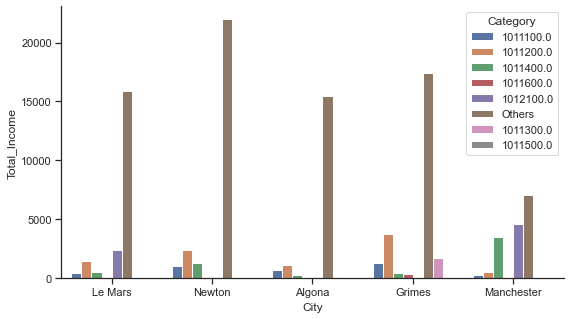

In [107]:
bar_plot(category_in_city,'City','Total_Income','Category')

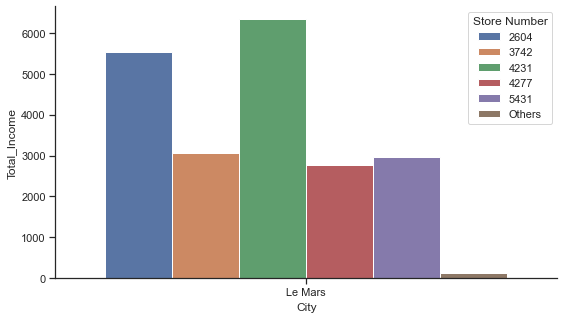

In [110]:
bar_plot(store_in_city.loc[store_in_city['City'] == 'Le Mars'],'City','Total_Income','Store Number')

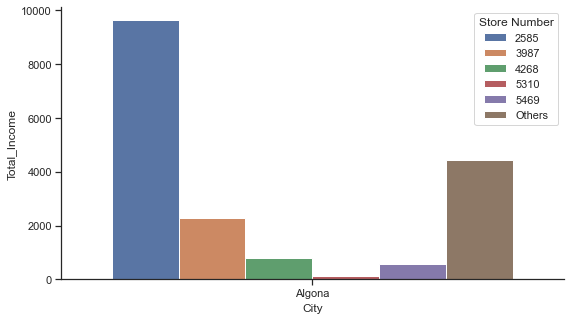

In [119]:
bar_plot(store_in_city.loc[store_in_city['City'] == 'Algona'],'City','Total_Income','Store Number')

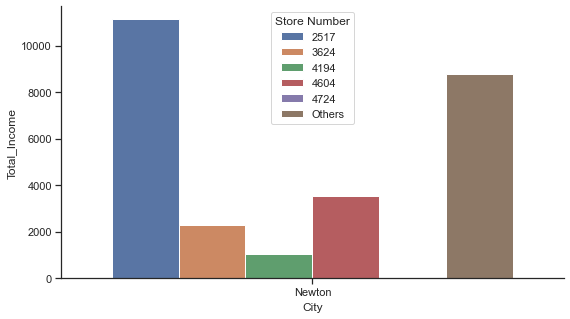

In [120]:
stacked_hist(store_in_city.loc[store_in_city['City'] == 'Newton'],'City','Total_Income','Store Number')

## Additional Information

###### Calculating total income for every month.

In [126]:
def date_time(df,column_name):
    df[str(column_name)] = pd.to_datetime(df[str(column_name)])
    monthly_sum = df[[str(column_name),'Total_Income']].resample('M', on=str(column_name)).sum()
    return monthly_sum

In [141]:
sum_20 = date_time(sales_20_sample,'Date')
sum_20

,Total_Income
Date,
2020-01-31,236777.87
2020-02-29,274017.49
2020-03-31,305887.48
2020-04-30,318033.18
2020-05-31,300295.54
2020-06-30,374706.07
2020-07-31,341742.16
2020-08-31,340537.22
2020-09-30,353860.07


In [142]:
month = ['January','February','March','April','May','June','July','August','September','October','November','December']
sum_20["Month"] = month
sum_20

,Total_Income,Month
Date,,
2020-01-31,236777.87,January
2020-02-29,274017.49,February
2020-03-31,305887.48,March
2020-04-30,318033.18,April
2020-05-31,300295.54,May
2020-06-30,374706.07,June
2020-07-31,341742.16,July
2020-08-31,340537.22,August
2020-09-30,353860.07,September


###### Visualizing total income for every month.

In [139]:
def month_income(df,x,y):
    f, ax = plt.subplots(figsize=(12, 7))
    sns.despine(f)
    sns.barplot(data=df, x=x, y=y)
    plt.show()

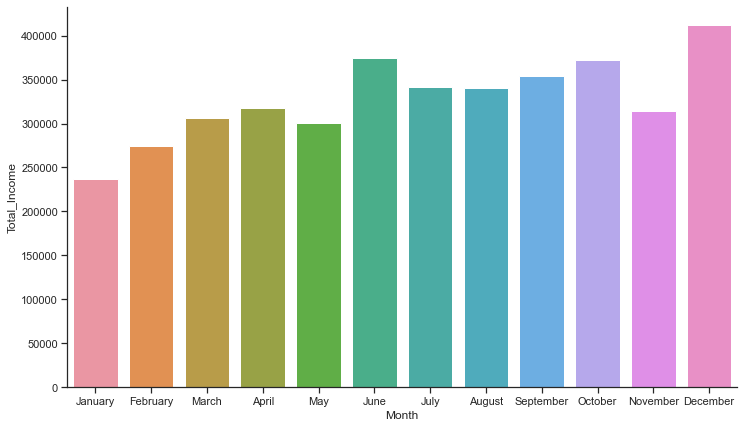

In [143]:
month_income(sum_20,'Month','Total_Income')

###### Calculating the most purchased bottle volume.

In [145]:
bottle_volume = sales_20_sample[["Bottle Volume (ml)","Total_Income"]].groupby(["Bottle Volume (ml)"]).sum().reset_index()

bottle_volume

,Bottle Volume (ml),Total_Income
0,20,494.57
1,50,145835.30
2,100,44273.49
3,150,121.50
4,200,90002.55
5,375,270081.65
6,400,296.00
7,600,756.14
8,750,1696208.81
9,800,1136.94


In [148]:
def volumes_bar(df,x,y):
    f, ax = plt.subplots(figsize=(9, 7))
    sns.despine(f)
    sns.barplot(data=df, x=x, y=y)
    plt.show()

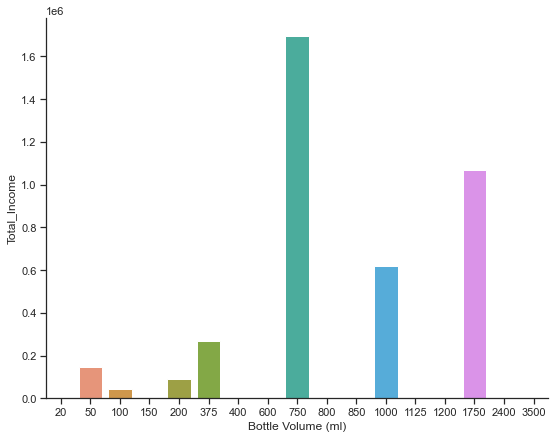

In [149]:
volumes_bar(bottle_volume,"Bottle Volume (ml)","Total_Income")

# --- END ---